In [ ]:
import os
import sys
from tempfile import NamedTemporaryFile
from urllib.request import urlopen
from urllib.parse import unquote, urlparse
from urllib.error import HTTPError
from zipfile import ZipFile
import tarfile
import shutil

CHUNK_SIZE = 40960
DATA_SOURCE_MAPPING = 'brain-mri-images-for-brain-tumor-detection:https%3A%2F%2Fstorage.googleapis.com%2Fkaggle-data-sets%2F165566%2F377107%2Fbundle%2Farchive.zip%3FX-Goog-Algorithm%3DGOOG4-RSA-SHA256%26X-Goog-Credential%3Dgcp-kaggle-com%2540kaggle-161607.iam.gserviceaccount.com%252F20240511%252Fauto%252Fstorage%252Fgoog4_request%26X-Goog-Date%3D20240511T193054Z%26X-Goog-Expires%3D259200%26X-Goog-SignedHeaders%3Dhost%26X-Goog-Signature%3D1bce456936ac2091f439f76e8c45e689cf5c27b302fb8167195ee546a4cdbe95e16049c5fcf9611acd5347baaf366060ababc627fd56333cce8b93dbac458564079a66a6d409e62902463f138ce303f69f9709f7ac05d2bee76402f5a2393e17e6097f328bb4869d6dd073774c8991d138076a062f26ba545016de534f9ba8bbf95fa325d393072ed4c597ce3d34a00d36a5e925ecb21015832870747e777d6bc50c2eb662de01220a6cf9ca873ca32327c1f9bdee289544cb153086f1c511c8ba93e2a361355a1dfbb486f66c66b049c0f231fb8862ee2b3a0bce2ba4a1af48fb21060594e02f7e775777feee15783c40d4f548abf64e4838e6cbb226b62861,research-papers-medical-imaging:https%3A%2F%2Fstorage.googleapis.com%2Fkaggle-data-sets%2F3481576%2F6081372%2Fbundle%2Farchive.zip%3FX-Goog-Algorithm%3DGOOG4-RSA-SHA256%26X-Goog-Credential%3Dgcp-kaggle-com%2540kaggle-161607.iam.gserviceaccount.com%252F20240511%252Fauto%252Fstorage%252Fgoog4_request%26X-Goog-Date%3D20240511T193054Z%26X-Goog-Expires%3D259200%26X-Goog-SignedHeaders%3Dhost%26X-Goog-Signature%3D098f5b6b316ab8592f201ec29a08bdd73fd9a60af21ce96b4536a7a4c4d0d071a6bb87a1050b232e319c51928d8122f1fc89ef1349743a08bf5319aa9d65266ee67bb01828a6cc85728913a56720a68d642809254a60b0eaa8aa347e9dd3ec28970ccb01d9e058be9862a2083f320a2f264c95b9ea16fb48ee3837c54765825ff44df27ab75abd5b58c5247f6372f72462ca7247655a03a7176af394ae286eb3dac9aff5d1db71ea487a062094f7f5a3d373f5c8cc0c090ec010dbee52b824ce6a5d9a3b5566619e0a916ba44cb37ff3b7e05ee5e8d52de08e451d9ecb0ffb0b0f11cfd0e9c98b71dc664f80e0aba576357c4dda6feed017156312e69a547f9d,unet-dataset:https%3A%2F%2Fstorage.googleapis.com%2Fkaggle-data-sets%2F3484143%2F6085014%2Fbundle%2Farchive.zip%3FX-Goog-Algorithm%3DGOOG4-RSA-SHA256%26X-Goog-Credential%3Dgcp-kaggle-com%2540kaggle-161607.iam.gserviceaccount.com%252F20240511%252Fauto%252Fstorage%252Fgoog4_request%26X-Goog-Date%3D20240511T193054Z%26X-Goog-Expires%3D259200%26X-Goog-SignedHeaders%3Dhost%26X-Goog-Signature%3D7c1acc992bb5a4e7e68a8e8cba4f2caf50ef396cf6dd37fd90df63f7928106c78783051bb9d652e0bf47a198690bf4b75b8c6fb18fa74295d67dc680501d88f93417ed3ea08a823adfa2e3fd13e381d01dd8c72cdec30ff788fddf610be1624d7d06e772acf4eb439f4ce2a218f132cfca5bae573c40ff6d3c8ddb73df19a3383f6a3a788b9e0a1bb336a9c8638ab6a9ad29c9f8123b602482f3ac2b37fdd57fd103c09b8ea9469aafb9690658446d876f6644c21b027d28370cf43e0297bf832137926c53e67e774aca753096f77d2bb61d57ff7ca7ded03d9a35d2827624accc4bbfd0434e154848baa60c49c04c0be91261e8d0c805ebf7226258285c0f19'

CUSTOM_PATH = '/content/'

os.makedirs(CUSTOM_PATH, exist_ok=True)

for data_source_mapping in DATA_SOURCE_MAPPING.split(','):
    directory, download_url_encoded = data_source_mapping.split(':')
    download_url = unquote(download_url_encoded)
    filename = urlparse(download_url).path
    destination_path = os.path.join(CUSTOM_PATH, directory)
    try:
        with urlopen(download_url) as fileres, NamedTemporaryFile() as tfile:
            total_length = fileres.headers['content-length']
            print(f'Downloading {directory}, {total_length} bytes compressed')
            dl = 0
            data = fileres.read(CHUNK_SIZE)
            while len(data) > 0:
                dl += len(data)
                tfile.write(data)
                done = int(50 * dl / int(total_length))
                sys.stdout.write(f"\r[{'=' * done}{' ' * (50-done)}] {dl} bytes downloaded")
                sys.stdout.flush()
                data = fileres.read(CHUNK_SIZE)
            if filename.endswith('.zip'):
              with ZipFile(tfile) as zfile:
                zfile.extractall(destination_path)
            else:
              with tarfile.open(tfile.name) as tarfile:
                tarfile.extractall(destination_path)
            print(f'\nDownloaded and uncompressed: {directory}')
    except HTTPError as e:
        print(f'Failed to load (likely expired) {download_url} to path {destination_path}')
        continue
    except OSError as e:
        print(f'Failed to load {download_url} to path {destination_path}')
        continue

print('Data source import complete.')


[==================================================] 15828590 bytes downloaded
Downloaded and uncompressed: brain-mri-images-for-brain-tumor-detection
[==================================================] 425079 bytes downloaded
Downloaded and uncompressed: research-papers-medical-imaging
[==================================================] 346274323 bytes downloaded
Downloaded and uncompressed: unet-dataset
Data source import complete.


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from tqdm import tqdm
import cv2
import os
import seaborn as sns
import tensorflow as tf
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'

from keras.models import Sequential, Model
from keras.layers import Dense, Flatten, Conv2D, Reshape, Input, Conv2DTranspose
from keras.layers import Activation, LeakyReLU, BatchNormalization, Dropout, Resizing
from keras.losses import BinaryCrossentropy
from tensorflow.keras.applications import VGG16

import warnings
warnings.filterwarnings('ignore')

try:
    from tensorflow.keras.optimizers import Adam
except:
    from keras.optimizers import Adam

In [ ]:
NOISE_DIM = 100
BATCH_SIZE = 4
STEPS_PER_EPOCH = 2000
EPOCHS = 5
SEED = 40
WIDTH, HEIGHT, CHANNELS = 128, 128, 1

OPTIMIZER = Adam(0.0002, 0.5)

In [ ]:
MAIN_DIR = "/content/brain-mri-images-for-brain-tumor-detection/yes"

In [ ]:
#Loading and Preprocessing the Images
def load_images(folder):

    imgs = []
    target = 1
    labels = []
    for i in os.listdir(folder):
        img_dir = os.path.join(folder,i)
        try:
            img = cv2.imread(img_dir)
            img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
            img = cv2.resize(img, (128,128))
            imgs.append(img)
            labels.append(target)
        except:
            continue

    imgs = np.array(imgs)
    labels = np.array(labels)

    return imgs, labels

In [ ]:
data, labels = load_images(MAIN_DIR)
data.shape, labels.shape

((155, 128, 128), (155,))

In [ ]:
#Generate 20 random numbers to index images from data
np.random.seed(SEED)
idxs = np.random.randint(0, 155, 20)

In [ ]:
X_train = data[idxs]
X_train.shape

(20, 128, 128)

In [ ]:
# Normalize the Images
X_train = (X_train.astype(np.float32) - 127.5) / 127.5

# Reshape images
X_train = X_train.reshape(-1, WIDTH,HEIGHT,CHANNELS)

# Check shape
X_train.shape

(20, 128, 128, 1)

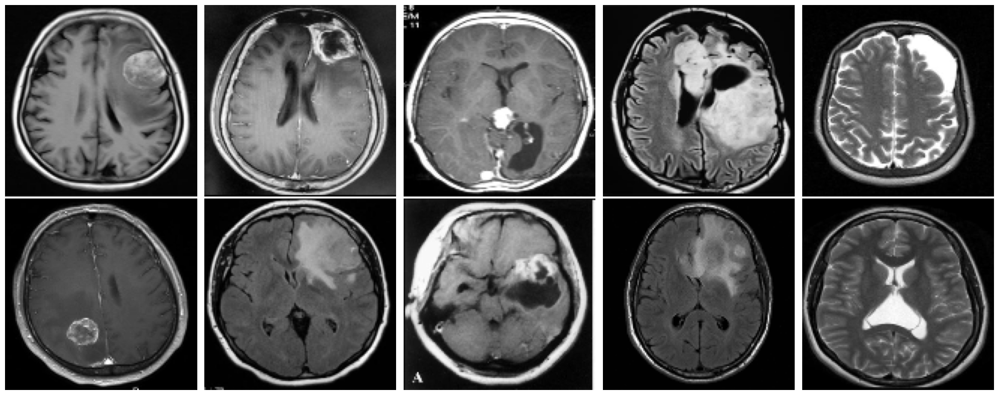

In [ ]:
#Plotting The Real Images
plt.figure(figsize=(20,8))
for i in range(10):
    axs = plt.subplot(2,5,i+1)
    plt.imshow(X_train[i], cmap="gray")
    plt.axis('off')
    axs.set_xticklabels([])
    axs.set_yticklabels([])
    plt.subplots_adjust(wspace=None, hspace=None)
plt.tight_layout()

In [ ]:
#The Architecture
def build_generator():

    """
        Generator model "generates" images using random noise. The random noise AKA Latent Vector
        is sampled from a Normal Distribution which is given as the input to the Generator. Using
        Transposed Convolution, the latent vector is transformed to produce an image
        We use 3 Conv2DTranspose layers (which help in producing an image using features; opposite
        of Convolutional Learning)

        Input: Random Noise / Latent Vector
        Output: Image
    """

    model = Sequential([

        Dense(32*32*256, input_dim=NOISE_DIM),
        LeakyReLU(alpha=0.2),
        Reshape((32,32,256)),

        Conv2DTranspose(128, (4, 4), strides=2, padding='same'),
        LeakyReLU(alpha=0.2),

        Conv2DTranspose(128, (4, 4), strides=2, padding='same'),
        LeakyReLU(alpha=0.2),

        Conv2D(CHANNELS, (4, 4), padding='same', activation='tanh')
    ],
    name="generator")
    model.summary()
    model.compile(loss="binary_crossentropy", optimizer=OPTIMIZER, )

    return model

In [ ]:
def build_discriminator():

    """
        Discriminator is the model which is responsible for classifying the generated images
        as fake or real. Our end goal is to create a Generator so powerful that the Discriminator
        is unable to classify real and fake images
        A simple Convolutional Neural Network with 2 Conv2D layers connected to a Dense output layer
        Output layer activation is Sigmoid since this is a Binary Classifier

        Input: Generated / Real Image
        Output: Validity of Image (Fake or Real)

    """

    model = Sequential([

        Conv2D(64, (3, 3), padding='same', input_shape=(WIDTH, HEIGHT, CHANNELS)),
        LeakyReLU(alpha=0.2),

        Conv2D(128, (3, 3), strides=2, padding='same'),
        LeakyReLU(alpha=0.2),

        Conv2D(128, (3, 3), strides=2, padding='same'),
        LeakyReLU(alpha=0.2),

        Conv2D(256, (3, 3), strides=2, padding='same'),
        LeakyReLU(alpha=0.2),

        Flatten(),
        Dropout(0.4),
        Dense(1, activation="sigmoid", input_shape=(WIDTH, HEIGHT, CHANNELS))
    ], name="discriminator")
    model.summary()
    model.compile(loss="binary_crossentropy",optimizer=OPTIMIZER, )

    return model

In [ ]:
#Putting it together
print('\n')
discriminator = build_discriminator()
print('\n')
generator = build_generator()

discriminator.trainable = False

gan_input = Input(shape=(NOISE_DIM,))
fake_image = generator(gan_input)

gan_output = discriminator(fake_image)

gan = Model(gan_input, gan_output, name="gan_model")
gan.compile(loss="binary_crossentropy", optimizer=Adam(0.0002, 0.5))

print("The Combined Network:\n")
gan.summary()



Model: "discriminator"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 128, 128, 64)      640       
                                                                 
 leaky_re_lu (LeakyReLU)     (None, 128, 128, 64)      0         
                                                                 
 conv2d_1 (Conv2D)           (None, 64, 64, 128)       73856     
                                                                 
 leaky_re_lu_1 (LeakyReLU)   (None, 64, 64, 128)       0         
                                                                 
 conv2d_2 (Conv2D)           (None, 32, 32, 128)       147584    
                                                                 
 leaky_re_lu_2 (LeakyReLU)   (None, 32, 32, 128)       0         
                                                                 
 conv2d_3 (Conv2D)           (None, 16, 16, 256)   

In [ ]:
def sample_images(noise, subplots, figsize=(22,8), save=False):
    generated_images = generator.predict(noise)
    plt.figure(figsize=figsize)

    for i, image in enumerate(generated_images):
        plt.subplot(subplots[0], subplots[1], i+1)
        if CHANNELS == 1:
            plt.imshow(image.reshape((WIDTH, HEIGHT)), cmap='gray')

        else:
            plt.imshow(image.reshape((WIDTH, HEIGHT, CHANNELS)))
        if save == True:
            img_name = "gen" + str(i)
            plt.savefig(img_name)
        plt.subplots_adjust(wspace=None, hspace=None)
        plt.axis('off')

    plt.tight_layout()
    plt.show()

  0%|          | 0/2000 [00:00<?, ?it/s]

1/1 [==============================] - 2s 2s/step


  0%|          | 1/2000 [00:11<6:14:58, 11.25s/it]

1/1 [==============================] - 0s 21ms/step


  0%|          | 2/2000 [00:11<2:36:40,  4.71s/it]

1/1 [==============================] - 0s 18ms/step


  0%|          | 3/2000 [00:11<1:27:04,  2.62s/it]

1/1 [==============================] - 0s 18ms/step


  0%|          | 4/2000 [00:11<54:14,  1.63s/it]  

1/1 [==============================] - 0s 17ms/step


  0%|          | 5/2000 [00:11<35:58,  1.08s/it]

1/1 [==============================] - 0s 17ms/step


  0%|          | 6/2000 [00:11<24:55,  1.33it/s]

1/1 [==============================] - 0s 16ms/step


  0%|          | 7/2000 [00:11<18:05,  1.84it/s]

1/1 [==============================] - 0s 18ms/step


  0%|          | 8/2000 [00:12<13:33,  2.45it/s]

1/1 [==============================] - 0s 16ms/step


  0%|          | 9/2000 [00:12<10:33,  3.14it/s]

1/1 [==============================] - 0s 17ms/step


  0%|          | 10/2000 [00:12<08:25,  3.94it/s]

1/1 [==============================] - 0s 20ms/step


  1%|          | 11/2000 [00:12<07:01,  4.72it/s]

1/1 [==============================] - 0s 18ms/step


  1%|          | 12/2000 [00:12<06:02,  5.48it/s]

1/1 [==============================] - 0s 18ms/step


  1%|          | 13/2000 [00:12<05:19,  6.22it/s]

1/1 [==============================] - 0s 18ms/step


  1%|          | 14/2000 [00:12<04:47,  6.92it/s]

1/1 [==============================] - 0s 16ms/step


  1%|          | 15/2000 [00:12<04:25,  7.47it/s]

1/1 [==============================] - 0s 18ms/step


  1%|          | 16/2000 [00:12<04:10,  7.92it/s]

1/1 [==============================] - 0s 19ms/step


  1%|          | 17/2000 [00:13<04:12,  7.86it/s]

1/1 [==============================] - 0s 19ms/step


  1%|          | 18/2000 [00:13<04:06,  8.05it/s]

1/1 [==============================] - 0s 17ms/step


  1%|          | 19/2000 [00:13<04:13,  7.81it/s]

1/1 [==============================] - 0s 20ms/step


  1%|          | 20/2000 [00:13<04:08,  7.98it/s]

1/1 [==============================] - 0s 18ms/step


  1%|          | 21/2000 [00:13<04:05,  8.07it/s]

1/1 [==============================] - 0s 16ms/step


  1%|          | 22/2000 [00:13<03:56,  8.35it/s]

1/1 [==============================] - 0s 16ms/step


  1%|          | 23/2000 [00:13<03:50,  8.57it/s]

1/1 [==============================] - 0s 22ms/step


  1%|          | 24/2000 [00:13<03:59,  8.25it/s]

1/1 [==============================] - 0s 20ms/step


  1%|▏         | 25/2000 [00:14<04:03,  8.10it/s]

1/1 [==============================] - 0s 19ms/step


  1%|▏         | 26/2000 [00:14<03:57,  8.33it/s]

1/1 [==============================] - 0s 18ms/step


  1%|▏         | 27/2000 [00:14<04:02,  8.15it/s]

1/1 [==============================] - 0s 18ms/step


  1%|▏         | 28/2000 [00:14<04:01,  8.16it/s]

1/1 [==============================] - 0s 31ms/step


  1%|▏         | 29/2000 [00:14<04:19,  7.60it/s]

1/1 [==============================] - 0s 43ms/step


  2%|▏         | 30/2000 [00:14<04:42,  6.97it/s]

1/1 [==============================] - 0s 29ms/step


  2%|▏         | 31/2000 [00:14<04:44,  6.93it/s]

1/1 [==============================] - 0s 30ms/step


  2%|▏         | 32/2000 [00:15<05:03,  6.49it/s]

1/1 [==============================] - 0s 24ms/step


  2%|▏         | 33/2000 [00:15<05:01,  6.52it/s]

1/1 [==============================] - 0s 30ms/step


  2%|▏         | 34/2000 [00:15<05:21,  6.12it/s]

1/1 [==============================] - 0s 25ms/step


  2%|▏         | 35/2000 [00:15<05:36,  5.85it/s]

1/1 [==============================] - 0s 31ms/step


  2%|▏         | 36/2000 [00:15<05:34,  5.88it/s]

1/1 [==============================] - 0s 27ms/step


  2%|▏         | 37/2000 [00:15<05:17,  6.18it/s]

1/1 [==============================] - 0s 25ms/step


  2%|▏         | 38/2000 [00:16<05:35,  5.85it/s]

1/1 [==============================] - 0s 25ms/step


  2%|▏         | 39/2000 [00:16<05:21,  6.10it/s]

1/1 [==============================] - 0s 32ms/step


  2%|▏         | 40/2000 [00:16<05:48,  5.62it/s]

1/1 [==============================] - 0s 50ms/step


  2%|▏         | 41/2000 [00:16<06:17,  5.19it/s]

1/1 [==============================] - 0s 54ms/step


  2%|▏         | 42/2000 [00:16<06:24,  5.09it/s]

1/1 [==============================] - 0s 35ms/step


  2%|▏         | 43/2000 [00:17<06:15,  5.22it/s]

1/1 [==============================] - 0s 38ms/step


  2%|▏         | 44/2000 [00:17<06:18,  5.17it/s]

1/1 [==============================] - 0s 35ms/step


  2%|▏         | 45/2000 [00:17<06:38,  4.91it/s]

1/1 [==============================] - 0s 25ms/step


  2%|▏         | 46/2000 [00:17<06:28,  5.03it/s]

1/1 [==============================] - 0s 25ms/step


  2%|▏         | 47/2000 [00:17<06:24,  5.08it/s]

1/1 [==============================] - 0s 24ms/step


  2%|▏         | 48/2000 [00:18<06:25,  5.06it/s]

1/1 [==============================] - 0s 33ms/step


  2%|▏         | 49/2000 [00:18<06:17,  5.17it/s]

1/1 [==============================] - 0s 31ms/step


  2%|▎         | 50/2000 [00:18<06:16,  5.18it/s]

1/1 [==============================] - 0s 30ms/step


  3%|▎         | 51/2000 [00:18<06:08,  5.29it/s]

1/1 [==============================] - 0s 25ms/step


  3%|▎         | 52/2000 [00:18<06:09,  5.27it/s]

1/1 [==============================] - 0s 29ms/step


  3%|▎         | 53/2000 [00:19<06:11,  5.24it/s]

1/1 [==============================] - 0s 25ms/step


  3%|▎         | 54/2000 [00:19<06:19,  5.12it/s]

1/1 [==============================] - 0s 18ms/step


  3%|▎         | 55/2000 [00:19<05:42,  5.68it/s]

1/1 [==============================] - 0s 16ms/step


  3%|▎         | 56/2000 [00:19<05:10,  6.25it/s]

1/1 [==============================] - 0s 18ms/step


  3%|▎         | 57/2000 [00:19<04:57,  6.54it/s]

1/1 [==============================] - 0s 18ms/step


  3%|▎         | 58/2000 [00:19<04:33,  7.09it/s]

1/1 [==============================] - 0s 17ms/step


  3%|▎         | 59/2000 [00:19<04:19,  7.49it/s]

1/1 [==============================] - 0s 17ms/step


  3%|▎         | 60/2000 [00:19<04:15,  7.60it/s]

1/1 [==============================] - 0s 17ms/step


  3%|▎         | 61/2000 [00:20<04:12,  7.67it/s]

1/1 [==============================] - 0s 16ms/step


  3%|▎         | 62/2000 [00:20<04:03,  7.96it/s]

1/1 [==============================] - 0s 16ms/step


  3%|▎         | 63/2000 [00:20<04:05,  7.90it/s]

1/1 [==============================] - 0s 19ms/step


  3%|▎         | 64/2000 [00:20<03:57,  8.16it/s]

1/1 [==============================] - 0s 18ms/step


  3%|▎         | 65/2000 [00:20<03:54,  8.24it/s]

1/1 [==============================] - 0s 19ms/step


  3%|▎         | 66/2000 [00:20<03:55,  8.22it/s]

1/1 [==============================] - 0s 16ms/step


  3%|▎         | 67/2000 [00:20<03:57,  8.15it/s]

1/1 [==============================] - 0s 16ms/step


  3%|▎         | 68/2000 [00:20<03:49,  8.41it/s]

1/1 [==============================] - 0s 17ms/step


  3%|▎         | 69/2000 [00:21<03:44,  8.62it/s]

1/1 [==============================] - 0s 17ms/step


  4%|▎         | 70/2000 [00:21<03:42,  8.69it/s]

1/1 [==============================] - 0s 18ms/step


  4%|▎         | 71/2000 [00:21<03:43,  8.64it/s]

1/1 [==============================] - 0s 16ms/step


  4%|▎         | 72/2000 [00:21<03:45,  8.56it/s]

1/1 [==============================] - 0s 19ms/step


  4%|▎         | 73/2000 [00:21<03:42,  8.66it/s]

1/1 [==============================] - 0s 17ms/step


  4%|▎         | 74/2000 [00:21<03:48,  8.44it/s]

1/1 [==============================] - 0s 19ms/step


  4%|▍         | 75/2000 [00:21<03:44,  8.56it/s]

1/1 [==============================] - 0s 16ms/step


  4%|▍         | 76/2000 [00:21<03:41,  8.69it/s]

1/1 [==============================] - 0s 18ms/step


  4%|▍         | 77/2000 [00:21<03:38,  8.81it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▍         | 78/2000 [00:22<03:38,  8.78it/s]

1/1 [==============================] - 0s 18ms/step


  4%|▍         | 79/2000 [00:22<03:36,  8.85it/s]

1/1 [==============================] - 0s 18ms/step


  4%|▍         | 80/2000 [00:22<03:38,  8.81it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▍         | 81/2000 [00:22<03:45,  8.51it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▍         | 82/2000 [00:22<03:49,  8.36it/s]

1/1 [==============================] - 0s 16ms/step


  4%|▍         | 83/2000 [00:22<03:44,  8.55it/s]

1/1 [==============================] - 0s 16ms/step


  4%|▍         | 84/2000 [00:22<03:39,  8.72it/s]

1/1 [==============================] - 0s 18ms/step


  4%|▍         | 85/2000 [00:22<03:44,  8.55it/s]

1/1 [==============================] - 0s 16ms/step


  4%|▍         | 86/2000 [00:23<03:39,  8.73it/s]

1/1 [==============================] - 0s 17ms/step


  4%|▍         | 87/2000 [00:23<03:35,  8.87it/s]

1/1 [==============================] - 0s 16ms/step


  4%|▍         | 88/2000 [00:23<03:34,  8.93it/s]

1/1 [==============================] - 0s 18ms/step


  4%|▍         | 89/2000 [00:23<03:35,  8.88it/s]

1/1 [==============================] - 0s 19ms/step


  4%|▍         | 90/2000 [00:23<03:38,  8.75it/s]

1/1 [==============================] - 0s 19ms/step


  5%|▍         | 91/2000 [00:23<03:40,  8.68it/s]

1/1 [==============================] - 0s 18ms/step


  5%|▍         | 92/2000 [00:23<03:37,  8.76it/s]

1/1 [==============================] - 0s 17ms/step


  5%|▍         | 93/2000 [00:23<03:35,  8.86it/s]

1/1 [==============================] - 0s 16ms/step


  5%|▍         | 94/2000 [00:23<03:38,  8.74it/s]

1/1 [==============================] - 0s 16ms/step


  5%|▍         | 95/2000 [00:24<03:41,  8.59it/s]

1/1 [==============================] - 0s 18ms/step


  5%|▍         | 96/2000 [00:24<03:38,  8.72it/s]

1/1 [==============================] - 0s 17ms/step


  5%|▍         | 97/2000 [00:24<03:47,  8.37it/s]

1/1 [==============================] - 0s 19ms/step


  5%|▍         | 98/2000 [00:24<03:48,  8.32it/s]

1/1 [==============================] - 0s 22ms/step


  5%|▍         | 99/2000 [00:24<03:55,  8.07it/s]

1/1 [==============================] - 0s 19ms/step


  5%|▌         | 100/2000 [00:24<03:49,  8.26it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▌         | 101/2000 [00:24<03:47,  8.36it/s]

1/1 [==============================] - 0s 17ms/step


  5%|▌         | 102/2000 [00:24<03:45,  8.41it/s]

1/1 [==============================] - 0s 16ms/step


  5%|▌         | 103/2000 [00:25<03:40,  8.59it/s]

1/1 [==============================] - 0s 19ms/step


  5%|▌         | 104/2000 [00:25<03:37,  8.71it/s]

1/1 [==============================] - 0s 16ms/step


  5%|▌         | 105/2000 [00:25<03:35,  8.78it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▌         | 106/2000 [00:25<03:35,  8.79it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▌         | 107/2000 [00:25<04:09,  7.60it/s]

1/1 [==============================] - 0s 18ms/step


  5%|▌         | 108/2000 [00:25<04:11,  7.52it/s]

1/1 [==============================] - 0s 17ms/step


  5%|▌         | 109/2000 [00:25<04:02,  7.80it/s]

1/1 [==============================] - 0s 19ms/step


  6%|▌         | 110/2000 [00:25<03:56,  7.99it/s]

1/1 [==============================] - 0s 17ms/step


  6%|▌         | 111/2000 [00:26<03:55,  8.00it/s]

1/1 [==============================] - 0s 17ms/step


  6%|▌         | 112/2000 [00:26<03:49,  8.23it/s]

1/1 [==============================] - 0s 16ms/step


  6%|▌         | 113/2000 [00:26<03:52,  8.13it/s]

1/1 [==============================] - 0s 17ms/step


  6%|▌         | 114/2000 [00:26<04:14,  7.42it/s]

1/1 [==============================] - 0s 17ms/step


  6%|▌         | 115/2000 [00:26<04:14,  7.40it/s]

1/1 [==============================] - 0s 16ms/step


  6%|▌         | 116/2000 [00:26<04:08,  7.57it/s]

1/1 [==============================] - 0s 17ms/step


  6%|▌         | 117/2000 [00:26<04:05,  7.66it/s]

1/1 [==============================] - 0s 17ms/step


  6%|▌         | 118/2000 [00:26<04:02,  7.77it/s]

1/1 [==============================] - 0s 17ms/step


  6%|▌         | 119/2000 [00:27<03:58,  7.89it/s]

1/1 [==============================] - 0s 19ms/step


  6%|▌         | 120/2000 [00:27<03:51,  8.14it/s]

1/1 [==============================] - 0s 23ms/step


  6%|▌         | 121/2000 [00:27<03:48,  8.21it/s]

1/1 [==============================] - 0s 18ms/step


  6%|▌         | 122/2000 [00:27<03:44,  8.36it/s]

1/1 [==============================] - 0s 16ms/step


  6%|▌         | 123/2000 [00:27<03:51,  8.12it/s]

1/1 [==============================] - 0s 17ms/step


  6%|▌         | 124/2000 [00:27<03:46,  8.27it/s]

1/1 [==============================] - 0s 17ms/step


  6%|▋         | 125/2000 [00:27<03:42,  8.44it/s]

1/1 [==============================] - 0s 16ms/step


  6%|▋         | 126/2000 [00:27<03:48,  8.22it/s]

1/1 [==============================] - 0s 18ms/step


  6%|▋         | 127/2000 [00:27<03:42,  8.40it/s]

1/1 [==============================] - 0s 18ms/step


  6%|▋         | 128/2000 [00:28<03:45,  8.31it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▋         | 129/2000 [00:28<03:41,  8.45it/s]

1/1 [==============================] - 0s 18ms/step


  6%|▋         | 130/2000 [00:28<03:37,  8.60it/s]

1/1 [==============================] - 0s 18ms/step


  7%|▋         | 131/2000 [00:28<03:47,  8.23it/s]

1/1 [==============================] - 0s 20ms/step


  7%|▋         | 132/2000 [00:28<03:45,  8.28it/s]

1/1 [==============================] - 0s 18ms/step


  7%|▋         | 133/2000 [00:28<03:39,  8.49it/s]

1/1 [==============================] - 0s 18ms/step


  7%|▋         | 134/2000 [00:28<03:35,  8.65it/s]

1/1 [==============================] - 0s 18ms/step


  7%|▋         | 135/2000 [00:28<03:36,  8.63it/s]

1/1 [==============================] - 0s 16ms/step


  7%|▋         | 136/2000 [00:29<03:33,  8.72it/s]

1/1 [==============================] - 0s 19ms/step


  7%|▋         | 137/2000 [00:29<03:39,  8.49it/s]

1/1 [==============================] - 0s 17ms/step


  7%|▋         | 138/2000 [00:29<03:55,  7.91it/s]

1/1 [==============================] - 0s 25ms/step


  7%|▋         | 139/2000 [00:29<04:30,  6.88it/s]

1/1 [==============================] - 0s 32ms/step


  7%|▋         | 140/2000 [00:29<04:54,  6.31it/s]

1/1 [==============================] - 0s 25ms/step


  7%|▋         | 141/2000 [00:29<05:04,  6.10it/s]

1/1 [==============================] - 0s 23ms/step


  7%|▋         | 142/2000 [00:30<05:13,  5.92it/s]

1/1 [==============================] - 0s 24ms/step


  7%|▋         | 143/2000 [00:30<05:00,  6.17it/s]

1/1 [==============================] - 0s 25ms/step


  7%|▋         | 144/2000 [00:30<05:03,  6.11it/s]

1/1 [==============================] - 0s 23ms/step


  7%|▋         | 145/2000 [00:30<05:15,  5.88it/s]

1/1 [==============================] - 0s 30ms/step


  7%|▋         | 146/2000 [00:30<05:28,  5.64it/s]

1/1 [==============================] - 0s 31ms/step


  7%|▋         | 147/2000 [00:30<05:41,  5.43it/s]

1/1 [==============================] - 0s 27ms/step


  7%|▋         | 148/2000 [00:31<05:25,  5.70it/s]

1/1 [==============================] - 0s 29ms/step


  7%|▋         | 149/2000 [00:31<05:37,  5.49it/s]

1/1 [==============================] - 0s 26ms/step


  8%|▊         | 150/2000 [00:31<05:26,  5.66it/s]

1/1 [==============================] - 0s 29ms/step


  8%|▊         | 151/2000 [00:31<05:22,  5.74it/s]

1/1 [==============================] - 0s 19ms/step


  8%|▊         | 152/2000 [00:31<04:59,  6.17it/s]

1/1 [==============================] - 0s 18ms/step


  8%|▊         | 153/2000 [00:31<04:42,  6.53it/s]

1/1 [==============================] - 0s 19ms/step


  8%|▊         | 154/2000 [00:32<04:24,  6.99it/s]

1/1 [==============================] - 0s 17ms/step


  8%|▊         | 155/2000 [00:32<04:15,  7.22it/s]

1/1 [==============================] - 0s 17ms/step


  8%|▊         | 156/2000 [00:32<04:04,  7.54it/s]

1/1 [==============================] - 0s 17ms/step


  8%|▊         | 157/2000 [00:32<04:02,  7.59it/s]

1/1 [==============================] - 0s 16ms/step


  8%|▊         | 158/2000 [00:32<03:53,  7.89it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 159/2000 [00:32<03:58,  7.71it/s]

1/1 [==============================] - 0s 16ms/step


  8%|▊         | 160/2000 [00:32<03:50,  7.98it/s]

1/1 [==============================] - 0s 16ms/step


  8%|▊         | 161/2000 [00:32<03:49,  8.03it/s]

1/1 [==============================] - 0s 17ms/step


  8%|▊         | 162/2000 [00:33<03:45,  8.15it/s]

1/1 [==============================] - 0s 19ms/step


  8%|▊         | 163/2000 [00:33<03:40,  8.32it/s]

1/1 [==============================] - 0s 17ms/step


  8%|▊         | 164/2000 [00:33<03:35,  8.51it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 165/2000 [00:33<03:37,  8.44it/s]

1/1 [==============================] - 0s 18ms/step


  8%|▊         | 166/2000 [00:33<03:59,  7.66it/s]

1/1 [==============================] - 0s 25ms/step


  8%|▊         | 167/2000 [00:33<04:04,  7.49it/s]

1/1 [==============================] - 0s 16ms/step


  8%|▊         | 168/2000 [00:33<03:52,  7.88it/s]

1/1 [==============================] - 0s 18ms/step


  8%|▊         | 169/2000 [00:33<03:45,  8.11it/s]

1/1 [==============================] - 0s 18ms/step


  8%|▊         | 170/2000 [00:33<03:39,  8.33it/s]

1/1 [==============================] - 0s 17ms/step


  9%|▊         | 171/2000 [00:34<03:44,  8.16it/s]

1/1 [==============================] - 0s 16ms/step


  9%|▊         | 172/2000 [00:34<03:40,  8.29it/s]

1/1 [==============================] - 0s 16ms/step


  9%|▊         | 173/2000 [00:34<03:35,  8.47it/s]

1/1 [==============================] - 0s 17ms/step


  9%|▊         | 174/2000 [00:34<03:38,  8.34it/s]

1/1 [==============================] - 0s 18ms/step


  9%|▉         | 175/2000 [00:34<03:38,  8.35it/s]

1/1 [==============================] - 0s 17ms/step


  9%|▉         | 176/2000 [00:34<03:39,  8.30it/s]

1/1 [==============================] - 0s 16ms/step


  9%|▉         | 177/2000 [00:34<03:35,  8.45it/s]

1/1 [==============================] - 0s 17ms/step


  9%|▉         | 178/2000 [00:34<03:32,  8.57it/s]

1/1 [==============================] - 0s 17ms/step


  9%|▉         | 179/2000 [00:35<03:29,  8.69it/s]

1/1 [==============================] - 0s 19ms/step


  9%|▉         | 180/2000 [00:35<03:35,  8.44it/s]

1/1 [==============================] - 0s 18ms/step


  9%|▉         | 181/2000 [00:35<03:36,  8.41it/s]

1/1 [==============================] - 0s 17ms/step


  9%|▉         | 182/2000 [00:35<03:34,  8.48it/s]

1/1 [==============================] - 0s 17ms/step


  9%|▉         | 183/2000 [00:35<03:35,  8.42it/s]

1/1 [==============================] - 0s 19ms/step


  9%|▉         | 184/2000 [00:35<03:34,  8.45it/s]

1/1 [==============================] - 0s 18ms/step


  9%|▉         | 185/2000 [00:35<03:33,  8.49it/s]

1/1 [==============================] - 0s 17ms/step


  9%|▉         | 186/2000 [00:35<03:37,  8.36it/s]

1/1 [==============================] - 0s 17ms/step


  9%|▉         | 187/2000 [00:36<03:33,  8.49it/s]

1/1 [==============================] - 0s 18ms/step


  9%|▉         | 188/2000 [00:36<03:35,  8.42it/s]

1/1 [==============================] - 0s 16ms/step


  9%|▉         | 189/2000 [00:36<03:36,  8.37it/s]

1/1 [==============================] - 0s 20ms/step


 10%|▉         | 190/2000 [00:36<03:33,  8.47it/s]

1/1 [==============================] - 0s 18ms/step


 10%|▉         | 191/2000 [00:36<03:32,  8.52it/s]

1/1 [==============================] - 0s 18ms/step


 10%|▉         | 192/2000 [00:36<03:32,  8.50it/s]

1/1 [==============================] - 0s 20ms/step


 10%|▉         | 193/2000 [00:36<03:35,  8.37it/s]

1/1 [==============================] - 0s 20ms/step


 10%|▉         | 194/2000 [00:36<03:32,  8.48it/s]

1/1 [==============================] - 0s 18ms/step


 10%|▉         | 195/2000 [00:36<03:30,  8.58it/s]

1/1 [==============================] - 0s 18ms/step


 10%|▉         | 196/2000 [00:37<03:46,  7.96it/s]

1/1 [==============================] - 0s 19ms/step


 10%|▉         | 197/2000 [00:37<03:42,  8.10it/s]

1/1 [==============================] - 0s 17ms/step


 10%|▉         | 198/2000 [00:37<03:39,  8.20it/s]

1/1 [==============================] - 0s 17ms/step


 10%|▉         | 199/2000 [00:37<03:35,  8.37it/s]

1/1 [==============================] - 0s 19ms/step


 10%|█         | 200/2000 [00:37<03:32,  8.49it/s]

1/1 [==============================] - 0s 18ms/step


 10%|█         | 201/2000 [00:37<03:30,  8.53it/s]

1/1 [==============================] - 0s 19ms/step


 10%|█         | 202/2000 [00:37<03:38,  8.21it/s]

1/1 [==============================] - 0s 19ms/step


 10%|█         | 203/2000 [00:37<03:33,  8.40it/s]

1/1 [==============================] - 0s 18ms/step


 10%|█         | 204/2000 [00:38<03:29,  8.58it/s]

1/1 [==============================] - 0s 16ms/step


 10%|█         | 205/2000 [00:38<03:32,  8.43it/s]

1/1 [==============================] - 0s 18ms/step


 10%|█         | 206/2000 [00:38<03:29,  8.56it/s]

1/1 [==============================] - 0s 17ms/step


 10%|█         | 207/2000 [00:38<03:30,  8.51it/s]

1/1 [==============================] - 0s 17ms/step


 10%|█         | 208/2000 [00:38<03:32,  8.42it/s]

1/1 [==============================] - 0s 20ms/step


 10%|█         | 209/2000 [00:38<03:58,  7.52it/s]

1/1 [==============================] - 0s 22ms/step


 10%|█         | 210/2000 [00:38<03:51,  7.74it/s]

1/1 [==============================] - 0s 17ms/step


 11%|█         | 211/2000 [00:38<03:43,  8.02it/s]

1/1 [==============================] - 0s 18ms/step


 11%|█         | 212/2000 [00:39<03:38,  8.17it/s]

1/1 [==============================] - 0s 18ms/step


 11%|█         | 213/2000 [00:39<03:34,  8.32it/s]

1/1 [==============================] - 0s 19ms/step


 11%|█         | 214/2000 [00:39<03:32,  8.41it/s]

1/1 [==============================] - 0s 19ms/step


 11%|█         | 215/2000 [00:39<03:29,  8.51it/s]

1/1 [==============================] - 0s 102ms/step


 11%|█         | 216/2000 [00:39<05:54,  5.04it/s]

1/1 [==============================] - 0s 77ms/step


 11%|█         | 217/2000 [00:40<06:40,  4.46it/s]

1/1 [==============================] - 0s 31ms/step


 11%|█         | 218/2000 [00:40<06:42,  4.43it/s]

1/1 [==============================] - 0s 19ms/step


 11%|█         | 219/2000 [00:40<06:03,  4.91it/s]

1/1 [==============================] - 0s 18ms/step


 11%|█         | 220/2000 [00:40<05:13,  5.69it/s]

1/1 [==============================] - 0s 19ms/step


 11%|█         | 221/2000 [00:40<04:41,  6.33it/s]

1/1 [==============================] - 0s 17ms/step


 11%|█         | 222/2000 [00:40<04:50,  6.12it/s]

1/1 [==============================] - 0s 93ms/step


 11%|█         | 223/2000 [00:41<06:47,  4.36it/s]

1/1 [==============================] - 0s 76ms/step


 11%|█         | 224/2000 [00:41<08:18,  3.56it/s]

1/1 [==============================] - 0s 30ms/step


 11%|█▏        | 225/2000 [00:41<07:43,  3.83it/s]

1/1 [==============================] - 0s 28ms/step


 11%|█▏        | 226/2000 [00:42<07:00,  4.21it/s]

1/1 [==============================] - 0s 24ms/step


 11%|█▏        | 227/2000 [00:42<07:20,  4.02it/s]

1/1 [==============================] - 0s 192ms/step


 11%|█▏        | 228/2000 [00:42<10:54,  2.71it/s]

1/1 [==============================] - 0s 132ms/step


 11%|█▏        | 229/2000 [00:43<13:02,  2.26it/s]

1/1 [==============================] - 0s 28ms/step


 12%|█▏        | 230/2000 [00:43<10:54,  2.70it/s]

1/1 [==============================] - 0s 25ms/step


 12%|█▏        | 231/2000 [00:43<09:11,  3.21it/s]

1/1 [==============================] - 0s 32ms/step


 12%|█▏        | 232/2000 [00:44<08:15,  3.57it/s]

1/1 [==============================] - 0s 32ms/step


 12%|█▏        | 233/2000 [00:44<07:21,  4.00it/s]

1/1 [==============================] - 0s 31ms/step


 12%|█▏        | 234/2000 [00:44<07:05,  4.15it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 235/2000 [00:44<06:16,  4.68it/s]

1/1 [==============================] - 0s 18ms/step


 12%|█▏        | 236/2000 [00:44<05:34,  5.28it/s]

1/1 [==============================] - 0s 17ms/step


 12%|█▏        | 237/2000 [00:44<05:08,  5.72it/s]

1/1 [==============================] - 0s 17ms/step


 12%|█▏        | 238/2000 [00:45<04:51,  6.05it/s]

1/1 [==============================] - 0s 20ms/step


 12%|█▏        | 239/2000 [00:45<04:30,  6.50it/s]

1/1 [==============================] - 0s 18ms/step


 12%|█▏        | 240/2000 [00:45<04:16,  6.86it/s]

1/1 [==============================] - 0s 18ms/step


 12%|█▏        | 241/2000 [00:45<04:06,  7.12it/s]

1/1 [==============================] - 0s 18ms/step


 12%|█▏        | 242/2000 [00:45<03:58,  7.37it/s]

1/1 [==============================] - 0s 19ms/step


 12%|█▏        | 243/2000 [00:45<03:53,  7.52it/s]

1/1 [==============================] - 0s 20ms/step


 12%|█▏        | 244/2000 [00:45<03:47,  7.71it/s]

1/1 [==============================] - 0s 17ms/step


 12%|█▏        | 245/2000 [00:45<03:42,  7.90it/s]

1/1 [==============================] - 0s 18ms/step


 12%|█▏        | 246/2000 [00:46<03:39,  7.97it/s]

1/1 [==============================] - 0s 18ms/step


 12%|█▏        | 247/2000 [00:46<03:34,  8.19it/s]

1/1 [==============================] - 0s 19ms/step


 12%|█▏        | 248/2000 [00:46<03:31,  8.30it/s]

1/1 [==============================] - 0s 16ms/step


 12%|█▏        | 249/2000 [00:46<03:32,  8.23it/s]

1/1 [==============================] - 0s 17ms/step


 12%|█▎        | 250/2000 [00:46<03:30,  8.31it/s]

1/1 [==============================] - 0s 17ms/step


 13%|█▎        | 251/2000 [00:46<03:27,  8.41it/s]

1/1 [==============================] - 0s 16ms/step


 13%|█▎        | 252/2000 [00:46<03:30,  8.30it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 253/2000 [00:46<03:27,  8.41it/s]

1/1 [==============================] - 0s 18ms/step


 13%|█▎        | 254/2000 [00:47<03:25,  8.48it/s]

1/1 [==============================] - 0s 18ms/step


 13%|█▎        | 255/2000 [00:47<03:24,  8.54it/s]

1/1 [==============================] - 0s 17ms/step


 13%|█▎        | 256/2000 [00:47<03:24,  8.53it/s]

1/1 [==============================] - 0s 19ms/step


 13%|█▎        | 257/2000 [00:47<03:21,  8.63it/s]

1/1 [==============================] - 0s 16ms/step


 13%|█▎        | 258/2000 [00:47<03:27,  8.39it/s]

1/1 [==============================] - 0s 19ms/step


 13%|█▎        | 259/2000 [00:47<03:26,  8.42it/s]

1/1 [==============================] - 0s 18ms/step


 13%|█▎        | 260/2000 [00:47<03:24,  8.53it/s]

1/1 [==============================] - 0s 17ms/step


 13%|█▎        | 261/2000 [00:47<03:30,  8.26it/s]

1/1 [==============================] - 0s 18ms/step


 13%|█▎        | 262/2000 [00:47<03:33,  8.14it/s]

1/1 [==============================] - 0s 25ms/step


 13%|█▎        | 263/2000 [00:48<03:36,  8.04it/s]

1/1 [==============================] - 0s 18ms/step


 13%|█▎        | 264/2000 [00:48<03:31,  8.21it/s]

1/1 [==============================] - 0s 19ms/step


 13%|█▎        | 265/2000 [00:48<03:31,  8.20it/s]

1/1 [==============================] - 0s 19ms/step


 13%|█▎        | 266/2000 [00:48<03:34,  8.10it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 267/2000 [00:48<03:30,  8.21it/s]

1/1 [==============================] - 0s 17ms/step


 13%|█▎        | 268/2000 [00:48<03:35,  8.04it/s]

1/1 [==============================] - 0s 17ms/step


 13%|█▎        | 269/2000 [00:48<03:30,  8.22it/s]

1/1 [==============================] - 0s 17ms/step


 14%|█▎        | 270/2000 [00:48<03:31,  8.19it/s]

1/1 [==============================] - 0s 17ms/step


 14%|█▎        | 271/2000 [00:49<03:36,  7.99it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█▎        | 272/2000 [00:49<03:33,  8.10it/s]

1/1 [==============================] - 0s 19ms/step


 14%|█▎        | 273/2000 [00:49<03:35,  8.01it/s]

1/1 [==============================] - 0s 19ms/step


 14%|█▎        | 274/2000 [00:49<03:31,  8.15it/s]

1/1 [==============================] - 0s 17ms/step


 14%|█▍        | 275/2000 [00:49<03:29,  8.23it/s]

1/1 [==============================] - 0s 19ms/step


 14%|█▍        | 276/2000 [00:49<03:26,  8.37it/s]

1/1 [==============================] - 0s 17ms/step


 14%|█▍        | 277/2000 [00:49<03:24,  8.43it/s]

1/1 [==============================] - 0s 19ms/step


 14%|█▍        | 278/2000 [00:49<03:22,  8.49it/s]

1/1 [==============================] - 0s 18ms/step


 14%|█▍        | 279/2000 [00:50<03:23,  8.44it/s]

1/1 [==============================] - 0s 17ms/step


 14%|█▍        | 280/2000 [00:50<03:48,  7.53it/s]

1/1 [==============================] - 0s 17ms/step


 14%|█▍        | 281/2000 [00:50<03:37,  7.91it/s]

1/1 [==============================] - 0s 17ms/step


 14%|█▍        | 282/2000 [00:50<03:34,  8.00it/s]

1/1 [==============================] - 0s 17ms/step


 14%|█▍        | 283/2000 [00:50<03:35,  7.97it/s]

1/1 [==============================] - 0s 18ms/step


 14%|█▍        | 284/2000 [00:50<03:34,  8.01it/s]

1/1 [==============================] - 0s 19ms/step


 14%|█▍        | 285/2000 [00:50<03:28,  8.22it/s]

1/1 [==============================] - 0s 18ms/step


 14%|█▍        | 286/2000 [00:50<03:25,  8.35it/s]

1/1 [==============================] - 0s 19ms/step


 14%|█▍        | 287/2000 [00:51<03:22,  8.45it/s]

1/1 [==============================] - 0s 23ms/step


 14%|█▍        | 288/2000 [00:51<03:37,  7.86it/s]

1/1 [==============================] - 0s 17ms/step


 14%|█▍        | 289/2000 [00:51<03:40,  7.76it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█▍        | 290/2000 [00:51<03:37,  7.87it/s]

1/1 [==============================] - 0s 18ms/step


 15%|█▍        | 291/2000 [00:51<03:40,  7.74it/s]

1/1 [==============================] - 0s 19ms/step


 15%|█▍        | 292/2000 [00:51<03:33,  7.99it/s]

1/1 [==============================] - 0s 17ms/step


 15%|█▍        | 293/2000 [00:51<03:30,  8.11it/s]

1/1 [==============================] - 0s 16ms/step


 15%|█▍        | 294/2000 [00:51<03:25,  8.30it/s]

1/1 [==============================] - 0s 17ms/step


 15%|█▍        | 295/2000 [00:52<03:25,  8.31it/s]

1/1 [==============================] - 0s 18ms/step


 15%|█▍        | 296/2000 [00:52<03:27,  8.23it/s]

1/1 [==============================] - 0s 19ms/step


 15%|█▍        | 297/2000 [00:52<03:31,  8.05it/s]

1/1 [==============================] - 0s 19ms/step


 15%|█▍        | 298/2000 [00:52<03:36,  7.85it/s]

1/1 [==============================] - 0s 23ms/step


 15%|█▍        | 299/2000 [00:52<03:37,  7.82it/s]

1/1 [==============================] - 0s 23ms/step


 15%|█▌        | 300/2000 [00:52<03:42,  7.65it/s]

1/1 [==============================] - 0s 19ms/step


 15%|█▌        | 301/2000 [00:52<03:37,  7.82it/s]

1/1 [==============================] - 0s 19ms/step


 15%|█▌        | 302/2000 [00:52<03:35,  7.89it/s]

1/1 [==============================] - 0s 19ms/step


 15%|█▌        | 303/2000 [00:53<03:36,  7.85it/s]

1/1 [==============================] - 0s 17ms/step


 15%|█▌        | 304/2000 [00:53<03:39,  7.74it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█▌        | 305/2000 [00:53<03:33,  7.93it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█▌        | 306/2000 [00:53<03:38,  7.76it/s]

1/1 [==============================] - 0s 21ms/step


 15%|█▌        | 307/2000 [00:53<03:37,  7.79it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█▌        | 308/2000 [00:53<03:34,  7.89it/s]

1/1 [==============================] - 0s 18ms/step


 15%|█▌        | 309/2000 [00:53<03:35,  7.85it/s]

1/1 [==============================] - 0s 17ms/step


 16%|█▌        | 310/2000 [00:53<03:31,  7.99it/s]

1/1 [==============================] - 0s 17ms/step


 16%|█▌        | 311/2000 [00:54<03:28,  8.09it/s]

1/1 [==============================] - 0s 17ms/step


 16%|█▌        | 312/2000 [00:54<03:33,  7.89it/s]

1/1 [==============================] - 0s 18ms/step


 16%|█▌        | 313/2000 [00:54<03:28,  8.08it/s]

1/1 [==============================] - 0s 17ms/step


 16%|█▌        | 314/2000 [00:54<03:46,  7.44it/s]

1/1 [==============================] - 0s 26ms/step


 16%|█▌        | 315/2000 [00:54<04:03,  6.91it/s]

1/1 [==============================] - 0s 23ms/step


 16%|█▌        | 316/2000 [00:54<04:24,  6.36it/s]

1/1 [==============================] - 0s 25ms/step


 16%|█▌        | 317/2000 [00:55<04:24,  6.37it/s]

1/1 [==============================] - 0s 26ms/step


 16%|█▌        | 318/2000 [00:55<04:35,  6.11it/s]

1/1 [==============================] - 0s 26ms/step


 16%|█▌        | 319/2000 [00:55<04:30,  6.20it/s]

1/1 [==============================] - 0s 24ms/step


 16%|█▌        | 320/2000 [00:55<04:28,  6.27it/s]

1/1 [==============================] - 0s 27ms/step


 16%|█▌        | 321/2000 [00:55<04:33,  6.14it/s]

1/1 [==============================] - 0s 29ms/step


 16%|█▌        | 322/2000 [00:55<04:55,  5.67it/s]

1/1 [==============================] - 0s 24ms/step


 16%|█▌        | 323/2000 [00:56<05:09,  5.41it/s]

1/1 [==============================] - 0s 31ms/step


 16%|█▌        | 324/2000 [00:56<05:23,  5.18it/s]

1/1 [==============================] - 0s 27ms/step


 16%|█▋        | 325/2000 [00:56<05:26,  5.13it/s]

1/1 [==============================] - 0s 30ms/step


 16%|█▋        | 326/2000 [00:56<05:17,  5.28it/s]

1/1 [==============================] - 0s 26ms/step


 16%|█▋        | 327/2000 [00:56<05:04,  5.49it/s]

1/1 [==============================] - 0s 29ms/step


 16%|█▋        | 328/2000 [00:57<05:02,  5.53it/s]

1/1 [==============================] - 0s 20ms/step


 16%|█▋        | 329/2000 [00:57<04:40,  5.96it/s]

1/1 [==============================] - 0s 17ms/step


 16%|█▋        | 330/2000 [00:57<04:21,  6.39it/s]

1/1 [==============================] - 0s 16ms/step


 17%|█▋        | 331/2000 [00:57<04:14,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


 17%|█▋        | 332/2000 [00:57<04:05,  6.78it/s]

1/1 [==============================] - 0s 18ms/step


 17%|█▋        | 333/2000 [00:57<03:57,  7.01it/s]

1/1 [==============================] - 0s 18ms/step


 17%|█▋        | 334/2000 [00:57<03:45,  7.38it/s]

1/1 [==============================] - 0s 18ms/step


 17%|█▋        | 335/2000 [00:57<03:40,  7.54it/s]

1/1 [==============================] - 0s 17ms/step


 17%|█▋        | 336/2000 [00:58<03:33,  7.78it/s]

1/1 [==============================] - 0s 18ms/step


 17%|█▋        | 337/2000 [00:58<03:34,  7.74it/s]

1/1 [==============================] - 0s 17ms/step


 17%|█▋        | 338/2000 [00:58<03:30,  7.88it/s]

1/1 [==============================] - 0s 17ms/step


 17%|█▋        | 339/2000 [00:58<03:34,  7.75it/s]

1/1 [==============================] - 0s 17ms/step


 17%|█▋        | 340/2000 [00:58<03:30,  7.89it/s]

1/1 [==============================] - 0s 17ms/step


 17%|█▋        | 341/2000 [00:58<03:25,  8.07it/s]

1/1 [==============================] - 0s 17ms/step


 17%|█▋        | 342/2000 [00:58<03:28,  7.97it/s]

1/1 [==============================] - 0s 16ms/step


 17%|█▋        | 343/2000 [00:58<03:24,  8.09it/s]

1/1 [==============================] - 0s 17ms/step


 17%|█▋        | 344/2000 [00:59<03:22,  8.17it/s]

1/1 [==============================] - 0s 19ms/step


 17%|█▋        | 345/2000 [00:59<03:26,  8.03it/s]

1/1 [==============================] - 0s 19ms/step


 17%|█▋        | 346/2000 [00:59<03:25,  8.04it/s]

1/1 [==============================] - 0s 19ms/step


 17%|█▋        | 347/2000 [00:59<03:26,  8.00it/s]

1/1 [==============================] - 0s 18ms/step


 17%|█▋        | 348/2000 [00:59<03:25,  8.04it/s]

1/1 [==============================] - 0s 17ms/step


 17%|█▋        | 349/2000 [00:59<03:23,  8.12it/s]

1/1 [==============================] - 0s 20ms/step


 18%|█▊        | 350/2000 [00:59<03:24,  8.08it/s]

1/1 [==============================] - 0s 17ms/step


 18%|█▊        | 351/2000 [00:59<03:23,  8.08it/s]

1/1 [==============================] - 0s 20ms/step


 18%|█▊        | 352/2000 [01:00<05:22,  5.11it/s]

1/1 [==============================] - 0s 17ms/step


 18%|█▊        | 353/2000 [01:00<04:48,  5.71it/s]

1/1 [==============================] - 0s 18ms/step


 18%|█▊        | 354/2000 [01:00<04:25,  6.20it/s]

1/1 [==============================] - 0s 17ms/step


 18%|█▊        | 355/2000 [01:00<04:04,  6.73it/s]

1/1 [==============================] - 0s 18ms/step


 18%|█▊        | 356/2000 [01:00<03:53,  7.05it/s]

1/1 [==============================] - 0s 17ms/step


 18%|█▊        | 357/2000 [01:00<03:41,  7.43it/s]

1/1 [==============================] - 0s 18ms/step


 18%|█▊        | 358/2000 [01:01<03:34,  7.66it/s]

1/1 [==============================] - 0s 19ms/step


 18%|█▊        | 359/2000 [01:01<03:29,  7.85it/s]

1/1 [==============================] - 0s 18ms/step


 18%|█▊        | 360/2000 [01:01<03:27,  7.89it/s]

1/1 [==============================] - 0s 20ms/step


 18%|█▊        | 361/2000 [01:01<03:23,  8.06it/s]

1/1 [==============================] - 0s 17ms/step


 18%|█▊        | 362/2000 [01:01<03:29,  7.81it/s]

1/1 [==============================] - 0s 18ms/step


 18%|█▊        | 363/2000 [01:01<03:26,  7.94it/s]

1/1 [==============================] - 0s 17ms/step


 18%|█▊        | 364/2000 [01:01<03:22,  8.09it/s]

1/1 [==============================] - 0s 19ms/step


 18%|█▊        | 365/2000 [01:01<03:22,  8.09it/s]

1/1 [==============================] - 0s 18ms/step


 18%|█▊        | 366/2000 [01:02<03:20,  8.13it/s]

1/1 [==============================] - 0s 19ms/step


 18%|█▊        | 367/2000 [01:02<03:34,  7.62it/s]

1/1 [==============================] - 0s 20ms/step


 18%|█▊        | 368/2000 [01:02<03:27,  7.85it/s]

1/1 [==============================] - 0s 20ms/step


 18%|█▊        | 369/2000 [01:02<03:31,  7.71it/s]

1/1 [==============================] - 0s 18ms/step


 18%|█▊        | 370/2000 [01:02<03:35,  7.58it/s]

1/1 [==============================] - 0s 17ms/step


 19%|█▊        | 371/2000 [01:02<03:28,  7.80it/s]

1/1 [==============================] - 0s 17ms/step


 19%|█▊        | 372/2000 [01:02<03:27,  7.84it/s]

1/1 [==============================] - 0s 17ms/step


 19%|█▊        | 373/2000 [01:02<03:21,  8.07it/s]

1/1 [==============================] - 0s 19ms/step


 19%|█▊        | 374/2000 [01:03<03:21,  8.06it/s]

1/1 [==============================] - 0s 19ms/step


 19%|█▉        | 375/2000 [01:03<03:18,  8.18it/s]

1/1 [==============================] - 0s 19ms/step


 19%|█▉        | 376/2000 [01:03<03:17,  8.24it/s]

1/1 [==============================] - 0s 18ms/step


 19%|█▉        | 377/2000 [01:03<03:14,  8.33it/s]

1/1 [==============================] - 0s 27ms/step


 19%|█▉        | 378/2000 [01:03<03:42,  7.30it/s]

1/1 [==============================] - 0s 19ms/step


 19%|█▉        | 379/2000 [01:03<03:33,  7.60it/s]

1/1 [==============================] - 0s 17ms/step


 19%|█▉        | 380/2000 [01:03<03:25,  7.89it/s]

1/1 [==============================] - 0s 20ms/step


 19%|█▉        | 381/2000 [01:03<03:20,  8.08it/s]

1/1 [==============================] - 0s 18ms/step


 19%|█▉        | 382/2000 [01:04<03:17,  8.18it/s]

1/1 [==============================] - 0s 17ms/step


 19%|█▉        | 383/2000 [01:04<03:16,  8.23it/s]

1/1 [==============================] - 0s 20ms/step


 19%|█▉        | 384/2000 [01:04<03:15,  8.27it/s]

1/1 [==============================] - 0s 17ms/step


 19%|█▉        | 385/2000 [01:04<03:18,  8.14it/s]

1/1 [==============================] - 0s 17ms/step


 19%|█▉        | 386/2000 [01:04<03:38,  7.39it/s]

1/1 [==============================] - 0s 19ms/step


 19%|█▉        | 387/2000 [01:04<03:37,  7.40it/s]

1/1 [==============================] - 0s 17ms/step


 19%|█▉        | 388/2000 [01:04<03:29,  7.71it/s]

1/1 [==============================] - 0s 20ms/step


 19%|█▉        | 389/2000 [01:04<03:23,  7.92it/s]

1/1 [==============================] - 0s 19ms/step


 20%|█▉        | 390/2000 [01:05<03:23,  7.89it/s]

1/1 [==============================] - 0s 18ms/step


 20%|█▉        | 391/2000 [01:05<03:21,  7.97it/s]

1/1 [==============================] - 0s 19ms/step


 20%|█▉        | 392/2000 [01:05<03:16,  8.18it/s]

1/1 [==============================] - 0s 18ms/step


 20%|█▉        | 393/2000 [01:05<03:14,  8.26it/s]

1/1 [==============================] - 0s 18ms/step


 20%|█▉        | 394/2000 [01:05<03:35,  7.45it/s]

1/1 [==============================] - 0s 18ms/step


 20%|█▉        | 395/2000 [01:05<03:28,  7.70it/s]

1/1 [==============================] - 0s 19ms/step


 20%|█▉        | 396/2000 [01:05<03:25,  7.80it/s]

1/1 [==============================] - 0s 17ms/step


 20%|█▉        | 397/2000 [01:05<03:21,  7.97it/s]

1/1 [==============================] - 0s 19ms/step


 20%|█▉        | 398/2000 [01:06<03:21,  7.97it/s]

1/1 [==============================] - 0s 19ms/step


 20%|█▉        | 399/2000 [01:06<03:17,  8.12it/s]

1/1 [==============================] - 0s 18ms/step


 20%|██        | 400/2000 [01:06<03:14,  8.21it/s]

1/1 [==============================] - 0s 19ms/step


 20%|██        | 401/2000 [01:06<03:12,  8.30it/s]

1/1 [==============================] - 0s 17ms/step


 20%|██        | 402/2000 [01:06<03:16,  8.13it/s]

1/1 [==============================] - 0s 19ms/step


 20%|██        | 403/2000 [01:06<03:16,  8.14it/s]

1/1 [==============================] - 0s 20ms/step


 20%|██        | 404/2000 [01:06<03:15,  8.18it/s]

1/1 [==============================] - 0s 19ms/step


 20%|██        | 405/2000 [01:06<03:16,  8.12it/s]

1/1 [==============================] - 0s 17ms/step


 20%|██        | 406/2000 [01:07<03:21,  7.93it/s]

1/1 [==============================] - 0s 33ms/step


 20%|██        | 407/2000 [01:07<03:38,  7.29it/s]

1/1 [==============================] - 0s 26ms/step


 20%|██        | 408/2000 [01:07<04:02,  6.55it/s]

1/1 [==============================] - 0s 25ms/step


 20%|██        | 409/2000 [01:07<04:22,  6.07it/s]

1/1 [==============================] - 0s 24ms/step


 20%|██        | 410/2000 [01:07<04:36,  5.76it/s]

1/1 [==============================] - 0s 25ms/step


 21%|██        | 411/2000 [01:07<04:46,  5.55it/s]

1/1 [==============================] - 0s 24ms/step


 21%|██        | 412/2000 [01:08<04:51,  5.44it/s]

1/1 [==============================] - 0s 29ms/step


 21%|██        | 413/2000 [01:08<04:59,  5.30it/s]

1/1 [==============================] - 0s 27ms/step


 21%|██        | 414/2000 [01:08<05:10,  5.11it/s]

1/1 [==============================] - 0s 28ms/step


 21%|██        | 415/2000 [01:08<05:10,  5.11it/s]

1/1 [==============================] - 0s 27ms/step


 21%|██        | 416/2000 [01:09<05:14,  5.04it/s]

1/1 [==============================] - 0s 39ms/step


 21%|██        | 417/2000 [01:09<05:02,  5.23it/s]

1/1 [==============================] - 0s 31ms/step


 21%|██        | 418/2000 [01:09<05:10,  5.10it/s]

1/1 [==============================] - 0s 19ms/step


 21%|██        | 419/2000 [01:09<04:40,  5.63it/s]

1/1 [==============================] - 0s 17ms/step


 21%|██        | 420/2000 [01:09<04:19,  6.08it/s]

1/1 [==============================] - 0s 17ms/step


 21%|██        | 421/2000 [01:09<04:02,  6.50it/s]

1/1 [==============================] - 0s 17ms/step


 21%|██        | 422/2000 [01:09<03:52,  6.79it/s]

1/1 [==============================] - 0s 17ms/step


 21%|██        | 423/2000 [01:10<03:47,  6.93it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██        | 424/2000 [01:10<03:42,  7.08it/s]

1/1 [==============================] - 0s 17ms/step


 21%|██▏       | 425/2000 [01:10<03:35,  7.32it/s]

1/1 [==============================] - 0s 17ms/step


 21%|██▏       | 426/2000 [01:10<03:28,  7.54it/s]

1/1 [==============================] - 0s 17ms/step


 21%|██▏       | 427/2000 [01:10<03:28,  7.53it/s]

1/1 [==============================] - 0s 19ms/step


 21%|██▏       | 428/2000 [01:10<03:29,  7.50it/s]

1/1 [==============================] - 0s 18ms/step


 21%|██▏       | 429/2000 [01:10<03:24,  7.67it/s]

1/1 [==============================] - 0s 17ms/step


 22%|██▏       | 430/2000 [01:10<03:20,  7.82it/s]

1/1 [==============================] - 0s 18ms/step


 22%|██▏       | 431/2000 [01:11<03:20,  7.82it/s]

1/1 [==============================] - 0s 20ms/step


 22%|██▏       | 432/2000 [01:11<03:20,  7.83it/s]

1/1 [==============================] - 0s 17ms/step


 22%|██▏       | 433/2000 [01:11<03:19,  7.85it/s]

1/1 [==============================] - 0s 17ms/step


 22%|██▏       | 434/2000 [01:11<03:19,  7.86it/s]

1/1 [==============================] - 0s 18ms/step


 22%|██▏       | 435/2000 [01:11<03:16,  7.96it/s]

1/1 [==============================] - 0s 20ms/step


 22%|██▏       | 436/2000 [01:11<03:19,  7.86it/s]

1/1 [==============================] - 0s 19ms/step


 22%|██▏       | 437/2000 [01:11<03:15,  7.99it/s]

1/1 [==============================] - 0s 18ms/step


 22%|██▏       | 438/2000 [01:11<03:12,  8.12it/s]

1/1 [==============================] - 0s 17ms/step


 22%|██▏       | 439/2000 [01:12<03:16,  7.96it/s]

1/1 [==============================] - 0s 18ms/step


 22%|██▏       | 440/2000 [01:12<03:22,  7.72it/s]

1/1 [==============================] - 0s 24ms/step


 22%|██▏       | 441/2000 [01:12<03:41,  7.05it/s]

1/1 [==============================] - 0s 17ms/step


 22%|██▏       | 442/2000 [01:12<03:34,  7.27it/s]

1/1 [==============================] - 0s 19ms/step


 22%|██▏       | 443/2000 [01:12<03:27,  7.49it/s]

1/1 [==============================] - 0s 27ms/step


 22%|██▏       | 444/2000 [01:12<03:42,  6.99it/s]

1/1 [==============================] - 0s 17ms/step


 22%|██▏       | 445/2000 [01:12<03:31,  7.36it/s]

1/1 [==============================] - 0s 17ms/step


 22%|██▏       | 446/2000 [01:13<03:24,  7.58it/s]

1/1 [==============================] - 0s 17ms/step


 22%|██▏       | 447/2000 [01:13<03:19,  7.79it/s]

1/1 [==============================] - 0s 18ms/step


 22%|██▏       | 448/2000 [01:13<03:13,  8.04it/s]

1/1 [==============================] - 0s 25ms/step


 22%|██▏       | 449/2000 [01:13<03:16,  7.89it/s]

1/1 [==============================] - 0s 20ms/step


 22%|██▎       | 450/2000 [01:13<03:17,  7.85it/s]

1/1 [==============================] - 0s 17ms/step


 23%|██▎       | 451/2000 [01:13<03:18,  7.82it/s]

1/1 [==============================] - 0s 19ms/step


 23%|██▎       | 452/2000 [01:13<03:19,  7.75it/s]

1/1 [==============================] - 0s 17ms/step


 23%|██▎       | 453/2000 [01:13<03:13,  7.99it/s]

1/1 [==============================] - 0s 17ms/step


 23%|██▎       | 454/2000 [01:14<03:13,  7.99it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 455/2000 [01:14<03:10,  8.12it/s]

1/1 [==============================] - 0s 19ms/step


 23%|██▎       | 456/2000 [01:14<03:07,  8.22it/s]

1/1 [==============================] - 0s 17ms/step


 23%|██▎       | 457/2000 [01:14<03:05,  8.31it/s]

1/1 [==============================] - 0s 16ms/step


 23%|██▎       | 458/2000 [01:14<03:04,  8.38it/s]

1/1 [==============================] - 0s 18ms/step


 23%|██▎       | 459/2000 [01:14<03:12,  8.01it/s]

1/1 [==============================] - 0s 17ms/step


 23%|██▎       | 460/2000 [01:14<03:14,  7.90it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 461/2000 [01:14<03:14,  7.91it/s]

1/1 [==============================] - 0s 17ms/step


 23%|██▎       | 462/2000 [01:15<03:10,  8.05it/s]

1/1 [==============================] - 0s 19ms/step


 23%|██▎       | 463/2000 [01:15<03:08,  8.15it/s]

1/1 [==============================] - 0s 17ms/step


 23%|██▎       | 464/2000 [01:15<03:13,  7.93it/s]

1/1 [==============================] - 0s 17ms/step


 23%|██▎       | 465/2000 [01:15<03:12,  7.99it/s]

1/1 [==============================] - 0s 20ms/step


 23%|██▎       | 466/2000 [01:15<03:09,  8.11it/s]

1/1 [==============================] - 0s 19ms/step


 23%|██▎       | 467/2000 [01:15<03:06,  8.24it/s]

1/1 [==============================] - 0s 18ms/step


 23%|██▎       | 468/2000 [01:15<03:09,  8.09it/s]

1/1 [==============================] - 0s 19ms/step


 23%|██▎       | 469/2000 [01:15<03:07,  8.18it/s]

1/1 [==============================] - 0s 17ms/step


 24%|██▎       | 470/2000 [01:16<03:05,  8.26it/s]

1/1 [==============================] - 0s 17ms/step


 24%|██▎       | 471/2000 [01:16<03:04,  8.31it/s]

1/1 [==============================] - 0s 16ms/step


 24%|██▎       | 472/2000 [01:16<03:02,  8.36it/s]

1/1 [==============================] - 0s 18ms/step


 24%|██▎       | 473/2000 [01:16<03:00,  8.44it/s]

1/1 [==============================] - 0s 17ms/step


 24%|██▎       | 474/2000 [01:16<03:01,  8.41it/s]

1/1 [==============================] - 0s 18ms/step


 24%|██▍       | 475/2000 [01:16<03:00,  8.46it/s]

1/1 [==============================] - 0s 18ms/step


 24%|██▍       | 476/2000 [01:16<03:01,  8.38it/s]

1/1 [==============================] - 0s 28ms/step


 24%|██▍       | 477/2000 [01:16<03:09,  8.05it/s]

1/1 [==============================] - 0s 18ms/step


 24%|██▍       | 478/2000 [01:16<03:05,  8.18it/s]

1/1 [==============================] - 0s 18ms/step


 24%|██▍       | 479/2000 [01:17<03:03,  8.28it/s]

1/1 [==============================] - 0s 18ms/step


 24%|██▍       | 480/2000 [01:17<03:02,  8.32it/s]

1/1 [==============================] - 0s 16ms/step


 24%|██▍       | 481/2000 [01:17<03:04,  8.25it/s]

1/1 [==============================] - 0s 17ms/step


 24%|██▍       | 482/2000 [01:17<03:06,  8.13it/s]

1/1 [==============================] - 0s 17ms/step


 24%|██▍       | 483/2000 [01:17<03:07,  8.07it/s]

1/1 [==============================] - 0s 18ms/step


 24%|██▍       | 484/2000 [01:17<03:04,  8.21it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██▍       | 485/2000 [01:17<03:07,  8.10it/s]

1/1 [==============================] - 0s 18ms/step


 24%|██▍       | 486/2000 [01:17<03:08,  8.04it/s]

1/1 [==============================] - 0s 19ms/step


 24%|██▍       | 487/2000 [01:18<03:04,  8.21it/s]

1/1 [==============================] - 0s 16ms/step


 24%|██▍       | 488/2000 [01:18<03:06,  8.11it/s]

1/1 [==============================] - 0s 19ms/step


 24%|██▍       | 489/2000 [01:18<03:03,  8.23it/s]

1/1 [==============================] - 0s 16ms/step


 24%|██▍       | 490/2000 [01:18<03:04,  8.16it/s]

1/1 [==============================] - 0s 18ms/step


 25%|██▍       | 491/2000 [01:18<03:03,  8.24it/s]

1/1 [==============================] - 0s 17ms/step


 25%|██▍       | 492/2000 [01:18<03:05,  8.11it/s]

1/1 [==============================] - 0s 18ms/step


 25%|██▍       | 493/2000 [01:18<03:04,  8.18it/s]

1/1 [==============================] - 0s 17ms/step


 25%|██▍       | 494/2000 [01:18<03:06,  8.05it/s]

1/1 [==============================] - 0s 17ms/step


 25%|██▍       | 495/2000 [01:19<03:08,  7.98it/s]

1/1 [==============================] - 0s 18ms/step


 25%|██▍       | 496/2000 [01:19<03:06,  8.07it/s]

1/1 [==============================] - 0s 18ms/step


 25%|██▍       | 497/2000 [01:19<03:03,  8.21it/s]

1/1 [==============================] - 0s 17ms/step


 25%|██▍       | 498/2000 [01:19<03:23,  7.38it/s]

1/1 [==============================] - 0s 27ms/step


 25%|██▍       | 499/2000 [01:19<03:37,  6.89it/s]

1/1 [==============================] - 0s 25ms/step


 25%|██▌       | 500/2000 [01:19<03:42,  6.74it/s]

1/1 [==============================] - 0s 34ms/step


 25%|██▌       | 501/2000 [01:19<04:05,  6.10it/s]

1/1 [==============================] - 0s 25ms/step


 25%|██▌       | 502/2000 [01:20<04:18,  5.80it/s]

1/1 [==============================] - 0s 25ms/step


 25%|██▌       | 503/2000 [01:20<04:17,  5.82it/s]

1/1 [==============================] - 0s 24ms/step


 25%|██▌       | 504/2000 [01:20<04:13,  5.91it/s]

1/1 [==============================] - 0s 24ms/step


 25%|██▌       | 505/2000 [01:20<04:22,  5.69it/s]

1/1 [==============================] - 0s 28ms/step


 25%|██▌       | 506/2000 [01:20<04:37,  5.39it/s]

1/1 [==============================] - 0s 27ms/step


 25%|██▌       | 507/2000 [01:21<04:25,  5.62it/s]

1/1 [==============================] - 0s 28ms/step


 25%|██▌       | 508/2000 [01:21<04:34,  5.43it/s]

1/1 [==============================] - 0s 26ms/step


 25%|██▌       | 509/2000 [01:21<04:43,  5.26it/s]

1/1 [==============================] - 0s 26ms/step


 26%|██▌       | 510/2000 [01:21<04:57,  5.02it/s]

1/1 [==============================] - 0s 27ms/step


 26%|██▌       | 511/2000 [01:21<04:59,  4.96it/s]

1/1 [==============================] - 0s 17ms/step


 26%|██▌       | 512/2000 [01:22<04:32,  5.45it/s]

1/1 [==============================] - 0s 17ms/step


 26%|██▌       | 513/2000 [01:22<04:14,  5.84it/s]

1/1 [==============================] - 0s 17ms/step


 26%|██▌       | 514/2000 [01:22<03:55,  6.31it/s]

1/1 [==============================] - 0s 17ms/step


 26%|██▌       | 515/2000 [01:22<03:40,  6.73it/s]

1/1 [==============================] - 0s 18ms/step


 26%|██▌       | 516/2000 [01:22<03:33,  6.96it/s]

1/1 [==============================] - 0s 20ms/step


 26%|██▌       | 517/2000 [01:22<03:24,  7.25it/s]

1/1 [==============================] - 0s 19ms/step


 26%|██▌       | 518/2000 [01:22<03:28,  7.12it/s]

1/1 [==============================] - 0s 17ms/step


 26%|██▌       | 519/2000 [01:22<03:20,  7.38it/s]

1/1 [==============================] - 0s 22ms/step


 26%|██▌       | 520/2000 [01:23<03:15,  7.56it/s]

1/1 [==============================] - 0s 19ms/step


 26%|██▌       | 521/2000 [01:23<03:09,  7.80it/s]

1/1 [==============================] - 0s 18ms/step


 26%|██▌       | 522/2000 [01:23<03:10,  7.75it/s]

1/1 [==============================] - 0s 18ms/step


 26%|██▌       | 523/2000 [01:23<03:11,  7.72it/s]

1/1 [==============================] - 0s 23ms/step


 26%|██▌       | 524/2000 [01:23<03:09,  7.81it/s]

1/1 [==============================] - 0s 17ms/step


 26%|██▋       | 525/2000 [01:23<03:07,  7.85it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▋       | 526/2000 [01:23<03:06,  7.92it/s]

1/1 [==============================] - 0s 18ms/step


 26%|██▋       | 527/2000 [01:23<03:05,  7.92it/s]

1/1 [==============================] - 0s 17ms/step


 26%|██▋       | 528/2000 [01:24<03:09,  7.78it/s]

1/1 [==============================] - 0s 16ms/step


 26%|██▋       | 529/2000 [01:24<03:02,  8.08it/s]

1/1 [==============================] - 0s 16ms/step


 26%|██▋       | 530/2000 [01:24<02:59,  8.18it/s]

1/1 [==============================] - 0s 17ms/step


 27%|██▋       | 531/2000 [01:24<03:01,  8.10it/s]

1/1 [==============================] - 0s 17ms/step


 27%|██▋       | 532/2000 [01:24<03:01,  8.10it/s]

1/1 [==============================] - 0s 17ms/step


 27%|██▋       | 533/2000 [01:24<03:02,  8.02it/s]

1/1 [==============================] - 0s 17ms/step


 27%|██▋       | 534/2000 [01:24<03:04,  7.95it/s]

1/1 [==============================] - 0s 18ms/step


 27%|██▋       | 535/2000 [01:24<03:04,  7.93it/s]

1/1 [==============================] - 0s 17ms/step


 27%|██▋       | 536/2000 [01:25<03:05,  7.88it/s]

1/1 [==============================] - 0s 17ms/step


 27%|██▋       | 537/2000 [01:25<03:02,  8.01it/s]

1/1 [==============================] - 0s 17ms/step


 27%|██▋       | 538/2000 [01:25<03:02,  8.00it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 539/2000 [01:25<03:01,  8.04it/s]

1/1 [==============================] - 0s 19ms/step


 27%|██▋       | 540/2000 [01:25<03:04,  7.91it/s]

1/1 [==============================] - 0s 18ms/step


 27%|██▋       | 541/2000 [01:25<03:02,  8.00it/s]

1/1 [==============================] - 0s 16ms/step


 27%|██▋       | 542/2000 [01:25<02:59,  8.12it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 543/2000 [01:25<03:00,  8.07it/s]

1/1 [==============================] - 0s 29ms/step


 27%|██▋       | 544/2000 [01:26<03:06,  7.81it/s]

1/1 [==============================] - 0s 18ms/step


 27%|██▋       | 545/2000 [01:26<03:04,  7.88it/s]

1/1 [==============================] - 0s 18ms/step


 27%|██▋       | 546/2000 [01:26<03:07,  7.76it/s]

1/1 [==============================] - 0s 19ms/step


 27%|██▋       | 547/2000 [01:26<03:05,  7.83it/s]

1/1 [==============================] - 0s 18ms/step


 27%|██▋       | 548/2000 [01:26<03:04,  7.86it/s]

1/1 [==============================] - 0s 17ms/step


 27%|██▋       | 549/2000 [01:26<03:06,  7.77it/s]

1/1 [==============================] - 0s 19ms/step


 28%|██▊       | 550/2000 [01:26<03:07,  7.73it/s]

1/1 [==============================] - 0s 17ms/step


 28%|██▊       | 551/2000 [01:27<03:07,  7.72it/s]

1/1 [==============================] - 0s 25ms/step


 28%|██▊       | 552/2000 [01:27<03:06,  7.75it/s]

1/1 [==============================] - 0s 19ms/step


 28%|██▊       | 553/2000 [01:27<03:07,  7.71it/s]

1/1 [==============================] - 0s 17ms/step


 28%|██▊       | 554/2000 [01:27<03:07,  7.70it/s]

1/1 [==============================] - 0s 18ms/step


 28%|██▊       | 555/2000 [01:27<03:08,  7.68it/s]

1/1 [==============================] - 0s 19ms/step


 28%|██▊       | 556/2000 [01:27<03:05,  7.78it/s]

1/1 [==============================] - 0s 18ms/step


 28%|██▊       | 557/2000 [01:27<03:06,  7.75it/s]

1/1 [==============================] - 0s 18ms/step


 28%|██▊       | 558/2000 [01:27<03:06,  7.73it/s]

1/1 [==============================] - 0s 17ms/step


 28%|██▊       | 559/2000 [01:28<03:07,  7.67it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 560/2000 [01:28<03:05,  7.76it/s]

1/1 [==============================] - 0s 17ms/step


 28%|██▊       | 561/2000 [01:28<03:05,  7.78it/s]

1/1 [==============================] - 0s 17ms/step


 28%|██▊       | 562/2000 [01:28<03:00,  7.95it/s]

1/1 [==============================] - 0s 16ms/step


 28%|██▊       | 563/2000 [01:28<02:57,  8.10it/s]

1/1 [==============================] - 0s 18ms/step


 28%|██▊       | 564/2000 [01:28<02:55,  8.18it/s]

1/1 [==============================] - 0s 23ms/step


 28%|██▊       | 565/2000 [01:28<02:55,  8.16it/s]

1/1 [==============================] - 0s 18ms/step


 28%|██▊       | 566/2000 [01:28<02:56,  8.11it/s]

1/1 [==============================] - 0s 16ms/step


 28%|██▊       | 567/2000 [01:29<02:57,  8.07it/s]

1/1 [==============================] - 0s 16ms/step


 28%|██▊       | 568/2000 [01:29<03:00,  7.94it/s]

1/1 [==============================] - 0s 17ms/step


 28%|██▊       | 569/2000 [01:29<03:00,  7.94it/s]

1/1 [==============================] - 0s 18ms/step


 28%|██▊       | 570/2000 [01:29<02:58,  8.03it/s]

1/1 [==============================] - 0s 17ms/step


 29%|██▊       | 571/2000 [01:29<02:55,  8.14it/s]

1/1 [==============================] - 0s 19ms/step


 29%|██▊       | 572/2000 [01:29<02:57,  8.02it/s]

1/1 [==============================] - 0s 17ms/step


 29%|██▊       | 573/2000 [01:29<02:56,  8.09it/s]

1/1 [==============================] - 0s 19ms/step


 29%|██▊       | 574/2000 [01:29<02:57,  8.01it/s]

1/1 [==============================] - 0s 16ms/step


 29%|██▉       | 575/2000 [01:30<02:55,  8.13it/s]

1/1 [==============================] - 0s 17ms/step


 29%|██▉       | 576/2000 [01:30<02:57,  8.03it/s]

1/1 [==============================] - 0s 17ms/step


 29%|██▉       | 577/2000 [01:30<02:57,  8.02it/s]

1/1 [==============================] - 0s 19ms/step


 29%|██▉       | 578/2000 [01:30<02:55,  8.09it/s]

1/1 [==============================] - 0s 17ms/step


 29%|██▉       | 579/2000 [01:30<02:57,  8.01it/s]

1/1 [==============================] - 0s 17ms/step


 29%|██▉       | 580/2000 [01:30<02:55,  8.09it/s]

1/1 [==============================] - 0s 16ms/step


 29%|██▉       | 581/2000 [01:30<02:53,  8.20it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▉       | 582/2000 [01:30<02:51,  8.25it/s]

1/1 [==============================] - 0s 16ms/step


 29%|██▉       | 583/2000 [01:31<02:54,  8.12it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▉       | 584/2000 [01:31<02:55,  8.06it/s]

1/1 [==============================] - 0s 17ms/step


 29%|██▉       | 585/2000 [01:31<03:02,  7.74it/s]

1/1 [==============================] - 0s 17ms/step


 29%|██▉       | 586/2000 [01:31<03:02,  7.77it/s]

1/1 [==============================] - 0s 18ms/step


 29%|██▉       | 587/2000 [01:31<02:57,  7.96it/s]

1/1 [==============================] - 0s 17ms/step


 29%|██▉       | 588/2000 [01:31<02:56,  8.01it/s]

1/1 [==============================] - 0s 18ms/step


 29%|██▉       | 589/2000 [01:31<02:54,  8.10it/s]

1/1 [==============================] - 0s 17ms/step


 30%|██▉       | 590/2000 [01:31<02:55,  8.02it/s]

1/1 [==============================] - 0s 28ms/step


 30%|██▉       | 591/2000 [01:32<03:25,  6.86it/s]

1/1 [==============================] - 0s 41ms/step


 30%|██▉       | 592/2000 [01:32<03:51,  6.09it/s]

1/1 [==============================] - 0s 27ms/step


 30%|██▉       | 593/2000 [01:32<04:00,  5.85it/s]

1/1 [==============================] - 0s 31ms/step


 30%|██▉       | 594/2000 [01:32<04:18,  5.43it/s]

1/1 [==============================] - 0s 24ms/step


 30%|██▉       | 595/2000 [01:32<04:19,  5.41it/s]

1/1 [==============================] - 0s 24ms/step


 30%|██▉       | 596/2000 [01:33<04:07,  5.67it/s]

1/1 [==============================] - 0s 23ms/step


 30%|██▉       | 597/2000 [01:33<04:13,  5.54it/s]

1/1 [==============================] - 0s 30ms/step


 30%|██▉       | 598/2000 [01:33<04:22,  5.35it/s]

1/1 [==============================] - 0s 27ms/step


 30%|██▉       | 599/2000 [01:33<04:23,  5.32it/s]

1/1 [==============================] - 0s 29ms/step


 30%|███       | 600/2000 [01:33<04:32,  5.15it/s]

1/1 [==============================] - 0s 25ms/step


 30%|███       | 601/2000 [01:34<04:19,  5.40it/s]

1/1 [==============================] - 0s 24ms/step


 30%|███       | 602/2000 [01:34<04:14,  5.50it/s]

1/1 [==============================] - 0s 30ms/step


 30%|███       | 603/2000 [01:34<04:21,  5.35it/s]

1/1 [==============================] - 0s 17ms/step


 30%|███       | 604/2000 [01:34<03:57,  5.87it/s]

1/1 [==============================] - 0s 19ms/step


 30%|███       | 605/2000 [01:34<03:46,  6.15it/s]

1/1 [==============================] - 0s 19ms/step


 30%|███       | 606/2000 [01:34<03:34,  6.50it/s]

1/1 [==============================] - 0s 17ms/step


 30%|███       | 607/2000 [01:34<03:21,  6.91it/s]

1/1 [==============================] - 0s 21ms/step


 30%|███       | 608/2000 [01:35<03:15,  7.10it/s]

1/1 [==============================] - 0s 17ms/step


 30%|███       | 609/2000 [01:35<03:06,  7.44it/s]

1/1 [==============================] - 0s 16ms/step


 30%|███       | 610/2000 [01:35<03:14,  7.13it/s]

1/1 [==============================] - 0s 17ms/step


 31%|███       | 611/2000 [01:35<03:06,  7.44it/s]

1/1 [==============================] - 0s 17ms/step


 31%|███       | 612/2000 [01:35<03:07,  7.41it/s]

1/1 [==============================] - 0s 17ms/step


 31%|███       | 613/2000 [01:35<03:01,  7.66it/s]

1/1 [==============================] - 0s 20ms/step


 31%|███       | 614/2000 [01:35<02:58,  7.76it/s]

1/1 [==============================] - 0s 17ms/step


 31%|███       | 615/2000 [01:35<02:56,  7.84it/s]

1/1 [==============================] - 0s 16ms/step


 31%|███       | 616/2000 [01:36<02:55,  7.91it/s]

1/1 [==============================] - 0s 17ms/step


 31%|███       | 617/2000 [01:36<02:53,  7.96it/s]

1/1 [==============================] - 0s 18ms/step


 31%|███       | 618/2000 [01:36<02:59,  7.71it/s]

1/1 [==============================] - 0s 16ms/step


 31%|███       | 619/2000 [01:36<02:55,  7.85it/s]

1/1 [==============================] - 0s 16ms/step


 31%|███       | 620/2000 [01:36<02:53,  7.97it/s]

1/1 [==============================] - 0s 17ms/step


 31%|███       | 621/2000 [01:36<02:53,  7.94it/s]

1/1 [==============================] - 0s 20ms/step


 31%|███       | 622/2000 [01:36<02:52,  7.97it/s]

1/1 [==============================] - 0s 17ms/step


 31%|███       | 623/2000 [01:36<02:51,  8.01it/s]

1/1 [==============================] - 0s 16ms/step


 31%|███       | 624/2000 [01:37<02:49,  8.11it/s]

1/1 [==============================] - 0s 17ms/step


 31%|███▏      | 625/2000 [01:37<02:48,  8.16it/s]

1/1 [==============================] - 0s 18ms/step


 31%|███▏      | 626/2000 [01:37<02:47,  8.19it/s]

1/1 [==============================] - 0s 19ms/step


 31%|███▏      | 627/2000 [01:37<02:49,  8.09it/s]

1/1 [==============================] - 0s 19ms/step


 31%|███▏      | 628/2000 [01:37<02:52,  7.93it/s]

1/1 [==============================] - 0s 17ms/step


 31%|███▏      | 629/2000 [01:37<02:51,  7.97it/s]

1/1 [==============================] - 0s 19ms/step


 32%|███▏      | 630/2000 [01:37<03:02,  7.50it/s]

1/1 [==============================] - 0s 19ms/step


 32%|███▏      | 631/2000 [01:37<02:58,  7.69it/s]

1/1 [==============================] - 0s 17ms/step


 32%|███▏      | 632/2000 [01:38<02:57,  7.69it/s]

1/1 [==============================] - 0s 16ms/step


 32%|███▏      | 633/2000 [01:38<02:56,  7.76it/s]

1/1 [==============================] - 0s 17ms/step


 32%|███▏      | 634/2000 [01:38<03:09,  7.22it/s]

1/1 [==============================] - 0s 17ms/step


 32%|███▏      | 635/2000 [01:38<03:02,  7.47it/s]

1/1 [==============================] - 0s 17ms/step


 32%|███▏      | 636/2000 [01:38<03:04,  7.40it/s]

1/1 [==============================] - 0s 16ms/step


 32%|███▏      | 637/2000 [01:38<02:57,  7.67it/s]

1/1 [==============================] - 0s 16ms/step


 32%|███▏      | 638/2000 [01:38<02:53,  7.87it/s]

1/1 [==============================] - 0s 17ms/step


 32%|███▏      | 639/2000 [01:39<02:53,  7.86it/s]

1/1 [==============================] - 0s 18ms/step


 32%|███▏      | 640/2000 [01:39<02:51,  7.93it/s]

1/1 [==============================] - 0s 17ms/step


 32%|███▏      | 641/2000 [01:39<02:51,  7.92it/s]

1/1 [==============================] - 0s 16ms/step


 32%|███▏      | 642/2000 [01:39<02:54,  7.79it/s]

1/1 [==============================] - 0s 17ms/step


 32%|███▏      | 643/2000 [01:39<02:50,  7.94it/s]

1/1 [==============================] - 0s 17ms/step


 32%|███▏      | 644/2000 [01:39<02:52,  7.87it/s]

1/1 [==============================] - 0s 16ms/step


 32%|███▏      | 645/2000 [01:39<02:52,  7.87it/s]

1/1 [==============================] - 0s 16ms/step


 32%|███▏      | 646/2000 [01:39<02:50,  7.93it/s]

1/1 [==============================] - 0s 16ms/step


 32%|███▏      | 647/2000 [01:40<02:48,  8.02it/s]

1/1 [==============================] - 0s 17ms/step


 32%|███▏      | 648/2000 [01:40<02:51,  7.89it/s]

1/1 [==============================] - 0s 17ms/step


 32%|███▏      | 649/2000 [01:40<02:51,  7.86it/s]

1/1 [==============================] - 0s 18ms/step


 32%|███▎      | 650/2000 [01:40<03:02,  7.41it/s]

1/1 [==============================] - 0s 19ms/step


 33%|███▎      | 651/2000 [01:40<02:55,  7.67it/s]

1/1 [==============================] - 0s 17ms/step


 33%|███▎      | 652/2000 [01:40<02:51,  7.86it/s]

1/1 [==============================] - 0s 17ms/step


 33%|███▎      | 653/2000 [01:40<02:50,  7.88it/s]

1/1 [==============================] - 0s 17ms/step


 33%|███▎      | 654/2000 [01:40<03:01,  7.41it/s]

1/1 [==============================] - 0s 16ms/step


 33%|███▎      | 655/2000 [01:41<02:54,  7.70it/s]

1/1 [==============================] - 0s 17ms/step


 33%|███▎      | 656/2000 [01:41<02:52,  7.79it/s]

1/1 [==============================] - 0s 17ms/step


 33%|███▎      | 657/2000 [01:41<02:52,  7.78it/s]

1/1 [==============================] - 0s 17ms/step


 33%|███▎      | 658/2000 [01:41<02:50,  7.86it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 659/2000 [01:41<02:52,  7.79it/s]

1/1 [==============================] - 0s 17ms/step


 33%|███▎      | 660/2000 [01:41<02:48,  7.97it/s]

1/1 [==============================] - 0s 17ms/step


 33%|███▎      | 661/2000 [01:41<02:48,  7.94it/s]

1/1 [==============================] - 0s 16ms/step


 33%|███▎      | 662/2000 [01:41<02:51,  7.79it/s]

1/1 [==============================] - 0s 18ms/step


 33%|███▎      | 663/2000 [01:42<02:51,  7.80it/s]

1/1 [==============================] - 0s 23ms/step


 33%|███▎      | 664/2000 [01:42<03:10,  7.03it/s]

1/1 [==============================] - 0s 17ms/step


 33%|███▎      | 665/2000 [01:42<03:03,  7.26it/s]

1/1 [==============================] - 0s 17ms/step


 33%|███▎      | 666/2000 [01:42<03:07,  7.11it/s]

1/1 [==============================] - 0s 17ms/step


 33%|███▎      | 667/2000 [01:42<03:02,  7.29it/s]

1/1 [==============================] - 0s 18ms/step


 33%|███▎      | 668/2000 [01:42<02:59,  7.41it/s]

1/1 [==============================] - 0s 17ms/step


 33%|███▎      | 669/2000 [01:42<02:54,  7.62it/s]

1/1 [==============================] - 0s 16ms/step


 34%|███▎      | 670/2000 [01:43<02:53,  7.67it/s]

1/1 [==============================] - 0s 17ms/step


 34%|███▎      | 671/2000 [01:43<02:51,  7.76it/s]

1/1 [==============================] - 0s 17ms/step


 34%|███▎      | 672/2000 [01:43<02:51,  7.75it/s]

1/1 [==============================] - 0s 16ms/step


 34%|███▎      | 673/2000 [01:43<02:50,  7.77it/s]

1/1 [==============================] - 0s 17ms/step


 34%|███▎      | 674/2000 [01:43<02:51,  7.71it/s]

1/1 [==============================] - 0s 20ms/step


 34%|███▍      | 675/2000 [01:43<02:52,  7.70it/s]

1/1 [==============================] - 0s 17ms/step


 34%|███▍      | 676/2000 [01:43<02:47,  7.90it/s]

1/1 [==============================] - 0s 17ms/step


 34%|███▍      | 677/2000 [01:43<02:48,  7.84it/s]

1/1 [==============================] - 0s 18ms/step


 34%|███▍      | 678/2000 [01:44<02:47,  7.88it/s]

1/1 [==============================] - 0s 19ms/step


 34%|███▍      | 679/2000 [01:44<02:48,  7.83it/s]

1/1 [==============================] - 0s 17ms/step


 34%|███▍      | 680/2000 [01:44<02:43,  8.06it/s]

1/1 [==============================] - 0s 25ms/step


 34%|███▍      | 681/2000 [01:44<03:01,  7.26it/s]

1/1 [==============================] - 0s 24ms/step


 34%|███▍      | 682/2000 [01:44<03:25,  6.42it/s]

1/1 [==============================] - 0s 27ms/step


 34%|███▍      | 683/2000 [01:44<03:23,  6.48it/s]

1/1 [==============================] - 0s 25ms/step


 34%|███▍      | 684/2000 [01:45<03:44,  5.86it/s]

1/1 [==============================] - 0s 24ms/step


 34%|███▍      | 685/2000 [01:45<03:40,  5.96it/s]

1/1 [==============================] - 0s 24ms/step


 34%|███▍      | 686/2000 [01:45<03:50,  5.69it/s]

1/1 [==============================] - 0s 25ms/step


 34%|███▍      | 687/2000 [01:45<03:53,  5.63it/s]

1/1 [==============================] - 0s 24ms/step


 34%|███▍      | 688/2000 [01:45<03:48,  5.75it/s]

1/1 [==============================] - 0s 24ms/step


 34%|███▍      | 689/2000 [01:45<03:57,  5.53it/s]

1/1 [==============================] - 0s 25ms/step


 34%|███▍      | 690/2000 [01:46<03:53,  5.62it/s]

1/1 [==============================] - 0s 24ms/step


 35%|███▍      | 691/2000 [01:46<03:49,  5.69it/s]

1/1 [==============================] - 0s 25ms/step


 35%|███▍      | 692/2000 [01:46<03:56,  5.53it/s]

1/1 [==============================] - 0s 32ms/step


 35%|███▍      | 693/2000 [01:46<03:52,  5.62it/s]

1/1 [==============================] - 0s 25ms/step


 35%|███▍      | 694/2000 [01:46<04:02,  5.39it/s]

1/1 [==============================] - 0s 26ms/step


 35%|███▍      | 695/2000 [01:47<04:00,  5.44it/s]

1/1 [==============================] - 0s 29ms/step


 35%|███▍      | 696/2000 [01:47<03:52,  5.61it/s]

1/1 [==============================] - 0s 19ms/step


 35%|███▍      | 697/2000 [01:47<03:39,  5.95it/s]

1/1 [==============================] - 0s 17ms/step


 35%|███▍      | 698/2000 [01:47<03:24,  6.37it/s]

1/1 [==============================] - 0s 19ms/step


 35%|███▍      | 699/2000 [01:47<03:19,  6.53it/s]

1/1 [==============================] - 0s 18ms/step


 35%|███▌      | 700/2000 [01:47<03:13,  6.71it/s]

1/1 [==============================] - 0s 17ms/step


 35%|███▌      | 701/2000 [01:47<03:05,  6.99it/s]

1/1 [==============================] - 0s 18ms/step


 35%|███▌      | 702/2000 [01:48<03:04,  7.03it/s]

1/1 [==============================] - 0s 17ms/step


 35%|███▌      | 703/2000 [01:48<02:58,  7.28it/s]

1/1 [==============================] - 0s 17ms/step


 35%|███▌      | 704/2000 [01:48<02:56,  7.35it/s]

1/1 [==============================] - 0s 20ms/step


 35%|███▌      | 705/2000 [01:48<02:57,  7.31it/s]

1/1 [==============================] - 0s 18ms/step


 35%|███▌      | 706/2000 [01:48<02:55,  7.36it/s]

1/1 [==============================] - 0s 18ms/step


 35%|███▌      | 707/2000 [01:48<03:09,  6.82it/s]

1/1 [==============================] - 0s 17ms/step


 35%|███▌      | 708/2000 [01:48<03:02,  7.07it/s]

1/1 [==============================] - 0s 20ms/step


 35%|███▌      | 709/2000 [01:48<03:01,  7.11it/s]

1/1 [==============================] - 0s 17ms/step


 36%|███▌      | 710/2000 [01:49<03:07,  6.86it/s]

1/1 [==============================] - 0s 18ms/step


 36%|███▌      | 711/2000 [01:49<03:05,  6.95it/s]

1/1 [==============================] - 0s 19ms/step


 36%|███▌      | 712/2000 [01:49<03:00,  7.13it/s]

1/1 [==============================] - 0s 18ms/step


 36%|███▌      | 713/2000 [01:49<02:53,  7.41it/s]

1/1 [==============================] - 0s 17ms/step


 36%|███▌      | 714/2000 [01:49<02:52,  7.44it/s]

1/1 [==============================] - 0s 19ms/step


 36%|███▌      | 715/2000 [01:49<02:50,  7.54it/s]

1/1 [==============================] - 0s 17ms/step


 36%|███▌      | 716/2000 [01:49<02:46,  7.70it/s]

1/1 [==============================] - 0s 16ms/step


 36%|███▌      | 717/2000 [01:50<02:43,  7.82it/s]

1/1 [==============================] - 0s 17ms/step


 36%|███▌      | 718/2000 [01:50<02:41,  7.95it/s]

1/1 [==============================] - 0s 17ms/step


 36%|███▌      | 719/2000 [01:50<02:44,  7.79it/s]

1/1 [==============================] - 0s 16ms/step


 36%|███▌      | 720/2000 [01:50<02:42,  7.86it/s]

1/1 [==============================] - 0s 18ms/step


 36%|███▌      | 721/2000 [01:50<02:40,  7.96it/s]

1/1 [==============================] - 0s 19ms/step


 36%|███▌      | 722/2000 [01:50<02:40,  7.98it/s]

1/1 [==============================] - 0s 18ms/step


 36%|███▌      | 723/2000 [01:50<02:43,  7.83it/s]

1/1 [==============================] - 0s 17ms/step


 36%|███▌      | 724/2000 [01:50<02:40,  7.95it/s]

1/1 [==============================] - 0s 17ms/step


 36%|███▋      | 725/2000 [01:51<02:50,  7.49it/s]

1/1 [==============================] - 0s 18ms/step


 36%|███▋      | 726/2000 [01:51<02:47,  7.62it/s]

1/1 [==============================] - 0s 17ms/step


 36%|███▋      | 727/2000 [01:51<02:43,  7.77it/s]

1/1 [==============================] - 0s 16ms/step


 36%|███▋      | 728/2000 [01:51<02:40,  7.92it/s]

1/1 [==============================] - 0s 17ms/step


 36%|███▋      | 729/2000 [01:51<02:44,  7.72it/s]

1/1 [==============================] - 0s 17ms/step


 36%|███▋      | 730/2000 [01:51<02:41,  7.88it/s]

1/1 [==============================] - 0s 17ms/step


 37%|███▋      | 731/2000 [01:51<02:43,  7.78it/s]

1/1 [==============================] - 0s 17ms/step


 37%|███▋      | 732/2000 [01:51<02:41,  7.85it/s]

1/1 [==============================] - 0s 19ms/step


 37%|███▋      | 733/2000 [01:52<02:40,  7.91it/s]

1/1 [==============================] - 0s 17ms/step


 37%|███▋      | 734/2000 [01:52<02:38,  7.99it/s]

1/1 [==============================] - 0s 17ms/step


 37%|███▋      | 735/2000 [01:52<02:39,  7.93it/s]

1/1 [==============================] - 0s 16ms/step


 37%|███▋      | 736/2000 [01:52<02:37,  8.02it/s]

1/1 [==============================] - 0s 16ms/step


 37%|███▋      | 737/2000 [01:52<02:38,  7.97it/s]

1/1 [==============================] - 0s 17ms/step


 37%|███▋      | 738/2000 [01:52<02:42,  7.76it/s]

1/1 [==============================] - 0s 18ms/step


 37%|███▋      | 739/2000 [01:52<02:48,  7.47it/s]

1/1 [==============================] - 0s 17ms/step


 37%|███▋      | 740/2000 [01:52<02:45,  7.61it/s]

1/1 [==============================] - 0s 17ms/step


 37%|███▋      | 741/2000 [01:53<02:45,  7.63it/s]

1/1 [==============================] - 0s 17ms/step


 37%|███▋      | 742/2000 [01:53<02:43,  7.69it/s]

1/1 [==============================] - 0s 17ms/step


 37%|███▋      | 743/2000 [01:53<02:57,  7.09it/s]

1/1 [==============================] - 0s 17ms/step


 37%|███▋      | 744/2000 [01:53<02:50,  7.36it/s]

1/1 [==============================] - 0s 17ms/step


 37%|███▋      | 745/2000 [01:53<02:47,  7.49it/s]

1/1 [==============================] - 0s 17ms/step


 37%|███▋      | 746/2000 [01:53<02:45,  7.57it/s]

1/1 [==============================] - 0s 17ms/step


 37%|███▋      | 747/2000 [01:53<02:43,  7.66it/s]

1/1 [==============================] - 0s 17ms/step


 37%|███▋      | 748/2000 [01:54<02:44,  7.60it/s]

1/1 [==============================] - 0s 17ms/step


 37%|███▋      | 749/2000 [01:54<02:42,  7.70it/s]

1/1 [==============================] - 0s 18ms/step


 38%|███▊      | 750/2000 [01:54<02:42,  7.71it/s]

1/1 [==============================] - 0s 17ms/step


 38%|███▊      | 751/2000 [01:54<02:38,  7.90it/s]

1/1 [==============================] - 0s 17ms/step


 38%|███▊      | 752/2000 [01:54<02:39,  7.81it/s]

1/1 [==============================] - 0s 17ms/step


 38%|███▊      | 753/2000 [01:54<02:39,  7.83it/s]

1/1 [==============================] - 0s 17ms/step


 38%|███▊      | 754/2000 [01:54<02:36,  7.97it/s]

1/1 [==============================] - 0s 17ms/step


 38%|███▊      | 755/2000 [01:54<02:36,  7.93it/s]

1/1 [==============================] - 0s 17ms/step


 38%|███▊      | 756/2000 [01:55<02:38,  7.85it/s]

1/1 [==============================] - 0s 19ms/step


 38%|███▊      | 757/2000 [01:55<02:38,  7.83it/s]

1/1 [==============================] - 0s 17ms/step


 38%|███▊      | 758/2000 [01:55<02:36,  7.93it/s]

1/1 [==============================] - 0s 20ms/step


 38%|███▊      | 759/2000 [01:55<02:37,  7.89it/s]

1/1 [==============================] - 0s 17ms/step


 38%|███▊      | 760/2000 [01:55<02:36,  7.92it/s]

1/1 [==============================] - 0s 17ms/step


 38%|███▊      | 761/2000 [01:55<02:34,  8.02it/s]

1/1 [==============================] - 0s 16ms/step


 38%|███▊      | 762/2000 [01:55<02:31,  8.17it/s]

1/1 [==============================] - 0s 17ms/step


 38%|███▊      | 763/2000 [01:55<02:39,  7.74it/s]

1/1 [==============================] - 0s 16ms/step


 38%|███▊      | 764/2000 [01:56<02:38,  7.81it/s]

1/1 [==============================] - 0s 17ms/step


 38%|███▊      | 765/2000 [01:56<02:41,  7.67it/s]

1/1 [==============================] - 0s 19ms/step


 38%|███▊      | 766/2000 [01:56<02:42,  7.60it/s]

1/1 [==============================] - 0s 19ms/step


 38%|███▊      | 767/2000 [01:56<02:41,  7.65it/s]

1/1 [==============================] - 0s 20ms/step


 38%|███▊      | 768/2000 [01:56<02:40,  7.66it/s]

1/1 [==============================] - 0s 22ms/step


 38%|███▊      | 769/2000 [01:56<02:41,  7.61it/s]

1/1 [==============================] - 0s 17ms/step


 38%|███▊      | 770/2000 [01:56<02:42,  7.55it/s]

1/1 [==============================] - 0s 16ms/step


 39%|███▊      | 771/2000 [01:56<02:37,  7.80it/s]

1/1 [==============================] - 0s 17ms/step


 39%|███▊      | 772/2000 [01:57<02:34,  7.97it/s]

1/1 [==============================] - 0s 28ms/step


 39%|███▊      | 773/2000 [01:57<02:57,  6.90it/s]

1/1 [==============================] - 0s 25ms/step


 39%|███▊      | 774/2000 [01:57<03:08,  6.52it/s]

1/1 [==============================] - 0s 26ms/step


 39%|███▉      | 775/2000 [01:57<03:16,  6.24it/s]

1/1 [==============================] - 0s 25ms/step


 39%|███▉      | 776/2000 [01:57<03:27,  5.89it/s]

1/1 [==============================] - 0s 36ms/step


 39%|███▉      | 777/2000 [01:58<03:30,  5.82it/s]

1/1 [==============================] - 0s 27ms/step


 39%|███▉      | 778/2000 [01:58<03:42,  5.50it/s]

1/1 [==============================] - 0s 24ms/step


 39%|███▉      | 779/2000 [01:58<03:34,  5.68it/s]

1/1 [==============================] - 0s 26ms/step


 39%|███▉      | 780/2000 [01:58<03:28,  5.84it/s]

1/1 [==============================] - 0s 25ms/step


 39%|███▉      | 781/2000 [01:58<03:38,  5.57it/s]

1/1 [==============================] - 0s 23ms/step


 39%|███▉      | 782/2000 [01:58<03:32,  5.72it/s]

1/1 [==============================] - 0s 26ms/step


 39%|███▉      | 783/2000 [01:59<03:46,  5.37it/s]

1/1 [==============================] - 0s 27ms/step


 39%|███▉      | 784/2000 [01:59<03:44,  5.43it/s]

1/1 [==============================] - 0s 25ms/step


 39%|███▉      | 785/2000 [01:59<03:53,  5.20it/s]

1/1 [==============================] - 0s 31ms/step


 39%|███▉      | 786/2000 [01:59<03:57,  5.11it/s]

1/1 [==============================] - 0s 25ms/step


 39%|███▉      | 787/2000 [01:59<03:45,  5.38it/s]

1/1 [==============================] - 0s 17ms/step


 39%|███▉      | 788/2000 [02:00<03:30,  5.76it/s]

1/1 [==============================] - 0s 25ms/step


 39%|███▉      | 789/2000 [02:00<03:16,  6.17it/s]

1/1 [==============================] - 0s 19ms/step


 40%|███▉      | 790/2000 [02:00<03:06,  6.49it/s]

1/1 [==============================] - 0s 16ms/step


 40%|███▉      | 791/2000 [02:00<02:54,  6.94it/s]

1/1 [==============================] - 0s 17ms/step


 40%|███▉      | 792/2000 [02:00<02:48,  7.18it/s]

1/1 [==============================] - 0s 17ms/step


 40%|███▉      | 793/2000 [02:00<02:43,  7.40it/s]

1/1 [==============================] - 0s 17ms/step


 40%|███▉      | 794/2000 [02:00<02:37,  7.64it/s]

1/1 [==============================] - 0s 17ms/step


 40%|███▉      | 795/2000 [02:00<02:46,  7.24it/s]

1/1 [==============================] - 0s 22ms/step


 40%|███▉      | 796/2000 [02:01<02:45,  7.27it/s]

1/1 [==============================] - 0s 17ms/step


 40%|███▉      | 797/2000 [02:01<02:40,  7.50it/s]

1/1 [==============================] - 0s 17ms/step


 40%|███▉      | 798/2000 [02:01<02:38,  7.59it/s]

1/1 [==============================] - 0s 16ms/step


 40%|███▉      | 799/2000 [02:01<02:37,  7.63it/s]

1/1 [==============================] - 0s 16ms/step


 40%|████      | 800/2000 [02:01<02:35,  7.71it/s]

1/1 [==============================] - 0s 17ms/step


 40%|████      | 801/2000 [02:01<02:40,  7.48it/s]

1/1 [==============================] - 0s 19ms/step


 40%|████      | 802/2000 [02:01<02:40,  7.48it/s]

1/1 [==============================] - 0s 17ms/step


 40%|████      | 803/2000 [02:01<02:35,  7.71it/s]

1/1 [==============================] - 0s 17ms/step


 40%|████      | 804/2000 [02:02<02:39,  7.51it/s]

1/1 [==============================] - 0s 18ms/step


 40%|████      | 805/2000 [02:02<02:36,  7.66it/s]

1/1 [==============================] - 0s 19ms/step


 40%|████      | 806/2000 [02:02<02:37,  7.60it/s]

1/1 [==============================] - 0s 16ms/step


 40%|████      | 807/2000 [02:02<02:33,  7.76it/s]

1/1 [==============================] - 0s 20ms/step


 40%|████      | 808/2000 [02:02<02:36,  7.64it/s]

1/1 [==============================] - 0s 17ms/step


 40%|████      | 809/2000 [02:02<02:38,  7.53it/s]

1/1 [==============================] - 0s 17ms/step


 40%|████      | 810/2000 [02:02<02:39,  7.47it/s]

1/1 [==============================] - 0s 17ms/step


 41%|████      | 811/2000 [02:03<02:38,  7.52it/s]

1/1 [==============================] - 0s 17ms/step


 41%|████      | 812/2000 [02:03<02:39,  7.46it/s]

1/1 [==============================] - 0s 17ms/step


 41%|████      | 813/2000 [02:03<02:39,  7.45it/s]

1/1 [==============================] - 0s 17ms/step


 41%|████      | 814/2000 [02:03<02:37,  7.52it/s]

1/1 [==============================] - 0s 17ms/step


 41%|████      | 815/2000 [02:03<02:36,  7.56it/s]

1/1 [==============================] - 0s 17ms/step


 41%|████      | 816/2000 [02:03<02:45,  7.16it/s]

1/1 [==============================] - 0s 17ms/step


 41%|████      | 817/2000 [02:03<02:39,  7.41it/s]

1/1 [==============================] - 0s 16ms/step


 41%|████      | 818/2000 [02:03<02:35,  7.58it/s]

1/1 [==============================] - 0s 21ms/step


 41%|████      | 819/2000 [02:04<02:40,  7.35it/s]

1/1 [==============================] - 0s 17ms/step


 41%|████      | 820/2000 [02:04<02:36,  7.53it/s]

1/1 [==============================] - 0s 17ms/step


 41%|████      | 821/2000 [02:04<02:31,  7.77it/s]

1/1 [==============================] - 0s 16ms/step


 41%|████      | 822/2000 [02:04<02:30,  7.82it/s]

1/1 [==============================] - 0s 19ms/step


 41%|████      | 823/2000 [02:04<02:34,  7.61it/s]

1/1 [==============================] - 0s 18ms/step


 41%|████      | 824/2000 [02:04<02:30,  7.84it/s]

1/1 [==============================] - 0s 17ms/step


 41%|████▏     | 825/2000 [02:04<02:31,  7.76it/s]

1/1 [==============================] - 0s 17ms/step


 41%|████▏     | 826/2000 [02:05<02:31,  7.75it/s]

1/1 [==============================] - 0s 17ms/step


 41%|████▏     | 827/2000 [02:05<02:45,  7.07it/s]

1/1 [==============================] - 0s 17ms/step


 41%|████▏     | 828/2000 [02:05<02:42,  7.19it/s]

1/1 [==============================] - 0s 17ms/step


 41%|████▏     | 829/2000 [02:05<02:38,  7.40it/s]

1/1 [==============================] - 0s 17ms/step


 42%|████▏     | 830/2000 [02:05<02:35,  7.52it/s]

1/1 [==============================] - 0s 18ms/step


 42%|████▏     | 831/2000 [02:05<02:31,  7.70it/s]

1/1 [==============================] - 0s 17ms/step


 42%|████▏     | 832/2000 [02:05<02:29,  7.83it/s]

1/1 [==============================] - 0s 17ms/step


 42%|████▏     | 833/2000 [02:05<02:26,  7.98it/s]

1/1 [==============================] - 0s 18ms/step


 42%|████▏     | 834/2000 [02:06<02:23,  8.10it/s]

1/1 [==============================] - 0s 25ms/step


 42%|████▏     | 835/2000 [02:06<02:30,  7.72it/s]

1/1 [==============================] - 0s 17ms/step


 42%|████▏     | 836/2000 [02:06<02:26,  7.93it/s]

1/1 [==============================] - 0s 17ms/step


 42%|████▏     | 837/2000 [02:06<02:27,  7.86it/s]

1/1 [==============================] - 0s 17ms/step


 42%|████▏     | 838/2000 [02:06<02:27,  7.86it/s]

1/1 [==============================] - 0s 17ms/step


 42%|████▏     | 839/2000 [02:06<02:31,  7.69it/s]

1/1 [==============================] - 0s 21ms/step


 42%|████▏     | 840/2000 [02:06<02:29,  7.74it/s]

1/1 [==============================] - 0s 18ms/step


 42%|████▏     | 841/2000 [02:06<02:29,  7.75it/s]

1/1 [==============================] - 0s 17ms/step


 42%|████▏     | 842/2000 [02:07<02:26,  7.93it/s]

1/1 [==============================] - 0s 31ms/step


 42%|████▏     | 843/2000 [02:07<02:30,  7.68it/s]

1/1 [==============================] - 0s 18ms/step


 42%|████▏     | 844/2000 [02:07<02:27,  7.85it/s]

1/1 [==============================] - 0s 18ms/step


 42%|████▏     | 845/2000 [02:07<02:23,  8.03it/s]

1/1 [==============================] - 0s 20ms/step


 42%|████▏     | 846/2000 [02:07<02:25,  7.91it/s]

1/1 [==============================] - 0s 19ms/step


 42%|████▏     | 847/2000 [02:07<02:24,  7.98it/s]

1/1 [==============================] - 0s 18ms/step


 42%|████▏     | 848/2000 [02:07<02:25,  7.89it/s]

1/1 [==============================] - 0s 17ms/step


 42%|████▏     | 849/2000 [02:07<02:23,  8.00it/s]

1/1 [==============================] - 0s 18ms/step


 42%|████▎     | 850/2000 [02:08<02:24,  7.98it/s]

1/1 [==============================] - 0s 20ms/step


 43%|████▎     | 851/2000 [02:08<02:26,  7.86it/s]

1/1 [==============================] - 0s 18ms/step


 43%|████▎     | 852/2000 [02:08<02:23,  8.00it/s]

1/1 [==============================] - 0s 16ms/step


 43%|████▎     | 853/2000 [02:08<02:25,  7.87it/s]

1/1 [==============================] - 0s 17ms/step


 43%|████▎     | 854/2000 [02:08<02:24,  7.95it/s]

1/1 [==============================] - 0s 17ms/step


 43%|████▎     | 855/2000 [02:08<02:25,  7.86it/s]

1/1 [==============================] - 0s 17ms/step


 43%|████▎     | 856/2000 [02:08<02:29,  7.67it/s]

1/1 [==============================] - 0s 17ms/step


 43%|████▎     | 857/2000 [02:09<02:28,  7.68it/s]

1/1 [==============================] - 0s 17ms/step


 43%|████▎     | 858/2000 [02:09<02:26,  7.79it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 859/2000 [02:09<02:27,  7.72it/s]

1/1 [==============================] - 0s 17ms/step


 43%|████▎     | 860/2000 [02:09<02:29,  7.60it/s]

1/1 [==============================] - 0s 19ms/step


 43%|████▎     | 861/2000 [02:09<02:27,  7.73it/s]

1/1 [==============================] - 0s 17ms/step


 43%|████▎     | 862/2000 [02:09<02:26,  7.76it/s]

1/1 [==============================] - 0s 16ms/step


 43%|████▎     | 863/2000 [02:09<02:22,  8.00it/s]

1/1 [==============================] - 0s 29ms/step


 43%|████▎     | 864/2000 [02:09<02:36,  7.26it/s]

1/1 [==============================] - 0s 26ms/step


 43%|████▎     | 865/2000 [02:10<02:41,  7.02it/s]

1/1 [==============================] - 0s 24ms/step


 43%|████▎     | 866/2000 [02:10<02:58,  6.35it/s]

1/1 [==============================] - 0s 25ms/step


 43%|████▎     | 867/2000 [02:10<02:59,  6.32it/s]

1/1 [==============================] - 0s 24ms/step


 43%|████▎     | 868/2000 [02:10<03:11,  5.91it/s]

1/1 [==============================] - 0s 25ms/step


 43%|████▎     | 869/2000 [02:10<03:07,  6.03it/s]

1/1 [==============================] - 0s 23ms/step


 44%|████▎     | 870/2000 [02:10<03:09,  5.96it/s]

1/1 [==============================] - 0s 24ms/step


 44%|████▎     | 871/2000 [02:11<03:21,  5.59it/s]

1/1 [==============================] - 0s 26ms/step


 44%|████▎     | 872/2000 [02:11<03:15,  5.76it/s]

1/1 [==============================] - 0s 29ms/step


 44%|████▎     | 873/2000 [02:11<03:29,  5.39it/s]

1/1 [==============================] - 0s 31ms/step


 44%|████▎     | 874/2000 [02:11<03:32,  5.30it/s]

1/1 [==============================] - 0s 25ms/step


 44%|████▍     | 875/2000 [02:11<03:50,  4.87it/s]

1/1 [==============================] - 0s 26ms/step


 44%|████▍     | 876/2000 [02:12<03:49,  4.89it/s]

1/1 [==============================] - 0s 30ms/step


 44%|████▍     | 877/2000 [02:12<03:53,  4.81it/s]

1/1 [==============================] - 0s 18ms/step


 44%|████▍     | 878/2000 [02:12<03:37,  5.16it/s]

1/1 [==============================] - 0s 19ms/step


 44%|████▍     | 879/2000 [02:12<03:19,  5.63it/s]

1/1 [==============================] - 0s 17ms/step


 44%|████▍     | 880/2000 [02:12<03:13,  5.77it/s]

1/1 [==============================] - 0s 16ms/step


 44%|████▍     | 881/2000 [02:13<02:58,  6.26it/s]

1/1 [==============================] - 0s 17ms/step


 44%|████▍     | 882/2000 [02:13<02:50,  6.55it/s]

1/1 [==============================] - 0s 17ms/step


 44%|████▍     | 883/2000 [02:13<02:45,  6.76it/s]

1/1 [==============================] - 0s 17ms/step


 44%|████▍     | 884/2000 [02:13<02:40,  6.94it/s]

1/1 [==============================] - 0s 17ms/step


 44%|████▍     | 885/2000 [02:13<02:35,  7.17it/s]

1/1 [==============================] - 0s 17ms/step


 44%|████▍     | 886/2000 [02:13<02:31,  7.36it/s]

1/1 [==============================] - 0s 18ms/step


 44%|████▍     | 887/2000 [02:13<02:28,  7.51it/s]

1/1 [==============================] - 0s 17ms/step


 44%|████▍     | 888/2000 [02:13<02:25,  7.64it/s]

1/1 [==============================] - 0s 16ms/step


 44%|████▍     | 889/2000 [02:14<02:22,  7.79it/s]

1/1 [==============================] - 0s 16ms/step


 44%|████▍     | 890/2000 [02:14<02:24,  7.68it/s]

1/1 [==============================] - 0s 20ms/step


 45%|████▍     | 891/2000 [02:14<02:24,  7.68it/s]

1/1 [==============================] - 0s 20ms/step


 45%|████▍     | 892/2000 [02:14<02:28,  7.47it/s]

1/1 [==============================] - 0s 17ms/step


 45%|████▍     | 893/2000 [02:14<02:30,  7.35it/s]

1/1 [==============================] - 0s 19ms/step


 45%|████▍     | 894/2000 [02:14<02:27,  7.49it/s]

1/1 [==============================] - 0s 18ms/step


 45%|████▍     | 895/2000 [02:14<02:27,  7.49it/s]

1/1 [==============================] - 0s 21ms/step


 45%|████▍     | 896/2000 [02:14<02:27,  7.49it/s]

1/1 [==============================] - 0s 17ms/step


 45%|████▍     | 897/2000 [02:15<02:23,  7.67it/s]

1/1 [==============================] - 0s 17ms/step


 45%|████▍     | 898/2000 [02:15<02:26,  7.51it/s]

1/1 [==============================] - 0s 18ms/step


 45%|████▍     | 899/2000 [02:15<02:26,  7.52it/s]

1/1 [==============================] - 0s 19ms/step


 45%|████▌     | 900/2000 [02:15<02:28,  7.43it/s]

1/1 [==============================] - 0s 18ms/step


 45%|████▌     | 901/2000 [02:15<02:25,  7.54it/s]

1/1 [==============================] - 0s 17ms/step


 45%|████▌     | 902/2000 [02:15<02:35,  7.07it/s]

1/1 [==============================] - 0s 17ms/step


 45%|████▌     | 903/2000 [02:15<02:30,  7.28it/s]

1/1 [==============================] - 0s 17ms/step


 45%|████▌     | 904/2000 [02:16<02:27,  7.43it/s]

1/1 [==============================] - 0s 17ms/step


 45%|████▌     | 905/2000 [02:16<02:35,  7.05it/s]

1/1 [==============================] - 0s 16ms/step


 45%|████▌     | 906/2000 [02:16<02:30,  7.27it/s]

1/1 [==============================] - 0s 16ms/step


 45%|████▌     | 907/2000 [02:16<02:38,  6.91it/s]

1/1 [==============================] - 0s 16ms/step


 45%|████▌     | 908/2000 [02:16<02:31,  7.22it/s]

1/1 [==============================] - 0s 17ms/step


 45%|████▌     | 909/2000 [02:16<02:28,  7.35it/s]

1/1 [==============================] - 0s 17ms/step


 46%|████▌     | 910/2000 [02:16<02:27,  7.39it/s]

1/1 [==============================] - 0s 17ms/step


 46%|████▌     | 911/2000 [02:17<02:26,  7.43it/s]

1/1 [==============================] - 0s 17ms/step


 46%|████▌     | 912/2000 [02:17<02:24,  7.50it/s]

1/1 [==============================] - 0s 17ms/step


 46%|████▌     | 913/2000 [02:17<02:23,  7.59it/s]

1/1 [==============================] - 0s 17ms/step


 46%|████▌     | 914/2000 [02:17<02:22,  7.64it/s]

1/1 [==============================] - 0s 19ms/step


 46%|████▌     | 915/2000 [02:17<02:27,  7.36it/s]

1/1 [==============================] - 0s 17ms/step


 46%|████▌     | 916/2000 [02:17<02:37,  6.90it/s]

1/1 [==============================] - 0s 17ms/step


 46%|████▌     | 917/2000 [02:17<02:28,  7.27it/s]

1/1 [==============================] - 0s 17ms/step


 46%|████▌     | 918/2000 [02:17<02:28,  7.29it/s]

1/1 [==============================] - 0s 18ms/step


 46%|████▌     | 919/2000 [02:18<02:26,  7.37it/s]

1/1 [==============================] - 0s 19ms/step


 46%|████▌     | 920/2000 [02:18<02:25,  7.44it/s]

1/1 [==============================] - 0s 18ms/step


 46%|████▌     | 921/2000 [02:18<02:21,  7.62it/s]

1/1 [==============================] - 0s 18ms/step


 46%|████▌     | 922/2000 [02:18<02:21,  7.62it/s]

1/1 [==============================] - 0s 17ms/step


 46%|████▌     | 923/2000 [02:18<02:19,  7.71it/s]

1/1 [==============================] - 0s 17ms/step


 46%|████▌     | 924/2000 [02:18<02:20,  7.68it/s]

1/1 [==============================] - 0s 16ms/step


 46%|████▋     | 925/2000 [02:18<02:19,  7.71it/s]

1/1 [==============================] - 0s 16ms/step


 46%|████▋     | 926/2000 [02:19<02:18,  7.77it/s]

1/1 [==============================] - 0s 17ms/step


 46%|████▋     | 927/2000 [02:19<02:22,  7.53it/s]

1/1 [==============================] - 0s 18ms/step


 46%|████▋     | 928/2000 [02:19<02:23,  7.49it/s]

1/1 [==============================] - 0s 17ms/step


 46%|████▋     | 929/2000 [02:19<02:18,  7.75it/s]

1/1 [==============================] - 0s 17ms/step


 46%|████▋     | 930/2000 [02:19<02:22,  7.50it/s]

1/1 [==============================] - 0s 18ms/step


 47%|████▋     | 931/2000 [02:19<02:20,  7.59it/s]

1/1 [==============================] - 0s 17ms/step


 47%|████▋     | 932/2000 [02:19<02:29,  7.15it/s]

1/1 [==============================] - 0s 19ms/step


 47%|████▋     | 933/2000 [02:19<02:26,  7.29it/s]

1/1 [==============================] - 0s 16ms/step


 47%|████▋     | 934/2000 [02:20<02:22,  7.49it/s]

1/1 [==============================] - 0s 17ms/step


 47%|████▋     | 935/2000 [02:20<02:20,  7.59it/s]

1/1 [==============================] - 0s 17ms/step


 47%|████▋     | 936/2000 [02:20<02:19,  7.62it/s]

1/1 [==============================] - 0s 17ms/step


 47%|████▋     | 937/2000 [02:20<02:15,  7.82it/s]

1/1 [==============================] - 0s 26ms/step


 47%|████▋     | 938/2000 [02:20<02:16,  7.78it/s]

1/1 [==============================] - 0s 17ms/step


 47%|████▋     | 939/2000 [02:20<02:13,  7.94it/s]

1/1 [==============================] - 0s 17ms/step


 47%|████▋     | 940/2000 [02:20<02:13,  7.94it/s]

1/1 [==============================] - 0s 16ms/step


 47%|████▋     | 941/2000 [02:20<02:10,  8.13it/s]

1/1 [==============================] - 0s 17ms/step


 47%|████▋     | 942/2000 [02:21<02:10,  8.10it/s]

1/1 [==============================] - 0s 17ms/step


 47%|████▋     | 943/2000 [02:21<02:10,  8.12it/s]

1/1 [==============================] - 0s 22ms/step


 47%|████▋     | 944/2000 [02:21<02:12,  7.98it/s]

1/1 [==============================] - 0s 16ms/step


 47%|████▋     | 945/2000 [02:21<02:09,  8.13it/s]

1/1 [==============================] - 0s 18ms/step


 47%|████▋     | 946/2000 [02:21<02:13,  7.89it/s]

1/1 [==============================] - 0s 18ms/step


 47%|████▋     | 947/2000 [02:21<02:12,  7.94it/s]

1/1 [==============================] - 0s 17ms/step


 47%|████▋     | 948/2000 [02:21<02:12,  7.94it/s]

1/1 [==============================] - 0s 19ms/step


 47%|████▋     | 949/2000 [02:21<02:10,  8.04it/s]

1/1 [==============================] - 0s 16ms/step


 48%|████▊     | 950/2000 [02:22<02:08,  8.17it/s]

1/1 [==============================] - 0s 17ms/step


 48%|████▊     | 951/2000 [02:22<02:08,  8.16it/s]

1/1 [==============================] - 0s 16ms/step


 48%|████▊     | 952/2000 [02:22<02:07,  8.25it/s]

1/1 [==============================] - 0s 17ms/step


 48%|████▊     | 953/2000 [02:22<02:22,  7.34it/s]

1/1 [==============================] - 0s 41ms/step


 48%|████▊     | 954/2000 [02:22<02:49,  6.19it/s]

1/1 [==============================] - 0s 27ms/step


 48%|████▊     | 955/2000 [02:22<02:56,  5.91it/s]

1/1 [==============================] - 0s 24ms/step


 48%|████▊     | 956/2000 [02:23<02:54,  5.99it/s]

1/1 [==============================] - 0s 24ms/step


 48%|████▊     | 957/2000 [02:23<03:01,  5.76it/s]

1/1 [==============================] - 0s 24ms/step


 48%|████▊     | 958/2000 [02:23<02:58,  5.83it/s]

1/1 [==============================] - 0s 26ms/step


 48%|████▊     | 959/2000 [02:23<02:55,  5.93it/s]

1/1 [==============================] - 0s 25ms/step


 48%|████▊     | 960/2000 [02:23<02:56,  5.88it/s]

1/1 [==============================] - 0s 23ms/step


 48%|████▊     | 961/2000 [02:23<02:54,  5.95it/s]

1/1 [==============================] - 0s 29ms/step


 48%|████▊     | 962/2000 [02:24<03:02,  5.67it/s]

1/1 [==============================] - 0s 29ms/step


 48%|████▊     | 963/2000 [02:24<03:14,  5.32it/s]

1/1 [==============================] - 0s 27ms/step


 48%|████▊     | 964/2000 [02:24<03:19,  5.18it/s]

1/1 [==============================] - 0s 36ms/step


 48%|████▊     | 965/2000 [02:24<03:26,  5.00it/s]

1/1 [==============================] - 0s 28ms/step


 48%|████▊     | 966/2000 [02:24<03:19,  5.19it/s]

1/1 [==============================] - 0s 26ms/step


 48%|████▊     | 967/2000 [02:25<03:08,  5.47it/s]

1/1 [==============================] - 0s 17ms/step


 48%|████▊     | 968/2000 [02:25<02:53,  5.93it/s]

1/1 [==============================] - 0s 17ms/step


 48%|████▊     | 969/2000 [02:25<02:41,  6.37it/s]

1/1 [==============================] - 0s 17ms/step


 48%|████▊     | 970/2000 [02:25<02:35,  6.64it/s]

1/1 [==============================] - 0s 18ms/step


 49%|████▊     | 971/2000 [02:25<02:33,  6.69it/s]

1/1 [==============================] - 0s 17ms/step


 49%|████▊     | 972/2000 [02:25<02:32,  6.75it/s]

1/1 [==============================] - 0s 19ms/step


 49%|████▊     | 973/2000 [02:25<02:25,  7.07it/s]

1/1 [==============================] - 0s 17ms/step


 49%|████▊     | 974/2000 [02:26<02:20,  7.32it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▉     | 975/2000 [02:26<02:22,  7.20it/s]

1/1 [==============================] - 0s 18ms/step


 49%|████▉     | 976/2000 [02:26<02:19,  7.35it/s]

1/1 [==============================] - 0s 18ms/step


 49%|████▉     | 977/2000 [02:26<02:16,  7.47it/s]

1/1 [==============================] - 0s 17ms/step


 49%|████▉     | 978/2000 [02:26<02:17,  7.45it/s]

1/1 [==============================] - 0s 16ms/step


 49%|████▉     | 979/2000 [02:26<02:14,  7.57it/s]

1/1 [==============================] - 0s 23ms/step


 49%|████▉     | 980/2000 [02:26<02:21,  7.21it/s]

1/1 [==============================] - 0s 22ms/step


 49%|████▉     | 981/2000 [02:26<02:21,  7.20it/s]

1/1 [==============================] - 0s 18ms/step


 49%|████▉     | 982/2000 [02:27<02:19,  7.31it/s]

1/1 [==============================] - 0s 18ms/step


 49%|████▉     | 983/2000 [02:27<02:19,  7.30it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▉     | 984/2000 [02:27<02:17,  7.38it/s]

1/1 [==============================] - 0s 16ms/step


 49%|████▉     | 985/2000 [02:27<02:19,  7.30it/s]

1/1 [==============================] - 0s 16ms/step


 49%|████▉     | 986/2000 [02:27<02:15,  7.51it/s]

1/1 [==============================] - 0s 17ms/step


 49%|████▉     | 987/2000 [02:27<02:14,  7.53it/s]

1/1 [==============================] - 0s 17ms/step


 49%|████▉     | 988/2000 [02:27<02:12,  7.66it/s]

1/1 [==============================] - 0s 16ms/step


 49%|████▉     | 989/2000 [02:28<02:12,  7.62it/s]

1/1 [==============================] - 0s 17ms/step


 50%|████▉     | 990/2000 [02:28<02:10,  7.75it/s]

1/1 [==============================] - 0s 18ms/step


 50%|████▉     | 991/2000 [02:28<02:10,  7.71it/s]

1/1 [==============================] - 0s 17ms/step


 50%|████▉     | 992/2000 [02:28<02:09,  7.80it/s]

1/1 [==============================] - 0s 17ms/step


 50%|████▉     | 993/2000 [02:28<02:10,  7.73it/s]

1/1 [==============================] - 0s 16ms/step


 50%|████▉     | 994/2000 [02:28<02:08,  7.83it/s]

1/1 [==============================] - 0s 19ms/step


 50%|████▉     | 995/2000 [02:28<02:10,  7.72it/s]

1/1 [==============================] - 0s 17ms/step


 50%|████▉     | 996/2000 [02:28<02:07,  7.88it/s]

1/1 [==============================] - 0s 16ms/step


 50%|████▉     | 997/2000 [02:29<02:15,  7.40it/s]

1/1 [==============================] - 0s 17ms/step


 50%|████▉     | 998/2000 [02:29<02:16,  7.36it/s]

1/1 [==============================] - 0s 17ms/step


 50%|████▉     | 999/2000 [02:29<02:12,  7.54it/s]

1/1 [==============================] - 0s 17ms/step


 50%|█████     | 1000/2000 [02:29<02:09,  7.71it/s]

1/1 [==============================] - 0s 18ms/step


 50%|█████     | 1001/2000 [02:29<02:07,  7.81it/s]

1/1 [==============================] - 0s 17ms/step


 50%|█████     | 1002/2000 [02:29<02:21,  7.08it/s]

1/1 [==============================] - 0s 20ms/step


 50%|█████     | 1003/2000 [02:29<02:18,  7.19it/s]

1/1 [==============================] - 0s 16ms/step


 50%|█████     | 1004/2000 [02:30<02:13,  7.47it/s]

1/1 [==============================] - 0s 17ms/step


 50%|█████     | 1005/2000 [02:30<02:08,  7.72it/s]

1/1 [==============================] - 0s 16ms/step


 50%|█████     | 1006/2000 [02:30<02:06,  7.86it/s]

1/1 [==============================] - 0s 19ms/step


 50%|█████     | 1007/2000 [02:30<02:11,  7.57it/s]

1/1 [==============================] - 0s 18ms/step


 50%|█████     | 1008/2000 [02:30<02:11,  7.57it/s]

1/1 [==============================] - 0s 17ms/step


 50%|█████     | 1009/2000 [02:30<02:07,  7.75it/s]

1/1 [==============================] - 0s 17ms/step


 50%|█████     | 1010/2000 [02:30<02:06,  7.81it/s]

1/1 [==============================] - 0s 23ms/step


 51%|█████     | 1011/2000 [02:30<02:11,  7.50it/s]

1/1 [==============================] - 0s 17ms/step


 51%|█████     | 1012/2000 [02:31<02:09,  7.65it/s]

1/1 [==============================] - 0s 17ms/step


 51%|█████     | 1013/2000 [02:31<02:09,  7.61it/s]

1/1 [==============================] - 0s 17ms/step


 51%|█████     | 1014/2000 [02:31<02:08,  7.66it/s]

1/1 [==============================] - 0s 16ms/step


 51%|█████     | 1015/2000 [02:31<02:07,  7.75it/s]

1/1 [==============================] - 0s 17ms/step


 51%|█████     | 1016/2000 [02:31<02:07,  7.69it/s]

1/1 [==============================] - 0s 17ms/step


 51%|█████     | 1017/2000 [02:31<02:08,  7.64it/s]

1/1 [==============================] - 0s 17ms/step


 51%|█████     | 1018/2000 [02:31<02:07,  7.67it/s]

1/1 [==============================] - 0s 17ms/step


 51%|█████     | 1019/2000 [02:32<02:14,  7.30it/s]

1/1 [==============================] - 0s 17ms/step


 51%|█████     | 1020/2000 [02:32<02:12,  7.39it/s]

1/1 [==============================] - 0s 16ms/step


 51%|█████     | 1021/2000 [02:32<02:11,  7.43it/s]

1/1 [==============================] - 0s 18ms/step


 51%|█████     | 1022/2000 [02:32<02:11,  7.46it/s]

1/1 [==============================] - 0s 17ms/step


 51%|█████     | 1023/2000 [02:32<02:08,  7.63it/s]

1/1 [==============================] - 0s 17ms/step


 51%|█████     | 1024/2000 [02:32<02:07,  7.68it/s]

1/1 [==============================] - 0s 17ms/step


 51%|█████▏    | 1025/2000 [02:32<02:16,  7.13it/s]

1/1 [==============================] - 0s 17ms/step


 51%|█████▏    | 1026/2000 [02:32<02:14,  7.24it/s]

1/1 [==============================] - 0s 17ms/step


 51%|█████▏    | 1027/2000 [02:33<02:14,  7.25it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████▏    | 1028/2000 [02:33<02:12,  7.35it/s]

1/1 [==============================] - 0s 16ms/step


 51%|█████▏    | 1029/2000 [02:33<02:08,  7.57it/s]

1/1 [==============================] - 0s 16ms/step


 52%|█████▏    | 1030/2000 [02:33<02:09,  7.51it/s]

1/1 [==============================] - 0s 18ms/step


 52%|█████▏    | 1031/2000 [02:33<02:06,  7.65it/s]

1/1 [==============================] - 0s 16ms/step


 52%|█████▏    | 1032/2000 [02:33<02:05,  7.71it/s]

1/1 [==============================] - 0s 17ms/step


 52%|█████▏    | 1033/2000 [02:33<02:03,  7.80it/s]

1/1 [==============================] - 0s 17ms/step


 52%|█████▏    | 1034/2000 [02:34<02:17,  7.03it/s]

1/1 [==============================] - 0s 17ms/step


 52%|█████▏    | 1035/2000 [02:34<02:12,  7.30it/s]

1/1 [==============================] - 0s 17ms/step


 52%|█████▏    | 1036/2000 [02:34<02:11,  7.36it/s]

1/1 [==============================] - 0s 18ms/step


 52%|█████▏    | 1037/2000 [02:34<02:09,  7.42it/s]

1/1 [==============================] - 0s 17ms/step


 52%|█████▏    | 1038/2000 [02:34<02:09,  7.44it/s]

1/1 [==============================] - 0s 17ms/step


 52%|█████▏    | 1039/2000 [02:34<02:06,  7.59it/s]

1/1 [==============================] - 0s 17ms/step


 52%|█████▏    | 1040/2000 [02:34<02:05,  7.67it/s]

1/1 [==============================] - 0s 18ms/step


 52%|█████▏    | 1041/2000 [02:34<02:06,  7.60it/s]

1/1 [==============================] - 0s 17ms/step


 52%|█████▏    | 1042/2000 [02:35<02:09,  7.41it/s]

1/1 [==============================] - 0s 27ms/step


 52%|█████▏    | 1043/2000 [02:35<02:35,  6.17it/s]

1/1 [==============================] - 0s 27ms/step


 52%|█████▏    | 1044/2000 [02:35<02:38,  6.03it/s]

1/1 [==============================] - 0s 24ms/step


 52%|█████▏    | 1045/2000 [02:35<02:50,  5.61it/s]

1/1 [==============================] - 0s 24ms/step


 52%|█████▏    | 1046/2000 [02:35<02:55,  5.44it/s]

1/1 [==============================] - 0s 24ms/step


 52%|█████▏    | 1047/2000 [02:36<02:58,  5.33it/s]

1/1 [==============================] - 0s 33ms/step


 52%|█████▏    | 1048/2000 [02:36<02:59,  5.30it/s]

1/1 [==============================] - 0s 36ms/step


 52%|█████▏    | 1049/2000 [02:36<03:03,  5.19it/s]

1/1 [==============================] - 0s 30ms/step


 52%|█████▎    | 1050/2000 [02:36<03:18,  4.78it/s]

1/1 [==============================] - 0s 28ms/step


 53%|█████▎    | 1051/2000 [02:36<03:10,  4.99it/s]

1/1 [==============================] - 0s 26ms/step


 53%|█████▎    | 1052/2000 [02:37<03:07,  5.06it/s]

1/1 [==============================] - 0s 32ms/step


 53%|█████▎    | 1053/2000 [02:37<03:05,  5.11it/s]

1/1 [==============================] - 0s 30ms/step


 53%|█████▎    | 1054/2000 [02:37<02:59,  5.28it/s]

1/1 [==============================] - 0s 28ms/step


 53%|█████▎    | 1055/2000 [02:37<03:07,  5.05it/s]

1/1 [==============================] - 0s 29ms/step


 53%|█████▎    | 1056/2000 [02:37<03:00,  5.22it/s]

1/1 [==============================] - 0s 19ms/step


 53%|█████▎    | 1057/2000 [02:38<02:51,  5.50it/s]

1/1 [==============================] - 0s 23ms/step


 53%|█████▎    | 1058/2000 [02:38<02:43,  5.75it/s]

1/1 [==============================] - 0s 17ms/step


 53%|█████▎    | 1059/2000 [02:38<02:35,  6.06it/s]

1/1 [==============================] - 0s 18ms/step


 53%|█████▎    | 1060/2000 [02:38<02:26,  6.42it/s]

1/1 [==============================] - 0s 16ms/step


 53%|█████▎    | 1061/2000 [02:38<02:23,  6.54it/s]

1/1 [==============================] - 0s 17ms/step


 53%|█████▎    | 1062/2000 [02:38<02:17,  6.81it/s]

1/1 [==============================] - 0s 18ms/step


 53%|█████▎    | 1063/2000 [02:38<02:12,  7.09it/s]

1/1 [==============================] - 0s 17ms/step


 53%|█████▎    | 1064/2000 [02:38<02:12,  7.08it/s]

1/1 [==============================] - 0s 17ms/step


 53%|█████▎    | 1065/2000 [02:39<02:11,  7.13it/s]

1/1 [==============================] - 0s 17ms/step


 53%|█████▎    | 1066/2000 [02:39<02:06,  7.37it/s]

1/1 [==============================] - 0s 16ms/step


 53%|█████▎    | 1067/2000 [02:39<02:02,  7.59it/s]

1/1 [==============================] - 0s 16ms/step


 53%|█████▎    | 1068/2000 [02:39<02:02,  7.59it/s]

1/1 [==============================] - 0s 16ms/step


 53%|█████▎    | 1069/2000 [02:39<01:59,  7.80it/s]

1/1 [==============================] - 0s 16ms/step


 54%|█████▎    | 1070/2000 [02:39<02:10,  7.12it/s]

1/1 [==============================] - 0s 17ms/step


 54%|█████▎    | 1071/2000 [02:39<02:06,  7.34it/s]

1/1 [==============================] - 0s 19ms/step


 54%|█████▎    | 1072/2000 [02:40<02:03,  7.52it/s]

1/1 [==============================] - 0s 20ms/step


 54%|█████▎    | 1073/2000 [02:40<02:03,  7.50it/s]

1/1 [==============================] - 0s 18ms/step


 54%|█████▎    | 1074/2000 [02:40<02:01,  7.62it/s]

1/1 [==============================] - 0s 21ms/step


 54%|█████▍    | 1075/2000 [02:40<02:14,  6.87it/s]

1/1 [==============================] - 0s 17ms/step


 54%|█████▍    | 1076/2000 [02:40<02:10,  7.07it/s]

1/1 [==============================] - 0s 17ms/step


 54%|█████▍    | 1077/2000 [02:40<02:08,  7.21it/s]

1/1 [==============================] - 0s 16ms/step


 54%|█████▍    | 1078/2000 [02:40<02:03,  7.46it/s]

1/1 [==============================] - 0s 17ms/step


 54%|█████▍    | 1079/2000 [02:41<02:03,  7.43it/s]

1/1 [==============================] - 0s 17ms/step


 54%|█████▍    | 1080/2000 [02:41<02:01,  7.54it/s]

1/1 [==============================] - 0s 18ms/step


 54%|█████▍    | 1081/2000 [02:41<02:04,  7.38it/s]

1/1 [==============================] - 0s 17ms/step


 54%|█████▍    | 1082/2000 [02:41<02:02,  7.49it/s]

1/1 [==============================] - 0s 17ms/step


 54%|█████▍    | 1083/2000 [02:41<02:11,  6.97it/s]

1/1 [==============================] - 0s 17ms/step


 54%|█████▍    | 1084/2000 [02:41<02:07,  7.17it/s]

1/1 [==============================] - 0s 16ms/step


 54%|█████▍    | 1085/2000 [02:41<02:05,  7.32it/s]

1/1 [==============================] - 0s 18ms/step


 54%|█████▍    | 1086/2000 [02:41<02:00,  7.60it/s]

1/1 [==============================] - 0s 17ms/step


 54%|█████▍    | 1087/2000 [02:42<01:59,  7.64it/s]

1/1 [==============================] - 0s 17ms/step


 54%|█████▍    | 1088/2000 [02:42<02:03,  7.38it/s]

1/1 [==============================] - 0s 17ms/step


 54%|█████▍    | 1089/2000 [02:42<02:02,  7.41it/s]

1/1 [==============================] - 0s 19ms/step


 55%|█████▍    | 1090/2000 [02:42<02:03,  7.38it/s]

1/1 [==============================] - 0s 17ms/step


 55%|█████▍    | 1091/2000 [02:42<02:14,  6.77it/s]

1/1 [==============================] - 0s 17ms/step


 55%|█████▍    | 1092/2000 [02:42<02:08,  7.07it/s]

1/1 [==============================] - 0s 17ms/step


 55%|█████▍    | 1093/2000 [02:42<02:08,  7.06it/s]

1/1 [==============================] - 0s 16ms/step


 55%|█████▍    | 1094/2000 [02:43<02:04,  7.30it/s]

1/1 [==============================] - 0s 16ms/step


 55%|█████▍    | 1095/2000 [02:43<02:01,  7.45it/s]

1/1 [==============================] - 0s 16ms/step


 55%|█████▍    | 1096/2000 [02:43<02:01,  7.41it/s]

1/1 [==============================] - 0s 17ms/step


 55%|█████▍    | 1097/2000 [02:43<02:00,  7.50it/s]

1/1 [==============================] - 0s 20ms/step


 55%|█████▍    | 1098/2000 [02:43<02:00,  7.51it/s]

1/1 [==============================] - 0s 17ms/step


 55%|█████▍    | 1099/2000 [02:43<01:59,  7.52it/s]

1/1 [==============================] - 0s 18ms/step


 55%|█████▌    | 1100/2000 [02:43<01:59,  7.51it/s]

1/1 [==============================] - 0s 20ms/step


 55%|█████▌    | 1101/2000 [02:44<01:59,  7.51it/s]

1/1 [==============================] - 0s 17ms/step


 55%|█████▌    | 1102/2000 [02:44<01:58,  7.60it/s]

1/1 [==============================] - 0s 18ms/step


 55%|█████▌    | 1103/2000 [02:44<02:03,  7.27it/s]

1/1 [==============================] - 0s 19ms/step


 55%|█████▌    | 1104/2000 [02:44<02:02,  7.31it/s]

1/1 [==============================] - 0s 17ms/step


 55%|█████▌    | 1105/2000 [02:44<02:00,  7.42it/s]

1/1 [==============================] - 0s 17ms/step


 55%|█████▌    | 1106/2000 [02:44<02:03,  7.21it/s]

1/1 [==============================] - 0s 20ms/step


 55%|█████▌    | 1107/2000 [02:44<02:00,  7.38it/s]

1/1 [==============================] - 0s 18ms/step


 55%|█████▌    | 1108/2000 [02:44<01:59,  7.48it/s]

1/1 [==============================] - 0s 17ms/step


 55%|█████▌    | 1109/2000 [02:45<01:59,  7.47it/s]

1/1 [==============================] - 0s 20ms/step


 56%|█████▌    | 1110/2000 [02:45<01:56,  7.61it/s]

1/1 [==============================] - 0s 23ms/step


 56%|█████▌    | 1111/2000 [02:45<01:59,  7.45it/s]

1/1 [==============================] - 0s 18ms/step


 56%|█████▌    | 1112/2000 [02:45<01:57,  7.54it/s]

1/1 [==============================] - 0s 20ms/step


 56%|█████▌    | 1113/2000 [02:45<01:58,  7.47it/s]

1/1 [==============================] - 0s 17ms/step


 56%|█████▌    | 1114/2000 [02:45<01:56,  7.62it/s]

1/1 [==============================] - 0s 17ms/step


 56%|█████▌    | 1115/2000 [02:45<01:58,  7.46it/s]

1/1 [==============================] - 0s 18ms/step


 56%|█████▌    | 1116/2000 [02:46<02:00,  7.33it/s]

1/1 [==============================] - 0s 17ms/step


 56%|█████▌    | 1117/2000 [02:46<02:00,  7.30it/s]

1/1 [==============================] - 0s 17ms/step


 56%|█████▌    | 1118/2000 [02:46<01:59,  7.38it/s]

1/1 [==============================] - 0s 19ms/step


 56%|█████▌    | 1119/2000 [02:46<01:59,  7.40it/s]

1/1 [==============================] - 0s 16ms/step


 56%|█████▌    | 1120/2000 [02:46<01:55,  7.64it/s]

1/1 [==============================] - 0s 16ms/step


 56%|█████▌    | 1121/2000 [02:46<02:03,  7.14it/s]

1/1 [==============================] - 0s 18ms/step


 56%|█████▌    | 1122/2000 [02:46<01:58,  7.40it/s]

1/1 [==============================] - 0s 17ms/step


 56%|█████▌    | 1123/2000 [02:46<01:54,  7.64it/s]

1/1 [==============================] - 0s 17ms/step


 56%|█████▌    | 1124/2000 [02:47<01:55,  7.60it/s]

1/1 [==============================] - 0s 19ms/step


 56%|█████▋    | 1125/2000 [02:47<01:54,  7.67it/s]

1/1 [==============================] - 0s 17ms/step


 56%|█████▋    | 1126/2000 [02:47<01:57,  7.46it/s]

1/1 [==============================] - 0s 19ms/step


 56%|█████▋    | 1127/2000 [02:47<01:54,  7.63it/s]

1/1 [==============================] - 0s 18ms/step


 56%|█████▋    | 1128/2000 [02:47<01:54,  7.60it/s]

1/1 [==============================] - 0s 17ms/step


 56%|█████▋    | 1129/2000 [02:47<01:52,  7.71it/s]

1/1 [==============================] - 0s 31ms/step


 56%|█████▋    | 1130/2000 [02:47<02:07,  6.83it/s]

1/1 [==============================] - 0s 34ms/step


 57%|█████▋    | 1131/2000 [02:48<02:15,  6.39it/s]

1/1 [==============================] - 0s 28ms/step


 57%|█████▋    | 1132/2000 [02:48<02:19,  6.20it/s]

1/1 [==============================] - 0s 31ms/step


 57%|█████▋    | 1133/2000 [02:48<02:39,  5.44it/s]

1/1 [==============================] - 0s 28ms/step


 57%|█████▋    | 1134/2000 [02:48<02:39,  5.44it/s]

1/1 [==============================] - 0s 30ms/step


 57%|█████▋    | 1135/2000 [02:48<02:49,  5.12it/s]

1/1 [==============================] - 0s 28ms/step


 57%|█████▋    | 1136/2000 [02:49<02:47,  5.16it/s]

1/1 [==============================] - 0s 26ms/step


 57%|█████▋    | 1137/2000 [02:49<02:56,  4.90it/s]

1/1 [==============================] - 0s 28ms/step


 57%|█████▋    | 1138/2000 [02:49<02:53,  4.98it/s]

1/1 [==============================] - 0s 30ms/step


 57%|█████▋    | 1139/2000 [02:49<02:52,  4.98it/s]

1/1 [==============================] - 0s 28ms/step


 57%|█████▋    | 1140/2000 [02:49<02:55,  4.90it/s]

1/1 [==============================] - 0s 33ms/step


 57%|█████▋    | 1141/2000 [02:50<02:48,  5.09it/s]

1/1 [==============================] - 0s 30ms/step


 57%|█████▋    | 1142/2000 [02:50<02:56,  4.87it/s]

1/1 [==============================] - 0s 41ms/step


 57%|█████▋    | 1143/2000 [02:50<02:58,  4.81it/s]

1/1 [==============================] - 0s 32ms/step


 57%|█████▋    | 1144/2000 [02:50<02:57,  4.83it/s]

1/1 [==============================] - 0s 17ms/step


 57%|█████▋    | 1145/2000 [02:50<02:40,  5.33it/s]

1/1 [==============================] - 0s 17ms/step


 57%|█████▋    | 1146/2000 [02:51<02:27,  5.77it/s]

1/1 [==============================] - 0s 19ms/step


 57%|█████▋    | 1147/2000 [02:51<02:20,  6.07it/s]

1/1 [==============================] - 0s 17ms/step


 57%|█████▋    | 1148/2000 [02:51<02:11,  6.46it/s]

1/1 [==============================] - 0s 17ms/step


 57%|█████▋    | 1149/2000 [02:51<02:06,  6.75it/s]

1/1 [==============================] - 0s 18ms/step


 57%|█████▊    | 1150/2000 [02:51<02:03,  6.89it/s]

1/1 [==============================] - 0s 17ms/step


 58%|█████▊    | 1151/2000 [02:51<02:01,  6.98it/s]

1/1 [==============================] - 0s 18ms/step


 58%|█████▊    | 1152/2000 [02:51<02:00,  7.06it/s]

1/1 [==============================] - 0s 17ms/step


 58%|█████▊    | 1153/2000 [02:52<01:56,  7.27it/s]

1/1 [==============================] - 0s 18ms/step


 58%|█████▊    | 1154/2000 [02:52<01:53,  7.43it/s]

1/1 [==============================] - 0s 16ms/step


 58%|█████▊    | 1155/2000 [02:52<01:50,  7.62it/s]

1/1 [==============================] - 0s 19ms/step


 58%|█████▊    | 1156/2000 [02:52<01:52,  7.50it/s]

1/1 [==============================] - 0s 18ms/step


 58%|█████▊    | 1157/2000 [02:52<01:54,  7.35it/s]

1/1 [==============================] - 0s 18ms/step


 58%|█████▊    | 1158/2000 [02:52<01:53,  7.41it/s]

1/1 [==============================] - 0s 17ms/step


 58%|█████▊    | 1159/2000 [02:52<01:53,  7.43it/s]

1/1 [==============================] - 0s 19ms/step


 58%|█████▊    | 1160/2000 [02:52<01:55,  7.28it/s]

1/1 [==============================] - 0s 19ms/step


 58%|█████▊    | 1161/2000 [02:53<01:55,  7.24it/s]

1/1 [==============================] - 0s 19ms/step


 58%|█████▊    | 1162/2000 [02:53<01:55,  7.25it/s]

1/1 [==============================] - 0s 19ms/step


 58%|█████▊    | 1163/2000 [02:53<01:56,  7.21it/s]

1/1 [==============================] - 0s 19ms/step


 58%|█████▊    | 1164/2000 [02:53<02:05,  6.66it/s]

1/1 [==============================] - 0s 18ms/step


 58%|█████▊    | 1165/2000 [02:53<02:11,  6.34it/s]

1/1 [==============================] - 0s 18ms/step


 58%|█████▊    | 1166/2000 [02:53<02:06,  6.59it/s]

1/1 [==============================] - 0s 17ms/step


 58%|█████▊    | 1167/2000 [02:53<01:59,  6.96it/s]

1/1 [==============================] - 0s 17ms/step


 58%|█████▊    | 1168/2000 [02:54<01:59,  6.95it/s]

1/1 [==============================] - 0s 17ms/step


 58%|█████▊    | 1169/2000 [02:54<02:07,  6.51it/s]

1/1 [==============================] - 0s 17ms/step


 58%|█████▊    | 1170/2000 [02:54<02:01,  6.81it/s]

1/1 [==============================] - 0s 19ms/step


 59%|█████▊    | 1171/2000 [02:54<02:01,  6.84it/s]

1/1 [==============================] - 0s 19ms/step


 59%|█████▊    | 1172/2000 [02:54<01:57,  7.07it/s]

1/1 [==============================] - 0s 17ms/step


 59%|█████▊    | 1173/2000 [02:54<01:55,  7.13it/s]

1/1 [==============================] - 0s 18ms/step


 59%|█████▊    | 1174/2000 [02:54<01:56,  7.07it/s]

1/1 [==============================] - 0s 19ms/step


 59%|█████▉    | 1175/2000 [02:55<01:58,  6.98it/s]

1/1 [==============================] - 0s 18ms/step


 59%|█████▉    | 1176/2000 [02:55<01:57,  7.00it/s]

1/1 [==============================] - 0s 19ms/step


 59%|█████▉    | 1177/2000 [02:55<01:58,  6.93it/s]

1/1 [==============================] - 0s 18ms/step


 59%|█████▉    | 1178/2000 [02:55<02:08,  6.40it/s]

1/1 [==============================] - 0s 19ms/step


 59%|█████▉    | 1179/2000 [02:55<02:03,  6.62it/s]

1/1 [==============================] - 0s 19ms/step


 59%|█████▉    | 1180/2000 [02:55<02:02,  6.72it/s]

1/1 [==============================] - 0s 18ms/step


 59%|█████▉    | 1181/2000 [02:56<01:58,  6.89it/s]

1/1 [==============================] - 0s 18ms/step


 59%|█████▉    | 1182/2000 [02:56<01:55,  7.10it/s]

1/1 [==============================] - 0s 18ms/step


 59%|█████▉    | 1183/2000 [02:56<01:53,  7.17it/s]

1/1 [==============================] - 0s 18ms/step


 59%|█████▉    | 1184/2000 [02:56<01:52,  7.26it/s]

1/1 [==============================] - 0s 17ms/step


 59%|█████▉    | 1185/2000 [02:56<02:00,  6.74it/s]

1/1 [==============================] - 0s 16ms/step


 59%|█████▉    | 1186/2000 [02:56<01:57,  6.93it/s]

1/1 [==============================] - 0s 17ms/step


 59%|█████▉    | 1187/2000 [02:56<01:56,  6.98it/s]

1/1 [==============================] - 0s 19ms/step


 59%|█████▉    | 1188/2000 [02:57<01:54,  7.08it/s]

1/1 [==============================] - 0s 18ms/step


 59%|█████▉    | 1189/2000 [02:57<01:52,  7.20it/s]

1/1 [==============================] - 0s 18ms/step


 60%|█████▉    | 1190/2000 [02:57<01:54,  7.10it/s]

1/1 [==============================] - 0s 17ms/step


 60%|█████▉    | 1191/2000 [02:57<02:00,  6.73it/s]

1/1 [==============================] - 0s 19ms/step


 60%|█████▉    | 1192/2000 [02:57<01:56,  6.97it/s]

1/1 [==============================] - 0s 19ms/step


 60%|█████▉    | 1193/2000 [02:57<01:54,  7.06it/s]

1/1 [==============================] - 0s 18ms/step


 60%|█████▉    | 1194/2000 [02:57<02:01,  6.65it/s]

1/1 [==============================] - 0s 17ms/step


 60%|█████▉    | 1195/2000 [02:58<01:56,  6.88it/s]

1/1 [==============================] - 0s 18ms/step


 60%|█████▉    | 1196/2000 [02:58<01:56,  6.93it/s]

1/1 [==============================] - 0s 18ms/step


 60%|█████▉    | 1197/2000 [02:58<01:53,  7.10it/s]

1/1 [==============================] - 0s 20ms/step


 60%|█████▉    | 1198/2000 [02:58<01:54,  6.99it/s]

1/1 [==============================] - 0s 19ms/step


 60%|█████▉    | 1199/2000 [02:58<01:53,  7.08it/s]

1/1 [==============================] - 0s 26ms/step


 60%|██████    | 1200/2000 [02:58<01:53,  7.02it/s]

1/1 [==============================] - 0s 17ms/step


 60%|██████    | 1201/2000 [02:58<01:51,  7.16it/s]

1/1 [==============================] - 0s 17ms/step


 60%|██████    | 1202/2000 [02:59<01:50,  7.20it/s]

1/1 [==============================] - 0s 17ms/step


 60%|██████    | 1203/2000 [02:59<01:50,  7.24it/s]

1/1 [==============================] - 0s 17ms/step


 60%|██████    | 1204/2000 [02:59<01:47,  7.39it/s]

1/1 [==============================] - 0s 17ms/step


 60%|██████    | 1205/2000 [02:59<01:49,  7.29it/s]

1/1 [==============================] - 0s 17ms/step


 60%|██████    | 1206/2000 [02:59<01:46,  7.44it/s]

1/1 [==============================] - 0s 17ms/step


 60%|██████    | 1207/2000 [02:59<01:46,  7.47it/s]

1/1 [==============================] - 0s 18ms/step


 60%|██████    | 1208/2000 [02:59<01:55,  6.86it/s]

1/1 [==============================] - 0s 21ms/step


 60%|██████    | 1209/2000 [02:59<01:54,  6.88it/s]

1/1 [==============================] - 0s 18ms/step


 60%|██████    | 1210/2000 [03:00<01:54,  6.90it/s]

1/1 [==============================] - 0s 17ms/step


 61%|██████    | 1211/2000 [03:00<01:50,  7.16it/s]

1/1 [==============================] - 0s 16ms/step


 61%|██████    | 1212/2000 [03:00<01:49,  7.21it/s]

1/1 [==============================] - 0s 18ms/step


 61%|██████    | 1213/2000 [03:00<01:54,  6.87it/s]

1/1 [==============================] - 0s 17ms/step


 61%|██████    | 1214/2000 [03:00<01:52,  6.96it/s]

1/1 [==============================] - 0s 29ms/step


 61%|██████    | 1215/2000 [03:00<02:03,  6.35it/s]

1/1 [==============================] - 0s 24ms/step


 61%|██████    | 1216/2000 [03:01<02:16,  5.73it/s]

1/1 [==============================] - 0s 26ms/step


 61%|██████    | 1217/2000 [03:01<02:17,  5.69it/s]

1/1 [==============================] - 0s 24ms/step


 61%|██████    | 1218/2000 [03:01<02:18,  5.64it/s]

1/1 [==============================] - 0s 24ms/step


 61%|██████    | 1219/2000 [03:01<02:26,  5.35it/s]

1/1 [==============================] - 0s 30ms/step


 61%|██████    | 1220/2000 [03:01<02:31,  5.14it/s]

1/1 [==============================] - 0s 24ms/step


 61%|██████    | 1221/2000 [03:02<02:28,  5.24it/s]

1/1 [==============================] - 0s 29ms/step


 61%|██████    | 1222/2000 [03:02<02:34,  5.03it/s]

1/1 [==============================] - 0s 29ms/step


 61%|██████    | 1223/2000 [03:02<02:36,  4.95it/s]

1/1 [==============================] - 0s 26ms/step


 61%|██████    | 1224/2000 [03:02<02:38,  4.90it/s]

1/1 [==============================] - 0s 28ms/step


 61%|██████▏   | 1225/2000 [03:02<02:32,  5.08it/s]

1/1 [==============================] - 0s 26ms/step


 61%|██████▏   | 1226/2000 [03:03<02:30,  5.15it/s]

1/1 [==============================] - 0s 28ms/step


 61%|██████▏   | 1227/2000 [03:03<02:45,  4.67it/s]

1/1 [==============================] - 0s 34ms/step


 61%|██████▏   | 1228/2000 [03:03<02:39,  4.84it/s]

1/1 [==============================] - 0s 17ms/step


 61%|██████▏   | 1229/2000 [03:03<02:25,  5.31it/s]

1/1 [==============================] - 0s 16ms/step


 62%|██████▏   | 1230/2000 [03:03<02:13,  5.77it/s]

1/1 [==============================] - 0s 24ms/step


 62%|██████▏   | 1231/2000 [03:03<02:06,  6.06it/s]

1/1 [==============================] - 0s 23ms/step


 62%|██████▏   | 1232/2000 [03:04<02:07,  6.02it/s]

1/1 [==============================] - 0s 19ms/step


 62%|██████▏   | 1233/2000 [03:04<02:04,  6.15it/s]

1/1 [==============================] - 0s 19ms/step


 62%|██████▏   | 1234/2000 [03:04<02:02,  6.24it/s]

1/1 [==============================] - 0s 18ms/step


 62%|██████▏   | 1235/2000 [03:04<01:58,  6.47it/s]

1/1 [==============================] - 0s 18ms/step


 62%|██████▏   | 1236/2000 [03:04<01:55,  6.59it/s]

1/1 [==============================] - 0s 18ms/step


 62%|██████▏   | 1237/2000 [03:04<01:54,  6.64it/s]

1/1 [==============================] - 0s 25ms/step


 62%|██████▏   | 1238/2000 [03:05<01:53,  6.71it/s]

1/1 [==============================] - 0s 17ms/step


 62%|██████▏   | 1239/2000 [03:05<01:51,  6.85it/s]

1/1 [==============================] - 0s 17ms/step


 62%|██████▏   | 1240/2000 [03:05<01:50,  6.91it/s]

1/1 [==============================] - 0s 17ms/step


 62%|██████▏   | 1241/2000 [03:05<01:48,  7.02it/s]

1/1 [==============================] - 0s 17ms/step


 62%|██████▏   | 1242/2000 [03:05<01:46,  7.10it/s]

1/1 [==============================] - 0s 17ms/step


 62%|██████▏   | 1243/2000 [03:05<01:46,  7.10it/s]

1/1 [==============================] - 0s 18ms/step


 62%|██████▏   | 1244/2000 [03:05<01:47,  7.03it/s]

1/1 [==============================] - 0s 18ms/step


 62%|██████▏   | 1245/2000 [03:05<01:45,  7.16it/s]

1/1 [==============================] - 0s 17ms/step


 62%|██████▏   | 1246/2000 [03:06<01:44,  7.18it/s]

1/1 [==============================] - 0s 17ms/step


 62%|██████▏   | 1247/2000 [03:06<01:41,  7.44it/s]

1/1 [==============================] - 0s 17ms/step


 62%|██████▏   | 1248/2000 [03:06<01:40,  7.49it/s]

1/1 [==============================] - 0s 17ms/step


 62%|██████▏   | 1249/2000 [03:06<01:41,  7.43it/s]

1/1 [==============================] - 0s 17ms/step


 62%|██████▎   | 1250/2000 [03:06<01:41,  7.40it/s]

1/1 [==============================] - 0s 17ms/step


 63%|██████▎   | 1251/2000 [03:06<01:50,  6.80it/s]

1/1 [==============================] - 0s 17ms/step


 63%|██████▎   | 1252/2000 [03:07<01:54,  6.52it/s]

1/1 [==============================] - 0s 18ms/step


 63%|██████▎   | 1253/2000 [03:07<01:51,  6.73it/s]

1/1 [==============================] - 0s 18ms/step


 63%|██████▎   | 1254/2000 [03:07<01:47,  6.95it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 1255/2000 [03:07<01:45,  7.05it/s]

1/1 [==============================] - 0s 18ms/step


 63%|██████▎   | 1256/2000 [03:07<01:43,  7.21it/s]

1/1 [==============================] - 0s 17ms/step


 63%|██████▎   | 1257/2000 [03:07<01:41,  7.29it/s]

1/1 [==============================] - 0s 17ms/step


 63%|██████▎   | 1258/2000 [03:07<01:41,  7.34it/s]

1/1 [==============================] - 0s 17ms/step


 63%|██████▎   | 1259/2000 [03:07<01:39,  7.42it/s]

1/1 [==============================] - 0s 26ms/step


 63%|██████▎   | 1260/2000 [03:08<01:42,  7.24it/s]

1/1 [==============================] - 0s 17ms/step


 63%|██████▎   | 1261/2000 [03:08<01:40,  7.33it/s]

1/1 [==============================] - 0s 18ms/step


 63%|██████▎   | 1262/2000 [03:08<01:39,  7.44it/s]

1/1 [==============================] - 0s 17ms/step


 63%|██████▎   | 1263/2000 [03:08<01:39,  7.43it/s]

1/1 [==============================] - 0s 19ms/step


 63%|██████▎   | 1264/2000 [03:08<01:38,  7.46it/s]

1/1 [==============================] - 0s 18ms/step


 63%|██████▎   | 1265/2000 [03:08<01:46,  6.90it/s]

1/1 [==============================] - 0s 17ms/step


 63%|██████▎   | 1266/2000 [03:08<01:45,  6.93it/s]

1/1 [==============================] - 0s 16ms/step


 63%|██████▎   | 1267/2000 [03:09<01:43,  7.09it/s]

1/1 [==============================] - 0s 18ms/step


 63%|██████▎   | 1268/2000 [03:09<01:43,  7.05it/s]

1/1 [==============================] - 0s 17ms/step


 63%|██████▎   | 1269/2000 [03:09<01:44,  7.02it/s]

1/1 [==============================] - 0s 17ms/step


 64%|██████▎   | 1270/2000 [03:09<01:41,  7.18it/s]

1/1 [==============================] - 0s 19ms/step


 64%|██████▎   | 1271/2000 [03:09<01:40,  7.28it/s]

1/1 [==============================] - 0s 20ms/step


 64%|██████▎   | 1272/2000 [03:09<01:40,  7.24it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▎   | 1273/2000 [03:09<01:42,  7.12it/s]

1/1 [==============================] - 0s 18ms/step


 64%|██████▎   | 1274/2000 [03:10<01:41,  7.18it/s]

1/1 [==============================] - 0s 17ms/step


 64%|██████▍   | 1275/2000 [03:10<01:47,  6.71it/s]

1/1 [==============================] - 0s 17ms/step


 64%|██████▍   | 1276/2000 [03:10<01:41,  7.13it/s]

1/1 [==============================] - 0s 16ms/step


 64%|██████▍   | 1277/2000 [03:10<01:41,  7.15it/s]

1/1 [==============================] - 0s 17ms/step


 64%|██████▍   | 1278/2000 [03:10<01:41,  7.15it/s]

1/1 [==============================] - 0s 17ms/step


 64%|██████▍   | 1279/2000 [03:10<01:39,  7.25it/s]

1/1 [==============================] - 0s 19ms/step


 64%|██████▍   | 1280/2000 [03:10<01:45,  6.83it/s]

1/1 [==============================] - 0s 17ms/step


 64%|██████▍   | 1281/2000 [03:11<01:40,  7.19it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▍   | 1282/2000 [03:11<01:37,  7.34it/s]

1/1 [==============================] - 0s 17ms/step


 64%|██████▍   | 1283/2000 [03:11<01:37,  7.35it/s]

1/1 [==============================] - 0s 16ms/step


 64%|██████▍   | 1284/2000 [03:11<01:35,  7.47it/s]

1/1 [==============================] - 0s 16ms/step


 64%|██████▍   | 1285/2000 [03:11<01:34,  7.53it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▍   | 1286/2000 [03:11<01:36,  7.38it/s]

1/1 [==============================] - 0s 17ms/step


 64%|██████▍   | 1287/2000 [03:11<01:36,  7.38it/s]

1/1 [==============================] - 0s 17ms/step


 64%|██████▍   | 1288/2000 [03:11<01:35,  7.43it/s]

1/1 [==============================] - 0s 17ms/step


 64%|██████▍   | 1289/2000 [03:12<01:35,  7.43it/s]

1/1 [==============================] - 0s 17ms/step


 64%|██████▍   | 1290/2000 [03:12<01:34,  7.53it/s]

1/1 [==============================] - 0s 17ms/step


 65%|██████▍   | 1291/2000 [03:12<01:34,  7.52it/s]

1/1 [==============================] - 0s 17ms/step


 65%|██████▍   | 1292/2000 [03:12<01:33,  7.59it/s]

1/1 [==============================] - 0s 19ms/step


 65%|██████▍   | 1293/2000 [03:12<01:33,  7.52it/s]

1/1 [==============================] - 0s 24ms/step


 65%|██████▍   | 1294/2000 [03:12<01:37,  7.24it/s]

1/1 [==============================] - 0s 17ms/step


 65%|██████▍   | 1295/2000 [03:12<01:36,  7.34it/s]

1/1 [==============================] - 0s 17ms/step


 65%|██████▍   | 1296/2000 [03:13<01:34,  7.44it/s]

1/1 [==============================] - 0s 17ms/step


 65%|██████▍   | 1297/2000 [03:13<01:44,  6.75it/s]

1/1 [==============================] - 0s 17ms/step


 65%|██████▍   | 1298/2000 [03:13<01:42,  6.86it/s]

1/1 [==============================] - 0s 18ms/step


 65%|██████▍   | 1299/2000 [03:13<01:39,  7.03it/s]

1/1 [==============================] - 0s 27ms/step


 65%|██████▌   | 1300/2000 [03:13<01:46,  6.58it/s]

1/1 [==============================] - 0s 26ms/step


 65%|██████▌   | 1301/2000 [03:13<01:57,  5.96it/s]

1/1 [==============================] - 0s 24ms/step


 65%|██████▌   | 1302/2000 [03:14<02:00,  5.77it/s]

1/1 [==============================] - 0s 34ms/step


 65%|██████▌   | 1303/2000 [03:14<01:58,  5.89it/s]

1/1 [==============================] - 0s 24ms/step


 65%|██████▌   | 1304/2000 [03:14<02:00,  5.79it/s]

1/1 [==============================] - 0s 25ms/step


 65%|██████▌   | 1305/2000 [03:14<01:59,  5.83it/s]

1/1 [==============================] - 0s 25ms/step


 65%|██████▌   | 1306/2000 [03:14<01:57,  5.88it/s]

1/1 [==============================] - 0s 26ms/step


 65%|██████▌   | 1307/2000 [03:14<01:57,  5.91it/s]

1/1 [==============================] - 0s 24ms/step


 65%|██████▌   | 1308/2000 [03:15<02:02,  5.63it/s]

1/1 [==============================] - 0s 32ms/step


 65%|██████▌   | 1309/2000 [03:15<02:10,  5.31it/s]

1/1 [==============================] - 0s 28ms/step


 66%|██████▌   | 1310/2000 [03:15<02:14,  5.13it/s]

1/1 [==============================] - 0s 28ms/step


 66%|██████▌   | 1311/2000 [03:15<02:11,  5.24it/s]

1/1 [==============================] - 0s 25ms/step


 66%|██████▌   | 1312/2000 [03:15<02:12,  5.18it/s]

1/1 [==============================] - 0s 27ms/step


 66%|██████▌   | 1313/2000 [03:16<02:18,  4.96it/s]

1/1 [==============================] - 0s 27ms/step


 66%|██████▌   | 1314/2000 [03:16<02:17,  4.97it/s]

1/1 [==============================] - 0s 18ms/step


 66%|██████▌   | 1315/2000 [03:16<02:07,  5.38it/s]

1/1 [==============================] - 0s 17ms/step


 66%|██████▌   | 1316/2000 [03:16<01:57,  5.81it/s]

1/1 [==============================] - 0s 17ms/step


 66%|██████▌   | 1317/2000 [03:16<01:52,  6.08it/s]

1/1 [==============================] - 0s 18ms/step


 66%|██████▌   | 1318/2000 [03:16<01:47,  6.35it/s]

1/1 [==============================] - 0s 18ms/step


 66%|██████▌   | 1319/2000 [03:17<01:43,  6.59it/s]

1/1 [==============================] - 0s 20ms/step


 66%|██████▌   | 1320/2000 [03:17<01:39,  6.83it/s]

1/1 [==============================] - 0s 18ms/step


 66%|██████▌   | 1321/2000 [03:17<01:43,  6.56it/s]

1/1 [==============================] - 0s 17ms/step


 66%|██████▌   | 1322/2000 [03:17<01:42,  6.63it/s]

1/1 [==============================] - 0s 19ms/step


 66%|██████▌   | 1323/2000 [03:17<01:44,  6.48it/s]

1/1 [==============================] - 0s 17ms/step


 66%|██████▌   | 1324/2000 [03:17<01:40,  6.74it/s]

1/1 [==============================] - 0s 17ms/step


 66%|██████▋   | 1325/2000 [03:17<01:36,  6.99it/s]

1/1 [==============================] - 0s 16ms/step


 66%|██████▋   | 1326/2000 [03:18<01:34,  7.12it/s]

1/1 [==============================] - 0s 17ms/step


 66%|██████▋   | 1327/2000 [03:18<01:32,  7.24it/s]

1/1 [==============================] - 0s 18ms/step


 66%|██████▋   | 1328/2000 [03:18<01:30,  7.46it/s]

1/1 [==============================] - 0s 17ms/step


 66%|██████▋   | 1329/2000 [03:18<01:32,  7.28it/s]

1/1 [==============================] - 0s 17ms/step


 66%|██████▋   | 1330/2000 [03:18<01:32,  7.25it/s]

1/1 [==============================] - 0s 17ms/step


 67%|██████▋   | 1331/2000 [03:18<01:32,  7.25it/s]

1/1 [==============================] - 0s 18ms/step


 67%|██████▋   | 1332/2000 [03:18<01:31,  7.32it/s]

1/1 [==============================] - 0s 17ms/step


 67%|██████▋   | 1333/2000 [03:18<01:29,  7.44it/s]

1/1 [==============================] - 0s 17ms/step


 67%|██████▋   | 1334/2000 [03:19<01:28,  7.50it/s]

1/1 [==============================] - 0s 16ms/step


 67%|██████▋   | 1335/2000 [03:19<01:27,  7.59it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 1336/2000 [03:19<01:30,  7.35it/s]

1/1 [==============================] - 0s 17ms/step


 67%|██████▋   | 1337/2000 [03:19<01:29,  7.42it/s]

1/1 [==============================] - 0s 18ms/step


 67%|██████▋   | 1338/2000 [03:19<01:27,  7.56it/s]

1/1 [==============================] - 0s 27ms/step


 67%|██████▋   | 1339/2000 [03:19<01:29,  7.39it/s]

1/1 [==============================] - 0s 18ms/step


 67%|██████▋   | 1340/2000 [03:19<01:30,  7.31it/s]

1/1 [==============================] - 0s 17ms/step


 67%|██████▋   | 1341/2000 [03:20<01:28,  7.43it/s]

1/1 [==============================] - 0s 17ms/step


 67%|██████▋   | 1342/2000 [03:20<01:28,  7.45it/s]

1/1 [==============================] - 0s 18ms/step


 67%|██████▋   | 1343/2000 [03:20<01:28,  7.45it/s]

1/1 [==============================] - 0s 24ms/step


 67%|██████▋   | 1344/2000 [03:20<01:36,  6.80it/s]

1/1 [==============================] - 0s 17ms/step


 67%|██████▋   | 1345/2000 [03:20<01:41,  6.47it/s]

1/1 [==============================] - 0s 17ms/step


 67%|██████▋   | 1346/2000 [03:20<01:35,  6.83it/s]

1/1 [==============================] - 0s 17ms/step


 67%|██████▋   | 1347/2000 [03:20<01:34,  6.90it/s]

1/1 [==============================] - 0s 18ms/step


 67%|██████▋   | 1348/2000 [03:21<01:32,  7.08it/s]

1/1 [==============================] - 0s 18ms/step


 67%|██████▋   | 1349/2000 [03:21<01:28,  7.32it/s]

1/1 [==============================] - 0s 17ms/step


 68%|██████▊   | 1350/2000 [03:21<01:32,  7.06it/s]

1/1 [==============================] - 0s 20ms/step


 68%|██████▊   | 1351/2000 [03:21<01:31,  7.08it/s]

1/1 [==============================] - 0s 17ms/step


 68%|██████▊   | 1352/2000 [03:21<01:29,  7.20it/s]

1/1 [==============================] - 0s 17ms/step


 68%|██████▊   | 1353/2000 [03:21<01:29,  7.27it/s]

1/1 [==============================] - 0s 18ms/step


 68%|██████▊   | 1354/2000 [03:21<01:28,  7.32it/s]

1/1 [==============================] - 0s 18ms/step


 68%|██████▊   | 1355/2000 [03:22<01:33,  6.87it/s]

1/1 [==============================] - 0s 17ms/step


 68%|██████▊   | 1356/2000 [03:22<01:31,  7.07it/s]

1/1 [==============================] - 0s 16ms/step


 68%|██████▊   | 1357/2000 [03:22<01:28,  7.27it/s]

1/1 [==============================] - 0s 17ms/step


 68%|██████▊   | 1358/2000 [03:22<01:29,  7.16it/s]

1/1 [==============================] - 0s 20ms/step


 68%|██████▊   | 1359/2000 [03:22<01:28,  7.23it/s]

1/1 [==============================] - 0s 17ms/step


 68%|██████▊   | 1360/2000 [03:22<01:26,  7.37it/s]

1/1 [==============================] - 0s 18ms/step


 68%|██████▊   | 1361/2000 [03:22<01:26,  7.43it/s]

1/1 [==============================] - 0s 18ms/step


 68%|██████▊   | 1362/2000 [03:23<01:26,  7.33it/s]

1/1 [==============================] - 0s 18ms/step


 68%|██████▊   | 1363/2000 [03:23<01:26,  7.32it/s]

1/1 [==============================] - 0s 18ms/step


 68%|██████▊   | 1364/2000 [03:23<01:25,  7.47it/s]

1/1 [==============================] - 0s 18ms/step


 68%|██████▊   | 1365/2000 [03:23<01:25,  7.43it/s]

1/1 [==============================] - 0s 18ms/step


 68%|██████▊   | 1366/2000 [03:23<01:25,  7.45it/s]

1/1 [==============================] - 0s 17ms/step


 68%|██████▊   | 1367/2000 [03:23<01:24,  7.47it/s]

1/1 [==============================] - 0s 18ms/step


 68%|██████▊   | 1368/2000 [03:23<01:25,  7.41it/s]

1/1 [==============================] - 0s 18ms/step


 68%|██████▊   | 1369/2000 [03:24<02:27,  4.29it/s]

1/1 [==============================] - 0s 18ms/step


 68%|██████▊   | 1370/2000 [03:24<02:08,  4.90it/s]

1/1 [==============================] - 0s 28ms/step


 69%|██████▊   | 1371/2000 [03:24<01:56,  5.41it/s]

1/1 [==============================] - 0s 18ms/step


 69%|██████▊   | 1372/2000 [03:24<01:46,  5.88it/s]

1/1 [==============================] - 0s 17ms/step


 69%|██████▊   | 1373/2000 [03:24<01:39,  6.32it/s]

1/1 [==============================] - 0s 18ms/step


 69%|██████▊   | 1374/2000 [03:24<01:35,  6.56it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▉   | 1375/2000 [03:25<01:38,  6.33it/s]

1/1 [==============================] - 0s 17ms/step


 69%|██████▉   | 1376/2000 [03:25<01:34,  6.60it/s]

1/1 [==============================] - 0s 18ms/step


 69%|██████▉   | 1377/2000 [03:25<01:33,  6.64it/s]

1/1 [==============================] - 0s 19ms/step


 69%|██████▉   | 1378/2000 [03:25<01:32,  6.73it/s]

1/1 [==============================] - 0s 18ms/step


 69%|██████▉   | 1379/2000 [03:25<01:30,  6.85it/s]

1/1 [==============================] - 0s 18ms/step


 69%|██████▉   | 1380/2000 [03:25<01:29,  6.96it/s]

1/1 [==============================] - 0s 18ms/step


 69%|██████▉   | 1381/2000 [03:25<01:28,  7.00it/s]

1/1 [==============================] - 0s 17ms/step


 69%|██████▉   | 1382/2000 [03:26<01:27,  7.08it/s]

1/1 [==============================] - 0s 18ms/step


 69%|██████▉   | 1383/2000 [03:26<01:27,  7.06it/s]

1/1 [==============================] - 0s 18ms/step


 69%|██████▉   | 1384/2000 [03:26<01:32,  6.68it/s]

1/1 [==============================] - 0s 27ms/step


 69%|██████▉   | 1385/2000 [03:26<01:42,  6.01it/s]

1/1 [==============================] - 0s 27ms/step


 69%|██████▉   | 1386/2000 [03:26<01:51,  5.51it/s]

1/1 [==============================] - 0s 26ms/step


 69%|██████▉   | 1387/2000 [03:27<01:52,  5.44it/s]

1/1 [==============================] - 0s 29ms/step


 69%|██████▉   | 1388/2000 [03:27<01:56,  5.27it/s]

1/1 [==============================] - 0s 25ms/step


 69%|██████▉   | 1389/2000 [03:27<01:57,  5.18it/s]

1/1 [==============================] - 0s 29ms/step


 70%|██████▉   | 1390/2000 [03:27<01:57,  5.19it/s]

1/1 [==============================] - 0s 26ms/step


 70%|██████▉   | 1391/2000 [03:27<01:57,  5.19it/s]

1/1 [==============================] - 0s 33ms/step


 70%|██████▉   | 1392/2000 [03:28<02:00,  5.04it/s]

1/1 [==============================] - 0s 25ms/step


 70%|██████▉   | 1393/2000 [03:28<02:00,  5.04it/s]

1/1 [==============================] - 0s 25ms/step


 70%|██████▉   | 1394/2000 [03:28<02:01,  5.00it/s]

1/1 [==============================] - 0s 29ms/step


 70%|██████▉   | 1395/2000 [03:28<02:03,  4.89it/s]

1/1 [==============================] - 0s 29ms/step


 70%|██████▉   | 1396/2000 [03:28<02:00,  5.01it/s]

1/1 [==============================] - 0s 26ms/step


 70%|██████▉   | 1397/2000 [03:29<01:59,  5.06it/s]

1/1 [==============================] - 0s 31ms/step


 70%|██████▉   | 1398/2000 [03:29<02:03,  4.88it/s]

1/1 [==============================] - 0s 18ms/step


 70%|██████▉   | 1399/2000 [03:29<01:54,  5.25it/s]

1/1 [==============================] - 0s 18ms/step


 70%|███████   | 1400/2000 [03:29<01:45,  5.67it/s]

1/1 [==============================] - 0s 18ms/step


 70%|███████   | 1401/2000 [03:29<01:39,  5.99it/s]

1/1 [==============================] - 0s 18ms/step


 70%|███████   | 1402/2000 [03:29<01:33,  6.37it/s]

1/1 [==============================] - 0s 19ms/step


 70%|███████   | 1403/2000 [03:29<01:32,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


 70%|███████   | 1404/2000 [03:30<01:31,  6.53it/s]

1/1 [==============================] - 0s 21ms/step


 70%|███████   | 1405/2000 [03:30<01:31,  6.53it/s]

1/1 [==============================] - 0s 19ms/step


 70%|███████   | 1406/2000 [03:30<01:29,  6.63it/s]

1/1 [==============================] - 0s 19ms/step


 70%|███████   | 1407/2000 [03:30<01:29,  6.63it/s]

1/1 [==============================] - 0s 19ms/step


 70%|███████   | 1408/2000 [03:30<01:28,  6.68it/s]

1/1 [==============================] - 0s 20ms/step


 70%|███████   | 1409/2000 [03:30<01:28,  6.69it/s]

1/1 [==============================] - 0s 20ms/step


 70%|███████   | 1410/2000 [03:31<01:26,  6.85it/s]

1/1 [==============================] - 0s 18ms/step


 71%|███████   | 1411/2000 [03:31<01:24,  6.99it/s]

1/1 [==============================] - 0s 18ms/step


 71%|███████   | 1412/2000 [03:31<01:23,  7.05it/s]

1/1 [==============================] - 0s 18ms/step


 71%|███████   | 1413/2000 [03:31<01:29,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


 71%|███████   | 1414/2000 [03:31<01:26,  6.77it/s]

1/1 [==============================] - 0s 18ms/step


 71%|███████   | 1415/2000 [03:31<01:30,  6.49it/s]

1/1 [==============================] - 0s 18ms/step


 71%|███████   | 1416/2000 [03:31<01:31,  6.37it/s]

1/1 [==============================] - 0s 18ms/step


 71%|███████   | 1417/2000 [03:32<01:26,  6.75it/s]

1/1 [==============================] - 0s 17ms/step


 71%|███████   | 1418/2000 [03:32<01:24,  6.91it/s]

1/1 [==============================] - 0s 17ms/step


 71%|███████   | 1419/2000 [03:32<01:21,  7.11it/s]

1/1 [==============================] - 0s 18ms/step


 71%|███████   | 1420/2000 [03:32<01:20,  7.23it/s]

1/1 [==============================] - 0s 20ms/step


 71%|███████   | 1421/2000 [03:32<01:22,  7.05it/s]

1/1 [==============================] - 0s 18ms/step


 71%|███████   | 1422/2000 [03:32<01:26,  6.70it/s]

1/1 [==============================] - 0s 19ms/step


 71%|███████   | 1423/2000 [03:32<01:24,  6.83it/s]

1/1 [==============================] - 0s 18ms/step


 71%|███████   | 1424/2000 [03:33<01:23,  6.86it/s]

1/1 [==============================] - 0s 18ms/step


 71%|███████▏  | 1425/2000 [03:33<01:22,  6.99it/s]

1/1 [==============================] - 0s 18ms/step


 71%|███████▏  | 1426/2000 [03:33<01:21,  7.08it/s]

1/1 [==============================] - 0s 17ms/step


 71%|███████▏  | 1427/2000 [03:33<01:18,  7.33it/s]

1/1 [==============================] - 0s 17ms/step


 71%|███████▏  | 1428/2000 [03:33<01:19,  7.21it/s]

1/1 [==============================] - 0s 17ms/step


 71%|███████▏  | 1429/2000 [03:33<01:22,  6.91it/s]

1/1 [==============================] - 0s 18ms/step


 72%|███████▏  | 1430/2000 [03:33<01:22,  6.88it/s]

1/1 [==============================] - 0s 18ms/step


 72%|███████▏  | 1431/2000 [03:34<01:21,  7.00it/s]

1/1 [==============================] - 0s 18ms/step


 72%|███████▏  | 1432/2000 [03:34<01:20,  7.10it/s]

1/1 [==============================] - 0s 17ms/step


 72%|███████▏  | 1433/2000 [03:34<01:18,  7.24it/s]

1/1 [==============================] - 0s 17ms/step


 72%|███████▏  | 1434/2000 [03:34<01:17,  7.27it/s]

1/1 [==============================] - 0s 18ms/step


 72%|███████▏  | 1435/2000 [03:34<01:16,  7.38it/s]

1/1 [==============================] - 0s 17ms/step


 72%|███████▏  | 1436/2000 [03:34<01:21,  6.90it/s]

1/1 [==============================] - 0s 18ms/step


 72%|███████▏  | 1437/2000 [03:34<01:22,  6.79it/s]

1/1 [==============================] - 0s 23ms/step


 72%|███████▏  | 1438/2000 [03:35<01:23,  6.76it/s]

1/1 [==============================] - 0s 19ms/step


 72%|███████▏  | 1439/2000 [03:35<01:22,  6.80it/s]

1/1 [==============================] - 0s 18ms/step


 72%|███████▏  | 1440/2000 [03:35<01:19,  7.04it/s]

1/1 [==============================] - 0s 18ms/step


 72%|███████▏  | 1441/2000 [03:35<01:18,  7.10it/s]

1/1 [==============================] - 0s 19ms/step


 72%|███████▏  | 1442/2000 [03:35<01:16,  7.29it/s]

1/1 [==============================] - 0s 17ms/step


 72%|███████▏  | 1443/2000 [03:35<01:16,  7.28it/s]

1/1 [==============================] - 0s 22ms/step


 72%|███████▏  | 1444/2000 [03:35<01:17,  7.20it/s]

1/1 [==============================] - 0s 17ms/step


 72%|███████▏  | 1445/2000 [03:36<01:14,  7.44it/s]

1/1 [==============================] - 0s 17ms/step


 72%|███████▏  | 1446/2000 [03:36<01:16,  7.25it/s]

1/1 [==============================] - 0s 18ms/step


 72%|███████▏  | 1447/2000 [03:36<01:15,  7.28it/s]

1/1 [==============================] - 0s 18ms/step


 72%|███████▏  | 1448/2000 [03:36<01:16,  7.21it/s]

1/1 [==============================] - 0s 18ms/step


 72%|███████▏  | 1449/2000 [03:36<01:16,  7.25it/s]

1/1 [==============================] - 0s 17ms/step


 72%|███████▎  | 1450/2000 [03:36<01:15,  7.33it/s]

1/1 [==============================] - 0s 18ms/step


 73%|███████▎  | 1451/2000 [03:36<01:20,  6.79it/s]

1/1 [==============================] - 0s 17ms/step


 73%|███████▎  | 1452/2000 [03:37<01:18,  6.95it/s]

1/1 [==============================] - 0s 19ms/step


 73%|███████▎  | 1453/2000 [03:37<01:22,  6.62it/s]

1/1 [==============================] - 0s 18ms/step


 73%|███████▎  | 1454/2000 [03:37<01:20,  6.82it/s]

1/1 [==============================] - 0s 17ms/step


 73%|███████▎  | 1455/2000 [03:37<01:17,  7.05it/s]

1/1 [==============================] - 0s 17ms/step


 73%|███████▎  | 1456/2000 [03:37<01:16,  7.10it/s]

1/1 [==============================] - 0s 17ms/step


 73%|███████▎  | 1457/2000 [03:37<01:17,  7.02it/s]

1/1 [==============================] - 0s 17ms/step


 73%|███████▎  | 1458/2000 [03:37<01:14,  7.27it/s]

1/1 [==============================] - 0s 19ms/step


 73%|███████▎  | 1459/2000 [03:38<01:15,  7.14it/s]

1/1 [==============================] - 0s 17ms/step


 73%|███████▎  | 1460/2000 [03:38<01:15,  7.16it/s]

1/1 [==============================] - 0s 17ms/step


 73%|███████▎  | 1461/2000 [03:38<01:13,  7.30it/s]

1/1 [==============================] - 0s 17ms/step


 73%|███████▎  | 1462/2000 [03:38<01:13,  7.32it/s]

1/1 [==============================] - 0s 17ms/step


 73%|███████▎  | 1463/2000 [03:38<01:12,  7.37it/s]

1/1 [==============================] - 0s 18ms/step


 73%|███████▎  | 1464/2000 [03:38<01:13,  7.34it/s]

1/1 [==============================] - 0s 18ms/step


 73%|███████▎  | 1465/2000 [03:38<01:14,  7.20it/s]

1/1 [==============================] - 0s 22ms/step


 73%|███████▎  | 1466/2000 [03:38<01:16,  6.97it/s]

1/1 [==============================] - 0s 18ms/step


 73%|███████▎  | 1467/2000 [03:39<01:20,  6.60it/s]

1/1 [==============================] - 0s 26ms/step


 73%|███████▎  | 1468/2000 [03:39<01:19,  6.65it/s]

1/1 [==============================] - 0s 26ms/step


 73%|███████▎  | 1469/2000 [03:39<01:23,  6.39it/s]

1/1 [==============================] - 0s 25ms/step


 74%|███████▎  | 1470/2000 [03:39<01:26,  6.10it/s]

1/1 [==============================] - 0s 26ms/step


 74%|███████▎  | 1471/2000 [03:39<01:27,  6.03it/s]

1/1 [==============================] - 0s 33ms/step


 74%|███████▎  | 1472/2000 [03:39<01:26,  6.13it/s]

1/1 [==============================] - 0s 33ms/step


 74%|███████▎  | 1473/2000 [03:40<01:27,  6.04it/s]

1/1 [==============================] - 0s 26ms/step


 74%|███████▎  | 1474/2000 [03:40<01:33,  5.63it/s]

1/1 [==============================] - 0s 25ms/step


 74%|███████▍  | 1475/2000 [03:40<01:39,  5.30it/s]

1/1 [==============================] - 0s 24ms/step


 74%|███████▍  | 1476/2000 [03:40<01:39,  5.25it/s]

1/1 [==============================] - 0s 29ms/step


 74%|███████▍  | 1477/2000 [03:40<01:43,  5.06it/s]

1/1 [==============================] - 0s 25ms/step


 74%|███████▍  | 1478/2000 [03:41<01:45,  4.97it/s]

1/1 [==============================] - 0s 27ms/step


 74%|███████▍  | 1479/2000 [03:41<01:48,  4.81it/s]

1/1 [==============================] - 0s 27ms/step


 74%|███████▍  | 1480/2000 [03:41<01:45,  4.95it/s]

1/1 [==============================] - 0s 32ms/step


 74%|███████▍  | 1481/2000 [03:41<01:42,  5.05it/s]

1/1 [==============================] - 0s 28ms/step


 74%|███████▍  | 1482/2000 [03:41<01:41,  5.11it/s]

1/1 [==============================] - 0s 32ms/step


 74%|███████▍  | 1483/2000 [03:42<01:42,  5.02it/s]

1/1 [==============================] - 0s 26ms/step


 74%|███████▍  | 1484/2000 [03:42<01:46,  4.85it/s]

1/1 [==============================] - 0s 18ms/step


 74%|███████▍  | 1485/2000 [03:42<01:38,  5.24it/s]

1/1 [==============================] - 0s 17ms/step


 74%|███████▍  | 1486/2000 [03:42<01:31,  5.65it/s]

1/1 [==============================] - 0s 24ms/step


 74%|███████▍  | 1487/2000 [03:42<01:28,  5.78it/s]

1/1 [==============================] - 0s 18ms/step


 74%|███████▍  | 1488/2000 [03:43<01:25,  5.96it/s]

1/1 [==============================] - 0s 19ms/step


 74%|███████▍  | 1489/2000 [03:43<01:23,  6.15it/s]

1/1 [==============================] - 0s 17ms/step


 74%|███████▍  | 1490/2000 [03:43<01:19,  6.38it/s]

1/1 [==============================] - 0s 18ms/step


 75%|███████▍  | 1491/2000 [03:43<01:21,  6.26it/s]

1/1 [==============================] - 0s 18ms/step


 75%|███████▍  | 1492/2000 [03:43<01:18,  6.51it/s]

1/1 [==============================] - 0s 17ms/step


 75%|███████▍  | 1493/2000 [03:43<01:17,  6.57it/s]

1/1 [==============================] - 0s 17ms/step


 75%|███████▍  | 1494/2000 [03:43<01:14,  6.77it/s]

1/1 [==============================] - 0s 17ms/step


 75%|███████▍  | 1495/2000 [03:44<01:12,  6.99it/s]

1/1 [==============================] - 0s 17ms/step


 75%|███████▍  | 1496/2000 [03:44<01:13,  6.87it/s]

1/1 [==============================] - 0s 17ms/step


 75%|███████▍  | 1497/2000 [03:44<01:10,  7.15it/s]

1/1 [==============================] - 0s 18ms/step


 75%|███████▍  | 1498/2000 [03:44<01:09,  7.25it/s]

1/1 [==============================] - 0s 17ms/step


 75%|███████▍  | 1499/2000 [03:44<01:09,  7.21it/s]

1/1 [==============================] - 0s 18ms/step


 75%|███████▌  | 1500/2000 [03:44<01:09,  7.24it/s]

1/1 [==============================] - 0s 18ms/step


 75%|███████▌  | 1501/2000 [03:44<01:09,  7.17it/s]

1/1 [==============================] - 0s 18ms/step


 75%|███████▌  | 1502/2000 [03:45<01:15,  6.58it/s]

1/1 [==============================] - 0s 23ms/step


 75%|███████▌  | 1503/2000 [03:45<01:15,  6.58it/s]

1/1 [==============================] - 0s 17ms/step


 75%|███████▌  | 1504/2000 [03:45<01:13,  6.77it/s]

1/1 [==============================] - 0s 18ms/step


 75%|███████▌  | 1505/2000 [03:45<01:11,  6.93it/s]

1/1 [==============================] - 0s 20ms/step


 75%|███████▌  | 1506/2000 [03:45<01:10,  6.97it/s]

1/1 [==============================] - 0s 18ms/step


 75%|███████▌  | 1507/2000 [03:45<01:09,  7.06it/s]

1/1 [==============================] - 0s 18ms/step


 75%|███████▌  | 1508/2000 [03:45<01:09,  7.10it/s]

1/1 [==============================] - 0s 17ms/step


 75%|███████▌  | 1509/2000 [03:46<01:07,  7.24it/s]

1/1 [==============================] - 0s 19ms/step


 76%|███████▌  | 1510/2000 [03:46<01:08,  7.11it/s]

1/1 [==============================] - 0s 18ms/step


 76%|███████▌  | 1511/2000 [03:46<01:09,  7.06it/s]

1/1 [==============================] - 0s 18ms/step


 76%|███████▌  | 1512/2000 [03:46<01:07,  7.18it/s]

1/1 [==============================] - 0s 17ms/step


 76%|███████▌  | 1513/2000 [03:46<01:06,  7.33it/s]

1/1 [==============================] - 0s 17ms/step


 76%|███████▌  | 1514/2000 [03:46<01:06,  7.35it/s]

1/1 [==============================] - 0s 17ms/step


 76%|███████▌  | 1515/2000 [03:46<01:05,  7.44it/s]

1/1 [==============================] - 0s 17ms/step


 76%|███████▌  | 1516/2000 [03:46<01:06,  7.31it/s]

1/1 [==============================] - 0s 18ms/step


 76%|███████▌  | 1517/2000 [03:47<01:05,  7.36it/s]

1/1 [==============================] - 0s 18ms/step


 76%|███████▌  | 1518/2000 [03:47<01:11,  6.73it/s]

1/1 [==============================] - 0s 17ms/step


 76%|███████▌  | 1519/2000 [03:47<01:09,  6.93it/s]

1/1 [==============================] - 0s 22ms/step


 76%|███████▌  | 1520/2000 [03:47<01:08,  6.98it/s]

1/1 [==============================] - 0s 18ms/step


 76%|███████▌  | 1521/2000 [03:47<01:08,  6.97it/s]

1/1 [==============================] - 0s 19ms/step


 76%|███████▌  | 1522/2000 [03:47<01:06,  7.15it/s]

1/1 [==============================] - 0s 17ms/step


 76%|███████▌  | 1523/2000 [03:47<01:04,  7.35it/s]

1/1 [==============================] - 0s 17ms/step


 76%|███████▌  | 1524/2000 [03:48<01:04,  7.39it/s]

1/1 [==============================] - 0s 27ms/step


 76%|███████▋  | 1525/2000 [03:48<01:06,  7.17it/s]

1/1 [==============================] - 0s 19ms/step


 76%|███████▋  | 1526/2000 [03:48<01:06,  7.14it/s]

1/1 [==============================] - 0s 17ms/step


 76%|███████▋  | 1527/2000 [03:48<01:05,  7.27it/s]

1/1 [==============================] - 0s 17ms/step


 76%|███████▋  | 1528/2000 [03:48<01:04,  7.28it/s]

1/1 [==============================] - 0s 18ms/step


 76%|███████▋  | 1529/2000 [03:48<01:05,  7.20it/s]

1/1 [==============================] - 0s 18ms/step


 76%|███████▋  | 1530/2000 [03:48<01:04,  7.24it/s]

1/1 [==============================] - 0s 18ms/step


 77%|███████▋  | 1531/2000 [03:49<01:04,  7.29it/s]

1/1 [==============================] - 0s 19ms/step


 77%|███████▋  | 1532/2000 [03:49<01:05,  7.17it/s]

1/1 [==============================] - 0s 17ms/step


 77%|███████▋  | 1533/2000 [03:49<01:04,  7.23it/s]

1/1 [==============================] - 0s 19ms/step


 77%|███████▋  | 1534/2000 [03:49<01:03,  7.30it/s]

1/1 [==============================] - 0s 17ms/step


 77%|███████▋  | 1535/2000 [03:49<01:03,  7.34it/s]

1/1 [==============================] - 0s 17ms/step


 77%|███████▋  | 1536/2000 [03:49<01:04,  7.19it/s]

1/1 [==============================] - 0s 19ms/step


 77%|███████▋  | 1537/2000 [03:49<01:04,  7.12it/s]

1/1 [==============================] - 0s 17ms/step


 77%|███████▋  | 1538/2000 [03:50<01:04,  7.14it/s]

1/1 [==============================] - 0s 19ms/step


 77%|███████▋  | 1539/2000 [03:50<01:04,  7.13it/s]

1/1 [==============================] - 0s 17ms/step


 77%|███████▋  | 1540/2000 [03:50<01:05,  7.03it/s]

1/1 [==============================] - 0s 17ms/step


 77%|███████▋  | 1541/2000 [03:50<01:03,  7.25it/s]

1/1 [==============================] - 0s 19ms/step


 77%|███████▋  | 1542/2000 [03:50<01:03,  7.26it/s]

1/1 [==============================] - 0s 18ms/step


 77%|███████▋  | 1543/2000 [03:50<01:01,  7.42it/s]

1/1 [==============================] - 0s 18ms/step


 77%|███████▋  | 1544/2000 [03:50<01:02,  7.27it/s]

1/1 [==============================] - 0s 20ms/step


 77%|███████▋  | 1545/2000 [03:51<01:02,  7.29it/s]

1/1 [==============================] - 0s 17ms/step


 77%|███████▋  | 1546/2000 [03:51<01:06,  6.83it/s]

1/1 [==============================] - 0s 27ms/step


 77%|███████▋  | 1547/2000 [03:51<01:06,  6.79it/s]

1/1 [==============================] - 0s 18ms/step


 77%|███████▋  | 1548/2000 [03:51<01:03,  7.06it/s]

1/1 [==============================] - 0s 19ms/step


 77%|███████▋  | 1549/2000 [03:51<01:03,  7.14it/s]

1/1 [==============================] - 0s 17ms/step


 78%|███████▊  | 1550/2000 [03:51<01:02,  7.24it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 1551/2000 [03:51<01:02,  7.21it/s]

1/1 [==============================] - 0s 17ms/step


 78%|███████▊  | 1552/2000 [03:52<01:06,  6.73it/s]

1/1 [==============================] - 0s 17ms/step


 78%|███████▊  | 1553/2000 [03:52<01:05,  6.88it/s]

1/1 [==============================] - 0s 17ms/step


 78%|███████▊  | 1554/2000 [03:52<01:05,  6.82it/s]

1/1 [==============================] - 0s 28ms/step


 78%|███████▊  | 1555/2000 [03:52<01:09,  6.41it/s]

1/1 [==============================] - 0s 26ms/step


 78%|███████▊  | 1556/2000 [03:52<01:24,  5.28it/s]

1/1 [==============================] - 0s 26ms/step


 78%|███████▊  | 1557/2000 [03:52<01:23,  5.32it/s]

1/1 [==============================] - 0s 25ms/step


 78%|███████▊  | 1558/2000 [03:53<01:22,  5.38it/s]

1/1 [==============================] - 0s 25ms/step


 78%|███████▊  | 1559/2000 [03:53<01:29,  4.93it/s]

1/1 [==============================] - 0s 30ms/step


 78%|███████▊  | 1560/2000 [03:53<01:31,  4.82it/s]

1/1 [==============================] - 0s 27ms/step


 78%|███████▊  | 1561/2000 [03:53<01:32,  4.73it/s]

1/1 [==============================] - 0s 41ms/step


 78%|███████▊  | 1562/2000 [03:54<01:30,  4.86it/s]

1/1 [==============================] - 0s 30ms/step


 78%|███████▊  | 1563/2000 [03:54<01:26,  5.05it/s]

1/1 [==============================] - 0s 27ms/step


 78%|███████▊  | 1564/2000 [03:54<01:26,  5.04it/s]

1/1 [==============================] - 0s 27ms/step


 78%|███████▊  | 1565/2000 [03:54<01:27,  4.97it/s]

1/1 [==============================] - 0s 29ms/step


 78%|███████▊  | 1566/2000 [03:54<01:26,  5.01it/s]

1/1 [==============================] - 0s 26ms/step


 78%|███████▊  | 1567/2000 [03:55<01:29,  4.82it/s]

1/1 [==============================] - 0s 27ms/step


 78%|███████▊  | 1568/2000 [03:55<01:30,  4.76it/s]

1/1 [==============================] - 0s 17ms/step


 78%|███████▊  | 1569/2000 [03:55<01:22,  5.21it/s]

1/1 [==============================] - 0s 18ms/step


 78%|███████▊  | 1570/2000 [03:55<01:18,  5.50it/s]

1/1 [==============================] - 0s 17ms/step


 79%|███████▊  | 1571/2000 [03:55<01:14,  5.79it/s]

1/1 [==============================] - 0s 18ms/step


 79%|███████▊  | 1572/2000 [03:55<01:11,  6.01it/s]

1/1 [==============================] - 0s 17ms/step


 79%|███████▊  | 1573/2000 [03:55<01:07,  6.36it/s]

1/1 [==============================] - 0s 17ms/step


 79%|███████▊  | 1574/2000 [03:56<01:06,  6.40it/s]

1/1 [==============================] - 0s 18ms/step


 79%|███████▉  | 1575/2000 [03:56<01:09,  6.08it/s]

1/1 [==============================] - 0s 20ms/step


 79%|███████▉  | 1576/2000 [03:56<01:11,  5.92it/s]

1/1 [==============================] - 0s 18ms/step


 79%|███████▉  | 1577/2000 [03:56<01:08,  6.15it/s]

1/1 [==============================] - 0s 18ms/step


 79%|███████▉  | 1578/2000 [03:56<01:05,  6.45it/s]

1/1 [==============================] - 0s 17ms/step


 79%|███████▉  | 1579/2000 [03:56<01:02,  6.73it/s]

1/1 [==============================] - 0s 17ms/step


 79%|███████▉  | 1580/2000 [03:57<01:00,  6.89it/s]

1/1 [==============================] - 0s 17ms/step


 79%|███████▉  | 1581/2000 [03:57<00:59,  7.05it/s]

1/1 [==============================] - 0s 18ms/step


 79%|███████▉  | 1582/2000 [03:57<00:59,  7.06it/s]

1/1 [==============================] - 0s 17ms/step


 79%|███████▉  | 1583/2000 [03:57<01:03,  6.61it/s]

1/1 [==============================] - 0s 17ms/step


 79%|███████▉  | 1584/2000 [03:57<01:00,  6.82it/s]

1/1 [==============================] - 0s 17ms/step


 79%|███████▉  | 1585/2000 [03:57<00:58,  7.11it/s]

1/1 [==============================] - 0s 18ms/step


 79%|███████▉  | 1586/2000 [03:57<00:57,  7.21it/s]

1/1 [==============================] - 0s 18ms/step


 79%|███████▉  | 1587/2000 [03:58<00:56,  7.37it/s]

1/1 [==============================] - 0s 17ms/step


 79%|███████▉  | 1588/2000 [03:58<00:55,  7.41it/s]

1/1 [==============================] - 0s 20ms/step


 79%|███████▉  | 1589/2000 [03:58<00:56,  7.32it/s]

1/1 [==============================] - 0s 17ms/step


 80%|███████▉  | 1590/2000 [03:58<00:54,  7.48it/s]

1/1 [==============================] - 0s 25ms/step


 80%|███████▉  | 1591/2000 [03:58<00:55,  7.31it/s]

1/1 [==============================] - 0s 18ms/step


 80%|███████▉  | 1592/2000 [03:58<00:56,  7.19it/s]

1/1 [==============================] - 0s 19ms/step


 80%|███████▉  | 1593/2000 [03:58<00:56,  7.20it/s]

1/1 [==============================] - 0s 17ms/step


 80%|███████▉  | 1594/2000 [03:59<00:55,  7.32it/s]

1/1 [==============================] - 0s 21ms/step


 80%|███████▉  | 1595/2000 [03:59<00:54,  7.41it/s]

1/1 [==============================] - 0s 17ms/step


 80%|███████▉  | 1596/2000 [03:59<00:53,  7.54it/s]

1/1 [==============================] - 0s 18ms/step


 80%|███████▉  | 1597/2000 [03:59<00:57,  6.98it/s]

1/1 [==============================] - 0s 17ms/step


 80%|███████▉  | 1598/2000 [03:59<00:57,  7.05it/s]

1/1 [==============================] - 0s 17ms/step


 80%|███████▉  | 1599/2000 [03:59<00:55,  7.29it/s]

1/1 [==============================] - 0s 17ms/step


 80%|████████  | 1600/2000 [03:59<00:58,  6.78it/s]

1/1 [==============================] - 0s 17ms/step


 80%|████████  | 1601/2000 [04:00<00:57,  6.92it/s]

1/1 [==============================] - 0s 17ms/step


 80%|████████  | 1602/2000 [04:00<00:56,  7.03it/s]

1/1 [==============================] - 0s 23ms/step


 80%|████████  | 1603/2000 [04:00<00:57,  6.89it/s]

1/1 [==============================] - 0s 18ms/step


 80%|████████  | 1604/2000 [04:00<00:57,  6.88it/s]

1/1 [==============================] - 0s 18ms/step


 80%|████████  | 1605/2000 [04:00<00:56,  6.99it/s]

1/1 [==============================] - 0s 17ms/step


 80%|████████  | 1606/2000 [04:00<00:55,  7.08it/s]

1/1 [==============================] - 0s 17ms/step


 80%|████████  | 1607/2000 [04:00<00:54,  7.21it/s]

1/1 [==============================] - 0s 17ms/step


 80%|████████  | 1608/2000 [04:01<00:57,  6.79it/s]

1/1 [==============================] - 0s 17ms/step


 80%|████████  | 1609/2000 [04:01<00:56,  6.96it/s]

1/1 [==============================] - 0s 23ms/step


 80%|████████  | 1610/2000 [04:01<00:57,  6.79it/s]

1/1 [==============================] - 0s 17ms/step


 81%|████████  | 1611/2000 [04:01<00:56,  6.94it/s]

1/1 [==============================] - 0s 17ms/step


 81%|████████  | 1612/2000 [04:01<00:58,  6.58it/s]

1/1 [==============================] - 0s 18ms/step


 81%|████████  | 1613/2000 [04:01<00:56,  6.84it/s]

1/1 [==============================] - 0s 19ms/step


 81%|████████  | 1614/2000 [04:01<00:55,  6.90it/s]

1/1 [==============================] - 0s 18ms/step


 81%|████████  | 1615/2000 [04:02<00:55,  6.95it/s]

1/1 [==============================] - 0s 17ms/step


 81%|████████  | 1616/2000 [04:02<00:53,  7.17it/s]

1/1 [==============================] - 0s 17ms/step


 81%|████████  | 1617/2000 [04:02<00:52,  7.30it/s]

1/1 [==============================] - 0s 17ms/step


 81%|████████  | 1618/2000 [04:02<00:51,  7.36it/s]

1/1 [==============================] - 0s 17ms/step


 81%|████████  | 1619/2000 [04:02<00:51,  7.33it/s]

1/1 [==============================] - 0s 18ms/step


 81%|████████  | 1620/2000 [04:02<00:52,  7.21it/s]

1/1 [==============================] - 0s 18ms/step


 81%|████████  | 1621/2000 [04:02<00:52,  7.20it/s]

1/1 [==============================] - 0s 18ms/step


 81%|████████  | 1622/2000 [04:02<00:52,  7.20it/s]

1/1 [==============================] - 0s 18ms/step


 81%|████████  | 1623/2000 [04:03<00:51,  7.26it/s]

1/1 [==============================] - 0s 18ms/step


 81%|████████  | 1624/2000 [04:03<00:51,  7.36it/s]

1/1 [==============================] - 0s 17ms/step


 81%|████████▏ | 1625/2000 [04:03<00:54,  6.87it/s]

1/1 [==============================] - 0s 17ms/step


 81%|████████▏ | 1626/2000 [04:03<00:52,  7.09it/s]

1/1 [==============================] - 0s 17ms/step


 81%|████████▏ | 1627/2000 [04:03<00:56,  6.61it/s]

1/1 [==============================] - 0s 18ms/step


 81%|████████▏ | 1628/2000 [04:03<00:55,  6.72it/s]

1/1 [==============================] - 0s 17ms/step


 81%|████████▏ | 1629/2000 [04:03<00:53,  6.96it/s]

1/1 [==============================] - 0s 17ms/step


 82%|████████▏ | 1630/2000 [04:04<00:51,  7.13it/s]

1/1 [==============================] - 0s 18ms/step


 82%|████████▏ | 1631/2000 [04:04<00:51,  7.12it/s]

1/1 [==============================] - 0s 17ms/step


 82%|████████▏ | 1632/2000 [04:04<00:51,  7.13it/s]

1/1 [==============================] - 0s 18ms/step


 82%|████████▏ | 1633/2000 [04:04<00:54,  6.78it/s]

1/1 [==============================] - 0s 25ms/step


 82%|████████▏ | 1634/2000 [04:04<00:54,  6.73it/s]

1/1 [==============================] - 0s 19ms/step


 82%|████████▏ | 1635/2000 [04:04<00:53,  6.87it/s]

1/1 [==============================] - 0s 20ms/step


 82%|████████▏ | 1636/2000 [04:05<00:52,  6.89it/s]

1/1 [==============================] - 0s 17ms/step


 82%|████████▏ | 1637/2000 [04:05<00:54,  6.69it/s]

1/1 [==============================] - 0s 27ms/step


 82%|████████▏ | 1638/2000 [04:05<01:00,  6.02it/s]

1/1 [==============================] - 0s 30ms/step


 82%|████████▏ | 1639/2000 [04:05<01:00,  5.96it/s]

1/1 [==============================] - 0s 24ms/step


 82%|████████▏ | 1640/2000 [04:05<01:01,  5.86it/s]

1/1 [==============================] - 0s 25ms/step


 82%|████████▏ | 1641/2000 [04:05<01:01,  5.85it/s]

1/1 [==============================] - 0s 27ms/step


 82%|████████▏ | 1642/2000 [04:06<01:04,  5.55it/s]

1/1 [==============================] - 0s 28ms/step


 82%|████████▏ | 1643/2000 [04:06<01:04,  5.53it/s]

1/1 [==============================] - 0s 34ms/step


 82%|████████▏ | 1644/2000 [04:06<01:06,  5.39it/s]

1/1 [==============================] - 0s 24ms/step


 82%|████████▏ | 1645/2000 [04:06<01:04,  5.48it/s]

1/1 [==============================] - 0s 29ms/step


 82%|████████▏ | 1646/2000 [04:06<01:13,  4.83it/s]

1/1 [==============================] - 0s 26ms/step


 82%|████████▏ | 1647/2000 [04:07<01:13,  4.81it/s]

1/1 [==============================] - 0s 27ms/step


 82%|████████▏ | 1648/2000 [04:07<01:11,  4.94it/s]

1/1 [==============================] - 0s 26ms/step


 82%|████████▏ | 1649/2000 [04:07<01:09,  5.05it/s]

1/1 [==============================] - 0s 27ms/step


 82%|████████▎ | 1650/2000 [04:07<01:07,  5.17it/s]

1/1 [==============================] - 0s 32ms/step


 83%|████████▎ | 1651/2000 [04:07<01:06,  5.21it/s]

1/1 [==============================] - 0s 34ms/step


 83%|████████▎ | 1652/2000 [04:08<01:06,  5.20it/s]

1/1 [==============================] - 0s 26ms/step


 83%|████████▎ | 1653/2000 [04:08<01:06,  5.18it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 1654/2000 [04:08<01:04,  5.35it/s]

1/1 [==============================] - 0s 17ms/step


 83%|████████▎ | 1655/2000 [04:08<01:01,  5.64it/s]

1/1 [==============================] - 0s 18ms/step


 83%|████████▎ | 1656/2000 [04:08<01:00,  5.71it/s]

1/1 [==============================] - 0s 27ms/step


 83%|████████▎ | 1657/2000 [04:08<00:56,  6.08it/s]

1/1 [==============================] - 0s 17ms/step


 83%|████████▎ | 1658/2000 [04:09<00:53,  6.39it/s]

1/1 [==============================] - 0s 18ms/step


 83%|████████▎ | 1659/2000 [04:09<00:51,  6.64it/s]

1/1 [==============================] - 0s 17ms/step


 83%|████████▎ | 1660/2000 [04:09<00:52,  6.44it/s]

1/1 [==============================] - 0s 17ms/step


 83%|████████▎ | 1661/2000 [04:09<00:50,  6.69it/s]

1/1 [==============================] - 0s 19ms/step


 83%|████████▎ | 1662/2000 [04:09<00:49,  6.88it/s]

1/1 [==============================] - 0s 17ms/step


 83%|████████▎ | 1663/2000 [04:09<00:48,  7.02it/s]

1/1 [==============================] - 0s 17ms/step


 83%|████████▎ | 1664/2000 [04:09<00:49,  6.81it/s]

1/1 [==============================] - 0s 17ms/step


 83%|████████▎ | 1665/2000 [04:10<00:48,  6.91it/s]

1/1 [==============================] - 0s 18ms/step


 83%|████████▎ | 1666/2000 [04:10<00:47,  7.06it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 1667/2000 [04:10<00:50,  6.62it/s]

1/1 [==============================] - 0s 17ms/step


 83%|████████▎ | 1668/2000 [04:10<00:48,  6.81it/s]

1/1 [==============================] - 0s 18ms/step


 83%|████████▎ | 1669/2000 [04:10<00:47,  7.02it/s]

1/1 [==============================] - 0s 16ms/step


 84%|████████▎ | 1670/2000 [04:10<00:46,  7.09it/s]

1/1 [==============================] - 0s 17ms/step


 84%|████████▎ | 1671/2000 [04:10<00:45,  7.19it/s]

1/1 [==============================] - 0s 17ms/step


 84%|████████▎ | 1672/2000 [04:11<00:48,  6.82it/s]

1/1 [==============================] - 0s 17ms/step


 84%|████████▎ | 1673/2000 [04:11<00:46,  6.98it/s]

1/1 [==============================] - 0s 17ms/step


 84%|████████▎ | 1674/2000 [04:11<00:50,  6.50it/s]

1/1 [==============================] - 0s 19ms/step


 84%|████████▍ | 1675/2000 [04:11<00:49,  6.62it/s]

1/1 [==============================] - 0s 17ms/step


 84%|████████▍ | 1676/2000 [04:11<00:46,  6.90it/s]

1/1 [==============================] - 0s 17ms/step


 84%|████████▍ | 1677/2000 [04:11<00:45,  7.03it/s]

1/1 [==============================] - 0s 18ms/step


 84%|████████▍ | 1678/2000 [04:11<00:48,  6.66it/s]

1/1 [==============================] - 0s 17ms/step


 84%|████████▍ | 1679/2000 [04:12<00:46,  6.84it/s]

1/1 [==============================] - 0s 17ms/step


 84%|████████▍ | 1680/2000 [04:12<00:45,  7.07it/s]

1/1 [==============================] - 0s 17ms/step


 84%|████████▍ | 1681/2000 [04:12<00:43,  7.29it/s]

1/1 [==============================] - 0s 17ms/step


 84%|████████▍ | 1682/2000 [04:12<00:44,  7.18it/s]

1/1 [==============================] - 0s 17ms/step


 84%|████████▍ | 1683/2000 [04:12<00:43,  7.25it/s]

1/1 [==============================] - 0s 17ms/step


 84%|████████▍ | 1684/2000 [04:12<00:46,  6.85it/s]

1/1 [==============================] - 0s 27ms/step


 84%|████████▍ | 1685/2000 [04:12<00:46,  6.82it/s]

1/1 [==============================] - 0s 18ms/step


 84%|████████▍ | 1686/2000 [04:13<00:48,  6.43it/s]

1/1 [==============================] - 0s 17ms/step


 84%|████████▍ | 1687/2000 [04:13<00:46,  6.79it/s]

1/1 [==============================] - 0s 17ms/step


 84%|████████▍ | 1688/2000 [04:13<00:44,  7.05it/s]

1/1 [==============================] - 0s 17ms/step


 84%|████████▍ | 1689/2000 [04:13<00:45,  6.78it/s]

1/1 [==============================] - 0s 17ms/step


 84%|████████▍ | 1690/2000 [04:13<00:44,  6.96it/s]

1/1 [==============================] - 0s 17ms/step


 85%|████████▍ | 1691/2000 [04:13<00:42,  7.23it/s]

1/1 [==============================] - 0s 17ms/step


 85%|████████▍ | 1692/2000 [04:13<00:42,  7.23it/s]

1/1 [==============================] - 0s 17ms/step


 85%|████████▍ | 1693/2000 [04:14<00:43,  7.13it/s]

1/1 [==============================] - 0s 18ms/step


 85%|████████▍ | 1694/2000 [04:14<00:43,  7.03it/s]

1/1 [==============================] - 0s 17ms/step


 85%|████████▍ | 1695/2000 [04:14<00:45,  6.69it/s]

1/1 [==============================] - 0s 17ms/step


 85%|████████▍ | 1696/2000 [04:14<00:44,  6.88it/s]

1/1 [==============================] - 0s 17ms/step


 85%|████████▍ | 1697/2000 [04:14<00:42,  7.12it/s]

1/1 [==============================] - 0s 18ms/step


 85%|████████▍ | 1698/2000 [04:14<00:41,  7.20it/s]

1/1 [==============================] - 0s 18ms/step


 85%|████████▍ | 1699/2000 [04:14<00:41,  7.26it/s]

1/1 [==============================] - 0s 26ms/step


 85%|████████▌ | 1700/2000 [04:15<00:41,  7.17it/s]

1/1 [==============================] - 0s 18ms/step


 85%|████████▌ | 1701/2000 [04:15<00:42,  7.08it/s]

1/1 [==============================] - 0s 18ms/step


 85%|████████▌ | 1702/2000 [04:15<00:41,  7.19it/s]

1/1 [==============================] - 0s 17ms/step


 85%|████████▌ | 1703/2000 [04:15<00:40,  7.31it/s]

1/1 [==============================] - 0s 20ms/step


 85%|████████▌ | 1704/2000 [04:15<00:43,  6.80it/s]

1/1 [==============================] - 0s 18ms/step


 85%|████████▌ | 1705/2000 [04:15<00:41,  7.07it/s]

1/1 [==============================] - 0s 17ms/step


 85%|████████▌ | 1706/2000 [04:15<00:41,  7.06it/s]

1/1 [==============================] - 0s 17ms/step


 85%|████████▌ | 1707/2000 [04:16<00:40,  7.16it/s]

1/1 [==============================] - 0s 18ms/step


 85%|████████▌ | 1708/2000 [04:16<00:43,  6.64it/s]

1/1 [==============================] - 0s 19ms/step


 85%|████████▌ | 1709/2000 [04:16<00:43,  6.76it/s]

1/1 [==============================] - 0s 17ms/step


 86%|████████▌ | 1710/2000 [04:16<00:41,  6.99it/s]

1/1 [==============================] - 0s 17ms/step


 86%|████████▌ | 1711/2000 [04:16<00:39,  7.23it/s]

1/1 [==============================] - 0s 18ms/step


 86%|████████▌ | 1712/2000 [04:16<00:39,  7.30it/s]

1/1 [==============================] - 0s 17ms/step


 86%|████████▌ | 1713/2000 [04:16<00:39,  7.30it/s]

1/1 [==============================] - 0s 17ms/step


 86%|████████▌ | 1714/2000 [04:17<00:38,  7.44it/s]

1/1 [==============================] - 0s 18ms/step


 86%|████████▌ | 1715/2000 [04:17<00:41,  6.81it/s]

1/1 [==============================] - 0s 17ms/step


 86%|████████▌ | 1716/2000 [04:17<00:40,  7.01it/s]

1/1 [==============================] - 0s 18ms/step


 86%|████████▌ | 1717/2000 [04:17<00:42,  6.60it/s]

1/1 [==============================] - 0s 18ms/step


 86%|████████▌ | 1718/2000 [04:17<00:41,  6.77it/s]

1/1 [==============================] - 0s 18ms/step


 86%|████████▌ | 1719/2000 [04:17<00:41,  6.81it/s]

1/1 [==============================] - 0s 18ms/step


 86%|████████▌ | 1720/2000 [04:17<00:40,  6.89it/s]

1/1 [==============================] - 0s 18ms/step


 86%|████████▌ | 1721/2000 [04:18<00:42,  6.53it/s]

1/1 [==============================] - 0s 17ms/step


 86%|████████▌ | 1722/2000 [04:18<00:41,  6.74it/s]

1/1 [==============================] - 0s 26ms/step


 86%|████████▌ | 1723/2000 [04:18<00:43,  6.39it/s]

1/1 [==============================] - 0s 25ms/step


 86%|████████▌ | 1724/2000 [04:18<00:44,  6.19it/s]

1/1 [==============================] - 0s 33ms/step


 86%|████████▋ | 1725/2000 [04:18<00:45,  6.01it/s]

1/1 [==============================] - 0s 23ms/step


 86%|████████▋ | 1726/2000 [04:18<00:45,  6.07it/s]

1/1 [==============================] - 0s 29ms/step


 86%|████████▋ | 1727/2000 [04:19<00:46,  5.88it/s]

1/1 [==============================] - 0s 32ms/step


 86%|████████▋ | 1728/2000 [04:19<00:47,  5.67it/s]

1/1 [==============================] - 0s 25ms/step


 86%|████████▋ | 1729/2000 [04:19<00:48,  5.59it/s]

1/1 [==============================] - 0s 25ms/step


 86%|████████▋ | 1730/2000 [04:19<00:48,  5.62it/s]

1/1 [==============================] - 0s 25ms/step


 87%|████████▋ | 1731/2000 [04:19<00:48,  5.56it/s]

1/1 [==============================] - 0s 27ms/step


 87%|████████▋ | 1732/2000 [04:20<00:48,  5.51it/s]

1/1 [==============================] - 0s 31ms/step


 87%|████████▋ | 1733/2000 [04:20<00:49,  5.35it/s]

1/1 [==============================] - 0s 26ms/step


 87%|████████▋ | 1734/2000 [04:20<00:52,  5.09it/s]

1/1 [==============================] - 0s 33ms/step


 87%|████████▋ | 1735/2000 [04:20<00:54,  4.82it/s]

1/1 [==============================] - 0s 74ms/step


 87%|████████▋ | 1736/2000 [04:21<01:05,  4.02it/s]

1/1 [==============================] - 0s 81ms/step


 87%|████████▋ | 1737/2000 [04:21<01:15,  3.49it/s]

1/1 [==============================] - 0s 54ms/step


 87%|████████▋ | 1738/2000 [04:21<01:22,  3.17it/s]

1/1 [==============================] - 0s 30ms/step


 87%|████████▋ | 1739/2000 [04:22<01:20,  3.26it/s]

1/1 [==============================] - 0s 18ms/step


 87%|████████▋ | 1740/2000 [04:22<01:11,  3.64it/s]

1/1 [==============================] - 0s 18ms/step


 87%|████████▋ | 1741/2000 [04:22<01:04,  4.00it/s]

1/1 [==============================] - 0s 18ms/step


 87%|████████▋ | 1742/2000 [04:22<01:01,  4.18it/s]

1/1 [==============================] - 0s 18ms/step


 87%|████████▋ | 1743/2000 [04:22<00:57,  4.50it/s]

1/1 [==============================] - 0s 17ms/step


 87%|████████▋ | 1744/2000 [04:23<00:54,  4.73it/s]

1/1 [==============================] - 0s 18ms/step


 87%|████████▋ | 1745/2000 [04:23<00:49,  5.17it/s]

1/1 [==============================] - 0s 22ms/step


 87%|████████▋ | 1746/2000 [04:23<00:47,  5.36it/s]

1/1 [==============================] - 0s 17ms/step


 87%|████████▋ | 1747/2000 [04:23<00:44,  5.70it/s]

1/1 [==============================] - 0s 17ms/step


 87%|████████▋ | 1748/2000 [04:23<00:42,  5.93it/s]

1/1 [==============================] - 0s 17ms/step


 87%|████████▋ | 1749/2000 [04:23<00:42,  5.89it/s]

1/1 [==============================] - 0s 17ms/step


 88%|████████▊ | 1750/2000 [04:23<00:40,  6.18it/s]

1/1 [==============================] - 0s 17ms/step


 88%|████████▊ | 1751/2000 [04:24<00:41,  6.06it/s]

1/1 [==============================] - 0s 17ms/step


 88%|████████▊ | 1752/2000 [04:24<00:39,  6.35it/s]

1/1 [==============================] - 0s 18ms/step


 88%|████████▊ | 1753/2000 [04:24<00:38,  6.49it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 1754/2000 [04:24<00:37,  6.53it/s]

1/1 [==============================] - 0s 18ms/step


 88%|████████▊ | 1755/2000 [04:24<00:36,  6.66it/s]

1/1 [==============================] - 0s 18ms/step


 88%|████████▊ | 1756/2000 [04:24<00:35,  6.85it/s]

1/1 [==============================] - 0s 17ms/step


 88%|████████▊ | 1757/2000 [04:25<00:34,  7.01it/s]

1/1 [==============================] - 0s 18ms/step


 88%|████████▊ | 1758/2000 [04:25<00:34,  7.02it/s]

1/1 [==============================] - 0s 17ms/step


 88%|████████▊ | 1759/2000 [04:25<00:33,  7.13it/s]

1/1 [==============================] - 0s 18ms/step


 88%|████████▊ | 1760/2000 [04:25<00:36,  6.52it/s]

1/1 [==============================] - 0s 19ms/step


 88%|████████▊ | 1761/2000 [04:25<00:35,  6.68it/s]

1/1 [==============================] - 0s 17ms/step


 88%|████████▊ | 1762/2000 [04:25<00:34,  6.84it/s]

1/1 [==============================] - 0s 17ms/step


 88%|████████▊ | 1763/2000 [04:25<00:33,  6.98it/s]

1/1 [==============================] - 0s 17ms/step


 88%|████████▊ | 1764/2000 [04:26<00:34,  6.90it/s]

1/1 [==============================] - 0s 17ms/step


 88%|████████▊ | 1765/2000 [04:26<00:33,  6.98it/s]

1/1 [==============================] - 0s 19ms/step


 88%|████████▊ | 1766/2000 [04:26<00:33,  7.02it/s]

1/1 [==============================] - 0s 17ms/step


 88%|████████▊ | 1767/2000 [04:26<00:33,  6.95it/s]

1/1 [==============================] - 0s 18ms/step


 88%|████████▊ | 1768/2000 [04:26<00:33,  6.90it/s]

1/1 [==============================] - 0s 17ms/step


 88%|████████▊ | 1769/2000 [04:26<00:32,  7.09it/s]

1/1 [==============================] - 0s 18ms/step


 88%|████████▊ | 1770/2000 [04:26<00:32,  7.11it/s]

1/1 [==============================] - 0s 16ms/step


 89%|████████▊ | 1771/2000 [04:27<00:32,  7.10it/s]

1/1 [==============================] - 0s 17ms/step


 89%|████████▊ | 1772/2000 [04:27<00:33,  6.79it/s]

1/1 [==============================] - 0s 17ms/step


 89%|████████▊ | 1773/2000 [04:27<00:35,  6.39it/s]

1/1 [==============================] - 0s 18ms/step


 89%|████████▊ | 1774/2000 [04:27<00:35,  6.45it/s]

1/1 [==============================] - 0s 18ms/step


 89%|████████▉ | 1775/2000 [04:27<00:34,  6.55it/s]

1/1 [==============================] - 0s 17ms/step


 89%|████████▉ | 1776/2000 [04:27<00:33,  6.78it/s]

1/1 [==============================] - 0s 17ms/step


 89%|████████▉ | 1777/2000 [04:27<00:32,  6.90it/s]

1/1 [==============================] - 0s 17ms/step


 89%|████████▉ | 1778/2000 [04:28<00:34,  6.41it/s]

1/1 [==============================] - 0s 19ms/step


 89%|████████▉ | 1779/2000 [04:28<00:35,  6.18it/s]

1/1 [==============================] - 0s 18ms/step


 89%|████████▉ | 1780/2000 [04:28<00:36,  5.99it/s]

1/1 [==============================] - 0s 18ms/step


 89%|████████▉ | 1781/2000 [04:28<00:34,  6.36it/s]

1/1 [==============================] - 0s 17ms/step


 89%|████████▉ | 1782/2000 [04:28<00:32,  6.62it/s]

1/1 [==============================] - 0s 17ms/step


 89%|████████▉ | 1783/2000 [04:28<00:31,  6.94it/s]

1/1 [==============================] - 0s 17ms/step


 89%|████████▉ | 1784/2000 [04:29<00:30,  7.09it/s]

1/1 [==============================] - 0s 17ms/step


 89%|████████▉ | 1785/2000 [04:29<00:30,  7.05it/s]

1/1 [==============================] - 0s 19ms/step


 89%|████████▉ | 1786/2000 [04:29<00:30,  7.12it/s]

1/1 [==============================] - 0s 17ms/step


 89%|████████▉ | 1787/2000 [04:29<00:32,  6.60it/s]

1/1 [==============================] - 0s 23ms/step


 89%|████████▉ | 1788/2000 [04:29<00:30,  6.85it/s]

1/1 [==============================] - 0s 18ms/step


 89%|████████▉ | 1789/2000 [04:29<00:30,  6.98it/s]

1/1 [==============================] - 0s 18ms/step


 90%|████████▉ | 1790/2000 [04:29<00:29,  7.09it/s]

1/1 [==============================] - 0s 17ms/step


 90%|████████▉ | 1791/2000 [04:30<00:29,  7.14it/s]

1/1 [==============================] - 0s 17ms/step


 90%|████████▉ | 1792/2000 [04:30<00:28,  7.21it/s]

1/1 [==============================] - 0s 17ms/step


 90%|████████▉ | 1793/2000 [04:30<00:28,  7.27it/s]

1/1 [==============================] - 0s 17ms/step


 90%|████████▉ | 1794/2000 [04:30<00:30,  6.67it/s]

1/1 [==============================] - 0s 23ms/step


 90%|████████▉ | 1795/2000 [04:30<00:30,  6.68it/s]

1/1 [==============================] - 0s 20ms/step


 90%|████████▉ | 1796/2000 [04:30<00:30,  6.69it/s]

1/1 [==============================] - 0s 23ms/step


 90%|████████▉ | 1797/2000 [04:30<00:30,  6.66it/s]

1/1 [==============================] - 0s 17ms/step


 90%|████████▉ | 1798/2000 [04:31<00:29,  6.80it/s]

1/1 [==============================] - 0s 22ms/step


 90%|████████▉ | 1799/2000 [04:31<00:29,  6.85it/s]

1/1 [==============================] - 0s 18ms/step


 90%|█████████ | 1800/2000 [04:31<00:29,  6.83it/s]

1/1 [==============================] - 0s 17ms/step


 90%|█████████ | 1801/2000 [04:31<00:28,  6.94it/s]

1/1 [==============================] - 0s 20ms/step


 90%|█████████ | 1802/2000 [04:31<00:28,  7.00it/s]

1/1 [==============================] - 0s 18ms/step


 90%|█████████ | 1803/2000 [04:31<00:29,  6.68it/s]

1/1 [==============================] - 0s 18ms/step


 90%|█████████ | 1804/2000 [04:31<00:30,  6.39it/s]

1/1 [==============================] - 0s 29ms/step


 90%|█████████ | 1805/2000 [04:32<00:31,  6.20it/s]

1/1 [==============================] - 0s 25ms/step


 90%|█████████ | 1806/2000 [04:32<00:34,  5.67it/s]

1/1 [==============================] - 0s 26ms/step


 90%|█████████ | 1807/2000 [04:32<00:35,  5.43it/s]

1/1 [==============================] - 0s 27ms/step


 90%|█████████ | 1808/2000 [04:32<00:34,  5.59it/s]

1/1 [==============================] - 0s 33ms/step


 90%|█████████ | 1809/2000 [04:32<00:35,  5.34it/s]

1/1 [==============================] - 0s 24ms/step


 90%|█████████ | 1810/2000 [04:33<00:36,  5.19it/s]

1/1 [==============================] - 0s 32ms/step


 91%|█████████ | 1811/2000 [04:33<00:36,  5.18it/s]

1/1 [==============================] - 0s 25ms/step


 91%|█████████ | 1812/2000 [04:33<00:38,  4.86it/s]

1/1 [==============================] - 0s 37ms/step


 91%|█████████ | 1813/2000 [04:33<00:37,  4.97it/s]

1/1 [==============================] - 0s 25ms/step


 91%|█████████ | 1814/2000 [04:33<00:38,  4.87it/s]

1/1 [==============================] - 0s 28ms/step


 91%|█████████ | 1815/2000 [04:34<00:37,  4.92it/s]

1/1 [==============================] - 0s 27ms/step


 91%|█████████ | 1816/2000 [04:34<00:36,  5.06it/s]

1/1 [==============================] - 0s 25ms/step


 91%|█████████ | 1817/2000 [04:34<00:36,  4.96it/s]

1/1 [==============================] - 0s 28ms/step


 91%|█████████ | 1818/2000 [04:34<00:39,  4.64it/s]

1/1 [==============================] - 0s 28ms/step


 91%|█████████ | 1819/2000 [04:35<00:38,  4.68it/s]

1/1 [==============================] - 0s 17ms/step


 91%|█████████ | 1820/2000 [04:35<00:37,  4.83it/s]

1/1 [==============================] - 0s 17ms/step


 91%|█████████ | 1821/2000 [04:35<00:34,  5.25it/s]

1/1 [==============================] - 0s 17ms/step


 91%|█████████ | 1822/2000 [04:35<00:32,  5.54it/s]

1/1 [==============================] - 0s 19ms/step


 91%|█████████ | 1823/2000 [04:35<00:30,  5.73it/s]

1/1 [==============================] - 0s 19ms/step


 91%|█████████ | 1824/2000 [04:35<00:29,  5.91it/s]

1/1 [==============================] - 0s 17ms/step


 91%|█████████▏| 1825/2000 [04:35<00:27,  6.26it/s]

1/1 [==============================] - 0s 16ms/step


 91%|█████████▏| 1826/2000 [04:36<00:26,  6.51it/s]

1/1 [==============================] - 0s 18ms/step


 91%|█████████▏| 1827/2000 [04:36<00:26,  6.46it/s]

1/1 [==============================] - 0s 17ms/step


 91%|█████████▏| 1828/2000 [04:36<00:26,  6.56it/s]

1/1 [==============================] - 0s 17ms/step


 91%|█████████▏| 1829/2000 [04:36<00:25,  6.65it/s]

1/1 [==============================] - 0s 17ms/step


 92%|█████████▏| 1830/2000 [04:36<00:25,  6.69it/s]

1/1 [==============================] - 0s 17ms/step


 92%|█████████▏| 1831/2000 [04:36<00:25,  6.73it/s]

1/1 [==============================] - 0s 17ms/step


 92%|█████████▏| 1832/2000 [04:36<00:24,  6.90it/s]

1/1 [==============================] - 0s 18ms/step


 92%|█████████▏| 1833/2000 [04:37<00:23,  6.98it/s]

1/1 [==============================] - 0s 18ms/step


 92%|█████████▏| 1834/2000 [04:37<00:23,  6.99it/s]

1/1 [==============================] - 0s 17ms/step


 92%|█████████▏| 1835/2000 [04:37<00:23,  7.13it/s]

1/1 [==============================] - 0s 17ms/step


 92%|█████████▏| 1836/2000 [04:37<00:23,  7.10it/s]

1/1 [==============================] - 0s 19ms/step


 92%|█████████▏| 1837/2000 [04:37<00:22,  7.13it/s]

1/1 [==============================] - 0s 18ms/step


 92%|█████████▏| 1838/2000 [04:37<00:22,  7.16it/s]

1/1 [==============================] - 0s 18ms/step


 92%|█████████▏| 1839/2000 [04:37<00:23,  6.75it/s]

1/1 [==============================] - 0s 20ms/step


 92%|█████████▏| 1840/2000 [04:38<00:23,  6.76it/s]

1/1 [==============================] - 0s 20ms/step


 92%|█████████▏| 1841/2000 [04:38<00:23,  6.73it/s]

1/1 [==============================] - 0s 17ms/step


 92%|█████████▏| 1842/2000 [04:38<00:24,  6.49it/s]

1/1 [==============================] - 0s 17ms/step


 92%|█████████▏| 1843/2000 [04:38<00:25,  6.26it/s]

1/1 [==============================] - 0s 22ms/step


 92%|█████████▏| 1844/2000 [04:38<00:24,  6.45it/s]

1/1 [==============================] - 0s 17ms/step


 92%|█████████▏| 1845/2000 [04:38<00:25,  6.13it/s]

1/1 [==============================] - 0s 17ms/step


 92%|█████████▏| 1846/2000 [04:39<00:23,  6.46it/s]

1/1 [==============================] - 0s 18ms/step


 92%|█████████▏| 1847/2000 [04:39<00:24,  6.23it/s]

1/1 [==============================] - 0s 18ms/step


 92%|█████████▏| 1848/2000 [04:39<00:23,  6.48it/s]

1/1 [==============================] - 0s 18ms/step


 92%|█████████▏| 1849/2000 [04:39<00:22,  6.67it/s]

1/1 [==============================] - 0s 20ms/step


 92%|█████████▎| 1850/2000 [04:39<00:22,  6.72it/s]

1/1 [==============================] - 0s 18ms/step


 93%|█████████▎| 1851/2000 [04:39<00:22,  6.75it/s]

1/1 [==============================] - 0s 17ms/step


 93%|█████████▎| 1852/2000 [04:39<00:21,  6.95it/s]

1/1 [==============================] - 0s 17ms/step


 93%|█████████▎| 1853/2000 [04:40<00:20,  7.06it/s]

1/1 [==============================] - 0s 18ms/step


 93%|█████████▎| 1854/2000 [04:40<00:20,  6.97it/s]

1/1 [==============================] - 0s 17ms/step


 93%|█████████▎| 1855/2000 [04:40<00:20,  7.04it/s]

1/1 [==============================] - 0s 17ms/step


 93%|█████████▎| 1856/2000 [04:40<00:19,  7.21it/s]

1/1 [==============================] - 0s 18ms/step


 93%|█████████▎| 1857/2000 [04:40<00:19,  7.17it/s]

1/1 [==============================] - 0s 18ms/step


 93%|█████████▎| 1858/2000 [04:40<00:20,  7.00it/s]

1/1 [==============================] - 0s 17ms/step


 93%|█████████▎| 1859/2000 [04:40<00:19,  7.07it/s]

1/1 [==============================] - 0s 20ms/step


 93%|█████████▎| 1860/2000 [04:41<00:20,  7.00it/s]

1/1 [==============================] - 0s 17ms/step


 93%|█████████▎| 1861/2000 [04:41<00:20,  6.65it/s]

1/1 [==============================] - 0s 19ms/step


 93%|█████████▎| 1862/2000 [04:41<00:20,  6.83it/s]

1/1 [==============================] - 0s 18ms/step


 93%|█████████▎| 1863/2000 [04:41<00:20,  6.74it/s]

1/1 [==============================] - 0s 20ms/step


 93%|█████████▎| 1864/2000 [04:41<00:19,  6.97it/s]

1/1 [==============================] - 0s 19ms/step


 93%|█████████▎| 1865/2000 [04:41<00:19,  6.90it/s]

1/1 [==============================] - 0s 18ms/step


 93%|█████████▎| 1866/2000 [04:41<00:19,  7.01it/s]

1/1 [==============================] - 0s 18ms/step


 93%|█████████▎| 1867/2000 [04:42<00:18,  7.19it/s]

1/1 [==============================] - 0s 17ms/step


 93%|█████████▎| 1868/2000 [04:42<00:18,  7.19it/s]

1/1 [==============================] - 0s 17ms/step


 93%|█████████▎| 1869/2000 [04:42<00:18,  7.23it/s]

1/1 [==============================] - 0s 17ms/step


 94%|█████████▎| 1870/2000 [04:42<00:17,  7.28it/s]

1/1 [==============================] - 0s 17ms/step


 94%|█████████▎| 1871/2000 [04:42<00:17,  7.26it/s]

1/1 [==============================] - 0s 17ms/step


 94%|█████████▎| 1872/2000 [04:42<00:18,  6.76it/s]

1/1 [==============================] - 0s 19ms/step


 94%|█████████▎| 1873/2000 [04:42<00:18,  6.71it/s]

1/1 [==============================] - 0s 17ms/step


 94%|█████████▎| 1874/2000 [04:43<00:18,  6.83it/s]

1/1 [==============================] - 0s 18ms/step


 94%|█████████▍| 1875/2000 [04:43<00:18,  6.78it/s]

1/1 [==============================] - 0s 18ms/step


 94%|█████████▍| 1876/2000 [04:43<00:17,  6.92it/s]

1/1 [==============================] - 0s 17ms/step


 94%|█████████▍| 1877/2000 [04:43<00:17,  6.98it/s]

1/1 [==============================] - 0s 18ms/step


 94%|█████████▍| 1878/2000 [04:43<00:17,  7.04it/s]

1/1 [==============================] - 0s 17ms/step


 94%|█████████▍| 1879/2000 [04:43<00:16,  7.13it/s]

1/1 [==============================] - 0s 16ms/step


 94%|█████████▍| 1880/2000 [04:43<00:16,  7.36it/s]

1/1 [==============================] - 0s 18ms/step


 94%|█████████▍| 1881/2000 [04:44<00:16,  7.13it/s]

1/1 [==============================] - 0s 19ms/step


 94%|█████████▍| 1882/2000 [04:44<00:16,  7.19it/s]

1/1 [==============================] - 0s 18ms/step


 94%|█████████▍| 1883/2000 [04:44<00:16,  7.23it/s]

1/1 [==============================] - 0s 17ms/step


 94%|█████████▍| 1884/2000 [04:44<00:16,  7.14it/s]

1/1 [==============================] - 0s 18ms/step


 94%|█████████▍| 1885/2000 [04:44<00:16,  7.19it/s]

1/1 [==============================] - 0s 18ms/step


 94%|█████████▍| 1886/2000 [04:44<00:15,  7.25it/s]

1/1 [==============================] - 0s 27ms/step


 94%|█████████▍| 1887/2000 [04:44<00:16,  7.01it/s]

1/1 [==============================] - 0s 26ms/step


 94%|█████████▍| 1888/2000 [04:45<00:16,  6.72it/s]

1/1 [==============================] - 0s 27ms/step


 94%|█████████▍| 1889/2000 [04:45<00:18,  6.01it/s]

1/1 [==============================] - 0s 25ms/step


 94%|█████████▍| 1890/2000 [04:45<00:19,  5.59it/s]

1/1 [==============================] - 0s 25ms/step


 95%|█████████▍| 1891/2000 [04:45<00:19,  5.64it/s]

1/1 [==============================] - 0s 26ms/step


 95%|█████████▍| 1892/2000 [04:45<00:19,  5.63it/s]

1/1 [==============================] - 0s 29ms/step


 95%|█████████▍| 1893/2000 [04:46<00:19,  5.55it/s]

1/1 [==============================] - 0s 25ms/step


 95%|█████████▍| 1894/2000 [04:46<00:20,  5.19it/s]

1/1 [==============================] - 0s 26ms/step


 95%|█████████▍| 1895/2000 [04:46<00:20,  5.14it/s]

1/1 [==============================] - 0s 37ms/step


 95%|█████████▍| 1896/2000 [04:46<00:19,  5.25it/s]

1/1 [==============================] - 0s 29ms/step


 95%|█████████▍| 1897/2000 [04:46<00:19,  5.30it/s]

1/1 [==============================] - 0s 32ms/step


 95%|█████████▍| 1898/2000 [04:47<00:20,  5.01it/s]

1/1 [==============================] - 0s 28ms/step


 95%|█████████▍| 1899/2000 [04:47<00:19,  5.17it/s]

1/1 [==============================] - 0s 27ms/step


 95%|█████████▌| 1900/2000 [04:47<00:19,  5.03it/s]

1/1 [==============================] - 0s 38ms/step


 95%|█████████▌| 1901/2000 [04:47<00:20,  4.80it/s]

1/1 [==============================] - 0s 26ms/step


 95%|█████████▌| 1902/2000 [04:47<00:20,  4.83it/s]

1/1 [==============================] - 0s 31ms/step


 95%|█████████▌| 1903/2000 [04:48<00:20,  4.84it/s]

1/1 [==============================] - 0s 17ms/step


 95%|█████████▌| 1904/2000 [04:48<00:18,  5.26it/s]

1/1 [==============================] - 0s 19ms/step


 95%|█████████▌| 1905/2000 [04:48<00:17,  5.51it/s]

1/1 [==============================] - 0s 17ms/step


 95%|█████████▌| 1906/2000 [04:48<00:16,  5.85it/s]

1/1 [==============================] - 0s 17ms/step


 95%|█████████▌| 1907/2000 [04:48<00:15,  6.07it/s]

1/1 [==============================] - 0s 17ms/step


 95%|█████████▌| 1908/2000 [04:48<00:14,  6.21it/s]

1/1 [==============================] - 0s 18ms/step


 95%|█████████▌| 1909/2000 [04:49<00:14,  6.39it/s]

1/1 [==============================] - 0s 18ms/step


 96%|█████████▌| 1910/2000 [04:49<00:13,  6.47it/s]

1/1 [==============================] - 0s 17ms/step


 96%|█████████▌| 1911/2000 [04:49<00:13,  6.62it/s]

1/1 [==============================] - 0s 26ms/step


 96%|█████████▌| 1912/2000 [04:49<00:13,  6.56it/s]

1/1 [==============================] - 0s 17ms/step


 96%|█████████▌| 1913/2000 [04:49<00:12,  6.86it/s]

1/1 [==============================] - 0s 17ms/step


 96%|█████████▌| 1914/2000 [04:49<00:12,  6.92it/s]

1/1 [==============================] - 0s 17ms/step


 96%|█████████▌| 1915/2000 [04:49<00:12,  6.59it/s]

1/1 [==============================] - 0s 16ms/step


 96%|█████████▌| 1916/2000 [04:50<00:12,  6.77it/s]

1/1 [==============================] - 0s 18ms/step


 96%|█████████▌| 1917/2000 [04:50<00:12,  6.76it/s]

1/1 [==============================] - 0s 17ms/step


 96%|█████████▌| 1918/2000 [04:50<00:11,  7.00it/s]

1/1 [==============================] - 0s 18ms/step


 96%|█████████▌| 1919/2000 [04:50<00:11,  6.92it/s]

1/1 [==============================] - 0s 18ms/step


 96%|█████████▌| 1920/2000 [04:50<00:11,  6.98it/s]

1/1 [==============================] - 0s 17ms/step


 96%|█████████▌| 1921/2000 [04:50<00:11,  7.10it/s]

1/1 [==============================] - 0s 19ms/step


 96%|█████████▌| 1922/2000 [04:50<00:11,  7.03it/s]

1/1 [==============================] - 0s 17ms/step


 96%|█████████▌| 1923/2000 [04:51<00:10,  7.13it/s]

1/1 [==============================] - 0s 17ms/step


 96%|█████████▌| 1924/2000 [04:51<00:11,  6.45it/s]

1/1 [==============================] - 0s 18ms/step


 96%|█████████▋| 1925/2000 [04:51<00:11,  6.61it/s]

1/1 [==============================] - 0s 19ms/step


 96%|█████████▋| 1926/2000 [04:51<00:11,  6.68it/s]

1/1 [==============================] - 0s 17ms/step


 96%|█████████▋| 1927/2000 [04:51<00:11,  6.35it/s]

1/1 [==============================] - 0s 17ms/step


 96%|█████████▋| 1928/2000 [04:51<00:10,  6.57it/s]

1/1 [==============================] - 0s 17ms/step


 96%|█████████▋| 1929/2000 [04:51<00:10,  6.63it/s]

1/1 [==============================] - 0s 18ms/step


 96%|█████████▋| 1930/2000 [04:52<00:11,  6.32it/s]

1/1 [==============================] - 0s 17ms/step


 97%|█████████▋| 1931/2000 [04:52<00:10,  6.40it/s]

1/1 [==============================] - 0s 17ms/step


 97%|█████████▋| 1932/2000 [04:52<00:10,  6.61it/s]

1/1 [==============================] - 0s 22ms/step


 97%|█████████▋| 1933/2000 [04:52<00:10,  6.59it/s]

1/1 [==============================] - 0s 18ms/step


 97%|█████████▋| 1934/2000 [04:52<00:09,  6.75it/s]

1/1 [==============================] - 0s 21ms/step


 97%|█████████▋| 1935/2000 [04:52<00:09,  6.68it/s]

1/1 [==============================] - 0s 20ms/step


 97%|█████████▋| 1936/2000 [04:53<00:09,  6.80it/s]

1/1 [==============================] - 0s 19ms/step


 97%|█████████▋| 1937/2000 [04:53<00:09,  6.43it/s]

1/1 [==============================] - 0s 18ms/step


 97%|█████████▋| 1938/2000 [04:53<00:09,  6.59it/s]

1/1 [==============================] - 0s 17ms/step


 97%|█████████▋| 1939/2000 [04:53<00:09,  6.61it/s]

1/1 [==============================] - 0s 19ms/step


 97%|█████████▋| 1940/2000 [04:53<00:08,  6.82it/s]

1/1 [==============================] - 0s 20ms/step


 97%|█████████▋| 1941/2000 [04:53<00:08,  6.84it/s]

1/1 [==============================] - 0s 17ms/step


 97%|█████████▋| 1942/2000 [04:53<00:08,  6.85it/s]

1/1 [==============================] - 0s 17ms/step


 97%|█████████▋| 1943/2000 [04:54<00:08,  7.02it/s]

1/1 [==============================] - 0s 18ms/step


 97%|█████████▋| 1944/2000 [04:54<00:08,  6.87it/s]

1/1 [==============================] - 0s 19ms/step


 97%|█████████▋| 1945/2000 [04:54<00:07,  6.96it/s]

1/1 [==============================] - 0s 17ms/step


 97%|█████████▋| 1946/2000 [04:54<00:07,  7.07it/s]

1/1 [==============================] - 0s 21ms/step


 97%|█████████▋| 1947/2000 [04:54<00:07,  7.04it/s]

1/1 [==============================] - 0s 18ms/step


 97%|█████████▋| 1948/2000 [04:54<00:07,  7.05it/s]

1/1 [==============================] - 0s 17ms/step


 97%|█████████▋| 1949/2000 [04:54<00:07,  6.92it/s]

1/1 [==============================] - 0s 17ms/step


 98%|█████████▊| 1950/2000 [04:55<00:07,  7.08it/s]

1/1 [==============================] - 0s 17ms/step


 98%|█████████▊| 1951/2000 [04:55<00:07,  6.70it/s]

1/1 [==============================] - 0s 17ms/step


 98%|█████████▊| 1952/2000 [04:55<00:06,  6.93it/s]

1/1 [==============================] - 0s 17ms/step


 98%|█████████▊| 1953/2000 [04:55<00:07,  6.51it/s]

1/1 [==============================] - 0s 18ms/step


 98%|█████████▊| 1954/2000 [04:55<00:06,  6.65it/s]

1/1 [==============================] - 0s 17ms/step


 98%|█████████▊| 1955/2000 [04:55<00:06,  6.75it/s]

1/1 [==============================] - 0s 18ms/step


 98%|█████████▊| 1956/2000 [04:55<00:06,  6.93it/s]

1/1 [==============================] - 0s 17ms/step


 98%|█████████▊| 1957/2000 [04:56<00:06,  6.93it/s]

1/1 [==============================] - 0s 18ms/step


 98%|█████████▊| 1958/2000 [04:56<00:06,  6.58it/s]

1/1 [==============================] - 0s 17ms/step


 98%|█████████▊| 1959/2000 [04:56<00:06,  6.65it/s]

1/1 [==============================] - 0s 17ms/step


 98%|█████████▊| 1960/2000 [04:56<00:06,  6.41it/s]

1/1 [==============================] - 0s 17ms/step


 98%|█████████▊| 1961/2000 [04:56<00:06,  6.30it/s]

1/1 [==============================] - 0s 19ms/step


 98%|█████████▊| 1962/2000 [04:56<00:06,  6.33it/s]

1/1 [==============================] - 0s 17ms/step


 98%|█████████▊| 1963/2000 [04:57<00:05,  6.49it/s]

1/1 [==============================] - 0s 18ms/step


 98%|█████████▊| 1964/2000 [04:57<00:05,  6.52it/s]

1/1 [==============================] - 0s 19ms/step


 98%|█████████▊| 1965/2000 [04:57<00:05,  6.53it/s]

1/1 [==============================] - 0s 18ms/step


 98%|█████████▊| 1966/2000 [04:57<00:05,  6.61it/s]

1/1 [==============================] - 0s 25ms/step


 98%|█████████▊| 1967/2000 [04:57<00:04,  6.72it/s]

1/1 [==============================] - 0s 17ms/step


 98%|█████████▊| 1968/2000 [04:57<00:04,  6.88it/s]

1/1 [==============================] - 0s 18ms/step


 98%|█████████▊| 1969/2000 [04:57<00:04,  6.57it/s]

1/1 [==============================] - 0s 60ms/step


 98%|█████████▊| 1970/2000 [04:58<00:06,  4.98it/s]

1/1 [==============================] - 0s 56ms/step


 99%|█████████▊| 1971/2000 [04:58<00:07,  3.85it/s]

1/1 [==============================] - 0s 113ms/step


 99%|█████████▊| 1972/2000 [04:59<00:08,  3.26it/s]

1/1 [==============================] - 0s 93ms/step


 99%|█████████▊| 1973/2000 [04:59<00:09,  2.70it/s]

1/1 [==============================] - 0s 75ms/step


 99%|█████████▊| 1974/2000 [05:00<00:10,  2.39it/s]

1/1 [==============================] - 0s 67ms/step


 99%|█████████▉| 1975/2000 [05:00<00:10,  2.32it/s]

1/1 [==============================] - 0s 73ms/step


 99%|█████████▉| 1976/2000 [05:00<00:10,  2.36it/s]

1/1 [==============================] - 0s 66ms/step


 99%|█████████▉| 1977/2000 [05:01<00:09,  2.46it/s]

1/1 [==============================] - 0s 96ms/step


 99%|█████████▉| 1978/2000 [05:01<00:09,  2.38it/s]

1/1 [==============================] - 0s 93ms/step


 99%|█████████▉| 1979/2000 [05:02<00:09,  2.19it/s]

1/1 [==============================] - 0s 111ms/step


 99%|█████████▉| 1980/2000 [05:02<00:09,  2.11it/s]

1/1 [==============================] - 0s 68ms/step


 99%|█████████▉| 1981/2000 [05:03<00:09,  2.03it/s]

1/1 [==============================] - 0s 98ms/step


 99%|█████████▉| 1982/2000 [05:03<00:08,  2.02it/s]

1/1 [==============================] - 0s 79ms/step


 99%|█████████▉| 1983/2000 [05:04<00:07,  2.13it/s]

1/1 [==============================] - 0s 81ms/step


 99%|█████████▉| 1984/2000 [05:04<00:07,  2.11it/s]

1/1 [==============================] - 0s 105ms/step


 99%|█████████▉| 1985/2000 [05:05<00:06,  2.26it/s]

1/1 [==============================] - 0s 92ms/step


 99%|█████████▉| 1986/2000 [05:05<00:06,  2.29it/s]

1/1 [==============================] - 0s 126ms/step


 99%|█████████▉| 1987/2000 [05:05<00:05,  2.36it/s]

1/1 [==============================] - 0s 33ms/step


 99%|█████████▉| 1988/2000 [05:06<00:04,  2.52it/s]

1/1 [==============================] - 0s 35ms/step


 99%|█████████▉| 1989/2000 [05:06<00:04,  2.67it/s]

1/1 [==============================] - 0s 32ms/step


100%|█████████▉| 1990/2000 [05:06<00:03,  2.91it/s]

1/1 [==============================] - 0s 41ms/step


100%|█████████▉| 1991/2000 [05:07<00:03,  2.99it/s]

1/1 [==============================] - 0s 59ms/step


100%|█████████▉| 1992/2000 [05:07<00:02,  2.97it/s]

1/1 [==============================] - 0s 70ms/step


100%|█████████▉| 1993/2000 [05:07<00:02,  2.87it/s]

1/1 [==============================] - 0s 33ms/step


100%|█████████▉| 1994/2000 [05:08<00:01,  3.04it/s]

1/1 [==============================] - 0s 50ms/step


100%|█████████▉| 1995/2000 [05:08<00:01,  3.00it/s]

1/1 [==============================] - 0s 26ms/step


100%|█████████▉| 1996/2000 [05:08<00:01,  3.07it/s]

1/1 [==============================] - 0s 35ms/step


100%|█████████▉| 1997/2000 [05:09<00:00,  3.01it/s]

1/1 [==============================] - 0s 28ms/step


100%|█████████▉| 1998/2000 [05:09<00:00,  2.91it/s]

1/1 [==============================] - 0s 75ms/step


100%|█████████▉| 1999/2000 [05:09<00:00,  2.86it/s]

1/1 [==============================] - 0s 27ms/step


100%|██████████| 2000/2000 [05:10<00:00,  6.45it/s]

EPOCH: 1 Generator Loss: 3.2447 Discriminator Loss: 0.0965


1/1 [==============================] - 1s 963ms/step


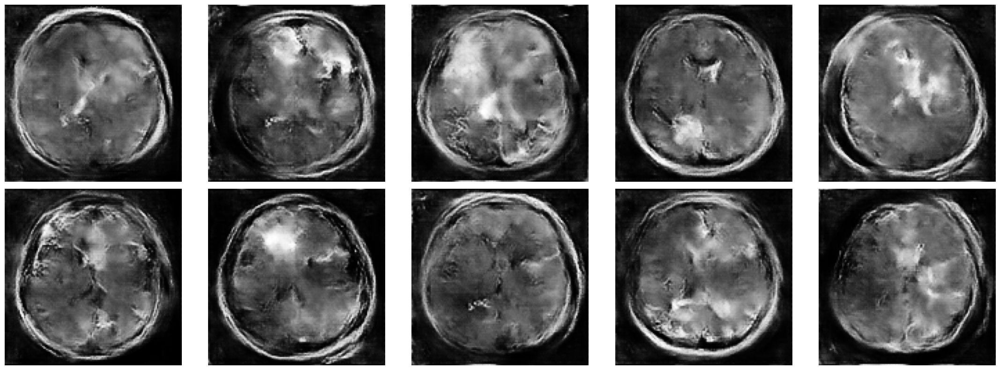

  0%|          | 0/2000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 63ms/step


  0%|          | 1/2000 [00:00<14:44,  2.26it/s]

1/1 [==============================] - 0s 131ms/step


  0%|          | 2/2000 [00:00<14:34,  2.28it/s]

1/1 [==============================] - 0s 17ms/step


  0%|          | 3/2000 [00:01<10:58,  3.03it/s]

1/1 [==============================] - 0s 18ms/step


  0%|          | 4/2000 [00:01<09:32,  3.48it/s]

1/1 [==============================] - 0s 33ms/step


  0%|          | 5/2000 [00:01<08:41,  3.82it/s]

1/1 [==============================] - 0s 27ms/step


  0%|          | 6/2000 [00:01<08:08,  4.08it/s]

1/1 [==============================] - 0s 42ms/step


  0%|          | 7/2000 [00:01<07:49,  4.24it/s]

1/1 [==============================] - 0s 31ms/step


  0%|          | 8/2000 [00:02<07:45,  4.28it/s]

1/1 [==============================] - 0s 25ms/step


  0%|          | 9/2000 [00:02<07:30,  4.42it/s]

1/1 [==============================] - 0s 41ms/step


  0%|          | 10/2000 [00:02<07:16,  4.56it/s]

1/1 [==============================] - 0s 36ms/step


  1%|          | 11/2000 [00:02<07:26,  4.46it/s]

1/1 [==============================] - 0s 37ms/step


  1%|          | 12/2000 [00:03<07:55,  4.18it/s]

1/1 [==============================] - 0s 27ms/step


  1%|          | 13/2000 [00:03<07:49,  4.23it/s]

1/1 [==============================] - 0s 36ms/step


  1%|          | 14/2000 [00:03<07:40,  4.31it/s]

1/1 [==============================] - 0s 24ms/step


  1%|          | 15/2000 [00:03<07:53,  4.19it/s]

1/1 [==============================] - 0s 27ms/step


  1%|          | 16/2000 [00:04<07:42,  4.29it/s]

1/1 [==============================] - 0s 27ms/step


  1%|          | 17/2000 [00:04<07:33,  4.37it/s]

1/1 [==============================] - 0s 29ms/step


  1%|          | 18/2000 [00:04<07:43,  4.28it/s]

1/1 [==============================] - 0s 17ms/step


  1%|          | 19/2000 [00:04<07:32,  4.38it/s]

1/1 [==============================] - 0s 17ms/step


  1%|          | 20/2000 [00:04<06:57,  4.74it/s]

1/1 [==============================] - 0s 17ms/step


  1%|          | 21/2000 [00:05<06:48,  4.84it/s]

1/1 [==============================] - 0s 17ms/step


  1%|          | 22/2000 [00:05<06:48,  4.84it/s]

1/1 [==============================] - 0s 17ms/step


  1%|          | 23/2000 [00:05<06:56,  4.74it/s]

1/1 [==============================] - 0s 17ms/step


  1%|          | 24/2000 [00:05<06:49,  4.83it/s]

1/1 [==============================] - 0s 18ms/step


  1%|▏         | 25/2000 [00:05<06:49,  4.83it/s]

1/1 [==============================] - 0s 16ms/step


  1%|▏         | 26/2000 [00:06<06:42,  4.91it/s]

1/1 [==============================] - 0s 17ms/step


  1%|▏         | 27/2000 [00:06<06:22,  5.16it/s]

1/1 [==============================] - 0s 18ms/step


  1%|▏         | 28/2000 [00:06<06:15,  5.25it/s]

1/1 [==============================] - 0s 17ms/step


  1%|▏         | 29/2000 [00:06<06:21,  5.17it/s]

1/1 [==============================] - 0s 17ms/step


  2%|▏         | 30/2000 [00:06<05:59,  5.48it/s]

1/1 [==============================] - 0s 22ms/step


  2%|▏         | 31/2000 [00:07<06:23,  5.14it/s]

1/1 [==============================] - 0s 19ms/step


  2%|▏         | 32/2000 [00:07<06:06,  5.37it/s]

1/1 [==============================] - 0s 17ms/step


  2%|▏         | 33/2000 [00:07<06:12,  5.29it/s]

1/1 [==============================] - 0s 17ms/step


  2%|▏         | 34/2000 [00:07<05:52,  5.57it/s]

1/1 [==============================] - 0s 24ms/step


  2%|▏         | 35/2000 [00:07<05:53,  5.56it/s]

1/1 [==============================] - 0s 17ms/step


  2%|▏         | 36/2000 [00:07<05:39,  5.78it/s]

1/1 [==============================] - 0s 18ms/step


  2%|▏         | 37/2000 [00:08<05:26,  6.01it/s]

1/1 [==============================] - 0s 17ms/step


  2%|▏         | 38/2000 [00:08<05:16,  6.20it/s]

1/1 [==============================] - 0s 18ms/step


  2%|▏         | 39/2000 [00:08<05:23,  6.07it/s]

1/1 [==============================] - 0s 17ms/step


  2%|▏         | 40/2000 [00:08<05:25,  6.03it/s]

1/1 [==============================] - 0s 18ms/step


  2%|▏         | 41/2000 [00:08<05:30,  5.93it/s]

1/1 [==============================] - 0s 17ms/step


  2%|▏         | 42/2000 [00:08<05:35,  5.84it/s]

1/1 [==============================] - 0s 18ms/step


  2%|▏         | 43/2000 [00:09<05:42,  5.71it/s]

1/1 [==============================] - 0s 25ms/step


  2%|▏         | 44/2000 [00:09<05:29,  5.93it/s]

1/1 [==============================] - 0s 16ms/step


  2%|▏         | 45/2000 [00:09<05:20,  6.09it/s]

1/1 [==============================] - 0s 16ms/step


  2%|▏         | 46/2000 [00:09<05:28,  5.95it/s]

1/1 [==============================] - 0s 17ms/step


  2%|▏         | 47/2000 [00:09<05:12,  6.25it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 48/2000 [00:09<05:13,  6.22it/s]

1/1 [==============================] - 0s 17ms/step


  2%|▏         | 49/2000 [00:10<05:14,  6.20it/s]

1/1 [==============================] - 0s 17ms/step


  2%|▎         | 50/2000 [00:10<05:11,  6.27it/s]

1/1 [==============================] - 0s 17ms/step


  3%|▎         | 51/2000 [00:10<05:00,  6.48it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 52/2000 [00:10<04:57,  6.54it/s]

1/1 [==============================] - 0s 19ms/step


  3%|▎         | 53/2000 [00:10<04:59,  6.51it/s]

1/1 [==============================] - 0s 16ms/step


  3%|▎         | 54/2000 [00:10<05:09,  6.29it/s]

1/1 [==============================] - 0s 17ms/step


  3%|▎         | 55/2000 [00:10<05:25,  5.98it/s]

1/1 [==============================] - 0s 18ms/step


  3%|▎         | 56/2000 [00:11<05:37,  5.75it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 57/2000 [00:11<05:32,  5.85it/s]

1/1 [==============================] - 0s 18ms/step


  3%|▎         | 58/2000 [00:11<05:23,  6.01it/s]

1/1 [==============================] - 0s 18ms/step


  3%|▎         | 59/2000 [00:11<05:26,  5.94it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 60/2000 [00:11<05:13,  6.18it/s]

1/1 [==============================] - 0s 17ms/step


  3%|▎         | 61/2000 [00:11<05:07,  6.32it/s]

1/1 [==============================] - 0s 17ms/step


  3%|▎         | 62/2000 [00:12<04:59,  6.47it/s]

1/1 [==============================] - 0s 19ms/step


  3%|▎         | 63/2000 [00:12<05:08,  6.27it/s]

1/1 [==============================] - 0s 17ms/step


  3%|▎         | 64/2000 [00:12<05:07,  6.29it/s]

1/1 [==============================] - 0s 19ms/step


  3%|▎         | 65/2000 [00:12<04:59,  6.45it/s]

1/1 [==============================] - 0s 17ms/step


  3%|▎         | 66/2000 [00:12<04:57,  6.49it/s]

1/1 [==============================] - 0s 17ms/step


  3%|▎         | 67/2000 [00:12<05:12,  6.19it/s]

1/1 [==============================] - 0s 17ms/step


  3%|▎         | 68/2000 [00:13<05:08,  6.27it/s]

1/1 [==============================] - 0s 18ms/step


  3%|▎         | 69/2000 [00:13<05:12,  6.18it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▎         | 70/2000 [00:13<05:04,  6.34it/s]

1/1 [==============================] - 0s 17ms/step


  4%|▎         | 71/2000 [00:13<04:54,  6.55it/s]

1/1 [==============================] - 0s 17ms/step


  4%|▎         | 72/2000 [00:13<05:04,  6.33it/s]

1/1 [==============================] - 0s 18ms/step


  4%|▎         | 73/2000 [00:13<05:20,  6.01it/s]

1/1 [==============================] - 0s 17ms/step


  4%|▎         | 74/2000 [00:14<05:13,  6.14it/s]

1/1 [==============================] - 0s 19ms/step


  4%|▍         | 75/2000 [00:14<05:11,  6.19it/s]

1/1 [==============================] - 0s 18ms/step


  4%|▍         | 76/2000 [00:14<05:18,  6.05it/s]

1/1 [==============================] - 0s 17ms/step


  4%|▍         | 77/2000 [00:14<05:02,  6.35it/s]

1/1 [==============================] - 0s 28ms/step


  4%|▍         | 78/2000 [00:14<05:42,  5.62it/s]

1/1 [==============================] - 0s 28ms/step


  4%|▍         | 79/2000 [00:14<05:53,  5.43it/s]

1/1 [==============================] - 0s 26ms/step


  4%|▍         | 80/2000 [00:15<05:59,  5.35it/s]

1/1 [==============================] - 0s 40ms/step


  4%|▍         | 81/2000 [00:15<06:47,  4.71it/s]

1/1 [==============================] - 0s 32ms/step


  4%|▍         | 82/2000 [00:15<06:44,  4.75it/s]

1/1 [==============================] - 0s 29ms/step


  4%|▍         | 83/2000 [00:15<06:23,  4.99it/s]

1/1 [==============================] - 0s 35ms/step


  4%|▍         | 84/2000 [00:16<07:03,  4.52it/s]

1/1 [==============================] - 0s 31ms/step


  4%|▍         | 85/2000 [00:16<07:07,  4.48it/s]

1/1 [==============================] - 0s 29ms/step


  4%|▍         | 86/2000 [00:16<07:04,  4.51it/s]

1/1 [==============================] - 0s 26ms/step


  4%|▍         | 87/2000 [00:16<07:16,  4.38it/s]

1/1 [==============================] - 0s 27ms/step


  4%|▍         | 88/2000 [00:16<06:56,  4.59it/s]

1/1 [==============================] - 0s 27ms/step


  4%|▍         | 89/2000 [00:17<06:53,  4.63it/s]

1/1 [==============================] - 0s 32ms/step


  4%|▍         | 90/2000 [00:17<06:46,  4.70it/s]

1/1 [==============================] - 0s 37ms/step


  5%|▍         | 91/2000 [00:17<06:49,  4.67it/s]

1/1 [==============================] - 0s 42ms/step


  5%|▍         | 92/2000 [00:17<06:54,  4.60it/s]

1/1 [==============================] - 0s 33ms/step


  5%|▍         | 93/2000 [00:18<07:00,  4.53it/s]

1/1 [==============================] - 0s 29ms/step


  5%|▍         | 94/2000 [00:18<07:09,  4.44it/s]

1/1 [==============================] - 0s 39ms/step


  5%|▍         | 95/2000 [00:18<07:29,  4.24it/s]

1/1 [==============================] - 0s 26ms/step


  5%|▍         | 96/2000 [00:18<07:31,  4.22it/s]

1/1 [==============================] - 0s 18ms/step


  5%|▍         | 97/2000 [00:18<07:15,  4.37it/s]

1/1 [==============================] - 0s 17ms/step


  5%|▍         | 98/2000 [00:19<07:01,  4.51it/s]

1/1 [==============================] - 0s 16ms/step


  5%|▍         | 99/2000 [00:19<06:56,  4.56it/s]

1/1 [==============================] - 0s 17ms/step


  5%|▌         | 100/2000 [00:19<06:30,  4.87it/s]

1/1 [==============================] - 0s 17ms/step


  5%|▌         | 101/2000 [00:19<06:05,  5.19it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▌         | 102/2000 [00:19<05:49,  5.43it/s]

1/1 [==============================] - 0s 19ms/step


  5%|▌         | 103/2000 [00:20<05:53,  5.36it/s]

1/1 [==============================] - 0s 17ms/step


  5%|▌         | 104/2000 [00:20<05:46,  5.47it/s]

1/1 [==============================] - 0s 19ms/step


  5%|▌         | 105/2000 [00:20<05:33,  5.67it/s]

1/1 [==============================] - 0s 18ms/step


  5%|▌         | 106/2000 [00:20<05:20,  5.91it/s]

1/1 [==============================] - 0s 17ms/step


  5%|▌         | 107/2000 [00:20<05:11,  6.09it/s]

1/1 [==============================] - 0s 18ms/step


  5%|▌         | 108/2000 [00:20<05:16,  5.98it/s]

1/1 [==============================] - 0s 19ms/step


  5%|▌         | 109/2000 [00:21<05:12,  6.06it/s]

1/1 [==============================] - 0s 17ms/step


  6%|▌         | 110/2000 [00:21<05:10,  6.09it/s]

1/1 [==============================] - 0s 17ms/step


  6%|▌         | 111/2000 [00:21<05:05,  6.19it/s]

1/1 [==============================] - 0s 24ms/step


  6%|▌         | 112/2000 [00:21<05:23,  5.83it/s]

1/1 [==============================] - 0s 17ms/step


  6%|▌         | 113/2000 [00:21<05:13,  6.01it/s]

1/1 [==============================] - 0s 17ms/step


  6%|▌         | 114/2000 [00:21<05:09,  6.10it/s]

1/1 [==============================] - 0s 17ms/step


  6%|▌         | 115/2000 [00:22<05:05,  6.17it/s]

1/1 [==============================] - 0s 17ms/step


  6%|▌         | 116/2000 [00:22<05:14,  5.98it/s]

1/1 [==============================] - 0s 17ms/step


  6%|▌         | 117/2000 [00:22<05:04,  6.18it/s]

1/1 [==============================] - 0s 17ms/step


  6%|▌         | 118/2000 [00:22<05:20,  5.87it/s]

1/1 [==============================] - 0s 17ms/step


  6%|▌         | 119/2000 [00:22<05:05,  6.15it/s]

1/1 [==============================] - 0s 19ms/step


  6%|▌         | 120/2000 [00:22<05:12,  6.01it/s]

1/1 [==============================] - 0s 17ms/step


  6%|▌         | 121/2000 [00:23<05:02,  6.21it/s]

1/1 [==============================] - 0s 17ms/step


  6%|▌         | 122/2000 [00:23<04:53,  6.40it/s]

1/1 [==============================] - 0s 18ms/step


  6%|▌         | 123/2000 [00:23<04:53,  6.39it/s]

1/1 [==============================] - 0s 17ms/step


  6%|▌         | 124/2000 [00:23<04:59,  6.27it/s]

1/1 [==============================] - 0s 17ms/step


  6%|▋         | 125/2000 [00:23<05:00,  6.23it/s]

1/1 [==============================] - 0s 17ms/step


  6%|▋         | 126/2000 [00:23<05:00,  6.24it/s]

1/1 [==============================] - 0s 17ms/step


  6%|▋         | 127/2000 [00:23<04:55,  6.34it/s]

1/1 [==============================] - 0s 18ms/step


  6%|▋         | 128/2000 [00:24<05:04,  6.14it/s]

1/1 [==============================] - 0s 17ms/step


  6%|▋         | 129/2000 [00:24<05:17,  5.90it/s]

1/1 [==============================] - 0s 17ms/step


  6%|▋         | 130/2000 [00:24<05:04,  6.14it/s]

1/1 [==============================] - 0s 25ms/step


  7%|▋         | 131/2000 [00:24<05:02,  6.17it/s]

1/1 [==============================] - 0s 20ms/step


  7%|▋         | 132/2000 [00:24<05:00,  6.22it/s]

1/1 [==============================] - 0s 18ms/step


  7%|▋         | 133/2000 [00:24<05:06,  6.09it/s]

1/1 [==============================] - 0s 17ms/step


  7%|▋         | 134/2000 [00:25<05:10,  6.00it/s]

1/1 [==============================] - 0s 16ms/step


  7%|▋         | 135/2000 [00:25<05:12,  5.96it/s]

1/1 [==============================] - 0s 17ms/step


  7%|▋         | 136/2000 [00:25<05:04,  6.11it/s]

1/1 [==============================] - 0s 17ms/step


  7%|▋         | 137/2000 [00:25<05:13,  5.95it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 138/2000 [00:25<05:16,  5.89it/s]

1/1 [==============================] - 0s 17ms/step


  7%|▋         | 139/2000 [00:25<05:00,  6.19it/s]

1/1 [==============================] - 0s 19ms/step


  7%|▋         | 140/2000 [00:26<05:09,  6.01it/s]

1/1 [==============================] - 0s 16ms/step


  7%|▋         | 141/2000 [00:26<05:02,  6.15it/s]

1/1 [==============================] - 0s 16ms/step


  7%|▋         | 142/2000 [00:26<04:56,  6.26it/s]

1/1 [==============================] - 0s 17ms/step


  7%|▋         | 143/2000 [00:26<04:54,  6.31it/s]

1/1 [==============================] - 0s 17ms/step


  7%|▋         | 144/2000 [00:26<04:50,  6.39it/s]

1/1 [==============================] - 0s 18ms/step


  7%|▋         | 145/2000 [00:26<05:03,  6.11it/s]

1/1 [==============================] - 0s 17ms/step


  7%|▋         | 146/2000 [00:27<04:59,  6.20it/s]

1/1 [==============================] - 0s 18ms/step


  7%|▋         | 147/2000 [00:27<04:52,  6.33it/s]

1/1 [==============================] - 0s 17ms/step


  7%|▋         | 148/2000 [00:27<04:43,  6.52it/s]

1/1 [==============================] - 0s 17ms/step


  7%|▋         | 149/2000 [00:27<04:50,  6.36it/s]

1/1 [==============================] - 0s 18ms/step


  8%|▊         | 150/2000 [00:27<04:48,  6.42it/s]

1/1 [==============================] - 0s 18ms/step


  8%|▊         | 151/2000 [00:27<04:55,  6.25it/s]

1/1 [==============================] - 0s 17ms/step


  8%|▊         | 152/2000 [00:28<04:52,  6.32it/s]

1/1 [==============================] - 0s 16ms/step


  8%|▊         | 153/2000 [00:28<04:44,  6.49it/s]

1/1 [==============================] - 0s 22ms/step


  8%|▊         | 154/2000 [00:28<05:05,  6.05it/s]

1/1 [==============================] - 0s 17ms/step


  8%|▊         | 155/2000 [00:28<04:47,  6.41it/s]

1/1 [==============================] - 0s 30ms/step


  8%|▊         | 156/2000 [00:28<05:00,  6.14it/s]

1/1 [==============================] - 0s 32ms/step


  8%|▊         | 157/2000 [00:28<05:30,  5.57it/s]

1/1 [==============================] - 0s 25ms/step


  8%|▊         | 158/2000 [00:29<05:50,  5.25it/s]

1/1 [==============================] - 0s 28ms/step


  8%|▊         | 159/2000 [00:29<05:54,  5.20it/s]

1/1 [==============================] - 0s 34ms/step


  8%|▊         | 160/2000 [00:29<05:57,  5.14it/s]

1/1 [==============================] - 0s 31ms/step


  8%|▊         | 161/2000 [00:29<05:42,  5.37it/s]

1/1 [==============================] - 0s 33ms/step


  8%|▊         | 162/2000 [00:29<05:55,  5.18it/s]

1/1 [==============================] - 0s 33ms/step


  8%|▊         | 163/2000 [00:30<06:11,  4.94it/s]

1/1 [==============================] - 0s 40ms/step


  8%|▊         | 164/2000 [00:30<06:07,  4.99it/s]

1/1 [==============================] - 0s 32ms/step


  8%|▊         | 165/2000 [00:30<06:33,  4.66it/s]

1/1 [==============================] - 0s 37ms/step


  8%|▊         | 166/2000 [00:30<06:26,  4.75it/s]

1/1 [==============================] - 0s 53ms/step


  8%|▊         | 167/2000 [00:30<06:48,  4.49it/s]

1/1 [==============================] - 0s 43ms/step


  8%|▊         | 168/2000 [00:31<06:47,  4.50it/s]

1/1 [==============================] - 0s 32ms/step


  8%|▊         | 169/2000 [00:31<06:35,  4.63it/s]

1/1 [==============================] - 0s 30ms/step


  8%|▊         | 170/2000 [00:31<06:18,  4.83it/s]

1/1 [==============================] - 0s 30ms/step


  9%|▊         | 171/2000 [00:31<06:10,  4.94it/s]

1/1 [==============================] - 0s 33ms/step


  9%|▊         | 172/2000 [00:31<06:12,  4.90it/s]

1/1 [==============================] - 0s 30ms/step


  9%|▊         | 173/2000 [00:32<06:08,  4.96it/s]

1/1 [==============================] - 0s 31ms/step


  9%|▊         | 174/2000 [00:32<06:13,  4.89it/s]

1/1 [==============================] - 0s 34ms/step


  9%|▉         | 175/2000 [00:32<06:34,  4.62it/s]

1/1 [==============================] - 0s 18ms/step


  9%|▉         | 176/2000 [00:32<06:02,  5.03it/s]

1/1 [==============================] - 0s 17ms/step


  9%|▉         | 177/2000 [00:32<05:55,  5.13it/s]

1/1 [==============================] - 0s 17ms/step


  9%|▉         | 178/2000 [00:33<05:49,  5.22it/s]

1/1 [==============================] - 0s 17ms/step


  9%|▉         | 179/2000 [00:33<05:49,  5.21it/s]

1/1 [==============================] - 0s 18ms/step


  9%|▉         | 180/2000 [00:33<05:50,  5.19it/s]

1/1 [==============================] - 0s 17ms/step


  9%|▉         | 181/2000 [00:33<05:55,  5.12it/s]

1/1 [==============================] - 0s 17ms/step


  9%|▉         | 182/2000 [00:33<05:59,  5.06it/s]

1/1 [==============================] - 0s 18ms/step


  9%|▉         | 183/2000 [00:34<06:05,  4.97it/s]

1/1 [==============================] - 0s 18ms/step


  9%|▉         | 184/2000 [00:34<06:07,  4.94it/s]

1/1 [==============================] - 0s 22ms/step


  9%|▉         | 185/2000 [00:34<06:10,  4.90it/s]

1/1 [==============================] - 0s 17ms/step


  9%|▉         | 186/2000 [00:34<05:52,  5.14it/s]

1/1 [==============================] - 0s 19ms/step


  9%|▉         | 187/2000 [00:34<05:55,  5.10it/s]

1/1 [==============================] - 0s 16ms/step


  9%|▉         | 188/2000 [00:35<05:58,  5.06it/s]

1/1 [==============================] - 0s 17ms/step


  9%|▉         | 189/2000 [00:35<05:35,  5.39it/s]

1/1 [==============================] - 0s 18ms/step


 10%|▉         | 190/2000 [00:35<05:43,  5.27it/s]

1/1 [==============================] - 0s 17ms/step


 10%|▉         | 191/2000 [00:35<05:27,  5.52it/s]

1/1 [==============================] - 0s 18ms/step


 10%|▉         | 192/2000 [00:35<05:15,  5.74it/s]

1/1 [==============================] - 0s 17ms/step


 10%|▉         | 193/2000 [00:35<05:02,  5.97it/s]

1/1 [==============================] - 0s 21ms/step


 10%|▉         | 194/2000 [00:36<05:00,  6.01it/s]

1/1 [==============================] - 0s 17ms/step


 10%|▉         | 195/2000 [00:36<04:55,  6.12it/s]

1/1 [==============================] - 0s 17ms/step


 10%|▉         | 196/2000 [00:36<04:46,  6.30it/s]

1/1 [==============================] - 0s 16ms/step


 10%|▉         | 197/2000 [00:36<04:55,  6.11it/s]

1/1 [==============================] - 0s 18ms/step


 10%|▉         | 198/2000 [00:36<04:47,  6.26it/s]

1/1 [==============================] - 0s 18ms/step


 10%|▉         | 199/2000 [00:36<04:47,  6.26it/s]

1/1 [==============================] - 0s 28ms/step


 10%|█         | 200/2000 [00:37<06:05,  4.93it/s]

1/1 [==============================] - 0s 27ms/step


 10%|█         | 201/2000 [00:37<06:15,  4.80it/s]

1/1 [==============================] - 0s 30ms/step


 10%|█         | 202/2000 [00:37<06:18,  4.75it/s]

1/1 [==============================] - 0s 71ms/step


 10%|█         | 203/2000 [00:37<06:52,  4.35it/s]

1/1 [==============================] - 0s 82ms/step


 10%|█         | 204/2000 [00:38<08:40,  3.45it/s]

1/1 [==============================] - 0s 18ms/step


 10%|█         | 205/2000 [00:38<07:55,  3.77it/s]

1/1 [==============================] - 0s 17ms/step


 10%|█         | 206/2000 [00:38<07:21,  4.07it/s]

1/1 [==============================] - 0s 17ms/step


 10%|█         | 207/2000 [00:38<06:38,  4.49it/s]

1/1 [==============================] - 0s 21ms/step


 10%|█         | 208/2000 [00:39<06:35,  4.53it/s]

1/1 [==============================] - 0s 19ms/step


 10%|█         | 209/2000 [00:39<06:19,  4.72it/s]

1/1 [==============================] - 0s 18ms/step


 10%|█         | 210/2000 [00:39<06:18,  4.73it/s]

1/1 [==============================] - 0s 19ms/step


 11%|█         | 211/2000 [00:39<06:18,  4.73it/s]

1/1 [==============================] - 0s 19ms/step


 11%|█         | 212/2000 [00:39<06:10,  4.82it/s]

1/1 [==============================] - 0s 18ms/step


 11%|█         | 213/2000 [00:40<05:57,  4.99it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█         | 214/2000 [00:40<06:02,  4.92it/s]

1/1 [==============================] - 0s 16ms/step


 11%|█         | 215/2000 [00:40<05:41,  5.23it/s]

1/1 [==============================] - 0s 18ms/step


 11%|█         | 216/2000 [00:40<05:46,  5.14it/s]

1/1 [==============================] - 0s 18ms/step


 11%|█         | 217/2000 [00:40<05:54,  5.03it/s]

1/1 [==============================] - 0s 19ms/step


 11%|█         | 218/2000 [00:41<05:31,  5.38it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█         | 219/2000 [00:41<05:38,  5.27it/s]

1/1 [==============================] - 0s 17ms/step


 11%|█         | 220/2000 [00:41<05:29,  5.40it/s]

1/1 [==============================] - 0s 17ms/step


 11%|█         | 221/2000 [00:41<05:13,  5.68it/s]

1/1 [==============================] - 0s 16ms/step


 11%|█         | 222/2000 [00:41<05:11,  5.71it/s]

1/1 [==============================] - 0s 17ms/step


 11%|█         | 223/2000 [00:41<04:59,  5.94it/s]

1/1 [==============================] - 0s 16ms/step


 11%|█         | 224/2000 [00:42<05:01,  5.89it/s]

1/1 [==============================] - 0s 22ms/step


 11%|█▏        | 225/2000 [00:42<05:20,  5.54it/s]

1/1 [==============================] - 0s 17ms/step


 11%|█▏        | 226/2000 [00:42<05:20,  5.54it/s]

1/1 [==============================] - 0s 33ms/step


 11%|█▏        | 227/2000 [00:42<05:48,  5.08it/s]

1/1 [==============================] - 0s 24ms/step


 11%|█▏        | 228/2000 [00:42<05:55,  4.99it/s]

1/1 [==============================] - 0s 45ms/step


 11%|█▏        | 229/2000 [00:43<06:05,  4.85it/s]

1/1 [==============================] - 0s 31ms/step


 12%|█▏        | 230/2000 [00:43<05:58,  4.94it/s]

1/1 [==============================] - 0s 30ms/step


 12%|█▏        | 231/2000 [00:43<06:02,  4.88it/s]

1/1 [==============================] - 0s 25ms/step


 12%|█▏        | 232/2000 [00:43<05:47,  5.09it/s]

1/1 [==============================] - 0s 26ms/step


 12%|█▏        | 233/2000 [00:44<06:03,  4.86it/s]

1/1 [==============================] - 0s 38ms/step


 12%|█▏        | 234/2000 [00:44<06:02,  4.87it/s]

1/1 [==============================] - 0s 38ms/step


 12%|█▏        | 235/2000 [00:44<06:38,  4.43it/s]

1/1 [==============================] - 0s 32ms/step


 12%|█▏        | 236/2000 [00:44<06:31,  4.51it/s]

1/1 [==============================] - 0s 55ms/step


 12%|█▏        | 237/2000 [00:44<06:50,  4.29it/s]

1/1 [==============================] - 0s 34ms/step


 12%|█▏        | 238/2000 [00:45<07:16,  4.04it/s]

1/1 [==============================] - 0s 31ms/step


 12%|█▏        | 239/2000 [00:45<07:06,  4.13it/s]

1/1 [==============================] - 0s 37ms/step


 12%|█▏        | 240/2000 [00:45<07:10,  4.09it/s]

1/1 [==============================] - 0s 39ms/step


 12%|█▏        | 241/2000 [00:45<06:54,  4.24it/s]

1/1 [==============================] - 0s 28ms/step


 12%|█▏        | 242/2000 [00:46<06:53,  4.25it/s]

1/1 [==============================] - 0s 17ms/step


 12%|█▏        | 243/2000 [00:46<06:35,  4.44it/s]

1/1 [==============================] - 0s 19ms/step


 12%|█▏        | 244/2000 [00:46<06:35,  4.44it/s]

1/1 [==============================] - 0s 19ms/step


 12%|█▏        | 245/2000 [00:47<09:20,  3.13it/s]

1/1 [==============================] - 0s 20ms/step


 12%|█▏        | 246/2000 [00:47<08:22,  3.49it/s]

1/1 [==============================] - 0s 26ms/step


 12%|█▏        | 247/2000 [00:47<07:25,  3.94it/s]

1/1 [==============================] - 0s 18ms/step


 12%|█▏        | 248/2000 [00:47<06:47,  4.30it/s]

1/1 [==============================] - 0s 18ms/step


 12%|█▏        | 249/2000 [00:47<06:12,  4.70it/s]

1/1 [==============================] - 0s 20ms/step


 12%|█▎        | 250/2000 [00:48<05:51,  4.98it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 251/2000 [00:48<05:34,  5.23it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█▎        | 252/2000 [00:48<05:22,  5.42it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 253/2000 [00:48<05:26,  5.36it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█▎        | 254/2000 [00:48<05:32,  5.25it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█▎        | 255/2000 [00:48<05:36,  5.18it/s]

1/1 [==============================] - 0s 19ms/step


 13%|█▎        | 256/2000 [00:49<05:23,  5.40it/s]

1/1 [==============================] - 0s 19ms/step


 13%|█▎        | 257/2000 [00:49<05:15,  5.53it/s]

1/1 [==============================] - 0s 23ms/step


 13%|█▎        | 258/2000 [00:49<05:17,  5.48it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 259/2000 [00:49<05:09,  5.63it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 260/2000 [00:49<05:05,  5.69it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 261/2000 [00:50<05:04,  5.71it/s]

1/1 [==============================] - 0s 19ms/step


 13%|█▎        | 262/2000 [00:50<05:13,  5.54it/s]

1/1 [==============================] - 0s 19ms/step


 13%|█▎        | 263/2000 [00:50<05:03,  5.71it/s]

1/1 [==============================] - 0s 18ms/step


 13%|█▎        | 264/2000 [00:50<05:21,  5.40it/s]

1/1 [==============================] - 0s 18ms/step


 13%|█▎        | 265/2000 [00:50<05:16,  5.48it/s]

1/1 [==============================] - 0s 19ms/step


 13%|█▎        | 266/2000 [00:50<05:00,  5.77it/s]

1/1 [==============================] - 0s 18ms/step


 13%|█▎        | 267/2000 [00:51<04:59,  5.79it/s]

1/1 [==============================] - 0s 19ms/step


 13%|█▎        | 268/2000 [00:51<04:52,  5.93it/s]

1/1 [==============================] - 0s 18ms/step


 13%|█▎        | 269/2000 [00:51<04:54,  5.87it/s]

1/1 [==============================] - 0s 17ms/step


 14%|█▎        | 270/2000 [00:51<05:02,  5.71it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█▎        | 271/2000 [00:51<04:55,  5.85it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█▎        | 272/2000 [00:51<04:51,  5.93it/s]

1/1 [==============================] - 0s 18ms/step


 14%|█▎        | 273/2000 [00:52<04:52,  5.91it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▎        | 274/2000 [00:52<04:49,  5.96it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▍        | 275/2000 [00:52<04:51,  5.92it/s]

1/1 [==============================] - 0s 19ms/step


 14%|█▍        | 276/2000 [00:52<04:59,  5.76it/s]

1/1 [==============================] - 0s 18ms/step


 14%|█▍        | 277/2000 [00:52<04:58,  5.78it/s]

1/1 [==============================] - 0s 18ms/step


 14%|█▍        | 278/2000 [00:52<04:50,  5.92it/s]

1/1 [==============================] - 0s 19ms/step


 14%|█▍        | 279/2000 [00:53<04:59,  5.75it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█▍        | 280/2000 [00:53<05:02,  5.69it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█▍        | 281/2000 [00:53<04:56,  5.79it/s]

1/1 [==============================] - 0s 18ms/step


 14%|█▍        | 282/2000 [00:53<04:56,  5.79it/s]

1/1 [==============================] - 0s 18ms/step


 14%|█▍        | 283/2000 [00:53<05:03,  5.66it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▍        | 284/2000 [00:53<04:59,  5.74it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▍        | 285/2000 [00:54<04:52,  5.86it/s]

1/1 [==============================] - 0s 19ms/step


 14%|█▍        | 286/2000 [00:54<04:57,  5.76it/s]

1/1 [==============================] - 0s 18ms/step


 14%|█▍        | 287/2000 [00:54<05:02,  5.67it/s]

1/1 [==============================] - 0s 19ms/step


 14%|█▍        | 288/2000 [00:54<05:07,  5.57it/s]

1/1 [==============================] - 0s 18ms/step


 14%|█▍        | 289/2000 [00:54<05:03,  5.64it/s]

1/1 [==============================] - 0s 19ms/step


 14%|█▍        | 290/2000 [00:55<05:07,  5.57it/s]

1/1 [==============================] - 0s 18ms/step


 15%|█▍        | 291/2000 [00:55<04:59,  5.70it/s]

1/1 [==============================] - 0s 18ms/step


 15%|█▍        | 292/2000 [00:55<05:02,  5.65it/s]

1/1 [==============================] - 0s 18ms/step


 15%|█▍        | 293/2000 [00:55<05:01,  5.66it/s]

1/1 [==============================] - 0s 19ms/step


 15%|█▍        | 294/2000 [00:55<04:52,  5.83it/s]

1/1 [==============================] - 0s 18ms/step


 15%|█▍        | 295/2000 [00:55<04:55,  5.78it/s]

1/1 [==============================] - 0s 18ms/step


 15%|█▍        | 296/2000 [00:56<04:48,  5.92it/s]

1/1 [==============================] - 0s 33ms/step


 15%|█▍        | 297/2000 [00:56<05:18,  5.35it/s]

1/1 [==============================] - 0s 28ms/step


 15%|█▍        | 298/2000 [00:56<05:23,  5.25it/s]

1/1 [==============================] - 0s 29ms/step


 15%|█▍        | 299/2000 [00:56<05:46,  4.90it/s]

1/1 [==============================] - 0s 44ms/step


 15%|█▌        | 300/2000 [00:56<05:50,  4.85it/s]

1/1 [==============================] - 0s 26ms/step


 15%|█▌        | 301/2000 [00:57<06:10,  4.59it/s]

1/1 [==============================] - 0s 43ms/step


 15%|█▌        | 302/2000 [00:57<06:32,  4.32it/s]

1/1 [==============================] - 0s 40ms/step


 15%|█▌        | 303/2000 [00:57<06:27,  4.38it/s]

1/1 [==============================] - 0s 36ms/step


 15%|█▌        | 304/2000 [00:57<06:37,  4.27it/s]

1/1 [==============================] - 0s 43ms/step


 15%|█▌        | 305/2000 [00:58<06:50,  4.13it/s]

1/1 [==============================] - 0s 44ms/step


 15%|█▌        | 306/2000 [00:58<06:57,  4.06it/s]

1/1 [==============================] - 0s 33ms/step


 15%|█▌        | 307/2000 [00:58<06:46,  4.17it/s]

1/1 [==============================] - 0s 33ms/step


 15%|█▌        | 308/2000 [00:58<06:49,  4.13it/s]

1/1 [==============================] - 0s 33ms/step


 15%|█▌        | 309/2000 [00:59<06:55,  4.07it/s]

1/1 [==============================] - 0s 33ms/step


 16%|█▌        | 310/2000 [00:59<06:43,  4.18it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▌        | 311/2000 [00:59<06:27,  4.36it/s]

1/1 [==============================] - 0s 18ms/step


 16%|█▌        | 312/2000 [00:59<06:18,  4.46it/s]

1/1 [==============================] - 0s 21ms/step


 16%|█▌        | 313/2000 [01:00<06:25,  4.38it/s]

1/1 [==============================] - 0s 24ms/step


 16%|█▌        | 314/2000 [01:00<06:09,  4.56it/s]

1/1 [==============================] - 0s 20ms/step


 16%|█▌        | 315/2000 [01:00<06:10,  4.54it/s]

1/1 [==============================] - 0s 19ms/step


 16%|█▌        | 316/2000 [01:00<05:55,  4.74it/s]

1/1 [==============================] - 0s 20ms/step


 16%|█▌        | 317/2000 [01:00<05:55,  4.74it/s]

1/1 [==============================] - 0s 20ms/step


 16%|█▌        | 318/2000 [01:01<05:43,  4.90it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▌        | 319/2000 [01:01<05:35,  5.02it/s]

1/1 [==============================] - 0s 19ms/step


 16%|█▌        | 320/2000 [01:01<05:24,  5.18it/s]

1/1 [==============================] - 0s 18ms/step


 16%|█▌        | 321/2000 [01:01<05:27,  5.13it/s]

1/1 [==============================] - 0s 19ms/step


 16%|█▌        | 322/2000 [01:01<05:22,  5.20it/s]

1/1 [==============================] - 0s 18ms/step


 16%|█▌        | 323/2000 [01:01<05:03,  5.53it/s]

1/1 [==============================] - 0s 19ms/step


 16%|█▌        | 324/2000 [01:02<05:08,  5.43it/s]

1/1 [==============================] - 0s 20ms/step


 16%|█▋        | 325/2000 [01:02<04:55,  5.66it/s]

1/1 [==============================] - 0s 20ms/step


 16%|█▋        | 326/2000 [01:02<05:03,  5.52it/s]

1/1 [==============================] - 0s 20ms/step


 16%|█▋        | 327/2000 [01:02<04:53,  5.70it/s]

1/1 [==============================] - 0s 17ms/step


 16%|█▋        | 328/2000 [01:02<04:53,  5.70it/s]

1/1 [==============================] - 0s 20ms/step


 16%|█▋        | 329/2000 [01:03<05:01,  5.54it/s]

1/1 [==============================] - 0s 18ms/step


 16%|█▋        | 330/2000 [01:03<04:49,  5.77it/s]

1/1 [==============================] - 0s 28ms/step


 17%|█▋        | 331/2000 [01:03<04:49,  5.76it/s]

1/1 [==============================] - 0s 20ms/step


 17%|█▋        | 332/2000 [01:03<04:43,  5.87it/s]

1/1 [==============================] - 0s 18ms/step


 17%|█▋        | 333/2000 [01:03<04:50,  5.73it/s]

1/1 [==============================] - 0s 18ms/step


 17%|█▋        | 334/2000 [01:03<04:38,  5.97it/s]

1/1 [==============================] - 0s 18ms/step


 17%|█▋        | 335/2000 [01:04<04:34,  6.07it/s]

1/1 [==============================] - 0s 19ms/step


 17%|█▋        | 336/2000 [01:04<04:44,  5.84it/s]

1/1 [==============================] - 0s 20ms/step


 17%|█▋        | 337/2000 [01:04<04:55,  5.62it/s]

1/1 [==============================] - 0s 18ms/step


 17%|█▋        | 338/2000 [01:04<04:42,  5.88it/s]

1/1 [==============================] - 0s 18ms/step


 17%|█▋        | 339/2000 [01:04<04:35,  6.04it/s]

1/1 [==============================] - 0s 26ms/step


 17%|█▋        | 340/2000 [01:04<04:35,  6.03it/s]

1/1 [==============================] - 0s 18ms/step


 17%|█▋        | 341/2000 [01:05<04:29,  6.15it/s]

1/1 [==============================] - 0s 18ms/step


 17%|█▋        | 342/2000 [01:05<04:33,  6.05it/s]

1/1 [==============================] - 0s 18ms/step


 17%|█▋        | 343/2000 [01:05<04:49,  5.72it/s]

1/1 [==============================] - 0s 19ms/step


 17%|█▋        | 344/2000 [01:05<05:25,  5.09it/s]

1/1 [==============================] - 0s 63ms/step


 17%|█▋        | 345/2000 [01:06<07:06,  3.88it/s]

1/1 [==============================] - 0s 18ms/step


 17%|█▋        | 346/2000 [01:06<06:16,  4.39it/s]

1/1 [==============================] - 0s 24ms/step


 17%|█▋        | 347/2000 [01:06<05:52,  4.69it/s]

1/1 [==============================] - 0s 17ms/step


 17%|█▋        | 348/2000 [01:06<05:37,  4.89it/s]

1/1 [==============================] - 0s 103ms/step


 17%|█▋        | 349/2000 [01:07<07:33,  3.64it/s]

1/1 [==============================] - 0s 18ms/step


 18%|█▊        | 350/2000 [01:07<06:39,  4.13it/s]

1/1 [==============================] - 0s 18ms/step


 18%|█▊        | 351/2000 [01:07<06:02,  4.55it/s]

1/1 [==============================] - 0s 25ms/step


 18%|█▊        | 352/2000 [01:07<05:37,  4.88it/s]

1/1 [==============================] - 0s 20ms/step


 18%|█▊        | 353/2000 [01:07<05:24,  5.07it/s]

1/1 [==============================] - 0s 18ms/step


 18%|█▊        | 354/2000 [01:07<05:19,  5.15it/s]

1/1 [==============================] - 0s 17ms/step


 18%|█▊        | 355/2000 [01:08<05:02,  5.44it/s]

1/1 [==============================] - 0s 18ms/step


 18%|█▊        | 356/2000 [01:08<04:45,  5.75it/s]

1/1 [==============================] - 0s 19ms/step


 18%|█▊        | 357/2000 [01:08<04:36,  5.95it/s]

1/1 [==============================] - 0s 23ms/step


 18%|█▊        | 358/2000 [01:08<04:37,  5.93it/s]

1/1 [==============================] - 0s 19ms/step


 18%|█▊        | 359/2000 [01:08<04:34,  5.98it/s]

1/1 [==============================] - 0s 20ms/step


 18%|█▊        | 360/2000 [01:08<04:41,  5.82it/s]

1/1 [==============================] - 0s 20ms/step


 18%|█▊        | 361/2000 [01:09<04:30,  6.06it/s]

1/1 [==============================] - 0s 20ms/step


 18%|█▊        | 362/2000 [01:09<04:39,  5.86it/s]

1/1 [==============================] - 0s 20ms/step


 18%|█▊        | 363/2000 [01:09<04:47,  5.68it/s]

1/1 [==============================] - 0s 28ms/step


 18%|█▊        | 364/2000 [01:09<05:07,  5.32it/s]

1/1 [==============================] - 0s 28ms/step


 18%|█▊        | 365/2000 [01:09<05:21,  5.09it/s]

1/1 [==============================] - 0s 27ms/step


 18%|█▊        | 366/2000 [01:10<05:16,  5.16it/s]

1/1 [==============================] - 0s 38ms/step


 18%|█▊        | 367/2000 [01:10<05:12,  5.22it/s]

1/1 [==============================] - 0s 44ms/step


 18%|█▊        | 368/2000 [01:10<05:06,  5.32it/s]

1/1 [==============================] - 0s 66ms/step


 18%|█▊        | 369/2000 [01:10<05:44,  4.73it/s]

1/1 [==============================] - 0s 35ms/step


 18%|█▊        | 370/2000 [01:10<05:43,  4.75it/s]

1/1 [==============================] - 0s 48ms/step


 19%|█▊        | 371/2000 [01:11<06:03,  4.48it/s]

1/1 [==============================] - 0s 27ms/step


 19%|█▊        | 372/2000 [01:11<05:43,  4.74it/s]

1/1 [==============================] - 0s 45ms/step


 19%|█▊        | 373/2000 [01:11<05:56,  4.57it/s]

1/1 [==============================] - 0s 46ms/step


 19%|█▊        | 374/2000 [01:11<05:57,  4.55it/s]

1/1 [==============================] - 0s 39ms/step


 19%|█▉        | 375/2000 [01:11<06:04,  4.46it/s]

1/1 [==============================] - 0s 44ms/step


 19%|█▉        | 376/2000 [01:12<06:00,  4.50it/s]

1/1 [==============================] - 0s 36ms/step


 19%|█▉        | 377/2000 [01:12<05:54,  4.58it/s]

1/1 [==============================] - 0s 32ms/step


 19%|█▉        | 378/2000 [01:12<06:09,  4.39it/s]

1/1 [==============================] - 0s 53ms/step


 19%|█▉        | 379/2000 [01:12<06:21,  4.25it/s]

1/1 [==============================] - 0s 43ms/step


 19%|█▉        | 380/2000 [01:13<06:16,  4.30it/s]

1/1 [==============================] - 0s 20ms/step


 19%|█▉        | 381/2000 [01:13<05:48,  4.64it/s]

1/1 [==============================] - 0s 18ms/step


 19%|█▉        | 382/2000 [01:13<05:46,  4.67it/s]

1/1 [==============================] - 0s 24ms/step


 19%|█▉        | 383/2000 [01:13<05:47,  4.65it/s]

1/1 [==============================] - 0s 18ms/step


 19%|█▉        | 384/2000 [01:13<05:43,  4.70it/s]

1/1 [==============================] - 0s 21ms/step


 19%|█▉        | 385/2000 [01:14<05:46,  4.66it/s]

1/1 [==============================] - 0s 18ms/step


 19%|█▉        | 386/2000 [01:14<05:38,  4.76it/s]

1/1 [==============================] - 0s 19ms/step


 19%|█▉        | 387/2000 [01:14<05:42,  4.71it/s]

1/1 [==============================] - 0s 18ms/step


 19%|█▉        | 388/2000 [01:14<05:44,  4.68it/s]

1/1 [==============================] - 0s 19ms/step


 19%|█▉        | 389/2000 [01:15<05:41,  4.71it/s]

1/1 [==============================] - 0s 21ms/step


 20%|█▉        | 390/2000 [01:15<05:39,  4.74it/s]

1/1 [==============================] - 0s 20ms/step


 20%|█▉        | 391/2000 [01:15<05:37,  4.77it/s]

1/1 [==============================] - 0s 18ms/step


 20%|█▉        | 392/2000 [01:15<05:31,  4.86it/s]

1/1 [==============================] - 0s 23ms/step


 20%|█▉        | 393/2000 [01:15<05:37,  4.75it/s]

1/1 [==============================] - 0s 20ms/step


 20%|█▉        | 394/2000 [01:16<05:39,  4.73it/s]

1/1 [==============================] - 0s 18ms/step


 20%|█▉        | 395/2000 [01:16<05:37,  4.76it/s]

1/1 [==============================] - 0s 19ms/step


 20%|█▉        | 396/2000 [01:16<05:41,  4.69it/s]

1/1 [==============================] - 0s 21ms/step


 20%|█▉        | 397/2000 [01:16<05:21,  4.99it/s]

1/1 [==============================] - 0s 19ms/step


 20%|█▉        | 398/2000 [01:16<05:31,  4.84it/s]

1/1 [==============================] - 0s 19ms/step


 20%|█▉        | 399/2000 [01:17<05:14,  5.10it/s]

1/1 [==============================] - 0s 19ms/step


 20%|██        | 400/2000 [01:17<05:00,  5.33it/s]

1/1 [==============================] - 0s 19ms/step


 20%|██        | 401/2000 [01:17<04:45,  5.60it/s]

1/1 [==============================] - 0s 18ms/step


 20%|██        | 402/2000 [01:17<04:47,  5.56it/s]

1/1 [==============================] - 0s 22ms/step


 20%|██        | 403/2000 [01:17<04:51,  5.48it/s]

1/1 [==============================] - 0s 20ms/step


 20%|██        | 404/2000 [01:17<04:49,  5.52it/s]

1/1 [==============================] - 0s 18ms/step


 20%|██        | 405/2000 [01:18<04:39,  5.70it/s]

1/1 [==============================] - 0s 21ms/step


 20%|██        | 406/2000 [01:18<04:30,  5.88it/s]

1/1 [==============================] - 0s 21ms/step


 20%|██        | 407/2000 [01:18<04:30,  5.89it/s]

1/1 [==============================] - 0s 20ms/step


 20%|██        | 408/2000 [01:18<04:44,  5.59it/s]

1/1 [==============================] - 0s 20ms/step


 20%|██        | 409/2000 [01:18<04:36,  5.76it/s]

1/1 [==============================] - 0s 25ms/step


 20%|██        | 410/2000 [01:18<04:46,  5.55it/s]

1/1 [==============================] - 0s 18ms/step


 21%|██        | 411/2000 [01:19<04:35,  5.76it/s]

1/1 [==============================] - 0s 22ms/step


 21%|██        | 412/2000 [01:19<04:26,  5.95it/s]

1/1 [==============================] - 0s 26ms/step


 21%|██        | 413/2000 [01:19<04:41,  5.64it/s]

1/1 [==============================] - 0s 17ms/step


 21%|██        | 414/2000 [01:19<04:48,  5.49it/s]

1/1 [==============================] - 0s 19ms/step


 21%|██        | 415/2000 [01:19<04:50,  5.46it/s]

1/1 [==============================] - 0s 17ms/step


 21%|██        | 416/2000 [01:19<04:33,  5.78it/s]

1/1 [==============================] - 0s 22ms/step


 21%|██        | 417/2000 [01:20<04:40,  5.64it/s]

1/1 [==============================] - 0s 18ms/step


 21%|██        | 418/2000 [01:20<04:34,  5.76it/s]

1/1 [==============================] - 0s 19ms/step


 21%|██        | 419/2000 [01:20<04:39,  5.65it/s]

1/1 [==============================] - 0s 19ms/step


 21%|██        | 420/2000 [01:20<04:40,  5.64it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██        | 421/2000 [01:20<04:30,  5.84it/s]

1/1 [==============================] - 0s 28ms/step


 21%|██        | 422/2000 [01:21<04:39,  5.64it/s]

1/1 [==============================] - 0s 18ms/step


 21%|██        | 423/2000 [01:21<04:29,  5.84it/s]

1/1 [==============================] - 0s 20ms/step


 21%|██        | 424/2000 [01:21<04:18,  6.10it/s]

1/1 [==============================] - 0s 24ms/step


 21%|██▏       | 425/2000 [01:21<04:18,  6.09it/s]

1/1 [==============================] - 0s 20ms/step


 21%|██▏       | 426/2000 [01:21<04:24,  5.96it/s]

1/1 [==============================] - 0s 17ms/step


 21%|██▏       | 427/2000 [01:21<04:24,  5.94it/s]

1/1 [==============================] - 0s 17ms/step


 21%|██▏       | 428/2000 [01:22<04:32,  5.76it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██▏       | 429/2000 [01:22<04:21,  6.01it/s]

1/1 [==============================] - 0s 18ms/step


 22%|██▏       | 430/2000 [01:22<04:28,  5.85it/s]

1/1 [==============================] - 0s 18ms/step


 22%|██▏       | 431/2000 [01:22<04:19,  6.05it/s]

1/1 [==============================] - 0s 17ms/step


 22%|██▏       | 432/2000 [01:22<04:14,  6.16it/s]

1/1 [==============================] - 0s 19ms/step


 22%|██▏       | 433/2000 [01:22<04:22,  5.97it/s]

1/1 [==============================] - 0s 18ms/step


 22%|██▏       | 434/2000 [01:23<04:11,  6.22it/s]

1/1 [==============================] - 0s 34ms/step


 22%|██▏       | 435/2000 [01:23<04:17,  6.08it/s]

1/1 [==============================] - 0s 40ms/step


 22%|██▏       | 436/2000 [01:23<04:31,  5.77it/s]

1/1 [==============================] - 0s 28ms/step


 22%|██▏       | 437/2000 [01:23<04:36,  5.65it/s]

1/1 [==============================] - 0s 53ms/step


 22%|██▏       | 438/2000 [01:23<04:58,  5.23it/s]

1/1 [==============================] - 0s 31ms/step


 22%|██▏       | 439/2000 [01:23<04:52,  5.35it/s]

1/1 [==============================] - 0s 62ms/step


 22%|██▏       | 440/2000 [01:24<05:18,  4.89it/s]

1/1 [==============================] - 0s 37ms/step


 22%|██▏       | 441/2000 [01:24<05:19,  4.88it/s]

1/1 [==============================] - 0s 48ms/step


 22%|██▏       | 442/2000 [01:24<05:19,  4.88it/s]

1/1 [==============================] - 0s 29ms/step


 22%|██▏       | 443/2000 [01:24<05:26,  4.76it/s]

1/1 [==============================] - 0s 47ms/step


 22%|██▏       | 444/2000 [01:25<05:55,  4.38it/s]

1/1 [==============================] - 0s 44ms/step


 22%|██▏       | 445/2000 [01:25<05:56,  4.36it/s]

1/1 [==============================] - 0s 42ms/step


 22%|██▏       | 446/2000 [01:25<05:53,  4.39it/s]

1/1 [==============================] - 0s 28ms/step


 22%|██▏       | 447/2000 [01:25<05:36,  4.62it/s]

1/1 [==============================] - 0s 32ms/step


 22%|██▏       | 448/2000 [01:25<05:38,  4.59it/s]

1/1 [==============================] - 0s 41ms/step


 22%|██▏       | 449/2000 [01:26<06:00,  4.30it/s]

1/1 [==============================] - 0s 52ms/step


 22%|██▎       | 450/2000 [01:26<06:15,  4.13it/s]

1/1 [==============================] - 0s 29ms/step


 23%|██▎       | 451/2000 [01:26<06:10,  4.18it/s]

1/1 [==============================] - 0s 41ms/step


 23%|██▎       | 452/2000 [01:27<06:17,  4.11it/s]

1/1 [==============================] - 0s 23ms/step


 23%|██▎       | 453/2000 [01:27<06:08,  4.20it/s]

1/1 [==============================] - 0s 17ms/step


 23%|██▎       | 454/2000 [01:27<05:55,  4.35it/s]

1/1 [==============================] - 0s 18ms/step


 23%|██▎       | 455/2000 [01:27<05:42,  4.51it/s]

1/1 [==============================] - 0s 20ms/step


 23%|██▎       | 456/2000 [01:27<05:34,  4.62it/s]

1/1 [==============================] - 0s 18ms/step


 23%|██▎       | 457/2000 [01:28<05:31,  4.66it/s]

1/1 [==============================] - 0s 24ms/step


 23%|██▎       | 458/2000 [01:28<05:19,  4.82it/s]

1/1 [==============================] - 0s 19ms/step


 23%|██▎       | 459/2000 [01:28<05:23,  4.76it/s]

1/1 [==============================] - 0s 19ms/step


 23%|██▎       | 460/2000 [01:28<05:19,  4.82it/s]

1/1 [==============================] - 0s 18ms/step


 23%|██▎       | 461/2000 [01:28<05:16,  4.87it/s]

1/1 [==============================] - 0s 19ms/step


 23%|██▎       | 462/2000 [01:29<04:58,  5.15it/s]

1/1 [==============================] - 0s 18ms/step


 23%|██▎       | 463/2000 [01:29<05:04,  5.05it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 464/2000 [01:29<05:07,  4.99it/s]

1/1 [==============================] - 0s 18ms/step


 23%|██▎       | 465/2000 [01:29<04:55,  5.20it/s]

1/1 [==============================] - 0s 18ms/step


 23%|██▎       | 466/2000 [01:29<04:58,  5.15it/s]

1/1 [==============================] - 0s 20ms/step


 23%|██▎       | 467/2000 [01:30<05:05,  5.02it/s]

1/1 [==============================] - 0s 18ms/step


 23%|██▎       | 468/2000 [01:30<05:12,  4.90it/s]

1/1 [==============================] - 0s 20ms/step


 23%|██▎       | 469/2000 [01:30<05:12,  4.90it/s]

1/1 [==============================] - 0s 18ms/step


 24%|██▎       | 470/2000 [01:30<05:14,  4.87it/s]

1/1 [==============================] - 0s 18ms/step


 24%|██▎       | 471/2000 [01:30<05:15,  4.85it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██▎       | 472/2000 [01:31<05:14,  4.85it/s]

1/1 [==============================] - 0s 18ms/step


 24%|██▎       | 473/2000 [01:31<05:21,  4.76it/s]

1/1 [==============================] - 0s 18ms/step


 24%|██▎       | 474/2000 [01:31<05:02,  5.05it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██▍       | 475/2000 [01:31<04:54,  5.17it/s]

1/1 [==============================] - 0s 17ms/step


 24%|██▍       | 476/2000 [01:31<05:00,  5.07it/s]

1/1 [==============================] - 0s 18ms/step


 24%|██▍       | 477/2000 [01:32<05:04,  5.01it/s]

1/1 [==============================] - 0s 18ms/step


 24%|██▍       | 478/2000 [01:32<04:50,  5.25it/s]

1/1 [==============================] - 0s 19ms/step


 24%|██▍       | 479/2000 [01:32<04:59,  5.09it/s]

1/1 [==============================] - 0s 17ms/step


 24%|██▍       | 480/2000 [01:32<04:58,  5.09it/s]

1/1 [==============================] - 0s 18ms/step


 24%|██▍       | 481/2000 [01:32<04:59,  5.07it/s]

1/1 [==============================] - 0s 17ms/step


 24%|██▍       | 482/2000 [01:33<05:02,  5.01it/s]

1/1 [==============================] - 0s 18ms/step


 24%|██▍       | 483/2000 [01:33<05:03,  5.00it/s]

1/1 [==============================] - 0s 19ms/step


 24%|██▍       | 484/2000 [01:33<05:02,  5.01it/s]

1/1 [==============================] - 0s 20ms/step


 24%|██▍       | 485/2000 [01:33<05:04,  4.98it/s]

1/1 [==============================] - 0s 19ms/step


 24%|██▍       | 486/2000 [01:33<05:08,  4.90it/s]

1/1 [==============================] - 0s 19ms/step


 24%|██▍       | 487/2000 [01:34<04:54,  5.14it/s]

1/1 [==============================] - 0s 18ms/step


 24%|██▍       | 488/2000 [01:34<04:42,  5.34it/s]

1/1 [==============================] - 0s 19ms/step


 24%|██▍       | 489/2000 [01:34<04:48,  5.23it/s]

1/1 [==============================] - 0s 18ms/step


 24%|██▍       | 490/2000 [01:34<04:42,  5.34it/s]

1/1 [==============================] - 0s 17ms/step


 25%|██▍       | 491/2000 [01:34<04:49,  5.21it/s]

1/1 [==============================] - 0s 18ms/step


 25%|██▍       | 492/2000 [01:34<04:52,  5.15it/s]

1/1 [==============================] - 0s 18ms/step


 25%|██▍       | 493/2000 [01:35<04:57,  5.07it/s]

1/1 [==============================] - 0s 18ms/step


 25%|██▍       | 494/2000 [01:35<04:47,  5.24it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▍       | 495/2000 [01:35<04:46,  5.26it/s]

1/1 [==============================] - 0s 18ms/step


 25%|██▍       | 496/2000 [01:35<04:33,  5.50it/s]

1/1 [==============================] - 0s 19ms/step


 25%|██▍       | 497/2000 [01:35<04:25,  5.66it/s]

1/1 [==============================] - 0s 18ms/step


 25%|██▍       | 498/2000 [01:36<04:19,  5.78it/s]

1/1 [==============================] - 0s 17ms/step


 25%|██▍       | 499/2000 [01:36<04:27,  5.61it/s]

1/1 [==============================] - 0s 20ms/step


 25%|██▌       | 500/2000 [01:36<04:31,  5.52it/s]

1/1 [==============================] - 0s 20ms/step


 25%|██▌       | 501/2000 [01:36<04:37,  5.40it/s]

1/1 [==============================] - 0s 18ms/step


 25%|██▌       | 502/2000 [01:36<04:36,  5.42it/s]

1/1 [==============================] - 0s 17ms/step


 25%|██▌       | 503/2000 [01:36<04:31,  5.51it/s]

1/1 [==============================] - 0s 28ms/step


 25%|██▌       | 504/2000 [01:37<04:50,  5.14it/s]

1/1 [==============================] - 0s 37ms/step


 25%|██▌       | 505/2000 [01:37<04:45,  5.23it/s]

1/1 [==============================] - 0s 34ms/step


 25%|██▌       | 506/2000 [01:37<05:06,  4.87it/s]

1/1 [==============================] - 0s 35ms/step


 25%|██▌       | 507/2000 [01:37<05:09,  4.83it/s]

1/1 [==============================] - 0s 49ms/step


 25%|██▌       | 508/2000 [01:38<05:26,  4.58it/s]

1/1 [==============================] - 0s 30ms/step


 25%|██▌       | 509/2000 [01:38<05:27,  4.56it/s]

1/1 [==============================] - 0s 25ms/step


 26%|██▌       | 510/2000 [01:38<05:27,  4.55it/s]

1/1 [==============================] - 0s 35ms/step


 26%|██▌       | 511/2000 [01:38<05:31,  4.49it/s]

1/1 [==============================] - 0s 29ms/step


 26%|██▌       | 512/2000 [01:38<05:27,  4.55it/s]

1/1 [==============================] - 0s 36ms/step


 26%|██▌       | 513/2000 [01:39<05:53,  4.21it/s]

1/1 [==============================] - 0s 30ms/step


 26%|██▌       | 514/2000 [01:39<06:00,  4.13it/s]

1/1 [==============================] - 0s 41ms/step


 26%|██▌       | 515/2000 [01:39<06:01,  4.11it/s]

1/1 [==============================] - 0s 27ms/step


 26%|██▌       | 516/2000 [01:39<05:50,  4.23it/s]

1/1 [==============================] - 0s 35ms/step


 26%|██▌       | 517/2000 [01:40<06:05,  4.05it/s]

1/1 [==============================] - 0s 46ms/step


 26%|██▌       | 518/2000 [01:40<06:12,  3.98it/s]

1/1 [==============================] - 0s 39ms/step


 26%|██▌       | 519/2000 [01:40<05:55,  4.16it/s]

1/1 [==============================] - 0s 20ms/step


 26%|██▌       | 520/2000 [01:40<05:44,  4.30it/s]

1/1 [==============================] - 0s 18ms/step


 26%|██▌       | 521/2000 [01:41<05:29,  4.48it/s]

1/1 [==============================] - 0s 18ms/step


 26%|██▌       | 522/2000 [01:41<05:11,  4.75it/s]

1/1 [==============================] - 0s 17ms/step


 26%|██▌       | 523/2000 [01:41<05:05,  4.83it/s]

1/1 [==============================] - 0s 17ms/step


 26%|██▌       | 524/2000 [01:41<05:00,  4.91it/s]

1/1 [==============================] - 0s 17ms/step


 26%|██▋       | 525/2000 [01:41<04:58,  4.93it/s]

1/1 [==============================] - 0s 17ms/step


 26%|██▋       | 526/2000 [01:42<05:00,  4.91it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▋       | 527/2000 [01:42<04:57,  4.94it/s]

1/1 [==============================] - 0s 19ms/step


 26%|██▋       | 528/2000 [01:42<04:55,  4.97it/s]

1/1 [==============================] - 0s 20ms/step


 26%|██▋       | 529/2000 [01:42<04:51,  5.05it/s]

1/1 [==============================] - 0s 18ms/step


 26%|██▋       | 530/2000 [01:42<04:54,  4.99it/s]

1/1 [==============================] - 0s 17ms/step


 27%|██▋       | 531/2000 [01:43<04:57,  4.94it/s]

1/1 [==============================] - 0s 17ms/step


 27%|██▋       | 532/2000 [01:43<04:40,  5.23it/s]

1/1 [==============================] - 0s 19ms/step


 27%|██▋       | 533/2000 [01:43<04:34,  5.34it/s]

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 534/2000 [01:43<04:25,  5.51it/s]

1/1 [==============================] - 0s 27ms/step


 27%|██▋       | 535/2000 [01:43<04:24,  5.54it/s]

1/1 [==============================] - 0s 17ms/step


 27%|██▋       | 536/2000 [01:43<04:29,  5.42it/s]

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 537/2000 [01:44<04:32,  5.37it/s]

1/1 [==============================] - 0s 17ms/step


 27%|██▋       | 538/2000 [01:44<04:27,  5.46it/s]

1/1 [==============================] - 0s 18ms/step


 27%|██▋       | 539/2000 [01:44<04:12,  5.79it/s]

1/1 [==============================] - 0s 17ms/step


 27%|██▋       | 540/2000 [01:44<04:21,  5.58it/s]

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 541/2000 [01:44<04:24,  5.52it/s]

1/1 [==============================] - 0s 18ms/step


 27%|██▋       | 542/2000 [01:45<04:16,  5.68it/s]

1/1 [==============================] - 0s 19ms/step


 27%|██▋       | 543/2000 [01:45<04:14,  5.72it/s]

1/1 [==============================] - 0s 19ms/step


 27%|██▋       | 544/2000 [01:45<04:08,  5.87it/s]

1/1 [==============================] - 0s 19ms/step


 27%|██▋       | 545/2000 [01:45<04:13,  5.75it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 546/2000 [01:45<04:12,  5.75it/s]

1/1 [==============================] - 0s 17ms/step


 27%|██▋       | 547/2000 [01:45<04:16,  5.67it/s]

1/1 [==============================] - 0s 18ms/step


 27%|██▋       | 548/2000 [01:46<04:03,  5.97it/s]

1/1 [==============================] - 0s 22ms/step


 27%|██▋       | 549/2000 [01:46<04:05,  5.91it/s]

1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 550/2000 [01:46<04:00,  6.03it/s]

1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 551/2000 [01:46<03:58,  6.07it/s]

1/1 [==============================] - 0s 19ms/step


 28%|██▊       | 552/2000 [01:46<04:01,  5.99it/s]

1/1 [==============================] - 0s 19ms/step


 28%|██▊       | 553/2000 [01:46<03:55,  6.14it/s]

1/1 [==============================] - 0s 24ms/step


 28%|██▊       | 554/2000 [01:47<04:06,  5.88it/s]

1/1 [==============================] - 0s 17ms/step


 28%|██▊       | 555/2000 [01:47<04:11,  5.74it/s]

1/1 [==============================] - 0s 19ms/step


 28%|██▊       | 556/2000 [01:47<03:58,  6.04it/s]

1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 557/2000 [01:47<04:03,  5.92it/s]

1/1 [==============================] - 0s 18ms/step


 28%|██▊       | 558/2000 [01:47<04:10,  5.76it/s]

1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 559/2000 [01:47<04:12,  5.71it/s]

1/1 [==============================] - 0s 17ms/step


 28%|██▊       | 560/2000 [01:48<04:09,  5.77it/s]

1/1 [==============================] - 0s 19ms/step


 28%|██▊       | 561/2000 [01:48<04:08,  5.79it/s]

1/1 [==============================] - 0s 17ms/step


 28%|██▊       | 562/2000 [01:48<03:59,  5.99it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 563/2000 [01:48<04:07,  5.82it/s]

1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 564/2000 [01:48<04:14,  5.63it/s]

1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 565/2000 [01:48<04:10,  5.73it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██▊       | 566/2000 [01:49<04:03,  5.89it/s]

1/1 [==============================] - 0s 18ms/step


 28%|██▊       | 567/2000 [01:49<04:15,  5.60it/s]

1/1 [==============================] - 0s 18ms/step


 28%|██▊       | 568/2000 [01:49<04:18,  5.54it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 569/2000 [01:49<04:19,  5.52it/s]

1/1 [==============================] - 0s 19ms/step


 28%|██▊       | 570/2000 [01:49<04:07,  5.78it/s]

1/1 [==============================] - 0s 28ms/step


 29%|██▊       | 571/2000 [01:50<04:04,  5.85it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▊       | 572/2000 [01:50<03:57,  6.02it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▊       | 573/2000 [01:50<04:04,  5.84it/s]

1/1 [==============================] - 0s 18ms/step


 29%|██▊       | 574/2000 [01:50<03:57,  6.01it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▉       | 575/2000 [01:50<03:55,  6.04it/s]

1/1 [==============================] - 0s 30ms/step


 29%|██▉       | 576/2000 [01:50<04:14,  5.60it/s]

1/1 [==============================] - 0s 34ms/step


 29%|██▉       | 577/2000 [01:51<04:23,  5.39it/s]

1/1 [==============================] - 0s 39ms/step


 29%|██▉       | 578/2000 [01:51<04:24,  5.38it/s]

1/1 [==============================] - 0s 51ms/step


 29%|██▉       | 579/2000 [01:51<04:42,  5.04it/s]

1/1 [==============================] - 0s 37ms/step


 29%|██▉       | 580/2000 [01:51<04:52,  4.86it/s]

1/1 [==============================] - 0s 36ms/step


 29%|██▉       | 581/2000 [01:51<04:49,  4.90it/s]

1/1 [==============================] - 0s 33ms/step


 29%|██▉       | 582/2000 [01:52<04:40,  5.05it/s]

1/1 [==============================] - 0s 34ms/step


 29%|██▉       | 583/2000 [01:52<04:39,  5.07it/s]

1/1 [==============================] - 0s 41ms/step


 29%|██▉       | 584/2000 [01:52<04:50,  4.88it/s]

1/1 [==============================] - 0s 40ms/step


 29%|██▉       | 585/2000 [01:52<05:19,  4.42it/s]

1/1 [==============================] - 0s 34ms/step


 29%|██▉       | 586/2000 [01:53<05:09,  4.57it/s]

1/1 [==============================] - 0s 43ms/step


 29%|██▉       | 587/2000 [01:53<05:01,  4.68it/s]

1/1 [==============================] - 0s 33ms/step


 29%|██▉       | 588/2000 [01:53<04:58,  4.73it/s]

1/1 [==============================] - 0s 29ms/step


 29%|██▉       | 589/2000 [01:53<05:01,  4.67it/s]

1/1 [==============================] - 0s 30ms/step


 30%|██▉       | 590/2000 [01:53<04:57,  4.74it/s]

1/1 [==============================] - 0s 49ms/step


 30%|██▉       | 591/2000 [01:54<05:14,  4.49it/s]

1/1 [==============================] - 0s 34ms/step


 30%|██▉       | 592/2000 [01:54<05:26,  4.31it/s]

1/1 [==============================] - 0s 27ms/step


 30%|██▉       | 593/2000 [01:54<05:32,  4.23it/s]

1/1 [==============================] - 0s 27ms/step


 30%|██▉       | 594/2000 [01:54<05:29,  4.27it/s]

1/1 [==============================] - 0s 27ms/step


 30%|██▉       | 595/2000 [01:54<05:06,  4.59it/s]

1/1 [==============================] - 0s 28ms/step


 30%|██▉       | 596/2000 [01:55<04:58,  4.70it/s]

1/1 [==============================] - 0s 19ms/step


 30%|██▉       | 597/2000 [01:55<04:47,  4.88it/s]

1/1 [==============================] - 0s 18ms/step


 30%|██▉       | 598/2000 [01:55<04:40,  5.00it/s]

1/1 [==============================] - 0s 20ms/step


 30%|██▉       | 599/2000 [01:55<04:33,  5.12it/s]

1/1 [==============================] - 0s 18ms/step


 30%|███       | 600/2000 [01:55<04:18,  5.41it/s]

1/1 [==============================] - 0s 18ms/step


 30%|███       | 601/2000 [01:56<04:13,  5.51it/s]

1/1 [==============================] - 0s 18ms/step


 30%|███       | 602/2000 [01:56<04:17,  5.44it/s]

1/1 [==============================] - 0s 18ms/step


 30%|███       | 603/2000 [01:56<04:17,  5.43it/s]

1/1 [==============================] - 0s 19ms/step


 30%|███       | 604/2000 [01:56<04:13,  5.51it/s]

1/1 [==============================] - 0s 18ms/step


 30%|███       | 605/2000 [01:56<04:04,  5.69it/s]

1/1 [==============================] - 0s 17ms/step


 30%|███       | 606/2000 [01:56<03:59,  5.81it/s]

1/1 [==============================] - 0s 20ms/step


 30%|███       | 607/2000 [01:57<03:53,  5.95it/s]

1/1 [==============================] - 0s 19ms/step


 30%|███       | 608/2000 [01:57<03:49,  6.07it/s]

1/1 [==============================] - 0s 26ms/step


 30%|███       | 609/2000 [01:57<04:01,  5.76it/s]

1/1 [==============================] - 0s 17ms/step


 30%|███       | 610/2000 [01:57<04:01,  5.75it/s]

1/1 [==============================] - 0s 18ms/step


 31%|███       | 611/2000 [01:57<04:07,  5.62it/s]

1/1 [==============================] - 0s 17ms/step


 31%|███       | 612/2000 [01:57<03:58,  5.83it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███       | 613/2000 [01:58<03:48,  6.06it/s]

1/1 [==============================] - 0s 19ms/step


 31%|███       | 614/2000 [01:58<03:57,  5.84it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███       | 615/2000 [01:58<04:00,  5.76it/s]

1/1 [==============================] - 0s 17ms/step


 31%|███       | 616/2000 [01:58<04:06,  5.62it/s]

1/1 [==============================] - 0s 19ms/step


 31%|███       | 617/2000 [01:58<03:59,  5.78it/s]

1/1 [==============================] - 0s 18ms/step


 31%|███       | 618/2000 [01:59<04:04,  5.66it/s]

1/1 [==============================] - 0s 19ms/step


 31%|███       | 619/2000 [01:59<04:06,  5.60it/s]

1/1 [==============================] - 0s 18ms/step


 31%|███       | 620/2000 [01:59<04:03,  5.67it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███       | 621/2000 [01:59<04:04,  5.64it/s]

1/1 [==============================] - 0s 19ms/step


 31%|███       | 622/2000 [01:59<03:55,  5.85it/s]

1/1 [==============================] - 0s 19ms/step


 31%|███       | 623/2000 [01:59<03:48,  6.01it/s]

1/1 [==============================] - 0s 17ms/step


 31%|███       | 624/2000 [02:00<03:48,  6.02it/s]

1/1 [==============================] - 0s 18ms/step


 31%|███▏      | 625/2000 [02:00<03:58,  5.77it/s]

1/1 [==============================] - 0s 18ms/step


 31%|███▏      | 626/2000 [02:00<04:00,  5.72it/s]

1/1 [==============================] - 0s 20ms/step


 31%|███▏      | 627/2000 [02:00<03:50,  5.95it/s]

1/1 [==============================] - 0s 20ms/step


 31%|███▏      | 628/2000 [02:00<03:43,  6.14it/s]

1/1 [==============================] - 0s 17ms/step


 31%|███▏      | 629/2000 [02:00<03:52,  5.90it/s]

1/1 [==============================] - 0s 18ms/step


 32%|███▏      | 630/2000 [02:01<03:55,  5.82it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 631/2000 [02:01<03:58,  5.73it/s]

1/1 [==============================] - 0s 18ms/step


 32%|███▏      | 632/2000 [02:01<04:05,  5.57it/s]

1/1 [==============================] - 0s 18ms/step


 32%|███▏      | 633/2000 [02:01<04:06,  5.54it/s]

1/1 [==============================] - 0s 20ms/step


 32%|███▏      | 634/2000 [02:01<04:08,  5.50it/s]

1/1 [==============================] - 0s 17ms/step


 32%|███▏      | 635/2000 [02:02<04:03,  5.60it/s]

1/1 [==============================] - 0s 19ms/step


 32%|███▏      | 636/2000 [02:02<04:02,  5.62it/s]

1/1 [==============================] - 0s 17ms/step


 32%|███▏      | 637/2000 [02:02<04:01,  5.65it/s]

1/1 [==============================] - 0s 24ms/step


 32%|███▏      | 638/2000 [02:02<04:09,  5.46it/s]

1/1 [==============================] - 0s 19ms/step


 32%|███▏      | 639/2000 [02:02<04:07,  5.50it/s]

1/1 [==============================] - 0s 17ms/step


 32%|███▏      | 640/2000 [02:02<04:04,  5.56it/s]

1/1 [==============================] - 0s 20ms/step


 32%|███▏      | 641/2000 [02:03<03:54,  5.80it/s]

1/1 [==============================] - 0s 20ms/step


 32%|███▏      | 642/2000 [02:03<04:00,  5.64it/s]

1/1 [==============================] - 0s 20ms/step


 32%|███▏      | 643/2000 [02:03<03:51,  5.87it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 644/2000 [02:03<03:51,  5.87it/s]

1/1 [==============================] - 0s 17ms/step


 32%|███▏      | 645/2000 [02:03<03:47,  5.95it/s]

1/1 [==============================] - 0s 17ms/step


 32%|███▏      | 646/2000 [02:03<03:44,  6.02it/s]

1/1 [==============================] - 0s 17ms/step


 32%|███▏      | 647/2000 [02:04<03:51,  5.84it/s]

1/1 [==============================] - 0s 19ms/step


 32%|███▏      | 648/2000 [02:04<03:43,  6.05it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 649/2000 [02:04<03:46,  5.97it/s]

1/1 [==============================] - 0s 42ms/step


 32%|███▎      | 650/2000 [02:04<04:11,  5.36it/s]

1/1 [==============================] - 0s 38ms/step


 33%|███▎      | 651/2000 [02:04<04:11,  5.36it/s]

1/1 [==============================] - 0s 26ms/step


 33%|███▎      | 652/2000 [02:05<04:13,  5.31it/s]

1/1 [==============================] - 0s 30ms/step


 33%|███▎      | 653/2000 [02:05<04:23,  5.12it/s]

1/1 [==============================] - 0s 39ms/step


 33%|███▎      | 654/2000 [02:05<04:26,  5.05it/s]

1/1 [==============================] - 0s 50ms/step


 33%|███▎      | 655/2000 [02:05<04:34,  4.90it/s]

1/1 [==============================] - 0s 41ms/step


 33%|███▎      | 656/2000 [02:05<04:46,  4.69it/s]

1/1 [==============================] - 0s 29ms/step


 33%|███▎      | 657/2000 [02:06<04:36,  4.85it/s]

1/1 [==============================] - 0s 28ms/step


 33%|███▎      | 658/2000 [02:06<04:25,  5.06it/s]

1/1 [==============================] - 0s 56ms/step


 33%|███▎      | 659/2000 [02:06<04:41,  4.76it/s]

1/1 [==============================] - 0s 44ms/step


 33%|███▎      | 660/2000 [02:06<04:55,  4.53it/s]

1/1 [==============================] - 0s 33ms/step


 33%|███▎      | 661/2000 [02:06<04:53,  4.56it/s]

1/1 [==============================] - 0s 35ms/step


 33%|███▎      | 662/2000 [02:07<04:52,  4.58it/s]

1/1 [==============================] - 0s 35ms/step


 33%|███▎      | 663/2000 [02:07<04:52,  4.57it/s]

1/1 [==============================] - 0s 30ms/step


 33%|███▎      | 664/2000 [02:07<04:45,  4.69it/s]

1/1 [==============================] - 0s 31ms/step


 33%|███▎      | 665/2000 [02:07<04:56,  4.50it/s]

1/1 [==============================] - 0s 25ms/step


 33%|███▎      | 666/2000 [02:08<05:04,  4.38it/s]

1/1 [==============================] - 0s 37ms/step


 33%|███▎      | 667/2000 [02:08<04:59,  4.46it/s]

1/1 [==============================] - 0s 31ms/step


 33%|███▎      | 668/2000 [02:08<05:05,  4.37it/s]

1/1 [==============================] - 0s 61ms/step


 33%|███▎      | 669/2000 [02:08<05:28,  4.05it/s]

1/1 [==============================] - 0s 27ms/step


 34%|███▎      | 670/2000 [02:09<05:08,  4.31it/s]

1/1 [==============================] - 0s 28ms/step


 34%|███▎      | 671/2000 [02:09<05:06,  4.33it/s]

1/1 [==============================] - 0s 19ms/step


 34%|███▎      | 672/2000 [02:09<05:00,  4.42it/s]

1/1 [==============================] - 0s 17ms/step


 34%|███▎      | 673/2000 [02:09<04:49,  4.58it/s]

1/1 [==============================] - 0s 26ms/step


 34%|███▎      | 674/2000 [02:09<04:51,  4.55it/s]

1/1 [==============================] - 0s 18ms/step


 34%|███▍      | 675/2000 [02:10<04:31,  4.87it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▍      | 676/2000 [02:10<04:21,  5.05it/s]

1/1 [==============================] - 0s 18ms/step


 34%|███▍      | 677/2000 [02:10<04:04,  5.42it/s]

1/1 [==============================] - 0s 20ms/step


 34%|███▍      | 678/2000 [02:10<03:53,  5.67it/s]

1/1 [==============================] - 0s 18ms/step


 34%|███▍      | 679/2000 [02:10<03:46,  5.82it/s]

1/1 [==============================] - 0s 26ms/step


 34%|███▍      | 680/2000 [02:10<03:47,  5.79it/s]

1/1 [==============================] - 0s 17ms/step


 34%|███▍      | 681/2000 [02:11<03:50,  5.73it/s]

1/1 [==============================] - 0s 22ms/step


 34%|███▍      | 682/2000 [02:11<03:45,  5.84it/s]

1/1 [==============================] - 0s 17ms/step


 34%|███▍      | 683/2000 [02:11<03:50,  5.70it/s]

1/1 [==============================] - 0s 17ms/step


 34%|███▍      | 684/2000 [02:11<03:54,  5.61it/s]

1/1 [==============================] - 0s 18ms/step


 34%|███▍      | 685/2000 [02:11<03:56,  5.55it/s]

1/1 [==============================] - 0s 18ms/step


 34%|███▍      | 686/2000 [02:11<03:59,  5.48it/s]

1/1 [==============================] - 0s 18ms/step


 34%|███▍      | 687/2000 [02:12<03:56,  5.55it/s]

1/1 [==============================] - 0s 18ms/step


 34%|███▍      | 688/2000 [02:12<03:59,  5.47it/s]

1/1 [==============================] - 0s 18ms/step


 34%|███▍      | 689/2000 [02:12<03:59,  5.48it/s]

1/1 [==============================] - 0s 17ms/step


 34%|███▍      | 690/2000 [02:12<03:44,  5.85it/s]

1/1 [==============================] - 0s 24ms/step


 35%|███▍      | 691/2000 [02:12<03:54,  5.59it/s]

1/1 [==============================] - 0s 19ms/step


 35%|███▍      | 692/2000 [02:13<03:48,  5.72it/s]

1/1 [==============================] - 0s 18ms/step


 35%|███▍      | 693/2000 [02:13<03:54,  5.58it/s]

1/1 [==============================] - 0s 19ms/step


 35%|███▍      | 694/2000 [02:13<03:44,  5.83it/s]

1/1 [==============================] - 0s 19ms/step


 35%|███▍      | 695/2000 [02:13<03:46,  5.77it/s]

1/1 [==============================] - 0s 17ms/step


 35%|███▍      | 696/2000 [02:13<03:40,  5.93it/s]

1/1 [==============================] - 0s 17ms/step


 35%|███▍      | 697/2000 [02:13<03:46,  5.76it/s]

1/1 [==============================] - 0s 18ms/step


 35%|███▍      | 698/2000 [02:14<03:46,  5.76it/s]

1/1 [==============================] - 0s 19ms/step


 35%|███▍      | 699/2000 [02:14<03:52,  5.60it/s]

1/1 [==============================] - 0s 22ms/step


 35%|███▌      | 700/2000 [02:14<03:40,  5.91it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▌      | 701/2000 [02:14<03:41,  5.85it/s]

1/1 [==============================] - 0s 18ms/step


 35%|███▌      | 702/2000 [02:14<03:38,  5.94it/s]

1/1 [==============================] - 0s 22ms/step


 35%|███▌      | 703/2000 [02:14<03:32,  6.09it/s]

1/1 [==============================] - 0s 28ms/step


 35%|███▌      | 704/2000 [02:15<03:45,  5.74it/s]

1/1 [==============================] - 0s 18ms/step


 35%|███▌      | 705/2000 [02:15<03:45,  5.73it/s]

1/1 [==============================] - 0s 18ms/step


 35%|███▌      | 706/2000 [02:15<03:44,  5.76it/s]

1/1 [==============================] - 0s 18ms/step


 35%|███▌      | 707/2000 [02:15<03:45,  5.73it/s]

1/1 [==============================] - 0s 18ms/step


 35%|███▌      | 708/2000 [02:15<03:49,  5.62it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▌      | 709/2000 [02:15<03:51,  5.59it/s]

1/1 [==============================] - 0s 18ms/step


 36%|███▌      | 710/2000 [02:16<03:41,  5.81it/s]

1/1 [==============================] - 0s 23ms/step


 36%|███▌      | 711/2000 [02:16<03:39,  5.88it/s]

1/1 [==============================] - 0s 20ms/step


 36%|███▌      | 712/2000 [02:16<03:29,  6.14it/s]

1/1 [==============================] - 0s 20ms/step


 36%|███▌      | 713/2000 [02:16<03:23,  6.34it/s]

1/1 [==============================] - 0s 23ms/step


 36%|███▌      | 714/2000 [02:16<03:20,  6.43it/s]

1/1 [==============================] - 0s 23ms/step


 36%|███▌      | 715/2000 [02:16<03:17,  6.50it/s]

1/1 [==============================] - 0s 31ms/step


 36%|███▌      | 716/2000 [02:17<03:34,  5.98it/s]

1/1 [==============================] - 0s 19ms/step


 36%|███▌      | 717/2000 [02:17<03:30,  6.09it/s]

1/1 [==============================] - 0s 19ms/step


 36%|███▌      | 718/2000 [02:17<03:29,  6.13it/s]

1/1 [==============================] - 0s 17ms/step


 36%|███▌      | 719/2000 [02:17<03:34,  5.97it/s]

1/1 [==============================] - 0s 18ms/step


 36%|███▌      | 720/2000 [02:17<03:41,  5.78it/s]

1/1 [==============================] - 0s 18ms/step


 36%|███▌      | 721/2000 [02:17<03:40,  5.81it/s]

1/1 [==============================] - 0s 24ms/step


 36%|███▌      | 722/2000 [02:18<03:46,  5.65it/s]

1/1 [==============================] - 0s 20ms/step


 36%|███▌      | 723/2000 [02:18<03:50,  5.55it/s]

1/1 [==============================] - 0s 17ms/step


 36%|███▌      | 724/2000 [02:18<03:41,  5.75it/s]

1/1 [==============================] - 0s 17ms/step


 36%|███▋      | 725/2000 [02:18<03:43,  5.70it/s]

1/1 [==============================] - 0s 18ms/step


 36%|███▋      | 726/2000 [02:18<03:45,  5.66it/s]

1/1 [==============================] - 0s 29ms/step


 36%|███▋      | 727/2000 [02:19<03:56,  5.37it/s]

1/1 [==============================] - 0s 42ms/step


 36%|███▋      | 728/2000 [02:19<04:15,  4.98it/s]

1/1 [==============================] - 0s 39ms/step


 36%|███▋      | 729/2000 [02:19<04:16,  4.95it/s]

1/1 [==============================] - 0s 40ms/step


 36%|███▋      | 730/2000 [02:19<04:33,  4.64it/s]

1/1 [==============================] - 0s 32ms/step


 37%|███▋      | 731/2000 [02:19<04:25,  4.78it/s]

1/1 [==============================] - 0s 26ms/step


 37%|███▋      | 732/2000 [02:20<04:33,  4.64it/s]

1/1 [==============================] - 0s 31ms/step


 37%|███▋      | 733/2000 [02:20<04:30,  4.68it/s]

1/1 [==============================] - 0s 37ms/step


 37%|███▋      | 734/2000 [02:20<04:58,  4.24it/s]

1/1 [==============================] - 0s 34ms/step


 37%|███▋      | 735/2000 [02:20<04:46,  4.41it/s]

1/1 [==============================] - 0s 33ms/step


 37%|███▋      | 736/2000 [02:21<04:49,  4.36it/s]

1/1 [==============================] - 0s 46ms/step


 37%|███▋      | 737/2000 [02:21<04:53,  4.31it/s]

1/1 [==============================] - 0s 40ms/step


 37%|███▋      | 738/2000 [02:21<05:06,  4.12it/s]

1/1 [==============================] - 0s 27ms/step


 37%|███▋      | 739/2000 [02:21<05:11,  4.04it/s]

1/1 [==============================] - 0s 37ms/step


 37%|███▋      | 740/2000 [02:22<05:05,  4.12it/s]

1/1 [==============================] - 0s 34ms/step


 37%|███▋      | 741/2000 [02:22<04:57,  4.23it/s]

1/1 [==============================] - 0s 32ms/step


 37%|███▋      | 742/2000 [02:22<04:43,  4.44it/s]

1/1 [==============================] - 0s 31ms/step


 37%|███▋      | 743/2000 [02:22<04:48,  4.35it/s]

1/1 [==============================] - 0s 31ms/step


 37%|███▋      | 744/2000 [02:22<04:54,  4.26it/s]

1/1 [==============================] - 0s 20ms/step


 37%|███▋      | 745/2000 [02:23<04:45,  4.40it/s]

1/1 [==============================] - 0s 19ms/step


 37%|███▋      | 746/2000 [02:23<04:47,  4.36it/s]

1/1 [==============================] - 0s 18ms/step


 37%|███▋      | 747/2000 [02:23<04:29,  4.65it/s]

1/1 [==============================] - 0s 19ms/step


 37%|███▋      | 748/2000 [02:23<04:27,  4.68it/s]

1/1 [==============================] - 0s 18ms/step


 37%|███▋      | 749/2000 [02:24<04:22,  4.77it/s]

1/1 [==============================] - 0s 23ms/step


 38%|███▊      | 750/2000 [02:24<04:11,  4.96it/s]

1/1 [==============================] - 0s 26ms/step


 38%|███▊      | 751/2000 [02:24<04:04,  5.11it/s]

1/1 [==============================] - 0s 17ms/step


 38%|███▊      | 752/2000 [02:24<04:04,  5.11it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 753/2000 [02:24<03:58,  5.22it/s]

1/1 [==============================] - 0s 17ms/step


 38%|███▊      | 754/2000 [02:24<04:02,  5.13it/s]

1/1 [==============================] - 0s 20ms/step


 38%|███▊      | 755/2000 [02:25<03:54,  5.32it/s]

1/1 [==============================] - 0s 23ms/step


 38%|███▊      | 756/2000 [02:25<03:54,  5.31it/s]

1/1 [==============================] - 0s 18ms/step


 38%|███▊      | 757/2000 [02:25<03:40,  5.65it/s]

1/1 [==============================] - 0s 24ms/step


 38%|███▊      | 758/2000 [02:25<03:41,  5.60it/s]

1/1 [==============================] - 0s 17ms/step


 38%|███▊      | 759/2000 [02:25<03:34,  5.80it/s]

1/1 [==============================] - 0s 18ms/step


 38%|███▊      | 760/2000 [02:26<03:36,  5.74it/s]

1/1 [==============================] - 0s 20ms/step


 38%|███▊      | 761/2000 [02:26<03:36,  5.73it/s]

1/1 [==============================] - 0s 20ms/step


 38%|███▊      | 762/2000 [02:26<03:36,  5.72it/s]

1/1 [==============================] - 0s 19ms/step


 38%|███▊      | 763/2000 [02:26<03:41,  5.58it/s]

1/1 [==============================] - 0s 17ms/step


 38%|███▊      | 764/2000 [02:26<03:37,  5.69it/s]

1/1 [==============================] - 0s 20ms/step


 38%|███▊      | 765/2000 [02:26<03:31,  5.84it/s]

1/1 [==============================] - 0s 19ms/step


 38%|███▊      | 766/2000 [02:27<03:32,  5.80it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 767/2000 [02:27<03:31,  5.84it/s]

1/1 [==============================] - 0s 18ms/step


 38%|███▊      | 768/2000 [02:27<03:24,  6.02it/s]

1/1 [==============================] - 0s 23ms/step


 38%|███▊      | 769/2000 [02:27<03:29,  5.89it/s]

1/1 [==============================] - 0s 19ms/step


 38%|███▊      | 770/2000 [02:27<03:32,  5.79it/s]

1/1 [==============================] - 0s 18ms/step


 39%|███▊      | 771/2000 [02:27<03:22,  6.07it/s]

1/1 [==============================] - 0s 24ms/step


 39%|███▊      | 772/2000 [02:28<03:17,  6.21it/s]

1/1 [==============================] - 0s 18ms/step


 39%|███▊      | 773/2000 [02:28<03:29,  5.87it/s]

1/1 [==============================] - 0s 17ms/step


 39%|███▊      | 774/2000 [02:28<03:24,  6.00it/s]

1/1 [==============================] - 0s 21ms/step


 39%|███▉      | 775/2000 [02:28<03:31,  5.79it/s]

1/1 [==============================] - 0s 18ms/step


 39%|███▉      | 776/2000 [02:28<03:33,  5.73it/s]

1/1 [==============================] - 0s 21ms/step


 39%|███▉      | 777/2000 [02:28<03:40,  5.56it/s]

1/1 [==============================] - 0s 18ms/step


 39%|███▉      | 778/2000 [02:29<03:37,  5.62it/s]

1/1 [==============================] - 0s 19ms/step


 39%|███▉      | 779/2000 [02:29<03:31,  5.76it/s]

1/1 [==============================] - 0s 17ms/step


 39%|███▉      | 780/2000 [02:29<03:22,  6.03it/s]

1/1 [==============================] - 0s 19ms/step


 39%|███▉      | 781/2000 [02:29<03:31,  5.77it/s]

1/1 [==============================] - 0s 17ms/step


 39%|███▉      | 782/2000 [02:29<03:29,  5.81it/s]

1/1 [==============================] - 0s 17ms/step


 39%|███▉      | 783/2000 [02:29<03:20,  6.08it/s]

1/1 [==============================] - 0s 25ms/step


 39%|███▉      | 784/2000 [02:30<03:19,  6.10it/s]

1/1 [==============================] - 0s 32ms/step


 39%|███▉      | 785/2000 [02:30<03:20,  6.07it/s]

1/1 [==============================] - 0s 23ms/step


 39%|███▉      | 786/2000 [02:30<03:19,  6.10it/s]

1/1 [==============================] - 0s 18ms/step


 39%|███▉      | 787/2000 [02:30<03:15,  6.22it/s]

1/1 [==============================] - 0s 20ms/step


 39%|███▉      | 788/2000 [02:30<03:12,  6.29it/s]

1/1 [==============================] - 0s 20ms/step


 39%|███▉      | 789/2000 [02:30<03:12,  6.28it/s]

1/1 [==============================] - 0s 17ms/step


 40%|███▉      | 790/2000 [02:31<03:13,  6.26it/s]

1/1 [==============================] - 0s 17ms/step


 40%|███▉      | 791/2000 [02:31<03:15,  6.18it/s]

1/1 [==============================] - 0s 17ms/step


 40%|███▉      | 792/2000 [02:31<03:20,  6.04it/s]

1/1 [==============================] - 0s 20ms/step


 40%|███▉      | 793/2000 [02:31<03:26,  5.84it/s]

1/1 [==============================] - 0s 20ms/step


 40%|███▉      | 794/2000 [02:31<03:22,  5.96it/s]

1/1 [==============================] - 0s 17ms/step


 40%|███▉      | 795/2000 [02:31<03:27,  5.81it/s]

1/1 [==============================] - 0s 18ms/step


 40%|███▉      | 796/2000 [02:32<03:27,  5.79it/s]

1/1 [==============================] - 0s 18ms/step


 40%|███▉      | 797/2000 [02:32<03:18,  6.07it/s]

1/1 [==============================] - 0s 28ms/step


 40%|███▉      | 798/2000 [02:32<03:25,  5.85it/s]

1/1 [==============================] - 0s 20ms/step


 40%|███▉      | 799/2000 [02:32<03:18,  6.05it/s]

1/1 [==============================] - 0s 18ms/step


 40%|████      | 800/2000 [02:32<03:21,  5.95it/s]

1/1 [==============================] - 0s 22ms/step


 40%|████      | 801/2000 [02:32<03:22,  5.93it/s]

1/1 [==============================] - 0s 34ms/step


 40%|████      | 802/2000 [02:33<03:36,  5.54it/s]

1/1 [==============================] - 0s 40ms/step


 40%|████      | 803/2000 [02:33<03:38,  5.47it/s]

1/1 [==============================] - 0s 58ms/step


 40%|████      | 804/2000 [02:33<04:08,  4.82it/s]

1/1 [==============================] - 0s 46ms/step


 40%|████      | 805/2000 [02:33<04:24,  4.52it/s]

1/1 [==============================] - 0s 50ms/step


 40%|████      | 806/2000 [02:34<04:22,  4.55it/s]

1/1 [==============================] - 0s 28ms/step


 40%|████      | 807/2000 [02:34<04:21,  4.56it/s]

1/1 [==============================] - 0s 29ms/step


 40%|████      | 808/2000 [02:34<04:10,  4.76it/s]

1/1 [==============================] - 0s 28ms/step


 40%|████      | 809/2000 [02:34<04:06,  4.83it/s]

1/1 [==============================] - 0s 41ms/step


 40%|████      | 810/2000 [02:34<04:09,  4.78it/s]

1/1 [==============================] - 0s 37ms/step


 41%|████      | 811/2000 [02:35<04:13,  4.68it/s]

1/1 [==============================] - 0s 36ms/step


 41%|████      | 812/2000 [02:35<04:29,  4.41it/s]

1/1 [==============================] - 0s 30ms/step


 41%|████      | 813/2000 [02:35<04:40,  4.23it/s]

1/1 [==============================] - 0s 36ms/step


 41%|████      | 814/2000 [02:35<04:48,  4.11it/s]

1/1 [==============================] - 0s 25ms/step


 41%|████      | 815/2000 [02:36<04:50,  4.08it/s]

1/1 [==============================] - 0s 39ms/step


 41%|████      | 816/2000 [02:36<04:54,  4.02it/s]

1/1 [==============================] - 0s 25ms/step


 41%|████      | 817/2000 [02:36<04:37,  4.26it/s]

1/1 [==============================] - 0s 26ms/step


 41%|████      | 818/2000 [02:36<04:32,  4.33it/s]

1/1 [==============================] - 0s 18ms/step


 41%|████      | 819/2000 [02:36<04:08,  4.75it/s]

1/1 [==============================] - 0s 20ms/step


 41%|████      | 820/2000 [02:37<04:08,  4.75it/s]

1/1 [==============================] - 0s 19ms/step


 41%|████      | 821/2000 [02:37<04:06,  4.79it/s]

1/1 [==============================] - 0s 20ms/step


 41%|████      | 822/2000 [02:37<04:02,  4.85it/s]

1/1 [==============================] - 0s 20ms/step


 41%|████      | 823/2000 [02:37<03:47,  5.17it/s]

1/1 [==============================] - 0s 28ms/step


 41%|████      | 824/2000 [02:37<03:34,  5.47it/s]

1/1 [==============================] - 0s 25ms/step


 41%|████▏     | 825/2000 [02:38<03:28,  5.63it/s]

1/1 [==============================] - 0s 23ms/step


 41%|████▏     | 826/2000 [02:38<03:24,  5.74it/s]

1/1 [==============================] - 0s 19ms/step


 41%|████▏     | 827/2000 [02:38<03:29,  5.59it/s]

1/1 [==============================] - 0s 18ms/step


 41%|████▏     | 828/2000 [02:38<03:27,  5.64it/s]

1/1 [==============================] - 0s 18ms/step


 41%|████▏     | 829/2000 [02:38<03:22,  5.79it/s]

1/1 [==============================] - 0s 20ms/step


 42%|████▏     | 830/2000 [02:38<03:26,  5.67it/s]

1/1 [==============================] - 0s 18ms/step


 42%|████▏     | 831/2000 [02:39<03:29,  5.59it/s]

1/1 [==============================] - 0s 18ms/step


 42%|████▏     | 832/2000 [02:39<03:27,  5.63it/s]

1/1 [==============================] - 0s 17ms/step


 42%|████▏     | 833/2000 [02:39<03:18,  5.88it/s]

1/1 [==============================] - 0s 22ms/step


 42%|████▏     | 834/2000 [02:39<03:26,  5.65it/s]

1/1 [==============================] - 0s 17ms/step


 42%|████▏     | 835/2000 [02:39<03:21,  5.78it/s]

1/1 [==============================] - 0s 29ms/step


 42%|████▏     | 836/2000 [02:39<03:28,  5.60it/s]

1/1 [==============================] - 0s 20ms/step


 42%|████▏     | 837/2000 [02:40<03:32,  5.48it/s]

1/1 [==============================] - 0s 18ms/step


 42%|████▏     | 838/2000 [02:40<03:26,  5.63it/s]

1/1 [==============================] - 0s 17ms/step


 42%|████▏     | 839/2000 [02:40<03:20,  5.79it/s]

1/1 [==============================] - 0s 23ms/step


 42%|████▏     | 840/2000 [02:40<03:19,  5.81it/s]

1/1 [==============================] - 0s 21ms/step


 42%|████▏     | 841/2000 [02:40<03:26,  5.61it/s]

1/1 [==============================] - 0s 26ms/step


 42%|████▏     | 842/2000 [02:41<03:24,  5.65it/s]

1/1 [==============================] - 0s 20ms/step


 42%|████▏     | 843/2000 [02:41<03:26,  5.61it/s]

1/1 [==============================] - 0s 19ms/step


 42%|████▏     | 844/2000 [02:41<03:25,  5.63it/s]

1/1 [==============================] - 0s 17ms/step


 42%|████▏     | 845/2000 [02:41<03:16,  5.89it/s]

1/1 [==============================] - 0s 21ms/step


 42%|████▏     | 846/2000 [02:41<03:18,  5.81it/s]

1/1 [==============================] - 0s 18ms/step


 42%|████▏     | 847/2000 [02:41<03:22,  5.69it/s]

1/1 [==============================] - 0s 22ms/step


 42%|████▏     | 848/2000 [02:42<03:23,  5.65it/s]

1/1 [==============================] - 0s 17ms/step


 42%|████▏     | 849/2000 [02:42<03:25,  5.60it/s]

1/1 [==============================] - 0s 18ms/step


 42%|████▎     | 850/2000 [02:42<03:19,  5.78it/s]

1/1 [==============================] - 0s 19ms/step


 43%|████▎     | 851/2000 [02:42<03:17,  5.83it/s]

1/1 [==============================] - 0s 18ms/step


 43%|████▎     | 852/2000 [02:42<03:19,  5.75it/s]

1/1 [==============================] - 0s 17ms/step


 43%|████▎     | 853/2000 [02:42<03:21,  5.69it/s]

1/1 [==============================] - 0s 19ms/step


 43%|████▎     | 854/2000 [02:43<03:21,  5.67it/s]

1/1 [==============================] - 0s 18ms/step


 43%|████▎     | 855/2000 [02:43<03:21,  5.68it/s]

1/1 [==============================] - 0s 18ms/step


 43%|████▎     | 856/2000 [02:43<03:24,  5.61it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████▎     | 857/2000 [02:43<03:16,  5.81it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████▎     | 858/2000 [02:43<03:14,  5.87it/s]

1/1 [==============================] - 0s 17ms/step


 43%|████▎     | 859/2000 [02:44<03:17,  5.78it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████▎     | 860/2000 [02:44<03:24,  5.58it/s]

1/1 [==============================] - 0s 18ms/step


 43%|████▎     | 861/2000 [02:44<03:22,  5.62it/s]

1/1 [==============================] - 0s 17ms/step


 43%|████▎     | 862/2000 [02:44<03:15,  5.82it/s]

1/1 [==============================] - 0s 23ms/step


 43%|████▎     | 863/2000 [02:44<03:19,  5.69it/s]

1/1 [==============================] - 0s 18ms/step


 43%|████▎     | 864/2000 [02:44<03:20,  5.66it/s]

1/1 [==============================] - 0s 19ms/step


 43%|████▎     | 865/2000 [02:45<03:21,  5.64it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 866/2000 [02:45<03:26,  5.50it/s]

1/1 [==============================] - 0s 20ms/step


 43%|████▎     | 867/2000 [02:45<03:19,  5.69it/s]

1/1 [==============================] - 0s 19ms/step


 43%|████▎     | 868/2000 [02:45<03:12,  5.89it/s]

1/1 [==============================] - 0s 20ms/step


 43%|████▎     | 869/2000 [02:45<03:06,  6.07it/s]

1/1 [==============================] - 0s 21ms/step


 44%|████▎     | 870/2000 [02:45<03:10,  5.92it/s]

1/1 [==============================] - 0s 17ms/step


 44%|████▎     | 871/2000 [02:46<03:18,  5.68it/s]

1/1 [==============================] - 0s 18ms/step


 44%|████▎     | 872/2000 [02:46<03:22,  5.58it/s]

1/1 [==============================] - 0s 20ms/step


 44%|████▎     | 873/2000 [02:46<03:25,  5.49it/s]

1/1 [==============================] - 0s 35ms/step


 44%|████▎     | 874/2000 [02:46<03:23,  5.53it/s]

1/1 [==============================] - 0s 29ms/step


 44%|████▍     | 875/2000 [02:46<03:36,  5.20it/s]

1/1 [==============================] - 0s 35ms/step


 44%|████▍     | 876/2000 [02:47<03:32,  5.28it/s]

1/1 [==============================] - 0s 28ms/step


 44%|████▍     | 877/2000 [02:47<03:32,  5.28it/s]

1/1 [==============================] - 0s 36ms/step


 44%|████▍     | 878/2000 [02:47<03:37,  5.16it/s]

1/1 [==============================] - 0s 30ms/step


 44%|████▍     | 879/2000 [02:47<03:34,  5.23it/s]

1/1 [==============================] - 0s 32ms/step


 44%|████▍     | 880/2000 [02:47<03:50,  4.85it/s]

1/1 [==============================] - 0s 38ms/step


 44%|████▍     | 881/2000 [02:48<03:45,  4.97it/s]

1/1 [==============================] - 0s 46ms/step


 44%|████▍     | 882/2000 [02:48<03:52,  4.81it/s]

1/1 [==============================] - 0s 31ms/step


 44%|████▍     | 883/2000 [02:48<03:50,  4.84it/s]

1/1 [==============================] - 0s 38ms/step


 44%|████▍     | 884/2000 [02:48<03:59,  4.66it/s]

1/1 [==============================] - 0s 51ms/step


 44%|████▍     | 885/2000 [02:49<04:21,  4.26it/s]

1/1 [==============================] - 0s 34ms/step


 44%|████▍     | 886/2000 [02:49<04:22,  4.24it/s]

1/1 [==============================] - 0s 46ms/step


 44%|████▍     | 887/2000 [02:49<04:29,  4.13it/s]

1/1 [==============================] - 0s 41ms/step


 44%|████▍     | 888/2000 [02:49<04:34,  4.05it/s]

1/1 [==============================] - 0s 34ms/step


 44%|████▍     | 889/2000 [02:50<04:35,  4.03it/s]

1/1 [==============================] - 0s 42ms/step


 44%|████▍     | 890/2000 [02:50<04:40,  3.95it/s]

1/1 [==============================] - 0s 30ms/step


 45%|████▍     | 891/2000 [02:50<04:36,  4.00it/s]

1/1 [==============================] - 0s 25ms/step


 45%|████▍     | 892/2000 [02:50<04:18,  4.29it/s]

1/1 [==============================] - 0s 26ms/step


 45%|████▍     | 893/2000 [02:50<04:05,  4.50it/s]

1/1 [==============================] - 0s 25ms/step


 45%|████▍     | 894/2000 [02:51<03:57,  4.66it/s]

1/1 [==============================] - 0s 20ms/step


 45%|████▍     | 895/2000 [02:51<03:47,  4.86it/s]

1/1 [==============================] - 0s 20ms/step


 45%|████▍     | 896/2000 [02:51<03:40,  5.00it/s]

1/1 [==============================] - 0s 22ms/step


 45%|████▍     | 897/2000 [02:51<03:44,  4.91it/s]

1/1 [==============================] - 0s 19ms/step


 45%|████▍     | 898/2000 [02:51<03:45,  4.88it/s]

1/1 [==============================] - 0s 18ms/step


 45%|████▍     | 899/2000 [02:52<03:38,  5.03it/s]

1/1 [==============================] - 0s 20ms/step


 45%|████▌     | 900/2000 [02:52<03:48,  4.82it/s]

1/1 [==============================] - 0s 20ms/step


 45%|████▌     | 901/2000 [02:52<03:43,  4.91it/s]

1/1 [==============================] - 0s 21ms/step


 45%|████▌     | 902/2000 [02:52<03:42,  4.93it/s]

1/1 [==============================] - 0s 20ms/step


 45%|████▌     | 903/2000 [02:52<03:41,  4.95it/s]

1/1 [==============================] - 0s 17ms/step


 45%|████▌     | 904/2000 [02:53<03:39,  4.99it/s]

1/1 [==============================] - 0s 22ms/step


 45%|████▌     | 905/2000 [02:53<03:41,  4.94it/s]

1/1 [==============================] - 0s 24ms/step


 45%|████▌     | 906/2000 [02:53<03:42,  4.91it/s]

1/1 [==============================] - 0s 18ms/step


 45%|████▌     | 907/2000 [02:53<03:46,  4.82it/s]

1/1 [==============================] - 0s 21ms/step


 45%|████▌     | 908/2000 [02:53<03:40,  4.96it/s]

1/1 [==============================] - 0s 18ms/step


 45%|████▌     | 909/2000 [02:54<03:42,  4.91it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▌     | 910/2000 [02:54<03:47,  4.80it/s]

1/1 [==============================] - 0s 18ms/step


 46%|████▌     | 911/2000 [02:54<03:44,  4.85it/s]

1/1 [==============================] - 0s 18ms/step


 46%|████▌     | 912/2000 [02:54<03:37,  4.99it/s]

1/1 [==============================] - 0s 19ms/step


 46%|████▌     | 913/2000 [02:54<03:41,  4.92it/s]

1/1 [==============================] - 0s 18ms/step


 46%|████▌     | 914/2000 [02:55<03:41,  4.91it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▌     | 915/2000 [02:55<03:42,  4.87it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▌     | 916/2000 [02:55<03:52,  4.66it/s]

1/1 [==============================] - 0s 18ms/step


 46%|████▌     | 917/2000 [02:55<03:48,  4.73it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▌     | 918/2000 [02:56<03:45,  4.80it/s]

1/1 [==============================] - 0s 18ms/step


 46%|████▌     | 919/2000 [02:56<03:44,  4.81it/s]

1/1 [==============================] - 0s 19ms/step


 46%|████▌     | 920/2000 [02:56<03:40,  4.90it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▌     | 921/2000 [02:56<03:30,  5.14it/s]

1/1 [==============================] - 0s 17ms/step


 46%|████▌     | 922/2000 [02:56<03:16,  5.49it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▌     | 923/2000 [02:56<03:18,  5.42it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▌     | 924/2000 [02:57<03:21,  5.34it/s]

1/1 [==============================] - 0s 17ms/step


 46%|████▋     | 925/2000 [02:57<03:23,  5.29it/s]

1/1 [==============================] - 0s 19ms/step


 46%|████▋     | 926/2000 [02:57<03:23,  5.28it/s]

1/1 [==============================] - 0s 18ms/step


 46%|████▋     | 927/2000 [02:57<03:13,  5.55it/s]

1/1 [==============================] - 0s 24ms/step


 46%|████▋     | 928/2000 [02:57<03:07,  5.71it/s]

1/1 [==============================] - 0s 25ms/step


 46%|████▋     | 929/2000 [02:58<03:11,  5.59it/s]

1/1 [==============================] - 0s 24ms/step


 46%|████▋     | 930/2000 [02:58<03:13,  5.52it/s]

1/1 [==============================] - 0s 24ms/step


 47%|████▋     | 931/2000 [02:58<03:04,  5.79it/s]

1/1 [==============================] - 0s 25ms/step


 47%|████▋     | 932/2000 [02:58<03:12,  5.55it/s]

1/1 [==============================] - 0s 20ms/step


 47%|████▋     | 933/2000 [02:58<03:15,  5.47it/s]

1/1 [==============================] - 0s 18ms/step


 47%|████▋     | 934/2000 [02:58<03:18,  5.37it/s]

1/1 [==============================] - 0s 18ms/step


 47%|████▋     | 935/2000 [02:59<03:16,  5.41it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 936/2000 [02:59<03:09,  5.62it/s]

1/1 [==============================] - 0s 20ms/step


 47%|████▋     | 937/2000 [02:59<03:10,  5.59it/s]

1/1 [==============================] - 0s 22ms/step


 47%|████▋     | 938/2000 [02:59<03:13,  5.50it/s]

1/1 [==============================] - 0s 17ms/step


 47%|████▋     | 939/2000 [02:59<03:05,  5.71it/s]

1/1 [==============================] - 0s 19ms/step


 47%|████▋     | 940/2000 [02:59<02:58,  5.94it/s]

1/1 [==============================] - 0s 24ms/step


 47%|████▋     | 941/2000 [03:00<03:03,  5.77it/s]

1/1 [==============================] - 0s 39ms/step


 47%|████▋     | 942/2000 [03:00<03:12,  5.50it/s]

1/1 [==============================] - 0s 38ms/step


 47%|████▋     | 943/2000 [03:00<03:28,  5.08it/s]

1/1 [==============================] - 0s 40ms/step


 47%|████▋     | 944/2000 [03:00<03:33,  4.95it/s]

1/1 [==============================] - 0s 37ms/step


 47%|████▋     | 945/2000 [03:01<03:37,  4.85it/s]

1/1 [==============================] - 0s 45ms/step


 47%|████▋     | 946/2000 [03:01<03:33,  4.95it/s]

1/1 [==============================] - 0s 31ms/step


 47%|████▋     | 947/2000 [03:01<03:32,  4.95it/s]

1/1 [==============================] - 0s 32ms/step


 47%|████▋     | 948/2000 [03:01<03:32,  4.94it/s]

1/1 [==============================] - 0s 35ms/step


 47%|████▋     | 949/2000 [03:01<03:45,  4.67it/s]

1/1 [==============================] - 0s 40ms/step


 48%|████▊     | 950/2000 [03:02<03:47,  4.61it/s]

1/1 [==============================] - 0s 34ms/step


 48%|████▊     | 951/2000 [03:02<03:42,  4.72it/s]

1/1 [==============================] - 0s 25ms/step


 48%|████▊     | 952/2000 [03:02<03:41,  4.74it/s]

1/1 [==============================] - 0s 30ms/step


 48%|████▊     | 953/2000 [03:02<03:43,  4.68it/s]

1/1 [==============================] - 0s 38ms/step


 48%|████▊     | 954/2000 [03:02<03:57,  4.41it/s]

1/1 [==============================] - 0s 43ms/step


 48%|████▊     | 955/2000 [03:03<03:57,  4.40it/s]

1/1 [==============================] - 0s 31ms/step


 48%|████▊     | 956/2000 [03:03<03:59,  4.36it/s]

1/1 [==============================] - 0s 26ms/step


 48%|████▊     | 957/2000 [03:03<03:57,  4.39it/s]

1/1 [==============================] - 0s 40ms/step


 48%|████▊     | 958/2000 [03:03<04:08,  4.20it/s]

1/1 [==============================] - 0s 24ms/step


 48%|████▊     | 959/2000 [03:04<04:12,  4.13it/s]

1/1 [==============================] - 0s 25ms/step


 48%|████▊     | 960/2000 [03:04<04:04,  4.25it/s]

1/1 [==============================] - 0s 24ms/step


 48%|████▊     | 961/2000 [03:04<04:03,  4.26it/s]

1/1 [==============================] - 0s 27ms/step


 48%|████▊     | 962/2000 [03:04<03:59,  4.33it/s]

1/1 [==============================] - 0s 21ms/step


 48%|████▊     | 963/2000 [03:05<03:50,  4.50it/s]

1/1 [==============================] - 0s 19ms/step


 48%|████▊     | 964/2000 [03:05<03:38,  4.74it/s]

1/1 [==============================] - 0s 25ms/step


 48%|████▊     | 965/2000 [03:05<03:30,  4.91it/s]

1/1 [==============================] - 0s 24ms/step


 48%|████▊     | 966/2000 [03:05<03:29,  4.94it/s]

1/1 [==============================] - 0s 20ms/step


 48%|████▊     | 967/2000 [03:05<03:32,  4.86it/s]

1/1 [==============================] - 0s 30ms/step


 48%|████▊     | 968/2000 [03:06<03:39,  4.70it/s]

1/1 [==============================] - 0s 23ms/step


 48%|████▊     | 969/2000 [03:06<03:40,  4.68it/s]

1/1 [==============================] - 0s 18ms/step


 48%|████▊     | 970/2000 [03:06<03:42,  4.64it/s]

1/1 [==============================] - 0s 19ms/step


 49%|████▊     | 971/2000 [03:06<03:33,  4.83it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▊     | 972/2000 [03:06<03:29,  4.91it/s]

1/1 [==============================] - 0s 22ms/step


 49%|████▊     | 973/2000 [03:07<03:23,  5.04it/s]

1/1 [==============================] - 0s 17ms/step


 49%|████▊     | 974/2000 [03:07<03:24,  5.01it/s]

1/1 [==============================] - 0s 19ms/step


 49%|████▉     | 975/2000 [03:07<03:09,  5.40it/s]

1/1 [==============================] - 0s 27ms/step


 49%|████▉     | 976/2000 [03:07<03:18,  5.16it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▉     | 977/2000 [03:07<03:14,  5.27it/s]

1/1 [==============================] - 0s 22ms/step


 49%|████▉     | 978/2000 [03:07<03:11,  5.33it/s]

1/1 [==============================] - 0s 24ms/step


 49%|████▉     | 979/2000 [03:08<03:15,  5.23it/s]

1/1 [==============================] - 0s 19ms/step


 49%|████▉     | 980/2000 [03:08<03:07,  5.44it/s]

1/1 [==============================] - 0s 19ms/step


 49%|████▉     | 981/2000 [03:08<03:21,  5.07it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▉     | 982/2000 [03:08<03:22,  5.02it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▉     | 983/2000 [03:08<03:18,  5.12it/s]

1/1 [==============================] - 0s 27ms/step


 49%|████▉     | 984/2000 [03:09<03:22,  5.01it/s]

1/1 [==============================] - 0s 23ms/step


 49%|████▉     | 985/2000 [03:09<03:29,  4.85it/s]

1/1 [==============================] - 0s 25ms/step


 49%|████▉     | 986/2000 [03:09<03:30,  4.81it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▉     | 987/2000 [03:09<03:21,  5.02it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▉     | 988/2000 [03:10<03:34,  4.72it/s]

1/1 [==============================] - 0s 18ms/step


 49%|████▉     | 989/2000 [03:10<03:31,  4.79it/s]

1/1 [==============================] - 0s 25ms/step


 50%|████▉     | 990/2000 [03:10<03:30,  4.80it/s]

1/1 [==============================] - 0s 19ms/step


 50%|████▉     | 991/2000 [03:10<03:29,  4.81it/s]

1/1 [==============================] - 0s 21ms/step


 50%|████▉     | 992/2000 [03:10<03:22,  4.98it/s]

1/1 [==============================] - 0s 18ms/step


 50%|████▉     | 993/2000 [03:11<03:27,  4.85it/s]

1/1 [==============================] - 0s 20ms/step


 50%|████▉     | 994/2000 [03:11<03:24,  4.91it/s]

1/1 [==============================] - 0s 21ms/step


 50%|████▉     | 995/2000 [03:11<03:32,  4.73it/s]

1/1 [==============================] - 0s 19ms/step


 50%|████▉     | 996/2000 [03:11<03:33,  4.70it/s]

1/1 [==============================] - 0s 19ms/step


 50%|████▉     | 997/2000 [03:11<03:41,  4.53it/s]

1/1 [==============================] - 0s 25ms/step


 50%|████▉     | 998/2000 [03:12<03:40,  4.54it/s]

1/1 [==============================] - 0s 24ms/step


 50%|████▉     | 999/2000 [03:12<03:40,  4.54it/s]

1/1 [==============================] - 0s 25ms/step


 50%|█████     | 1000/2000 [03:12<03:37,  4.60it/s]

1/1 [==============================] - 0s 21ms/step


 50%|█████     | 1001/2000 [03:12<03:39,  4.56it/s]

1/1 [==============================] - 0s 23ms/step


 50%|█████     | 1002/2000 [03:13<03:39,  4.54it/s]

1/1 [==============================] - 0s 25ms/step


 50%|█████     | 1003/2000 [03:13<03:31,  4.71it/s]

1/1 [==============================] - 0s 19ms/step


 50%|█████     | 1004/2000 [03:13<03:21,  4.93it/s]

1/1 [==============================] - 0s 20ms/step


 50%|█████     | 1005/2000 [03:13<03:14,  5.12it/s]

1/1 [==============================] - 0s 19ms/step


 50%|█████     | 1006/2000 [03:13<03:23,  4.87it/s]

1/1 [==============================] - 0s 22ms/step


 50%|█████     | 1007/2000 [03:14<03:32,  4.67it/s]

1/1 [==============================] - 0s 38ms/step


 50%|█████     | 1008/2000 [03:14<03:51,  4.28it/s]

1/1 [==============================] - 0s 50ms/step


 50%|█████     | 1009/2000 [03:14<03:56,  4.18it/s]

1/1 [==============================] - 0s 28ms/step


 50%|█████     | 1010/2000 [03:14<04:02,  4.08it/s]

1/1 [==============================] - 0s 50ms/step


 51%|█████     | 1011/2000 [03:15<04:09,  3.97it/s]

1/1 [==============================] - 0s 39ms/step


 51%|█████     | 1012/2000 [03:15<04:18,  3.82it/s]

1/1 [==============================] - 0s 26ms/step


 51%|█████     | 1013/2000 [03:15<04:01,  4.08it/s]

1/1 [==============================] - 0s 39ms/step


 51%|█████     | 1014/2000 [03:15<03:56,  4.17it/s]

1/1 [==============================] - 0s 25ms/step


 51%|█████     | 1015/2000 [03:16<03:50,  4.27it/s]

1/1 [==============================] - 0s 39ms/step


 51%|█████     | 1016/2000 [03:16<04:01,  4.08it/s]

1/1 [==============================] - 0s 50ms/step


 51%|█████     | 1017/2000 [03:16<03:57,  4.13it/s]

1/1 [==============================] - 0s 39ms/step


 51%|█████     | 1018/2000 [03:16<03:55,  4.18it/s]

1/1 [==============================] - 0s 35ms/step


 51%|█████     | 1019/2000 [03:17<03:59,  4.09it/s]

1/1 [==============================] - 0s 56ms/step


 51%|█████     | 1020/2000 [03:17<04:00,  4.07it/s]

1/1 [==============================] - 0s 42ms/step


 51%|█████     | 1021/2000 [03:17<03:52,  4.20it/s]

1/1 [==============================] - 0s 28ms/step


 51%|█████     | 1022/2000 [03:17<03:43,  4.37it/s]

1/1 [==============================] - 0s 32ms/step


 51%|█████     | 1023/2000 [03:17<03:48,  4.27it/s]

1/1 [==============================] - 0s 33ms/step


 51%|█████     | 1024/2000 [03:18<03:50,  4.24it/s]

1/1 [==============================] - 0s 25ms/step


 51%|█████▏    | 1025/2000 [03:18<03:40,  4.41it/s]

1/1 [==============================] - 0s 26ms/step


 51%|█████▏    | 1026/2000 [03:18<03:27,  4.70it/s]

1/1 [==============================] - 0s 28ms/step


 51%|█████▏    | 1027/2000 [03:18<03:27,  4.70it/s]

1/1 [==============================] - 0s 19ms/step


 51%|█████▏    | 1028/2000 [03:19<03:25,  4.74it/s]

1/1 [==============================] - 0s 22ms/step


 51%|█████▏    | 1029/2000 [03:19<03:19,  4.86it/s]

1/1 [==============================] - 0s 25ms/step


 52%|█████▏    | 1030/2000 [03:19<03:16,  4.94it/s]

1/1 [==============================] - 0s 19ms/step


 52%|█████▏    | 1031/2000 [03:19<03:12,  5.04it/s]

1/1 [==============================] - 0s 24ms/step


 52%|█████▏    | 1032/2000 [03:19<03:12,  5.03it/s]

1/1 [==============================] - 0s 19ms/step


 52%|█████▏    | 1033/2000 [03:20<03:14,  4.96it/s]

1/1 [==============================] - 0s 25ms/step


 52%|█████▏    | 1034/2000 [03:20<03:17,  4.89it/s]

1/1 [==============================] - 0s 19ms/step


 52%|█████▏    | 1035/2000 [03:20<03:17,  4.89it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 1036/2000 [03:20<03:19,  4.84it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 1037/2000 [03:20<03:20,  4.81it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 1038/2000 [03:21<03:11,  5.02it/s]

1/1 [==============================] - 0s 18ms/step


 52%|█████▏    | 1039/2000 [03:21<03:00,  5.31it/s]

1/1 [==============================] - 0s 18ms/step


 52%|█████▏    | 1040/2000 [03:21<02:54,  5.52it/s]

1/1 [==============================] - 0s 22ms/step


 52%|█████▏    | 1041/2000 [03:21<02:49,  5.65it/s]

1/1 [==============================] - 0s 23ms/step


 52%|█████▏    | 1042/2000 [03:21<02:55,  5.45it/s]

1/1 [==============================] - 0s 22ms/step


 52%|█████▏    | 1043/2000 [03:21<02:57,  5.40it/s]

1/1 [==============================] - 0s 19ms/step


 52%|█████▏    | 1044/2000 [03:22<02:52,  5.55it/s]

1/1 [==============================] - 0s 19ms/step


 52%|█████▏    | 1045/2000 [03:22<02:46,  5.72it/s]

1/1 [==============================] - 0s 25ms/step


 52%|█████▏    | 1046/2000 [03:22<02:41,  5.90it/s]

1/1 [==============================] - 0s 37ms/step


 52%|█████▏    | 1047/2000 [03:22<02:48,  5.64it/s]

1/1 [==============================] - 0s 17ms/step


 52%|█████▏    | 1048/2000 [03:22<02:52,  5.52it/s]

1/1 [==============================] - 0s 17ms/step


 52%|█████▏    | 1049/2000 [03:22<02:51,  5.54it/s]

1/1 [==============================] - 0s 19ms/step


 52%|█████▎    | 1050/2000 [03:23<02:46,  5.72it/s]

1/1 [==============================] - 0s 18ms/step


 53%|█████▎    | 1051/2000 [03:23<02:48,  5.65it/s]

1/1 [==============================] - 0s 23ms/step


 53%|█████▎    | 1052/2000 [03:23<02:46,  5.71it/s]

1/1 [==============================] - 0s 25ms/step


 53%|█████▎    | 1053/2000 [03:23<02:53,  5.46it/s]

1/1 [==============================] - 0s 19ms/step


 53%|█████▎    | 1054/2000 [03:23<02:47,  5.63it/s]

1/1 [==============================] - 0s 21ms/step


 53%|█████▎    | 1055/2000 [03:24<02:50,  5.53it/s]

1/1 [==============================] - 0s 24ms/step


 53%|█████▎    | 1056/2000 [03:24<02:53,  5.43it/s]

1/1 [==============================] - 0s 22ms/step


 53%|█████▎    | 1057/2000 [03:24<02:52,  5.47it/s]

1/1 [==============================] - 0s 19ms/step


 53%|█████▎    | 1058/2000 [03:24<02:55,  5.35it/s]

1/1 [==============================] - 0s 18ms/step


 53%|█████▎    | 1059/2000 [03:24<02:53,  5.44it/s]

1/1 [==============================] - 0s 17ms/step


 53%|█████▎    | 1060/2000 [03:24<02:49,  5.56it/s]

1/1 [==============================] - 0s 25ms/step


 53%|█████▎    | 1061/2000 [03:25<02:46,  5.63it/s]

1/1 [==============================] - 0s 22ms/step


 53%|█████▎    | 1062/2000 [03:25<02:48,  5.55it/s]

1/1 [==============================] - 0s 21ms/step


 53%|█████▎    | 1063/2000 [03:25<02:52,  5.45it/s]

1/1 [==============================] - 0s 18ms/step


 53%|█████▎    | 1064/2000 [03:25<02:52,  5.43it/s]

1/1 [==============================] - 0s 20ms/step


 53%|█████▎    | 1065/2000 [03:25<02:53,  5.38it/s]

1/1 [==============================] - 0s 20ms/step


 53%|█████▎    | 1066/2000 [03:26<02:52,  5.43it/s]

1/1 [==============================] - 0s 17ms/step


 53%|█████▎    | 1067/2000 [03:26<02:52,  5.40it/s]

1/1 [==============================] - 0s 18ms/step


 53%|█████▎    | 1068/2000 [03:26<02:43,  5.69it/s]

1/1 [==============================] - 0s 23ms/step


 53%|█████▎    | 1069/2000 [03:26<02:47,  5.57it/s]

1/1 [==============================] - 0s 20ms/step


 54%|█████▎    | 1070/2000 [03:26<02:56,  5.28it/s]

1/1 [==============================] - 0s 18ms/step


 54%|█████▎    | 1071/2000 [03:26<02:48,  5.50it/s]

1/1 [==============================] - 0s 19ms/step


 54%|█████▎    | 1072/2000 [03:27<02:50,  5.43it/s]

1/1 [==============================] - 0s 18ms/step


 54%|█████▎    | 1073/2000 [03:27<02:48,  5.49it/s]

1/1 [==============================] - 0s 23ms/step


 54%|█████▎    | 1074/2000 [03:27<02:41,  5.72it/s]

1/1 [==============================] - 0s 22ms/step


 54%|█████▍    | 1075/2000 [03:27<02:43,  5.66it/s]

1/1 [==============================] - 0s 18ms/step


 54%|█████▍    | 1076/2000 [03:27<02:36,  5.89it/s]

1/1 [==============================] - 0s 25ms/step


 54%|█████▍    | 1077/2000 [03:28<02:43,  5.65it/s]

1/1 [==============================] - 0s 19ms/step


 54%|█████▍    | 1078/2000 [03:28<02:42,  5.68it/s]

1/1 [==============================] - 0s 26ms/step


 54%|█████▍    | 1079/2000 [03:28<02:46,  5.53it/s]

1/1 [==============================] - 0s 47ms/step


 54%|█████▍    | 1080/2000 [03:28<02:51,  5.36it/s]

1/1 [==============================] - 0s 30ms/step


 54%|█████▍    | 1081/2000 [03:28<02:50,  5.40it/s]

1/1 [==============================] - 0s 37ms/step


 54%|█████▍    | 1082/2000 [03:28<03:03,  5.00it/s]

1/1 [==============================] - 0s 30ms/step


 54%|█████▍    | 1083/2000 [03:29<03:04,  4.96it/s]

1/1 [==============================] - 0s 39ms/step


 54%|█████▍    | 1084/2000 [03:29<03:12,  4.76it/s]

1/1 [==============================] - 0s 56ms/step


 54%|█████▍    | 1085/2000 [03:29<03:26,  4.44it/s]

1/1 [==============================] - 0s 49ms/step


 54%|█████▍    | 1086/2000 [03:29<03:34,  4.26it/s]

1/1 [==============================] - 0s 33ms/step


 54%|█████▍    | 1087/2000 [03:30<03:39,  4.15it/s]

1/1 [==============================] - 0s 27ms/step


 54%|█████▍    | 1088/2000 [03:30<03:33,  4.26it/s]

1/1 [==============================] - 0s 31ms/step


 54%|█████▍    | 1089/2000 [03:30<03:34,  4.26it/s]

1/1 [==============================] - 0s 36ms/step


 55%|█████▍    | 1090/2000 [03:30<03:45,  4.03it/s]

1/1 [==============================] - 0s 39ms/step


 55%|█████▍    | 1091/2000 [03:31<03:47,  3.99it/s]

1/1 [==============================] - 0s 30ms/step


 55%|█████▍    | 1092/2000 [03:31<03:35,  4.21it/s]

1/1 [==============================] - 0s 59ms/step


 55%|█████▍    | 1093/2000 [03:31<03:46,  4.01it/s]

1/1 [==============================] - 0s 35ms/step


 55%|█████▍    | 1094/2000 [03:31<03:44,  4.04it/s]

1/1 [==============================] - 0s 34ms/step


 55%|█████▍    | 1095/2000 [03:32<03:33,  4.24it/s]

1/1 [==============================] - 0s 26ms/step


 55%|█████▍    | 1096/2000 [03:32<03:21,  4.49it/s]

1/1 [==============================] - 0s 31ms/step


 55%|█████▍    | 1097/2000 [03:32<03:11,  4.71it/s]

1/1 [==============================] - 0s 30ms/step


 55%|█████▍    | 1098/2000 [03:32<03:07,  4.81it/s]

1/1 [==============================] - 0s 28ms/step


 55%|█████▍    | 1099/2000 [03:32<03:06,  4.83it/s]

1/1 [==============================] - 0s 25ms/step


 55%|█████▌    | 1100/2000 [03:33<03:02,  4.92it/s]

1/1 [==============================] - 0s 23ms/step


 55%|█████▌    | 1101/2000 [03:33<03:06,  4.82it/s]

1/1 [==============================] - 0s 21ms/step


 55%|█████▌    | 1102/2000 [03:33<02:55,  5.12it/s]

1/1 [==============================] - 0s 19ms/step


 55%|█████▌    | 1103/2000 [03:33<02:52,  5.20it/s]

1/1 [==============================] - 0s 23ms/step


 55%|█████▌    | 1104/2000 [03:33<03:01,  4.94it/s]

1/1 [==============================] - 0s 19ms/step


 55%|█████▌    | 1105/2000 [03:34<02:58,  5.02it/s]

1/1 [==============================] - 0s 17ms/step


 55%|█████▌    | 1106/2000 [03:34<03:01,  4.93it/s]

1/1 [==============================] - 0s 22ms/step


 55%|█████▌    | 1107/2000 [03:34<02:55,  5.10it/s]

1/1 [==============================] - 0s 19ms/step


 55%|█████▌    | 1108/2000 [03:34<02:57,  5.01it/s]

1/1 [==============================] - 0s 21ms/step


 55%|█████▌    | 1109/2000 [03:34<02:58,  5.00it/s]

1/1 [==============================] - 0s 27ms/step


 56%|█████▌    | 1110/2000 [03:35<02:49,  5.25it/s]

1/1 [==============================] - 0s 20ms/step


 56%|█████▌    | 1111/2000 [03:35<02:42,  5.46it/s]

1/1 [==============================] - 0s 24ms/step


 56%|█████▌    | 1112/2000 [03:35<02:49,  5.25it/s]

1/1 [==============================] - 0s 19ms/step


 56%|█████▌    | 1113/2000 [03:35<02:42,  5.47it/s]

1/1 [==============================] - 0s 22ms/step


 56%|█████▌    | 1114/2000 [03:35<02:47,  5.30it/s]

1/1 [==============================] - 0s 17ms/step


 56%|█████▌    | 1115/2000 [03:35<02:47,  5.28it/s]

1/1 [==============================] - 0s 22ms/step


 56%|█████▌    | 1116/2000 [03:36<02:39,  5.53it/s]

1/1 [==============================] - 0s 25ms/step


 56%|█████▌    | 1117/2000 [03:36<02:43,  5.40it/s]

1/1 [==============================] - 0s 23ms/step


 56%|█████▌    | 1118/2000 [03:36<02:34,  5.70it/s]

1/1 [==============================] - 0s 27ms/step


 56%|█████▌    | 1119/2000 [03:36<02:40,  5.47it/s]

1/1 [==============================] - 0s 19ms/step


 56%|█████▌    | 1120/2000 [03:36<02:32,  5.75it/s]

1/1 [==============================] - 0s 27ms/step


 56%|█████▌    | 1121/2000 [03:37<02:31,  5.81it/s]

1/1 [==============================] - 0s 24ms/step


 56%|█████▌    | 1122/2000 [03:37<02:38,  5.54it/s]

1/1 [==============================] - 0s 21ms/step


 56%|█████▌    | 1123/2000 [03:37<02:37,  5.59it/s]

1/1 [==============================] - 0s 18ms/step


 56%|█████▌    | 1124/2000 [03:37<02:32,  5.76it/s]

1/1 [==============================] - 0s 24ms/step


 56%|█████▋    | 1125/2000 [03:37<02:33,  5.70it/s]

1/1 [==============================] - 0s 19ms/step


 56%|█████▋    | 1126/2000 [03:37<02:29,  5.84it/s]

1/1 [==============================] - 0s 19ms/step


 56%|█████▋    | 1127/2000 [03:38<02:31,  5.77it/s]

1/1 [==============================] - 0s 20ms/step


 56%|█████▋    | 1128/2000 [03:38<02:24,  6.02it/s]

1/1 [==============================] - 0s 23ms/step


 56%|█████▋    | 1129/2000 [03:38<02:24,  6.01it/s]

1/1 [==============================] - 0s 22ms/step


 56%|█████▋    | 1130/2000 [03:38<02:27,  5.90it/s]

1/1 [==============================] - 0s 18ms/step


 57%|█████▋    | 1131/2000 [03:38<02:25,  5.99it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 1132/2000 [03:38<02:30,  5.79it/s]

1/1 [==============================] - 0s 18ms/step


 57%|█████▋    | 1133/2000 [03:39<02:30,  5.77it/s]

1/1 [==============================] - 0s 26ms/step


 57%|█████▋    | 1134/2000 [03:39<02:37,  5.48it/s]

1/1 [==============================] - 0s 19ms/step


 57%|█████▋    | 1135/2000 [03:39<02:31,  5.71it/s]

1/1 [==============================] - 0s 25ms/step


 57%|█████▋    | 1136/2000 [03:39<02:36,  5.53it/s]

1/1 [==============================] - 0s 22ms/step


 57%|█████▋    | 1137/2000 [03:39<02:38,  5.44it/s]

1/1 [==============================] - 0s 22ms/step


 57%|█████▋    | 1138/2000 [03:39<02:32,  5.64it/s]

1/1 [==============================] - 0s 25ms/step


 57%|█████▋    | 1139/2000 [03:40<02:29,  5.78it/s]

1/1 [==============================] - 0s 25ms/step


 57%|█████▋    | 1140/2000 [03:40<02:32,  5.63it/s]

1/1 [==============================] - 0s 23ms/step


 57%|█████▋    | 1141/2000 [03:40<02:33,  5.59it/s]

1/1 [==============================] - 0s 18ms/step


 57%|█████▋    | 1142/2000 [03:40<02:35,  5.51it/s]

1/1 [==============================] - 0s 20ms/step


 57%|█████▋    | 1143/2000 [03:40<02:35,  5.51it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 1144/2000 [03:41<02:34,  5.55it/s]

1/1 [==============================] - 0s 29ms/step


 57%|█████▋    | 1145/2000 [03:41<02:40,  5.34it/s]

1/1 [==============================] - 0s 22ms/step


 57%|█████▋    | 1146/2000 [03:41<02:32,  5.61it/s]

1/1 [==============================] - 0s 25ms/step


 57%|█████▋    | 1147/2000 [03:41<02:29,  5.72it/s]

1/1 [==============================] - 0s 25ms/step


 57%|█████▋    | 1148/2000 [03:41<02:33,  5.56it/s]

1/1 [==============================] - 0s 18ms/step


 57%|█████▋    | 1149/2000 [03:41<02:28,  5.73it/s]

1/1 [==============================] - 0s 30ms/step


 57%|█████▊    | 1150/2000 [03:42<02:38,  5.36it/s]

1/1 [==============================] - 0s 33ms/step


 58%|█████▊    | 1151/2000 [03:42<02:50,  4.99it/s]

1/1 [==============================] - 0s 38ms/step


 58%|█████▊    | 1152/2000 [03:42<02:51,  4.93it/s]

1/1 [==============================] - 0s 33ms/step


 58%|█████▊    | 1153/2000 [03:42<02:53,  4.88it/s]

1/1 [==============================] - 0s 29ms/step


 58%|█████▊    | 1154/2000 [03:43<02:53,  4.89it/s]

1/1 [==============================] - 0s 25ms/step


 58%|█████▊    | 1155/2000 [03:43<02:48,  5.01it/s]

1/1 [==============================] - 0s 34ms/step


 58%|█████▊    | 1156/2000 [03:43<02:57,  4.76it/s]

1/1 [==============================] - 0s 51ms/step


 58%|█████▊    | 1157/2000 [03:43<03:15,  4.32it/s]

1/1 [==============================] - 0s 45ms/step


 58%|█████▊    | 1158/2000 [03:43<03:17,  4.27it/s]

1/1 [==============================] - 0s 33ms/step


 58%|█████▊    | 1159/2000 [03:44<03:15,  4.29it/s]

1/1 [==============================] - 0s 32ms/step


 58%|█████▊    | 1160/2000 [03:44<03:25,  4.09it/s]

1/1 [==============================] - 0s 34ms/step


 58%|█████▊    | 1161/2000 [03:44<03:26,  4.07it/s]

1/1 [==============================] - 0s 42ms/step


 58%|█████▊    | 1162/2000 [03:44<03:17,  4.25it/s]

1/1 [==============================] - 0s 33ms/step


 58%|█████▊    | 1163/2000 [03:45<03:16,  4.26it/s]

1/1 [==============================] - 0s 47ms/step


 58%|█████▊    | 1164/2000 [03:45<03:27,  4.02it/s]

1/1 [==============================] - 0s 30ms/step


 58%|█████▊    | 1165/2000 [03:45<03:22,  4.12it/s]

1/1 [==============================] - 0s 24ms/step


 58%|█████▊    | 1166/2000 [03:45<03:19,  4.18it/s]

1/1 [==============================] - 0s 25ms/step


 58%|█████▊    | 1167/2000 [03:46<03:08,  4.42it/s]

1/1 [==============================] - 0s 25ms/step


 58%|█████▊    | 1168/2000 [03:46<03:00,  4.62it/s]

1/1 [==============================] - 0s 42ms/step


 58%|█████▊    | 1169/2000 [03:46<02:57,  4.69it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████▊    | 1170/2000 [03:46<02:51,  4.84it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▊    | 1171/2000 [03:46<02:47,  4.94it/s]

1/1 [==============================] - 0s 19ms/step


 59%|█████▊    | 1172/2000 [03:47<02:48,  4.92it/s]

1/1 [==============================] - 0s 23ms/step


 59%|█████▊    | 1173/2000 [03:47<02:49,  4.88it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████▊    | 1174/2000 [03:47<02:41,  5.11it/s]

1/1 [==============================] - 0s 26ms/step


 59%|█████▉    | 1175/2000 [03:47<02:39,  5.18it/s]

1/1 [==============================] - 0s 18ms/step


 59%|█████▉    | 1176/2000 [03:47<02:37,  5.22it/s]

1/1 [==============================] - 0s 20ms/step


 59%|█████▉    | 1177/2000 [03:48<02:40,  5.14it/s]

1/1 [==============================] - 0s 17ms/step


 59%|█████▉    | 1178/2000 [03:48<02:34,  5.34it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████▉    | 1179/2000 [03:48<02:32,  5.37it/s]

1/1 [==============================] - 0s 30ms/step


 59%|█████▉    | 1180/2000 [03:48<02:32,  5.37it/s]

1/1 [==============================] - 0s 17ms/step


 59%|█████▉    | 1181/2000 [03:48<02:33,  5.34it/s]

1/1 [==============================] - 0s 18ms/step


 59%|█████▉    | 1182/2000 [03:48<02:29,  5.46it/s]

1/1 [==============================] - 0s 23ms/step


 59%|█████▉    | 1183/2000 [03:49<02:27,  5.56it/s]

1/1 [==============================] - 0s 20ms/step


 59%|█████▉    | 1184/2000 [03:49<02:27,  5.55it/s]

1/1 [==============================] - 0s 19ms/step


 59%|█████▉    | 1185/2000 [03:49<02:29,  5.45it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▉    | 1186/2000 [03:49<02:21,  5.76it/s]

1/1 [==============================] - 0s 24ms/step


 59%|█████▉    | 1187/2000 [03:49<02:27,  5.50it/s]

1/1 [==============================] - 0s 26ms/step


 59%|█████▉    | 1188/2000 [03:50<02:33,  5.28it/s]

1/1 [==============================] - 0s 23ms/step


 59%|█████▉    | 1189/2000 [03:50<02:31,  5.35it/s]

1/1 [==============================] - 0s 23ms/step


 60%|█████▉    | 1190/2000 [03:50<02:31,  5.33it/s]

1/1 [==============================] - 0s 19ms/step


 60%|█████▉    | 1191/2000 [03:50<02:24,  5.62it/s]

1/1 [==============================] - 0s 26ms/step


 60%|█████▉    | 1192/2000 [03:50<02:27,  5.49it/s]

1/1 [==============================] - 0s 19ms/step


 60%|█████▉    | 1193/2000 [03:50<02:28,  5.45it/s]

1/1 [==============================] - 0s 20ms/step


 60%|█████▉    | 1194/2000 [03:51<02:22,  5.64it/s]

1/1 [==============================] - 0s 22ms/step


 60%|█████▉    | 1195/2000 [03:51<02:19,  5.79it/s]

1/1 [==============================] - 0s 20ms/step


 60%|█████▉    | 1196/2000 [03:51<02:18,  5.80it/s]

1/1 [==============================] - 0s 17ms/step


 60%|█████▉    | 1197/2000 [03:51<02:14,  5.98it/s]

1/1 [==============================] - 0s 26ms/step


 60%|█████▉    | 1198/2000 [03:51<02:20,  5.70it/s]

1/1 [==============================] - 0s 21ms/step


 60%|█████▉    | 1199/2000 [03:51<02:22,  5.64it/s]

1/1 [==============================] - 0s 19ms/step


 60%|██████    | 1200/2000 [03:52<02:17,  5.84it/s]

1/1 [==============================] - 0s 22ms/step


 60%|██████    | 1201/2000 [03:52<02:12,  6.04it/s]

1/1 [==============================] - 0s 25ms/step


 60%|██████    | 1202/2000 [03:52<02:11,  6.07it/s]

1/1 [==============================] - 0s 24ms/step


 60%|██████    | 1203/2000 [03:52<02:12,  6.04it/s]

1/1 [==============================] - 0s 24ms/step


 60%|██████    | 1204/2000 [03:52<02:16,  5.84it/s]

1/1 [==============================] - 0s 22ms/step


 60%|██████    | 1205/2000 [03:52<02:11,  6.02it/s]

1/1 [==============================] - 0s 27ms/step


 60%|██████    | 1206/2000 [03:53<02:14,  5.92it/s]

1/1 [==============================] - 0s 28ms/step


 60%|██████    | 1207/2000 [03:53<02:21,  5.61it/s]

1/1 [==============================] - 0s 21ms/step


 60%|██████    | 1208/2000 [03:53<02:15,  5.85it/s]

1/1 [==============================] - 0s 26ms/step


 60%|██████    | 1209/2000 [03:53<02:11,  5.99it/s]

1/1 [==============================] - 0s 24ms/step


 60%|██████    | 1210/2000 [03:53<02:15,  5.81it/s]

1/1 [==============================] - 0s 17ms/step


 61%|██████    | 1211/2000 [03:53<02:11,  6.00it/s]

1/1 [==============================] - 0s 33ms/step


 61%|██████    | 1212/2000 [03:54<02:11,  5.99it/s]

1/1 [==============================] - 0s 25ms/step


 61%|██████    | 1213/2000 [03:54<02:09,  6.10it/s]

1/1 [==============================] - 0s 28ms/step


 61%|██████    | 1214/2000 [03:54<02:16,  5.76it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████    | 1215/2000 [03:54<02:10,  6.01it/s]

1/1 [==============================] - 0s 25ms/step


 61%|██████    | 1216/2000 [03:54<02:17,  5.71it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████    | 1217/2000 [03:55<02:13,  5.88it/s]

1/1 [==============================] - 0s 23ms/step


 61%|██████    | 1218/2000 [03:55<02:19,  5.62it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████    | 1219/2000 [03:55<02:15,  5.75it/s]

1/1 [==============================] - 0s 20ms/step


 61%|██████    | 1220/2000 [03:55<02:12,  5.87it/s]

1/1 [==============================] - 0s 39ms/step


 61%|██████    | 1221/2000 [03:55<02:23,  5.44it/s]

1/1 [==============================] - 0s 34ms/step


 61%|██████    | 1222/2000 [03:55<02:32,  5.11it/s]

1/1 [==============================] - 0s 28ms/step


 61%|██████    | 1223/2000 [03:56<02:35,  4.99it/s]

1/1 [==============================] - 0s 38ms/step


 61%|██████    | 1224/2000 [03:56<02:35,  5.00it/s]

1/1 [==============================] - 0s 35ms/step


 61%|██████▏   | 1225/2000 [03:56<02:52,  4.50it/s]

1/1 [==============================] - 0s 32ms/step


 61%|██████▏   | 1226/2000 [03:56<02:49,  4.56it/s]

1/1 [==============================] - 0s 40ms/step


 61%|██████▏   | 1227/2000 [03:57<02:45,  4.66it/s]

1/1 [==============================] - 0s 25ms/step


 61%|██████▏   | 1228/2000 [03:57<02:36,  4.92it/s]

1/1 [==============================] - 0s 30ms/step


 61%|██████▏   | 1229/2000 [03:57<02:37,  4.89it/s]

1/1 [==============================] - 0s 50ms/step


 62%|██████▏   | 1230/2000 [03:57<02:49,  4.53it/s]

1/1 [==============================] - 0s 44ms/step


 62%|██████▏   | 1231/2000 [03:57<02:46,  4.62it/s]

1/1 [==============================] - 0s 36ms/step


 62%|██████▏   | 1232/2000 [03:58<02:51,  4.47it/s]

1/1 [==============================] - 0s 52ms/step


 62%|██████▏   | 1233/2000 [03:58<03:02,  4.21it/s]

1/1 [==============================] - 0s 38ms/step


 62%|██████▏   | 1234/2000 [03:58<03:07,  4.08it/s]

1/1 [==============================] - 0s 32ms/step


 62%|██████▏   | 1235/2000 [03:58<03:09,  4.05it/s]

1/1 [==============================] - 0s 55ms/step


 62%|██████▏   | 1236/2000 [03:59<03:15,  3.91it/s]

1/1 [==============================] - 0s 29ms/step


 62%|██████▏   | 1237/2000 [03:59<02:59,  4.26it/s]

1/1 [==============================] - 0s 29ms/step


 62%|██████▏   | 1238/2000 [03:59<02:46,  4.57it/s]

1/1 [==============================] - 0s 26ms/step


 62%|██████▏   | 1239/2000 [03:59<02:46,  4.57it/s]

1/1 [==============================] - 0s 34ms/step


 62%|██████▏   | 1240/2000 [04:00<02:50,  4.46it/s]

1/1 [==============================] - 0s 28ms/step


 62%|██████▏   | 1241/2000 [04:00<02:57,  4.29it/s]

1/1 [==============================] - 0s 25ms/step


 62%|██████▏   | 1242/2000 [04:00<02:55,  4.32it/s]

1/1 [==============================] - 0s 19ms/step


 62%|██████▏   | 1243/2000 [04:00<02:48,  4.50it/s]

1/1 [==============================] - 0s 19ms/step


 62%|██████▏   | 1244/2000 [04:00<02:44,  4.58it/s]

1/1 [==============================] - 0s 23ms/step


 62%|██████▏   | 1245/2000 [04:01<02:43,  4.62it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 1246/2000 [04:01<02:40,  4.70it/s]

1/1 [==============================] - 0s 19ms/step


 62%|██████▏   | 1247/2000 [04:01<02:34,  4.86it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 1248/2000 [04:01<02:36,  4.80it/s]

1/1 [==============================] - 0s 23ms/step


 62%|██████▏   | 1249/2000 [04:01<02:33,  4.90it/s]

1/1 [==============================] - 0s 18ms/step


 62%|██████▎   | 1250/2000 [04:02<02:28,  5.06it/s]

1/1 [==============================] - 0s 25ms/step


 63%|██████▎   | 1251/2000 [04:02<02:27,  5.07it/s]

1/1 [==============================] - 0s 18ms/step


 63%|██████▎   | 1252/2000 [04:02<02:28,  5.05it/s]

1/1 [==============================] - 0s 18ms/step


 63%|██████▎   | 1253/2000 [04:02<02:21,  5.27it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 1254/2000 [04:02<02:25,  5.12it/s]

1/1 [==============================] - 0s 28ms/step


 63%|██████▎   | 1255/2000 [04:03<02:27,  5.06it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 1256/2000 [04:03<02:18,  5.39it/s]

1/1 [==============================] - 0s 23ms/step


 63%|██████▎   | 1257/2000 [04:03<02:17,  5.41it/s]

1/1 [==============================] - 0s 18ms/step


 63%|██████▎   | 1258/2000 [04:03<02:15,  5.47it/s]

1/1 [==============================] - 0s 18ms/step


 63%|██████▎   | 1259/2000 [04:03<02:16,  5.43it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 1260/2000 [04:03<02:11,  5.61it/s]

1/1 [==============================] - 0s 25ms/step


 63%|██████▎   | 1261/2000 [04:04<02:12,  5.58it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 1262/2000 [04:04<02:15,  5.44it/s]

1/1 [==============================] - 0s 22ms/step


 63%|██████▎   | 1263/2000 [04:04<02:11,  5.60it/s]

1/1 [==============================] - 0s 25ms/step


 63%|██████▎   | 1264/2000 [04:04<02:14,  5.46it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 1265/2000 [04:04<02:12,  5.53it/s]

1/1 [==============================] - 0s 22ms/step


 63%|██████▎   | 1266/2000 [04:05<02:06,  5.78it/s]

1/1 [==============================] - 0s 24ms/step


 63%|██████▎   | 1267/2000 [04:05<02:05,  5.83it/s]

1/1 [==============================] - 0s 27ms/step


 63%|██████▎   | 1268/2000 [04:05<02:11,  5.56it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 1269/2000 [04:05<02:14,  5.42it/s]

1/1 [==============================] - 0s 20ms/step


 64%|██████▎   | 1270/2000 [04:05<02:10,  5.59it/s]

1/1 [==============================] - 0s 26ms/step


 64%|██████▎   | 1271/2000 [04:05<02:12,  5.50it/s]

1/1 [==============================] - 0s 22ms/step


 64%|██████▎   | 1272/2000 [04:06<02:09,  5.63it/s]

1/1 [==============================] - 0s 24ms/step


 64%|██████▎   | 1273/2000 [04:06<02:11,  5.54it/s]

1/1 [==============================] - 0s 23ms/step


 64%|██████▎   | 1274/2000 [04:06<02:10,  5.56it/s]

1/1 [==============================] - 0s 20ms/step


 64%|██████▍   | 1275/2000 [04:06<02:09,  5.60it/s]

1/1 [==============================] - 0s 22ms/step


 64%|██████▍   | 1276/2000 [04:06<02:08,  5.62it/s]

1/1 [==============================] - 0s 18ms/step


 64%|██████▍   | 1277/2000 [04:07<02:10,  5.54it/s]

1/1 [==============================] - 0s 20ms/step


 64%|██████▍   | 1278/2000 [04:07<03:28,  3.46it/s]

1/1 [==============================] - 0s 20ms/step


 64%|██████▍   | 1279/2000 [04:07<02:59,  4.01it/s]

1/1 [==============================] - 0s 27ms/step


 64%|██████▍   | 1280/2000 [04:07<02:39,  4.50it/s]

1/1 [==============================] - 0s 33ms/step


 64%|██████▍   | 1281/2000 [04:08<02:37,  4.57it/s]

1/1 [==============================] - 0s 23ms/step


 64%|██████▍   | 1282/2000 [04:08<02:25,  4.93it/s]

1/1 [==============================] - 0s 28ms/step


 64%|██████▍   | 1283/2000 [04:08<02:23,  5.00it/s]

1/1 [==============================] - 0s 23ms/step


 64%|██████▍   | 1284/2000 [04:08<02:21,  5.07it/s]

1/1 [==============================] - 0s 22ms/step


 64%|██████▍   | 1285/2000 [04:08<02:19,  5.11it/s]

1/1 [==============================] - 0s 20ms/step


 64%|██████▍   | 1286/2000 [04:09<02:20,  5.09it/s]

1/1 [==============================] - 0s 30ms/step


 64%|██████▍   | 1287/2000 [04:09<02:26,  4.86it/s]

1/1 [==============================] - 0s 27ms/step


 64%|██████▍   | 1288/2000 [04:09<02:22,  4.98it/s]

1/1 [==============================] - 0s 27ms/step


 64%|██████▍   | 1289/2000 [04:09<02:23,  4.95it/s]

1/1 [==============================] - 0s 53ms/step


 64%|██████▍   | 1290/2000 [04:09<02:39,  4.46it/s]

1/1 [==============================] - 0s 33ms/step


 65%|██████▍   | 1291/2000 [04:10<02:40,  4.43it/s]

1/1 [==============================] - 0s 40ms/step


 65%|██████▍   | 1292/2000 [04:10<02:42,  4.34it/s]

1/1 [==============================] - 0s 34ms/step


 65%|██████▍   | 1293/2000 [04:10<02:44,  4.31it/s]

1/1 [==============================] - 0s 48ms/step


 65%|██████▍   | 1294/2000 [04:10<02:44,  4.29it/s]

1/1 [==============================] - 0s 44ms/step


 65%|██████▍   | 1295/2000 [04:11<02:48,  4.18it/s]

1/1 [==============================] - 0s 52ms/step


 65%|██████▍   | 1296/2000 [04:11<02:54,  4.04it/s]

1/1 [==============================] - 0s 36ms/step


 65%|██████▍   | 1297/2000 [04:11<02:57,  3.95it/s]

1/1 [==============================] - 0s 31ms/step


 65%|██████▍   | 1298/2000 [04:11<02:50,  4.11it/s]

1/1 [==============================] - 0s 60ms/step


 65%|██████▍   | 1299/2000 [04:12<02:57,  3.94it/s]

1/1 [==============================] - 0s 56ms/step


 65%|██████▌   | 1300/2000 [04:12<02:56,  3.97it/s]

1/1 [==============================] - 0s 31ms/step


 65%|██████▌   | 1301/2000 [04:12<02:49,  4.11it/s]

1/1 [==============================] - 0s 45ms/step


 65%|██████▌   | 1302/2000 [04:12<02:46,  4.19it/s]

1/1 [==============================] - 0s 31ms/step


 65%|██████▌   | 1303/2000 [04:13<02:44,  4.24it/s]

1/1 [==============================] - 0s 32ms/step


 65%|██████▌   | 1304/2000 [04:13<02:42,  4.27it/s]

1/1 [==============================] - 0s 32ms/step


 65%|██████▌   | 1305/2000 [04:13<02:39,  4.35it/s]

1/1 [==============================] - 0s 29ms/step


 65%|██████▌   | 1306/2000 [04:13<02:40,  4.31it/s]

1/1 [==============================] - 0s 27ms/step


 65%|██████▌   | 1307/2000 [04:13<02:34,  4.49it/s]

1/1 [==============================] - 0s 34ms/step


 65%|██████▌   | 1308/2000 [04:14<02:38,  4.36it/s]

1/1 [==============================] - 0s 27ms/step


 65%|██████▌   | 1309/2000 [04:14<02:37,  4.39it/s]

1/1 [==============================] - 0s 29ms/step


 66%|██████▌   | 1310/2000 [04:14<02:35,  4.44it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▌   | 1311/2000 [04:14<02:27,  4.67it/s]

1/1 [==============================] - 0s 20ms/step


 66%|██████▌   | 1312/2000 [04:15<02:31,  4.54it/s]

1/1 [==============================] - 0s 26ms/step


 66%|██████▌   | 1313/2000 [04:15<02:30,  4.57it/s]

1/1 [==============================] - 0s 23ms/step


 66%|██████▌   | 1314/2000 [04:15<02:21,  4.85it/s]

1/1 [==============================] - 0s 27ms/step


 66%|██████▌   | 1315/2000 [04:15<02:20,  4.87it/s]

1/1 [==============================] - 0s 23ms/step


 66%|██████▌   | 1316/2000 [04:15<02:22,  4.80it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▌   | 1317/2000 [04:16<02:17,  4.98it/s]

1/1 [==============================] - 0s 22ms/step


 66%|██████▌   | 1318/2000 [04:16<02:20,  4.84it/s]

1/1 [==============================] - 0s 23ms/step


 66%|██████▌   | 1319/2000 [04:16<02:19,  4.86it/s]

1/1 [==============================] - 0s 19ms/step


 66%|██████▌   | 1320/2000 [04:16<02:22,  4.76it/s]

1/1 [==============================] - 0s 20ms/step


 66%|██████▌   | 1321/2000 [04:16<02:23,  4.72it/s]

1/1 [==============================] - 0s 24ms/step


 66%|██████▌   | 1322/2000 [04:17<02:24,  4.69it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▌   | 1323/2000 [04:17<02:25,  4.66it/s]

1/1 [==============================] - 0s 29ms/step


 66%|██████▌   | 1324/2000 [04:17<02:26,  4.62it/s]

1/1 [==============================] - 0s 26ms/step


 66%|██████▋   | 1325/2000 [04:17<02:26,  4.61it/s]

1/1 [==============================] - 0s 24ms/step


 66%|██████▋   | 1326/2000 [04:18<02:26,  4.59it/s]

1/1 [==============================] - 0s 19ms/step


 66%|██████▋   | 1327/2000 [04:18<02:20,  4.80it/s]

1/1 [==============================] - 0s 20ms/step


 66%|██████▋   | 1328/2000 [04:18<02:15,  4.98it/s]

1/1 [==============================] - 0s 27ms/step


 66%|██████▋   | 1329/2000 [04:18<02:10,  5.15it/s]

1/1 [==============================] - 0s 24ms/step


 66%|██████▋   | 1330/2000 [04:18<02:16,  4.89it/s]

1/1 [==============================] - 0s 23ms/step


 67%|██████▋   | 1331/2000 [04:19<02:18,  4.82it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 1332/2000 [04:19<02:18,  4.83it/s]

1/1 [==============================] - 0s 24ms/step


 67%|██████▋   | 1333/2000 [04:19<02:18,  4.80it/s]

1/1 [==============================] - 0s 29ms/step


 67%|██████▋   | 1334/2000 [04:19<02:15,  4.93it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 1335/2000 [04:19<02:15,  4.91it/s]

1/1 [==============================] - 0s 23ms/step


 67%|██████▋   | 1336/2000 [04:20<02:16,  4.87it/s]

1/1 [==============================] - 0s 22ms/step


 67%|██████▋   | 1337/2000 [04:20<02:14,  4.93it/s]

1/1 [==============================] - 0s 25ms/step


 67%|██████▋   | 1338/2000 [04:20<02:19,  4.75it/s]

1/1 [==============================] - 0s 25ms/step


 67%|██████▋   | 1339/2000 [04:20<02:25,  4.55it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 1340/2000 [04:20<02:24,  4.56it/s]

1/1 [==============================] - 0s 19ms/step


 67%|██████▋   | 1341/2000 [04:21<02:18,  4.77it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 1342/2000 [04:21<02:18,  4.74it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 1343/2000 [04:21<02:12,  4.96it/s]

1/1 [==============================] - 0s 28ms/step


 67%|██████▋   | 1344/2000 [04:21<02:16,  4.80it/s]

1/1 [==============================] - 0s 23ms/step


 67%|██████▋   | 1345/2000 [04:21<02:17,  4.76it/s]

1/1 [==============================] - 0s 23ms/step


 67%|██████▋   | 1346/2000 [04:22<02:18,  4.71it/s]

1/1 [==============================] - 0s 22ms/step


 67%|██████▋   | 1347/2000 [04:22<02:18,  4.70it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 1348/2000 [04:22<02:24,  4.53it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 1349/2000 [04:22<02:22,  4.56it/s]

1/1 [==============================] - 0s 22ms/step


 68%|██████▊   | 1350/2000 [04:23<02:20,  4.62it/s]

1/1 [==============================] - 0s 20ms/step


 68%|██████▊   | 1351/2000 [04:23<02:18,  4.67it/s]

1/1 [==============================] - 0s 28ms/step


 68%|██████▊   | 1352/2000 [04:23<02:25,  4.46it/s]

1/1 [==============================] - 0s 31ms/step


 68%|██████▊   | 1353/2000 [04:23<02:25,  4.45it/s]

1/1 [==============================] - 0s 36ms/step


 68%|██████▊   | 1354/2000 [04:23<02:25,  4.43it/s]

1/1 [==============================] - 0s 38ms/step


 68%|██████▊   | 1355/2000 [04:24<02:24,  4.47it/s]

1/1 [==============================] - 0s 28ms/step


 68%|██████▊   | 1356/2000 [04:24<02:20,  4.58it/s]

1/1 [==============================] - 0s 29ms/step


 68%|██████▊   | 1357/2000 [04:24<02:20,  4.59it/s]

1/1 [==============================] - 0s 34ms/step


 68%|██████▊   | 1358/2000 [04:24<02:19,  4.61it/s]

1/1 [==============================] - 0s 60ms/step


 68%|██████▊   | 1359/2000 [04:25<02:42,  3.93it/s]

1/1 [==============================] - 0s 34ms/step


 68%|██████▊   | 1360/2000 [04:25<02:36,  4.09it/s]

1/1 [==============================] - 0s 39ms/step


 68%|██████▊   | 1361/2000 [04:25<02:32,  4.19it/s]

1/1 [==============================] - 0s 29ms/step


 68%|██████▊   | 1362/2000 [04:25<02:30,  4.24it/s]

1/1 [==============================] - 0s 33ms/step


 68%|██████▊   | 1363/2000 [04:26<02:33,  4.14it/s]

1/1 [==============================] - 0s 35ms/step


 68%|██████▊   | 1364/2000 [04:26<02:38,  4.01it/s]

1/1 [==============================] - 0s 36ms/step


 68%|██████▊   | 1365/2000 [04:26<02:41,  3.93it/s]

1/1 [==============================] - 0s 33ms/step


 68%|██████▊   | 1366/2000 [04:26<02:35,  4.07it/s]

1/1 [==============================] - 0s 33ms/step


 68%|██████▊   | 1367/2000 [04:27<02:29,  4.23it/s]

1/1 [==============================] - 0s 28ms/step


 68%|██████▊   | 1368/2000 [04:27<02:23,  4.39it/s]

1/1 [==============================] - 0s 31ms/step


 68%|██████▊   | 1369/2000 [04:27<02:18,  4.56it/s]

1/1 [==============================] - 0s 60ms/step


 68%|██████▊   | 1370/2000 [04:27<02:32,  4.13it/s]

1/1 [==============================] - 0s 31ms/step


 69%|██████▊   | 1371/2000 [04:28<02:33,  4.10it/s]

1/1 [==============================] - 0s 28ms/step


 69%|██████▊   | 1372/2000 [04:28<02:28,  4.22it/s]

1/1 [==============================] - 0s 28ms/step


 69%|██████▊   | 1373/2000 [04:28<02:28,  4.22it/s]

1/1 [==============================] - 0s 31ms/step


 69%|██████▊   | 1374/2000 [04:28<02:26,  4.28it/s]

1/1 [==============================] - 0s 20ms/step


 69%|██████▉   | 1375/2000 [04:28<02:19,  4.49it/s]

1/1 [==============================] - 0s 25ms/step


 69%|██████▉   | 1376/2000 [04:29<02:19,  4.48it/s]

1/1 [==============================] - 0s 20ms/step


 69%|██████▉   | 1377/2000 [04:29<02:16,  4.56it/s]

1/1 [==============================] - 0s 24ms/step


 69%|██████▉   | 1378/2000 [04:29<02:14,  4.63it/s]

1/1 [==============================] - 0s 23ms/step


 69%|██████▉   | 1379/2000 [04:29<02:13,  4.66it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▉   | 1380/2000 [04:29<02:07,  4.86it/s]

1/1 [==============================] - 0s 24ms/step


 69%|██████▉   | 1381/2000 [04:30<02:11,  4.69it/s]

1/1 [==============================] - 0s 25ms/step


 69%|██████▉   | 1382/2000 [04:30<02:07,  4.86it/s]

1/1 [==============================] - 0s 23ms/step


 69%|██████▉   | 1383/2000 [04:30<02:03,  4.98it/s]

1/1 [==============================] - 0s 19ms/step


 69%|██████▉   | 1384/2000 [04:30<02:07,  4.83it/s]

1/1 [==============================] - 0s 25ms/step


 69%|██████▉   | 1385/2000 [04:30<02:09,  4.76it/s]

1/1 [==============================] - 0s 25ms/step


 69%|██████▉   | 1386/2000 [04:31<02:11,  4.66it/s]

1/1 [==============================] - 0s 20ms/step


 69%|██████▉   | 1387/2000 [04:31<02:12,  4.64it/s]

1/1 [==============================] - 0s 18ms/step


 69%|██████▉   | 1388/2000 [04:31<02:04,  4.90it/s]

1/1 [==============================] - 0s 26ms/step


 69%|██████▉   | 1389/2000 [04:31<01:57,  5.18it/s]

1/1 [==============================] - 0s 26ms/step


 70%|██████▉   | 1390/2000 [04:31<01:58,  5.13it/s]

1/1 [==============================] - 0s 41ms/step


 70%|██████▉   | 1391/2000 [04:32<01:59,  5.10it/s]

1/1 [==============================] - 0s 41ms/step


 70%|██████▉   | 1392/2000 [04:32<02:02,  4.95it/s]

1/1 [==============================] - 0s 41ms/step


 70%|██████▉   | 1393/2000 [04:32<02:12,  4.58it/s]

1/1 [==============================] - 0s 35ms/step


 70%|██████▉   | 1394/2000 [04:32<02:06,  4.78it/s]

1/1 [==============================] - 0s 30ms/step


 70%|██████▉   | 1395/2000 [04:33<02:03,  4.88it/s]

1/1 [==============================] - 0s 41ms/step


 70%|██████▉   | 1396/2000 [04:33<02:04,  4.87it/s]

1/1 [==============================] - 0s 56ms/step


 70%|██████▉   | 1397/2000 [04:33<02:11,  4.60it/s]

1/1 [==============================] - 0s 55ms/step


 70%|██████▉   | 1398/2000 [04:33<02:15,  4.45it/s]

1/1 [==============================] - 0s 26ms/step


 70%|██████▉   | 1399/2000 [04:33<02:12,  4.54it/s]

1/1 [==============================] - 0s 41ms/step


 70%|███████   | 1400/2000 [04:34<02:07,  4.69it/s]

1/1 [==============================] - 0s 37ms/step


 70%|███████   | 1401/2000 [04:34<02:12,  4.52it/s]

1/1 [==============================] - 0s 60ms/step


 70%|███████   | 1402/2000 [04:34<02:24,  4.13it/s]

1/1 [==============================] - 0s 39ms/step


 70%|███████   | 1403/2000 [04:34<02:20,  4.24it/s]

1/1 [==============================] - 0s 43ms/step


 70%|███████   | 1404/2000 [04:35<02:19,  4.26it/s]

1/1 [==============================] - 0s 54ms/step


 70%|███████   | 1405/2000 [04:35<02:21,  4.21it/s]

1/1 [==============================] - 0s 27ms/step


 70%|███████   | 1406/2000 [04:35<02:22,  4.17it/s]

1/1 [==============================] - 0s 33ms/step


 70%|███████   | 1407/2000 [04:35<02:17,  4.30it/s]

1/1 [==============================] - 0s 32ms/step


 70%|███████   | 1408/2000 [04:36<02:15,  4.37it/s]

1/1 [==============================] - 0s 66ms/step


 70%|███████   | 1409/2000 [04:36<02:17,  4.29it/s]

1/1 [==============================] - 0s 25ms/step


 70%|███████   | 1410/2000 [04:36<02:14,  4.39it/s]

1/1 [==============================] - 0s 31ms/step


 71%|███████   | 1411/2000 [04:36<02:14,  4.39it/s]

1/1 [==============================] - 0s 30ms/step


 71%|███████   | 1412/2000 [04:36<02:16,  4.29it/s]

1/1 [==============================] - 0s 27ms/step


 71%|███████   | 1413/2000 [04:37<02:17,  4.26it/s]

1/1 [==============================] - 0s 28ms/step


 71%|███████   | 1414/2000 [04:37<02:07,  4.61it/s]

1/1 [==============================] - 0s 30ms/step


 71%|███████   | 1415/2000 [04:37<02:04,  4.72it/s]

1/1 [==============================] - 0s 27ms/step


 71%|███████   | 1416/2000 [04:37<02:03,  4.74it/s]

1/1 [==============================] - 0s 35ms/step


 71%|███████   | 1417/2000 [04:38<02:11,  4.45it/s]

1/1 [==============================] - 0s 42ms/step


 71%|███████   | 1418/2000 [04:38<02:11,  4.42it/s]

1/1 [==============================] - 0s 37ms/step


 71%|███████   | 1419/2000 [04:38<02:11,  4.41it/s]

1/1 [==============================] - 0s 40ms/step


 71%|███████   | 1420/2000 [04:38<02:17,  4.22it/s]

1/1 [==============================] - 0s 44ms/step


 71%|███████   | 1421/2000 [04:39<02:21,  4.09it/s]

1/1 [==============================] - 0s 38ms/step


 71%|███████   | 1422/2000 [04:39<02:26,  3.94it/s]

1/1 [==============================] - 0s 30ms/step


 71%|███████   | 1423/2000 [04:39<02:18,  4.16it/s]

1/1 [==============================] - 0s 49ms/step


 71%|███████   | 1424/2000 [04:39<02:22,  4.04it/s]

1/1 [==============================] - 0s 61ms/step


 71%|███████▏  | 1425/2000 [04:40<02:22,  4.03it/s]

1/1 [==============================] - 0s 39ms/step


 71%|███████▏  | 1426/2000 [04:40<02:20,  4.07it/s]

1/1 [==============================] - 0s 34ms/step


 71%|███████▏  | 1427/2000 [04:40<02:25,  3.94it/s]

1/1 [==============================] - 0s 32ms/step


 71%|███████▏  | 1428/2000 [04:40<02:24,  3.95it/s]

1/1 [==============================] - 0s 30ms/step


 71%|███████▏  | 1429/2000 [04:41<02:17,  4.14it/s]

1/1 [==============================] - 0s 31ms/step


 72%|███████▏  | 1430/2000 [04:41<02:10,  4.36it/s]

1/1 [==============================] - 0s 56ms/step


 72%|███████▏  | 1431/2000 [04:41<02:13,  4.26it/s]

1/1 [==============================] - 0s 29ms/step


 72%|███████▏  | 1432/2000 [04:41<02:12,  4.27it/s]

1/1 [==============================] - 0s 41ms/step


 72%|███████▏  | 1433/2000 [04:41<02:10,  4.34it/s]

1/1 [==============================] - 0s 34ms/step


 72%|███████▏  | 1434/2000 [04:42<02:09,  4.36it/s]

1/1 [==============================] - 0s 27ms/step


 72%|███████▏  | 1435/2000 [04:42<02:04,  4.55it/s]

1/1 [==============================] - 0s 26ms/step


 72%|███████▏  | 1436/2000 [04:42<02:04,  4.55it/s]

1/1 [==============================] - 0s 26ms/step


 72%|███████▏  | 1437/2000 [04:42<02:02,  4.61it/s]

1/1 [==============================] - 0s 27ms/step


 72%|███████▏  | 1438/2000 [04:42<02:00,  4.65it/s]

1/1 [==============================] - 0s 30ms/step


 72%|███████▏  | 1439/2000 [04:43<01:58,  4.74it/s]

1/1 [==============================] - 0s 28ms/step


 72%|███████▏  | 1440/2000 [04:43<02:00,  4.67it/s]

1/1 [==============================] - 0s 22ms/step


 72%|███████▏  | 1441/2000 [04:43<01:59,  4.68it/s]

1/1 [==============================] - 0s 31ms/step


 72%|███████▏  | 1442/2000 [04:43<02:00,  4.63it/s]

1/1 [==============================] - 0s 23ms/step


 72%|███████▏  | 1443/2000 [04:44<01:53,  4.93it/s]

1/1 [==============================] - 0s 28ms/step


 72%|███████▏  | 1444/2000 [04:44<01:55,  4.82it/s]

1/1 [==============================] - 0s 22ms/step


 72%|███████▏  | 1445/2000 [04:44<01:49,  5.09it/s]

1/1 [==============================] - 0s 26ms/step


 72%|███████▏  | 1446/2000 [04:44<01:47,  5.16it/s]

1/1 [==============================] - 0s 18ms/step


 72%|███████▏  | 1447/2000 [04:44<01:50,  5.03it/s]

1/1 [==============================] - 0s 24ms/step


 72%|███████▏  | 1448/2000 [04:45<01:51,  4.94it/s]

1/1 [==============================] - 0s 27ms/step


 72%|███████▏  | 1449/2000 [04:45<01:52,  4.88it/s]

1/1 [==============================] - 0s 24ms/step


 72%|███████▎  | 1450/2000 [04:45<01:51,  4.95it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 1451/2000 [04:45<01:47,  5.13it/s]

1/1 [==============================] - 0s 22ms/step


 73%|███████▎  | 1452/2000 [04:45<01:50,  4.97it/s]

1/1 [==============================] - 0s 20ms/step


 73%|███████▎  | 1453/2000 [04:46<01:51,  4.91it/s]

1/1 [==============================] - 0s 24ms/step


 73%|███████▎  | 1454/2000 [04:46<01:53,  4.82it/s]

1/1 [==============================] - 0s 19ms/step


 73%|███████▎  | 1455/2000 [04:46<01:50,  4.93it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 1456/2000 [04:46<01:53,  4.78it/s]

1/1 [==============================] - 0s 20ms/step


 73%|███████▎  | 1457/2000 [04:46<01:57,  4.64it/s]

1/1 [==============================] - 0s 23ms/step


 73%|███████▎  | 1458/2000 [04:47<01:55,  4.70it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 1459/2000 [04:47<01:55,  4.67it/s]

1/1 [==============================] - 0s 24ms/step


 73%|███████▎  | 1460/2000 [04:47<01:57,  4.61it/s]

1/1 [==============================] - 0s 20ms/step


 73%|███████▎  | 1461/2000 [04:47<01:53,  4.76it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 1462/2000 [04:47<01:54,  4.69it/s]

1/1 [==============================] - 0s 23ms/step


 73%|███████▎  | 1463/2000 [04:48<01:52,  4.76it/s]

1/1 [==============================] - 0s 19ms/step


 73%|███████▎  | 1464/2000 [04:48<01:47,  4.97it/s]

1/1 [==============================] - 0s 18ms/step


 73%|███████▎  | 1465/2000 [04:48<01:49,  4.87it/s]

1/1 [==============================] - 0s 26ms/step


 73%|███████▎  | 1466/2000 [04:48<01:45,  5.08it/s]

1/1 [==============================] - 0s 29ms/step


 73%|███████▎  | 1467/2000 [04:48<01:46,  5.02it/s]

1/1 [==============================] - 0s 20ms/step


 73%|███████▎  | 1468/2000 [04:49<01:47,  4.97it/s]

1/1 [==============================] - 0s 22ms/step


 73%|███████▎  | 1469/2000 [04:49<01:45,  5.04it/s]

1/1 [==============================] - 0s 24ms/step


 74%|███████▎  | 1470/2000 [04:49<01:41,  5.21it/s]

1/1 [==============================] - 0s 27ms/step


 74%|███████▎  | 1471/2000 [04:49<01:40,  5.24it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████▎  | 1472/2000 [04:49<01:39,  5.28it/s]

1/1 [==============================] - 0s 24ms/step


 74%|███████▎  | 1473/2000 [04:50<01:40,  5.24it/s]

1/1 [==============================] - 0s 22ms/step


 74%|███████▎  | 1474/2000 [04:50<01:37,  5.39it/s]

1/1 [==============================] - 0s 27ms/step


 74%|███████▍  | 1475/2000 [04:50<01:38,  5.33it/s]

1/1 [==============================] - 0s 24ms/step


 74%|███████▍  | 1476/2000 [04:50<01:42,  5.13it/s]

1/1 [==============================] - 0s 22ms/step


 74%|███████▍  | 1477/2000 [04:50<01:45,  4.95it/s]

1/1 [==============================] - 0s 28ms/step


 74%|███████▍  | 1478/2000 [04:51<01:43,  5.06it/s]

1/1 [==============================] - 0s 28ms/step


 74%|███████▍  | 1479/2000 [04:51<01:46,  4.89it/s]

1/1 [==============================] - 0s 25ms/step


 74%|███████▍  | 1480/2000 [04:51<01:45,  4.94it/s]

1/1 [==============================] - 0s 26ms/step


 74%|███████▍  | 1481/2000 [04:51<01:41,  5.10it/s]

1/1 [==============================] - 0s 26ms/step


 74%|███████▍  | 1482/2000 [04:51<01:45,  4.91it/s]

1/1 [==============================] - 0s 23ms/step


 74%|███████▍  | 1483/2000 [04:52<01:43,  4.98it/s]

1/1 [==============================] - 0s 40ms/step


 74%|███████▍  | 1484/2000 [04:52<01:50,  4.66it/s]

1/1 [==============================] - 0s 26ms/step


 74%|███████▍  | 1485/2000 [04:52<01:53,  4.56it/s]

1/1 [==============================] - 0s 31ms/step


 74%|███████▍  | 1486/2000 [04:52<01:51,  4.59it/s]

1/1 [==============================] - 0s 63ms/step


 74%|███████▍  | 1487/2000 [04:53<02:04,  4.13it/s]

1/1 [==============================] - 0s 51ms/step


 74%|███████▍  | 1488/2000 [04:53<02:03,  4.14it/s]

1/1 [==============================] - 0s 25ms/step


 74%|███████▍  | 1489/2000 [04:53<01:56,  4.38it/s]

1/1 [==============================] - 0s 30ms/step


 74%|███████▍  | 1490/2000 [04:53<01:56,  4.37it/s]

1/1 [==============================] - 0s 28ms/step


 75%|███████▍  | 1491/2000 [04:53<01:52,  4.53it/s]

1/1 [==============================] - 0s 38ms/step


 75%|███████▍  | 1492/2000 [04:54<01:59,  4.23it/s]

1/1 [==============================] - 0s 32ms/step


 75%|███████▍  | 1493/2000 [04:54<01:58,  4.29it/s]

1/1 [==============================] - 0s 37ms/step


 75%|███████▍  | 1494/2000 [04:54<01:57,  4.30it/s]

1/1 [==============================] - 0s 40ms/step


 75%|███████▍  | 1495/2000 [04:54<02:01,  4.15it/s]

1/1 [==============================] - 0s 32ms/step


 75%|███████▍  | 1496/2000 [04:55<01:59,  4.22it/s]

1/1 [==============================] - 0s 31ms/step


 75%|███████▍  | 1497/2000 [04:55<01:57,  4.29it/s]

1/1 [==============================] - 0s 48ms/step


 75%|███████▍  | 1498/2000 [04:55<01:59,  4.18it/s]

1/1 [==============================] - 0s 39ms/step


 75%|███████▍  | 1499/2000 [04:55<01:56,  4.29it/s]

1/1 [==============================] - 0s 31ms/step


 75%|███████▌  | 1500/2000 [04:56<01:56,  4.29it/s]

1/1 [==============================] - 0s 32ms/step


 75%|███████▌  | 1501/2000 [04:56<01:56,  4.27it/s]

1/1 [==============================] - 0s 27ms/step


 75%|███████▌  | 1502/2000 [04:56<01:58,  4.22it/s]

1/1 [==============================] - 0s 26ms/step


 75%|███████▌  | 1503/2000 [04:56<01:52,  4.42it/s]

1/1 [==============================] - 0s 27ms/step


 75%|███████▌  | 1504/2000 [04:56<01:48,  4.57it/s]

1/1 [==============================] - 0s 27ms/step


 75%|███████▌  | 1505/2000 [04:57<01:51,  4.44it/s]

1/1 [==============================] - 0s 27ms/step


 75%|███████▌  | 1506/2000 [04:57<01:49,  4.52it/s]

1/1 [==============================] - 0s 27ms/step


 75%|███████▌  | 1507/2000 [04:57<01:48,  4.56it/s]

1/1 [==============================] - 0s 18ms/step


 75%|███████▌  | 1508/2000 [04:57<01:48,  4.55it/s]

1/1 [==============================] - 0s 24ms/step


 75%|███████▌  | 1509/2000 [04:58<01:44,  4.71it/s]

1/1 [==============================] - 0s 18ms/step


 76%|███████▌  | 1510/2000 [04:58<01:49,  4.46it/s]

1/1 [==============================] - 0s 23ms/step


 76%|███████▌  | 1511/2000 [04:58<01:50,  4.42it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▌  | 1512/2000 [04:58<01:45,  4.63it/s]

1/1 [==============================] - 0s 24ms/step


 76%|███████▌  | 1513/2000 [04:58<01:44,  4.65it/s]

1/1 [==============================] - 0s 20ms/step


 76%|███████▌  | 1514/2000 [04:59<01:39,  4.87it/s]

1/1 [==============================] - 0s 27ms/step


 76%|███████▌  | 1515/2000 [04:59<01:40,  4.81it/s]

1/1 [==============================] - 0s 22ms/step


 76%|███████▌  | 1516/2000 [04:59<01:39,  4.84it/s]

1/1 [==============================] - 0s 24ms/step


 76%|███████▌  | 1517/2000 [04:59<01:40,  4.80it/s]

1/1 [==============================] - 0s 26ms/step


 76%|███████▌  | 1518/2000 [04:59<01:42,  4.72it/s]

1/1 [==============================] - 0s 20ms/step


 76%|███████▌  | 1519/2000 [05:00<01:43,  4.66it/s]

1/1 [==============================] - 0s 24ms/step


 76%|███████▌  | 1520/2000 [05:00<01:41,  4.71it/s]

1/1 [==============================] - 0s 23ms/step


 76%|███████▌  | 1521/2000 [05:00<01:36,  4.95it/s]

1/1 [==============================] - 0s 38ms/step


 76%|███████▌  | 1522/2000 [05:00<01:38,  4.84it/s]

1/1 [==============================] - 0s 23ms/step


 76%|███████▌  | 1523/2000 [05:00<01:39,  4.80it/s]

1/1 [==============================] - 0s 26ms/step


 76%|███████▌  | 1524/2000 [05:01<01:37,  4.90it/s]

1/1 [==============================] - 0s 30ms/step


 76%|███████▋  | 1525/2000 [05:01<01:42,  4.65it/s]

1/1 [==============================] - 0s 25ms/step


 76%|███████▋  | 1526/2000 [05:01<01:43,  4.58it/s]

1/1 [==============================] - 0s 25ms/step


 76%|███████▋  | 1527/2000 [05:01<01:39,  4.73it/s]

1/1 [==============================] - 0s 19ms/step


 76%|███████▋  | 1528/2000 [05:02<01:37,  4.84it/s]

1/1 [==============================] - 0s 23ms/step


 76%|███████▋  | 1529/2000 [05:02<01:38,  4.78it/s]

1/1 [==============================] - 0s 27ms/step


 76%|███████▋  | 1530/2000 [05:02<01:42,  4.60it/s]

1/1 [==============================] - 0s 22ms/step


 77%|███████▋  | 1531/2000 [05:02<01:37,  4.82it/s]

1/1 [==============================] - 0s 23ms/step


 77%|███████▋  | 1532/2000 [05:02<01:38,  4.78it/s]

1/1 [==============================] - 0s 20ms/step


 77%|███████▋  | 1533/2000 [05:03<01:37,  4.78it/s]

1/1 [==============================] - 0s 19ms/step


 77%|███████▋  | 1534/2000 [05:03<01:37,  4.77it/s]

1/1 [==============================] - 0s 25ms/step


 77%|███████▋  | 1535/2000 [05:03<01:33,  4.99it/s]

1/1 [==============================] - 0s 25ms/step


 77%|███████▋  | 1536/2000 [05:03<01:33,  4.95it/s]

1/1 [==============================] - 0s 19ms/step


 77%|███████▋  | 1537/2000 [05:03<01:36,  4.80it/s]

1/1 [==============================] - 0s 23ms/step


 77%|███████▋  | 1538/2000 [05:04<01:37,  4.75it/s]

1/1 [==============================] - 0s 22ms/step


 77%|███████▋  | 1539/2000 [05:04<01:31,  5.05it/s]

1/1 [==============================] - 0s 26ms/step


 77%|███████▋  | 1540/2000 [05:04<01:29,  5.15it/s]

1/1 [==============================] - 0s 25ms/step


 77%|███████▋  | 1541/2000 [05:04<01:31,  5.02it/s]

1/1 [==============================] - 0s 26ms/step


 77%|███████▋  | 1542/2000 [05:04<01:32,  4.93it/s]

1/1 [==============================] - 0s 19ms/step


 77%|███████▋  | 1543/2000 [05:05<01:31,  5.01it/s]

1/1 [==============================] - 0s 24ms/step


 77%|███████▋  | 1544/2000 [05:05<01:35,  4.77it/s]

1/1 [==============================] - 0s 23ms/step


 77%|███████▋  | 1545/2000 [05:05<01:39,  4.56it/s]

1/1 [==============================] - 0s 20ms/step


 77%|███████▋  | 1546/2000 [05:05<01:42,  4.44it/s]

1/1 [==============================] - 0s 38ms/step


 77%|███████▋  | 1547/2000 [05:06<01:43,  4.39it/s]

1/1 [==============================] - 0s 28ms/step


 77%|███████▋  | 1548/2000 [05:06<01:43,  4.35it/s]

1/1 [==============================] - 0s 28ms/step


 77%|███████▋  | 1549/2000 [05:06<01:42,  4.41it/s]

1/1 [==============================] - 0s 26ms/step


 78%|███████▊  | 1550/2000 [05:06<01:38,  4.55it/s]

1/1 [==============================] - 0s 38ms/step


 78%|███████▊  | 1551/2000 [05:06<01:40,  4.47it/s]

1/1 [==============================] - 0s 33ms/step


 78%|███████▊  | 1552/2000 [05:07<01:42,  4.38it/s]

1/1 [==============================] - 0s 31ms/step


 78%|███████▊  | 1553/2000 [05:07<01:42,  4.35it/s]

1/1 [==============================] - 0s 37ms/step


 78%|███████▊  | 1554/2000 [05:07<01:45,  4.24it/s]

1/1 [==============================] - 0s 30ms/step


 78%|███████▊  | 1555/2000 [05:07<01:43,  4.30it/s]

1/1 [==============================] - 0s 31ms/step


 78%|███████▊  | 1556/2000 [05:08<01:48,  4.08it/s]

1/1 [==============================] - 0s 40ms/step


 78%|███████▊  | 1557/2000 [05:08<01:49,  4.05it/s]

1/1 [==============================] - 0s 28ms/step


 78%|███████▊  | 1558/2000 [05:08<01:47,  4.13it/s]

1/1 [==============================] - 0s 33ms/step


 78%|███████▊  | 1559/2000 [05:08<01:43,  4.25it/s]

1/1 [==============================] - 0s 28ms/step


 78%|███████▊  | 1560/2000 [05:09<01:46,  4.12it/s]

1/1 [==============================] - 0s 41ms/step


 78%|███████▊  | 1561/2000 [05:09<01:43,  4.24it/s]

1/1 [==============================] - 0s 57ms/step


 78%|███████▊  | 1562/2000 [05:09<01:45,  4.16it/s]

1/1 [==============================] - 0s 27ms/step


 78%|███████▊  | 1563/2000 [05:09<01:40,  4.34it/s]

1/1 [==============================] - 0s 28ms/step


 78%|███████▊  | 1564/2000 [05:10<01:36,  4.52it/s]

1/1 [==============================] - 0s 30ms/step


 78%|███████▊  | 1565/2000 [05:10<01:38,  4.41it/s]

1/1 [==============================] - 0s 26ms/step


 78%|███████▊  | 1566/2000 [05:10<01:34,  4.59it/s]

1/1 [==============================] - 0s 28ms/step


 78%|███████▊  | 1567/2000 [05:10<01:34,  4.57it/s]

1/1 [==============================] - 0s 26ms/step


 78%|███████▊  | 1568/2000 [05:10<01:30,  4.79it/s]

1/1 [==============================] - 0s 28ms/step


 78%|███████▊  | 1569/2000 [05:11<01:29,  4.81it/s]

1/1 [==============================] - 0s 27ms/step


 78%|███████▊  | 1570/2000 [05:11<01:25,  5.05it/s]

1/1 [==============================] - 0s 29ms/step


 79%|███████▊  | 1571/2000 [05:11<01:25,  5.00it/s]

1/1 [==============================] - 0s 30ms/step


 79%|███████▊  | 1572/2000 [05:11<01:28,  4.83it/s]

1/1 [==============================] - 0s 29ms/step


 79%|███████▊  | 1573/2000 [05:11<01:31,  4.69it/s]

1/1 [==============================] - 0s 29ms/step


 79%|███████▊  | 1574/2000 [05:12<01:30,  4.71it/s]

1/1 [==============================] - 0s 30ms/step


 79%|███████▉  | 1575/2000 [05:12<01:27,  4.84it/s]

1/1 [==============================] - 0s 28ms/step


 79%|███████▉  | 1576/2000 [05:12<01:32,  4.57it/s]

1/1 [==============================] - 0s 30ms/step


 79%|███████▉  | 1577/2000 [05:12<01:32,  4.59it/s]

1/1 [==============================] - 0s 29ms/step


 79%|███████▉  | 1578/2000 [05:12<01:33,  4.52it/s]

1/1 [==============================] - 0s 29ms/step


 79%|███████▉  | 1579/2000 [05:13<01:34,  4.46it/s]

1/1 [==============================] - 0s 24ms/step


 79%|███████▉  | 1580/2000 [05:13<01:34,  4.46it/s]

1/1 [==============================] - 0s 23ms/step


 79%|███████▉  | 1581/2000 [05:13<01:30,  4.63it/s]

1/1 [==============================] - 0s 44ms/step


 79%|███████▉  | 1582/2000 [05:13<01:28,  4.70it/s]

1/1 [==============================] - 0s 29ms/step


 79%|███████▉  | 1583/2000 [05:14<01:33,  4.47it/s]

1/1 [==============================] - 0s 20ms/step


 79%|███████▉  | 1584/2000 [05:14<01:27,  4.73it/s]

1/1 [==============================] - 0s 27ms/step


 79%|███████▉  | 1585/2000 [05:14<01:27,  4.76it/s]

1/1 [==============================] - 0s 27ms/step


 79%|███████▉  | 1586/2000 [05:14<01:25,  4.86it/s]

1/1 [==============================] - 0s 38ms/step


 79%|███████▉  | 1587/2000 [05:14<01:24,  4.88it/s]

1/1 [==============================] - 0s 24ms/step


 79%|███████▉  | 1588/2000 [05:15<01:23,  4.96it/s]

1/1 [==============================] - 0s 23ms/step


 79%|███████▉  | 1589/2000 [05:15<01:23,  4.95it/s]

1/1 [==============================] - 0s 19ms/step


 80%|███████▉  | 1590/2000 [05:15<01:23,  4.93it/s]

1/1 [==============================] - 0s 24ms/step


 80%|███████▉  | 1591/2000 [05:15<01:23,  4.87it/s]

1/1 [==============================] - 0s 34ms/step


 80%|███████▉  | 1592/2000 [05:15<01:24,  4.82it/s]

1/1 [==============================] - 0s 20ms/step


 80%|███████▉  | 1593/2000 [05:16<01:19,  5.12it/s]

1/1 [==============================] - 0s 26ms/step


 80%|███████▉  | 1594/2000 [05:16<01:24,  4.81it/s]

1/1 [==============================] - 0s 19ms/step


 80%|███████▉  | 1595/2000 [05:16<01:24,  4.81it/s]

1/1 [==============================] - 0s 20ms/step


 80%|███████▉  | 1596/2000 [05:16<01:19,  5.10it/s]

1/1 [==============================] - 0s 23ms/step


 80%|███████▉  | 1597/2000 [05:16<01:18,  5.11it/s]

1/1 [==============================] - 0s 20ms/step


 80%|███████▉  | 1598/2000 [05:17<01:17,  5.16it/s]

1/1 [==============================] - 0s 18ms/step


 80%|███████▉  | 1599/2000 [05:17<01:15,  5.30it/s]

1/1 [==============================] - 0s 23ms/step


 80%|████████  | 1600/2000 [05:17<01:15,  5.31it/s]

1/1 [==============================] - 0s 31ms/step


 80%|████████  | 1601/2000 [05:17<01:13,  5.42it/s]

1/1 [==============================] - 0s 27ms/step


 80%|████████  | 1602/2000 [05:17<01:12,  5.49it/s]

1/1 [==============================] - 0s 30ms/step


 80%|████████  | 1603/2000 [05:17<01:15,  5.24it/s]

1/1 [==============================] - 0s 21ms/step


 80%|████████  | 1604/2000 [05:18<01:10,  5.58it/s]

1/1 [==============================] - 0s 24ms/step


 80%|████████  | 1605/2000 [05:18<01:12,  5.46it/s]

1/1 [==============================] - 0s 20ms/step


 80%|████████  | 1606/2000 [05:18<01:08,  5.77it/s]

1/1 [==============================] - 0s 25ms/step


 80%|████████  | 1607/2000 [05:18<01:09,  5.62it/s]

1/1 [==============================] - 0s 18ms/step


 80%|████████  | 1608/2000 [05:18<01:12,  5.38it/s]

1/1 [==============================] - 0s 21ms/step


 80%|████████  | 1609/2000 [05:19<01:13,  5.29it/s]

1/1 [==============================] - 0s 21ms/step


 80%|████████  | 1610/2000 [05:19<01:14,  5.23it/s]

1/1 [==============================] - 0s 26ms/step


 81%|████████  | 1611/2000 [05:19<01:15,  5.18it/s]

1/1 [==============================] - 0s 26ms/step


 81%|████████  | 1612/2000 [05:19<01:15,  5.14it/s]

1/1 [==============================] - 0s 30ms/step


 81%|████████  | 1613/2000 [05:19<01:17,  4.99it/s]

1/1 [==============================] - 0s 60ms/step


 81%|████████  | 1614/2000 [05:20<01:21,  4.73it/s]

1/1 [==============================] - 0s 28ms/step


 81%|████████  | 1615/2000 [05:20<01:26,  4.47it/s]

1/1 [==============================] - 0s 38ms/step


 81%|████████  | 1616/2000 [05:20<01:24,  4.54it/s]

1/1 [==============================] - 0s 25ms/step


 81%|████████  | 1617/2000 [05:20<01:24,  4.54it/s]

1/1 [==============================] - 0s 37ms/step


 81%|████████  | 1618/2000 [05:21<01:24,  4.51it/s]

1/1 [==============================] - 0s 44ms/step


 81%|████████  | 1619/2000 [05:21<01:26,  4.38it/s]

1/1 [==============================] - 0s 41ms/step


 81%|████████  | 1620/2000 [05:21<01:27,  4.34it/s]

1/1 [==============================] - 0s 36ms/step


 81%|████████  | 1621/2000 [05:21<01:29,  4.23it/s]

1/1 [==============================] - 0s 37ms/step


 81%|████████  | 1622/2000 [05:21<01:29,  4.23it/s]

1/1 [==============================] - 0s 56ms/step


 81%|████████  | 1623/2000 [05:22<01:33,  4.02it/s]

1/1 [==============================] - 0s 31ms/step


 81%|████████  | 1624/2000 [05:22<01:33,  4.02it/s]

1/1 [==============================] - 0s 26ms/step


 81%|████████▏ | 1625/2000 [05:22<01:31,  4.10it/s]

1/1 [==============================] - 0s 40ms/step


 81%|████████▏ | 1626/2000 [05:23<01:32,  4.06it/s]

1/1 [==============================] - 0s 46ms/step


 81%|████████▏ | 1627/2000 [05:23<01:30,  4.12it/s]

1/1 [==============================] - 0s 41ms/step


 81%|████████▏ | 1628/2000 [05:23<01:31,  4.07it/s]

1/1 [==============================] - 0s 35ms/step


 81%|████████▏ | 1629/2000 [05:23<01:29,  4.12it/s]

1/1 [==============================] - 0s 28ms/step


 82%|████████▏ | 1630/2000 [05:23<01:23,  4.42it/s]

1/1 [==============================] - 0s 26ms/step


 82%|████████▏ | 1631/2000 [05:24<01:19,  4.62it/s]

1/1 [==============================] - 0s 32ms/step


 82%|████████▏ | 1632/2000 [05:24<01:19,  4.60it/s]

1/1 [==============================] - 0s 27ms/step


 82%|████████▏ | 1633/2000 [05:24<01:20,  4.58it/s]

1/1 [==============================] - 0s 27ms/step


 82%|████████▏ | 1634/2000 [05:24<01:15,  4.84it/s]

1/1 [==============================] - 0s 27ms/step


 82%|████████▏ | 1635/2000 [05:24<01:14,  4.87it/s]

1/1 [==============================] - 0s 27ms/step


 82%|████████▏ | 1636/2000 [05:25<01:14,  4.91it/s]

1/1 [==============================] - 0s 39ms/step


 82%|████████▏ | 1637/2000 [05:25<01:18,  4.60it/s]

1/1 [==============================] - 0s 25ms/step


 82%|████████▏ | 1638/2000 [05:25<01:16,  4.75it/s]

1/1 [==============================] - 0s 25ms/step


 82%|████████▏ | 1639/2000 [05:25<01:18,  4.57it/s]

1/1 [==============================] - 0s 25ms/step


 82%|████████▏ | 1640/2000 [05:26<01:18,  4.58it/s]

1/1 [==============================] - 0s 26ms/step


 82%|████████▏ | 1641/2000 [05:26<01:19,  4.50it/s]

1/1 [==============================] - 0s 28ms/step


 82%|████████▏ | 1642/2000 [05:26<01:16,  4.66it/s]

1/1 [==============================] - 0s 25ms/step


 82%|████████▏ | 1643/2000 [05:26<01:17,  4.63it/s]

1/1 [==============================] - 0s 28ms/step


 82%|████████▏ | 1644/2000 [05:26<01:14,  4.79it/s]

1/1 [==============================] - 0s 27ms/step


 82%|████████▏ | 1645/2000 [05:27<01:14,  4.74it/s]

1/1 [==============================] - 0s 19ms/step


 82%|████████▏ | 1646/2000 [05:27<01:14,  4.78it/s]

1/1 [==============================] - 0s 24ms/step


 82%|████████▏ | 1647/2000 [05:27<01:09,  5.10it/s]

1/1 [==============================] - 0s 24ms/step


 82%|████████▏ | 1648/2000 [05:27<01:08,  5.13it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 1649/2000 [05:27<01:07,  5.16it/s]

1/1 [==============================] - 0s 23ms/step


 82%|████████▎ | 1650/2000 [05:28<01:06,  5.27it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 1651/2000 [05:28<01:06,  5.25it/s]

1/1 [==============================] - 0s 23ms/step


 83%|████████▎ | 1652/2000 [05:28<01:03,  5.47it/s]

1/1 [==============================] - 0s 25ms/step


 83%|████████▎ | 1653/2000 [05:28<01:03,  5.49it/s]

1/1 [==============================] - 0s 26ms/step


 83%|████████▎ | 1654/2000 [05:28<01:04,  5.39it/s]

1/1 [==============================] - 0s 22ms/step


 83%|████████▎ | 1655/2000 [05:28<01:03,  5.41it/s]

1/1 [==============================] - 0s 23ms/step


 83%|████████▎ | 1656/2000 [05:29<01:01,  5.59it/s]

1/1 [==============================] - 0s 25ms/step


 83%|████████▎ | 1657/2000 [05:29<01:02,  5.48it/s]

1/1 [==============================] - 0s 25ms/step


 83%|████████▎ | 1658/2000 [05:29<01:04,  5.30it/s]

1/1 [==============================] - 0s 22ms/step


 83%|████████▎ | 1659/2000 [05:29<01:03,  5.39it/s]

1/1 [==============================] - 0s 22ms/step


 83%|████████▎ | 1660/2000 [05:29<01:00,  5.63it/s]

1/1 [==============================] - 0s 25ms/step


 83%|████████▎ | 1661/2000 [05:30<01:01,  5.51it/s]

1/1 [==============================] - 0s 18ms/step


 83%|████████▎ | 1662/2000 [05:30<01:03,  5.33it/s]

1/1 [==============================] - 0s 23ms/step


 83%|████████▎ | 1663/2000 [05:30<01:00,  5.60it/s]

1/1 [==============================] - 0s 25ms/step


 83%|████████▎ | 1664/2000 [05:30<01:01,  5.44it/s]

1/1 [==============================] - 0s 24ms/step


 83%|████████▎ | 1665/2000 [05:30<01:01,  5.46it/s]

1/1 [==============================] - 0s 25ms/step


 83%|████████▎ | 1666/2000 [05:30<01:01,  5.43it/s]

1/1 [==============================] - 0s 29ms/step


 83%|████████▎ | 1667/2000 [05:31<01:02,  5.30it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 1668/2000 [05:31<01:02,  5.30it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 1669/2000 [05:31<01:04,  5.15it/s]

1/1 [==============================] - 0s 24ms/step


 84%|████████▎ | 1670/2000 [05:31<01:00,  5.42it/s]

1/1 [==============================] - 0s 25ms/step


 84%|████████▎ | 1671/2000 [05:31<01:03,  5.18it/s]

1/1 [==============================] - 0s 27ms/step


 84%|████████▎ | 1672/2000 [05:32<01:04,  5.08it/s]

1/1 [==============================] - 0s 25ms/step


 84%|████████▎ | 1673/2000 [05:32<01:04,  5.11it/s]

1/1 [==============================] - 0s 21ms/step


 84%|████████▎ | 1674/2000 [05:32<01:02,  5.20it/s]

1/1 [==============================] - 0s 26ms/step


 84%|████████▍ | 1675/2000 [05:32<00:59,  5.45it/s]

1/1 [==============================] - 0s 24ms/step


 84%|████████▍ | 1676/2000 [05:32<00:57,  5.60it/s]

1/1 [==============================] - 0s 25ms/step


 84%|████████▍ | 1677/2000 [05:33<00:58,  5.48it/s]

1/1 [==============================] - 0s 25ms/step


 84%|████████▍ | 1678/2000 [05:33<00:59,  5.38it/s]

1/1 [==============================] - 0s 23ms/step


 84%|████████▍ | 1679/2000 [05:33<00:59,  5.40it/s]

1/1 [==============================] - 0s 24ms/step


 84%|████████▍ | 1680/2000 [05:33<01:01,  5.22it/s]

1/1 [==============================] - 0s 25ms/step


 84%|████████▍ | 1681/2000 [05:33<00:58,  5.49it/s]

1/1 [==============================] - 0s 54ms/step


 84%|████████▍ | 1682/2000 [05:34<01:06,  4.78it/s]

1/1 [==============================] - 0s 29ms/step


 84%|████████▍ | 1683/2000 [05:34<01:08,  4.63it/s]

1/1 [==============================] - 0s 31ms/step


 84%|████████▍ | 1684/2000 [05:34<01:07,  4.66it/s]

1/1 [==============================] - 0s 45ms/step


 84%|████████▍ | 1685/2000 [05:34<01:11,  4.43it/s]

1/1 [==============================] - 0s 32ms/step


 84%|████████▍ | 1686/2000 [05:35<01:17,  4.04it/s]

1/1 [==============================] - 0s 42ms/step


 84%|████████▍ | 1687/2000 [05:35<01:15,  4.15it/s]

1/1 [==============================] - 0s 31ms/step


 84%|████████▍ | 1688/2000 [05:35<01:11,  4.37it/s]

1/1 [==============================] - 0s 37ms/step


 84%|████████▍ | 1689/2000 [05:35<01:12,  4.30it/s]

1/1 [==============================] - 0s 34ms/step


 84%|████████▍ | 1690/2000 [05:35<01:13,  4.24it/s]

1/1 [==============================] - 0s 33ms/step


 85%|████████▍ | 1691/2000 [05:36<01:09,  4.41it/s]

1/1 [==============================] - 0s 40ms/step


 85%|████████▍ | 1692/2000 [05:36<01:11,  4.31it/s]

1/1 [==============================] - 0s 32ms/step


 85%|████████▍ | 1693/2000 [05:36<01:10,  4.33it/s]

1/1 [==============================] - 0s 39ms/step


 85%|████████▍ | 1694/2000 [05:36<01:09,  4.40it/s]

1/1 [==============================] - 0s 46ms/step


 85%|████████▍ | 1695/2000 [05:37<01:12,  4.21it/s]

1/1 [==============================] - 0s 47ms/step


 85%|████████▍ | 1696/2000 [05:37<01:13,  4.14it/s]

1/1 [==============================] - 0s 25ms/step


 85%|████████▍ | 1697/2000 [05:37<01:07,  4.49it/s]

1/1 [==============================] - 0s 24ms/step


 85%|████████▍ | 1698/2000 [05:37<01:05,  4.63it/s]

1/1 [==============================] - 0s 28ms/step


 85%|████████▍ | 1699/2000 [05:37<01:02,  4.84it/s]

1/1 [==============================] - 0s 27ms/step


 85%|████████▌ | 1700/2000 [05:38<01:02,  4.80it/s]

1/1 [==============================] - 0s 26ms/step


 85%|████████▌ | 1701/2000 [05:38<01:01,  4.87it/s]

1/1 [==============================] - 0s 26ms/step


 85%|████████▌ | 1702/2000 [05:38<01:01,  4.82it/s]

1/1 [==============================] - 0s 26ms/step


 85%|████████▌ | 1703/2000 [05:38<01:00,  4.91it/s]

1/1 [==============================] - 0s 28ms/step


 85%|████████▌ | 1704/2000 [05:38<01:01,  4.82it/s]

1/1 [==============================] - 0s 33ms/step


 85%|████████▌ | 1705/2000 [05:39<01:01,  4.77it/s]

1/1 [==============================] - 0s 30ms/step


 85%|████████▌ | 1706/2000 [05:39<00:58,  4.99it/s]

1/1 [==============================] - 0s 29ms/step


 85%|████████▌ | 1707/2000 [05:39<00:57,  5.05it/s]

1/1 [==============================] - 0s 31ms/step


 85%|████████▌ | 1708/2000 [05:39<01:02,  4.70it/s]

1/1 [==============================] - 0s 35ms/step


 85%|████████▌ | 1709/2000 [05:40<01:04,  4.51it/s]

1/1 [==============================] - 0s 27ms/step


 86%|████████▌ | 1710/2000 [05:40<01:04,  4.51it/s]

1/1 [==============================] - 0s 22ms/step


 86%|████████▌ | 1711/2000 [05:40<01:02,  4.61it/s]

1/1 [==============================] - 0s 22ms/step


 86%|████████▌ | 1712/2000 [05:40<01:02,  4.61it/s]

1/1 [==============================] - 0s 24ms/step


 86%|████████▌ | 1713/2000 [05:40<01:03,  4.55it/s]

1/1 [==============================] - 0s 24ms/step


 86%|████████▌ | 1714/2000 [05:41<01:00,  4.76it/s]

1/1 [==============================] - 0s 24ms/step


 86%|████████▌ | 1715/2000 [05:41<00:59,  4.77it/s]

1/1 [==============================] - 0s 18ms/step


 86%|████████▌ | 1716/2000 [05:41<01:00,  4.68it/s]

1/1 [==============================] - 0s 23ms/step


 86%|████████▌ | 1717/2000 [05:41<00:57,  4.93it/s]

1/1 [==============================] - 0s 26ms/step


 86%|████████▌ | 1718/2000 [05:41<00:56,  5.00it/s]

1/1 [==============================] - 0s 23ms/step


 86%|████████▌ | 1719/2000 [05:42<00:56,  5.00it/s]

1/1 [==============================] - 0s 25ms/step


 86%|████████▌ | 1720/2000 [05:42<00:55,  5.06it/s]

1/1 [==============================] - 0s 20ms/step


 86%|████████▌ | 1721/2000 [05:42<00:53,  5.24it/s]

1/1 [==============================] - 0s 25ms/step


 86%|████████▌ | 1722/2000 [05:42<00:53,  5.21it/s]

1/1 [==============================] - 0s 21ms/step


 86%|████████▌ | 1723/2000 [05:42<00:52,  5.27it/s]

1/1 [==============================] - 0s 26ms/step


 86%|████████▌ | 1724/2000 [05:43<00:50,  5.43it/s]

1/1 [==============================] - 0s 33ms/step


 86%|████████▋ | 1725/2000 [05:43<00:52,  5.24it/s]

1/1 [==============================] - 0s 24ms/step


 86%|████████▋ | 1726/2000 [05:43<00:49,  5.51it/s]

1/1 [==============================] - 0s 26ms/step


 86%|████████▋ | 1727/2000 [05:43<00:50,  5.40it/s]

1/1 [==============================] - 0s 24ms/step


 86%|████████▋ | 1728/2000 [05:43<00:51,  5.31it/s]

1/1 [==============================] - 0s 21ms/step


 86%|████████▋ | 1729/2000 [05:43<00:51,  5.27it/s]

1/1 [==============================] - 0s 25ms/step


 86%|████████▋ | 1730/2000 [05:44<00:51,  5.21it/s]

1/1 [==============================] - 0s 23ms/step


 87%|████████▋ | 1731/2000 [05:44<00:49,  5.47it/s]

1/1 [==============================] - 0s 24ms/step


 87%|████████▋ | 1732/2000 [05:44<00:49,  5.39it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 1733/2000 [05:44<00:50,  5.33it/s]

1/1 [==============================] - 0s 18ms/step


 87%|████████▋ | 1734/2000 [05:44<00:49,  5.33it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 1735/2000 [05:45<00:48,  5.47it/s]

1/1 [==============================] - 0s 24ms/step


 87%|████████▋ | 1736/2000 [05:45<00:48,  5.40it/s]

1/1 [==============================] - 0s 25ms/step


 87%|████████▋ | 1737/2000 [05:45<00:50,  5.23it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 1738/2000 [05:45<00:50,  5.16it/s]

1/1 [==============================] - 0s 28ms/step


 87%|████████▋ | 1739/2000 [05:45<00:51,  5.03it/s]

1/1 [==============================] - 0s 26ms/step


 87%|████████▋ | 1740/2000 [05:46<00:52,  4.93it/s]

1/1 [==============================] - 0s 22ms/step


 87%|████████▋ | 1741/2000 [05:46<00:49,  5.22it/s]

1/1 [==============================] - 0s 28ms/step


 87%|████████▋ | 1742/2000 [05:46<00:50,  5.09it/s]

1/1 [==============================] - 0s 17ms/step


 87%|████████▋ | 1743/2000 [05:46<00:52,  4.92it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 1744/2000 [05:46<00:52,  4.92it/s]

1/1 [==============================] - 0s 22ms/step


 87%|████████▋ | 1745/2000 [05:47<00:51,  4.91it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 1746/2000 [05:47<00:54,  4.66it/s]

1/1 [==============================] - 0s 34ms/step


 87%|████████▋ | 1747/2000 [05:47<00:56,  4.49it/s]

1/1 [==============================] - 0s 31ms/step


 87%|████████▋ | 1748/2000 [05:47<00:53,  4.69it/s]

1/1 [==============================] - 0s 47ms/step


 87%|████████▋ | 1749/2000 [05:47<00:54,  4.57it/s]

1/1 [==============================] - 0s 37ms/step


 88%|████████▊ | 1750/2000 [05:48<00:55,  4.54it/s]

1/1 [==============================] - 0s 55ms/step


 88%|████████▊ | 1751/2000 [05:48<00:56,  4.40it/s]

1/1 [==============================] - 0s 40ms/step


 88%|████████▊ | 1752/2000 [05:48<00:56,  4.39it/s]

1/1 [==============================] - 0s 32ms/step


 88%|████████▊ | 1753/2000 [05:48<00:53,  4.61it/s]

1/1 [==============================] - 0s 32ms/step


 88%|████████▊ | 1754/2000 [05:49<00:52,  4.64it/s]

1/1 [==============================] - 0s 43ms/step


 88%|████████▊ | 1755/2000 [05:49<00:53,  4.56it/s]

1/1 [==============================] - 0s 33ms/step


 88%|████████▊ | 1756/2000 [05:49<00:56,  4.30it/s]

1/1 [==============================] - 0s 33ms/step


 88%|████████▊ | 1757/2000 [05:49<00:58,  4.16it/s]

1/1 [==============================] - 0s 29ms/step


 88%|████████▊ | 1758/2000 [05:50<01:00,  4.03it/s]

1/1 [==============================] - 0s 41ms/step


 88%|████████▊ | 1759/2000 [05:50<00:58,  4.09it/s]

1/1 [==============================] - 0s 40ms/step


 88%|████████▊ | 1760/2000 [05:50<00:57,  4.19it/s]

1/1 [==============================] - 0s 33ms/step


 88%|████████▊ | 1761/2000 [05:50<00:58,  4.06it/s]

1/1 [==============================] - 0s 39ms/step


 88%|████████▊ | 1762/2000 [05:51<00:57,  4.15it/s]

1/1 [==============================] - 0s 30ms/step


 88%|████████▊ | 1763/2000 [05:51<00:58,  4.08it/s]

1/1 [==============================] - 0s 31ms/step


 88%|████████▊ | 1764/2000 [05:51<00:57,  4.13it/s]

1/1 [==============================] - 0s 28ms/step


 88%|████████▊ | 1765/2000 [05:51<00:56,  4.13it/s]

1/1 [==============================] - 0s 29ms/step


 88%|████████▊ | 1766/2000 [05:52<00:56,  4.14it/s]

1/1 [==============================] - 0s 28ms/step


 88%|████████▊ | 1767/2000 [05:52<00:55,  4.22it/s]

1/1 [==============================] - 0s 36ms/step


 88%|████████▊ | 1768/2000 [05:52<00:55,  4.16it/s]

1/1 [==============================] - 0s 28ms/step


 88%|████████▊ | 1769/2000 [05:52<00:51,  4.49it/s]

1/1 [==============================] - 0s 28ms/step


 88%|████████▊ | 1770/2000 [05:52<00:51,  4.47it/s]

1/1 [==============================] - 0s 25ms/step


 89%|████████▊ | 1771/2000 [05:53<00:48,  4.73it/s]

1/1 [==============================] - 0s 28ms/step


 89%|████████▊ | 1772/2000 [05:53<00:46,  4.86it/s]

1/1 [==============================] - 0s 27ms/step


 89%|████████▊ | 1773/2000 [05:53<00:48,  4.65it/s]

1/1 [==============================] - 0s 26ms/step


 89%|████████▊ | 1774/2000 [05:53<00:47,  4.76it/s]

1/1 [==============================] - 0s 25ms/step


 89%|████████▉ | 1775/2000 [05:53<00:47,  4.70it/s]

1/1 [==============================] - 0s 26ms/step


 89%|████████▉ | 1776/2000 [05:54<00:48,  4.62it/s]

1/1 [==============================] - 0s 24ms/step


 89%|████████▉ | 1777/2000 [05:54<00:48,  4.63it/s]

1/1 [==============================] - 0s 23ms/step


 89%|████████▉ | 1778/2000 [05:54<00:48,  4.56it/s]

1/1 [==============================] - 0s 22ms/step


 89%|████████▉ | 1779/2000 [05:54<00:46,  4.77it/s]

1/1 [==============================] - 0s 22ms/step


 89%|████████▉ | 1780/2000 [05:55<00:47,  4.67it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▉ | 1781/2000 [05:55<00:46,  4.69it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▉ | 1782/2000 [05:55<00:43,  4.97it/s]

1/1 [==============================] - 0s 35ms/step


 89%|████████▉ | 1783/2000 [05:55<00:45,  4.78it/s]

1/1 [==============================] - 0s 23ms/step


 89%|████████▉ | 1784/2000 [05:55<00:43,  4.95it/s]

1/1 [==============================] - 0s 25ms/step


 89%|████████▉ | 1785/2000 [05:55<00:41,  5.15it/s]

1/1 [==============================] - 0s 31ms/step


 89%|████████▉ | 1786/2000 [05:56<00:40,  5.30it/s]

1/1 [==============================] - 0s 24ms/step


 89%|████████▉ | 1787/2000 [05:56<00:40,  5.27it/s]

1/1 [==============================] - 0s 19ms/step


 89%|████████▉ | 1788/2000 [05:56<00:41,  5.06it/s]

1/1 [==============================] - 0s 20ms/step


 89%|████████▉ | 1789/2000 [05:56<00:38,  5.41it/s]

1/1 [==============================] - 0s 25ms/step


 90%|████████▉ | 1790/2000 [05:56<00:38,  5.41it/s]

1/1 [==============================] - 0s 25ms/step


 90%|████████▉ | 1791/2000 [05:57<00:38,  5.38it/s]

1/1 [==============================] - 0s 22ms/step


 90%|████████▉ | 1792/2000 [05:57<00:38,  5.44it/s]

1/1 [==============================] - 0s 24ms/step


 90%|████████▉ | 1793/2000 [05:57<00:36,  5.61it/s]

1/1 [==============================] - 0s 51ms/step


 90%|████████▉ | 1794/2000 [05:57<00:38,  5.31it/s]

1/1 [==============================] - 0s 22ms/step


 90%|████████▉ | 1795/2000 [05:57<00:38,  5.34it/s]

1/1 [==============================] - 0s 21ms/step


 90%|████████▉ | 1796/2000 [05:57<00:36,  5.59it/s]

1/1 [==============================] - 0s 26ms/step


 90%|████████▉ | 1797/2000 [05:58<00:36,  5.58it/s]

1/1 [==============================] - 0s 26ms/step


 90%|████████▉ | 1798/2000 [05:58<00:37,  5.45it/s]

1/1 [==============================] - 0s 19ms/step


 90%|████████▉ | 1799/2000 [05:58<00:34,  5.76it/s]

1/1 [==============================] - 0s 29ms/step


 90%|█████████ | 1800/2000 [05:58<00:35,  5.71it/s]

1/1 [==============================] - 0s 26ms/step


 90%|█████████ | 1801/2000 [05:58<00:34,  5.79it/s]

1/1 [==============================] - 0s 26ms/step


 90%|█████████ | 1802/2000 [05:59<00:35,  5.58it/s]

1/1 [==============================] - 0s 26ms/step


 90%|█████████ | 1803/2000 [05:59<00:36,  5.47it/s]

1/1 [==============================] - 0s 21ms/step


 90%|█████████ | 1804/2000 [05:59<00:36,  5.39it/s]

1/1 [==============================] - 0s 21ms/step


 90%|█████████ | 1805/2000 [05:59<00:36,  5.35it/s]

1/1 [==============================] - 0s 26ms/step


 90%|█████████ | 1806/2000 [05:59<00:36,  5.28it/s]

1/1 [==============================] - 0s 21ms/step


 90%|█████████ | 1807/2000 [05:59<00:35,  5.49it/s]

1/1 [==============================] - 0s 29ms/step


 90%|█████████ | 1808/2000 [06:00<00:34,  5.61it/s]

1/1 [==============================] - 0s 25ms/step


 90%|█████████ | 1809/2000 [06:00<00:34,  5.47it/s]

1/1 [==============================] - 0s 20ms/step


 90%|█████████ | 1810/2000 [06:00<00:34,  5.52it/s]

1/1 [==============================] - 0s 26ms/step


 91%|█████████ | 1811/2000 [06:00<00:33,  5.68it/s]

1/1 [==============================] - 0s 26ms/step


 91%|█████████ | 1812/2000 [06:00<00:33,  5.56it/s]

1/1 [==============================] - 0s 25ms/step


 91%|█████████ | 1813/2000 [06:01<00:34,  5.43it/s]

1/1 [==============================] - 0s 26ms/step


 91%|█████████ | 1814/2000 [06:01<00:34,  5.37it/s]

1/1 [==============================] - 0s 35ms/step


 91%|█████████ | 1815/2000 [06:01<00:37,  4.99it/s]

1/1 [==============================] - 0s 35ms/step


 91%|█████████ | 1816/2000 [06:01<00:39,  4.62it/s]

1/1 [==============================] - 0s 31ms/step


 91%|█████████ | 1817/2000 [06:01<00:39,  4.60it/s]

1/1 [==============================] - 0s 33ms/step


 91%|█████████ | 1818/2000 [06:02<00:39,  4.55it/s]

1/1 [==============================] - 0s 55ms/step


 91%|█████████ | 1819/2000 [06:02<00:43,  4.14it/s]

1/1 [==============================] - 0s 42ms/step


 91%|█████████ | 1820/2000 [06:02<00:41,  4.32it/s]

1/1 [==============================] - 0s 31ms/step


 91%|█████████ | 1821/2000 [06:02<00:39,  4.50it/s]

1/1 [==============================] - 0s 36ms/step


 91%|█████████ | 1822/2000 [06:03<00:42,  4.20it/s]

1/1 [==============================] - 0s 28ms/step


 91%|█████████ | 1823/2000 [06:03<00:40,  4.36it/s]

1/1 [==============================] - 0s 45ms/step


 91%|█████████ | 1824/2000 [06:03<00:43,  4.08it/s]

1/1 [==============================] - 0s 35ms/step


 91%|█████████▏| 1825/2000 [06:03<00:42,  4.08it/s]

1/1 [==============================] - 0s 39ms/step


 91%|█████████▏| 1826/2000 [06:04<00:41,  4.18it/s]

1/1 [==============================] - 0s 35ms/step


 91%|█████████▏| 1827/2000 [06:04<00:41,  4.17it/s]

1/1 [==============================] - 0s 37ms/step


 91%|█████████▏| 1828/2000 [06:04<00:41,  4.11it/s]

1/1 [==============================] - 0s 33ms/step


 91%|█████████▏| 1829/2000 [06:04<00:40,  4.25it/s]

1/1 [==============================] - 0s 34ms/step


 92%|█████████▏| 1830/2000 [06:05<00:40,  4.18it/s]

1/1 [==============================] - 0s 26ms/step


 92%|█████████▏| 1831/2000 [06:05<00:38,  4.42it/s]

1/1 [==============================] - 0s 25ms/step


 92%|█████████▏| 1832/2000 [06:05<00:36,  4.60it/s]

1/1 [==============================] - 0s 30ms/step


 92%|█████████▏| 1833/2000 [06:05<00:37,  4.51it/s]

1/1 [==============================] - 0s 28ms/step


 92%|█████████▏| 1834/2000 [06:05<00:37,  4.39it/s]

1/1 [==============================] - 0s 28ms/step


 92%|█████████▏| 1835/2000 [06:06<00:37,  4.38it/s]

1/1 [==============================] - 0s 26ms/step


 92%|█████████▏| 1836/2000 [06:06<00:35,  4.62it/s]

1/1 [==============================] - 0s 26ms/step


 92%|█████████▏| 1837/2000 [06:06<00:36,  4.51it/s]

1/1 [==============================] - 0s 31ms/step


 92%|█████████▏| 1838/2000 [06:06<00:34,  4.65it/s]

1/1 [==============================] - 0s 32ms/step


 92%|█████████▏| 1839/2000 [06:07<00:34,  4.72it/s]

1/1 [==============================] - 0s 25ms/step


 92%|█████████▏| 1840/2000 [06:07<00:32,  4.89it/s]

1/1 [==============================] - 0s 25ms/step


 92%|█████████▏| 1841/2000 [06:07<00:32,  4.94it/s]

1/1 [==============================] - 0s 26ms/step


 92%|█████████▏| 1842/2000 [06:07<00:33,  4.70it/s]

1/1 [==============================] - 0s 31ms/step


 92%|█████████▏| 1843/2000 [06:07<00:33,  4.65it/s]

1/1 [==============================] - 0s 32ms/step


 92%|█████████▏| 1844/2000 [06:08<00:31,  4.91it/s]

1/1 [==============================] - 0s 26ms/step


 92%|█████████▏| 1845/2000 [06:08<00:30,  5.16it/s]

1/1 [==============================] - 0s 29ms/step


 92%|█████████▏| 1846/2000 [06:08<00:29,  5.15it/s]

1/1 [==============================] - 0s 25ms/step


 92%|█████████▏| 1847/2000 [06:08<00:29,  5.14it/s]

1/1 [==============================] - 0s 24ms/step


 92%|█████████▏| 1848/2000 [06:08<00:29,  5.18it/s]

1/1 [==============================] - 0s 28ms/step


 92%|█████████▏| 1849/2000 [06:08<00:29,  5.20it/s]

1/1 [==============================] - 0s 29ms/step


 92%|█████████▎| 1850/2000 [06:09<00:28,  5.19it/s]

1/1 [==============================] - 0s 27ms/step


 93%|█████████▎| 1851/2000 [06:09<00:28,  5.17it/s]

1/1 [==============================] - 0s 27ms/step


 93%|█████████▎| 1852/2000 [06:09<00:28,  5.14it/s]

1/1 [==============================] - 0s 28ms/step


 93%|█████████▎| 1853/2000 [06:09<00:27,  5.41it/s]

1/1 [==============================] - 0s 26ms/step


 93%|█████████▎| 1854/2000 [06:09<00:26,  5.53it/s]

1/1 [==============================] - 0s 26ms/step


 93%|█████████▎| 1855/2000 [06:10<00:25,  5.63it/s]

1/1 [==============================] - 0s 25ms/step


 93%|█████████▎| 1856/2000 [06:10<00:26,  5.48it/s]

1/1 [==============================] - 0s 25ms/step


 93%|█████████▎| 1857/2000 [06:10<00:24,  5.72it/s]

1/1 [==============================] - 0s 24ms/step


 93%|█████████▎| 1858/2000 [06:10<00:26,  5.40it/s]

1/1 [==============================] - 0s 25ms/step


 93%|█████████▎| 1859/2000 [06:10<00:28,  4.99it/s]

1/1 [==============================] - 0s 25ms/step


 93%|█████████▎| 1860/2000 [06:11<00:27,  5.10it/s]

1/1 [==============================] - 0s 25ms/step


 93%|█████████▎| 1861/2000 [06:11<00:26,  5.21it/s]

1/1 [==============================] - 0s 28ms/step


 93%|█████████▎| 1862/2000 [06:11<00:26,  5.15it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 1863/2000 [06:11<00:26,  5.19it/s]

1/1 [==============================] - 0s 25ms/step


 93%|█████████▎| 1864/2000 [06:11<00:26,  5.19it/s]

1/1 [==============================] - 0s 24ms/step


 93%|█████████▎| 1865/2000 [06:11<00:24,  5.43it/s]

1/1 [==============================] - 0s 31ms/step


 93%|█████████▎| 1866/2000 [06:12<00:25,  5.26it/s]

1/1 [==============================] - 0s 22ms/step


 93%|█████████▎| 1867/2000 [06:12<00:24,  5.33it/s]

1/1 [==============================] - 0s 23ms/step


 93%|█████████▎| 1868/2000 [06:12<00:24,  5.32it/s]

1/1 [==============================] - 0s 29ms/step


 93%|█████████▎| 1869/2000 [06:12<00:24,  5.34it/s]

1/1 [==============================] - 0s 20ms/step


 94%|█████████▎| 1870/2000 [06:12<00:24,  5.24it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▎| 1871/2000 [06:13<00:24,  5.30it/s]

1/1 [==============================] - 0s 25ms/step


 94%|█████████▎| 1872/2000 [06:13<00:23,  5.34it/s]

1/1 [==============================] - 0s 20ms/step


 94%|█████████▎| 1873/2000 [06:13<00:24,  5.23it/s]

1/1 [==============================] - 0s 25ms/step


 94%|█████████▎| 1874/2000 [06:13<00:23,  5.38it/s]

1/1 [==============================] - 0s 25ms/step


 94%|█████████▍| 1875/2000 [06:13<00:23,  5.33it/s]

1/1 [==============================] - 0s 25ms/step


 94%|█████████▍| 1876/2000 [06:14<00:23,  5.27it/s]

1/1 [==============================] - 0s 37ms/step


 94%|█████████▍| 1877/2000 [06:14<00:23,  5.18it/s]

1/1 [==============================] - 0s 24ms/step


 94%|█████████▍| 1878/2000 [06:14<00:23,  5.27it/s]

1/1 [==============================] - 0s 17ms/step


 94%|█████████▍| 1879/2000 [06:14<00:22,  5.30it/s]

1/1 [==============================] - 0s 22ms/step


 94%|█████████▍| 1880/2000 [06:14<00:22,  5.38it/s]

1/1 [==============================] - 0s 25ms/step


 94%|█████████▍| 1881/2000 [06:15<00:22,  5.36it/s]

1/1 [==============================] - 0s 25ms/step


 94%|█████████▍| 1882/2000 [06:15<00:23,  5.07it/s]

1/1 [==============================] - 0s 40ms/step


 94%|█████████▍| 1883/2000 [06:15<00:23,  5.00it/s]

1/1 [==============================] - 0s 31ms/step


 94%|█████████▍| 1884/2000 [06:15<00:23,  4.96it/s]

1/1 [==============================] - 0s 39ms/step


 94%|█████████▍| 1885/2000 [06:15<00:24,  4.65it/s]

1/1 [==============================] - 0s 43ms/step


 94%|█████████▍| 1886/2000 [06:16<00:24,  4.69it/s]

1/1 [==============================] - 0s 33ms/step


 94%|█████████▍| 1887/2000 [06:16<00:25,  4.46it/s]

1/1 [==============================] - 0s 31ms/step


 94%|█████████▍| 1888/2000 [06:16<00:25,  4.38it/s]

1/1 [==============================] - 0s 35ms/step


 94%|█████████▍| 1889/2000 [06:16<00:25,  4.40it/s]

1/1 [==============================] - 0s 26ms/step


 94%|█████████▍| 1890/2000 [06:17<00:24,  4.44it/s]

1/1 [==============================] - 0s 41ms/step


 95%|█████████▍| 1891/2000 [06:17<00:25,  4.31it/s]

1/1 [==============================] - 0s 39ms/step


 95%|█████████▍| 1892/2000 [06:17<00:25,  4.25it/s]

1/1 [==============================] - 0s 40ms/step


 95%|█████████▍| 1893/2000 [06:17<00:24,  4.30it/s]

1/1 [==============================] - 0s 35ms/step


 95%|█████████▍| 1894/2000 [06:18<00:25,  4.16it/s]

1/1 [==============================] - 0s 42ms/step


 95%|█████████▍| 1895/2000 [06:18<00:24,  4.32it/s]

1/1 [==============================] - 0s 29ms/step


 95%|█████████▍| 1896/2000 [06:18<00:23,  4.47it/s]

1/1 [==============================] - 0s 34ms/step


 95%|█████████▍| 1897/2000 [06:18<00:24,  4.17it/s]

1/1 [==============================] - 0s 30ms/step


 95%|█████████▍| 1898/2000 [06:18<00:23,  4.27it/s]

1/1 [==============================] - 0s 40ms/step


 95%|█████████▍| 1899/2000 [06:19<00:23,  4.22it/s]

1/1 [==============================] - 0s 48ms/step


 95%|█████████▌| 1900/2000 [06:19<00:23,  4.26it/s]

1/1 [==============================] - 0s 28ms/step


 95%|█████████▌| 1901/2000 [06:19<00:22,  4.32it/s]

1/1 [==============================] - 0s 26ms/step


 95%|█████████▌| 1902/2000 [06:19<00:22,  4.31it/s]

1/1 [==============================] - 0s 27ms/step


 95%|█████████▌| 1903/2000 [06:20<00:22,  4.35it/s]

1/1 [==============================] - 0s 26ms/step


 95%|█████████▌| 1904/2000 [06:20<00:21,  4.42it/s]

1/1 [==============================] - 0s 27ms/step


 95%|█████████▌| 1905/2000 [06:20<00:20,  4.66it/s]

1/1 [==============================] - 0s 26ms/step


 95%|█████████▌| 1906/2000 [06:20<00:20,  4.68it/s]

1/1 [==============================] - 0s 30ms/step


 95%|█████████▌| 1907/2000 [06:20<00:20,  4.51it/s]

1/1 [==============================] - 0s 25ms/step


 95%|█████████▌| 1908/2000 [06:21<00:19,  4.74it/s]

1/1 [==============================] - 0s 24ms/step


 95%|█████████▌| 1909/2000 [06:21<00:18,  4.95it/s]

1/1 [==============================] - 0s 28ms/step


 96%|█████████▌| 1910/2000 [06:21<00:18,  4.80it/s]

1/1 [==============================] - 0s 28ms/step


 96%|█████████▌| 1911/2000 [06:21<00:19,  4.67it/s]

1/1 [==============================] - 0s 27ms/step


 96%|█████████▌| 1912/2000 [06:21<00:19,  4.47it/s]

1/1 [==============================] - 0s 29ms/step


 96%|█████████▌| 1913/2000 [06:22<00:19,  4.56it/s]

1/1 [==============================] - 0s 26ms/step


 96%|█████████▌| 1914/2000 [06:22<00:19,  4.46it/s]

1/1 [==============================] - 0s 26ms/step


 96%|█████████▌| 1915/2000 [06:22<00:18,  4.55it/s]

1/1 [==============================] - 0s 26ms/step


 96%|█████████▌| 1916/2000 [06:22<00:18,  4.65it/s]

1/1 [==============================] - 0s 27ms/step


 96%|█████████▌| 1917/2000 [06:23<00:17,  4.77it/s]

1/1 [==============================] - 0s 26ms/step


 96%|█████████▌| 1918/2000 [06:23<00:16,  4.99it/s]

1/1 [==============================] - 0s 26ms/step


 96%|█████████▌| 1919/2000 [06:23<00:17,  4.72it/s]

1/1 [==============================] - 0s 26ms/step


 96%|█████████▌| 1920/2000 [06:23<00:17,  4.59it/s]

1/1 [==============================] - 0s 24ms/step


 96%|█████████▌| 1921/2000 [06:23<00:17,  4.57it/s]

1/1 [==============================] - 0s 28ms/step


 96%|█████████▌| 1922/2000 [06:24<00:16,  4.74it/s]

1/1 [==============================] - 0s 22ms/step


 96%|█████████▌| 1923/2000 [06:24<00:15,  4.87it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▌| 1924/2000 [06:24<00:16,  4.65it/s]

1/1 [==============================] - 0s 25ms/step


 96%|█████████▋| 1925/2000 [06:24<00:15,  4.95it/s]

1/1 [==============================] - 0s 27ms/step


 96%|█████████▋| 1926/2000 [06:24<00:15,  4.78it/s]

1/1 [==============================] - 0s 23ms/step


 96%|█████████▋| 1927/2000 [06:25<00:15,  4.82it/s]

1/1 [==============================] - 0s 23ms/step


 96%|█████████▋| 1928/2000 [06:25<00:14,  4.90it/s]

1/1 [==============================] - 0s 26ms/step


 96%|█████████▋| 1929/2000 [06:25<00:14,  4.80it/s]

1/1 [==============================] - 0s 23ms/step


 96%|█████████▋| 1930/2000 [06:25<00:13,  5.06it/s]

1/1 [==============================] - 0s 24ms/step


 97%|█████████▋| 1931/2000 [06:25<00:13,  5.26it/s]

1/1 [==============================] - 0s 26ms/step


 97%|█████████▋| 1932/2000 [06:26<00:13,  4.92it/s]

1/1 [==============================] - 0s 18ms/step


 97%|█████████▋| 1933/2000 [06:26<00:13,  5.03it/s]

1/1 [==============================] - 0s 27ms/step


 97%|█████████▋| 1934/2000 [06:26<00:13,  5.06it/s]

1/1 [==============================] - 0s 21ms/step


 97%|█████████▋| 1935/2000 [06:26<00:12,  5.07it/s]

1/1 [==============================] - 0s 22ms/step


 97%|█████████▋| 1936/2000 [06:26<00:12,  5.14it/s]

1/1 [==============================] - 0s 22ms/step


 97%|█████████▋| 1937/2000 [06:27<00:12,  5.24it/s]

1/1 [==============================] - 0s 21ms/step


 97%|█████████▋| 1938/2000 [06:27<00:11,  5.22it/s]

1/1 [==============================] - 0s 25ms/step


 97%|█████████▋| 1939/2000 [06:27<00:11,  5.48it/s]

1/1 [==============================] - 0s 24ms/step


 97%|█████████▋| 1940/2000 [06:27<00:10,  5.62it/s]

1/1 [==============================] - 0s 29ms/step


 97%|█████████▋| 1941/2000 [06:27<00:10,  5.37it/s]

1/1 [==============================] - 0s 24ms/step


 97%|█████████▋| 1942/2000 [06:27<00:10,  5.50it/s]

1/1 [==============================] - 0s 27ms/step


 97%|█████████▋| 1943/2000 [06:28<00:10,  5.54it/s]

1/1 [==============================] - 0s 28ms/step


 97%|█████████▋| 1944/2000 [06:28<00:10,  5.41it/s]

1/1 [==============================] - 0s 28ms/step


 97%|█████████▋| 1945/2000 [06:28<00:10,  5.27it/s]

1/1 [==============================] - 0s 21ms/step


 97%|█████████▋| 1946/2000 [06:28<00:10,  5.26it/s]

1/1 [==============================] - 0s 24ms/step


 97%|█████████▋| 1947/2000 [06:28<00:09,  5.40it/s]

1/1 [==============================] - 0s 26ms/step


 97%|█████████▋| 1948/2000 [06:29<00:10,  4.97it/s]

1/1 [==============================] - 0s 21ms/step


 97%|█████████▋| 1949/2000 [06:29<00:10,  4.90it/s]

1/1 [==============================] - 0s 26ms/step


 98%|█████████▊| 1950/2000 [06:29<00:10,  4.65it/s]

1/1 [==============================] - 0s 38ms/step


 98%|█████████▊| 1951/2000 [06:29<00:11,  4.39it/s]

1/1 [==============================] - 0s 42ms/step


 98%|█████████▊| 1952/2000 [06:30<00:11,  4.24it/s]

1/1 [==============================] - 0s 31ms/step


 98%|█████████▊| 1953/2000 [06:30<00:11,  4.15it/s]

1/1 [==============================] - 0s 29ms/step


 98%|█████████▊| 1954/2000 [06:30<00:10,  4.19it/s]

1/1 [==============================] - 0s 37ms/step


 98%|█████████▊| 1955/2000 [06:30<00:10,  4.16it/s]

1/1 [==============================] - 0s 50ms/step


 98%|█████████▊| 1956/2000 [06:31<00:10,  4.09it/s]

1/1 [==============================] - 0s 34ms/step


 98%|█████████▊| 1957/2000 [06:31<00:10,  4.09it/s]

1/1 [==============================] - 0s 39ms/step


 98%|█████████▊| 1958/2000 [06:31<00:10,  3.97it/s]

1/1 [==============================] - 0s 33ms/step


 98%|█████████▊| 1959/2000 [06:31<00:09,  4.15it/s]

1/1 [==============================] - 0s 37ms/step


 98%|█████████▊| 1960/2000 [06:32<00:09,  4.23it/s]

1/1 [==============================] - 0s 30ms/step


 98%|█████████▊| 1961/2000 [06:32<00:09,  4.30it/s]

1/1 [==============================] - 0s 33ms/step


 98%|█████████▊| 1962/2000 [06:32<00:09,  4.11it/s]

1/1 [==============================] - 0s 30ms/step


 98%|█████████▊| 1963/2000 [06:32<00:08,  4.26it/s]

1/1 [==============================] - 0s 33ms/step


 98%|█████████▊| 1964/2000 [06:32<00:08,  4.36it/s]

1/1 [==============================] - 0s 51ms/step


 98%|█████████▊| 1965/2000 [06:33<00:08,  4.26it/s]

1/1 [==============================] - 0s 34ms/step


 98%|█████████▊| 1966/2000 [06:33<00:08,  4.18it/s]

1/1 [==============================] - 0s 34ms/step


 98%|█████████▊| 1967/2000 [06:33<00:07,  4.33it/s]

1/1 [==============================] - 0s 27ms/step


 98%|█████████▊| 1968/2000 [06:33<00:07,  4.43it/s]

1/1 [==============================] - 0s 25ms/step


 98%|█████████▊| 1969/2000 [06:34<00:06,  4.54it/s]

1/1 [==============================] - 0s 29ms/step


 98%|█████████▊| 1970/2000 [06:34<00:06,  4.56it/s]

1/1 [==============================] - 0s 26ms/step


 99%|█████████▊| 1971/2000 [06:34<00:06,  4.82it/s]

1/1 [==============================] - 0s 29ms/step


 99%|█████████▊| 1972/2000 [06:34<00:05,  4.88it/s]

1/1 [==============================] - 0s 25ms/step


 99%|█████████▊| 1973/2000 [06:34<00:05,  5.00it/s]

1/1 [==============================] - 0s 29ms/step


 99%|█████████▊| 1974/2000 [06:35<00:05,  5.09it/s]

1/1 [==============================] - 0s 27ms/step


 99%|█████████▉| 1975/2000 [06:35<00:04,  5.11it/s]

1/1 [==============================] - 0s 25ms/step


 99%|█████████▉| 1976/2000 [06:35<00:04,  4.99it/s]

1/1 [==============================] - 0s 25ms/step


 99%|█████████▉| 1977/2000 [06:35<00:04,  5.21it/s]

1/1 [==============================] - 0s 27ms/step


 99%|█████████▉| 1978/2000 [06:35<00:04,  5.07it/s]

1/1 [==============================] - 0s 25ms/step


 99%|█████████▉| 1979/2000 [06:36<00:04,  5.07it/s]

1/1 [==============================] - 0s 26ms/step


 99%|█████████▉| 1980/2000 [06:36<00:03,  5.23it/s]

1/1 [==============================] - 0s 27ms/step


 99%|█████████▉| 1981/2000 [06:36<00:03,  5.07it/s]

1/1 [==============================] - 0s 26ms/step


 99%|█████████▉| 1982/2000 [06:36<00:03,  5.03it/s]

1/1 [==============================] - 0s 25ms/step


 99%|█████████▉| 1983/2000 [06:36<00:03,  5.06it/s]

1/1 [==============================] - 0s 26ms/step


 99%|█████████▉| 1984/2000 [06:37<00:03,  4.75it/s]

1/1 [==============================] - 0s 24ms/step


 99%|█████████▉| 1985/2000 [06:37<00:03,  4.60it/s]

1/1 [==============================] - 0s 25ms/step


 99%|█████████▉| 1986/2000 [06:37<00:03,  4.58it/s]

1/1 [==============================] - 0s 26ms/step


 99%|█████████▉| 1987/2000 [06:37<00:02,  4.79it/s]

1/1 [==============================] - 0s 26ms/step


 99%|█████████▉| 1988/2000 [06:37<00:02,  4.60it/s]

1/1 [==============================] - 0s 25ms/step


 99%|█████████▉| 1989/2000 [06:38<00:02,  4.86it/s]

1/1 [==============================] - 0s 26ms/step


100%|█████████▉| 1990/2000 [06:38<00:02,  4.92it/s]

1/1 [==============================] - 0s 25ms/step


100%|█████████▉| 1991/2000 [06:38<00:01,  4.70it/s]

1/1 [==============================] - 0s 25ms/step


100%|█████████▉| 1992/2000 [06:38<00:01,  4.76it/s]

1/1 [==============================] - 0s 23ms/step


100%|█████████▉| 1993/2000 [06:38<00:01,  5.02it/s]

1/1 [==============================] - 0s 29ms/step


100%|█████████▉| 1994/2000 [06:39<00:01,  4.85it/s]

1/1 [==============================] - 0s 20ms/step


100%|█████████▉| 1995/2000 [06:39<00:00,  5.05it/s]

1/1 [==============================] - 0s 24ms/step


100%|█████████▉| 1996/2000 [06:39<00:00,  5.00it/s]

1/1 [==============================] - 0s 21ms/step


100%|█████████▉| 1997/2000 [06:39<00:00,  5.13it/s]

1/1 [==============================] - 0s 21ms/step


100%|█████████▉| 1998/2000 [06:39<00:00,  5.21it/s]

1/1 [==============================] - 0s 22ms/step


100%|█████████▉| 1999/2000 [06:40<00:00,  4.99it/s]

1/1 [==============================] - 0s 20ms/step


100%|██████████| 2000/2000 [06:40<00:00,  5.00it/s]


EPOCH: 2 Generator Loss: 2.2547 Discriminator Loss: 0.0451
1/1 [==============================] - 0s 28ms/step


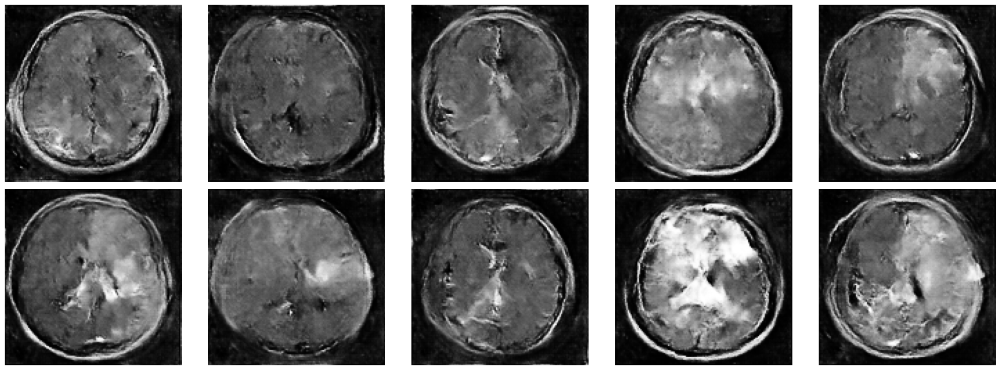

  0%|          | 0/2000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 24ms/step


  0%|          | 1/2000 [00:00<06:19,  5.26it/s]

1/1 [==============================] - 0s 28ms/step


  0%|          | 2/2000 [00:00<07:17,  4.56it/s]

1/1 [==============================] - 0s 27ms/step


  0%|          | 3/2000 [00:00<07:16,  4.57it/s]

1/1 [==============================] - 0s 36ms/step


  0%|          | 4/2000 [00:00<07:34,  4.39it/s]

1/1 [==============================] - 0s 25ms/step


  0%|          | 5/2000 [00:01<07:27,  4.46it/s]

1/1 [==============================] - 0s 26ms/step


  0%|          | 6/2000 [00:01<07:23,  4.49it/s]

1/1 [==============================] - 0s 29ms/step


  0%|          | 7/2000 [00:01<07:02,  4.72it/s]

1/1 [==============================] - 0s 27ms/step


  0%|          | 8/2000 [00:01<07:05,  4.69it/s]

1/1 [==============================] - 0s 30ms/step


  0%|          | 9/2000 [00:01<06:59,  4.74it/s]

1/1 [==============================] - 0s 24ms/step


  0%|          | 10/2000 [00:02<07:12,  4.60it/s]

1/1 [==============================] - 0s 28ms/step


  1%|          | 11/2000 [00:02<07:16,  4.55it/s]

1/1 [==============================] - 0s 24ms/step


  1%|          | 12/2000 [00:02<07:17,  4.54it/s]

1/1 [==============================] - 0s 27ms/step


  1%|          | 13/2000 [00:02<07:11,  4.61it/s]

1/1 [==============================] - 0s 56ms/step


  1%|          | 14/2000 [00:03<07:20,  4.50it/s]

1/1 [==============================] - 0s 55ms/step


  1%|          | 15/2000 [00:03<07:44,  4.27it/s]

1/1 [==============================] - 0s 35ms/step


  1%|          | 16/2000 [00:03<07:34,  4.36it/s]

1/1 [==============================] - 0s 37ms/step


  1%|          | 17/2000 [00:03<07:33,  4.37it/s]

1/1 [==============================] - 0s 33ms/step


  1%|          | 18/2000 [00:04<07:47,  4.24it/s]

1/1 [==============================] - 0s 30ms/step


  1%|          | 19/2000 [00:04<07:26,  4.44it/s]

1/1 [==============================] - 0s 32ms/step


  1%|          | 20/2000 [00:04<07:52,  4.19it/s]

1/1 [==============================] - 0s 28ms/step


  1%|          | 21/2000 [00:04<07:54,  4.17it/s]

1/1 [==============================] - 0s 43ms/step


  1%|          | 22/2000 [00:04<07:59,  4.13it/s]

1/1 [==============================] - 0s 31ms/step


  1%|          | 23/2000 [00:05<07:36,  4.33it/s]

1/1 [==============================] - 0s 27ms/step


  1%|          | 24/2000 [00:05<07:20,  4.49it/s]

1/1 [==============================] - 0s 26ms/step


  1%|▏         | 25/2000 [00:05<07:13,  4.55it/s]

1/1 [==============================] - 0s 27ms/step


  1%|▏         | 26/2000 [00:05<07:24,  4.44it/s]

1/1 [==============================] - 0s 32ms/step


  1%|▏         | 27/2000 [00:06<07:18,  4.50it/s]

1/1 [==============================] - 0s 24ms/step


  1%|▏         | 28/2000 [00:06<07:27,  4.41it/s]

1/1 [==============================] - 0s 26ms/step


  1%|▏         | 29/2000 [00:06<07:09,  4.59it/s]

1/1 [==============================] - 0s 25ms/step


  2%|▏         | 30/2000 [00:06<07:09,  4.59it/s]

1/1 [==============================] - 0s 26ms/step


  2%|▏         | 31/2000 [00:06<07:16,  4.51it/s]

1/1 [==============================] - 0s 32ms/step


  2%|▏         | 32/2000 [00:07<07:02,  4.65it/s]

1/1 [==============================] - 0s 26ms/step


  2%|▏         | 33/2000 [00:07<06:51,  4.78it/s]

1/1 [==============================] - 0s 29ms/step


  2%|▏         | 34/2000 [00:07<06:55,  4.74it/s]

1/1 [==============================] - 0s 25ms/step


  2%|▏         | 35/2000 [00:07<07:11,  4.56it/s]

1/1 [==============================] - 0s 38ms/step


  2%|▏         | 36/2000 [00:07<07:03,  4.64it/s]

1/1 [==============================] - 0s 39ms/step


  2%|▏         | 37/2000 [00:08<06:58,  4.69it/s]

1/1 [==============================] - 0s 25ms/step


  2%|▏         | 38/2000 [00:08<07:11,  4.55it/s]

1/1 [==============================] - 0s 25ms/step


  2%|▏         | 39/2000 [00:08<06:55,  4.72it/s]

1/1 [==============================] - 0s 28ms/step


  2%|▏         | 40/2000 [00:08<06:52,  4.75it/s]

1/1 [==============================] - 0s 25ms/step


  2%|▏         | 41/2000 [00:09<07:05,  4.60it/s]

1/1 [==============================] - 0s 24ms/step


  2%|▏         | 42/2000 [00:09<07:07,  4.58it/s]

1/1 [==============================] - 0s 24ms/step


  2%|▏         | 43/2000 [00:09<06:54,  4.72it/s]

1/1 [==============================] - 0s 25ms/step


  2%|▏         | 44/2000 [00:09<06:57,  4.68it/s]

1/1 [==============================] - 0s 25ms/step


  2%|▏         | 45/2000 [00:09<06:48,  4.79it/s]

1/1 [==============================] - 0s 26ms/step


  2%|▏         | 46/2000 [00:10<06:41,  4.87it/s]

1/1 [==============================] - 0s 29ms/step


  2%|▏         | 47/2000 [00:10<06:50,  4.76it/s]

1/1 [==============================] - 0s 30ms/step


  2%|▏         | 48/2000 [00:10<06:33,  4.96it/s]

1/1 [==============================] - 0s 26ms/step


  2%|▏         | 49/2000 [00:10<06:29,  5.01it/s]

1/1 [==============================] - 0s 25ms/step


  2%|▎         | 50/2000 [00:10<06:12,  5.23it/s]

1/1 [==============================] - 0s 28ms/step


  3%|▎         | 51/2000 [00:11<06:13,  5.21it/s]

1/1 [==============================] - 0s 24ms/step


  3%|▎         | 52/2000 [00:11<06:12,  5.24it/s]

1/1 [==============================] - 0s 28ms/step


  3%|▎         | 53/2000 [00:11<06:19,  5.13it/s]

1/1 [==============================] - 0s 25ms/step


  3%|▎         | 54/2000 [00:11<06:21,  5.10it/s]

1/1 [==============================] - 0s 25ms/step


  3%|▎         | 55/2000 [00:11<06:18,  5.14it/s]

1/1 [==============================] - 0s 25ms/step


  3%|▎         | 56/2000 [00:12<06:14,  5.19it/s]

1/1 [==============================] - 0s 24ms/step


  3%|▎         | 57/2000 [00:12<05:57,  5.43it/s]

1/1 [==============================] - 0s 25ms/step


  3%|▎         | 58/2000 [00:12<05:59,  5.40it/s]

1/1 [==============================] - 0s 26ms/step


  3%|▎         | 59/2000 [00:12<05:57,  5.43it/s]

1/1 [==============================] - 0s 24ms/step


  3%|▎         | 60/2000 [00:12<05:44,  5.63it/s]

1/1 [==============================] - 0s 24ms/step


  3%|▎         | 61/2000 [00:12<05:38,  5.73it/s]

1/1 [==============================] - 0s 25ms/step


  3%|▎         | 62/2000 [00:13<05:50,  5.52it/s]

1/1 [==============================] - 0s 25ms/step


  3%|▎         | 63/2000 [00:13<05:53,  5.48it/s]

1/1 [==============================] - 0s 26ms/step


  3%|▎         | 64/2000 [00:13<05:44,  5.62it/s]

1/1 [==============================] - 0s 24ms/step


  3%|▎         | 65/2000 [00:13<05:49,  5.54it/s]

1/1 [==============================] - 0s 25ms/step


  3%|▎         | 66/2000 [00:13<05:57,  5.41it/s]

1/1 [==============================] - 0s 25ms/step


  3%|▎         | 67/2000 [00:14<05:59,  5.38it/s]

1/1 [==============================] - 0s 27ms/step


  3%|▎         | 68/2000 [00:14<05:46,  5.58it/s]

1/1 [==============================] - 0s 25ms/step


  3%|▎         | 69/2000 [00:14<05:54,  5.45it/s]

1/1 [==============================] - 0s 31ms/step


  4%|▎         | 70/2000 [00:14<05:41,  5.65it/s]

1/1 [==============================] - 0s 24ms/step


  4%|▎         | 71/2000 [00:14<05:53,  5.45it/s]

1/1 [==============================] - 0s 27ms/step


  4%|▎         | 72/2000 [00:14<05:44,  5.60it/s]

1/1 [==============================] - 0s 25ms/step


  4%|▎         | 73/2000 [00:15<05:50,  5.49it/s]

1/1 [==============================] - 0s 26ms/step


  4%|▎         | 74/2000 [00:15<05:53,  5.45it/s]

1/1 [==============================] - 0s 39ms/step


  4%|▍         | 75/2000 [00:15<05:55,  5.41it/s]

1/1 [==============================] - 0s 25ms/step


  4%|▍         | 76/2000 [00:15<05:58,  5.37it/s]

1/1 [==============================] - 0s 25ms/step


  4%|▍         | 77/2000 [00:15<05:47,  5.54it/s]

1/1 [==============================] - 0s 26ms/step


  4%|▍         | 78/2000 [00:16<05:54,  5.42it/s]

1/1 [==============================] - 0s 35ms/step


  4%|▍         | 79/2000 [00:16<06:07,  5.23it/s]

1/1 [==============================] - 0s 34ms/step


  4%|▍         | 80/2000 [00:16<07:02,  4.54it/s]

1/1 [==============================] - 0s 37ms/step


  4%|▍         | 81/2000 [00:16<07:08,  4.48it/s]

1/1 [==============================] - 0s 30ms/step


  4%|▍         | 82/2000 [00:16<06:59,  4.57it/s]

1/1 [==============================] - 0s 43ms/step


  4%|▍         | 83/2000 [00:17<07:08,  4.48it/s]

1/1 [==============================] - 0s 34ms/step


  4%|▍         | 84/2000 [00:17<06:56,  4.60it/s]

1/1 [==============================] - 0s 40ms/step


  4%|▍         | 85/2000 [00:17<06:51,  4.65it/s]

1/1 [==============================] - 0s 41ms/step


  4%|▍         | 86/2000 [00:17<06:48,  4.69it/s]

1/1 [==============================] - 0s 51ms/step


  4%|▍         | 87/2000 [00:18<06:56,  4.59it/s]

1/1 [==============================] - 0s 28ms/step


  4%|▍         | 88/2000 [00:18<07:05,  4.50it/s]

1/1 [==============================] - 0s 39ms/step


  4%|▍         | 89/2000 [00:18<07:15,  4.39it/s]

1/1 [==============================] - 0s 40ms/step


  4%|▍         | 90/2000 [00:18<07:13,  4.41it/s]

1/1 [==============================] - 0s 29ms/step


  5%|▍         | 91/2000 [00:18<06:54,  4.60it/s]

1/1 [==============================] - 0s 32ms/step


  5%|▍         | 92/2000 [00:19<06:47,  4.68it/s]

1/1 [==============================] - 0s 40ms/step


  5%|▍         | 93/2000 [00:19<07:04,  4.49it/s]

1/1 [==============================] - 0s 41ms/step


  5%|▍         | 94/2000 [00:19<07:28,  4.25it/s]

1/1 [==============================] - 0s 25ms/step


  5%|▍         | 95/2000 [00:19<07:25,  4.28it/s]

1/1 [==============================] - 0s 25ms/step


  5%|▍         | 96/2000 [00:20<07:22,  4.30it/s]

1/1 [==============================] - 0s 31ms/step


  5%|▍         | 97/2000 [00:20<06:54,  4.59it/s]

1/1 [==============================] - 0s 26ms/step


  5%|▍         | 98/2000 [00:20<06:52,  4.61it/s]

1/1 [==============================] - 0s 31ms/step


  5%|▍         | 99/2000 [00:20<07:01,  4.51it/s]

1/1 [==============================] - 0s 27ms/step


  5%|▌         | 100/2000 [00:20<07:07,  4.45it/s]

1/1 [==============================] - 0s 24ms/step


  5%|▌         | 101/2000 [00:21<07:09,  4.42it/s]

1/1 [==============================] - 0s 27ms/step


  5%|▌         | 102/2000 [00:21<06:48,  4.65it/s]

1/1 [==============================] - 0s 26ms/step


  5%|▌         | 103/2000 [00:21<06:46,  4.67it/s]

1/1 [==============================] - 0s 25ms/step


  5%|▌         | 104/2000 [00:21<06:28,  4.88it/s]

1/1 [==============================] - 0s 26ms/step


  5%|▌         | 105/2000 [00:22<06:53,  4.58it/s]

1/1 [==============================] - 0s 25ms/step


  5%|▌         | 106/2000 [00:22<06:53,  4.59it/s]

1/1 [==============================] - 0s 30ms/step


  5%|▌         | 107/2000 [00:22<07:09,  4.41it/s]

1/1 [==============================] - 0s 25ms/step


  5%|▌         | 108/2000 [00:22<07:02,  4.48it/s]

1/1 [==============================] - 0s 27ms/step


  5%|▌         | 109/2000 [00:22<07:08,  4.42it/s]

1/1 [==============================] - 0s 25ms/step


  6%|▌         | 110/2000 [00:23<07:10,  4.39it/s]

1/1 [==============================] - 0s 27ms/step


  6%|▌         | 111/2000 [00:23<07:16,  4.33it/s]

1/1 [==============================] - 0s 29ms/step


  6%|▌         | 112/2000 [00:23<07:28,  4.21it/s]

1/1 [==============================] - 0s 24ms/step


  6%|▌         | 113/2000 [00:23<06:58,  4.51it/s]

1/1 [==============================] - 0s 25ms/step


  6%|▌         | 114/2000 [00:24<06:41,  4.70it/s]

1/1 [==============================] - 0s 25ms/step


  6%|▌         | 115/2000 [00:24<06:29,  4.84it/s]

1/1 [==============================] - 0s 26ms/step


  6%|▌         | 116/2000 [00:24<06:21,  4.93it/s]

1/1 [==============================] - 0s 25ms/step


  6%|▌         | 117/2000 [00:24<06:39,  4.72it/s]

1/1 [==============================] - 0s 25ms/step


  6%|▌         | 118/2000 [00:24<06:32,  4.79it/s]

1/1 [==============================] - 0s 25ms/step


  6%|▌         | 119/2000 [00:25<06:24,  4.89it/s]

1/1 [==============================] - 0s 25ms/step


  6%|▌         | 120/2000 [00:25<06:28,  4.84it/s]

1/1 [==============================] - 0s 25ms/step


  6%|▌         | 121/2000 [00:25<06:05,  5.15it/s]

1/1 [==============================] - 0s 28ms/step


  6%|▌         | 122/2000 [00:25<06:28,  4.83it/s]

1/1 [==============================] - 0s 32ms/step


  6%|▌         | 123/2000 [00:25<06:51,  4.56it/s]

1/1 [==============================] - 0s 25ms/step


  6%|▌         | 124/2000 [00:26<06:59,  4.47it/s]

1/1 [==============================] - 0s 28ms/step


  6%|▋         | 125/2000 [00:26<06:54,  4.52it/s]

1/1 [==============================] - 0s 24ms/step


  6%|▋         | 126/2000 [00:26<07:00,  4.46it/s]

1/1 [==============================] - 0s 26ms/step


  6%|▋         | 127/2000 [00:26<07:05,  4.41it/s]

1/1 [==============================] - 0s 25ms/step


  6%|▋         | 128/2000 [00:27<06:47,  4.60it/s]

1/1 [==============================] - 0s 25ms/step


  6%|▋         | 129/2000 [00:27<06:32,  4.77it/s]

1/1 [==============================] - 0s 26ms/step


  6%|▋         | 130/2000 [00:27<06:22,  4.89it/s]

1/1 [==============================] - 0s 25ms/step


  7%|▋         | 131/2000 [00:27<06:16,  4.96it/s]

1/1 [==============================] - 0s 24ms/step


  7%|▋         | 132/2000 [00:27<05:59,  5.19it/s]

1/1 [==============================] - 0s 26ms/step


  7%|▋         | 133/2000 [00:28<06:23,  4.86it/s]

1/1 [==============================] - 0s 27ms/step


  7%|▋         | 134/2000 [00:28<06:20,  4.90it/s]

1/1 [==============================] - 0s 25ms/step


  7%|▋         | 135/2000 [00:28<06:20,  4.91it/s]

1/1 [==============================] - 0s 26ms/step


  7%|▋         | 136/2000 [00:28<06:22,  4.87it/s]

1/1 [==============================] - 0s 28ms/step


  7%|▋         | 137/2000 [00:28<06:42,  4.63it/s]

1/1 [==============================] - 0s 25ms/step


  7%|▋         | 138/2000 [00:29<06:28,  4.79it/s]

1/1 [==============================] - 0s 24ms/step


  7%|▋         | 139/2000 [00:29<06:09,  5.03it/s]

1/1 [==============================] - 0s 25ms/step


  7%|▋         | 140/2000 [00:29<06:07,  5.06it/s]

1/1 [==============================] - 0s 24ms/step


  7%|▋         | 141/2000 [00:29<06:03,  5.12it/s]

1/1 [==============================] - 0s 24ms/step


  7%|▋         | 142/2000 [00:29<06:29,  4.77it/s]

1/1 [==============================] - 0s 27ms/step


  7%|▋         | 143/2000 [00:30<06:59,  4.43it/s]

1/1 [==============================] - 0s 30ms/step


  7%|▋         | 144/2000 [00:30<06:51,  4.51it/s]

1/1 [==============================] - 0s 40ms/step


  7%|▋         | 145/2000 [00:30<06:48,  4.54it/s]

1/1 [==============================] - 0s 38ms/step


  7%|▋         | 146/2000 [00:30<07:16,  4.25it/s]

1/1 [==============================] - 0s 59ms/step


  7%|▋         | 147/2000 [00:31<07:09,  4.31it/s]

1/1 [==============================] - 0s 29ms/step


  7%|▋         | 148/2000 [00:31<07:06,  4.34it/s]

1/1 [==============================] - 0s 47ms/step


  7%|▋         | 149/2000 [00:31<07:33,  4.09it/s]

1/1 [==============================] - 0s 29ms/step


  8%|▊         | 150/2000 [00:31<07:31,  4.09it/s]

1/1 [==============================] - 0s 30ms/step


  8%|▊         | 151/2000 [00:32<07:30,  4.11it/s]

1/1 [==============================] - 0s 33ms/step


  8%|▊         | 152/2000 [00:32<07:47,  3.96it/s]

1/1 [==============================] - 0s 32ms/step


  8%|▊         | 153/2000 [00:32<07:30,  4.10it/s]

1/1 [==============================] - 0s 38ms/step


  8%|▊         | 154/2000 [00:32<07:16,  4.23it/s]

1/1 [==============================] - 0s 31ms/step


  8%|▊         | 155/2000 [00:32<07:02,  4.37it/s]

1/1 [==============================] - 0s 39ms/step


  8%|▊         | 156/2000 [00:33<07:00,  4.39it/s]

1/1 [==============================] - 0s 57ms/step


  8%|▊         | 157/2000 [00:33<07:27,  4.12it/s]

1/1 [==============================] - 0s 25ms/step


  8%|▊         | 158/2000 [00:33<07:14,  4.24it/s]

1/1 [==============================] - 0s 25ms/step


  8%|▊         | 159/2000 [00:33<07:02,  4.36it/s]

1/1 [==============================] - 0s 27ms/step


  8%|▊         | 160/2000 [00:34<06:43,  4.57it/s]

1/1 [==============================] - 0s 25ms/step


  8%|▊         | 161/2000 [00:34<06:54,  4.44it/s]

1/1 [==============================] - 0s 25ms/step


  8%|▊         | 162/2000 [00:34<06:30,  4.70it/s]

1/1 [==============================] - 0s 29ms/step


  8%|▊         | 163/2000 [00:34<06:15,  4.89it/s]

1/1 [==============================] - 0s 26ms/step


  8%|▊         | 164/2000 [00:34<06:27,  4.74it/s]

1/1 [==============================] - 0s 25ms/step


  8%|▊         | 165/2000 [00:35<06:15,  4.89it/s]

1/1 [==============================] - 0s 25ms/step


  8%|▊         | 166/2000 [00:35<06:10,  4.95it/s]

1/1 [==============================] - 0s 25ms/step


  8%|▊         | 167/2000 [00:35<06:00,  5.09it/s]

1/1 [==============================] - 0s 24ms/step


  8%|▊         | 168/2000 [00:35<05:59,  5.10it/s]

1/1 [==============================] - 0s 25ms/step


  8%|▊         | 169/2000 [00:35<06:04,  5.02it/s]

1/1 [==============================] - 0s 32ms/step


  8%|▊         | 170/2000 [00:36<10:22,  2.94it/s]

1/1 [==============================] - 0s 42ms/step


  9%|▊         | 171/2000 [00:36<09:16,  3.29it/s]

1/1 [==============================] - 0s 28ms/step


  9%|▊         | 172/2000 [00:37<08:37,  3.53it/s]

1/1 [==============================] - 0s 28ms/step


  9%|▊         | 173/2000 [00:37<08:15,  3.69it/s]

1/1 [==============================] - 0s 31ms/step


  9%|▊         | 174/2000 [00:37<08:00,  3.80it/s]

1/1 [==============================] - 0s 32ms/step


  9%|▉         | 175/2000 [00:37<07:44,  3.92it/s]

1/1 [==============================] - 0s 29ms/step


  9%|▉         | 176/2000 [00:37<07:37,  3.98it/s]

1/1 [==============================] - 0s 29ms/step


  9%|▉         | 177/2000 [00:38<07:20,  4.14it/s]

1/1 [==============================] - 0s 36ms/step


  9%|▉         | 178/2000 [00:38<07:01,  4.32it/s]

1/1 [==============================] - 0s 31ms/step


  9%|▉         | 179/2000 [00:38<07:06,  4.27it/s]

1/1 [==============================] - 0s 29ms/step


  9%|▉         | 180/2000 [00:38<06:52,  4.41it/s]

1/1 [==============================] - 0s 29ms/step


  9%|▉         | 181/2000 [00:39<06:35,  4.60it/s]

1/1 [==============================] - 0s 27ms/step


  9%|▉         | 182/2000 [00:39<06:45,  4.48it/s]

1/1 [==============================] - 0s 32ms/step


  9%|▉         | 183/2000 [00:39<06:32,  4.63it/s]

1/1 [==============================] - 0s 28ms/step


  9%|▉         | 184/2000 [00:39<06:35,  4.59it/s]

1/1 [==============================] - 0s 28ms/step


  9%|▉         | 185/2000 [00:39<06:38,  4.55it/s]

1/1 [==============================] - 0s 27ms/step


  9%|▉         | 186/2000 [00:40<06:51,  4.41it/s]

1/1 [==============================] - 0s 29ms/step


  9%|▉         | 187/2000 [00:40<06:39,  4.54it/s]

1/1 [==============================] - 0s 29ms/step


  9%|▉         | 188/2000 [00:40<06:31,  4.63it/s]

1/1 [==============================] - 0s 30ms/step


  9%|▉         | 189/2000 [00:40<06:24,  4.71it/s]

1/1 [==============================] - 0s 30ms/step


 10%|▉         | 190/2000 [00:41<06:14,  4.84it/s]

1/1 [==============================] - 0s 29ms/step


 10%|▉         | 191/2000 [00:41<06:13,  4.85it/s]

1/1 [==============================] - 0s 28ms/step


 10%|▉         | 192/2000 [00:41<06:14,  4.83it/s]

1/1 [==============================] - 0s 27ms/step


 10%|▉         | 193/2000 [00:41<06:11,  4.86it/s]

1/1 [==============================] - 0s 28ms/step


 10%|▉         | 194/2000 [00:41<06:13,  4.84it/s]

1/1 [==============================] - 0s 27ms/step


 10%|▉         | 195/2000 [00:42<06:15,  4.81it/s]

1/1 [==============================] - 0s 28ms/step


 10%|▉         | 196/2000 [00:42<06:27,  4.66it/s]

1/1 [==============================] - 0s 29ms/step


 10%|▉         | 197/2000 [00:42<06:25,  4.68it/s]

1/1 [==============================] - 0s 35ms/step


 10%|▉         | 198/2000 [00:42<06:10,  4.87it/s]

1/1 [==============================] - 0s 32ms/step


 10%|▉         | 199/2000 [00:42<05:59,  5.00it/s]

1/1 [==============================] - 0s 26ms/step


 10%|█         | 200/2000 [00:43<06:07,  4.89it/s]

1/1 [==============================] - 0s 27ms/step


 10%|█         | 201/2000 [00:43<05:57,  5.04it/s]

1/1 [==============================] - 0s 28ms/step


 10%|█         | 202/2000 [00:43<05:57,  5.03it/s]

1/1 [==============================] - 0s 35ms/step


 10%|█         | 203/2000 [00:43<06:15,  4.79it/s]

1/1 [==============================] - 0s 31ms/step


 10%|█         | 204/2000 [00:43<06:32,  4.57it/s]

1/1 [==============================] - 0s 64ms/step


 10%|█         | 205/2000 [00:44<07:02,  4.25it/s]

1/1 [==============================] - 0s 63ms/step


 10%|█         | 206/2000 [00:44<07:43,  3.87it/s]

1/1 [==============================] - 0s 43ms/step


 10%|█         | 207/2000 [00:44<07:32,  3.96it/s]

1/1 [==============================] - 0s 45ms/step


 10%|█         | 208/2000 [00:44<07:14,  4.13it/s]

1/1 [==============================] - 0s 26ms/step


 10%|█         | 209/2000 [00:45<06:49,  4.37it/s]

1/1 [==============================] - 0s 59ms/step


 10%|█         | 210/2000 [00:45<06:57,  4.29it/s]

1/1 [==============================] - 0s 36ms/step


 11%|█         | 211/2000 [00:45<07:04,  4.21it/s]

1/1 [==============================] - 0s 52ms/step


 11%|█         | 212/2000 [00:45<07:18,  4.08it/s]

1/1 [==============================] - 0s 50ms/step


 11%|█         | 213/2000 [00:46<07:21,  4.04it/s]

1/1 [==============================] - 0s 53ms/step


 11%|█         | 214/2000 [00:46<07:44,  3.84it/s]

1/1 [==============================] - 0s 44ms/step


 11%|█         | 215/2000 [00:46<07:31,  3.95it/s]

1/1 [==============================] - 0s 40ms/step


 11%|█         | 216/2000 [00:46<07:21,  4.04it/s]

1/1 [==============================] - 0s 29ms/step


 11%|█         | 217/2000 [00:47<06:58,  4.26it/s]

1/1 [==============================] - 0s 30ms/step


 11%|█         | 218/2000 [00:47<06:38,  4.47it/s]

1/1 [==============================] - 0s 47ms/step


 11%|█         | 219/2000 [00:47<06:57,  4.26it/s]

1/1 [==============================] - 0s 29ms/step


 11%|█         | 220/2000 [00:47<06:39,  4.45it/s]

1/1 [==============================] - 0s 27ms/step


 11%|█         | 221/2000 [00:48<06:44,  4.39it/s]

1/1 [==============================] - 0s 27ms/step


 11%|█         | 222/2000 [00:48<06:21,  4.66it/s]

1/1 [==============================] - 0s 29ms/step


 11%|█         | 223/2000 [00:48<06:23,  4.63it/s]

1/1 [==============================] - 0s 28ms/step


 11%|█         | 224/2000 [00:48<06:17,  4.71it/s]

1/1 [==============================] - 0s 27ms/step


 11%|█▏        | 225/2000 [00:48<06:26,  4.60it/s]

1/1 [==============================] - 0s 28ms/step


 11%|█▏        | 226/2000 [00:49<06:16,  4.71it/s]

1/1 [==============================] - 0s 27ms/step


 11%|█▏        | 227/2000 [00:49<06:07,  4.83it/s]

1/1 [==============================] - 0s 27ms/step


 11%|█▏        | 228/2000 [00:49<06:02,  4.88it/s]

1/1 [==============================] - 0s 34ms/step


 11%|█▏        | 229/2000 [00:49<05:59,  4.92it/s]

1/1 [==============================] - 0s 44ms/step


 12%|█▏        | 230/2000 [00:49<05:51,  5.04it/s]

1/1 [==============================] - 0s 36ms/step


 12%|█▏        | 231/2000 [00:50<06:24,  4.60it/s]

1/1 [==============================] - 0s 27ms/step


 12%|█▏        | 232/2000 [00:50<06:04,  4.85it/s]

1/1 [==============================] - 0s 28ms/step


 12%|█▏        | 233/2000 [00:50<06:00,  4.90it/s]

1/1 [==============================] - 0s 27ms/step


 12%|█▏        | 234/2000 [00:50<06:06,  4.82it/s]

1/1 [==============================] - 0s 39ms/step


 12%|█▏        | 235/2000 [00:50<06:30,  4.52it/s]

1/1 [==============================] - 0s 27ms/step


 12%|█▏        | 236/2000 [00:51<06:16,  4.69it/s]

1/1 [==============================] - 0s 26ms/step


 12%|█▏        | 237/2000 [00:51<06:28,  4.54it/s]

1/1 [==============================] - 0s 26ms/step


 12%|█▏        | 238/2000 [00:51<06:19,  4.64it/s]

1/1 [==============================] - 0s 28ms/step


 12%|█▏        | 239/2000 [00:51<06:14,  4.70it/s]

1/1 [==============================] - 0s 27ms/step


 12%|█▏        | 240/2000 [00:52<06:14,  4.69it/s]

1/1 [==============================] - 0s 29ms/step


 12%|█▏        | 241/2000 [00:52<06:08,  4.78it/s]

1/1 [==============================] - 0s 27ms/step


 12%|█▏        | 242/2000 [00:52<06:20,  4.62it/s]

1/1 [==============================] - 0s 30ms/step


 12%|█▏        | 243/2000 [00:52<06:10,  4.74it/s]

1/1 [==============================] - 0s 26ms/step


 12%|█▏        | 244/2000 [00:52<06:04,  4.82it/s]

1/1 [==============================] - 0s 30ms/step


 12%|█▏        | 245/2000 [00:53<06:25,  4.55it/s]

1/1 [==============================] - 0s 26ms/step


 12%|█▏        | 246/2000 [00:53<06:12,  4.70it/s]

1/1 [==============================] - 0s 27ms/step


 12%|█▏        | 247/2000 [00:53<06:06,  4.79it/s]

1/1 [==============================] - 0s 28ms/step


 12%|█▏        | 248/2000 [00:53<06:20,  4.61it/s]

1/1 [==============================] - 0s 33ms/step


 12%|█▏        | 249/2000 [00:53<06:41,  4.36it/s]

1/1 [==============================] - 0s 27ms/step


 12%|█▎        | 250/2000 [00:54<06:37,  4.40it/s]

1/1 [==============================] - 0s 29ms/step


 13%|█▎        | 251/2000 [00:54<06:28,  4.50it/s]

1/1 [==============================] - 0s 27ms/step


 13%|█▎        | 252/2000 [00:54<06:18,  4.62it/s]

1/1 [==============================] - 0s 29ms/step


 13%|█▎        | 253/2000 [00:54<06:14,  4.66it/s]

1/1 [==============================] - 0s 28ms/step


 13%|█▎        | 254/2000 [00:55<06:02,  4.81it/s]

1/1 [==============================] - 0s 29ms/step


 13%|█▎        | 255/2000 [00:55<06:10,  4.71it/s]

1/1 [==============================] - 0s 28ms/step


 13%|█▎        | 256/2000 [00:55<05:52,  4.94it/s]

1/1 [==============================] - 0s 26ms/step


 13%|█▎        | 257/2000 [00:55<05:50,  4.97it/s]

1/1 [==============================] - 0s 28ms/step


 13%|█▎        | 258/2000 [00:55<05:47,  5.01it/s]

1/1 [==============================] - 0s 28ms/step


 13%|█▎        | 259/2000 [00:56<05:52,  4.94it/s]

1/1 [==============================] - 0s 28ms/step


 13%|█▎        | 260/2000 [00:56<06:11,  4.68it/s]

1/1 [==============================] - 0s 27ms/step


 13%|█▎        | 261/2000 [00:56<06:26,  4.50it/s]

1/1 [==============================] - 0s 27ms/step


 13%|█▎        | 262/2000 [00:56<06:15,  4.63it/s]

1/1 [==============================] - 0s 29ms/step


 13%|█▎        | 263/2000 [00:56<06:07,  4.73it/s]

1/1 [==============================] - 0s 39ms/step


 13%|█▎        | 264/2000 [00:57<06:07,  4.72it/s]

1/1 [==============================] - 0s 27ms/step


 13%|█▎        | 265/2000 [00:57<05:56,  4.87it/s]

1/1 [==============================] - 0s 26ms/step


 13%|█▎        | 266/2000 [00:57<06:05,  4.75it/s]

1/1 [==============================] - 0s 32ms/step


 13%|█▎        | 267/2000 [00:57<06:30,  4.44it/s]

1/1 [==============================] - 0s 60ms/step


 13%|█▎        | 268/2000 [00:58<06:59,  4.13it/s]

1/1 [==============================] - 0s 29ms/step


 13%|█▎        | 269/2000 [00:58<06:39,  4.34it/s]

1/1 [==============================] - 0s 32ms/step


 14%|█▎        | 270/2000 [00:58<06:37,  4.35it/s]

1/1 [==============================] - 0s 36ms/step


 14%|█▎        | 271/2000 [00:58<07:02,  4.10it/s]

1/1 [==============================] - 0s 31ms/step


 14%|█▎        | 272/2000 [00:59<06:56,  4.15it/s]

1/1 [==============================] - 0s 41ms/step


 14%|█▎        | 273/2000 [00:59<07:05,  4.06it/s]

1/1 [==============================] - 0s 40ms/step


 14%|█▎        | 274/2000 [00:59<07:02,  4.08it/s]

1/1 [==============================] - 0s 38ms/step


 14%|█▍        | 275/2000 [00:59<06:57,  4.13it/s]

1/1 [==============================] - 0s 49ms/step


 14%|█▍        | 276/2000 [01:00<07:43,  3.72it/s]

1/1 [==============================] - 0s 35ms/step


 14%|█▍        | 277/2000 [01:00<07:54,  3.63it/s]

1/1 [==============================] - 0s 31ms/step


 14%|█▍        | 278/2000 [01:00<07:36,  3.77it/s]

1/1 [==============================] - 0s 30ms/step


 14%|█▍        | 279/2000 [01:00<07:05,  4.04it/s]

1/1 [==============================] - 0s 30ms/step


 14%|█▍        | 280/2000 [01:01<07:10,  4.00it/s]

1/1 [==============================] - 0s 37ms/step


 14%|█▍        | 281/2000 [01:01<06:55,  4.13it/s]

1/1 [==============================] - 0s 55ms/step


 14%|█▍        | 282/2000 [01:01<07:19,  3.91it/s]

1/1 [==============================] - 0s 26ms/step


 14%|█▍        | 283/2000 [01:01<06:41,  4.28it/s]

1/1 [==============================] - 0s 27ms/step


 14%|█▍        | 284/2000 [01:02<06:40,  4.28it/s]

1/1 [==============================] - 0s 26ms/step


 14%|█▍        | 285/2000 [01:02<06:32,  4.37it/s]

1/1 [==============================] - 0s 27ms/step


 14%|█▍        | 286/2000 [01:02<06:37,  4.31it/s]

1/1 [==============================] - 0s 27ms/step


 14%|█▍        | 287/2000 [01:02<06:39,  4.29it/s]

1/1 [==============================] - 0s 25ms/step


 14%|█▍        | 288/2000 [01:02<06:35,  4.33it/s]

1/1 [==============================] - 0s 28ms/step


 14%|█▍        | 289/2000 [01:03<06:16,  4.54it/s]

1/1 [==============================] - 0s 25ms/step


 14%|█▍        | 290/2000 [01:03<06:12,  4.59it/s]

1/1 [==============================] - 0s 26ms/step


 15%|█▍        | 291/2000 [01:03<05:53,  4.83it/s]

1/1 [==============================] - 0s 26ms/step


 15%|█▍        | 292/2000 [01:03<05:47,  4.92it/s]

1/1 [==============================] - 0s 25ms/step


 15%|█▍        | 293/2000 [01:03<05:30,  5.17it/s]

1/1 [==============================] - 0s 27ms/step


 15%|█▍        | 294/2000 [01:04<05:27,  5.20it/s]

1/1 [==============================] - 0s 26ms/step


 15%|█▍        | 295/2000 [01:04<05:16,  5.39it/s]

1/1 [==============================] - 0s 34ms/step


 15%|█▍        | 296/2000 [01:04<05:51,  4.84it/s]

1/1 [==============================] - 0s 26ms/step


 15%|█▍        | 297/2000 [01:04<05:33,  5.11it/s]

1/1 [==============================] - 0s 27ms/step


 15%|█▍        | 298/2000 [01:04<05:34,  5.09it/s]

1/1 [==============================] - 0s 26ms/step


 15%|█▍        | 299/2000 [01:05<05:29,  5.16it/s]

1/1 [==============================] - 0s 26ms/step


 15%|█▌        | 300/2000 [01:05<05:30,  5.14it/s]

1/1 [==============================] - 0s 26ms/step


 15%|█▌        | 301/2000 [01:05<05:31,  5.13it/s]

1/1 [==============================] - 0s 27ms/step


 15%|█▌        | 302/2000 [01:05<05:31,  5.12it/s]

1/1 [==============================] - 0s 30ms/step


 15%|█▌        | 303/2000 [01:05<05:48,  4.87it/s]

1/1 [==============================] - 0s 27ms/step


 15%|█▌        | 304/2000 [01:06<05:44,  4.92it/s]

1/1 [==============================] - 0s 28ms/step


 15%|█▌        | 305/2000 [01:06<05:49,  4.85it/s]

1/1 [==============================] - 0s 28ms/step


 15%|█▌        | 306/2000 [01:06<06:06,  4.62it/s]

1/1 [==============================] - 0s 30ms/step


 15%|█▌        | 307/2000 [01:06<05:57,  4.73it/s]

1/1 [==============================] - 0s 26ms/step


 15%|█▌        | 308/2000 [01:06<05:51,  4.82it/s]

1/1 [==============================] - 0s 26ms/step


 15%|█▌        | 309/2000 [01:07<05:37,  5.01it/s]

1/1 [==============================] - 0s 26ms/step


 16%|█▌        | 310/2000 [01:07<05:47,  4.86it/s]

1/1 [==============================] - 0s 26ms/step


 16%|█▌        | 311/2000 [01:07<05:59,  4.70it/s]

1/1 [==============================] - 0s 26ms/step


 16%|█▌        | 312/2000 [01:07<06:02,  4.66it/s]

1/1 [==============================] - 0s 28ms/step


 16%|█▌        | 313/2000 [01:07<05:53,  4.78it/s]

1/1 [==============================] - 0s 26ms/step


 16%|█▌        | 314/2000 [01:08<05:39,  4.97it/s]

1/1 [==============================] - 0s 35ms/step


 16%|█▌        | 315/2000 [01:08<05:46,  4.87it/s]

1/1 [==============================] - 0s 26ms/step


 16%|█▌        | 316/2000 [01:08<05:58,  4.70it/s]

1/1 [==============================] - 0s 27ms/step


 16%|█▌        | 317/2000 [01:08<05:42,  4.91it/s]

1/1 [==============================] - 0s 26ms/step


 16%|█▌        | 318/2000 [01:09<05:52,  4.77it/s]

1/1 [==============================] - 0s 29ms/step


 16%|█▌        | 319/2000 [01:09<05:49,  4.82it/s]

1/1 [==============================] - 0s 27ms/step


 16%|█▌        | 320/2000 [01:09<05:46,  4.84it/s]

1/1 [==============================] - 0s 27ms/step


 16%|█▌        | 321/2000 [01:09<05:48,  4.82it/s]

1/1 [==============================] - 0s 26ms/step


 16%|█▌        | 322/2000 [01:09<05:32,  5.05it/s]

1/1 [==============================] - 0s 26ms/step


 16%|█▌        | 323/2000 [01:09<05:33,  5.03it/s]

1/1 [==============================] - 0s 28ms/step


 16%|█▌        | 324/2000 [01:10<05:34,  5.01it/s]

1/1 [==============================] - 0s 30ms/step


 16%|█▋        | 325/2000 [01:10<05:53,  4.74it/s]

1/1 [==============================] - 0s 27ms/step


 16%|█▋        | 326/2000 [01:10<05:54,  4.72it/s]

1/1 [==============================] - 0s 27ms/step


 16%|█▋        | 327/2000 [01:10<05:48,  4.80it/s]

1/1 [==============================] - 0s 26ms/step


 16%|█▋        | 328/2000 [01:11<05:54,  4.72it/s]

1/1 [==============================] - 0s 31ms/step


 16%|█▋        | 329/2000 [01:11<05:56,  4.69it/s]

1/1 [==============================] - 0s 26ms/step


 16%|█▋        | 330/2000 [01:11<06:08,  4.53it/s]

1/1 [==============================] - 0s 39ms/step


 17%|█▋        | 331/2000 [01:11<06:30,  4.27it/s]

1/1 [==============================] - 0s 38ms/step


 17%|█▋        | 332/2000 [01:12<06:30,  4.27it/s]

1/1 [==============================] - 0s 26ms/step


 17%|█▋        | 333/2000 [01:12<06:13,  4.46it/s]

1/1 [==============================] - 0s 26ms/step


 17%|█▋        | 334/2000 [01:12<06:06,  4.54it/s]

1/1 [==============================] - 0s 61ms/step


 17%|█▋        | 335/2000 [01:12<06:29,  4.27it/s]

1/1 [==============================] - 0s 55ms/step


 17%|█▋        | 336/2000 [01:12<06:30,  4.26it/s]

1/1 [==============================] - 0s 53ms/step


 17%|█▋        | 337/2000 [01:13<06:48,  4.07it/s]

1/1 [==============================] - 0s 60ms/step


 17%|█▋        | 338/2000 [01:13<06:58,  3.97it/s]

1/1 [==============================] - 0s 61ms/step


 17%|█▋        | 339/2000 [01:13<07:16,  3.81it/s]

1/1 [==============================] - 0s 34ms/step


 17%|█▋        | 340/2000 [01:13<06:57,  3.98it/s]

1/1 [==============================] - 0s 45ms/step


 17%|█▋        | 341/2000 [01:14<06:54,  4.00it/s]

1/1 [==============================] - 0s 42ms/step


 17%|█▋        | 342/2000 [01:14<06:42,  4.12it/s]

1/1 [==============================] - 0s 52ms/step


 17%|█▋        | 343/2000 [01:14<07:02,  3.92it/s]

1/1 [==============================] - 0s 46ms/step


 17%|█▋        | 344/2000 [01:15<07:18,  3.78it/s]

1/1 [==============================] - 0s 29ms/step


 17%|█▋        | 345/2000 [01:15<06:53,  4.01it/s]

1/1 [==============================] - 0s 31ms/step


 17%|█▋        | 346/2000 [01:15<06:50,  4.03it/s]

1/1 [==============================] - 0s 48ms/step


 17%|█▋        | 347/2000 [01:15<06:59,  3.94it/s]

1/1 [==============================] - 0s 31ms/step


 17%|█▋        | 348/2000 [01:15<06:49,  4.03it/s]

1/1 [==============================] - 0s 26ms/step


 17%|█▋        | 349/2000 [01:16<06:18,  4.36it/s]

1/1 [==============================] - 0s 26ms/step


 18%|█▊        | 350/2000 [01:16<06:06,  4.51it/s]

1/1 [==============================] - 0s 26ms/step


 18%|█▊        | 351/2000 [01:16<06:05,  4.51it/s]

1/1 [==============================] - 0s 26ms/step


 18%|█▊        | 352/2000 [01:16<05:54,  4.65it/s]

1/1 [==============================] - 0s 26ms/step


 18%|█▊        | 353/2000 [01:17<06:05,  4.50it/s]

1/1 [==============================] - 0s 26ms/step


 18%|█▊        | 354/2000 [01:17<05:45,  4.76it/s]

1/1 [==============================] - 0s 27ms/step


 18%|█▊        | 355/2000 [01:17<05:59,  4.57it/s]

1/1 [==============================] - 0s 26ms/step


 18%|█▊        | 356/2000 [01:17<05:51,  4.67it/s]

1/1 [==============================] - 0s 26ms/step


 18%|█▊        | 357/2000 [01:17<05:47,  4.73it/s]

1/1 [==============================] - 0s 26ms/step


 18%|█▊        | 358/2000 [01:18<05:40,  4.83it/s]

1/1 [==============================] - 0s 27ms/step


 18%|█▊        | 359/2000 [01:18<05:37,  4.87it/s]

1/1 [==============================] - 0s 27ms/step


 18%|█▊        | 360/2000 [01:18<05:32,  4.93it/s]

1/1 [==============================] - 0s 24ms/step


 18%|█▊        | 361/2000 [01:18<05:39,  4.83it/s]

1/1 [==============================] - 0s 28ms/step


 18%|█▊        | 362/2000 [01:18<05:50,  4.67it/s]

1/1 [==============================] - 0s 27ms/step


 18%|█▊        | 363/2000 [01:19<05:45,  4.74it/s]

1/1 [==============================] - 0s 28ms/step


 18%|█▊        | 364/2000 [01:19<05:37,  4.84it/s]

1/1 [==============================] - 0s 25ms/step


 18%|█▊        | 365/2000 [01:19<05:47,  4.71it/s]

1/1 [==============================] - 0s 28ms/step


 18%|█▊        | 366/2000 [01:19<05:46,  4.72it/s]

1/1 [==============================] - 0s 27ms/step


 18%|█▊        | 367/2000 [01:19<05:34,  4.89it/s]

1/1 [==============================] - 0s 26ms/step


 18%|█▊        | 368/2000 [01:20<05:53,  4.62it/s]

1/1 [==============================] - 0s 31ms/step


 18%|█▊        | 369/2000 [01:20<05:59,  4.54it/s]

1/1 [==============================] - 0s 28ms/step


 18%|█▊        | 370/2000 [01:20<06:04,  4.47it/s]

1/1 [==============================] - 0s 26ms/step


 19%|█▊        | 371/2000 [01:20<06:02,  4.49it/s]

1/1 [==============================] - 0s 37ms/step


 19%|█▊        | 372/2000 [01:21<05:55,  4.58it/s]

1/1 [==============================] - 0s 26ms/step


 19%|█▊        | 373/2000 [01:21<05:48,  4.67it/s]

1/1 [==============================] - 0s 26ms/step


 19%|█▊        | 374/2000 [01:21<05:56,  4.56it/s]

1/1 [==============================] - 0s 28ms/step


 19%|█▉        | 375/2000 [01:21<05:54,  4.58it/s]

1/1 [==============================] - 0s 29ms/step


 19%|█▉        | 376/2000 [01:21<05:44,  4.71it/s]

1/1 [==============================] - 0s 32ms/step


 19%|█▉        | 377/2000 [01:22<05:37,  4.81it/s]

1/1 [==============================] - 0s 32ms/step


 19%|█▉        | 378/2000 [01:22<05:48,  4.66it/s]

1/1 [==============================] - 0s 25ms/step


 19%|█▉        | 379/2000 [01:22<05:55,  4.56it/s]

1/1 [==============================] - 0s 26ms/step


 19%|█▉        | 380/2000 [01:22<05:44,  4.70it/s]

1/1 [==============================] - 0s 33ms/step


 19%|█▉        | 381/2000 [01:23<05:54,  4.57it/s]

1/1 [==============================] - 0s 27ms/step


 19%|█▉        | 382/2000 [01:23<05:37,  4.80it/s]

1/1 [==============================] - 0s 25ms/step


 19%|█▉        | 383/2000 [01:23<05:40,  4.75it/s]

1/1 [==============================] - 0s 25ms/step


 19%|█▉        | 384/2000 [01:23<05:57,  4.52it/s]

1/1 [==============================] - 0s 26ms/step


 19%|█▉        | 385/2000 [01:23<05:42,  4.72it/s]

1/1 [==============================] - 0s 27ms/step


 19%|█▉        | 386/2000 [01:24<05:33,  4.84it/s]

1/1 [==============================] - 0s 26ms/step


 19%|█▉        | 387/2000 [01:24<05:21,  5.01it/s]

1/1 [==============================] - 0s 31ms/step


 19%|█▉        | 388/2000 [01:24<05:23,  4.98it/s]

1/1 [==============================] - 0s 25ms/step


 19%|█▉        | 389/2000 [01:24<05:39,  4.75it/s]

1/1 [==============================] - 0s 26ms/step


 20%|█▉        | 390/2000 [01:24<05:52,  4.57it/s]

1/1 [==============================] - 0s 30ms/step


 20%|█▉        | 391/2000 [01:25<05:39,  4.73it/s]

1/1 [==============================] - 0s 26ms/step


 20%|█▉        | 392/2000 [01:25<05:51,  4.57it/s]

1/1 [==============================] - 0s 26ms/step


 20%|█▉        | 393/2000 [01:25<05:57,  4.49it/s]

1/1 [==============================] - 0s 26ms/step


 20%|█▉        | 394/2000 [01:25<06:07,  4.38it/s]

1/1 [==============================] - 0s 49ms/step


 20%|█▉        | 395/2000 [01:26<06:13,  4.29it/s]

1/1 [==============================] - 0s 42ms/step


 20%|█▉        | 396/2000 [01:26<06:15,  4.27it/s]

1/1 [==============================] - 0s 31ms/step


 20%|█▉        | 397/2000 [01:26<06:19,  4.23it/s]

1/1 [==============================] - 0s 41ms/step


 20%|█▉        | 398/2000 [01:26<06:57,  3.84it/s]

1/1 [==============================] - 0s 26ms/step


 20%|█▉        | 399/2000 [01:27<06:25,  4.15it/s]

1/1 [==============================] - 0s 27ms/step


 20%|██        | 400/2000 [01:27<06:36,  4.04it/s]

1/1 [==============================] - 0s 26ms/step


 20%|██        | 401/2000 [01:27<06:21,  4.19it/s]

1/1 [==============================] - 0s 28ms/step


 20%|██        | 402/2000 [01:27<06:21,  4.19it/s]

1/1 [==============================] - 0s 52ms/step


 20%|██        | 403/2000 [01:28<06:28,  4.11it/s]

1/1 [==============================] - 0s 32ms/step


 20%|██        | 404/2000 [01:28<06:13,  4.27it/s]

1/1 [==============================] - 0s 45ms/step


 20%|██        | 405/2000 [01:28<06:36,  4.03it/s]

1/1 [==============================] - 0s 46ms/step


 20%|██        | 406/2000 [01:28<06:43,  3.95it/s]

1/1 [==============================] - 0s 31ms/step


 20%|██        | 407/2000 [01:29<06:37,  4.00it/s]

1/1 [==============================] - 0s 37ms/step


 20%|██        | 408/2000 [01:29<06:26,  4.11it/s]

1/1 [==============================] - 0s 33ms/step


 20%|██        | 409/2000 [01:29<06:16,  4.23it/s]

1/1 [==============================] - 0s 34ms/step


 20%|██        | 410/2000 [01:29<06:23,  4.14it/s]

1/1 [==============================] - 0s 36ms/step


 21%|██        | 411/2000 [01:29<06:27,  4.10it/s]

1/1 [==============================] - 0s 26ms/step


 21%|██        | 412/2000 [01:30<06:24,  4.13it/s]

1/1 [==============================] - 0s 29ms/step


 21%|██        | 413/2000 [01:30<06:14,  4.24it/s]

1/1 [==============================] - 0s 30ms/step


 21%|██        | 414/2000 [01:30<06:03,  4.37it/s]

1/1 [==============================] - 0s 27ms/step


 21%|██        | 415/2000 [01:30<05:49,  4.54it/s]

1/1 [==============================] - 0s 28ms/step


 21%|██        | 416/2000 [01:31<05:40,  4.65it/s]

1/1 [==============================] - 0s 26ms/step


 21%|██        | 417/2000 [01:31<05:52,  4.50it/s]

1/1 [==============================] - 0s 46ms/step


 21%|██        | 418/2000 [01:31<05:38,  4.67it/s]

1/1 [==============================] - 0s 26ms/step


 21%|██        | 419/2000 [01:31<05:49,  4.53it/s]

1/1 [==============================] - 0s 32ms/step


 21%|██        | 420/2000 [01:31<05:46,  4.56it/s]

1/1 [==============================] - 0s 26ms/step


 21%|██        | 421/2000 [01:32<05:35,  4.71it/s]

1/1 [==============================] - 0s 29ms/step


 21%|██        | 422/2000 [01:32<05:30,  4.78it/s]

1/1 [==============================] - 0s 42ms/step


 21%|██        | 423/2000 [01:32<05:36,  4.69it/s]

1/1 [==============================] - 0s 25ms/step


 21%|██        | 424/2000 [01:32<05:31,  4.75it/s]

1/1 [==============================] - 0s 25ms/step


 21%|██▏       | 425/2000 [01:32<05:45,  4.56it/s]

1/1 [==============================] - 0s 26ms/step


 21%|██▏       | 426/2000 [01:33<05:45,  4.55it/s]

1/1 [==============================] - 0s 27ms/step


 21%|██▏       | 427/2000 [01:33<05:33,  4.72it/s]

1/1 [==============================] - 0s 40ms/step


 21%|██▏       | 428/2000 [01:33<05:33,  4.72it/s]

1/1 [==============================] - 0s 25ms/step


 21%|██▏       | 429/2000 [01:33<05:28,  4.79it/s]

1/1 [==============================] - 0s 26ms/step


 22%|██▏       | 430/2000 [01:34<05:20,  4.90it/s]

1/1 [==============================] - 0s 26ms/step


 22%|██▏       | 431/2000 [01:34<05:16,  4.95it/s]

1/1 [==============================] - 0s 27ms/step


 22%|██▏       | 432/2000 [01:34<05:14,  4.99it/s]

1/1 [==============================] - 0s 26ms/step


 22%|██▏       | 433/2000 [01:34<05:01,  5.20it/s]

1/1 [==============================] - 0s 26ms/step


 22%|██▏       | 434/2000 [01:34<05:04,  5.14it/s]

1/1 [==============================] - 0s 27ms/step


 22%|██▏       | 435/2000 [01:34<04:56,  5.28it/s]

1/1 [==============================] - 0s 25ms/step


 22%|██▏       | 436/2000 [01:35<04:57,  5.26it/s]

1/1 [==============================] - 0s 26ms/step


 22%|██▏       | 437/2000 [01:35<04:58,  5.24it/s]

1/1 [==============================] - 0s 25ms/step


 22%|██▏       | 438/2000 [01:35<05:16,  4.93it/s]

1/1 [==============================] - 0s 26ms/step


 22%|██▏       | 439/2000 [01:35<05:30,  4.72it/s]

1/1 [==============================] - 0s 28ms/step


 22%|██▏       | 440/2000 [01:35<05:17,  4.92it/s]

1/1 [==============================] - 0s 25ms/step


 22%|██▏       | 441/2000 [01:36<05:11,  5.01it/s]

1/1 [==============================] - 0s 27ms/step


 22%|██▏       | 442/2000 [01:36<05:32,  4.68it/s]

1/1 [==============================] - 0s 30ms/step


 22%|██▏       | 443/2000 [01:36<05:23,  4.81it/s]

1/1 [==============================] - 0s 32ms/step


 22%|██▏       | 444/2000 [01:36<05:11,  5.00it/s]

1/1 [==============================] - 0s 25ms/step


 22%|██▏       | 445/2000 [01:37<05:27,  4.75it/s]

1/1 [==============================] - 0s 28ms/step


 22%|██▏       | 446/2000 [01:37<05:23,  4.81it/s]

1/1 [==============================] - 0s 25ms/step


 22%|██▏       | 447/2000 [01:37<05:10,  5.00it/s]

1/1 [==============================] - 0s 27ms/step


 22%|██▏       | 448/2000 [01:37<05:20,  4.84it/s]

1/1 [==============================] - 0s 25ms/step


 22%|██▏       | 449/2000 [01:37<05:33,  4.65it/s]

1/1 [==============================] - 0s 26ms/step


 22%|██▎       | 450/2000 [01:38<05:21,  4.83it/s]

1/1 [==============================] - 0s 25ms/step


 23%|██▎       | 451/2000 [01:38<05:18,  4.87it/s]

1/1 [==============================] - 0s 28ms/step


 23%|██▎       | 452/2000 [01:38<05:14,  4.93it/s]

1/1 [==============================] - 0s 26ms/step


 23%|██▎       | 453/2000 [01:38<05:22,  4.80it/s]

1/1 [==============================] - 0s 26ms/step


 23%|██▎       | 454/2000 [01:38<05:20,  4.83it/s]

1/1 [==============================] - 0s 28ms/step


 23%|██▎       | 455/2000 [01:39<05:13,  4.93it/s]

1/1 [==============================] - 0s 25ms/step


 23%|██▎       | 456/2000 [01:39<05:24,  4.75it/s]

1/1 [==============================] - 0s 26ms/step


 23%|██▎       | 457/2000 [01:39<05:18,  4.84it/s]

1/1 [==============================] - 0s 27ms/step


 23%|██▎       | 458/2000 [01:39<05:17,  4.86it/s]

1/1 [==============================] - 0s 25ms/step


 23%|██▎       | 459/2000 [01:39<05:13,  4.92it/s]

1/1 [==============================] - 0s 37ms/step


 23%|██▎       | 460/2000 [01:40<05:37,  4.56it/s]

1/1 [==============================] - 0s 60ms/step


 23%|██▎       | 461/2000 [01:40<05:37,  4.56it/s]

1/1 [==============================] - 0s 29ms/step


 23%|██▎       | 462/2000 [01:40<05:47,  4.42it/s]

1/1 [==============================] - 0s 42ms/step


 23%|██▎       | 463/2000 [01:40<06:01,  4.25it/s]

1/1 [==============================] - 0s 30ms/step


 23%|██▎       | 464/2000 [01:41<05:55,  4.32it/s]

1/1 [==============================] - 0s 31ms/step


 23%|██▎       | 465/2000 [01:41<06:01,  4.25it/s]

1/1 [==============================] - 0s 42ms/step


 23%|██▎       | 466/2000 [01:41<06:11,  4.13it/s]

1/1 [==============================] - 0s 28ms/step


 23%|██▎       | 467/2000 [01:41<06:02,  4.23it/s]

1/1 [==============================] - 0s 30ms/step


 23%|██▎       | 468/2000 [01:42<05:45,  4.43it/s]

1/1 [==============================] - 0s 41ms/step


 23%|██▎       | 469/2000 [01:42<05:57,  4.28it/s]

1/1 [==============================] - 0s 33ms/step


 24%|██▎       | 470/2000 [01:42<06:00,  4.24it/s]

1/1 [==============================] - 0s 34ms/step


 24%|██▎       | 471/2000 [01:42<05:53,  4.33it/s]

1/1 [==============================] - 0s 31ms/step


 24%|██▎       | 472/2000 [01:42<05:56,  4.28it/s]

1/1 [==============================] - 0s 25ms/step


 24%|██▎       | 473/2000 [01:43<05:43,  4.44it/s]

1/1 [==============================] - 0s 41ms/step


 24%|██▎       | 474/2000 [01:43<06:02,  4.21it/s]

1/1 [==============================] - 0s 27ms/step


 24%|██▍       | 475/2000 [01:43<05:52,  4.33it/s]

1/1 [==============================] - 0s 28ms/step


 24%|██▍       | 476/2000 [01:43<05:34,  4.56it/s]

1/1 [==============================] - 0s 29ms/step


 24%|██▍       | 477/2000 [01:44<05:37,  4.51it/s]

1/1 [==============================] - 0s 27ms/step


 24%|██▍       | 478/2000 [01:44<05:25,  4.67it/s]

1/1 [==============================] - 0s 29ms/step


 24%|██▍       | 479/2000 [01:44<05:23,  4.70it/s]

1/1 [==============================] - 0s 25ms/step


 24%|██▍       | 480/2000 [01:44<05:37,  4.50it/s]

1/1 [==============================] - 0s 28ms/step


 24%|██▍       | 481/2000 [01:44<05:24,  4.68it/s]

1/1 [==============================] - 0s 26ms/step


 24%|██▍       | 482/2000 [01:45<05:24,  4.68it/s]

1/1 [==============================] - 0s 26ms/step


 24%|██▍       | 483/2000 [01:45<05:14,  4.82it/s]

1/1 [==============================] - 0s 27ms/step


 24%|██▍       | 484/2000 [01:45<05:19,  4.74it/s]

1/1 [==============================] - 0s 26ms/step


 24%|██▍       | 485/2000 [01:45<05:15,  4.80it/s]

1/1 [==============================] - 0s 28ms/step


 24%|██▍       | 486/2000 [01:45<05:22,  4.69it/s]

1/1 [==============================] - 0s 31ms/step


 24%|██▍       | 487/2000 [01:46<05:22,  4.69it/s]

1/1 [==============================] - 0s 26ms/step


 24%|██▍       | 488/2000 [01:46<05:09,  4.89it/s]

1/1 [==============================] - 0s 25ms/step


 24%|██▍       | 489/2000 [01:46<05:06,  4.93it/s]

1/1 [==============================] - 0s 26ms/step


 24%|██▍       | 490/2000 [01:46<05:22,  4.68it/s]

1/1 [==============================] - 0s 26ms/step


 25%|██▍       | 491/2000 [01:47<05:13,  4.82it/s]

1/1 [==============================] - 0s 25ms/step


 25%|██▍       | 492/2000 [01:47<05:29,  4.57it/s]

1/1 [==============================] - 0s 34ms/step


 25%|██▍       | 493/2000 [01:47<05:22,  4.68it/s]

1/1 [==============================] - 0s 29ms/step


 25%|██▍       | 494/2000 [01:47<05:29,  4.57it/s]

1/1 [==============================] - 0s 28ms/step


 25%|██▍       | 495/2000 [01:47<05:25,  4.63it/s]

1/1 [==============================] - 0s 28ms/step


 25%|██▍       | 496/2000 [01:48<05:33,  4.51it/s]

1/1 [==============================] - 0s 29ms/step


 25%|██▍       | 497/2000 [01:48<05:18,  4.72it/s]

1/1 [==============================] - 0s 25ms/step


 25%|██▍       | 498/2000 [01:48<05:01,  4.97it/s]

1/1 [==============================] - 0s 25ms/step


 25%|██▍       | 499/2000 [01:48<05:09,  4.84it/s]

1/1 [==============================] - 0s 27ms/step


 25%|██▌       | 500/2000 [01:48<05:19,  4.69it/s]

1/1 [==============================] - 0s 27ms/step


 25%|██▌       | 501/2000 [01:49<05:20,  4.68it/s]

1/1 [==============================] - 0s 32ms/step


 25%|██▌       | 502/2000 [01:49<05:11,  4.82it/s]

1/1 [==============================] - 0s 25ms/step


 25%|██▌       | 503/2000 [01:49<05:13,  4.77it/s]

1/1 [==============================] - 0s 26ms/step


 25%|██▌       | 504/2000 [01:49<05:07,  4.86it/s]

1/1 [==============================] - 0s 25ms/step


 25%|██▌       | 505/2000 [01:49<05:09,  4.83it/s]

1/1 [==============================] - 0s 26ms/step


 25%|██▌       | 506/2000 [01:50<05:25,  4.59it/s]

1/1 [==============================] - 0s 27ms/step


 25%|██▌       | 507/2000 [01:50<05:09,  4.82it/s]

1/1 [==============================] - 0s 26ms/step


 25%|██▌       | 508/2000 [01:50<05:05,  4.89it/s]

1/1 [==============================] - 0s 28ms/step


 25%|██▌       | 509/2000 [01:50<05:06,  4.87it/s]

1/1 [==============================] - 0s 25ms/step


 26%|██▌       | 510/2000 [01:50<05:00,  4.96it/s]

1/1 [==============================] - 0s 25ms/step


 26%|██▌       | 511/2000 [01:51<04:59,  4.98it/s]

1/1 [==============================] - 0s 26ms/step


 26%|██▌       | 512/2000 [01:51<05:00,  4.95it/s]

1/1 [==============================] - 0s 25ms/step


 26%|██▌       | 513/2000 [01:51<04:49,  5.14it/s]

1/1 [==============================] - 0s 26ms/step


 26%|██▌       | 514/2000 [01:51<05:10,  4.78it/s]

1/1 [==============================] - 0s 25ms/step


 26%|██▌       | 515/2000 [01:52<05:24,  4.57it/s]

1/1 [==============================] - 0s 34ms/step


 26%|██▌       | 516/2000 [01:52<05:28,  4.52it/s]

1/1 [==============================] - 0s 30ms/step


 26%|██▌       | 517/2000 [01:52<05:33,  4.44it/s]

1/1 [==============================] - 0s 27ms/step


 26%|██▌       | 518/2000 [01:52<05:44,  4.31it/s]

1/1 [==============================] - 0s 27ms/step


 26%|██▌       | 519/2000 [01:52<05:18,  4.64it/s]

1/1 [==============================] - 0s 24ms/step


 26%|██▌       | 520/2000 [01:53<05:09,  4.78it/s]

1/1 [==============================] - 0s 25ms/step


 26%|██▌       | 521/2000 [01:53<05:02,  4.89it/s]

1/1 [==============================] - 0s 30ms/step


 26%|██▌       | 522/2000 [01:53<05:02,  4.89it/s]

1/1 [==============================] - 0s 42ms/step


 26%|██▌       | 523/2000 [01:53<05:31,  4.45it/s]

1/1 [==============================] - 0s 55ms/step


 26%|██▌       | 524/2000 [01:54<05:58,  4.12it/s]

1/1 [==============================] - 0s 35ms/step


 26%|██▋       | 525/2000 [01:54<05:43,  4.30it/s]

1/1 [==============================] - 0s 37ms/step


 26%|██▋       | 526/2000 [01:54<05:33,  4.41it/s]

1/1 [==============================] - 0s 54ms/step


 26%|██▋       | 527/2000 [01:54<05:44,  4.27it/s]

1/1 [==============================] - 0s 31ms/step


 26%|██▋       | 528/2000 [01:55<05:42,  4.29it/s]

1/1 [==============================] - 0s 40ms/step


 26%|██▋       | 529/2000 [01:55<05:40,  4.32it/s]

1/1 [==============================] - 0s 28ms/step


 26%|██▋       | 530/2000 [01:55<05:34,  4.39it/s]

1/1 [==============================] - 0s 25ms/step


 27%|██▋       | 531/2000 [01:55<05:39,  4.33it/s]

1/1 [==============================] - 0s 59ms/step


 27%|██▋       | 532/2000 [01:55<06:00,  4.07it/s]

1/1 [==============================] - 0s 42ms/step


 27%|██▋       | 533/2000 [01:56<06:01,  4.06it/s]

1/1 [==============================] - 0s 31ms/step


 27%|██▋       | 534/2000 [01:56<05:48,  4.21it/s]

1/1 [==============================] - 0s 40ms/step


 27%|██▋       | 535/2000 [01:56<05:42,  4.28it/s]

1/1 [==============================] - 0s 40ms/step


 27%|██▋       | 536/2000 [01:56<05:52,  4.15it/s]

1/1 [==============================] - 0s 40ms/step


 27%|██▋       | 537/2000 [01:57<05:50,  4.18it/s]

1/1 [==============================] - 0s 28ms/step


 27%|██▋       | 538/2000 [01:57<05:49,  4.19it/s]

1/1 [==============================] - 0s 28ms/step


 27%|██▋       | 539/2000 [01:57<05:38,  4.31it/s]

1/1 [==============================] - 0s 25ms/step


 27%|██▋       | 540/2000 [01:57<05:23,  4.51it/s]

1/1 [==============================] - 0s 28ms/step


 27%|██▋       | 541/2000 [01:58<05:13,  4.65it/s]

1/1 [==============================] - 0s 27ms/step


 27%|██▋       | 542/2000 [01:58<05:22,  4.52it/s]

1/1 [==============================] - 0s 30ms/step


 27%|██▋       | 543/2000 [01:58<05:16,  4.61it/s]

1/1 [==============================] - 0s 25ms/step


 27%|██▋       | 544/2000 [01:58<05:03,  4.79it/s]

1/1 [==============================] - 0s 26ms/step


 27%|██▋       | 545/2000 [01:58<05:08,  4.72it/s]

1/1 [==============================] - 0s 25ms/step


 27%|██▋       | 546/2000 [01:59<05:00,  4.83it/s]

1/1 [==============================] - 0s 25ms/step


 27%|██▋       | 547/2000 [01:59<04:55,  4.92it/s]

1/1 [==============================] - 0s 26ms/step


 27%|██▋       | 548/2000 [01:59<05:09,  4.69it/s]

1/1 [==============================] - 0s 26ms/step


 27%|██▋       | 549/2000 [01:59<05:12,  4.64it/s]

1/1 [==============================] - 0s 25ms/step


 28%|██▊       | 550/2000 [01:59<05:06,  4.72it/s]

1/1 [==============================] - 0s 26ms/step


 28%|██▊       | 551/2000 [02:00<04:58,  4.85it/s]

1/1 [==============================] - 0s 26ms/step


 28%|██▊       | 552/2000 [02:00<04:44,  5.08it/s]

1/1 [==============================] - 0s 29ms/step


 28%|██▊       | 553/2000 [02:00<04:45,  5.07it/s]

1/1 [==============================] - 0s 27ms/step


 28%|██▊       | 554/2000 [02:00<04:58,  4.85it/s]

1/1 [==============================] - 0s 26ms/step


 28%|██▊       | 555/2000 [02:00<05:04,  4.75it/s]

1/1 [==============================] - 0s 34ms/step


 28%|██▊       | 556/2000 [02:01<04:54,  4.90it/s]

1/1 [==============================] - 0s 25ms/step


 28%|██▊       | 557/2000 [02:01<04:42,  5.10it/s]

1/1 [==============================] - 0s 31ms/step


 28%|██▊       | 558/2000 [02:01<04:36,  5.22it/s]

1/1 [==============================] - 0s 31ms/step


 28%|██▊       | 559/2000 [02:01<04:41,  5.12it/s]

1/1 [==============================] - 0s 24ms/step


 28%|██▊       | 560/2000 [02:01<04:40,  5.14it/s]

1/1 [==============================] - 0s 32ms/step


 28%|██▊       | 561/2000 [02:02<04:39,  5.14it/s]

1/1 [==============================] - 0s 31ms/step


 28%|██▊       | 562/2000 [02:02<04:27,  5.37it/s]

1/1 [==============================] - 0s 28ms/step


 28%|██▊       | 563/2000 [02:02<04:32,  5.27it/s]

1/1 [==============================] - 0s 27ms/step


 28%|██▊       | 564/2000 [02:02<04:28,  5.35it/s]

1/1 [==============================] - 0s 29ms/step


 28%|██▊       | 565/2000 [02:02<04:34,  5.22it/s]

1/1 [==============================] - 0s 27ms/step


 28%|██▊       | 566/2000 [02:02<04:23,  5.44it/s]

1/1 [==============================] - 0s 27ms/step


 28%|██▊       | 567/2000 [02:03<04:18,  5.55it/s]

1/1 [==============================] - 0s 25ms/step


 28%|██▊       | 568/2000 [02:03<04:40,  5.10it/s]

1/1 [==============================] - 0s 26ms/step


 28%|██▊       | 569/2000 [02:03<04:39,  5.13it/s]

1/1 [==============================] - 0s 31ms/step


 28%|██▊       | 570/2000 [02:03<04:39,  5.11it/s]

1/1 [==============================] - 0s 26ms/step


 29%|██▊       | 571/2000 [02:03<04:37,  5.14it/s]

1/1 [==============================] - 0s 25ms/step


 29%|██▊       | 572/2000 [02:04<04:45,  5.00it/s]

1/1 [==============================] - 0s 27ms/step


 29%|██▊       | 573/2000 [02:04<04:34,  5.19it/s]

1/1 [==============================] - 0s 24ms/step


 29%|██▊       | 574/2000 [02:04<04:46,  4.97it/s]

1/1 [==============================] - 0s 25ms/step


 29%|██▉       | 575/2000 [02:04<04:35,  5.18it/s]

1/1 [==============================] - 0s 25ms/step


 29%|██▉       | 576/2000 [02:04<04:40,  5.08it/s]

1/1 [==============================] - 0s 26ms/step


 29%|██▉       | 577/2000 [02:05<04:36,  5.15it/s]

1/1 [==============================] - 0s 25ms/step


 29%|██▉       | 578/2000 [02:05<04:56,  4.80it/s]

1/1 [==============================] - 0s 27ms/step


 29%|██▉       | 579/2000 [02:05<04:45,  4.98it/s]

1/1 [==============================] - 0s 28ms/step


 29%|██▉       | 580/2000 [02:05<04:44,  4.99it/s]

1/1 [==============================] - 0s 27ms/step


 29%|██▉       | 581/2000 [02:05<04:59,  4.74it/s]

1/1 [==============================] - 0s 25ms/step


 29%|██▉       | 582/2000 [02:06<04:39,  5.07it/s]

1/1 [==============================] - 0s 26ms/step


 29%|██▉       | 583/2000 [02:06<04:52,  4.85it/s]

1/1 [==============================] - 0s 27ms/step


 29%|██▉       | 584/2000 [02:06<04:48,  4.91it/s]

1/1 [==============================] - 0s 31ms/step


 29%|██▉       | 585/2000 [02:06<04:37,  5.10it/s]

1/1 [==============================] - 0s 28ms/step


 29%|██▉       | 586/2000 [02:06<04:39,  5.06it/s]

1/1 [==============================] - 0s 45ms/step


 29%|██▉       | 587/2000 [02:07<04:52,  4.82it/s]

1/1 [==============================] - 0s 62ms/step


 29%|██▉       | 588/2000 [02:07<05:13,  4.51it/s]

1/1 [==============================] - 0s 31ms/step


 29%|██▉       | 589/2000 [02:07<05:30,  4.27it/s]

1/1 [==============================] - 0s 32ms/step


 30%|██▉       | 590/2000 [02:07<05:41,  4.13it/s]

1/1 [==============================] - 0s 41ms/step


 30%|██▉       | 591/2000 [02:08<05:57,  3.94it/s]

1/1 [==============================] - 0s 37ms/step


 30%|██▉       | 592/2000 [02:08<06:01,  3.90it/s]

1/1 [==============================] - 0s 41ms/step


 30%|██▉       | 593/2000 [02:08<05:47,  4.05it/s]

1/1 [==============================] - 0s 38ms/step


 30%|██▉       | 594/2000 [02:08<05:35,  4.19it/s]

1/1 [==============================] - 0s 33ms/step


 30%|██▉       | 595/2000 [02:09<05:27,  4.29it/s]

1/1 [==============================] - 0s 37ms/step


 30%|██▉       | 596/2000 [02:09<05:40,  4.13it/s]

1/1 [==============================] - 0s 56ms/step


 30%|██▉       | 597/2000 [02:09<05:44,  4.07it/s]

1/1 [==============================] - 0s 48ms/step


 30%|██▉       | 598/2000 [02:09<05:42,  4.10it/s]

1/1 [==============================] - 0s 37ms/step


 30%|██▉       | 599/2000 [02:10<05:40,  4.12it/s]

1/1 [==============================] - 0s 48ms/step


 30%|███       | 600/2000 [02:10<05:38,  4.14it/s]

1/1 [==============================] - 0s 30ms/step


 30%|███       | 601/2000 [02:10<05:22,  4.34it/s]

1/1 [==============================] - 0s 49ms/step


 30%|███       | 602/2000 [02:10<05:38,  4.12it/s]

1/1 [==============================] - 0s 35ms/step


 30%|███       | 603/2000 [02:11<05:41,  4.09it/s]

1/1 [==============================] - 0s 52ms/step


 30%|███       | 604/2000 [02:11<05:45,  4.04it/s]

1/1 [==============================] - 0s 27ms/step


 30%|███       | 605/2000 [02:11<05:41,  4.09it/s]

1/1 [==============================] - 0s 25ms/step


 30%|███       | 606/2000 [02:11<05:30,  4.22it/s]

1/1 [==============================] - 0s 26ms/step


 30%|███       | 607/2000 [02:12<05:14,  4.43it/s]

1/1 [==============================] - 0s 28ms/step


 30%|███       | 608/2000 [02:12<05:12,  4.45it/s]

1/1 [==============================] - 0s 25ms/step


 30%|███       | 609/2000 [02:12<04:54,  4.73it/s]

1/1 [==============================] - 0s 25ms/step


 30%|███       | 610/2000 [02:12<05:05,  4.55it/s]

1/1 [==============================] - 0s 26ms/step


 31%|███       | 611/2000 [02:12<04:55,  4.69it/s]

1/1 [==============================] - 0s 32ms/step


 31%|███       | 612/2000 [02:13<05:05,  4.55it/s]

1/1 [==============================] - 0s 25ms/step


 31%|███       | 613/2000 [02:13<04:59,  4.64it/s]

1/1 [==============================] - 0s 26ms/step


 31%|███       | 614/2000 [02:13<04:50,  4.77it/s]

1/1 [==============================] - 0s 26ms/step


 31%|███       | 615/2000 [02:13<04:44,  4.87it/s]

1/1 [==============================] - 0s 26ms/step


 31%|███       | 616/2000 [02:13<04:58,  4.63it/s]

1/1 [==============================] - 0s 33ms/step


 31%|███       | 617/2000 [02:14<04:52,  4.73it/s]

1/1 [==============================] - 0s 33ms/step


 31%|███       | 618/2000 [02:14<05:11,  4.43it/s]

1/1 [==============================] - 0s 30ms/step


 31%|███       | 619/2000 [02:14<04:56,  4.66it/s]

1/1 [==============================] - 0s 26ms/step


 31%|███       | 620/2000 [02:14<04:57,  4.64it/s]

1/1 [==============================] - 0s 29ms/step


 31%|███       | 621/2000 [02:15<04:51,  4.73it/s]

1/1 [==============================] - 0s 29ms/step


 31%|███       | 622/2000 [02:15<04:56,  4.65it/s]

1/1 [==============================] - 0s 26ms/step


 31%|███       | 623/2000 [02:15<05:06,  4.50it/s]

1/1 [==============================] - 0s 31ms/step


 31%|███       | 624/2000 [02:15<04:57,  4.62it/s]

1/1 [==============================] - 0s 27ms/step


 31%|███▏      | 625/2000 [02:15<05:03,  4.54it/s]

1/1 [==============================] - 0s 25ms/step


 31%|███▏      | 626/2000 [02:16<05:04,  4.52it/s]

1/1 [==============================] - 0s 26ms/step


 31%|███▏      | 627/2000 [02:16<04:53,  4.68it/s]

1/1 [==============================] - 0s 28ms/step


 31%|███▏      | 628/2000 [02:16<04:54,  4.66it/s]

1/1 [==============================] - 0s 29ms/step


 31%|███▏      | 629/2000 [02:16<05:11,  4.40it/s]

1/1 [==============================] - 0s 33ms/step


 32%|███▏      | 630/2000 [02:17<05:14,  4.36it/s]

1/1 [==============================] - 0s 28ms/step


 32%|███▏      | 631/2000 [02:17<04:51,  4.69it/s]

1/1 [==============================] - 0s 39ms/step


 32%|███▏      | 632/2000 [02:17<05:05,  4.47it/s]

1/1 [==============================] - 0s 28ms/step


 32%|███▏      | 633/2000 [02:17<04:52,  4.68it/s]

1/1 [==============================] - 0s 40ms/step


 32%|███▏      | 634/2000 [02:17<04:57,  4.59it/s]

1/1 [==============================] - 0s 26ms/step


 32%|███▏      | 635/2000 [02:18<05:08,  4.43it/s]

1/1 [==============================] - 0s 28ms/step


 32%|███▏      | 636/2000 [02:18<05:03,  4.49it/s]

1/1 [==============================] - 0s 27ms/step


 32%|███▏      | 637/2000 [02:18<05:06,  4.44it/s]

1/1 [==============================] - 0s 30ms/step


 32%|███▏      | 638/2000 [02:18<05:06,  4.45it/s]

1/1 [==============================] - 0s 26ms/step


 32%|███▏      | 639/2000 [02:19<04:53,  4.64it/s]

1/1 [==============================] - 0s 30ms/step


 32%|███▏      | 640/2000 [02:19<04:38,  4.88it/s]

1/1 [==============================] - 0s 33ms/step


 32%|███▏      | 641/2000 [02:19<04:53,  4.63it/s]

1/1 [==============================] - 0s 30ms/step


 32%|███▏      | 642/2000 [02:19<04:59,  4.53it/s]

1/1 [==============================] - 0s 25ms/step


 32%|███▏      | 643/2000 [02:19<04:42,  4.81it/s]

1/1 [==============================] - 0s 27ms/step


 32%|███▏      | 644/2000 [02:20<04:39,  4.85it/s]

1/1 [==============================] - 0s 26ms/step


 32%|███▏      | 645/2000 [02:20<04:52,  4.62it/s]

1/1 [==============================] - 0s 27ms/step


 32%|███▏      | 646/2000 [02:20<04:55,  4.59it/s]

1/1 [==============================] - 0s 27ms/step


 32%|███▏      | 647/2000 [02:20<04:39,  4.84it/s]

1/1 [==============================] - 0s 25ms/step


 32%|███▏      | 648/2000 [02:20<04:35,  4.91it/s]

1/1 [==============================] - 0s 27ms/step


 32%|███▏      | 649/2000 [02:21<04:49,  4.67it/s]

1/1 [==============================] - 0s 25ms/step


 32%|███▎      | 650/2000 [02:21<04:49,  4.67it/s]

1/1 [==============================] - 0s 63ms/step


 33%|███▎      | 651/2000 [02:21<05:17,  4.25it/s]

1/1 [==============================] - 0s 52ms/step


 33%|███▎      | 652/2000 [02:21<05:41,  3.95it/s]

1/1 [==============================] - 0s 30ms/step


 33%|███▎      | 653/2000 [02:22<05:43,  3.92it/s]

1/1 [==============================] - 0s 39ms/step


 33%|███▎      | 654/2000 [02:22<05:29,  4.09it/s]

1/1 [==============================] - 0s 41ms/step


 33%|███▎      | 655/2000 [02:22<05:43,  3.91it/s]

1/1 [==============================] - 0s 28ms/step


 33%|███▎      | 656/2000 [02:22<05:40,  3.95it/s]

1/1 [==============================] - 0s 31ms/step


 33%|███▎      | 657/2000 [02:23<05:41,  3.93it/s]

1/1 [==============================] - 0s 33ms/step


 33%|███▎      | 658/2000 [02:23<05:34,  4.01it/s]

1/1 [==============================] - 0s 53ms/step


 33%|███▎      | 659/2000 [02:23<05:29,  4.07it/s]

1/1 [==============================] - 0s 37ms/step


 33%|███▎      | 660/2000 [02:23<05:24,  4.13it/s]

1/1 [==============================] - 0s 37ms/step


 33%|███▎      | 661/2000 [02:24<05:15,  4.24it/s]

1/1 [==============================] - 0s 51ms/step


 33%|███▎      | 662/2000 [02:24<05:16,  4.23it/s]

1/1 [==============================] - 0s 35ms/step


 33%|███▎      | 663/2000 [02:24<05:20,  4.17it/s]

1/1 [==============================] - 0s 43ms/step


 33%|███▎      | 664/2000 [02:24<05:15,  4.24it/s]

1/1 [==============================] - 0s 28ms/step


 33%|███▎      | 665/2000 [02:25<05:01,  4.44it/s]

1/1 [==============================] - 0s 32ms/step


 33%|███▎      | 666/2000 [02:25<05:07,  4.33it/s]

1/1 [==============================] - 0s 61ms/step


 33%|███▎      | 667/2000 [02:25<05:27,  4.07it/s]

1/1 [==============================] - 0s 25ms/step


 33%|███▎      | 668/2000 [02:25<05:19,  4.17it/s]

1/1 [==============================] - 0s 26ms/step


 33%|███▎      | 669/2000 [02:25<05:04,  4.38it/s]

1/1 [==============================] - 0s 25ms/step


 34%|███▎      | 670/2000 [02:26<04:59,  4.44it/s]

1/1 [==============================] - 0s 27ms/step


 34%|███▎      | 671/2000 [02:26<04:55,  4.50it/s]

1/1 [==============================] - 0s 25ms/step


 34%|███▎      | 672/2000 [02:26<04:44,  4.66it/s]

1/1 [==============================] - 0s 28ms/step


 34%|███▎      | 673/2000 [02:26<04:38,  4.77it/s]

1/1 [==============================] - 0s 25ms/step


 34%|███▎      | 674/2000 [02:26<04:34,  4.83it/s]

1/1 [==============================] - 0s 25ms/step


 34%|███▍      | 675/2000 [02:27<04:38,  4.76it/s]

1/1 [==============================] - 0s 27ms/step


 34%|███▍      | 676/2000 [02:27<04:48,  4.59it/s]

1/1 [==============================] - 0s 25ms/step


 34%|███▍      | 677/2000 [02:27<04:39,  4.74it/s]

1/1 [==============================] - 0s 33ms/step


 34%|███▍      | 678/2000 [02:27<04:34,  4.81it/s]

1/1 [==============================] - 0s 32ms/step


 34%|███▍      | 679/2000 [02:28<04:28,  4.92it/s]

1/1 [==============================] - 0s 26ms/step


 34%|███▍      | 680/2000 [02:28<04:39,  4.72it/s]

1/1 [==============================] - 0s 28ms/step


 34%|███▍      | 681/2000 [02:28<04:43,  4.65it/s]

1/1 [==============================] - 0s 27ms/step


 34%|███▍      | 682/2000 [02:28<04:37,  4.75it/s]

1/1 [==============================] - 0s 42ms/step


 34%|███▍      | 683/2000 [02:28<04:43,  4.65it/s]

1/1 [==============================] - 0s 26ms/step


 34%|███▍      | 684/2000 [02:29<04:44,  4.63it/s]

1/1 [==============================] - 0s 25ms/step


 34%|███▍      | 685/2000 [02:29<04:33,  4.80it/s]

1/1 [==============================] - 0s 27ms/step


 34%|███▍      | 686/2000 [02:29<04:43,  4.63it/s]

1/1 [==============================] - 0s 33ms/step


 34%|███▍      | 687/2000 [02:29<04:36,  4.74it/s]

1/1 [==============================] - 0s 27ms/step


 34%|███▍      | 688/2000 [02:29<04:31,  4.82it/s]

1/1 [==============================] - 0s 25ms/step


 34%|███▍      | 689/2000 [02:30<04:38,  4.71it/s]

1/1 [==============================] - 0s 25ms/step


 34%|███▍      | 690/2000 [02:30<04:32,  4.81it/s]

1/1 [==============================] - 0s 30ms/step


 35%|███▍      | 691/2000 [02:30<04:26,  4.92it/s]

1/1 [==============================] - 0s 25ms/step


 35%|███▍      | 692/2000 [02:30<04:38,  4.69it/s]

1/1 [==============================] - 0s 32ms/step


 35%|███▍      | 693/2000 [02:31<04:53,  4.46it/s]

1/1 [==============================] - 0s 34ms/step


 35%|███▍      | 694/2000 [02:31<04:48,  4.53it/s]

1/1 [==============================] - 0s 29ms/step


 35%|███▍      | 695/2000 [02:31<04:48,  4.53it/s]

1/1 [==============================] - 0s 27ms/step


 35%|███▍      | 696/2000 [02:31<04:40,  4.64it/s]

1/1 [==============================] - 0s 27ms/step


 35%|███▍      | 697/2000 [02:31<04:33,  4.77it/s]

1/1 [==============================] - 0s 25ms/step


 35%|███▍      | 698/2000 [02:32<04:41,  4.62it/s]

1/1 [==============================] - 0s 25ms/step


 35%|███▍      | 699/2000 [02:32<04:33,  4.76it/s]

1/1 [==============================] - 0s 26ms/step


 35%|███▌      | 700/2000 [02:32<04:42,  4.60it/s]

1/1 [==============================] - 0s 26ms/step


 35%|███▌      | 701/2000 [02:32<04:36,  4.70it/s]

1/1 [==============================] - 0s 27ms/step


 35%|███▌      | 702/2000 [02:32<04:43,  4.58it/s]

1/1 [==============================] - 0s 35ms/step


 35%|███▌      | 703/2000 [02:33<04:50,  4.47it/s]

1/1 [==============================] - 0s 25ms/step


 35%|███▌      | 704/2000 [02:33<04:39,  4.64it/s]

1/1 [==============================] - 0s 25ms/step


 35%|███▌      | 705/2000 [02:33<04:31,  4.78it/s]

1/1 [==============================] - 0s 25ms/step


 35%|███▌      | 706/2000 [02:33<04:28,  4.82it/s]

1/1 [==============================] - 0s 28ms/step


 35%|███▌      | 707/2000 [02:34<04:37,  4.65it/s]

1/1 [==============================] - 0s 25ms/step


 35%|███▌      | 708/2000 [02:34<04:28,  4.80it/s]

1/1 [==============================] - 0s 25ms/step


 35%|███▌      | 709/2000 [02:34<04:13,  5.08it/s]

1/1 [==============================] - 0s 25ms/step


 36%|███▌      | 710/2000 [02:34<04:27,  4.82it/s]

1/1 [==============================] - 0s 25ms/step


 36%|███▌      | 711/2000 [02:34<04:23,  4.89it/s]

1/1 [==============================] - 0s 25ms/step


 36%|███▌      | 712/2000 [02:35<04:10,  5.14it/s]

1/1 [==============================] - 0s 25ms/step


 36%|███▌      | 713/2000 [02:35<04:11,  5.12it/s]

1/1 [==============================] - 0s 27ms/step


 36%|███▌      | 714/2000 [02:35<04:27,  4.81it/s]

1/1 [==============================] - 0s 39ms/step


 36%|███▌      | 715/2000 [02:35<04:28,  4.79it/s]

1/1 [==============================] - 0s 35ms/step


 36%|███▌      | 716/2000 [02:35<04:29,  4.77it/s]

1/1 [==============================] - 0s 28ms/step


 36%|███▌      | 717/2000 [02:36<04:46,  4.48it/s]

1/1 [==============================] - 0s 41ms/step


 36%|███▌      | 718/2000 [02:36<04:46,  4.48it/s]

1/1 [==============================] - 0s 25ms/step


 36%|███▌      | 719/2000 [02:36<04:38,  4.60it/s]

1/1 [==============================] - 0s 29ms/step


 36%|███▌      | 720/2000 [02:36<04:47,  4.45it/s]

1/1 [==============================] - 0s 36ms/step


 36%|███▌      | 721/2000 [02:37<04:45,  4.47it/s]

1/1 [==============================] - 0s 31ms/step


 36%|███▌      | 722/2000 [02:37<04:38,  4.59it/s]

1/1 [==============================] - 0s 28ms/step


 36%|███▌      | 723/2000 [02:37<04:34,  4.66it/s]

1/1 [==============================] - 0s 42ms/step


 36%|███▌      | 724/2000 [02:37<04:55,  4.32it/s]

1/1 [==============================] - 0s 30ms/step


 36%|███▋      | 725/2000 [02:37<04:48,  4.43it/s]

1/1 [==============================] - 0s 32ms/step


 36%|███▋      | 726/2000 [02:38<04:54,  4.33it/s]

1/1 [==============================] - 0s 32ms/step


 36%|███▋      | 727/2000 [02:38<04:54,  4.32it/s]

1/1 [==============================] - 0s 43ms/step


 36%|███▋      | 728/2000 [02:38<04:51,  4.36it/s]

1/1 [==============================] - 0s 36ms/step


 36%|███▋      | 729/2000 [02:38<04:56,  4.29it/s]

1/1 [==============================] - 0s 35ms/step


 36%|███▋      | 730/2000 [02:39<04:57,  4.27it/s]

1/1 [==============================] - 0s 41ms/step


 37%|███▋      | 731/2000 [02:39<04:49,  4.38it/s]

1/1 [==============================] - 0s 34ms/step


 37%|███▋      | 732/2000 [02:39<04:58,  4.25it/s]

1/1 [==============================] - 0s 26ms/step


 37%|███▋      | 733/2000 [02:39<05:04,  4.17it/s]

1/1 [==============================] - 0s 35ms/step


 37%|███▋      | 734/2000 [02:40<04:53,  4.31it/s]

1/1 [==============================] - 0s 35ms/step


 37%|███▋      | 735/2000 [02:40<04:51,  4.34it/s]

1/1 [==============================] - 0s 55ms/step


 37%|███▋      | 736/2000 [02:40<04:56,  4.27it/s]

1/1 [==============================] - 0s 44ms/step


 37%|███▋      | 737/2000 [02:40<05:00,  4.21it/s]

1/1 [==============================] - 0s 41ms/step


 37%|███▋      | 738/2000 [02:40<04:55,  4.28it/s]

1/1 [==============================] - 0s 36ms/step


 37%|███▋      | 739/2000 [02:41<04:46,  4.40it/s]

1/1 [==============================] - 0s 40ms/step


 37%|███▋      | 740/2000 [02:41<04:43,  4.45it/s]

1/1 [==============================] - 0s 34ms/step


 37%|███▋      | 741/2000 [02:41<04:33,  4.60it/s]

1/1 [==============================] - 0s 52ms/step


 37%|███▋      | 742/2000 [02:41<04:52,  4.30it/s]

1/1 [==============================] - 0s 27ms/step


 37%|███▋      | 743/2000 [02:42<04:55,  4.25it/s]

1/1 [==============================] - 0s 28ms/step


 37%|███▋      | 744/2000 [02:42<04:52,  4.29it/s]

1/1 [==============================] - 0s 33ms/step


 37%|███▋      | 745/2000 [02:42<04:46,  4.38it/s]

1/1 [==============================] - 0s 54ms/step


 37%|███▋      | 746/2000 [02:42<04:48,  4.34it/s]

1/1 [==============================] - 0s 40ms/step


 37%|███▋      | 747/2000 [02:43<04:45,  4.40it/s]

1/1 [==============================] - 0s 29ms/step


 37%|███▋      | 748/2000 [02:43<04:59,  4.18it/s]

1/1 [==============================] - 0s 26ms/step


 37%|███▋      | 749/2000 [02:43<04:42,  4.43it/s]

1/1 [==============================] - 0s 29ms/step


 38%|███▊      | 750/2000 [02:43<04:32,  4.58it/s]

1/1 [==============================] - 0s 25ms/step


 38%|███▊      | 751/2000 [02:43<04:28,  4.65it/s]

1/1 [==============================] - 0s 26ms/step


 38%|███▊      | 752/2000 [02:44<04:30,  4.61it/s]

1/1 [==============================] - 0s 30ms/step


 38%|███▊      | 753/2000 [02:44<04:33,  4.55it/s]

1/1 [==============================] - 0s 26ms/step


 38%|███▊      | 754/2000 [02:44<04:33,  4.55it/s]

1/1 [==============================] - 0s 28ms/step


 38%|███▊      | 755/2000 [02:44<04:37,  4.48it/s]

1/1 [==============================] - 0s 27ms/step


 38%|███▊      | 756/2000 [02:45<04:42,  4.41it/s]

1/1 [==============================] - 0s 26ms/step


 38%|███▊      | 757/2000 [02:45<04:22,  4.73it/s]

1/1 [==============================] - 0s 25ms/step


 38%|███▊      | 758/2000 [02:45<04:28,  4.62it/s]

1/1 [==============================] - 0s 35ms/step


 38%|███▊      | 759/2000 [02:45<04:17,  4.81it/s]

1/1 [==============================] - 0s 25ms/step


 38%|███▊      | 760/2000 [02:45<04:19,  4.78it/s]

1/1 [==============================] - 0s 28ms/step


 38%|███▊      | 761/2000 [02:46<04:27,  4.63it/s]

1/1 [==============================] - 0s 32ms/step


 38%|███▊      | 762/2000 [02:46<04:20,  4.75it/s]

1/1 [==============================] - 0s 26ms/step


 38%|███▊      | 763/2000 [02:46<04:32,  4.54it/s]

1/1 [==============================] - 0s 35ms/step


 38%|███▊      | 764/2000 [02:46<04:29,  4.59it/s]

1/1 [==============================] - 0s 31ms/step


 38%|███▊      | 765/2000 [02:46<04:20,  4.74it/s]

1/1 [==============================] - 0s 25ms/step


 38%|███▊      | 766/2000 [02:47<04:14,  4.84it/s]

1/1 [==============================] - 0s 27ms/step


 38%|███▊      | 767/2000 [02:47<04:23,  4.68it/s]

1/1 [==============================] - 0s 26ms/step


 38%|███▊      | 768/2000 [02:47<04:28,  4.58it/s]

1/1 [==============================] - 0s 26ms/step


 38%|███▊      | 769/2000 [02:47<04:20,  4.73it/s]

1/1 [==============================] - 0s 27ms/step


 38%|███▊      | 770/2000 [02:47<04:18,  4.76it/s]

1/1 [==============================] - 0s 28ms/step


 39%|███▊      | 771/2000 [02:48<04:20,  4.72it/s]

1/1 [==============================] - 0s 32ms/step


 39%|███▊      | 772/2000 [02:48<04:26,  4.61it/s]

1/1 [==============================] - 0s 25ms/step


 39%|███▊      | 773/2000 [02:48<04:25,  4.62it/s]

1/1 [==============================] - 0s 26ms/step


 39%|███▊      | 774/2000 [02:48<04:33,  4.48it/s]

1/1 [==============================] - 0s 25ms/step


 39%|███▉      | 775/2000 [02:49<04:33,  4.48it/s]

1/1 [==============================] - 0s 28ms/step


 39%|███▉      | 776/2000 [02:49<04:26,  4.59it/s]

1/1 [==============================] - 0s 25ms/step


 39%|███▉      | 777/2000 [02:49<04:32,  4.49it/s]

1/1 [==============================] - 0s 25ms/step


 39%|███▉      | 778/2000 [02:49<04:36,  4.43it/s]

1/1 [==============================] - 0s 26ms/step


 39%|███▉      | 779/2000 [02:49<04:35,  4.44it/s]

1/1 [==============================] - 0s 27ms/step


 39%|███▉      | 780/2000 [02:50<04:38,  4.38it/s]

1/1 [==============================] - 0s 26ms/step


 39%|███▉      | 781/2000 [02:50<04:44,  4.28it/s]

1/1 [==============================] - 0s 25ms/step


 39%|███▉      | 782/2000 [02:50<04:29,  4.53it/s]

1/1 [==============================] - 0s 42ms/step


 39%|███▉      | 783/2000 [02:50<04:38,  4.36it/s]

1/1 [==============================] - 0s 55ms/step


 39%|███▉      | 784/2000 [02:51<04:43,  4.29it/s]

1/1 [==============================] - 0s 39ms/step


 39%|███▉      | 785/2000 [02:51<04:40,  4.34it/s]

1/1 [==============================] - 0s 41ms/step


 39%|███▉      | 786/2000 [02:51<04:53,  4.14it/s]

1/1 [==============================] - 0s 33ms/step


 39%|███▉      | 787/2000 [02:51<04:51,  4.16it/s]

1/1 [==============================] - 0s 59ms/step


 39%|███▉      | 788/2000 [02:52<05:00,  4.04it/s]

1/1 [==============================] - 0s 40ms/step


 39%|███▉      | 789/2000 [02:52<05:02,  4.00it/s]

1/1 [==============================] - 0s 43ms/step


 40%|███▉      | 790/2000 [02:52<04:56,  4.08it/s]

1/1 [==============================] - 0s 28ms/step


 40%|███▉      | 791/2000 [02:52<04:57,  4.06it/s]

1/1 [==============================] - 0s 43ms/step


 40%|███▉      | 792/2000 [02:53<05:06,  3.94it/s]

1/1 [==============================] - 0s 36ms/step


 40%|███▉      | 793/2000 [02:53<04:55,  4.08it/s]

1/1 [==============================] - 0s 33ms/step


 40%|███▉      | 794/2000 [02:53<04:51,  4.13it/s]

1/1 [==============================] - 0s 30ms/step


 40%|███▉      | 795/2000 [02:53<04:39,  4.31it/s]

1/1 [==============================] - 0s 29ms/step


 40%|███▉      | 796/2000 [02:54<04:38,  4.33it/s]

1/1 [==============================] - 0s 44ms/step


 40%|███▉      | 797/2000 [02:54<04:37,  4.34it/s]

1/1 [==============================] - 0s 39ms/step


 40%|███▉      | 798/2000 [02:54<04:39,  4.31it/s]

1/1 [==============================] - 0s 37ms/step


 40%|███▉      | 799/2000 [02:54<04:39,  4.30it/s]

1/1 [==============================] - 0s 29ms/step


 40%|████      | 800/2000 [02:54<04:27,  4.49it/s]

1/1 [==============================] - 0s 26ms/step


 40%|████      | 801/2000 [02:55<04:28,  4.46it/s]

1/1 [==============================] - 0s 25ms/step


 40%|████      | 802/2000 [02:55<04:14,  4.70it/s]

1/1 [==============================] - 0s 26ms/step


 40%|████      | 803/2000 [02:55<04:23,  4.54it/s]

1/1 [==============================] - 0s 25ms/step


 40%|████      | 804/2000 [02:55<04:10,  4.78it/s]

1/1 [==============================] - 0s 28ms/step


 40%|████      | 805/2000 [02:55<04:10,  4.78it/s]

1/1 [==============================] - 0s 29ms/step


 40%|████      | 806/2000 [02:56<03:59,  4.99it/s]

1/1 [==============================] - 0s 25ms/step


 40%|████      | 807/2000 [02:56<03:58,  5.00it/s]

1/1 [==============================] - 0s 27ms/step


 40%|████      | 808/2000 [02:56<03:58,  4.99it/s]

1/1 [==============================] - 0s 26ms/step


 40%|████      | 809/2000 [02:56<04:05,  4.85it/s]

1/1 [==============================] - 0s 26ms/step


 40%|████      | 810/2000 [02:57<04:14,  4.67it/s]

1/1 [==============================] - 0s 25ms/step


 41%|████      | 811/2000 [02:57<04:22,  4.53it/s]

1/1 [==============================] - 0s 26ms/step


 41%|████      | 812/2000 [02:57<04:15,  4.65it/s]

1/1 [==============================] - 0s 26ms/step


 41%|████      | 813/2000 [02:57<04:15,  4.65it/s]

1/1 [==============================] - 0s 27ms/step


 41%|████      | 814/2000 [02:57<04:25,  4.47it/s]

1/1 [==============================] - 0s 26ms/step


 41%|████      | 815/2000 [02:58<04:16,  4.62it/s]

1/1 [==============================] - 0s 25ms/step


 41%|████      | 816/2000 [02:58<04:23,  4.50it/s]

1/1 [==============================] - 0s 25ms/step


 41%|████      | 817/2000 [02:58<04:20,  4.54it/s]

1/1 [==============================] - 0s 26ms/step


 41%|████      | 818/2000 [02:58<04:12,  4.67it/s]

1/1 [==============================] - 0s 25ms/step


 41%|████      | 819/2000 [02:58<04:13,  4.65it/s]

1/1 [==============================] - 0s 37ms/step


 41%|████      | 820/2000 [02:59<04:12,  4.67it/s]

1/1 [==============================] - 0s 25ms/step


 41%|████      | 821/2000 [02:59<04:16,  4.60it/s]

1/1 [==============================] - 0s 27ms/step


 41%|████      | 822/2000 [02:59<04:06,  4.79it/s]

1/1 [==============================] - 0s 26ms/step


 41%|████      | 823/2000 [02:59<03:57,  4.95it/s]

1/1 [==============================] - 0s 27ms/step


 41%|████      | 824/2000 [02:59<03:56,  4.97it/s]

1/1 [==============================] - 0s 24ms/step


 41%|████▏     | 825/2000 [03:00<04:02,  4.85it/s]

1/1 [==============================] - 0s 32ms/step


 41%|████▏     | 826/2000 [03:00<04:01,  4.85it/s]

1/1 [==============================] - 0s 27ms/step


 41%|████▏     | 827/2000 [03:00<03:51,  5.07it/s]

1/1 [==============================] - 0s 25ms/step


 41%|████▏     | 828/2000 [03:00<03:50,  5.08it/s]

1/1 [==============================] - 0s 25ms/step


 41%|████▏     | 829/2000 [03:00<03:48,  5.12it/s]

1/1 [==============================] - 0s 26ms/step


 42%|████▏     | 830/2000 [03:01<03:47,  5.14it/s]

1/1 [==============================] - 0s 28ms/step


 42%|████▏     | 831/2000 [03:01<03:58,  4.91it/s]

1/1 [==============================] - 0s 25ms/step


 42%|████▏     | 832/2000 [03:01<03:43,  5.22it/s]

1/1 [==============================] - 0s 25ms/step


 42%|████▏     | 833/2000 [03:01<03:39,  5.33it/s]

1/1 [==============================] - 0s 26ms/step


 42%|████▏     | 834/2000 [03:01<03:33,  5.45it/s]

1/1 [==============================] - 0s 27ms/step


 42%|████▏     | 835/2000 [03:02<03:36,  5.38it/s]

1/1 [==============================] - 0s 38ms/step


 42%|████▏     | 836/2000 [03:02<03:45,  5.17it/s]

1/1 [==============================] - 0s 26ms/step


 42%|████▏     | 837/2000 [03:02<03:46,  5.13it/s]

1/1 [==============================] - 0s 25ms/step


 42%|████▏     | 838/2000 [03:02<03:44,  5.18it/s]

1/1 [==============================] - 0s 29ms/step


 42%|████▏     | 839/2000 [03:02<03:44,  5.17it/s]

1/1 [==============================] - 0s 26ms/step


 42%|████▏     | 840/2000 [03:03<03:47,  5.10it/s]

1/1 [==============================] - 0s 31ms/step


 42%|████▏     | 841/2000 [03:03<03:39,  5.27it/s]

1/1 [==============================] - 0s 28ms/step


 42%|████▏     | 842/2000 [03:03<03:42,  5.21it/s]

1/1 [==============================] - 0s 30ms/step


 42%|████▏     | 843/2000 [03:03<03:39,  5.26it/s]

1/1 [==============================] - 0s 27ms/step


 42%|████▏     | 844/2000 [03:03<03:55,  4.92it/s]

1/1 [==============================] - 0s 25ms/step


 42%|████▏     | 845/2000 [03:04<04:04,  4.72it/s]

1/1 [==============================] - 0s 30ms/step


 42%|████▏     | 846/2000 [03:04<03:58,  4.84it/s]

1/1 [==============================] - 0s 29ms/step


 42%|████▏     | 847/2000 [03:04<04:00,  4.79it/s]

1/1 [==============================] - 0s 27ms/step


 42%|████▏     | 848/2000 [03:04<04:06,  4.68it/s]

1/1 [==============================] - 0s 35ms/step


 42%|████▏     | 849/2000 [03:04<04:15,  4.51it/s]

1/1 [==============================] - 0s 42ms/step


 42%|████▎     | 850/2000 [03:05<04:22,  4.38it/s]

1/1 [==============================] - 0s 39ms/step


 43%|████▎     | 851/2000 [03:05<04:33,  4.19it/s]

1/1 [==============================] - 0s 41ms/step


 43%|████▎     | 852/2000 [03:05<04:46,  4.01it/s]

1/1 [==============================] - 0s 37ms/step


 43%|████▎     | 853/2000 [03:06<04:47,  3.99it/s]

1/1 [==============================] - 0s 29ms/step


 43%|████▎     | 854/2000 [03:06<04:30,  4.24it/s]

1/1 [==============================] - 0s 38ms/step


 43%|████▎     | 855/2000 [03:06<04:36,  4.14it/s]

1/1 [==============================] - 0s 30ms/step


 43%|████▎     | 856/2000 [03:06<04:25,  4.31it/s]

1/1 [==============================] - 0s 31ms/step


 43%|████▎     | 857/2000 [03:06<04:22,  4.35it/s]

1/1 [==============================] - 0s 36ms/step


 43%|████▎     | 858/2000 [03:07<04:37,  4.11it/s]

1/1 [==============================] - 0s 36ms/step


 43%|████▎     | 859/2000 [03:07<04:24,  4.31it/s]

1/1 [==============================] - 0s 34ms/step


 43%|████▎     | 860/2000 [03:07<04:32,  4.18it/s]

1/1 [==============================] - 0s 61ms/step


 43%|████▎     | 861/2000 [03:07<04:39,  4.07it/s]

1/1 [==============================] - 0s 35ms/step


 43%|████▎     | 862/2000 [03:08<04:34,  4.15it/s]

1/1 [==============================] - 0s 38ms/step


 43%|████▎     | 863/2000 [03:08<04:27,  4.24it/s]

1/1 [==============================] - 0s 37ms/step


 43%|████▎     | 864/2000 [03:08<04:33,  4.16it/s]

1/1 [==============================] - 0s 52ms/step


 43%|████▎     | 865/2000 [03:08<04:42,  4.02it/s]

1/1 [==============================] - 0s 25ms/step


 43%|████▎     | 866/2000 [03:09<04:42,  4.02it/s]

1/1 [==============================] - 0s 27ms/step


 43%|████▎     | 867/2000 [03:09<04:23,  4.30it/s]

1/1 [==============================] - 0s 25ms/step


 43%|████▎     | 868/2000 [03:09<04:11,  4.50it/s]

1/1 [==============================] - 0s 25ms/step


 43%|████▎     | 869/2000 [03:09<04:08,  4.55it/s]

1/1 [==============================] - 0s 24ms/step


 44%|████▎     | 870/2000 [03:09<03:58,  4.73it/s]

1/1 [==============================] - 0s 25ms/step


 44%|████▎     | 871/2000 [03:10<03:53,  4.84it/s]

1/1 [==============================] - 0s 25ms/step


 44%|████▎     | 872/2000 [03:10<03:57,  4.76it/s]

1/1 [==============================] - 0s 25ms/step


 44%|████▎     | 873/2000 [03:10<03:50,  4.88it/s]

1/1 [==============================] - 0s 31ms/step


 44%|████▎     | 874/2000 [03:10<03:50,  4.89it/s]

1/1 [==============================] - 0s 25ms/step


 44%|████▍     | 875/2000 [03:10<04:02,  4.64it/s]

1/1 [==============================] - 0s 26ms/step


 44%|████▍     | 876/2000 [03:11<03:57,  4.73it/s]

1/1 [==============================] - 0s 25ms/step


 44%|████▍     | 877/2000 [03:11<03:50,  4.86it/s]

1/1 [==============================] - 0s 25ms/step


 44%|████▍     | 878/2000 [03:11<03:54,  4.78it/s]

1/1 [==============================] - 0s 28ms/step


 44%|████▍     | 879/2000 [03:11<03:53,  4.81it/s]

1/1 [==============================] - 0s 26ms/step


 44%|████▍     | 880/2000 [03:12<04:01,  4.64it/s]

1/1 [==============================] - 0s 28ms/step


 44%|████▍     | 881/2000 [03:12<03:55,  4.75it/s]

1/1 [==============================] - 0s 25ms/step


 44%|████▍     | 882/2000 [03:12<03:51,  4.82it/s]

1/1 [==============================] - 0s 27ms/step


 44%|████▍     | 883/2000 [03:12<04:00,  4.65it/s]

1/1 [==============================] - 0s 25ms/step


 44%|████▍     | 884/2000 [03:12<03:56,  4.72it/s]

1/1 [==============================] - 0s 25ms/step


 44%|████▍     | 885/2000 [03:13<04:06,  4.52it/s]

1/1 [==============================] - 0s 25ms/step


 44%|████▍     | 886/2000 [03:13<04:08,  4.49it/s]

1/1 [==============================] - 0s 25ms/step


 44%|████▍     | 887/2000 [03:13<04:12,  4.41it/s]

1/1 [==============================] - 0s 27ms/step


 44%|████▍     | 888/2000 [03:13<04:07,  4.49it/s]

1/1 [==============================] - 0s 42ms/step


 44%|████▍     | 889/2000 [03:14<04:16,  4.33it/s]

1/1 [==============================] - 0s 25ms/step


 44%|████▍     | 890/2000 [03:14<04:05,  4.53it/s]

1/1 [==============================] - 0s 30ms/step


 45%|████▍     | 891/2000 [03:14<04:04,  4.53it/s]

1/1 [==============================] - 0s 26ms/step


 45%|████▍     | 892/2000 [03:14<03:55,  4.70it/s]

1/1 [==============================] - 0s 38ms/step


 45%|████▍     | 893/2000 [03:14<04:04,  4.53it/s]

1/1 [==============================] - 0s 29ms/step


 45%|████▍     | 894/2000 [03:15<04:14,  4.35it/s]

1/1 [==============================] - 0s 27ms/step


 45%|████▍     | 895/2000 [03:15<03:57,  4.64it/s]

1/1 [==============================] - 0s 30ms/step


 45%|████▍     | 896/2000 [03:15<04:08,  4.45it/s]

1/1 [==============================] - 0s 25ms/step


 45%|████▍     | 897/2000 [03:15<04:02,  4.55it/s]

1/1 [==============================] - 0s 28ms/step


 45%|████▍     | 898/2000 [03:15<03:56,  4.66it/s]

1/1 [==============================] - 0s 26ms/step


 45%|████▍     | 899/2000 [03:16<03:49,  4.80it/s]

1/1 [==============================] - 0s 27ms/step


 45%|████▌     | 900/2000 [03:16<03:59,  4.60it/s]

1/1 [==============================] - 0s 25ms/step


 45%|████▌     | 901/2000 [03:16<03:53,  4.71it/s]

1/1 [==============================] - 0s 25ms/step


 45%|████▌     | 902/2000 [03:16<03:56,  4.65it/s]

1/1 [==============================] - 0s 24ms/step


 45%|████▌     | 903/2000 [03:17<03:53,  4.70it/s]

1/1 [==============================] - 0s 26ms/step


 45%|████▌     | 904/2000 [03:17<04:01,  4.55it/s]

1/1 [==============================] - 0s 27ms/step


 45%|████▌     | 905/2000 [03:17<04:05,  4.47it/s]

1/1 [==============================] - 0s 29ms/step


 45%|████▌     | 906/2000 [03:17<04:07,  4.43it/s]

1/1 [==============================] - 0s 25ms/step


 45%|████▌     | 907/2000 [03:17<04:00,  4.55it/s]

1/1 [==============================] - 0s 25ms/step


 45%|████▌     | 908/2000 [03:18<04:05,  4.45it/s]

1/1 [==============================] - 0s 26ms/step


 45%|████▌     | 909/2000 [03:18<04:08,  4.39it/s]

1/1 [==============================] - 0s 28ms/step


 46%|████▌     | 910/2000 [03:18<04:03,  4.47it/s]

1/1 [==============================] - 0s 25ms/step


 46%|████▌     | 911/2000 [03:18<03:52,  4.69it/s]

1/1 [==============================] - 0s 31ms/step


 46%|████▌     | 912/2000 [03:19<04:02,  4.49it/s]

1/1 [==============================] - 0s 36ms/step


 46%|████▌     | 913/2000 [03:19<04:12,  4.31it/s]

1/1 [==============================] - 0s 36ms/step


 46%|████▌     | 914/2000 [03:19<04:11,  4.31it/s]

1/1 [==============================] - 0s 25ms/step


 46%|████▌     | 915/2000 [03:19<04:00,  4.51it/s]

1/1 [==============================] - 0s 54ms/step


 46%|████▌     | 916/2000 [03:19<04:05,  4.42it/s]

1/1 [==============================] - 0s 25ms/step


 46%|████▌     | 917/2000 [03:20<03:54,  4.62it/s]

1/1 [==============================] - 0s 35ms/step


 46%|████▌     | 918/2000 [03:20<04:00,  4.50it/s]

1/1 [==============================] - 0s 61ms/step


 46%|████▌     | 919/2000 [03:20<04:14,  4.24it/s]

1/1 [==============================] - 0s 45ms/step


 46%|████▌     | 920/2000 [03:20<04:24,  4.08it/s]

1/1 [==============================] - 0s 36ms/step


 46%|████▌     | 921/2000 [03:21<04:21,  4.12it/s]

1/1 [==============================] - 0s 52ms/step


 46%|████▌     | 922/2000 [03:21<04:22,  4.10it/s]

1/1 [==============================] - 0s 31ms/step


 46%|████▌     | 923/2000 [03:21<04:09,  4.31it/s]

1/1 [==============================] - 0s 34ms/step


 46%|████▌     | 924/2000 [03:21<04:11,  4.27it/s]

1/1 [==============================] - 0s 30ms/step


 46%|████▋     | 925/2000 [03:22<04:10,  4.29it/s]

1/1 [==============================] - 0s 36ms/step


 46%|████▋     | 926/2000 [03:22<04:15,  4.20it/s]

1/1 [==============================] - 0s 43ms/step


 46%|████▋     | 927/2000 [03:22<04:25,  4.04it/s]

1/1 [==============================] - 0s 38ms/step


 46%|████▋     | 928/2000 [03:22<04:25,  4.04it/s]

1/1 [==============================] - 0s 25ms/step


 46%|████▋     | 929/2000 [03:23<04:07,  4.33it/s]

1/1 [==============================] - 0s 25ms/step


 46%|████▋     | 930/2000 [03:23<04:11,  4.26it/s]

1/1 [==============================] - 0s 25ms/step


 47%|████▋     | 931/2000 [03:23<03:52,  4.60it/s]

1/1 [==============================] - 0s 26ms/step


 47%|████▋     | 932/2000 [03:23<03:57,  4.50it/s]

1/1 [==============================] - 0s 26ms/step


 47%|████▋     | 933/2000 [03:23<03:41,  4.82it/s]

1/1 [==============================] - 0s 25ms/step


 47%|████▋     | 934/2000 [03:24<03:50,  4.63it/s]

1/1 [==============================] - 0s 25ms/step


 47%|████▋     | 935/2000 [03:24<03:37,  4.90it/s]

1/1 [==============================] - 0s 34ms/step


 47%|████▋     | 936/2000 [03:24<03:47,  4.68it/s]

1/1 [==============================] - 0s 24ms/step


 47%|████▋     | 937/2000 [03:24<03:54,  4.54it/s]

1/1 [==============================] - 0s 26ms/step


 47%|████▋     | 938/2000 [03:25<03:58,  4.45it/s]

1/1 [==============================] - 0s 30ms/step


 47%|████▋     | 939/2000 [03:25<04:07,  4.28it/s]

1/1 [==============================] - 0s 25ms/step


 47%|████▋     | 940/2000 [03:25<04:08,  4.26it/s]

1/1 [==============================] - 0s 27ms/step


 47%|████▋     | 941/2000 [03:25<03:54,  4.52it/s]

1/1 [==============================] - 0s 24ms/step


 47%|████▋     | 942/2000 [03:25<03:45,  4.70it/s]

1/1 [==============================] - 0s 25ms/step


 47%|████▋     | 943/2000 [03:26<03:46,  4.68it/s]

1/1 [==============================] - 0s 60ms/step


 47%|████▋     | 944/2000 [03:26<03:57,  4.45it/s]

1/1 [==============================] - 0s 25ms/step


 47%|████▋     | 945/2000 [03:26<03:59,  4.40it/s]

1/1 [==============================] - 0s 24ms/step


 47%|████▋     | 946/2000 [03:26<04:05,  4.30it/s]

1/1 [==============================] - 0s 27ms/step


 47%|████▋     | 947/2000 [03:27<03:51,  4.55it/s]

1/1 [==============================] - 0s 25ms/step


 47%|████▋     | 948/2000 [03:27<03:58,  4.41it/s]

1/1 [==============================] - 0s 25ms/step


 47%|████▋     | 949/2000 [03:27<04:01,  4.34it/s]

1/1 [==============================] - 0s 25ms/step


 48%|████▊     | 950/2000 [03:27<03:57,  4.42it/s]

1/1 [==============================] - 0s 24ms/step


 48%|████▊     | 951/2000 [03:27<03:46,  4.63it/s]

1/1 [==============================] - 0s 24ms/step


 48%|████▊     | 952/2000 [03:28<03:44,  4.66it/s]

1/1 [==============================] - 0s 25ms/step


 48%|████▊     | 953/2000 [03:28<03:32,  4.94it/s]

1/1 [==============================] - 0s 26ms/step


 48%|████▊     | 954/2000 [03:28<03:23,  5.13it/s]

1/1 [==============================] - 0s 24ms/step


 48%|████▊     | 955/2000 [03:28<03:28,  5.01it/s]

1/1 [==============================] - 0s 27ms/step


 48%|████▊     | 956/2000 [03:28<03:25,  5.07it/s]

1/1 [==============================] - 0s 24ms/step


 48%|████▊     | 957/2000 [03:29<03:19,  5.23it/s]

1/1 [==============================] - 0s 24ms/step


 48%|████▊     | 958/2000 [03:29<03:24,  5.10it/s]

1/1 [==============================] - 0s 30ms/step


 48%|████▊     | 959/2000 [03:29<03:24,  5.09it/s]

1/1 [==============================] - 0s 24ms/step


 48%|████▊     | 960/2000 [03:29<03:24,  5.09it/s]

1/1 [==============================] - 0s 25ms/step


 48%|████▊     | 961/2000 [03:29<03:16,  5.28it/s]

1/1 [==============================] - 0s 26ms/step


 48%|████▊     | 962/2000 [03:29<03:11,  5.42it/s]

1/1 [==============================] - 0s 24ms/step


 48%|████▊     | 963/2000 [03:30<03:06,  5.55it/s]

1/1 [==============================] - 0s 26ms/step


 48%|████▊     | 964/2000 [03:30<03:09,  5.47it/s]

1/1 [==============================] - 0s 28ms/step


 48%|████▊     | 965/2000 [03:30<03:11,  5.39it/s]

1/1 [==============================] - 0s 28ms/step


 48%|████▊     | 966/2000 [03:30<03:16,  5.27it/s]

1/1 [==============================] - 0s 27ms/step


 48%|████▊     | 967/2000 [03:30<03:18,  5.21it/s]

1/1 [==============================] - 0s 26ms/step


 48%|████▊     | 968/2000 [03:31<03:18,  5.20it/s]

1/1 [==============================] - 0s 24ms/step


 48%|████▊     | 969/2000 [03:31<03:12,  5.35it/s]

1/1 [==============================] - 0s 27ms/step


 48%|████▊     | 970/2000 [03:31<03:20,  5.15it/s]

1/1 [==============================] - 0s 27ms/step


 49%|████▊     | 971/2000 [03:31<03:26,  4.98it/s]

1/1 [==============================] - 0s 26ms/step


 49%|████▊     | 972/2000 [03:31<03:24,  5.03it/s]

1/1 [==============================] - 0s 24ms/step


 49%|████▊     | 973/2000 [03:32<03:34,  4.78it/s]

1/1 [==============================] - 0s 26ms/step


 49%|████▊     | 974/2000 [03:32<03:25,  5.00it/s]

1/1 [==============================] - 0s 28ms/step


 49%|████▉     | 975/2000 [03:32<03:29,  4.88it/s]

1/1 [==============================] - 0s 25ms/step


 49%|████▉     | 976/2000 [03:32<03:22,  5.07it/s]

1/1 [==============================] - 0s 40ms/step


 49%|████▉     | 977/2000 [03:32<03:24,  4.99it/s]

1/1 [==============================] - 0s 38ms/step


 49%|████▉     | 978/2000 [03:33<03:38,  4.68it/s]

1/1 [==============================] - 0s 31ms/step


 49%|████▉     | 979/2000 [03:33<03:41,  4.62it/s]

1/1 [==============================] - 0s 29ms/step


 49%|████▉     | 980/2000 [03:33<03:40,  4.62it/s]

1/1 [==============================] - 0s 24ms/step


 49%|████▉     | 981/2000 [03:33<03:45,  4.53it/s]

1/1 [==============================] - 0s 25ms/step


 49%|████▉     | 982/2000 [03:34<03:36,  4.70it/s]

1/1 [==============================] - 0s 24ms/step


 49%|████▉     | 983/2000 [03:34<03:32,  4.79it/s]

1/1 [==============================] - 0s 39ms/step


 49%|████▉     | 984/2000 [03:34<03:49,  4.42it/s]

1/1 [==============================] - 0s 39ms/step


 49%|████▉     | 985/2000 [03:34<03:45,  4.50it/s]

1/1 [==============================] - 0s 34ms/step


 49%|████▉     | 986/2000 [03:34<03:54,  4.31it/s]

1/1 [==============================] - 0s 43ms/step


 49%|████▉     | 987/2000 [03:35<04:03,  4.17it/s]

1/1 [==============================] - 0s 42ms/step


 49%|████▉     | 988/2000 [03:35<04:07,  4.10it/s]

1/1 [==============================] - 0s 37ms/step


 49%|████▉     | 989/2000 [03:35<03:58,  4.24it/s]

1/1 [==============================] - 0s 37ms/step


 50%|████▉     | 990/2000 [03:35<03:57,  4.25it/s]

1/1 [==============================] - 0s 24ms/step


 50%|████▉     | 991/2000 [03:36<03:47,  4.43it/s]

1/1 [==============================] - 0s 38ms/step


 50%|████▉     | 992/2000 [03:36<03:58,  4.23it/s]

1/1 [==============================] - 0s 29ms/step


 50%|████▉     | 993/2000 [03:36<04:09,  4.03it/s]

1/1 [==============================] - 0s 39ms/step


 50%|████▉     | 994/2000 [03:36<04:18,  3.89it/s]

1/1 [==============================] - 0s 26ms/step


 50%|████▉     | 995/2000 [03:37<04:00,  4.18it/s]

1/1 [==============================] - 0s 25ms/step


 50%|████▉     | 996/2000 [03:37<03:47,  4.42it/s]

1/1 [==============================] - 0s 25ms/step


 50%|████▉     | 997/2000 [03:37<03:50,  4.35it/s]

1/1 [==============================] - 0s 27ms/step


 50%|████▉     | 998/2000 [03:37<03:48,  4.39it/s]

1/1 [==============================] - 0s 25ms/step


 50%|████▉     | 999/2000 [03:38<03:52,  4.31it/s]

1/1 [==============================] - 0s 27ms/step


 50%|█████     | 1000/2000 [03:38<03:48,  4.38it/s]

1/1 [==============================] - 0s 25ms/step


 50%|█████     | 1001/2000 [03:38<03:45,  4.44it/s]

1/1 [==============================] - 0s 28ms/step


 50%|█████     | 1002/2000 [03:38<03:38,  4.57it/s]

1/1 [==============================] - 0s 24ms/step


 50%|█████     | 1003/2000 [03:38<03:26,  4.83it/s]

1/1 [==============================] - 0s 25ms/step


 50%|█████     | 1004/2000 [03:39<03:16,  5.07it/s]

1/1 [==============================] - 0s 29ms/step


 50%|█████     | 1005/2000 [03:39<03:12,  5.18it/s]

1/1 [==============================] - 0s 29ms/step


 50%|█████     | 1006/2000 [03:39<03:12,  5.17it/s]

1/1 [==============================] - 0s 29ms/step


 50%|█████     | 1007/2000 [03:39<03:11,  5.18it/s]

1/1 [==============================] - 0s 35ms/step


 50%|█████     | 1008/2000 [03:39<03:16,  5.05it/s]

1/1 [==============================] - 0s 25ms/step


 50%|█████     | 1009/2000 [03:40<03:07,  5.29it/s]

1/1 [==============================] - 0s 23ms/step


 50%|█████     | 1010/2000 [03:40<03:07,  5.29it/s]

1/1 [==============================] - 0s 28ms/step


 51%|█████     | 1011/2000 [03:40<03:00,  5.47it/s]

1/1 [==============================] - 0s 25ms/step


 51%|█████     | 1012/2000 [03:40<03:04,  5.36it/s]

1/1 [==============================] - 0s 25ms/step


 51%|█████     | 1013/2000 [03:40<03:14,  5.08it/s]

1/1 [==============================] - 0s 25ms/step


 51%|█████     | 1014/2000 [03:40<03:08,  5.23it/s]

1/1 [==============================] - 0s 25ms/step


 51%|█████     | 1015/2000 [03:41<03:02,  5.41it/s]

1/1 [==============================] - 0s 25ms/step


 51%|█████     | 1016/2000 [03:41<03:06,  5.28it/s]

1/1 [==============================] - 0s 24ms/step


 51%|█████     | 1017/2000 [03:41<03:07,  5.26it/s]

1/1 [==============================] - 0s 27ms/step


 51%|█████     | 1018/2000 [03:41<03:08,  5.21it/s]

1/1 [==============================] - 0s 31ms/step


 51%|█████     | 1019/2000 [03:41<03:11,  5.12it/s]

1/1 [==============================] - 0s 24ms/step


 51%|█████     | 1020/2000 [03:42<03:13,  5.07it/s]

1/1 [==============================] - 0s 26ms/step


 51%|█████     | 1021/2000 [03:42<03:12,  5.09it/s]

1/1 [==============================] - 0s 25ms/step


 51%|█████     | 1022/2000 [03:42<03:21,  4.85it/s]

1/1 [==============================] - 0s 26ms/step


 51%|█████     | 1023/2000 [03:42<03:19,  4.89it/s]

1/1 [==============================] - 0s 27ms/step


 51%|█████     | 1024/2000 [03:42<03:30,  4.65it/s]

1/1 [==============================] - 0s 25ms/step


 51%|█████▏    | 1025/2000 [03:43<03:31,  4.62it/s]

1/1 [==============================] - 0s 24ms/step


 51%|█████▏    | 1026/2000 [03:43<03:34,  4.54it/s]

1/1 [==============================] - 0s 24ms/step


 51%|█████▏    | 1027/2000 [03:43<03:26,  4.71it/s]

1/1 [==============================] - 0s 25ms/step


 51%|█████▏    | 1028/2000 [03:43<03:21,  4.84it/s]

1/1 [==============================] - 0s 27ms/step


 51%|█████▏    | 1029/2000 [03:44<03:24,  4.75it/s]

1/1 [==============================] - 0s 24ms/step


 52%|█████▏    | 1030/2000 [03:44<03:19,  4.86it/s]

1/1 [==============================] - 0s 27ms/step


 52%|█████▏    | 1031/2000 [03:44<03:20,  4.83it/s]

1/1 [==============================] - 0s 26ms/step


 52%|█████▏    | 1032/2000 [03:44<03:19,  4.86it/s]

1/1 [==============================] - 0s 27ms/step


 52%|█████▏    | 1033/2000 [03:44<03:25,  4.71it/s]

1/1 [==============================] - 0s 29ms/step


 52%|█████▏    | 1034/2000 [03:45<03:20,  4.83it/s]

1/1 [==============================] - 0s 34ms/step


 52%|█████▏    | 1035/2000 [03:45<03:32,  4.53it/s]

1/1 [==============================] - 0s 29ms/step


 52%|█████▏    | 1036/2000 [03:45<03:38,  4.40it/s]

1/1 [==============================] - 0s 30ms/step


 52%|█████▏    | 1037/2000 [03:45<03:31,  4.55it/s]

1/1 [==============================] - 0s 27ms/step


 52%|█████▏    | 1038/2000 [03:45<03:30,  4.57it/s]

1/1 [==============================] - 0s 26ms/step


 52%|█████▏    | 1039/2000 [03:46<03:29,  4.59it/s]

1/1 [==============================] - 0s 27ms/step


 52%|█████▏    | 1040/2000 [03:46<03:19,  4.82it/s]

1/1 [==============================] - 0s 26ms/step


 52%|█████▏    | 1041/2000 [03:46<03:14,  4.94it/s]

1/1 [==============================] - 0s 32ms/step


 52%|█████▏    | 1042/2000 [03:46<03:15,  4.91it/s]

1/1 [==============================] - 0s 35ms/step


 52%|█████▏    | 1043/2000 [03:46<03:16,  4.88it/s]

1/1 [==============================] - 0s 36ms/step


 52%|█████▏    | 1044/2000 [03:47<03:32,  4.51it/s]

1/1 [==============================] - 0s 33ms/step


 52%|█████▏    | 1045/2000 [03:47<03:42,  4.30it/s]

1/1 [==============================] - 0s 42ms/step


 52%|█████▏    | 1046/2000 [03:47<03:37,  4.38it/s]

1/1 [==============================] - 0s 31ms/step


 52%|█████▏    | 1047/2000 [03:47<03:46,  4.20it/s]

1/1 [==============================] - 0s 31ms/step


 52%|█████▏    | 1048/2000 [03:48<03:39,  4.33it/s]

1/1 [==============================] - 0s 40ms/step


 52%|█████▏    | 1049/2000 [03:48<03:41,  4.30it/s]

1/1 [==============================] - 0s 37ms/step


 52%|█████▎    | 1050/2000 [03:48<03:47,  4.17it/s]

1/1 [==============================] - 0s 27ms/step


 53%|█████▎    | 1051/2000 [03:48<03:37,  4.37it/s]

1/1 [==============================] - 0s 28ms/step


 53%|█████▎    | 1052/2000 [03:49<03:44,  4.22it/s]

1/1 [==============================] - 0s 36ms/step


 53%|█████▎    | 1053/2000 [03:49<03:43,  4.24it/s]

1/1 [==============================] - 0s 39ms/step


 53%|█████▎    | 1054/2000 [03:49<03:43,  4.24it/s]

1/1 [==============================] - 0s 33ms/step


 53%|█████▎    | 1055/2000 [03:49<03:37,  4.35it/s]

1/1 [==============================] - 0s 39ms/step


 53%|█████▎    | 1056/2000 [03:50<03:48,  4.14it/s]

1/1 [==============================] - 0s 49ms/step


 53%|█████▎    | 1057/2000 [03:50<03:54,  4.02it/s]

1/1 [==============================] - 0s 38ms/step


 53%|█████▎    | 1058/2000 [03:50<03:45,  4.18it/s]

1/1 [==============================] - 0s 38ms/step


 53%|█████▎    | 1059/2000 [03:50<03:46,  4.15it/s]

1/1 [==============================] - 0s 38ms/step


 53%|█████▎    | 1060/2000 [03:51<03:49,  4.09it/s]

1/1 [==============================] - 0s 39ms/step


 53%|█████▎    | 1061/2000 [03:51<03:47,  4.13it/s]

1/1 [==============================] - 0s 25ms/step


 53%|█████▎    | 1062/2000 [03:51<03:43,  4.20it/s]

1/1 [==============================] - 0s 24ms/step


 53%|█████▎    | 1063/2000 [03:51<03:33,  4.38it/s]

1/1 [==============================] - 0s 27ms/step


 53%|█████▎    | 1064/2000 [03:52<03:34,  4.36it/s]

1/1 [==============================] - 0s 26ms/step


 53%|█████▎    | 1065/2000 [03:52<03:39,  4.27it/s]

1/1 [==============================] - 0s 27ms/step


 53%|█████▎    | 1066/2000 [03:52<03:40,  4.23it/s]

1/1 [==============================] - 0s 26ms/step


 53%|█████▎    | 1067/2000 [03:52<03:26,  4.53it/s]

1/1 [==============================] - 0s 25ms/step


 53%|█████▎    | 1068/2000 [03:52<03:29,  4.46it/s]

1/1 [==============================] - 0s 25ms/step


 53%|█████▎    | 1069/2000 [03:53<03:22,  4.59it/s]

1/1 [==============================] - 0s 25ms/step


 54%|█████▎    | 1070/2000 [03:53<03:27,  4.48it/s]

1/1 [==============================] - 0s 26ms/step


 54%|█████▎    | 1071/2000 [03:53<03:16,  4.72it/s]

1/1 [==============================] - 0s 26ms/step


 54%|█████▎    | 1072/2000 [03:53<03:23,  4.55it/s]

1/1 [==============================] - 0s 25ms/step


 54%|█████▎    | 1073/2000 [03:54<03:29,  4.42it/s]

1/1 [==============================] - 0s 26ms/step


 54%|█████▎    | 1074/2000 [03:54<03:19,  4.64it/s]

1/1 [==============================] - 0s 28ms/step


 54%|█████▍    | 1075/2000 [03:54<03:18,  4.66it/s]

1/1 [==============================] - 0s 25ms/step


 54%|█████▍    | 1076/2000 [03:54<03:23,  4.53it/s]

1/1 [==============================] - 0s 26ms/step


 54%|█████▍    | 1077/2000 [03:54<03:17,  4.67it/s]

1/1 [==============================] - 0s 29ms/step


 54%|█████▍    | 1078/2000 [03:55<03:13,  4.77it/s]

1/1 [==============================] - 0s 30ms/step


 54%|█████▍    | 1079/2000 [03:55<03:12,  4.78it/s]

1/1 [==============================] - 0s 25ms/step


 54%|█████▍    | 1080/2000 [03:55<03:10,  4.84it/s]

1/1 [==============================] - 0s 25ms/step


 54%|█████▍    | 1081/2000 [03:55<03:05,  4.95it/s]

1/1 [==============================] - 0s 25ms/step


 54%|█████▍    | 1082/2000 [03:55<03:02,  5.02it/s]

1/1 [==============================] - 0s 24ms/step


 54%|█████▍    | 1083/2000 [03:56<03:04,  4.98it/s]

1/1 [==============================] - 0s 27ms/step


 54%|█████▍    | 1084/2000 [03:56<03:08,  4.86it/s]

1/1 [==============================] - 0s 26ms/step


 54%|█████▍    | 1085/2000 [03:56<03:17,  4.63it/s]

1/1 [==============================] - 0s 35ms/step


 54%|█████▍    | 1086/2000 [03:56<03:10,  4.80it/s]

1/1 [==============================] - 0s 25ms/step


 54%|█████▍    | 1087/2000 [03:56<03:12,  4.75it/s]

1/1 [==============================] - 0s 25ms/step


 54%|█████▍    | 1088/2000 [03:57<03:06,  4.89it/s]

1/1 [==============================] - 0s 26ms/step


 54%|█████▍    | 1089/2000 [03:57<02:59,  5.06it/s]

1/1 [==============================] - 0s 28ms/step


 55%|█████▍    | 1090/2000 [03:57<03:08,  4.82it/s]

1/1 [==============================] - 0s 29ms/step


 55%|█████▍    | 1091/2000 [03:57<03:07,  4.84it/s]

1/1 [==============================] - 0s 27ms/step


 55%|█████▍    | 1092/2000 [03:57<03:07,  4.86it/s]

1/1 [==============================] - 0s 29ms/step


 55%|█████▍    | 1093/2000 [03:58<03:05,  4.89it/s]

1/1 [==============================] - 0s 24ms/step


 55%|█████▍    | 1094/2000 [03:58<03:03,  4.94it/s]

1/1 [==============================] - 0s 26ms/step


 55%|█████▍    | 1095/2000 [03:58<02:57,  5.09it/s]

1/1 [==============================] - 0s 25ms/step


 55%|█████▍    | 1096/2000 [03:58<02:57,  5.10it/s]

1/1 [==============================] - 0s 25ms/step


 55%|█████▍    | 1097/2000 [03:58<03:06,  4.83it/s]

1/1 [==============================] - 0s 24ms/step


 55%|█████▍    | 1098/2000 [03:59<03:03,  4.92it/s]

1/1 [==============================] - 0s 25ms/step


 55%|█████▍    | 1099/2000 [03:59<02:53,  5.18it/s]

1/1 [==============================] - 0s 24ms/step


 55%|█████▌    | 1100/2000 [03:59<02:49,  5.30it/s]

1/1 [==============================] - 0s 26ms/step


 55%|█████▌    | 1101/2000 [03:59<03:08,  4.77it/s]

1/1 [==============================] - 0s 26ms/step


 55%|█████▌    | 1102/2000 [03:59<03:02,  4.93it/s]

1/1 [==============================] - 0s 26ms/step


 55%|█████▌    | 1103/2000 [04:00<03:00,  4.96it/s]

1/1 [==============================] - 0s 24ms/step


 55%|█████▌    | 1104/2000 [04:00<02:58,  5.01it/s]

1/1 [==============================] - 0s 25ms/step


 55%|█████▌    | 1105/2000 [04:00<03:03,  4.88it/s]

1/1 [==============================] - 0s 28ms/step


 55%|█████▌    | 1106/2000 [04:00<03:09,  4.71it/s]

1/1 [==============================] - 0s 25ms/step


 55%|█████▌    | 1107/2000 [04:00<03:15,  4.56it/s]

1/1 [==============================] - 0s 24ms/step


 55%|█████▌    | 1108/2000 [04:01<03:15,  4.56it/s]

1/1 [==============================] - 0s 33ms/step


 55%|█████▌    | 1109/2000 [04:01<03:26,  4.31it/s]

1/1 [==============================] - 0s 40ms/step


 56%|█████▌    | 1110/2000 [04:01<03:27,  4.30it/s]

1/1 [==============================] - 0s 32ms/step


 56%|█████▌    | 1111/2000 [04:01<03:37,  4.09it/s]

1/1 [==============================] - 0s 35ms/step


 56%|█████▌    | 1112/2000 [04:02<03:30,  4.22it/s]

1/1 [==============================] - 0s 28ms/step


 56%|█████▌    | 1113/2000 [04:02<03:23,  4.35it/s]

1/1 [==============================] - 0s 47ms/step


 56%|█████▌    | 1114/2000 [04:02<03:36,  4.09it/s]

1/1 [==============================] - 0s 51ms/step


 56%|█████▌    | 1115/2000 [04:02<03:36,  4.09it/s]

1/1 [==============================] - 0s 32ms/step


 56%|█████▌    | 1116/2000 [04:03<03:26,  4.29it/s]

1/1 [==============================] - 0s 48ms/step


 56%|█████▌    | 1117/2000 [04:03<03:25,  4.29it/s]

1/1 [==============================] - 0s 34ms/step


 56%|█████▌    | 1118/2000 [04:03<03:28,  4.24it/s]

1/1 [==============================] - 0s 41ms/step


 56%|█████▌    | 1119/2000 [04:03<03:33,  4.13it/s]

1/1 [==============================] - 0s 41ms/step


 56%|█████▌    | 1120/2000 [04:04<03:27,  4.25it/s]

1/1 [==============================] - 0s 25ms/step


 56%|█████▌    | 1121/2000 [04:04<03:18,  4.42it/s]

1/1 [==============================] - 0s 33ms/step


 56%|█████▌    | 1122/2000 [04:04<03:30,  4.18it/s]

1/1 [==============================] - 0s 55ms/step


 56%|█████▌    | 1123/2000 [04:04<03:39,  3.99it/s]

1/1 [==============================] - 0s 28ms/step


 56%|█████▌    | 1124/2000 [04:05<03:30,  4.16it/s]

1/1 [==============================] - 0s 51ms/step


 56%|█████▋    | 1125/2000 [04:05<03:25,  4.26it/s]

1/1 [==============================] - 0s 37ms/step


 56%|█████▋    | 1126/2000 [04:05<03:32,  4.10it/s]

1/1 [==============================] - 0s 25ms/step


 56%|█████▋    | 1127/2000 [04:05<03:29,  4.17it/s]

1/1 [==============================] - 0s 28ms/step


 56%|█████▋    | 1128/2000 [04:06<03:30,  4.15it/s]

1/1 [==============================] - 0s 25ms/step


 56%|█████▋    | 1129/2000 [04:06<03:18,  4.39it/s]

1/1 [==============================] - 0s 27ms/step


 56%|█████▋    | 1130/2000 [04:06<03:19,  4.36it/s]

1/1 [==============================] - 0s 27ms/step


 57%|█████▋    | 1131/2000 [04:06<03:11,  4.55it/s]

1/1 [==============================] - 0s 27ms/step


 57%|█████▋    | 1132/2000 [04:06<03:11,  4.54it/s]

1/1 [==============================] - 0s 30ms/step


 57%|█████▋    | 1133/2000 [04:07<03:15,  4.42it/s]

1/1 [==============================] - 0s 35ms/step


 57%|█████▋    | 1134/2000 [04:07<03:14,  4.44it/s]

1/1 [==============================] - 0s 33ms/step


 57%|█████▋    | 1135/2000 [04:07<03:19,  4.34it/s]

1/1 [==============================] - 0s 24ms/step


 57%|█████▋    | 1136/2000 [04:07<03:10,  4.53it/s]

1/1 [==============================] - 0s 26ms/step


 57%|█████▋    | 1137/2000 [04:08<03:13,  4.46it/s]

1/1 [==============================] - 0s 25ms/step


 57%|█████▋    | 1138/2000 [04:08<03:16,  4.39it/s]

1/1 [==============================] - 0s 25ms/step


 57%|█████▋    | 1139/2000 [04:08<03:08,  4.57it/s]

1/1 [==============================] - 0s 25ms/step


 57%|█████▋    | 1140/2000 [04:08<03:10,  4.52it/s]

1/1 [==============================] - 0s 25ms/step


 57%|█████▋    | 1141/2000 [04:08<03:02,  4.70it/s]

1/1 [==============================] - 0s 27ms/step


 57%|█████▋    | 1142/2000 [04:09<03:01,  4.74it/s]

1/1 [==============================] - 0s 26ms/step


 57%|█████▋    | 1143/2000 [04:09<03:03,  4.67it/s]

1/1 [==============================] - 0s 25ms/step


 57%|█████▋    | 1144/2000 [04:09<03:09,  4.52it/s]

1/1 [==============================] - 0s 27ms/step


 57%|█████▋    | 1145/2000 [04:09<03:14,  4.40it/s]

1/1 [==============================] - 0s 33ms/step


 57%|█████▋    | 1146/2000 [04:10<03:20,  4.27it/s]

1/1 [==============================] - 0s 30ms/step


 57%|█████▋    | 1147/2000 [04:10<03:16,  4.34it/s]

1/1 [==============================] - 0s 25ms/step


 57%|█████▋    | 1148/2000 [04:10<03:13,  4.40it/s]

1/1 [==============================] - 0s 25ms/step


 57%|█████▋    | 1149/2000 [04:10<03:04,  4.60it/s]

1/1 [==============================] - 0s 26ms/step


 57%|█████▊    | 1150/2000 [04:10<02:56,  4.82it/s]

1/1 [==============================] - 0s 38ms/step


 58%|█████▊    | 1151/2000 [04:11<03:02,  4.66it/s]

1/1 [==============================] - 0s 25ms/step


 58%|█████▊    | 1152/2000 [04:11<02:53,  4.90it/s]

1/1 [==============================] - 0s 33ms/step


 58%|█████▊    | 1153/2000 [04:11<03:02,  4.64it/s]

1/1 [==============================] - 0s 27ms/step


 58%|█████▊    | 1154/2000 [04:11<03:04,  4.57it/s]

1/1 [==============================] - 0s 26ms/step


 58%|█████▊    | 1155/2000 [04:11<03:00,  4.68it/s]

1/1 [==============================] - 0s 26ms/step


 58%|█████▊    | 1156/2000 [04:12<02:53,  4.85it/s]

1/1 [==============================] - 0s 25ms/step


 58%|█████▊    | 1157/2000 [04:12<03:01,  4.64it/s]

1/1 [==============================] - 0s 25ms/step


 58%|█████▊    | 1158/2000 [04:12<02:57,  4.74it/s]

1/1 [==============================] - 0s 25ms/step


 58%|█████▊    | 1159/2000 [04:12<02:49,  4.96it/s]

1/1 [==============================] - 0s 24ms/step


 58%|█████▊    | 1160/2000 [04:12<02:43,  5.13it/s]

1/1 [==============================] - 0s 29ms/step


 58%|█████▊    | 1161/2000 [04:13<02:44,  5.09it/s]

1/1 [==============================] - 0s 24ms/step


 58%|█████▊    | 1162/2000 [04:13<02:43,  5.12it/s]

1/1 [==============================] - 0s 23ms/step


 58%|█████▊    | 1163/2000 [04:13<02:43,  5.13it/s]

1/1 [==============================] - 0s 24ms/step


 58%|█████▊    | 1164/2000 [04:13<02:51,  4.88it/s]

1/1 [==============================] - 0s 29ms/step


 58%|█████▊    | 1165/2000 [04:13<02:57,  4.69it/s]

1/1 [==============================] - 0s 28ms/step


 58%|█████▊    | 1166/2000 [04:14<02:59,  4.65it/s]

1/1 [==============================] - 0s 29ms/step


 58%|█████▊    | 1167/2000 [04:14<02:50,  4.88it/s]

1/1 [==============================] - 0s 29ms/step


 58%|█████▊    | 1168/2000 [04:14<02:49,  4.92it/s]

1/1 [==============================] - 0s 26ms/step


 58%|█████▊    | 1169/2000 [04:14<02:41,  5.16it/s]

1/1 [==============================] - 0s 25ms/step


 58%|█████▊    | 1170/2000 [04:14<02:50,  4.88it/s]

1/1 [==============================] - 0s 24ms/step


 59%|█████▊    | 1171/2000 [04:15<02:56,  4.69it/s]

1/1 [==============================] - 0s 24ms/step


 59%|█████▊    | 1172/2000 [04:15<02:55,  4.72it/s]

1/1 [==============================] - 0s 29ms/step


 59%|█████▊    | 1173/2000 [04:15<03:10,  4.34it/s]

1/1 [==============================] - 0s 53ms/step


 59%|█████▊    | 1174/2000 [04:15<03:16,  4.20it/s]

1/1 [==============================] - 0s 31ms/step


 59%|█████▉    | 1175/2000 [04:16<03:18,  4.15it/s]

1/1 [==============================] - 0s 37ms/step


 59%|█████▉    | 1176/2000 [04:16<03:16,  4.20it/s]

1/1 [==============================] - 0s 64ms/step


 59%|█████▉    | 1177/2000 [04:16<03:41,  3.71it/s]

1/1 [==============================] - 0s 38ms/step


 59%|█████▉    | 1178/2000 [04:17<03:43,  3.68it/s]

1/1 [==============================] - 0s 54ms/step


 59%|█████▉    | 1179/2000 [04:17<03:45,  3.63it/s]

1/1 [==============================] - 0s 54ms/step


 59%|█████▉    | 1180/2000 [04:17<03:49,  3.57it/s]

1/1 [==============================] - 0s 44ms/step


 59%|█████▉    | 1181/2000 [04:17<03:46,  3.62it/s]

1/1 [==============================] - 0s 40ms/step


 59%|█████▉    | 1182/2000 [04:18<03:42,  3.67it/s]

1/1 [==============================] - 0s 37ms/step


 59%|█████▉    | 1183/2000 [04:18<03:42,  3.67it/s]

1/1 [==============================] - 0s 41ms/step


 59%|█████▉    | 1184/2000 [04:18<03:39,  3.71it/s]

1/1 [==============================] - 0s 38ms/step


 59%|█████▉    | 1185/2000 [04:18<03:35,  3.78it/s]

1/1 [==============================] - 0s 29ms/step


 59%|█████▉    | 1186/2000 [04:19<03:31,  3.85it/s]

1/1 [==============================] - 0s 43ms/step


 59%|█████▉    | 1187/2000 [04:19<03:33,  3.81it/s]

1/1 [==============================] - 0s 37ms/step


 59%|█████▉    | 1188/2000 [04:19<03:33,  3.81it/s]

1/1 [==============================] - 0s 24ms/step


 59%|█████▉    | 1189/2000 [04:19<03:17,  4.10it/s]

1/1 [==============================] - 0s 25ms/step


 60%|█████▉    | 1190/2000 [04:20<03:11,  4.23it/s]

1/1 [==============================] - 0s 24ms/step


 60%|█████▉    | 1191/2000 [04:20<03:05,  4.36it/s]

1/1 [==============================] - 0s 24ms/step


 60%|█████▉    | 1192/2000 [04:20<02:53,  4.65it/s]

1/1 [==============================] - 0s 28ms/step


 60%|█████▉    | 1193/2000 [04:20<02:57,  4.55it/s]

1/1 [==============================] - 0s 29ms/step


 60%|█████▉    | 1194/2000 [04:20<02:48,  4.79it/s]

1/1 [==============================] - 0s 24ms/step


 60%|█████▉    | 1195/2000 [04:21<02:45,  4.88it/s]

1/1 [==============================] - 0s 29ms/step


 60%|█████▉    | 1196/2000 [04:21<02:49,  4.74it/s]

1/1 [==============================] - 0s 24ms/step


 60%|█████▉    | 1197/2000 [04:21<02:46,  4.84it/s]

1/1 [==============================] - 0s 24ms/step


 60%|█████▉    | 1198/2000 [04:21<02:38,  5.05it/s]

1/1 [==============================] - 0s 33ms/step


 60%|█████▉    | 1199/2000 [04:21<02:47,  4.79it/s]

1/1 [==============================] - 0s 34ms/step


 60%|██████    | 1200/2000 [04:22<02:50,  4.69it/s]

1/1 [==============================] - 0s 25ms/step


 60%|██████    | 1201/2000 [04:22<02:55,  4.55it/s]

1/1 [==============================] - 0s 24ms/step


 60%|██████    | 1202/2000 [04:22<02:48,  4.73it/s]

1/1 [==============================] - 0s 26ms/step


 60%|██████    | 1203/2000 [04:22<02:53,  4.60it/s]

1/1 [==============================] - 0s 28ms/step


 60%|██████    | 1204/2000 [04:23<02:45,  4.81it/s]

1/1 [==============================] - 0s 24ms/step


 60%|██████    | 1205/2000 [04:23<02:45,  4.81it/s]

1/1 [==============================] - 0s 25ms/step


 60%|██████    | 1206/2000 [04:23<02:45,  4.79it/s]

1/1 [==============================] - 0s 25ms/step


 60%|██████    | 1207/2000 [04:23<02:39,  4.97it/s]

1/1 [==============================] - 0s 24ms/step


 60%|██████    | 1208/2000 [04:23<02:42,  4.88it/s]

1/1 [==============================] - 0s 26ms/step


 60%|██████    | 1209/2000 [04:24<02:43,  4.85it/s]

1/1 [==============================] - 0s 25ms/step


 60%|██████    | 1210/2000 [04:24<02:41,  4.90it/s]

1/1 [==============================] - 0s 36ms/step


 61%|██████    | 1211/2000 [04:24<02:34,  5.10it/s]

1/1 [==============================] - 0s 24ms/step


 61%|██████    | 1212/2000 [04:24<02:35,  5.08it/s]

1/1 [==============================] - 0s 25ms/step


 61%|██████    | 1213/2000 [04:24<02:28,  5.28it/s]

1/1 [==============================] - 0s 27ms/step


 61%|██████    | 1214/2000 [04:24<02:32,  5.14it/s]

1/1 [==============================] - 0s 27ms/step


 61%|██████    | 1215/2000 [04:25<02:31,  5.17it/s]

1/1 [==============================] - 0s 26ms/step


 61%|██████    | 1216/2000 [04:25<02:42,  4.81it/s]

1/1 [==============================] - 0s 36ms/step


 61%|██████    | 1217/2000 [04:25<02:47,  4.66it/s]

1/1 [==============================] - 0s 28ms/step


 61%|██████    | 1218/2000 [04:26<04:30,  2.89it/s]

1/1 [==============================] - 0s 28ms/step


 61%|██████    | 1219/2000 [04:26<04:04,  3.19it/s]

1/1 [==============================] - 0s 32ms/step


 61%|██████    | 1220/2000 [04:26<03:53,  3.35it/s]

1/1 [==============================] - 0s 29ms/step


 61%|██████    | 1221/2000 [04:27<03:34,  3.63it/s]

1/1 [==============================] - 0s 36ms/step


 61%|██████    | 1222/2000 [04:27<03:16,  3.97it/s]

1/1 [==============================] - 0s 28ms/step


 61%|██████    | 1223/2000 [04:27<03:04,  4.20it/s]

1/1 [==============================] - 0s 35ms/step


 61%|██████    | 1224/2000 [04:27<02:58,  4.35it/s]

1/1 [==============================] - 0s 29ms/step


 61%|██████▏   | 1225/2000 [04:27<03:03,  4.23it/s]

1/1 [==============================] - 0s 30ms/step


 61%|██████▏   | 1226/2000 [04:28<03:05,  4.16it/s]

1/1 [==============================] - 0s 27ms/step


 61%|██████▏   | 1227/2000 [04:28<03:07,  4.12it/s]

1/1 [==============================] - 0s 28ms/step


 61%|██████▏   | 1228/2000 [04:28<03:02,  4.23it/s]

1/1 [==============================] - 0s 31ms/step


 61%|██████▏   | 1229/2000 [04:28<02:58,  4.32it/s]

1/1 [==============================] - 0s 28ms/step


 62%|██████▏   | 1230/2000 [04:29<02:51,  4.48it/s]

1/1 [==============================] - 0s 28ms/step


 62%|██████▏   | 1231/2000 [04:29<02:57,  4.34it/s]

1/1 [==============================] - 0s 31ms/step


 62%|██████▏   | 1232/2000 [04:29<02:50,  4.49it/s]

1/1 [==============================] - 0s 28ms/step


 62%|██████▏   | 1233/2000 [04:29<02:56,  4.35it/s]

1/1 [==============================] - 0s 35ms/step


 62%|██████▏   | 1234/2000 [04:29<02:53,  4.42it/s]

1/1 [==============================] - 0s 33ms/step


 62%|██████▏   | 1235/2000 [04:30<02:51,  4.45it/s]

1/1 [==============================] - 0s 29ms/step


 62%|██████▏   | 1236/2000 [04:30<02:54,  4.39it/s]

1/1 [==============================] - 0s 40ms/step


 62%|██████▏   | 1237/2000 [04:30<02:53,  4.41it/s]

1/1 [==============================] - 0s 37ms/step


 62%|██████▏   | 1238/2000 [04:30<02:55,  4.34it/s]

1/1 [==============================] - 0s 28ms/step


 62%|██████▏   | 1239/2000 [04:31<02:50,  4.47it/s]

1/1 [==============================] - 0s 28ms/step


 62%|██████▏   | 1240/2000 [04:31<02:46,  4.57it/s]

1/1 [==============================] - 0s 55ms/step


 62%|██████▏   | 1241/2000 [04:31<02:59,  4.23it/s]

1/1 [==============================] - 0s 48ms/step


 62%|██████▏   | 1242/2000 [04:31<03:19,  3.79it/s]

1/1 [==============================] - 0s 45ms/step


 62%|██████▏   | 1243/2000 [04:32<03:10,  3.98it/s]

1/1 [==============================] - 0s 42ms/step


 62%|██████▏   | 1244/2000 [04:32<03:06,  4.05it/s]

1/1 [==============================] - 0s 32ms/step


 62%|██████▏   | 1245/2000 [04:32<03:15,  3.87it/s]

1/1 [==============================] - 0s 42ms/step


 62%|██████▏   | 1246/2000 [04:32<03:13,  3.90it/s]

1/1 [==============================] - 0s 61ms/step


 62%|██████▏   | 1247/2000 [04:33<03:16,  3.82it/s]

1/1 [==============================] - 0s 33ms/step


 62%|██████▏   | 1248/2000 [04:33<03:03,  4.10it/s]

1/1 [==============================] - 0s 37ms/step


 62%|██████▏   | 1249/2000 [04:33<02:59,  4.17it/s]

1/1 [==============================] - 0s 38ms/step


 62%|██████▎   | 1250/2000 [04:33<02:55,  4.27it/s]

1/1 [==============================] - 0s 46ms/step


 63%|██████▎   | 1251/2000 [04:34<02:57,  4.22it/s]

1/1 [==============================] - 0s 28ms/step


 63%|██████▎   | 1252/2000 [04:34<02:54,  4.29it/s]

1/1 [==============================] - 0s 28ms/step


 63%|██████▎   | 1253/2000 [04:34<02:48,  4.42it/s]

1/1 [==============================] - 0s 28ms/step


 63%|██████▎   | 1254/2000 [04:34<02:52,  4.33it/s]

1/1 [==============================] - 0s 30ms/step


 63%|██████▎   | 1255/2000 [04:34<02:55,  4.25it/s]

1/1 [==============================] - 0s 29ms/step


 63%|██████▎   | 1256/2000 [04:35<02:49,  4.40it/s]

1/1 [==============================] - 0s 28ms/step


 63%|██████▎   | 1257/2000 [04:35<02:43,  4.54it/s]

1/1 [==============================] - 0s 28ms/step


 63%|██████▎   | 1258/2000 [04:35<02:48,  4.41it/s]

1/1 [==============================] - 0s 40ms/step


 63%|██████▎   | 1259/2000 [04:35<02:53,  4.26it/s]

1/1 [==============================] - 0s 38ms/step


 63%|██████▎   | 1260/2000 [04:36<02:51,  4.31it/s]

1/1 [==============================] - 0s 27ms/step


 63%|██████▎   | 1261/2000 [04:36<02:54,  4.24it/s]

1/1 [==============================] - 0s 27ms/step


 63%|██████▎   | 1262/2000 [04:36<02:48,  4.38it/s]

1/1 [==============================] - 0s 32ms/step


 63%|██████▎   | 1263/2000 [04:36<02:52,  4.27it/s]

1/1 [==============================] - 0s 30ms/step


 63%|██████▎   | 1264/2000 [04:37<02:47,  4.41it/s]

1/1 [==============================] - 0s 28ms/step


 63%|██████▎   | 1265/2000 [04:37<02:43,  4.51it/s]

1/1 [==============================] - 0s 28ms/step


 63%|██████▎   | 1266/2000 [04:37<02:47,  4.38it/s]

1/1 [==============================] - 0s 30ms/step


 63%|██████▎   | 1267/2000 [04:37<02:38,  4.62it/s]

1/1 [==============================] - 0s 29ms/step


 63%|██████▎   | 1268/2000 [04:37<02:34,  4.74it/s]

1/1 [==============================] - 0s 28ms/step


 63%|██████▎   | 1269/2000 [04:38<02:40,  4.54it/s]

1/1 [==============================] - 0s 27ms/step


 64%|██████▎   | 1270/2000 [04:38<02:36,  4.68it/s]

1/1 [==============================] - 0s 30ms/step


 64%|██████▎   | 1271/2000 [04:38<02:36,  4.67it/s]

1/1 [==============================] - 0s 31ms/step


 64%|██████▎   | 1272/2000 [04:38<02:29,  4.87it/s]

1/1 [==============================] - 0s 27ms/step


 64%|██████▎   | 1273/2000 [04:38<02:37,  4.61it/s]

1/1 [==============================] - 0s 27ms/step


 64%|██████▎   | 1274/2000 [04:39<02:34,  4.71it/s]

1/1 [==============================] - 0s 39ms/step


 64%|██████▍   | 1275/2000 [04:39<02:29,  4.84it/s]

1/1 [==============================] - 0s 30ms/step


 64%|██████▍   | 1276/2000 [04:39<02:28,  4.89it/s]

1/1 [==============================] - 0s 28ms/step


 64%|██████▍   | 1277/2000 [04:39<02:32,  4.75it/s]

1/1 [==============================] - 0s 33ms/step


 64%|██████▍   | 1278/2000 [04:39<02:31,  4.78it/s]

1/1 [==============================] - 0s 28ms/step


 64%|██████▍   | 1279/2000 [04:40<02:28,  4.86it/s]

1/1 [==============================] - 0s 36ms/step


 64%|██████▍   | 1280/2000 [04:40<02:37,  4.57it/s]

1/1 [==============================] - 0s 28ms/step


 64%|██████▍   | 1281/2000 [04:40<02:35,  4.63it/s]

1/1 [==============================] - 0s 33ms/step


 64%|██████▍   | 1282/2000 [04:40<02:41,  4.44it/s]

1/1 [==============================] - 0s 32ms/step


 64%|██████▍   | 1283/2000 [04:41<02:35,  4.61it/s]

1/1 [==============================] - 0s 28ms/step


 64%|██████▍   | 1284/2000 [04:41<02:38,  4.53it/s]

1/1 [==============================] - 0s 33ms/step


 64%|██████▍   | 1285/2000 [04:41<02:35,  4.61it/s]

1/1 [==============================] - 0s 32ms/step


 64%|██████▍   | 1286/2000 [04:41<02:30,  4.75it/s]

1/1 [==============================] - 0s 28ms/step


 64%|██████▍   | 1287/2000 [04:41<02:35,  4.59it/s]

1/1 [==============================] - 0s 34ms/step


 64%|██████▍   | 1288/2000 [04:42<02:29,  4.77it/s]

1/1 [==============================] - 0s 46ms/step


 64%|██████▍   | 1289/2000 [04:42<02:44,  4.33it/s]

1/1 [==============================] - 0s 35ms/step


 64%|██████▍   | 1290/2000 [04:42<02:34,  4.59it/s]

1/1 [==============================] - 0s 26ms/step


 65%|██████▍   | 1291/2000 [04:42<02:26,  4.83it/s]

1/1 [==============================] - 0s 27ms/step


 65%|██████▍   | 1292/2000 [04:42<02:25,  4.88it/s]

1/1 [==============================] - 0s 27ms/step


 65%|██████▍   | 1293/2000 [04:43<02:31,  4.66it/s]

1/1 [==============================] - 0s 36ms/step


 65%|██████▍   | 1294/2000 [04:43<02:30,  4.70it/s]

1/1 [==============================] - 0s 26ms/step


 65%|██████▍   | 1295/2000 [04:43<02:24,  4.88it/s]

1/1 [==============================] - 0s 26ms/step


 65%|██████▍   | 1296/2000 [04:43<02:24,  4.86it/s]

1/1 [==============================] - 0s 47ms/step


 65%|██████▍   | 1297/2000 [04:44<02:42,  4.32it/s]

1/1 [==============================] - 0s 33ms/step


 65%|██████▍   | 1298/2000 [04:44<02:40,  4.36it/s]

1/1 [==============================] - 0s 66ms/step


 65%|██████▍   | 1299/2000 [04:44<02:53,  4.04it/s]

1/1 [==============================] - 0s 33ms/step


 65%|██████▌   | 1300/2000 [04:44<02:45,  4.22it/s]

1/1 [==============================] - 0s 31ms/step


 65%|██████▌   | 1301/2000 [04:45<02:46,  4.19it/s]

1/1 [==============================] - 0s 60ms/step


 65%|██████▌   | 1302/2000 [04:45<02:45,  4.23it/s]

1/1 [==============================] - 0s 36ms/step


 65%|██████▌   | 1303/2000 [04:45<02:52,  4.05it/s]

1/1 [==============================] - 0s 43ms/step


 65%|██████▌   | 1304/2000 [04:45<03:02,  3.81it/s]

1/1 [==============================] - 0s 38ms/step


 65%|██████▌   | 1305/2000 [04:46<02:56,  3.93it/s]

1/1 [==============================] - 0s 36ms/step


 65%|██████▌   | 1306/2000 [04:46<03:03,  3.78it/s]

1/1 [==============================] - 0s 44ms/step


 65%|██████▌   | 1307/2000 [04:46<02:56,  3.92it/s]

1/1 [==============================] - 0s 34ms/step


 65%|██████▌   | 1308/2000 [04:46<02:48,  4.10it/s]

1/1 [==============================] - 0s 33ms/step


 65%|██████▌   | 1309/2000 [04:47<02:47,  4.14it/s]

1/1 [==============================] - 0s 29ms/step


 66%|██████▌   | 1310/2000 [04:47<02:39,  4.33it/s]

1/1 [==============================] - 0s 30ms/step


 66%|██████▌   | 1311/2000 [04:47<02:39,  4.32it/s]

1/1 [==============================] - 0s 43ms/step


 66%|██████▌   | 1312/2000 [04:47<02:38,  4.35it/s]

1/1 [==============================] - 0s 43ms/step


 66%|██████▌   | 1313/2000 [04:48<02:40,  4.29it/s]

1/1 [==============================] - 0s 31ms/step


 66%|██████▌   | 1314/2000 [04:48<02:35,  4.42it/s]

1/1 [==============================] - 0s 27ms/step


 66%|██████▌   | 1315/2000 [04:48<02:38,  4.32it/s]

1/1 [==============================] - 0s 40ms/step


 66%|██████▌   | 1316/2000 [04:48<02:40,  4.25it/s]

1/1 [==============================] - 0s 27ms/step


 66%|██████▌   | 1317/2000 [04:48<02:41,  4.23it/s]

1/1 [==============================] - 0s 26ms/step


 66%|██████▌   | 1318/2000 [04:49<02:33,  4.44it/s]

1/1 [==============================] - 0s 30ms/step


 66%|██████▌   | 1319/2000 [04:49<02:35,  4.39it/s]

1/1 [==============================] - 0s 28ms/step


 66%|██████▌   | 1320/2000 [04:49<02:30,  4.51it/s]

1/1 [==============================] - 0s 27ms/step


 66%|██████▌   | 1321/2000 [04:49<02:25,  4.66it/s]

1/1 [==============================] - 0s 37ms/step


 66%|██████▌   | 1322/2000 [04:49<02:24,  4.69it/s]

1/1 [==============================] - 0s 27ms/step


 66%|██████▌   | 1323/2000 [04:50<02:25,  4.67it/s]

1/1 [==============================] - 0s 27ms/step


 66%|██████▌   | 1324/2000 [04:50<02:30,  4.49it/s]

1/1 [==============================] - 0s 27ms/step


 66%|██████▋   | 1325/2000 [04:50<02:26,  4.61it/s]

1/1 [==============================] - 0s 28ms/step


 66%|██████▋   | 1326/2000 [04:50<02:29,  4.51it/s]

1/1 [==============================] - 0s 26ms/step


 66%|██████▋   | 1327/2000 [04:51<02:23,  4.69it/s]

1/1 [==============================] - 0s 28ms/step


 66%|██████▋   | 1328/2000 [04:51<02:19,  4.83it/s]

1/1 [==============================] - 0s 27ms/step


 66%|██████▋   | 1329/2000 [04:51<02:16,  4.92it/s]

1/1 [==============================] - 0s 27ms/step


 66%|██████▋   | 1330/2000 [04:51<02:13,  5.03it/s]

1/1 [==============================] - 0s 26ms/step


 67%|██████▋   | 1331/2000 [04:51<02:20,  4.78it/s]

1/1 [==============================] - 0s 30ms/step


 67%|██████▋   | 1332/2000 [04:52<02:18,  4.82it/s]

1/1 [==============================] - 0s 27ms/step


 67%|██████▋   | 1333/2000 [04:52<02:18,  4.81it/s]

1/1 [==============================] - 0s 29ms/step


 67%|██████▋   | 1334/2000 [04:52<02:24,  4.60it/s]

1/1 [==============================] - 0s 28ms/step


 67%|██████▋   | 1335/2000 [04:52<02:21,  4.68it/s]

1/1 [==============================] - 0s 27ms/step


 67%|██████▋   | 1336/2000 [04:52<02:27,  4.51it/s]

1/1 [==============================] - 0s 26ms/step


 67%|██████▋   | 1337/2000 [04:53<02:30,  4.42it/s]

1/1 [==============================] - 0s 29ms/step


 67%|██████▋   | 1338/2000 [04:53<02:25,  4.56it/s]

1/1 [==============================] - 0s 26ms/step


 67%|██████▋   | 1339/2000 [04:53<02:16,  4.83it/s]

1/1 [==============================] - 0s 27ms/step


 67%|██████▋   | 1340/2000 [04:53<02:15,  4.89it/s]

1/1 [==============================] - 0s 28ms/step


 67%|██████▋   | 1341/2000 [04:54<02:20,  4.71it/s]

1/1 [==============================] - 0s 26ms/step


 67%|██████▋   | 1342/2000 [04:54<02:25,  4.53it/s]

1/1 [==============================] - 0s 27ms/step


 67%|██████▋   | 1343/2000 [04:54<02:28,  4.44it/s]

1/1 [==============================] - 0s 31ms/step


 67%|██████▋   | 1344/2000 [04:54<02:24,  4.56it/s]

1/1 [==============================] - 0s 42ms/step


 67%|██████▋   | 1345/2000 [04:54<02:29,  4.38it/s]

1/1 [==============================] - 0s 28ms/step


 67%|██████▋   | 1346/2000 [04:55<02:20,  4.64it/s]

1/1 [==============================] - 0s 26ms/step


 67%|██████▋   | 1347/2000 [04:55<02:24,  4.51it/s]

1/1 [==============================] - 0s 28ms/step


 67%|██████▋   | 1348/2000 [04:55<02:20,  4.65it/s]

1/1 [==============================] - 0s 28ms/step


 67%|██████▋   | 1349/2000 [04:55<02:23,  4.52it/s]

1/1 [==============================] - 0s 26ms/step


 68%|██████▊   | 1350/2000 [04:56<02:24,  4.49it/s]

1/1 [==============================] - 0s 39ms/step


 68%|██████▊   | 1351/2000 [04:56<02:29,  4.33it/s]

1/1 [==============================] - 0s 26ms/step


 68%|██████▊   | 1352/2000 [04:56<02:27,  4.39it/s]

1/1 [==============================] - 0s 34ms/step


 68%|██████▊   | 1353/2000 [04:56<02:24,  4.49it/s]

1/1 [==============================] - 0s 26ms/step


 68%|██████▊   | 1354/2000 [04:56<02:22,  4.53it/s]

1/1 [==============================] - 0s 29ms/step


 68%|██████▊   | 1355/2000 [04:57<02:17,  4.70it/s]

1/1 [==============================] - 0s 30ms/step


 68%|██████▊   | 1356/2000 [04:57<02:23,  4.49it/s]

1/1 [==============================] - 0s 29ms/step


 68%|██████▊   | 1357/2000 [04:57<02:23,  4.47it/s]

1/1 [==============================] - 0s 28ms/step


 68%|██████▊   | 1358/2000 [04:57<02:19,  4.61it/s]

1/1 [==============================] - 0s 37ms/step


 68%|██████▊   | 1359/2000 [04:58<02:25,  4.41it/s]

1/1 [==============================] - 0s 45ms/step


 68%|██████▊   | 1360/2000 [04:58<02:31,  4.24it/s]

1/1 [==============================] - 0s 31ms/step


 68%|██████▊   | 1361/2000 [04:58<02:30,  4.24it/s]

1/1 [==============================] - 0s 32ms/step


 68%|██████▊   | 1362/2000 [04:58<02:25,  4.38it/s]

1/1 [==============================] - 0s 33ms/step


 68%|██████▊   | 1363/2000 [04:59<02:31,  4.20it/s]

1/1 [==============================] - 0s 63ms/step


 68%|██████▊   | 1364/2000 [04:59<02:33,  4.14it/s]

1/1 [==============================] - 0s 32ms/step


 68%|██████▊   | 1365/2000 [04:59<02:35,  4.09it/s]

1/1 [==============================] - 0s 36ms/step


 68%|██████▊   | 1366/2000 [04:59<02:37,  4.02it/s]

1/1 [==============================] - 0s 30ms/step


 68%|██████▊   | 1367/2000 [04:59<02:26,  4.32it/s]

1/1 [==============================] - 0s 40ms/step


 68%|██████▊   | 1368/2000 [05:00<02:27,  4.28it/s]

1/1 [==============================] - 0s 37ms/step


 68%|██████▊   | 1369/2000 [05:00<02:35,  4.06it/s]

1/1 [==============================] - 0s 41ms/step


 68%|██████▊   | 1370/2000 [05:00<02:33,  4.11it/s]

1/1 [==============================] - 0s 40ms/step


 69%|██████▊   | 1371/2000 [05:00<02:34,  4.08it/s]

1/1 [==============================] - 0s 43ms/step


 69%|██████▊   | 1372/2000 [05:01<02:31,  4.16it/s]

1/1 [==============================] - 0s 34ms/step


 69%|██████▊   | 1373/2000 [05:01<02:24,  4.34it/s]

1/1 [==============================] - 0s 40ms/step


 69%|██████▊   | 1374/2000 [05:01<02:25,  4.32it/s]

1/1 [==============================] - 0s 35ms/step


 69%|██████▉   | 1375/2000 [05:01<02:20,  4.43it/s]

1/1 [==============================] - 0s 35ms/step


 69%|██████▉   | 1376/2000 [05:02<02:16,  4.59it/s]

1/1 [==============================] - 0s 58ms/step


 69%|██████▉   | 1377/2000 [05:02<02:26,  4.24it/s]

1/1 [==============================] - 0s 30ms/step


 69%|██████▉   | 1378/2000 [05:02<02:27,  4.21it/s]

1/1 [==============================] - 0s 26ms/step


 69%|██████▉   | 1379/2000 [05:02<02:23,  4.33it/s]

1/1 [==============================] - 0s 29ms/step


 69%|██████▉   | 1380/2000 [05:02<02:13,  4.63it/s]

1/1 [==============================] - 0s 25ms/step


 69%|██████▉   | 1381/2000 [05:03<02:17,  4.51it/s]

1/1 [==============================] - 0s 26ms/step


 69%|██████▉   | 1382/2000 [05:03<02:10,  4.73it/s]

1/1 [==============================] - 0s 26ms/step


 69%|██████▉   | 1383/2000 [05:03<02:07,  4.82it/s]

1/1 [==============================] - 0s 30ms/step


 69%|██████▉   | 1384/2000 [05:03<02:05,  4.89it/s]

1/1 [==============================] - 0s 27ms/step


 69%|██████▉   | 1385/2000 [05:04<02:05,  4.91it/s]

1/1 [==============================] - 0s 32ms/step


 69%|██████▉   | 1386/2000 [05:04<02:02,  5.02it/s]

1/1 [==============================] - 0s 27ms/step


 69%|██████▉   | 1387/2000 [05:04<02:11,  4.68it/s]

1/1 [==============================] - 0s 26ms/step


 69%|██████▉   | 1388/2000 [05:04<02:13,  4.59it/s]

1/1 [==============================] - 0s 26ms/step


 69%|██████▉   | 1389/2000 [05:04<02:10,  4.69it/s]

1/1 [==============================] - 0s 33ms/step


 70%|██████▉   | 1390/2000 [05:05<02:06,  4.80it/s]

1/1 [==============================] - 0s 27ms/step


 70%|██████▉   | 1391/2000 [05:05<02:03,  4.93it/s]

1/1 [==============================] - 0s 26ms/step


 70%|██████▉   | 1392/2000 [05:05<02:09,  4.68it/s]

1/1 [==============================] - 0s 27ms/step


 70%|██████▉   | 1393/2000 [05:05<02:07,  4.78it/s]

1/1 [==============================] - 0s 29ms/step


 70%|██████▉   | 1394/2000 [05:05<02:07,  4.75it/s]

1/1 [==============================] - 0s 26ms/step


 70%|██████▉   | 1395/2000 [05:06<02:02,  4.96it/s]

1/1 [==============================] - 0s 25ms/step


 70%|██████▉   | 1396/2000 [05:06<01:58,  5.10it/s]

1/1 [==============================] - 0s 29ms/step


 70%|██████▉   | 1397/2000 [05:06<02:05,  4.82it/s]

1/1 [==============================] - 0s 27ms/step


 70%|██████▉   | 1398/2000 [05:06<02:02,  4.93it/s]

1/1 [==============================] - 0s 27ms/step


 70%|██████▉   | 1399/2000 [05:06<02:05,  4.79it/s]

1/1 [==============================] - 0s 25ms/step


 70%|███████   | 1400/2000 [05:07<02:08,  4.68it/s]

1/1 [==============================] - 0s 28ms/step


 70%|███████   | 1401/2000 [05:07<02:04,  4.83it/s]

1/1 [==============================] - 0s 31ms/step


 70%|███████   | 1402/2000 [05:07<02:11,  4.54it/s]

1/1 [==============================] - 0s 28ms/step


 70%|███████   | 1403/2000 [05:07<02:08,  4.65it/s]

1/1 [==============================] - 0s 27ms/step


 70%|███████   | 1404/2000 [05:07<02:02,  4.85it/s]

1/1 [==============================] - 0s 36ms/step


 70%|███████   | 1405/2000 [05:08<02:07,  4.65it/s]

1/1 [==============================] - 0s 30ms/step


 70%|███████   | 1406/2000 [05:08<02:12,  4.49it/s]

1/1 [==============================] - 0s 26ms/step


 70%|███████   | 1407/2000 [05:08<02:15,  4.38it/s]

1/1 [==============================] - 0s 26ms/step


 70%|███████   | 1408/2000 [05:08<02:11,  4.50it/s]

1/1 [==============================] - 0s 27ms/step


 70%|███████   | 1409/2000 [05:09<02:02,  4.82it/s]

1/1 [==============================] - 0s 32ms/step


 70%|███████   | 1410/2000 [05:09<02:01,  4.84it/s]

1/1 [==============================] - 0s 30ms/step


 71%|███████   | 1411/2000 [05:09<02:03,  4.79it/s]

1/1 [==============================] - 0s 30ms/step


 71%|███████   | 1412/2000 [05:09<02:08,  4.59it/s]

1/1 [==============================] - 0s 26ms/step


 71%|███████   | 1413/2000 [05:09<02:05,  4.67it/s]

1/1 [==============================] - 0s 28ms/step


 71%|███████   | 1414/2000 [05:10<02:06,  4.64it/s]

1/1 [==============================] - 0s 27ms/step


 71%|███████   | 1415/2000 [05:10<02:11,  4.45it/s]

1/1 [==============================] - 0s 42ms/step


 71%|███████   | 1416/2000 [05:10<02:07,  4.57it/s]

1/1 [==============================] - 0s 28ms/step


 71%|███████   | 1417/2000 [05:10<02:04,  4.67it/s]

1/1 [==============================] - 0s 26ms/step


 71%|███████   | 1418/2000 [05:10<01:57,  4.94it/s]

1/1 [==============================] - 0s 26ms/step


 71%|███████   | 1419/2000 [05:11<01:59,  4.87it/s]

1/1 [==============================] - 0s 26ms/step


 71%|███████   | 1420/2000 [05:11<01:56,  4.96it/s]

1/1 [==============================] - 0s 28ms/step


 71%|███████   | 1421/2000 [05:11<01:57,  4.95it/s]

1/1 [==============================] - 0s 29ms/step


 71%|███████   | 1422/2000 [05:11<01:54,  5.05it/s]

1/1 [==============================] - 0s 28ms/step


 71%|███████   | 1423/2000 [05:11<01:51,  5.18it/s]

1/1 [==============================] - 0s 25ms/step


 71%|███████   | 1424/2000 [05:12<01:51,  5.17it/s]

1/1 [==============================] - 0s 30ms/step


 71%|███████▏  | 1425/2000 [05:12<01:48,  5.29it/s]

1/1 [==============================] - 0s 26ms/step


 71%|███████▏  | 1426/2000 [05:12<01:49,  5.25it/s]

1/1 [==============================] - 0s 45ms/step


 71%|███████▏  | 1427/2000 [05:12<01:57,  4.87it/s]

1/1 [==============================] - 0s 32ms/step


 71%|███████▏  | 1428/2000 [05:12<01:56,  4.91it/s]

1/1 [==============================] - 0s 50ms/step


 71%|███████▏  | 1429/2000 [05:13<02:09,  4.42it/s]

1/1 [==============================] - 0s 41ms/step


 72%|███████▏  | 1430/2000 [05:13<02:06,  4.50it/s]

1/1 [==============================] - 0s 42ms/step


 72%|███████▏  | 1431/2000 [05:13<02:04,  4.57it/s]

1/1 [==============================] - 0s 34ms/step


 72%|███████▏  | 1432/2000 [05:13<02:11,  4.33it/s]

1/1 [==============================] - 0s 39ms/step


 72%|███████▏  | 1433/2000 [05:14<02:13,  4.26it/s]

1/1 [==============================] - 0s 30ms/step


 72%|███████▏  | 1434/2000 [05:14<02:12,  4.28it/s]

1/1 [==============================] - 0s 40ms/step


 72%|███████▏  | 1435/2000 [05:14<02:17,  4.12it/s]

1/1 [==============================] - 0s 35ms/step


 72%|███████▏  | 1436/2000 [05:14<02:20,  4.02it/s]

1/1 [==============================] - 0s 32ms/step


 72%|███████▏  | 1437/2000 [05:15<02:17,  4.08it/s]

1/1 [==============================] - 0s 57ms/step


 72%|███████▏  | 1438/2000 [05:15<02:23,  3.90it/s]

1/1 [==============================] - 0s 51ms/step


 72%|███████▏  | 1439/2000 [05:15<02:24,  3.87it/s]

1/1 [==============================] - 0s 41ms/step


 72%|███████▏  | 1440/2000 [05:15<02:25,  3.86it/s]

1/1 [==============================] - 0s 27ms/step


 72%|███████▏  | 1441/2000 [05:16<02:24,  3.88it/s]

1/1 [==============================] - 0s 54ms/step


 72%|███████▏  | 1442/2000 [05:16<02:25,  3.84it/s]

1/1 [==============================] - 0s 45ms/step


 72%|███████▏  | 1443/2000 [05:16<02:25,  3.82it/s]

1/1 [==============================] - 0s 34ms/step


 72%|███████▏  | 1444/2000 [05:16<02:17,  4.04it/s]

1/1 [==============================] - 0s 26ms/step


 72%|███████▏  | 1445/2000 [05:17<02:12,  4.18it/s]

1/1 [==============================] - 0s 28ms/step


 72%|███████▏  | 1446/2000 [05:17<02:09,  4.29it/s]

1/1 [==============================] - 0s 28ms/step


 72%|███████▏  | 1447/2000 [05:17<02:02,  4.50it/s]

1/1 [==============================] - 0s 26ms/step


 72%|███████▏  | 1448/2000 [05:17<01:58,  4.66it/s]

1/1 [==============================] - 0s 25ms/step


 72%|███████▏  | 1449/2000 [05:18<01:56,  4.75it/s]

1/1 [==============================] - 0s 26ms/step


 72%|███████▎  | 1450/2000 [05:18<01:52,  4.90it/s]

1/1 [==============================] - 0s 30ms/step


 73%|███████▎  | 1451/2000 [05:18<01:47,  5.10it/s]

1/1 [==============================] - 0s 26ms/step


 73%|███████▎  | 1452/2000 [05:18<01:45,  5.21it/s]

1/1 [==============================] - 0s 28ms/step


 73%|███████▎  | 1453/2000 [05:18<01:47,  5.09it/s]

1/1 [==============================] - 0s 26ms/step


 73%|███████▎  | 1454/2000 [05:18<01:50,  4.92it/s]

1/1 [==============================] - 0s 28ms/step


 73%|███████▎  | 1455/2000 [05:19<01:44,  5.22it/s]

1/1 [==============================] - 0s 32ms/step


 73%|███████▎  | 1456/2000 [05:19<01:45,  5.17it/s]

1/1 [==============================] - 0s 27ms/step


 73%|███████▎  | 1457/2000 [05:19<01:53,  4.80it/s]

1/1 [==============================] - 0s 25ms/step


 73%|███████▎  | 1458/2000 [05:19<01:52,  4.84it/s]

1/1 [==============================] - 0s 28ms/step


 73%|███████▎  | 1459/2000 [05:19<01:50,  4.89it/s]

1/1 [==============================] - 0s 27ms/step


 73%|███████▎  | 1460/2000 [05:20<01:47,  5.02it/s]

1/1 [==============================] - 0s 28ms/step


 73%|███████▎  | 1461/2000 [05:20<01:47,  5.00it/s]

1/1 [==============================] - 0s 26ms/step


 73%|███████▎  | 1462/2000 [05:20<01:47,  5.02it/s]

1/1 [==============================] - 0s 27ms/step


 73%|███████▎  | 1463/2000 [05:20<01:52,  4.75it/s]

1/1 [==============================] - 0s 25ms/step


 73%|███████▎  | 1464/2000 [05:21<01:57,  4.58it/s]

1/1 [==============================] - 0s 27ms/step


 73%|███████▎  | 1465/2000 [05:21<01:54,  4.68it/s]

1/1 [==============================] - 0s 25ms/step


 73%|███████▎  | 1466/2000 [05:21<01:51,  4.78it/s]

1/1 [==============================] - 0s 27ms/step


 73%|███████▎  | 1467/2000 [05:21<01:56,  4.57it/s]

1/1 [==============================] - 0s 28ms/step


 73%|███████▎  | 1468/2000 [05:21<02:01,  4.38it/s]

1/1 [==============================] - 0s 35ms/step


 73%|███████▎  | 1469/2000 [05:22<02:01,  4.38it/s]

1/1 [==============================] - 0s 30ms/step


 74%|███████▎  | 1470/2000 [05:22<01:56,  4.57it/s]

1/1 [==============================] - 0s 26ms/step


 74%|███████▎  | 1471/2000 [05:22<01:52,  4.68it/s]

1/1 [==============================] - 0s 25ms/step


 74%|███████▎  | 1472/2000 [05:22<01:50,  4.78it/s]

1/1 [==============================] - 0s 27ms/step


 74%|███████▎  | 1473/2000 [05:23<01:53,  4.66it/s]

1/1 [==============================] - 0s 43ms/step


 74%|███████▎  | 1474/2000 [05:23<01:51,  4.71it/s]

1/1 [==============================] - 0s 28ms/step


 74%|███████▍  | 1475/2000 [05:23<01:55,  4.53it/s]

1/1 [==============================] - 0s 30ms/step


 74%|███████▍  | 1476/2000 [05:23<01:54,  4.56it/s]

1/1 [==============================] - 0s 26ms/step


 74%|███████▍  | 1477/2000 [05:23<02:01,  4.32it/s]

1/1 [==============================] - 0s 27ms/step


 74%|███████▍  | 1478/2000 [05:24<01:53,  4.62it/s]

1/1 [==============================] - 0s 35ms/step


 74%|███████▍  | 1479/2000 [05:24<01:52,  4.63it/s]

1/1 [==============================] - 0s 41ms/step


 74%|███████▍  | 1480/2000 [05:24<01:56,  4.45it/s]

1/1 [==============================] - 0s 25ms/step


 74%|███████▍  | 1481/2000 [05:24<01:57,  4.42it/s]

1/1 [==============================] - 0s 28ms/step


 74%|███████▍  | 1482/2000 [05:25<01:54,  4.50it/s]

1/1 [==============================] - 0s 35ms/step


 74%|███████▍  | 1483/2000 [05:25<01:52,  4.61it/s]

1/1 [==============================] - 0s 28ms/step


 74%|███████▍  | 1484/2000 [05:25<01:45,  4.89it/s]

1/1 [==============================] - 0s 26ms/step


 74%|███████▍  | 1485/2000 [05:25<01:43,  4.96it/s]

1/1 [==============================] - 0s 27ms/step


 74%|███████▍  | 1486/2000 [05:25<01:43,  4.98it/s]

1/1 [==============================] - 0s 27ms/step


 74%|███████▍  | 1487/2000 [05:26<01:48,  4.73it/s]

1/1 [==============================] - 0s 29ms/step


 74%|███████▍  | 1488/2000 [05:26<01:51,  4.60it/s]

1/1 [==============================] - 0s 26ms/step


 74%|███████▍  | 1489/2000 [05:26<01:51,  4.57it/s]

1/1 [==============================] - 0s 25ms/step


 74%|███████▍  | 1490/2000 [05:26<01:48,  4.71it/s]

1/1 [==============================] - 0s 43ms/step


 75%|███████▍  | 1491/2000 [05:26<01:49,  4.63it/s]

1/1 [==============================] - 0s 57ms/step


 75%|███████▍  | 1492/2000 [05:27<02:00,  4.21it/s]

1/1 [==============================] - 0s 33ms/step


 75%|███████▍  | 1493/2000 [05:27<01:56,  4.35it/s]

1/1 [==============================] - 0s 38ms/step


 75%|███████▍  | 1494/2000 [05:27<01:52,  4.49it/s]

1/1 [==============================] - 0s 26ms/step


 75%|███████▍  | 1495/2000 [05:27<01:52,  4.48it/s]

1/1 [==============================] - 0s 25ms/step


 75%|███████▍  | 1496/2000 [05:28<01:50,  4.56it/s]

1/1 [==============================] - 0s 60ms/step


 75%|███████▍  | 1497/2000 [05:28<01:54,  4.40it/s]

1/1 [==============================] - 0s 38ms/step


 75%|███████▍  | 1498/2000 [05:28<01:54,  4.37it/s]

1/1 [==============================] - 0s 44ms/step


 75%|███████▍  | 1499/2000 [05:28<01:52,  4.44it/s]

1/1 [==============================] - 0s 58ms/step


 75%|███████▌  | 1500/2000 [05:29<02:00,  4.15it/s]

1/1 [==============================] - 0s 35ms/step


 75%|███████▌  | 1501/2000 [05:29<01:56,  4.27it/s]

1/1 [==============================] - 0s 30ms/step


 75%|███████▌  | 1502/2000 [05:29<01:59,  4.18it/s]

1/1 [==============================] - 0s 59ms/step


 75%|███████▌  | 1503/2000 [05:29<02:05,  3.97it/s]

1/1 [==============================] - 0s 34ms/step


 75%|███████▌  | 1504/2000 [05:29<02:01,  4.08it/s]

1/1 [==============================] - 0s 45ms/step


 75%|███████▌  | 1505/2000 [05:30<01:59,  4.14it/s]

1/1 [==============================] - 0s 50ms/step


 75%|███████▌  | 1506/2000 [05:30<02:00,  4.09it/s]

1/1 [==============================] - 0s 50ms/step


 75%|███████▌  | 1507/2000 [05:30<02:07,  3.86it/s]

1/1 [==============================] - 0s 57ms/step


 75%|███████▌  | 1508/2000 [05:31<02:18,  3.55it/s]

1/1 [==============================] - 0s 32ms/step


 75%|███████▌  | 1509/2000 [05:31<02:13,  3.67it/s]

1/1 [==============================] - 0s 41ms/step


 76%|███████▌  | 1510/2000 [05:31<02:09,  3.79it/s]

1/1 [==============================] - 0s 35ms/step


 76%|███████▌  | 1511/2000 [05:31<02:03,  3.95it/s]

1/1 [==============================] - 0s 31ms/step


 76%|███████▌  | 1512/2000 [05:32<01:58,  4.12it/s]

1/1 [==============================] - 0s 29ms/step


 76%|███████▌  | 1513/2000 [05:32<01:55,  4.22it/s]

1/1 [==============================] - 0s 35ms/step


 76%|███████▌  | 1514/2000 [05:32<01:57,  4.14it/s]

1/1 [==============================] - 0s 33ms/step


 76%|███████▌  | 1515/2000 [05:32<01:55,  4.20it/s]

1/1 [==============================] - 0s 29ms/step


 76%|███████▌  | 1516/2000 [05:32<01:50,  4.38it/s]

1/1 [==============================] - 0s 28ms/step


 76%|███████▌  | 1517/2000 [05:33<01:44,  4.63it/s]

1/1 [==============================] - 0s 28ms/step


 76%|███████▌  | 1518/2000 [05:33<01:46,  4.53it/s]

1/1 [==============================] - 0s 28ms/step


 76%|███████▌  | 1519/2000 [05:33<01:44,  4.59it/s]

1/1 [==============================] - 0s 29ms/step


 76%|███████▌  | 1520/2000 [05:33<01:47,  4.45it/s]

1/1 [==============================] - 0s 32ms/step


 76%|███████▌  | 1521/2000 [05:34<01:43,  4.62it/s]

1/1 [==============================] - 0s 26ms/step


 76%|███████▌  | 1522/2000 [05:34<01:47,  4.43it/s]

1/1 [==============================] - 0s 26ms/step


 76%|███████▌  | 1523/2000 [05:34<01:43,  4.59it/s]

1/1 [==============================] - 0s 41ms/step


 76%|███████▌  | 1524/2000 [05:34<01:48,  4.37it/s]

1/1 [==============================] - 0s 29ms/step


 76%|███████▋  | 1525/2000 [05:34<01:41,  4.66it/s]

1/1 [==============================] - 0s 29ms/step


 76%|███████▋  | 1526/2000 [05:35<01:44,  4.53it/s]

1/1 [==============================] - 0s 27ms/step


 76%|███████▋  | 1527/2000 [05:35<01:47,  4.40it/s]

1/1 [==============================] - 0s 27ms/step


 76%|███████▋  | 1528/2000 [05:35<01:48,  4.33it/s]

1/1 [==============================] - 0s 36ms/step


 76%|███████▋  | 1529/2000 [05:35<01:46,  4.44it/s]

1/1 [==============================] - 0s 26ms/step


 76%|███████▋  | 1530/2000 [05:36<01:41,  4.62it/s]

1/1 [==============================] - 0s 28ms/step


 77%|███████▋  | 1531/2000 [05:36<01:39,  4.70it/s]

1/1 [==============================] - 0s 26ms/step


 77%|███████▋  | 1532/2000 [05:36<01:43,  4.51it/s]

1/1 [==============================] - 0s 27ms/step


 77%|███████▋  | 1533/2000 [05:36<01:40,  4.66it/s]

1/1 [==============================] - 0s 29ms/step


 77%|███████▋  | 1534/2000 [05:36<01:42,  4.55it/s]

1/1 [==============================] - 0s 29ms/step


 77%|███████▋  | 1535/2000 [05:37<01:42,  4.56it/s]

1/1 [==============================] - 0s 25ms/step


 77%|███████▋  | 1536/2000 [05:37<01:44,  4.45it/s]

1/1 [==============================] - 0s 29ms/step


 77%|███████▋  | 1537/2000 [05:37<01:44,  4.44it/s]

1/1 [==============================] - 0s 38ms/step


 77%|███████▋  | 1538/2000 [05:37<01:42,  4.51it/s]

1/1 [==============================] - 0s 27ms/step


 77%|███████▋  | 1539/2000 [05:38<01:44,  4.41it/s]

1/1 [==============================] - 0s 29ms/step


 77%|███████▋  | 1540/2000 [05:38<01:46,  4.33it/s]

1/1 [==============================] - 0s 29ms/step


 77%|███████▋  | 1541/2000 [05:38<01:44,  4.38it/s]

1/1 [==============================] - 0s 27ms/step


 77%|███████▋  | 1542/2000 [05:38<01:41,  4.50it/s]

1/1 [==============================] - 0s 26ms/step


 77%|███████▋  | 1543/2000 [05:38<01:39,  4.61it/s]

1/1 [==============================] - 0s 26ms/step


 77%|███████▋  | 1544/2000 [05:39<01:36,  4.74it/s]

1/1 [==============================] - 0s 29ms/step


 77%|███████▋  | 1545/2000 [05:39<01:33,  4.84it/s]

1/1 [==============================] - 0s 37ms/step


 77%|███████▋  | 1546/2000 [05:39<01:36,  4.69it/s]

1/1 [==============================] - 0s 26ms/step


 77%|███████▋  | 1547/2000 [05:39<01:35,  4.76it/s]

1/1 [==============================] - 0s 26ms/step


 77%|███████▋  | 1548/2000 [05:39<01:38,  4.57it/s]

1/1 [==============================] - 0s 26ms/step


 77%|███████▋  | 1549/2000 [05:40<01:36,  4.67it/s]

1/1 [==============================] - 0s 34ms/step


 78%|███████▊  | 1550/2000 [05:40<01:38,  4.58it/s]

1/1 [==============================] - 0s 26ms/step


 78%|███████▊  | 1551/2000 [05:40<01:34,  4.74it/s]

1/1 [==============================] - 0s 35ms/step


 78%|███████▊  | 1552/2000 [05:40<01:38,  4.56it/s]

1/1 [==============================] - 0s 27ms/step


 78%|███████▊  | 1553/2000 [05:41<01:35,  4.66it/s]

1/1 [==============================] - 0s 37ms/step


 78%|███████▊  | 1554/2000 [05:41<01:39,  4.50it/s]

1/1 [==============================] - 0s 44ms/step


 78%|███████▊  | 1555/2000 [05:41<01:42,  4.35it/s]

1/1 [==============================] - 0s 31ms/step


 78%|███████▊  | 1556/2000 [05:41<01:39,  4.46it/s]

1/1 [==============================] - 0s 38ms/step


 78%|███████▊  | 1557/2000 [05:41<01:39,  4.47it/s]

1/1 [==============================] - 0s 38ms/step


 78%|███████▊  | 1558/2000 [05:42<01:46,  4.15it/s]

1/1 [==============================] - 0s 32ms/step


 78%|███████▊  | 1559/2000 [05:42<01:43,  4.28it/s]

1/1 [==============================] - 0s 57ms/step


 78%|███████▊  | 1560/2000 [05:42<01:51,  3.95it/s]

1/1 [==============================] - 0s 45ms/step


 78%|███████▊  | 1561/2000 [05:43<01:49,  4.00it/s]

1/1 [==============================] - 0s 55ms/step


 78%|███████▊  | 1562/2000 [05:43<01:52,  3.89it/s]

1/1 [==============================] - 0s 42ms/step


 78%|███████▊  | 1563/2000 [05:43<01:46,  4.09it/s]

1/1 [==============================] - 0s 30ms/step


 78%|███████▊  | 1564/2000 [05:43<01:45,  4.12it/s]

1/1 [==============================] - 0s 57ms/step


 78%|███████▊  | 1565/2000 [05:43<01:45,  4.13it/s]

1/1 [==============================] - 0s 38ms/step


 78%|███████▊  | 1566/2000 [05:44<01:44,  4.17it/s]

1/1 [==============================] - 0s 34ms/step


 78%|███████▊  | 1567/2000 [05:44<01:39,  4.36it/s]

1/1 [==============================] - 0s 41ms/step


 78%|███████▊  | 1568/2000 [05:44<01:40,  4.30it/s]

1/1 [==============================] - 0s 39ms/step


 78%|███████▊  | 1569/2000 [05:44<01:40,  4.27it/s]

1/1 [==============================] - 0s 40ms/step


 78%|███████▊  | 1570/2000 [05:45<01:41,  4.23it/s]

1/1 [==============================] - 0s 64ms/step


 79%|███████▊  | 1571/2000 [05:45<01:46,  4.02it/s]

1/1 [==============================] - 0s 29ms/step


 79%|███████▊  | 1572/2000 [05:45<01:44,  4.08it/s]

1/1 [==============================] - 0s 28ms/step


 79%|███████▊  | 1573/2000 [05:45<01:39,  4.30it/s]

1/1 [==============================] - 0s 27ms/step


 79%|███████▊  | 1574/2000 [05:46<01:39,  4.26it/s]

1/1 [==============================] - 0s 30ms/step


 79%|███████▉  | 1575/2000 [05:46<01:34,  4.51it/s]

1/1 [==============================] - 0s 30ms/step


 79%|███████▉  | 1576/2000 [05:46<01:39,  4.27it/s]

1/1 [==============================] - 0s 36ms/step


 79%|███████▉  | 1577/2000 [05:46<01:42,  4.11it/s]

1/1 [==============================] - 0s 27ms/step


 79%|███████▉  | 1578/2000 [05:46<01:35,  4.42it/s]

1/1 [==============================] - 0s 26ms/step


 79%|███████▉  | 1579/2000 [05:47<01:39,  4.24it/s]

1/1 [==============================] - 0s 31ms/step


 79%|███████▉  | 1580/2000 [05:47<01:39,  4.23it/s]

1/1 [==============================] - 0s 28ms/step


 79%|███████▉  | 1581/2000 [05:47<01:39,  4.20it/s]

1/1 [==============================] - 0s 26ms/step


 79%|███████▉  | 1582/2000 [05:47<01:39,  4.18it/s]

1/1 [==============================] - 0s 27ms/step


 79%|███████▉  | 1583/2000 [05:48<01:38,  4.25it/s]

1/1 [==============================] - 0s 25ms/step


 79%|███████▉  | 1584/2000 [05:48<01:31,  4.55it/s]

1/1 [==============================] - 0s 26ms/step


 79%|███████▉  | 1585/2000 [05:48<01:29,  4.64it/s]

1/1 [==============================] - 0s 32ms/step


 79%|███████▉  | 1586/2000 [05:48<01:30,  4.56it/s]

1/1 [==============================] - 0s 27ms/step


 79%|███████▉  | 1587/2000 [05:49<01:25,  4.81it/s]

1/1 [==============================] - 0s 25ms/step


 79%|███████▉  | 1588/2000 [05:49<01:29,  4.61it/s]

1/1 [==============================] - 0s 29ms/step


 79%|███████▉  | 1589/2000 [05:49<01:27,  4.70it/s]

1/1 [==============================] - 0s 27ms/step


 80%|███████▉  | 1590/2000 [05:49<01:25,  4.81it/s]

1/1 [==============================] - 0s 24ms/step


 80%|███████▉  | 1591/2000 [05:49<01:21,  5.01it/s]

1/1 [==============================] - 0s 32ms/step


 80%|███████▉  | 1592/2000 [05:50<01:27,  4.69it/s]

1/1 [==============================] - 0s 32ms/step


 80%|███████▉  | 1593/2000 [05:50<01:27,  4.63it/s]

1/1 [==============================] - 0s 29ms/step


 80%|███████▉  | 1594/2000 [05:50<01:32,  4.39it/s]

1/1 [==============================] - 0s 26ms/step


 80%|███████▉  | 1595/2000 [05:50<01:34,  4.30it/s]

1/1 [==============================] - 0s 27ms/step


 80%|███████▉  | 1596/2000 [05:51<01:32,  4.37it/s]

1/1 [==============================] - 0s 38ms/step


 80%|███████▉  | 1597/2000 [05:51<01:33,  4.29it/s]

1/1 [==============================] - 0s 33ms/step


 80%|███████▉  | 1598/2000 [05:51<01:33,  4.29it/s]

1/1 [==============================] - 0s 27ms/step


 80%|███████▉  | 1599/2000 [05:51<01:29,  4.50it/s]

1/1 [==============================] - 0s 25ms/step


 80%|████████  | 1600/2000 [05:51<01:29,  4.49it/s]

1/1 [==============================] - 0s 25ms/step


 80%|████████  | 1601/2000 [05:52<01:30,  4.43it/s]

1/1 [==============================] - 0s 43ms/step


 80%|████████  | 1602/2000 [05:52<01:29,  4.45it/s]

1/1 [==============================] - 0s 29ms/step


 80%|████████  | 1603/2000 [05:52<01:30,  4.38it/s]

1/1 [==============================] - 0s 25ms/step


 80%|████████  | 1604/2000 [05:52<01:28,  4.50it/s]

1/1 [==============================] - 0s 25ms/step


 80%|████████  | 1605/2000 [05:52<01:23,  4.71it/s]

1/1 [==============================] - 0s 32ms/step


 80%|████████  | 1606/2000 [05:53<01:26,  4.55it/s]

1/1 [==============================] - 0s 33ms/step


 80%|████████  | 1607/2000 [05:53<01:30,  4.36it/s]

1/1 [==============================] - 0s 26ms/step


 80%|████████  | 1608/2000 [05:53<01:30,  4.32it/s]

1/1 [==============================] - 0s 26ms/step


 80%|████████  | 1609/2000 [05:53<01:26,  4.50it/s]

1/1 [==============================] - 0s 26ms/step


 80%|████████  | 1610/2000 [05:54<01:27,  4.44it/s]

1/1 [==============================] - 0s 26ms/step


 81%|████████  | 1611/2000 [05:54<01:23,  4.64it/s]

1/1 [==============================] - 0s 27ms/step


 81%|████████  | 1612/2000 [05:54<01:27,  4.44it/s]

1/1 [==============================] - 0s 27ms/step


 81%|████████  | 1613/2000 [05:54<01:24,  4.56it/s]

1/1 [==============================] - 0s 26ms/step


 81%|████████  | 1614/2000 [05:54<01:22,  4.70it/s]

1/1 [==============================] - 0s 26ms/step


 81%|████████  | 1615/2000 [05:55<01:19,  4.87it/s]

1/1 [==============================] - 0s 28ms/step


 81%|████████  | 1616/2000 [05:55<01:19,  4.85it/s]

1/1 [==============================] - 0s 37ms/step


 81%|████████  | 1617/2000 [05:55<01:21,  4.68it/s]

1/1 [==============================] - 0s 34ms/step


 81%|████████  | 1618/2000 [05:55<01:28,  4.34it/s]

1/1 [==============================] - 0s 56ms/step


 81%|████████  | 1619/2000 [05:56<01:33,  4.09it/s]

1/1 [==============================] - 0s 30ms/step


 81%|████████  | 1620/2000 [05:56<01:30,  4.19it/s]

1/1 [==============================] - 0s 26ms/step


 81%|████████  | 1621/2000 [05:56<01:30,  4.18it/s]

1/1 [==============================] - 0s 26ms/step


 81%|████████  | 1622/2000 [05:56<01:29,  4.20it/s]

1/1 [==============================] - 0s 26ms/step


 81%|████████  | 1623/2000 [05:57<01:26,  4.34it/s]

1/1 [==============================] - 0s 38ms/step


 81%|████████  | 1624/2000 [05:57<01:30,  4.15it/s]

1/1 [==============================] - 0s 37ms/step


 81%|████████▏ | 1625/2000 [05:57<01:27,  4.31it/s]

1/1 [==============================] - 0s 37ms/step


 81%|████████▏ | 1626/2000 [05:57<01:30,  4.14it/s]

1/1 [==============================] - 0s 44ms/step


 81%|████████▏ | 1627/2000 [05:58<01:27,  4.25it/s]

1/1 [==============================] - 0s 54ms/step


 81%|████████▏ | 1628/2000 [05:58<01:28,  4.19it/s]

1/1 [==============================] - 0s 42ms/step


 81%|████████▏ | 1629/2000 [05:58<01:28,  4.21it/s]

1/1 [==============================] - 0s 30ms/step


 82%|████████▏ | 1630/2000 [05:58<01:25,  4.30it/s]

1/1 [==============================] - 0s 28ms/step


 82%|████████▏ | 1631/2000 [05:58<01:27,  4.21it/s]

1/1 [==============================] - 0s 53ms/step


 82%|████████▏ | 1632/2000 [05:59<01:28,  4.15it/s]

1/1 [==============================] - 0s 47ms/step


 82%|████████▏ | 1633/2000 [05:59<01:33,  3.92it/s]

1/1 [==============================] - 0s 31ms/step


 82%|████████▏ | 1634/2000 [05:59<01:31,  4.00it/s]

1/1 [==============================] - 0s 27ms/step


 82%|████████▏ | 1635/2000 [06:00<01:30,  4.05it/s]

1/1 [==============================] - 0s 33ms/step


 82%|████████▏ | 1636/2000 [06:00<01:24,  4.32it/s]

1/1 [==============================] - 0s 26ms/step


 82%|████████▏ | 1637/2000 [06:00<01:22,  4.40it/s]

1/1 [==============================] - 0s 28ms/step


 82%|████████▏ | 1638/2000 [06:00<01:19,  4.56it/s]

1/1 [==============================] - 0s 25ms/step


 82%|████████▏ | 1639/2000 [06:00<01:18,  4.57it/s]

1/1 [==============================] - 0s 27ms/step


 82%|████████▏ | 1640/2000 [06:01<01:18,  4.58it/s]

1/1 [==============================] - 0s 29ms/step


 82%|████████▏ | 1641/2000 [06:01<01:22,  4.37it/s]

1/1 [==============================] - 0s 27ms/step


 82%|████████▏ | 1642/2000 [06:01<01:20,  4.46it/s]

1/1 [==============================] - 0s 27ms/step


 82%|████████▏ | 1643/2000 [06:01<01:18,  4.54it/s]

1/1 [==============================] - 0s 33ms/step


 82%|████████▏ | 1644/2000 [06:01<01:18,  4.53it/s]

1/1 [==============================] - 0s 30ms/step


 82%|████████▏ | 1645/2000 [06:02<01:16,  4.65it/s]

1/1 [==============================] - 0s 34ms/step


 82%|████████▏ | 1646/2000 [06:02<01:15,  4.72it/s]

1/1 [==============================] - 0s 28ms/step


 82%|████████▏ | 1647/2000 [06:02<01:12,  4.90it/s]

1/1 [==============================] - 0s 33ms/step


 82%|████████▏ | 1648/2000 [06:02<01:16,  4.59it/s]

1/1 [==============================] - 0s 36ms/step


 82%|████████▏ | 1649/2000 [06:03<01:17,  4.55it/s]

1/1 [==============================] - 0s 26ms/step


 82%|████████▎ | 1650/2000 [06:03<01:19,  4.41it/s]

1/1 [==============================] - 0s 41ms/step


 83%|████████▎ | 1651/2000 [06:03<01:18,  4.43it/s]

1/1 [==============================] - 0s 27ms/step


 83%|████████▎ | 1652/2000 [06:03<01:17,  4.51it/s]

1/1 [==============================] - 0s 26ms/step


 83%|████████▎ | 1653/2000 [06:03<01:16,  4.52it/s]

1/1 [==============================] - 0s 25ms/step


 83%|████████▎ | 1654/2000 [06:04<01:18,  4.43it/s]

1/1 [==============================] - 0s 26ms/step


 83%|████████▎ | 1655/2000 [06:04<01:19,  4.36it/s]

1/1 [==============================] - 0s 34ms/step


 83%|████████▎ | 1656/2000 [06:04<01:16,  4.48it/s]

1/1 [==============================] - 0s 26ms/step


 83%|████████▎ | 1657/2000 [06:04<01:19,  4.33it/s]

1/1 [==============================] - 0s 27ms/step


 83%|████████▎ | 1658/2000 [06:05<01:17,  4.40it/s]

1/1 [==============================] - 0s 26ms/step


 83%|████████▎ | 1659/2000 [06:05<01:19,  4.30it/s]

1/1 [==============================] - 0s 27ms/step


 83%|████████▎ | 1660/2000 [06:05<01:16,  4.44it/s]

1/1 [==============================] - 0s 29ms/step


 83%|████████▎ | 1661/2000 [06:05<01:16,  4.43it/s]

1/1 [==============================] - 0s 27ms/step


 83%|████████▎ | 1662/2000 [06:05<01:14,  4.53it/s]

1/1 [==============================] - 0s 32ms/step


 83%|████████▎ | 1663/2000 [06:06<01:12,  4.63it/s]

1/1 [==============================] - 0s 26ms/step


 83%|████████▎ | 1664/2000 [06:06<01:10,  4.78it/s]

1/1 [==============================] - 0s 34ms/step


 83%|████████▎ | 1665/2000 [06:06<01:10,  4.78it/s]

1/1 [==============================] - 0s 26ms/step


 83%|████████▎ | 1666/2000 [06:06<01:15,  4.44it/s]

1/1 [==============================] - 0s 29ms/step


 83%|████████▎ | 1667/2000 [06:07<01:12,  4.57it/s]

1/1 [==============================] - 0s 25ms/step


 83%|████████▎ | 1668/2000 [06:07<01:09,  4.79it/s]

1/1 [==============================] - 0s 26ms/step


 83%|████████▎ | 1669/2000 [06:07<01:11,  4.65it/s]

1/1 [==============================] - 0s 28ms/step


 84%|████████▎ | 1670/2000 [06:07<01:10,  4.66it/s]

1/1 [==============================] - 0s 28ms/step


 84%|████████▎ | 1671/2000 [06:07<01:09,  4.73it/s]

1/1 [==============================] - 0s 26ms/step


 84%|████████▎ | 1672/2000 [06:08<01:06,  4.94it/s]

1/1 [==============================] - 0s 25ms/step


 84%|████████▎ | 1673/2000 [06:08<01:06,  4.94it/s]

1/1 [==============================] - 0s 26ms/step


 84%|████████▎ | 1674/2000 [06:08<01:06,  4.91it/s]

1/1 [==============================] - 0s 26ms/step


 84%|████████▍ | 1675/2000 [06:08<01:10,  4.60it/s]

1/1 [==============================] - 0s 25ms/step


 84%|████████▍ | 1676/2000 [06:08<01:10,  4.58it/s]

1/1 [==============================] - 0s 26ms/step


 84%|████████▍ | 1677/2000 [06:09<01:11,  4.49it/s]

1/1 [==============================] - 0s 27ms/step


 84%|████████▍ | 1678/2000 [06:09<01:10,  4.56it/s]

1/1 [==============================] - 0s 41ms/step


 84%|████████▍ | 1679/2000 [06:09<01:13,  4.36it/s]

1/1 [==============================] - 0s 31ms/step


 84%|████████▍ | 1680/2000 [06:09<01:11,  4.48it/s]

1/1 [==============================] - 0s 25ms/step


 84%|████████▍ | 1681/2000 [06:10<01:12,  4.43it/s]

1/1 [==============================] - 0s 38ms/step


 84%|████████▍ | 1682/2000 [06:10<01:11,  4.45it/s]

1/1 [==============================] - 0s 45ms/step


 84%|████████▍ | 1683/2000 [06:10<01:12,  4.36it/s]

1/1 [==============================] - 0s 39ms/step


 84%|████████▍ | 1684/2000 [06:10<01:16,  4.14it/s]

1/1 [==============================] - 0s 37ms/step


 84%|████████▍ | 1685/2000 [06:11<01:12,  4.33it/s]

1/1 [==============================] - 0s 37ms/step


 84%|████████▍ | 1686/2000 [06:11<01:12,  4.31it/s]

1/1 [==============================] - 0s 30ms/step


 84%|████████▍ | 1687/2000 [06:11<01:14,  4.20it/s]

1/1 [==============================] - 0s 41ms/step


 84%|████████▍ | 1688/2000 [06:11<01:16,  4.08it/s]

1/1 [==============================] - 0s 33ms/step


 84%|████████▍ | 1689/2000 [06:11<01:13,  4.23it/s]

1/1 [==============================] - 0s 46ms/step


 84%|████████▍ | 1690/2000 [06:12<01:12,  4.30it/s]

1/1 [==============================] - 0s 34ms/step


 85%|████████▍ | 1691/2000 [06:12<01:10,  4.35it/s]

1/1 [==============================] - 0s 30ms/step


 85%|████████▍ | 1692/2000 [06:12<01:08,  4.46it/s]

1/1 [==============================] - 0s 48ms/step


 85%|████████▍ | 1693/2000 [06:12<01:14,  4.12it/s]

1/1 [==============================] - 0s 40ms/step


 85%|████████▍ | 1694/2000 [06:13<01:14,  4.10it/s]

1/1 [==============================] - 0s 39ms/step


 85%|████████▍ | 1695/2000 [06:13<01:15,  4.05it/s]

1/1 [==============================] - 0s 26ms/step


 85%|████████▍ | 1696/2000 [06:13<01:10,  4.29it/s]

1/1 [==============================] - 0s 30ms/step


 85%|████████▍ | 1697/2000 [06:13<01:07,  4.47it/s]

1/1 [==============================] - 0s 26ms/step


 85%|████████▍ | 1698/2000 [06:14<01:08,  4.40it/s]

1/1 [==============================] - 0s 26ms/step


 85%|████████▍ | 1699/2000 [06:14<01:08,  4.41it/s]

1/1 [==============================] - 0s 25ms/step


 85%|████████▌ | 1700/2000 [06:14<01:05,  4.57it/s]

1/1 [==============================] - 0s 27ms/step


 85%|████████▌ | 1701/2000 [06:14<01:07,  4.42it/s]

1/1 [==============================] - 0s 27ms/step


 85%|████████▌ | 1702/2000 [06:14<01:05,  4.55it/s]

1/1 [==============================] - 0s 25ms/step


 85%|████████▌ | 1703/2000 [06:15<01:03,  4.69it/s]

1/1 [==============================] - 0s 36ms/step


 85%|████████▌ | 1704/2000 [06:15<01:02,  4.73it/s]

1/1 [==============================] - 0s 27ms/step


 85%|████████▌ | 1705/2000 [06:15<01:00,  4.89it/s]

1/1 [==============================] - 0s 28ms/step


 85%|████████▌ | 1706/2000 [06:15<00:59,  4.96it/s]

1/1 [==============================] - 0s 28ms/step


 85%|████████▌ | 1707/2000 [06:15<01:01,  4.74it/s]

1/1 [==============================] - 0s 24ms/step


 85%|████████▌ | 1708/2000 [06:16<00:59,  4.87it/s]

1/1 [==============================] - 0s 30ms/step


 85%|████████▌ | 1709/2000 [06:16<00:58,  5.01it/s]

1/1 [==============================] - 0s 27ms/step


 86%|████████▌ | 1710/2000 [06:16<00:59,  4.84it/s]

1/1 [==============================] - 0s 27ms/step


 86%|████████▌ | 1711/2000 [06:16<01:02,  4.59it/s]

1/1 [==============================] - 0s 27ms/step


 86%|████████▌ | 1712/2000 [06:16<01:00,  4.77it/s]

1/1 [==============================] - 0s 26ms/step


 86%|████████▌ | 1713/2000 [06:17<00:59,  4.86it/s]

1/1 [==============================] - 0s 35ms/step


 86%|████████▌ | 1714/2000 [06:17<00:59,  4.85it/s]

1/1 [==============================] - 0s 25ms/step


 86%|████████▌ | 1715/2000 [06:17<01:01,  4.65it/s]

1/1 [==============================] - 0s 26ms/step


 86%|████████▌ | 1716/2000 [06:17<00:58,  4.82it/s]

1/1 [==============================] - 0s 25ms/step


 86%|████████▌ | 1717/2000 [06:18<00:59,  4.75it/s]

1/1 [==============================] - 0s 24ms/step


 86%|████████▌ | 1718/2000 [06:18<01:01,  4.56it/s]

1/1 [==============================] - 0s 43ms/step


 86%|████████▌ | 1719/2000 [06:18<01:04,  4.33it/s]

1/1 [==============================] - 0s 27ms/step


 86%|████████▌ | 1720/2000 [06:18<01:03,  4.43it/s]

1/1 [==============================] - 0s 31ms/step


 86%|████████▌ | 1721/2000 [06:18<01:03,  4.37it/s]

1/1 [==============================] - 0s 25ms/step


 86%|████████▌ | 1722/2000 [06:19<01:00,  4.58it/s]

1/1 [==============================] - 0s 25ms/step


 86%|████████▌ | 1723/2000 [06:19<00:57,  4.79it/s]

1/1 [==============================] - 0s 35ms/step


 86%|████████▌ | 1724/2000 [06:19<00:57,  4.77it/s]

1/1 [==============================] - 0s 36ms/step


 86%|████████▋ | 1725/2000 [06:19<00:58,  4.73it/s]

1/1 [==============================] - 0s 33ms/step


 86%|████████▋ | 1726/2000 [06:20<00:59,  4.58it/s]

1/1 [==============================] - 0s 25ms/step


 86%|████████▋ | 1727/2000 [06:20<01:01,  4.41it/s]

1/1 [==============================] - 0s 25ms/step


 86%|████████▋ | 1728/2000 [06:20<00:58,  4.69it/s]

1/1 [==============================] - 0s 31ms/step


 86%|████████▋ | 1729/2000 [06:20<00:58,  4.65it/s]

1/1 [==============================] - 0s 28ms/step


 86%|████████▋ | 1730/2000 [06:20<00:58,  4.58it/s]

1/1 [==============================] - 0s 27ms/step


 87%|████████▋ | 1731/2000 [06:21<00:57,  4.66it/s]

1/1 [==============================] - 0s 25ms/step


 87%|████████▋ | 1732/2000 [06:21<00:59,  4.53it/s]

1/1 [==============================] - 0s 39ms/step


 87%|████████▋ | 1733/2000 [06:21<00:58,  4.54it/s]

1/1 [==============================] - 0s 25ms/step


 87%|████████▋ | 1734/2000 [06:21<00:55,  4.76it/s]

1/1 [==============================] - 0s 24ms/step


 87%|████████▋ | 1735/2000 [06:21<00:54,  4.84it/s]

1/1 [==============================] - 0s 27ms/step


 87%|████████▋ | 1736/2000 [06:22<00:56,  4.63it/s]

1/1 [==============================] - 0s 27ms/step


 87%|████████▋ | 1737/2000 [06:22<00:53,  4.93it/s]

1/1 [==============================] - 0s 28ms/step


 87%|████████▋ | 1738/2000 [06:22<00:55,  4.76it/s]

1/1 [==============================] - 0s 32ms/step


 87%|████████▋ | 1739/2000 [06:22<00:55,  4.71it/s]

1/1 [==============================] - 0s 26ms/step


 87%|████████▋ | 1740/2000 [06:23<00:55,  4.69it/s]

1/1 [==============================] - 0s 26ms/step


 87%|████████▋ | 1741/2000 [06:23<00:54,  4.77it/s]

1/1 [==============================] - 0s 35ms/step


 87%|████████▋ | 1742/2000 [06:23<00:54,  4.74it/s]

1/1 [==============================] - 0s 44ms/step


 87%|████████▋ | 1743/2000 [06:23<00:56,  4.56it/s]

1/1 [==============================] - 0s 41ms/step


 87%|████████▋ | 1744/2000 [06:23<00:57,  4.43it/s]

1/1 [==============================] - 0s 37ms/step


 87%|████████▋ | 1745/2000 [06:24<00:57,  4.44it/s]

1/1 [==============================] - 0s 56ms/step


 87%|████████▋ | 1746/2000 [06:24<01:01,  4.10it/s]

1/1 [==============================] - 0s 29ms/step


 87%|████████▋ | 1747/2000 [06:24<01:00,  4.18it/s]

1/1 [==============================] - 0s 36ms/step


 87%|████████▋ | 1748/2000 [06:24<00:58,  4.29it/s]

1/1 [==============================] - 0s 40ms/step


 87%|████████▋ | 1749/2000 [06:25<00:58,  4.27it/s]

1/1 [==============================] - 0s 28ms/step


 88%|████████▊ | 1750/2000 [06:25<00:55,  4.47it/s]

1/1 [==============================] - 0s 56ms/step


 88%|████████▊ | 1751/2000 [06:25<00:59,  4.15it/s]

1/1 [==============================] - 0s 34ms/step


 88%|████████▊ | 1752/2000 [06:25<00:58,  4.25it/s]

1/1 [==============================] - 0s 32ms/step


 88%|████████▊ | 1753/2000 [06:26<00:58,  4.26it/s]

1/1 [==============================] - 0s 38ms/step


 88%|████████▊ | 1754/2000 [06:26<00:58,  4.24it/s]

1/1 [==============================] - 0s 36ms/step


 88%|████████▊ | 1755/2000 [06:26<00:56,  4.30it/s]

1/1 [==============================] - 0s 57ms/step


 88%|████████▊ | 1756/2000 [06:26<00:59,  4.09it/s]

1/1 [==============================] - 0s 29ms/step


 88%|████████▊ | 1757/2000 [06:26<00:57,  4.23it/s]

1/1 [==============================] - 0s 26ms/step


 88%|████████▊ | 1758/2000 [06:27<00:55,  4.37it/s]

1/1 [==============================] - 0s 32ms/step


 88%|████████▊ | 1759/2000 [06:27<00:54,  4.41it/s]

1/1 [==============================] - 0s 51ms/step


 88%|████████▊ | 1760/2000 [06:27<00:59,  4.01it/s]

1/1 [==============================] - 0s 26ms/step


 88%|████████▊ | 1761/2000 [06:27<00:55,  4.27it/s]

1/1 [==============================] - 0s 25ms/step


 88%|████████▊ | 1762/2000 [06:28<00:53,  4.49it/s]

1/1 [==============================] - 0s 25ms/step


 88%|████████▊ | 1763/2000 [06:28<00:51,  4.62it/s]

1/1 [==============================] - 0s 29ms/step


 88%|████████▊ | 1764/2000 [06:28<00:50,  4.70it/s]

1/1 [==============================] - 0s 30ms/step


 88%|████████▊ | 1765/2000 [06:28<00:52,  4.49it/s]

1/1 [==============================] - 0s 25ms/step


 88%|████████▊ | 1766/2000 [06:28<00:49,  4.70it/s]

1/1 [==============================] - 0s 27ms/step


 88%|████████▊ | 1767/2000 [06:29<00:47,  4.92it/s]

1/1 [==============================] - 0s 25ms/step


 88%|████████▊ | 1768/2000 [06:29<00:46,  4.99it/s]

1/1 [==============================] - 0s 25ms/step


 88%|████████▊ | 1769/2000 [06:29<00:48,  4.74it/s]

1/1 [==============================] - 0s 27ms/step


 88%|████████▊ | 1770/2000 [06:29<00:47,  4.79it/s]

1/1 [==============================] - 0s 29ms/step


 89%|████████▊ | 1771/2000 [06:29<00:46,  4.93it/s]

1/1 [==============================] - 0s 26ms/step


 89%|████████▊ | 1772/2000 [06:30<00:47,  4.85it/s]

1/1 [==============================] - 0s 25ms/step


 89%|████████▊ | 1773/2000 [06:30<00:47,  4.77it/s]

1/1 [==============================] - 0s 33ms/step


 89%|████████▊ | 1774/2000 [06:30<00:47,  4.75it/s]

1/1 [==============================] - 0s 26ms/step


 89%|████████▉ | 1775/2000 [06:30<00:46,  4.80it/s]

1/1 [==============================] - 0s 26ms/step


 89%|████████▉ | 1776/2000 [06:30<00:44,  5.04it/s]

1/1 [==============================] - 0s 25ms/step


 89%|████████▉ | 1777/2000 [06:31<00:44,  5.06it/s]

1/1 [==============================] - 0s 25ms/step


 89%|████████▉ | 1778/2000 [06:31<00:43,  5.08it/s]

1/1 [==============================] - 0s 28ms/step


 89%|████████▉ | 1779/2000 [06:31<00:43,  5.10it/s]

1/1 [==============================] - 0s 29ms/step


 89%|████████▉ | 1780/2000 [06:31<00:44,  5.00it/s]

1/1 [==============================] - 0s 35ms/step


 89%|████████▉ | 1781/2000 [06:32<00:45,  4.82it/s]

1/1 [==============================] - 0s 32ms/step


 89%|████████▉ | 1782/2000 [06:32<00:46,  4.73it/s]

1/1 [==============================] - 0s 29ms/step


 89%|████████▉ | 1783/2000 [06:32<00:47,  4.56it/s]

1/1 [==============================] - 0s 32ms/step


 89%|████████▉ | 1784/2000 [06:32<00:46,  4.62it/s]

1/1 [==============================] - 0s 25ms/step


 89%|████████▉ | 1785/2000 [06:32<00:44,  4.81it/s]

1/1 [==============================] - 0s 29ms/step


 89%|████████▉ | 1786/2000 [06:33<00:45,  4.70it/s]

1/1 [==============================] - 0s 25ms/step


 89%|████████▉ | 1787/2000 [06:33<00:44,  4.82it/s]

1/1 [==============================] - 0s 25ms/step


 89%|████████▉ | 1788/2000 [06:33<00:43,  4.92it/s]

1/1 [==============================] - 0s 26ms/step


 89%|████████▉ | 1789/2000 [06:33<00:42,  4.99it/s]

1/1 [==============================] - 0s 30ms/step


 90%|████████▉ | 1790/2000 [06:33<00:43,  4.87it/s]

1/1 [==============================] - 0s 33ms/step


 90%|████████▉ | 1791/2000 [06:34<00:44,  4.70it/s]

1/1 [==============================] - 0s 25ms/step


 90%|████████▉ | 1792/2000 [06:34<00:43,  4.75it/s]

1/1 [==============================] - 0s 28ms/step


 90%|████████▉ | 1793/2000 [06:34<00:45,  4.56it/s]

1/1 [==============================] - 0s 32ms/step


 90%|████████▉ | 1794/2000 [06:34<00:46,  4.46it/s]

1/1 [==============================] - 0s 26ms/step


 90%|████████▉ | 1795/2000 [06:35<00:46,  4.40it/s]

1/1 [==============================] - 0s 25ms/step


 90%|████████▉ | 1796/2000 [06:35<00:45,  4.52it/s]

1/1 [==============================] - 0s 29ms/step


 90%|████████▉ | 1797/2000 [06:35<00:46,  4.41it/s]

1/1 [==============================] - 0s 25ms/step


 90%|████████▉ | 1798/2000 [06:35<00:44,  4.53it/s]

1/1 [==============================] - 0s 26ms/step


 90%|████████▉ | 1799/2000 [06:35<00:42,  4.78it/s]

1/1 [==============================] - 0s 27ms/step


 90%|█████████ | 1800/2000 [06:36<00:41,  4.87it/s]

1/1 [==============================] - 0s 25ms/step


 90%|█████████ | 1801/2000 [06:36<00:43,  4.62it/s]

1/1 [==============================] - 0s 25ms/step


 90%|█████████ | 1802/2000 [06:36<00:41,  4.74it/s]

1/1 [==============================] - 0s 26ms/step


 90%|█████████ | 1803/2000 [06:36<00:40,  4.92it/s]

1/1 [==============================] - 0s 31ms/step


 90%|█████████ | 1804/2000 [06:36<00:39,  4.92it/s]

1/1 [==============================] - 0s 26ms/step


 90%|█████████ | 1805/2000 [06:37<00:38,  5.00it/s]

1/1 [==============================] - 0s 25ms/step


 90%|█████████ | 1806/2000 [06:37<00:38,  5.02it/s]

1/1 [==============================] - 0s 28ms/step


 90%|█████████ | 1807/2000 [06:37<00:38,  4.97it/s]

1/1 [==============================] - 0s 25ms/step


 90%|█████████ | 1808/2000 [06:37<00:40,  4.70it/s]

1/1 [==============================] - 0s 32ms/step


 90%|█████████ | 1809/2000 [06:37<00:42,  4.48it/s]

1/1 [==============================] - 0s 56ms/step


 90%|█████████ | 1810/2000 [06:38<00:45,  4.15it/s]

1/1 [==============================] - 0s 33ms/step


 91%|█████████ | 1811/2000 [06:38<00:44,  4.24it/s]

1/1 [==============================] - 0s 33ms/step


 91%|█████████ | 1812/2000 [06:38<00:45,  4.16it/s]

1/1 [==============================] - 0s 38ms/step


 91%|█████████ | 1813/2000 [06:38<00:45,  4.11it/s]

1/1 [==============================] - 0s 25ms/step


 91%|█████████ | 1814/2000 [06:39<00:44,  4.21it/s]

1/1 [==============================] - 0s 25ms/step


 91%|█████████ | 1815/2000 [06:39<00:42,  4.35it/s]

1/1 [==============================] - 0s 26ms/step


 91%|█████████ | 1816/2000 [06:39<00:40,  4.51it/s]

1/1 [==============================] - 0s 59ms/step


 91%|█████████ | 1817/2000 [06:39<00:44,  4.10it/s]

1/1 [==============================] - 0s 38ms/step


 91%|█████████ | 1818/2000 [06:40<00:44,  4.05it/s]

1/1 [==============================] - 0s 32ms/step


 91%|█████████ | 1819/2000 [06:40<00:45,  4.00it/s]

1/1 [==============================] - 0s 42ms/step


 91%|█████████ | 1820/2000 [06:40<00:46,  3.91it/s]

1/1 [==============================] - 0s 36ms/step


 91%|█████████ | 1821/2000 [06:40<00:43,  4.07it/s]

1/1 [==============================] - 0s 34ms/step


 91%|█████████ | 1822/2000 [06:41<00:42,  4.15it/s]

1/1 [==============================] - 0s 25ms/step


 91%|█████████ | 1823/2000 [06:41<00:41,  4.31it/s]

1/1 [==============================] - 0s 53ms/step


 91%|█████████ | 1824/2000 [06:41<00:43,  4.05it/s]

1/1 [==============================] - 0s 37ms/step


 91%|█████████▏| 1825/2000 [06:41<00:43,  4.05it/s]

1/1 [==============================] - 0s 38ms/step


 91%|█████████▏| 1826/2000 [06:42<00:41,  4.19it/s]

1/1 [==============================] - 0s 27ms/step


 91%|█████████▏| 1827/2000 [06:42<00:41,  4.18it/s]

1/1 [==============================] - 0s 30ms/step


 91%|█████████▏| 1828/2000 [06:42<00:39,  4.36it/s]

1/1 [==============================] - 0s 30ms/step


 91%|█████████▏| 1829/2000 [06:42<00:39,  4.32it/s]

1/1 [==============================] - 0s 25ms/step


 92%|█████████▏| 1830/2000 [06:43<00:38,  4.43it/s]

1/1 [==============================] - 0s 25ms/step


 92%|█████████▏| 1831/2000 [06:43<00:38,  4.40it/s]

1/1 [==============================] - 0s 32ms/step


 92%|█████████▏| 1832/2000 [06:43<00:36,  4.54it/s]

1/1 [==============================] - 0s 26ms/step


 92%|█████████▏| 1833/2000 [06:43<00:37,  4.46it/s]

1/1 [==============================] - 0s 26ms/step


 92%|█████████▏| 1834/2000 [06:43<00:36,  4.59it/s]

1/1 [==============================] - 0s 26ms/step


 92%|█████████▏| 1835/2000 [06:44<00:36,  4.55it/s]

1/1 [==============================] - 0s 30ms/step


 92%|█████████▏| 1836/2000 [06:44<00:37,  4.38it/s]

1/1 [==============================] - 0s 41ms/step


 92%|█████████▏| 1837/2000 [06:44<00:38,  4.21it/s]

1/1 [==============================] - 0s 29ms/step


 92%|█████████▏| 1838/2000 [06:44<00:38,  4.22it/s]

1/1 [==============================] - 0s 25ms/step


 92%|█████████▏| 1839/2000 [06:45<00:36,  4.42it/s]

1/1 [==============================] - 0s 26ms/step


 92%|█████████▏| 1840/2000 [06:45<00:34,  4.59it/s]

1/1 [==============================] - 0s 26ms/step


 92%|█████████▏| 1841/2000 [06:45<00:35,  4.45it/s]

1/1 [==============================] - 0s 27ms/step


 92%|█████████▏| 1842/2000 [06:45<00:34,  4.61it/s]

1/1 [==============================] - 0s 26ms/step


 92%|█████████▏| 1843/2000 [06:45<00:35,  4.45it/s]

1/1 [==============================] - 0s 31ms/step


 92%|█████████▏| 1844/2000 [06:46<00:36,  4.33it/s]

1/1 [==============================] - 0s 25ms/step


 92%|█████████▏| 1845/2000 [06:46<00:34,  4.49it/s]

1/1 [==============================] - 0s 26ms/step


 92%|█████████▏| 1846/2000 [06:46<00:35,  4.31it/s]

1/1 [==============================] - 0s 27ms/step


 92%|█████████▏| 1847/2000 [06:46<00:36,  4.22it/s]

1/1 [==============================] - 0s 29ms/step


 92%|█████████▏| 1848/2000 [06:47<00:35,  4.26it/s]

1/1 [==============================] - 0s 26ms/step


 92%|█████████▏| 1849/2000 [06:47<00:36,  4.18it/s]

1/1 [==============================] - 0s 25ms/step


 92%|█████████▎| 1850/2000 [06:47<00:35,  4.23it/s]

1/1 [==============================] - 0s 29ms/step


 93%|█████████▎| 1851/2000 [06:47<00:35,  4.15it/s]

1/1 [==============================] - 0s 25ms/step


 93%|█████████▎| 1852/2000 [06:48<00:33,  4.37it/s]

1/1 [==============================] - 0s 24ms/step


 93%|█████████▎| 1853/2000 [06:48<00:33,  4.41it/s]

1/1 [==============================] - 0s 27ms/step


 93%|█████████▎| 1854/2000 [06:48<00:32,  4.54it/s]

1/1 [==============================] - 0s 25ms/step


 93%|█████████▎| 1855/2000 [06:48<00:31,  4.56it/s]

1/1 [==============================] - 0s 27ms/step


 93%|█████████▎| 1856/2000 [06:48<00:32,  4.41it/s]

1/1 [==============================] - 0s 29ms/step


 93%|█████████▎| 1857/2000 [06:49<00:30,  4.70it/s]

1/1 [==============================] - 0s 27ms/step


 93%|█████████▎| 1858/2000 [06:49<00:29,  4.78it/s]

1/1 [==============================] - 0s 26ms/step


 93%|█████████▎| 1859/2000 [06:49<00:30,  4.61it/s]

1/1 [==============================] - 0s 28ms/step


 93%|█████████▎| 1860/2000 [06:49<00:28,  4.83it/s]

1/1 [==============================] - 0s 32ms/step


 93%|█████████▎| 1861/2000 [06:49<00:29,  4.75it/s]

1/1 [==============================] - 0s 25ms/step


 93%|█████████▎| 1862/2000 [06:50<00:28,  4.88it/s]

1/1 [==============================] - 0s 26ms/step


 93%|█████████▎| 1863/2000 [06:50<00:29,  4.65it/s]

1/1 [==============================] - 0s 26ms/step


 93%|█████████▎| 1864/2000 [06:50<00:30,  4.48it/s]

1/1 [==============================] - 0s 39ms/step


 93%|█████████▎| 1865/2000 [06:50<00:29,  4.53it/s]

1/1 [==============================] - 0s 30ms/step


 93%|█████████▎| 1866/2000 [06:51<00:29,  4.58it/s]

1/1 [==============================] - 0s 25ms/step


 93%|█████████▎| 1867/2000 [06:51<00:27,  4.80it/s]

1/1 [==============================] - 0s 24ms/step


 93%|█████████▎| 1868/2000 [06:51<00:27,  4.87it/s]

1/1 [==============================] - 0s 26ms/step


 93%|█████████▎| 1869/2000 [06:51<00:28,  4.56it/s]

1/1 [==============================] - 0s 34ms/step


 94%|█████████▎| 1870/2000 [06:51<00:28,  4.63it/s]

1/1 [==============================] - 0s 26ms/step


 94%|█████████▎| 1871/2000 [06:52<00:26,  4.88it/s]

1/1 [==============================] - 0s 27ms/step


 94%|█████████▎| 1872/2000 [06:52<00:27,  4.73it/s]

1/1 [==============================] - 0s 27ms/step


 94%|█████████▎| 1873/2000 [06:52<00:27,  4.57it/s]

1/1 [==============================] - 0s 37ms/step


 94%|█████████▎| 1874/2000 [06:52<00:28,  4.40it/s]

1/1 [==============================] - 0s 40ms/step


 94%|█████████▍| 1875/2000 [06:53<00:28,  4.38it/s]

1/1 [==============================] - 0s 42ms/step


 94%|█████████▍| 1876/2000 [06:53<00:28,  4.34it/s]

1/1 [==============================] - 0s 47ms/step


 94%|█████████▍| 1877/2000 [06:53<00:29,  4.17it/s]

1/1 [==============================] - 0s 54ms/step


 94%|█████████▍| 1878/2000 [06:53<00:31,  3.86it/s]

1/1 [==============================] - 0s 34ms/step


 94%|█████████▍| 1879/2000 [06:54<00:31,  3.86it/s]

1/1 [==============================] - 0s 55ms/step


 94%|█████████▍| 1880/2000 [06:54<00:33,  3.56it/s]

1/1 [==============================] - 0s 31ms/step


 94%|█████████▍| 1881/2000 [06:54<00:31,  3.77it/s]

1/1 [==============================] - 0s 38ms/step


 94%|█████████▍| 1882/2000 [06:54<00:30,  3.91it/s]

1/1 [==============================] - 0s 32ms/step


 94%|█████████▍| 1883/2000 [06:55<00:28,  4.14it/s]

1/1 [==============================] - 0s 32ms/step


 94%|█████████▍| 1884/2000 [06:55<00:27,  4.27it/s]

1/1 [==============================] - 0s 41ms/step


 94%|█████████▍| 1885/2000 [06:55<00:26,  4.31it/s]

1/1 [==============================] - 0s 25ms/step


 94%|█████████▍| 1886/2000 [06:55<00:26,  4.34it/s]

1/1 [==============================] - 0s 26ms/step


 94%|█████████▍| 1887/2000 [06:55<00:25,  4.38it/s]

1/1 [==============================] - 0s 39ms/step


 94%|█████████▍| 1888/2000 [06:56<00:25,  4.33it/s]

1/1 [==============================] - 0s 56ms/step


 94%|█████████▍| 1889/2000 [06:56<00:26,  4.12it/s]

1/1 [==============================] - 0s 26ms/step


 94%|█████████▍| 1890/2000 [06:56<00:26,  4.16it/s]

1/1 [==============================] - 0s 27ms/step


 95%|█████████▍| 1891/2000 [06:56<00:26,  4.19it/s]

1/1 [==============================] - 0s 35ms/step


 95%|█████████▍| 1892/2000 [06:57<00:25,  4.31it/s]

1/1 [==============================] - 0s 26ms/step


 95%|█████████▍| 1893/2000 [06:57<00:24,  4.35it/s]

1/1 [==============================] - 0s 27ms/step


 95%|█████████▍| 1894/2000 [06:57<00:24,  4.39it/s]

1/1 [==============================] - 0s 26ms/step


 95%|█████████▍| 1895/2000 [06:57<00:24,  4.34it/s]

1/1 [==============================] - 0s 26ms/step


 95%|█████████▍| 1896/2000 [06:58<00:22,  4.60it/s]

1/1 [==============================] - 0s 27ms/step


 95%|█████████▍| 1897/2000 [06:58<00:23,  4.39it/s]

1/1 [==============================] - 0s 25ms/step


 95%|█████████▍| 1898/2000 [06:58<00:22,  4.62it/s]

1/1 [==============================] - 0s 31ms/step


 95%|█████████▍| 1899/2000 [06:58<00:22,  4.51it/s]

1/1 [==============================] - 0s 25ms/step


 95%|█████████▌| 1900/2000 [06:58<00:21,  4.73it/s]

1/1 [==============================] - 0s 27ms/step


 95%|█████████▌| 1901/2000 [06:59<00:21,  4.60it/s]

1/1 [==============================] - 0s 25ms/step


 95%|█████████▌| 1902/2000 [06:59<00:20,  4.76it/s]

1/1 [==============================] - 0s 25ms/step


 95%|█████████▌| 1903/2000 [06:59<00:21,  4.53it/s]

1/1 [==============================] - 0s 30ms/step


 95%|█████████▌| 1904/2000 [06:59<00:20,  4.64it/s]

1/1 [==============================] - 0s 29ms/step


 95%|█████████▌| 1905/2000 [06:59<00:19,  4.75it/s]

1/1 [==============================] - 0s 25ms/step


 95%|█████████▌| 1906/2000 [07:00<00:19,  4.79it/s]

1/1 [==============================] - 0s 26ms/step


 95%|█████████▌| 1907/2000 [07:00<00:19,  4.67it/s]

1/1 [==============================] - 0s 27ms/step


 95%|█████████▌| 1908/2000 [07:00<00:19,  4.76it/s]

1/1 [==============================] - 0s 27ms/step


 95%|█████████▌| 1909/2000 [07:00<00:20,  4.49it/s]

1/1 [==============================] - 0s 24ms/step


 96%|█████████▌| 1910/2000 [07:01<00:20,  4.45it/s]

1/1 [==============================] - 0s 38ms/step


 96%|█████████▌| 1911/2000 [07:01<00:19,  4.47it/s]

1/1 [==============================] - 0s 26ms/step


 96%|█████████▌| 1912/2000 [07:01<00:19,  4.60it/s]

1/1 [==============================] - 0s 32ms/step


 96%|█████████▌| 1913/2000 [07:01<00:19,  4.38it/s]

1/1 [==============================] - 0s 32ms/step


 96%|█████████▌| 1914/2000 [07:01<00:20,  4.29it/s]

1/1 [==============================] - 0s 25ms/step


 96%|█████████▌| 1915/2000 [07:02<00:19,  4.41it/s]

1/1 [==============================] - 0s 25ms/step


 96%|█████████▌| 1916/2000 [07:02<00:18,  4.53it/s]

1/1 [==============================] - 0s 24ms/step


 96%|█████████▌| 1917/2000 [07:02<00:17,  4.69it/s]

1/1 [==============================] - 0s 29ms/step


 96%|█████████▌| 1918/2000 [07:02<00:18,  4.51it/s]

1/1 [==============================] - 0s 25ms/step


 96%|█████████▌| 1919/2000 [07:03<00:18,  4.41it/s]

1/1 [==============================] - 0s 25ms/step


 96%|█████████▌| 1920/2000 [07:03<00:18,  4.36it/s]

1/1 [==============================] - 0s 28ms/step


 96%|█████████▌| 1921/2000 [07:03<00:18,  4.28it/s]

1/1 [==============================] - 0s 27ms/step


 96%|█████████▌| 1922/2000 [07:03<00:17,  4.50it/s]

1/1 [==============================] - 0s 26ms/step


 96%|█████████▌| 1923/2000 [07:03<00:17,  4.52it/s]

1/1 [==============================] - 0s 27ms/step


 96%|█████████▌| 1924/2000 [07:04<00:16,  4.55it/s]

1/1 [==============================] - 0s 30ms/step


 96%|█████████▋| 1925/2000 [07:04<00:16,  4.67it/s]

1/1 [==============================] - 0s 24ms/step


 96%|█████████▋| 1926/2000 [07:04<00:15,  4.87it/s]

1/1 [==============================] - 0s 27ms/step


 96%|█████████▋| 1927/2000 [07:04<00:14,  5.05it/s]

1/1 [==============================] - 0s 27ms/step


 96%|█████████▋| 1928/2000 [07:04<00:14,  4.84it/s]

1/1 [==============================] - 0s 25ms/step


 96%|█████████▋| 1929/2000 [07:05<00:13,  5.12it/s]

1/1 [==============================] - 0s 27ms/step


 96%|█████████▋| 1930/2000 [07:05<00:14,  4.96it/s]

1/1 [==============================] - 0s 25ms/step


 97%|█████████▋| 1931/2000 [07:05<00:13,  4.98it/s]

1/1 [==============================] - 0s 31ms/step


 97%|█████████▋| 1932/2000 [07:05<00:13,  5.07it/s]

1/1 [==============================] - 0s 26ms/step


 97%|█████████▋| 1933/2000 [07:05<00:13,  5.12it/s]

1/1 [==============================] - 0s 27ms/step


 97%|█████████▋| 1934/2000 [07:06<00:12,  5.32it/s]

1/1 [==============================] - 0s 40ms/step


 97%|█████████▋| 1935/2000 [07:06<00:12,  5.20it/s]

1/1 [==============================] - 0s 41ms/step


 97%|█████████▋| 1936/2000 [07:06<00:14,  4.56it/s]

1/1 [==============================] - 0s 34ms/step


 97%|█████████▋| 1937/2000 [07:06<00:14,  4.37it/s]

1/1 [==============================] - 0s 51ms/step


 97%|█████████▋| 1938/2000 [07:07<00:14,  4.29it/s]

1/1 [==============================] - 0s 45ms/step


 97%|█████████▋| 1939/2000 [07:07<00:14,  4.27it/s]

1/1 [==============================] - 0s 38ms/step


 97%|█████████▋| 1940/2000 [07:07<00:14,  4.21it/s]

1/1 [==============================] - 0s 43ms/step


 97%|█████████▋| 1941/2000 [07:07<00:14,  3.97it/s]

1/1 [==============================] - 0s 33ms/step


 97%|█████████▋| 1942/2000 [07:08<00:14,  3.90it/s]

1/1 [==============================] - 0s 28ms/step


 97%|█████████▋| 1943/2000 [07:08<00:14,  4.00it/s]

1/1 [==============================] - 0s 33ms/step


 97%|█████████▋| 1944/2000 [07:08<00:14,  3.76it/s]

1/1 [==============================] - 0s 34ms/step


 97%|█████████▋| 1945/2000 [07:08<00:13,  3.97it/s]

1/1 [==============================] - 0s 35ms/step


 97%|█████████▋| 1946/2000 [07:09<00:13,  4.08it/s]

1/1 [==============================] - 0s 56ms/step


 97%|█████████▋| 1947/2000 [07:09<00:13,  3.89it/s]

1/1 [==============================] - 0s 36ms/step


 97%|█████████▋| 1948/2000 [07:09<00:13,  3.91it/s]

1/1 [==============================] - 0s 37ms/step


 97%|█████████▋| 1949/2000 [07:09<00:12,  3.98it/s]

1/1 [==============================] - 0s 51ms/step


 98%|█████████▊| 1950/2000 [07:10<00:12,  3.98it/s]

1/1 [==============================] - 0s 43ms/step


 98%|█████████▊| 1951/2000 [07:10<00:11,  4.13it/s]

1/1 [==============================] - 0s 35ms/step


 98%|█████████▊| 1952/2000 [07:10<00:11,  4.14it/s]

1/1 [==============================] - 0s 28ms/step


 98%|█████████▊| 1953/2000 [07:10<00:10,  4.37it/s]

1/1 [==============================] - 0s 26ms/step


 98%|█████████▊| 1954/2000 [07:11<00:10,  4.32it/s]

1/1 [==============================] - 0s 25ms/step


 98%|█████████▊| 1955/2000 [07:11<00:10,  4.47it/s]

1/1 [==============================] - 0s 25ms/step


 98%|█████████▊| 1956/2000 [07:11<00:09,  4.74it/s]

1/1 [==============================] - 0s 25ms/step


 98%|█████████▊| 1957/2000 [07:11<00:09,  4.59it/s]

1/1 [==============================] - 0s 26ms/step


 98%|█████████▊| 1958/2000 [07:11<00:08,  4.72it/s]

1/1 [==============================] - 0s 29ms/step


 98%|█████████▊| 1959/2000 [07:12<00:08,  4.71it/s]

1/1 [==============================] - 0s 26ms/step


 98%|█████████▊| 1960/2000 [07:12<00:08,  4.57it/s]

1/1 [==============================] - 0s 28ms/step


 98%|█████████▊| 1961/2000 [07:12<00:08,  4.66it/s]

1/1 [==============================] - 0s 32ms/step


 98%|█████████▊| 1962/2000 [07:12<00:07,  4.79it/s]

1/1 [==============================] - 0s 25ms/step


 98%|█████████▊| 1963/2000 [07:12<00:07,  4.87it/s]

1/1 [==============================] - 0s 30ms/step


 98%|█████████▊| 1964/2000 [07:13<00:07,  4.64it/s]

1/1 [==============================] - 0s 25ms/step


 98%|█████████▊| 1965/2000 [07:13<00:07,  4.76it/s]

1/1 [==============================] - 0s 25ms/step


 98%|█████████▊| 1966/2000 [07:13<00:07,  4.67it/s]

1/1 [==============================] - 0s 27ms/step


 98%|█████████▊| 1967/2000 [07:13<00:07,  4.50it/s]

1/1 [==============================] - 0s 27ms/step


 98%|█████████▊| 1968/2000 [07:14<00:06,  4.66it/s]

1/1 [==============================] - 0s 26ms/step


 98%|█████████▊| 1969/2000 [07:14<00:06,  4.49it/s]

1/1 [==============================] - 0s 25ms/step


 98%|█████████▊| 1970/2000 [07:14<00:06,  4.60it/s]

1/1 [==============================] - 0s 28ms/step


 99%|█████████▊| 1971/2000 [07:14<00:06,  4.44it/s]

1/1 [==============================] - 0s 25ms/step


 99%|█████████▊| 1972/2000 [07:14<00:06,  4.27it/s]

1/1 [==============================] - 0s 27ms/step


 99%|█████████▊| 1973/2000 [07:15<00:06,  4.20it/s]

1/1 [==============================] - 0s 26ms/step


 99%|█████████▊| 1974/2000 [07:15<00:06,  4.20it/s]

1/1 [==============================] - 0s 25ms/step


 99%|█████████▉| 1975/2000 [07:15<00:05,  4.21it/s]

1/1 [==============================] - 0s 39ms/step


 99%|█████████▉| 1976/2000 [07:15<00:05,  4.27it/s]

1/1 [==============================] - 0s 26ms/step


 99%|█████████▉| 1977/2000 [07:16<00:05,  4.40it/s]

1/1 [==============================] - 0s 26ms/step


 99%|█████████▉| 1978/2000 [07:16<00:04,  4.61it/s]

1/1 [==============================] - 0s 26ms/step


 99%|█████████▉| 1979/2000 [07:16<00:04,  4.72it/s]

1/1 [==============================] - 0s 34ms/step


 99%|█████████▉| 1980/2000 [07:16<00:04,  4.56it/s]

1/1 [==============================] - 0s 35ms/step


 99%|█████████▉| 1981/2000 [07:17<00:04,  4.06it/s]

1/1 [==============================] - 0s 29ms/step


 99%|█████████▉| 1982/2000 [07:17<00:04,  4.24it/s]

1/1 [==============================] - 0s 32ms/step


 99%|█████████▉| 1983/2000 [07:17<00:03,  4.28it/s]

1/1 [==============================] - 0s 26ms/step


 99%|█████████▉| 1984/2000 [07:17<00:03,  4.46it/s]

1/1 [==============================] - 0s 25ms/step


 99%|█████████▉| 1985/2000 [07:17<00:03,  4.65it/s]

1/1 [==============================] - 0s 28ms/step


 99%|█████████▉| 1986/2000 [07:18<00:02,  4.76it/s]

1/1 [==============================] - 0s 25ms/step


 99%|█████████▉| 1987/2000 [07:18<00:02,  4.72it/s]

1/1 [==============================] - 0s 29ms/step


 99%|█████████▉| 1988/2000 [07:18<00:02,  4.79it/s]

1/1 [==============================] - 0s 25ms/step


 99%|█████████▉| 1989/2000 [07:18<00:02,  4.75it/s]

1/1 [==============================] - 0s 29ms/step


100%|█████████▉| 1990/2000 [07:18<00:02,  4.76it/s]

1/1 [==============================] - 0s 27ms/step


100%|█████████▉| 1991/2000 [07:19<00:01,  4.89it/s]

1/1 [==============================] - 0s 37ms/step


100%|█████████▉| 1992/2000 [07:19<00:01,  4.59it/s]

1/1 [==============================] - 0s 32ms/step


100%|█████████▉| 1993/2000 [07:19<00:01,  4.42it/s]

1/1 [==============================] - 0s 25ms/step


100%|█████████▉| 1994/2000 [07:19<00:01,  4.61it/s]

1/1 [==============================] - 0s 28ms/step


100%|█████████▉| 1995/2000 [07:20<00:01,  4.68it/s]

1/1 [==============================] - 0s 35ms/step


100%|█████████▉| 1996/2000 [07:20<00:00,  4.63it/s]

1/1 [==============================] - 0s 25ms/step


100%|█████████▉| 1997/2000 [07:20<00:00,  4.57it/s]

1/1 [==============================] - 0s 32ms/step


100%|█████████▉| 1998/2000 [07:20<00:00,  4.36it/s]

1/1 [==============================] - 0s 32ms/step


100%|█████████▉| 1999/2000 [07:20<00:00,  4.31it/s]

1/1 [==============================] - 0s 35ms/step


100%|██████████| 2000/2000 [07:21<00:00,  4.53it/s]

EPOCH: 3 Generator Loss: 5.3324 Discriminator Loss: 0.0037
1/1 [==============================] - 0s 56ms/step


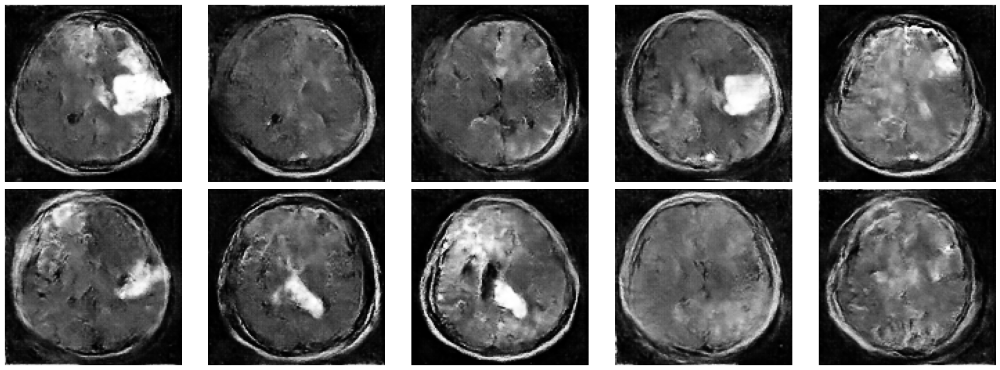

  0%|          | 0/2000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 25ms/step


  0%|          | 1/2000 [00:00<08:03,  4.13it/s]

1/1 [==============================] - 0s 46ms/step


  0%|          | 2/2000 [00:00<08:50,  3.77it/s]

1/1 [==============================] - 0s 39ms/step


  0%|          | 3/2000 [00:00<08:43,  3.82it/s]

1/1 [==============================] - 0s 34ms/step


  0%|          | 4/2000 [00:01<08:40,  3.84it/s]

1/1 [==============================] - 0s 28ms/step


  0%|          | 5/2000 [00:01<08:37,  3.86it/s]

1/1 [==============================] - 0s 32ms/step


  0%|          | 6/2000 [00:01<08:36,  3.86it/s]

1/1 [==============================] - 0s 40ms/step


  0%|          | 7/2000 [00:01<08:16,  4.02it/s]

1/1 [==============================] - 0s 37ms/step


  0%|          | 8/2000 [00:02<08:30,  3.91it/s]

1/1 [==============================] - 0s 38ms/step


  0%|          | 9/2000 [00:02<08:04,  4.11it/s]

1/1 [==============================] - 0s 38ms/step


  0%|          | 10/2000 [00:02<08:07,  4.08it/s]

1/1 [==============================] - 0s 37ms/step


  1%|          | 11/2000 [00:02<08:12,  4.04it/s]

1/1 [==============================] - 0s 35ms/step


  1%|          | 12/2000 [00:03<08:27,  3.92it/s]

1/1 [==============================] - 0s 38ms/step


  1%|          | 13/2000 [00:03<07:59,  4.14it/s]

1/1 [==============================] - 0s 31ms/step


  1%|          | 14/2000 [00:03<07:41,  4.30it/s]

1/1 [==============================] - 0s 27ms/step


  1%|          | 15/2000 [00:03<07:22,  4.49it/s]

1/1 [==============================] - 0s 28ms/step


  1%|          | 16/2000 [00:03<07:23,  4.47it/s]

1/1 [==============================] - 0s 53ms/step


  1%|          | 17/2000 [00:04<07:22,  4.48it/s]

1/1 [==============================] - 0s 31ms/step


  1%|          | 18/2000 [00:04<07:02,  4.69it/s]

1/1 [==============================] - 0s 29ms/step


  1%|          | 19/2000 [00:04<07:22,  4.47it/s]

1/1 [==============================] - 0s 29ms/step


  1%|          | 20/2000 [00:04<07:31,  4.39it/s]

1/1 [==============================] - 0s 38ms/step


  1%|          | 21/2000 [00:05<07:33,  4.36it/s]

1/1 [==============================] - 0s 31ms/step


  1%|          | 22/2000 [00:05<07:14,  4.55it/s]

1/1 [==============================] - 0s 37ms/step


  1%|          | 23/2000 [00:05<07:10,  4.59it/s]

1/1 [==============================] - 0s 34ms/step


  1%|          | 24/2000 [00:05<07:33,  4.36it/s]

1/1 [==============================] - 0s 43ms/step


  1%|▏         | 25/2000 [00:05<07:40,  4.29it/s]

1/1 [==============================] - 0s 26ms/step


  1%|▏         | 26/2000 [00:06<07:11,  4.57it/s]

1/1 [==============================] - 0s 25ms/step


  1%|▏         | 27/2000 [00:06<06:57,  4.72it/s]

1/1 [==============================] - 0s 28ms/step


  1%|▏         | 28/2000 [00:06<06:51,  4.79it/s]

1/1 [==============================] - 0s 27ms/step


  1%|▏         | 29/2000 [00:06<06:46,  4.85it/s]

1/1 [==============================] - 0s 34ms/step


  2%|▏         | 30/2000 [00:06<06:47,  4.83it/s]

1/1 [==============================] - 0s 26ms/step


  2%|▏         | 31/2000 [00:07<07:00,  4.69it/s]

1/1 [==============================] - 0s 25ms/step


  2%|▏         | 32/2000 [00:07<07:17,  4.50it/s]

1/1 [==============================] - 0s 25ms/step


  2%|▏         | 33/2000 [00:07<06:54,  4.75it/s]

1/1 [==============================] - 0s 36ms/step


  2%|▏         | 34/2000 [00:07<07:05,  4.62it/s]

1/1 [==============================] - 0s 26ms/step


  2%|▏         | 35/2000 [00:07<06:47,  4.82it/s]

1/1 [==============================] - 0s 28ms/step


  2%|▏         | 36/2000 [00:08<06:43,  4.86it/s]

1/1 [==============================] - 0s 23ms/step


  2%|▏         | 37/2000 [00:08<06:50,  4.78it/s]

1/1 [==============================] - 0s 28ms/step


  2%|▏         | 38/2000 [00:08<06:54,  4.74it/s]

1/1 [==============================] - 0s 28ms/step


  2%|▏         | 39/2000 [00:08<07:01,  4.65it/s]

1/1 [==============================] - 0s 26ms/step


  2%|▏         | 40/2000 [00:09<06:49,  4.78it/s]

1/1 [==============================] - 0s 25ms/step


  2%|▏         | 41/2000 [00:09<06:54,  4.73it/s]

1/1 [==============================] - 0s 25ms/step


  2%|▏         | 42/2000 [00:09<06:50,  4.77it/s]

1/1 [==============================] - 0s 31ms/step


  2%|▏         | 43/2000 [00:09<07:06,  4.58it/s]

1/1 [==============================] - 0s 28ms/step


  2%|▏         | 44/2000 [00:09<06:55,  4.71it/s]

1/1 [==============================] - 0s 31ms/step


  2%|▏         | 45/2000 [00:10<06:33,  4.97it/s]

1/1 [==============================] - 0s 25ms/step


  2%|▏         | 46/2000 [00:10<06:21,  5.12it/s]

1/1 [==============================] - 0s 25ms/step


  2%|▏         | 47/2000 [00:10<06:19,  5.14it/s]

1/1 [==============================] - 0s 25ms/step


  2%|▏         | 48/2000 [00:10<06:28,  5.02it/s]

1/1 [==============================] - 0s 29ms/step


  2%|▏         | 49/2000 [00:10<06:46,  4.80it/s]

1/1 [==============================] - 0s 34ms/step


  2%|▎         | 50/2000 [00:11<07:03,  4.61it/s]

1/1 [==============================] - 0s 25ms/step


  3%|▎         | 51/2000 [00:11<06:47,  4.78it/s]

1/1 [==============================] - 0s 24ms/step


  3%|▎         | 52/2000 [00:11<06:37,  4.90it/s]

1/1 [==============================] - 0s 26ms/step


  3%|▎         | 53/2000 [00:11<06:42,  4.84it/s]

1/1 [==============================] - 0s 28ms/step


  3%|▎         | 54/2000 [00:11<06:39,  4.87it/s]

1/1 [==============================] - 0s 25ms/step


  3%|▎         | 55/2000 [00:12<06:57,  4.66it/s]

1/1 [==============================] - 0s 25ms/step


  3%|▎         | 56/2000 [00:12<06:48,  4.76it/s]

1/1 [==============================] - 0s 25ms/step


  3%|▎         | 57/2000 [00:12<07:10,  4.51it/s]

1/1 [==============================] - 0s 28ms/step


  3%|▎         | 58/2000 [00:12<07:02,  4.59it/s]

1/1 [==============================] - 0s 26ms/step


  3%|▎         | 59/2000 [00:13<06:46,  4.78it/s]

1/1 [==============================] - 0s 31ms/step


  3%|▎         | 60/2000 [00:13<07:00,  4.61it/s]

1/1 [==============================] - 0s 36ms/step


  3%|▎         | 61/2000 [00:13<07:15,  4.45it/s]

1/1 [==============================] - 0s 29ms/step


  3%|▎         | 62/2000 [00:13<07:40,  4.21it/s]

1/1 [==============================] - 0s 58ms/step


  3%|▎         | 63/2000 [00:14<07:53,  4.09it/s]

1/1 [==============================] - 0s 50ms/step


  3%|▎         | 64/2000 [00:14<08:00,  4.03it/s]

1/1 [==============================] - 0s 25ms/step


  3%|▎         | 65/2000 [00:14<08:07,  3.97it/s]

1/1 [==============================] - 0s 34ms/step


  3%|▎         | 66/2000 [00:14<07:52,  4.09it/s]

1/1 [==============================] - 0s 53ms/step


  3%|▎         | 67/2000 [00:15<07:53,  4.08it/s]

1/1 [==============================] - 0s 62ms/step


  3%|▎         | 68/2000 [00:15<08:08,  3.96it/s]

1/1 [==============================] - 0s 43ms/step


  3%|▎         | 69/2000 [00:15<08:03,  3.99it/s]

1/1 [==============================] - 0s 53ms/step


  4%|▎         | 70/2000 [00:15<08:15,  3.90it/s]

1/1 [==============================] - 0s 57ms/step


  4%|▎         | 71/2000 [00:16<08:40,  3.70it/s]

1/1 [==============================] - 0s 35ms/step


  4%|▎         | 72/2000 [00:16<08:30,  3.78it/s]

1/1 [==============================] - 0s 50ms/step


  4%|▎         | 73/2000 [00:16<08:13,  3.91it/s]

1/1 [==============================] - 0s 27ms/step


  4%|▎         | 74/2000 [00:16<07:56,  4.04it/s]

1/1 [==============================] - 0s 43ms/step


  4%|▍         | 75/2000 [00:17<07:56,  4.04it/s]

1/1 [==============================] - 0s 26ms/step


  4%|▍         | 76/2000 [00:17<07:20,  4.37it/s]

1/1 [==============================] - 0s 29ms/step


  4%|▍         | 77/2000 [00:17<07:23,  4.33it/s]

1/1 [==============================] - 0s 29ms/step


  4%|▍         | 78/2000 [00:17<07:10,  4.46it/s]

1/1 [==============================] - 0s 26ms/step


  4%|▍         | 79/2000 [00:17<06:54,  4.64it/s]

1/1 [==============================] - 0s 27ms/step


  4%|▍         | 80/2000 [00:18<07:04,  4.52it/s]

1/1 [==============================] - 0s 25ms/step


  4%|▍         | 81/2000 [00:18<06:53,  4.64it/s]

1/1 [==============================] - 0s 36ms/step


  4%|▍         | 82/2000 [00:18<07:06,  4.50it/s]

1/1 [==============================] - 0s 24ms/step


  4%|▍         | 83/2000 [00:18<07:00,  4.55it/s]

1/1 [==============================] - 0s 25ms/step


  4%|▍         | 84/2000 [00:19<07:10,  4.46it/s]

1/1 [==============================] - 0s 26ms/step


  4%|▍         | 85/2000 [00:19<06:49,  4.68it/s]

1/1 [==============================] - 0s 27ms/step


  4%|▍         | 86/2000 [00:19<06:30,  4.91it/s]

1/1 [==============================] - 0s 24ms/step


  4%|▍         | 87/2000 [00:19<06:38,  4.81it/s]

1/1 [==============================] - 0s 26ms/step


  4%|▍         | 88/2000 [00:19<06:41,  4.76it/s]

1/1 [==============================] - 0s 25ms/step


  4%|▍         | 89/2000 [00:20<06:44,  4.73it/s]

1/1 [==============================] - 0s 24ms/step


  4%|▍         | 90/2000 [00:20<06:36,  4.82it/s]

1/1 [==============================] - 0s 25ms/step


  5%|▍         | 91/2000 [00:20<06:31,  4.87it/s]

1/1 [==============================] - 0s 26ms/step


  5%|▍         | 92/2000 [00:20<06:46,  4.69it/s]

1/1 [==============================] - 0s 27ms/step


  5%|▍         | 93/2000 [00:20<06:25,  4.95it/s]

1/1 [==============================] - 0s 28ms/step


  5%|▍         | 94/2000 [00:21<06:22,  4.99it/s]

1/1 [==============================] - 0s 26ms/step


  5%|▍         | 95/2000 [00:21<06:13,  5.10it/s]

1/1 [==============================] - 0s 26ms/step


  5%|▍         | 96/2000 [00:21<06:17,  5.04it/s]

1/1 [==============================] - 0s 28ms/step


  5%|▍         | 97/2000 [00:21<06:21,  4.98it/s]

1/1 [==============================] - 0s 25ms/step


  5%|▍         | 98/2000 [00:21<06:41,  4.74it/s]

1/1 [==============================] - 0s 28ms/step


  5%|▍         | 99/2000 [00:22<06:28,  4.90it/s]

1/1 [==============================] - 0s 24ms/step


  5%|▌         | 100/2000 [00:22<06:35,  4.81it/s]

1/1 [==============================] - 0s 25ms/step


  5%|▌         | 101/2000 [00:22<06:38,  4.77it/s]

1/1 [==============================] - 0s 27ms/step


  5%|▌         | 102/2000 [00:22<06:52,  4.60it/s]

1/1 [==============================] - 0s 30ms/step


  5%|▌         | 103/2000 [00:22<06:59,  4.52it/s]

1/1 [==============================] - 0s 27ms/step


  5%|▌         | 104/2000 [00:23<06:45,  4.68it/s]

1/1 [==============================] - 0s 24ms/step


  5%|▌         | 105/2000 [00:23<06:36,  4.78it/s]

1/1 [==============================] - 0s 25ms/step


  5%|▌         | 106/2000 [00:23<06:53,  4.58it/s]

1/1 [==============================] - 0s 24ms/step


  5%|▌         | 107/2000 [00:23<06:52,  4.59it/s]

1/1 [==============================] - 0s 26ms/step


  5%|▌         | 108/2000 [00:23<06:42,  4.71it/s]

1/1 [==============================] - 0s 26ms/step


  5%|▌         | 109/2000 [00:24<06:31,  4.83it/s]

1/1 [==============================] - 0s 26ms/step


  6%|▌         | 110/2000 [00:24<06:51,  4.60it/s]

1/1 [==============================] - 0s 26ms/step


  6%|▌         | 111/2000 [00:24<06:50,  4.60it/s]

1/1 [==============================] - 0s 29ms/step


  6%|▌         | 112/2000 [00:25<11:24,  2.76it/s]

1/1 [==============================] - 0s 30ms/step


  6%|▌         | 113/2000 [00:25<10:06,  3.11it/s]

1/1 [==============================] - 0s 30ms/step


  6%|▌         | 114/2000 [00:25<09:01,  3.48it/s]

1/1 [==============================] - 0s 35ms/step


  6%|▌         | 115/2000 [00:25<08:16,  3.80it/s]

1/1 [==============================] - 0s 29ms/step


  6%|▌         | 116/2000 [00:26<07:36,  4.13it/s]

1/1 [==============================] - 0s 29ms/step


  6%|▌         | 117/2000 [00:26<07:36,  4.13it/s]

1/1 [==============================] - 0s 32ms/step


  6%|▌         | 118/2000 [00:26<07:41,  4.08it/s]

1/1 [==============================] - 0s 29ms/step


  6%|▌         | 119/2000 [00:26<07:09,  4.38it/s]

1/1 [==============================] - 0s 43ms/step


  6%|▌         | 120/2000 [00:27<07:22,  4.25it/s]

1/1 [==============================] - 0s 45ms/step


  6%|▌         | 121/2000 [00:27<07:41,  4.08it/s]

1/1 [==============================] - 0s 41ms/step


  6%|▌         | 122/2000 [00:27<07:33,  4.15it/s]

1/1 [==============================] - 0s 49ms/step


  6%|▌         | 123/2000 [00:27<07:31,  4.16it/s]

1/1 [==============================] - 0s 37ms/step


  6%|▌         | 124/2000 [00:28<07:25,  4.21it/s]

1/1 [==============================] - 0s 57ms/step


  6%|▋         | 125/2000 [00:28<07:42,  4.05it/s]

1/1 [==============================] - 0s 38ms/step


  6%|▋         | 126/2000 [00:28<07:32,  4.15it/s]

1/1 [==============================] - 0s 33ms/step


  6%|▋         | 127/2000 [00:28<07:33,  4.13it/s]

1/1 [==============================] - 0s 34ms/step


  6%|▋         | 128/2000 [00:29<07:48,  4.00it/s]

1/1 [==============================] - 0s 29ms/step


  6%|▋         | 129/2000 [00:29<07:36,  4.10it/s]

1/1 [==============================] - 0s 47ms/step


  6%|▋         | 130/2000 [00:29<07:49,  3.98it/s]

1/1 [==============================] - 0s 37ms/step


  7%|▋         | 131/2000 [00:29<07:52,  3.95it/s]

1/1 [==============================] - 0s 55ms/step


  7%|▋         | 132/2000 [00:30<07:54,  3.94it/s]

1/1 [==============================] - 0s 32ms/step


  7%|▋         | 133/2000 [00:30<07:36,  4.09it/s]

1/1 [==============================] - 0s 44ms/step


  7%|▋         | 134/2000 [00:30<07:34,  4.10it/s]

1/1 [==============================] - 0s 32ms/step


  7%|▋         | 135/2000 [00:30<07:44,  4.01it/s]

1/1 [==============================] - 0s 45ms/step


  7%|▋         | 136/2000 [00:31<07:33,  4.11it/s]

1/1 [==============================] - 0s 37ms/step


  7%|▋         | 137/2000 [00:31<07:47,  3.99it/s]

1/1 [==============================] - 0s 38ms/step


  7%|▋         | 138/2000 [00:31<07:49,  3.97it/s]

1/1 [==============================] - 0s 28ms/step


  7%|▋         | 139/2000 [00:31<07:15,  4.27it/s]

1/1 [==============================] - 0s 39ms/step


  7%|▋         | 140/2000 [00:31<06:59,  4.43it/s]

1/1 [==============================] - 0s 32ms/step


  7%|▋         | 141/2000 [00:32<06:47,  4.56it/s]

1/1 [==============================] - 0s 29ms/step


  7%|▋         | 142/2000 [00:32<06:37,  4.68it/s]

1/1 [==============================] - 0s 27ms/step


  7%|▋         | 143/2000 [00:32<06:26,  4.81it/s]

1/1 [==============================] - 0s 32ms/step


  7%|▋         | 144/2000 [00:32<06:15,  4.94it/s]

1/1 [==============================] - 0s 28ms/step


  7%|▋         | 145/2000 [00:32<06:23,  4.84it/s]

1/1 [==============================] - 0s 27ms/step


  7%|▋         | 146/2000 [00:33<06:20,  4.88it/s]

1/1 [==============================] - 0s 30ms/step


  7%|▋         | 147/2000 [00:33<06:23,  4.83it/s]

1/1 [==============================] - 0s 33ms/step


  7%|▋         | 148/2000 [00:33<06:08,  5.02it/s]

1/1 [==============================] - 0s 27ms/step


  7%|▋         | 149/2000 [00:33<06:07,  5.04it/s]

1/1 [==============================] - 0s 34ms/step


  8%|▊         | 150/2000 [00:33<06:04,  5.07it/s]

1/1 [==============================] - 0s 29ms/step


  8%|▊         | 151/2000 [00:34<06:05,  5.06it/s]

1/1 [==============================] - 0s 29ms/step


  8%|▊         | 152/2000 [00:34<05:53,  5.22it/s]

1/1 [==============================] - 0s 29ms/step


  8%|▊         | 153/2000 [00:34<05:36,  5.50it/s]

1/1 [==============================] - 0s 28ms/step


  8%|▊         | 154/2000 [00:34<05:26,  5.66it/s]

1/1 [==============================] - 0s 29ms/step


  8%|▊         | 155/2000 [00:34<05:26,  5.65it/s]

1/1 [==============================] - 0s 27ms/step


  8%|▊         | 156/2000 [00:35<05:44,  5.35it/s]

1/1 [==============================] - 0s 32ms/step


  8%|▊         | 157/2000 [00:35<05:52,  5.23it/s]

1/1 [==============================] - 0s 27ms/step


  8%|▊         | 158/2000 [00:35<05:55,  5.18it/s]

1/1 [==============================] - 0s 32ms/step


  8%|▊         | 159/2000 [00:35<05:44,  5.34it/s]

1/1 [==============================] - 0s 28ms/step


  8%|▊         | 160/2000 [00:35<05:32,  5.53it/s]

1/1 [==============================] - 0s 27ms/step


  8%|▊         | 161/2000 [00:36<05:48,  5.28it/s]

1/1 [==============================] - 0s 28ms/step


  8%|▊         | 162/2000 [00:36<05:46,  5.30it/s]

1/1 [==============================] - 0s 29ms/step


  8%|▊         | 163/2000 [00:36<05:52,  5.21it/s]

1/1 [==============================] - 0s 31ms/step


  8%|▊         | 164/2000 [00:36<06:00,  5.09it/s]

1/1 [==============================] - 0s 28ms/step


  8%|▊         | 165/2000 [00:36<06:08,  4.98it/s]

1/1 [==============================] - 0s 29ms/step


  8%|▊         | 166/2000 [00:36<05:57,  5.13it/s]

1/1 [==============================] - 0s 28ms/step


  8%|▊         | 167/2000 [00:37<06:14,  4.90it/s]

1/1 [==============================] - 0s 27ms/step


  8%|▊         | 168/2000 [00:37<06:35,  4.63it/s]

1/1 [==============================] - 0s 27ms/step


  8%|▊         | 169/2000 [00:37<06:23,  4.78it/s]

1/1 [==============================] - 0s 28ms/step


  8%|▊         | 170/2000 [00:37<06:26,  4.73it/s]

1/1 [==============================] - 0s 27ms/step


  9%|▊         | 171/2000 [00:38<06:41,  4.56it/s]

1/1 [==============================] - 0s 27ms/step


  9%|▊         | 172/2000 [00:38<06:41,  4.55it/s]

1/1 [==============================] - 0s 28ms/step


  9%|▊         | 173/2000 [00:38<06:26,  4.72it/s]

1/1 [==============================] - 0s 28ms/step


  9%|▊         | 174/2000 [00:38<06:50,  4.44it/s]

1/1 [==============================] - 0s 28ms/step


  9%|▉         | 175/2000 [00:38<06:43,  4.52it/s]

1/1 [==============================] - 0s 30ms/step


  9%|▉         | 176/2000 [00:39<06:52,  4.43it/s]

1/1 [==============================] - 0s 27ms/step


  9%|▉         | 177/2000 [00:39<06:43,  4.52it/s]

1/1 [==============================] - 0s 31ms/step


  9%|▉         | 178/2000 [00:39<06:46,  4.48it/s]

1/1 [==============================] - 0s 27ms/step


  9%|▉         | 179/2000 [00:39<06:51,  4.43it/s]

1/1 [==============================] - 0s 29ms/step


  9%|▉         | 180/2000 [00:40<06:47,  4.46it/s]

1/1 [==============================] - 0s 27ms/step


  9%|▉         | 181/2000 [00:40<06:37,  4.58it/s]

1/1 [==============================] - 0s 27ms/step


  9%|▉         | 182/2000 [00:40<06:36,  4.58it/s]

1/1 [==============================] - 0s 30ms/step


  9%|▉         | 183/2000 [00:40<06:51,  4.41it/s]

1/1 [==============================] - 0s 28ms/step


  9%|▉         | 184/2000 [00:40<06:38,  4.55it/s]

1/1 [==============================] - 0s 39ms/step


  9%|▉         | 185/2000 [00:41<06:34,  4.60it/s]

1/1 [==============================] - 0s 30ms/step


  9%|▉         | 186/2000 [00:41<06:27,  4.68it/s]

1/1 [==============================] - 0s 32ms/step


  9%|▉         | 187/2000 [00:41<06:26,  4.70it/s]

1/1 [==============================] - 0s 33ms/step


  9%|▉         | 188/2000 [00:41<06:52,  4.39it/s]

1/1 [==============================] - 0s 57ms/step


  9%|▉         | 189/2000 [00:42<07:21,  4.10it/s]

1/1 [==============================] - 0s 43ms/step


 10%|▉         | 190/2000 [00:42<07:31,  4.01it/s]

1/1 [==============================] - 0s 35ms/step


 10%|▉         | 191/2000 [00:42<07:23,  4.08it/s]

1/1 [==============================] - 0s 44ms/step


 10%|▉         | 192/2000 [00:42<07:35,  3.97it/s]

1/1 [==============================] - 0s 42ms/step


 10%|▉         | 193/2000 [00:43<07:52,  3.82it/s]

1/1 [==============================] - 0s 28ms/step


 10%|▉         | 194/2000 [00:43<07:26,  4.04it/s]

1/1 [==============================] - 0s 61ms/step


 10%|▉         | 195/2000 [00:43<07:40,  3.92it/s]

1/1 [==============================] - 0s 44ms/step


 10%|▉         | 196/2000 [00:43<07:58,  3.77it/s]

1/1 [==============================] - 0s 33ms/step


 10%|▉         | 197/2000 [00:44<07:39,  3.92it/s]

1/1 [==============================] - 0s 39ms/step


 10%|▉         | 198/2000 [00:44<07:47,  3.85it/s]

1/1 [==============================] - 0s 36ms/step


 10%|▉         | 199/2000 [00:44<07:26,  4.03it/s]

1/1 [==============================] - 0s 59ms/step


 10%|█         | 200/2000 [00:45<07:50,  3.82it/s]

1/1 [==============================] - 0s 34ms/step


 10%|█         | 201/2000 [00:45<07:38,  3.92it/s]

1/1 [==============================] - 0s 39ms/step


 10%|█         | 202/2000 [00:45<07:45,  3.86it/s]

1/1 [==============================] - 0s 62ms/step


 10%|█         | 203/2000 [00:45<07:57,  3.77it/s]

1/1 [==============================] - 0s 27ms/step


 10%|█         | 204/2000 [00:45<07:18,  4.10it/s]

1/1 [==============================] - 0s 27ms/step


 10%|█         | 205/2000 [00:46<06:55,  4.32it/s]

1/1 [==============================] - 0s 25ms/step


 10%|█         | 206/2000 [00:46<06:56,  4.31it/s]

1/1 [==============================] - 0s 26ms/step


 10%|█         | 207/2000 [00:46<06:55,  4.32it/s]

1/1 [==============================] - 0s 30ms/step


 10%|█         | 208/2000 [00:46<06:48,  4.38it/s]

1/1 [==============================] - 0s 27ms/step


 10%|█         | 209/2000 [00:47<07:07,  4.19it/s]

1/1 [==============================] - 0s 33ms/step


 10%|█         | 210/2000 [00:47<06:53,  4.32it/s]

1/1 [==============================] - 0s 28ms/step


 11%|█         | 211/2000 [00:47<06:30,  4.58it/s]

1/1 [==============================] - 0s 30ms/step


 11%|█         | 212/2000 [00:47<06:25,  4.64it/s]

1/1 [==============================] - 0s 28ms/step


 11%|█         | 213/2000 [00:47<06:22,  4.68it/s]

1/1 [==============================] - 0s 28ms/step


 11%|█         | 214/2000 [00:48<06:16,  4.74it/s]

1/1 [==============================] - 0s 26ms/step


 11%|█         | 215/2000 [00:48<06:01,  4.94it/s]

1/1 [==============================] - 0s 28ms/step


 11%|█         | 216/2000 [00:48<06:12,  4.79it/s]

1/1 [==============================] - 0s 26ms/step


 11%|█         | 217/2000 [00:48<05:56,  5.00it/s]

1/1 [==============================] - 0s 26ms/step


 11%|█         | 218/2000 [00:48<06:15,  4.75it/s]

1/1 [==============================] - 0s 28ms/step


 11%|█         | 219/2000 [00:49<06:32,  4.54it/s]

1/1 [==============================] - 0s 27ms/step


 11%|█         | 220/2000 [00:49<06:25,  4.61it/s]

1/1 [==============================] - 0s 27ms/step


 11%|█         | 221/2000 [00:49<06:42,  4.42it/s]

1/1 [==============================] - 0s 27ms/step


 11%|█         | 222/2000 [00:49<06:27,  4.58it/s]

1/1 [==============================] - 0s 27ms/step


 11%|█         | 223/2000 [00:50<06:19,  4.68it/s]

1/1 [==============================] - 0s 26ms/step


 11%|█         | 224/2000 [00:50<06:12,  4.77it/s]

1/1 [==============================] - 0s 28ms/step


 11%|█▏        | 225/2000 [00:50<06:30,  4.54it/s]

1/1 [==============================] - 0s 29ms/step


 11%|█▏        | 226/2000 [00:50<06:28,  4.56it/s]

1/1 [==============================] - 0s 41ms/step


 11%|█▏        | 227/2000 [00:51<06:49,  4.33it/s]

1/1 [==============================] - 0s 32ms/step


 11%|█▏        | 228/2000 [00:51<06:56,  4.25it/s]

1/1 [==============================] - 0s 26ms/step


 11%|█▏        | 229/2000 [00:51<06:42,  4.40it/s]

1/1 [==============================] - 0s 35ms/step


 12%|█▏        | 230/2000 [00:51<06:35,  4.48it/s]

1/1 [==============================] - 0s 26ms/step


 12%|█▏        | 231/2000 [00:51<06:25,  4.59it/s]

1/1 [==============================] - 0s 27ms/step


 12%|█▏        | 232/2000 [00:52<06:34,  4.48it/s]

1/1 [==============================] - 0s 26ms/step


 12%|█▏        | 233/2000 [00:52<06:33,  4.50it/s]

1/1 [==============================] - 0s 29ms/step


 12%|█▏        | 234/2000 [00:52<06:34,  4.48it/s]

1/1 [==============================] - 0s 27ms/step


 12%|█▏        | 235/2000 [00:52<06:27,  4.56it/s]

1/1 [==============================] - 0s 44ms/step


 12%|█▏        | 236/2000 [00:52<06:29,  4.53it/s]

1/1 [==============================] - 0s 30ms/step


 12%|█▏        | 237/2000 [00:53<06:39,  4.41it/s]

1/1 [==============================] - 0s 26ms/step


 12%|█▏        | 238/2000 [00:53<06:25,  4.57it/s]

1/1 [==============================] - 0s 27ms/step


 12%|█▏        | 239/2000 [00:53<06:16,  4.67it/s]

1/1 [==============================] - 0s 28ms/step


 12%|█▏        | 240/2000 [00:53<06:28,  4.53it/s]

1/1 [==============================] - 0s 28ms/step


 12%|█▏        | 241/2000 [00:54<06:25,  4.56it/s]

1/1 [==============================] - 0s 26ms/step


 12%|█▏        | 242/2000 [00:54<06:12,  4.73it/s]

1/1 [==============================] - 0s 27ms/step


 12%|█▏        | 243/2000 [00:54<06:04,  4.82it/s]

1/1 [==============================] - 0s 33ms/step


 12%|█▏        | 244/2000 [00:54<06:00,  4.87it/s]

1/1 [==============================] - 0s 39ms/step


 12%|█▏        | 245/2000 [00:54<06:19,  4.62it/s]

1/1 [==============================] - 0s 30ms/step


 12%|█▏        | 246/2000 [00:55<06:31,  4.48it/s]

1/1 [==============================] - 0s 30ms/step


 12%|█▏        | 247/2000 [00:55<06:25,  4.54it/s]

1/1 [==============================] - 0s 33ms/step


 12%|█▏        | 248/2000 [00:55<06:19,  4.62it/s]

1/1 [==============================] - 0s 38ms/step


 12%|█▏        | 249/2000 [00:55<06:48,  4.29it/s]

1/1 [==============================] - 0s 48ms/step


 12%|█▎        | 250/2000 [00:56<06:48,  4.28it/s]

1/1 [==============================] - 0s 54ms/step


 13%|█▎        | 251/2000 [00:56<07:02,  4.14it/s]

1/1 [==============================] - 0s 34ms/step


 13%|█▎        | 252/2000 [00:56<06:53,  4.23it/s]

1/1 [==============================] - 0s 31ms/step


 13%|█▎        | 253/2000 [00:56<06:49,  4.27it/s]

1/1 [==============================] - 0s 32ms/step


 13%|█▎        | 254/2000 [00:57<06:51,  4.24it/s]

1/1 [==============================] - 0s 33ms/step


 13%|█▎        | 255/2000 [00:57<07:07,  4.08it/s]

1/1 [==============================] - 0s 32ms/step


 13%|█▎        | 256/2000 [00:57<06:53,  4.21it/s]

1/1 [==============================] - 0s 54ms/step


 13%|█▎        | 257/2000 [00:57<07:03,  4.11it/s]

1/1 [==============================] - 0s 45ms/step


 13%|█▎        | 258/2000 [00:58<07:17,  3.98it/s]

1/1 [==============================] - 0s 39ms/step


 13%|█▎        | 259/2000 [00:58<07:09,  4.06it/s]

1/1 [==============================] - 0s 32ms/step


 13%|█▎        | 260/2000 [00:58<07:02,  4.12it/s]

1/1 [==============================] - 0s 43ms/step


 13%|█▎        | 261/2000 [00:58<07:06,  4.08it/s]

1/1 [==============================] - 0s 29ms/step


 13%|█▎        | 262/2000 [00:58<06:49,  4.25it/s]

1/1 [==============================] - 0s 34ms/step


 13%|█▎        | 263/2000 [00:59<06:49,  4.25it/s]

1/1 [==============================] - 0s 35ms/step


 13%|█▎        | 264/2000 [00:59<07:08,  4.06it/s]

1/1 [==============================] - 0s 41ms/step


 13%|█▎        | 265/2000 [00:59<06:55,  4.18it/s]

1/1 [==============================] - 0s 34ms/step


 13%|█▎        | 266/2000 [00:59<06:48,  4.25it/s]

1/1 [==============================] - 0s 28ms/step


 13%|█▎        | 267/2000 [01:00<06:31,  4.43it/s]

1/1 [==============================] - 0s 26ms/step


 13%|█▎        | 268/2000 [01:00<06:29,  4.45it/s]

1/1 [==============================] - 0s 27ms/step


 13%|█▎        | 269/2000 [01:00<06:32,  4.40it/s]

1/1 [==============================] - 0s 27ms/step


 14%|█▎        | 270/2000 [01:00<06:30,  4.43it/s]

1/1 [==============================] - 0s 36ms/step


 14%|█▎        | 271/2000 [01:01<06:21,  4.53it/s]

1/1 [==============================] - 0s 27ms/step


 14%|█▎        | 272/2000 [01:01<06:31,  4.42it/s]

1/1 [==============================] - 0s 29ms/step


 14%|█▎        | 273/2000 [01:01<06:38,  4.34it/s]

1/1 [==============================] - 0s 26ms/step


 14%|█▎        | 274/2000 [01:01<06:28,  4.44it/s]

1/1 [==============================] - 0s 27ms/step


 14%|█▍        | 275/2000 [01:01<06:15,  4.59it/s]

1/1 [==============================] - 0s 26ms/step


 14%|█▍        | 276/2000 [01:02<06:00,  4.78it/s]

1/1 [==============================] - 0s 29ms/step


 14%|█▍        | 277/2000 [01:02<06:18,  4.55it/s]

1/1 [==============================] - 0s 28ms/step


 14%|█▍        | 278/2000 [01:02<06:19,  4.54it/s]

1/1 [==============================] - 0s 28ms/step


 14%|█▍        | 279/2000 [01:02<06:33,  4.38it/s]

1/1 [==============================] - 0s 31ms/step


 14%|█▍        | 280/2000 [01:03<06:39,  4.31it/s]

1/1 [==============================] - 0s 28ms/step


 14%|█▍        | 281/2000 [01:03<06:46,  4.23it/s]

1/1 [==============================] - 0s 27ms/step


 14%|█▍        | 282/2000 [01:03<06:27,  4.44it/s]

1/1 [==============================] - 0s 29ms/step


 14%|█▍        | 283/2000 [01:03<06:22,  4.49it/s]

1/1 [==============================] - 0s 26ms/step


 14%|█▍        | 284/2000 [01:03<06:31,  4.38it/s]

1/1 [==============================] - 0s 26ms/step


 14%|█▍        | 285/2000 [01:04<06:47,  4.21it/s]

1/1 [==============================] - 0s 31ms/step


 14%|█▍        | 286/2000 [01:04<06:31,  4.37it/s]

1/1 [==============================] - 0s 34ms/step


 14%|█▍        | 287/2000 [01:04<06:13,  4.58it/s]

1/1 [==============================] - 0s 27ms/step


 14%|█▍        | 288/2000 [01:04<06:06,  4.67it/s]

1/1 [==============================] - 0s 32ms/step


 14%|█▍        | 289/2000 [01:05<06:08,  4.64it/s]

1/1 [==============================] - 0s 26ms/step


 14%|█▍        | 290/2000 [01:05<06:13,  4.58it/s]

1/1 [==============================] - 0s 31ms/step


 15%|█▍        | 291/2000 [01:05<05:55,  4.81it/s]

1/1 [==============================] - 0s 27ms/step


 15%|█▍        | 292/2000 [01:05<06:03,  4.70it/s]

1/1 [==============================] - 0s 26ms/step


 15%|█▍        | 293/2000 [01:05<05:57,  4.78it/s]

1/1 [==============================] - 0s 27ms/step


 15%|█▍        | 294/2000 [01:06<05:51,  4.86it/s]

1/1 [==============================] - 0s 32ms/step


 15%|█▍        | 295/2000 [01:06<06:15,  4.54it/s]

1/1 [==============================] - 0s 26ms/step


 15%|█▍        | 296/2000 [01:06<06:16,  4.52it/s]

1/1 [==============================] - 0s 30ms/step


 15%|█▍        | 297/2000 [01:06<06:27,  4.39it/s]

1/1 [==============================] - 0s 26ms/step


 15%|█▍        | 298/2000 [01:07<06:13,  4.55it/s]

1/1 [==============================] - 0s 28ms/step


 15%|█▍        | 299/2000 [01:07<06:10,  4.59it/s]

1/1 [==============================] - 0s 28ms/step


 15%|█▌        | 300/2000 [01:07<06:21,  4.45it/s]

1/1 [==============================] - 0s 31ms/step


 15%|█▌        | 301/2000 [01:07<06:29,  4.37it/s]

1/1 [==============================] - 0s 29ms/step


 15%|█▌        | 302/2000 [01:07<06:21,  4.45it/s]

1/1 [==============================] - 0s 37ms/step


 15%|█▌        | 303/2000 [01:08<06:35,  4.29it/s]

1/1 [==============================] - 0s 35ms/step


 15%|█▌        | 304/2000 [01:08<06:38,  4.26it/s]

1/1 [==============================] - 0s 30ms/step


 15%|█▌        | 305/2000 [01:08<06:10,  4.58it/s]

1/1 [==============================] - 0s 27ms/step


 15%|█▌        | 306/2000 [01:08<06:26,  4.38it/s]

1/1 [==============================] - 0s 25ms/step


 15%|█▌        | 307/2000 [01:09<06:32,  4.31it/s]

1/1 [==============================] - 0s 26ms/step


 15%|█▌        | 308/2000 [01:09<06:46,  4.17it/s]

1/1 [==============================] - 0s 34ms/step


 15%|█▌        | 309/2000 [01:09<06:35,  4.27it/s]

1/1 [==============================] - 0s 28ms/step


 16%|█▌        | 310/2000 [01:09<06:20,  4.44it/s]

1/1 [==============================] - 0s 36ms/step


 16%|█▌        | 311/2000 [01:10<06:42,  4.20it/s]

1/1 [==============================] - 0s 39ms/step


 16%|█▌        | 312/2000 [01:10<06:51,  4.10it/s]

1/1 [==============================] - 0s 38ms/step


 16%|█▌        | 313/2000 [01:10<06:38,  4.23it/s]

1/1 [==============================] - 0s 33ms/step


 16%|█▌        | 314/2000 [01:10<06:22,  4.40it/s]

1/1 [==============================] - 0s 54ms/step


 16%|█▌        | 315/2000 [01:11<06:47,  4.14it/s]

1/1 [==============================] - 0s 53ms/step


 16%|█▌        | 316/2000 [01:11<07:03,  3.98it/s]

1/1 [==============================] - 0s 55ms/step


 16%|█▌        | 317/2000 [01:11<07:25,  3.78it/s]

1/1 [==============================] - 0s 38ms/step


 16%|█▌        | 318/2000 [01:11<07:16,  3.85it/s]

1/1 [==============================] - 0s 38ms/step


 16%|█▌        | 319/2000 [01:12<07:10,  3.91it/s]

1/1 [==============================] - 0s 32ms/step


 16%|█▌        | 320/2000 [01:12<06:56,  4.04it/s]

1/1 [==============================] - 0s 40ms/step


 16%|█▌        | 321/2000 [01:12<06:51,  4.08it/s]

1/1 [==============================] - 0s 44ms/step


 16%|█▌        | 322/2000 [01:12<06:53,  4.06it/s]

1/1 [==============================] - 0s 61ms/step


 16%|█▌        | 323/2000 [01:13<06:51,  4.07it/s]

1/1 [==============================] - 0s 35ms/step


 16%|█▌        | 324/2000 [01:13<06:56,  4.02it/s]

1/1 [==============================] - 0s 61ms/step


 16%|█▋        | 325/2000 [01:13<07:03,  3.95it/s]

1/1 [==============================] - 0s 40ms/step


 16%|█▋        | 326/2000 [01:13<07:16,  3.84it/s]

1/1 [==============================] - 0s 26ms/step


 16%|█▋        | 327/2000 [01:14<06:34,  4.24it/s]

1/1 [==============================] - 0s 27ms/step


 16%|█▋        | 328/2000 [01:14<06:40,  4.17it/s]

1/1 [==============================] - 0s 26ms/step


 16%|█▋        | 329/2000 [01:14<06:19,  4.40it/s]

1/1 [==============================] - 0s 29ms/step


 16%|█▋        | 330/2000 [01:14<06:36,  4.21it/s]

1/1 [==============================] - 0s 28ms/step


 17%|█▋        | 331/2000 [01:14<06:19,  4.39it/s]

1/1 [==============================] - 0s 29ms/step


 17%|█▋        | 332/2000 [01:15<06:20,  4.38it/s]

1/1 [==============================] - 0s 28ms/step


 17%|█▋        | 333/2000 [01:15<06:06,  4.54it/s]

1/1 [==============================] - 0s 32ms/step


 17%|█▋        | 334/2000 [01:15<05:58,  4.64it/s]

1/1 [==============================] - 0s 28ms/step


 17%|█▋        | 335/2000 [01:15<05:55,  4.68it/s]

1/1 [==============================] - 0s 27ms/step


 17%|█▋        | 336/2000 [01:15<05:47,  4.78it/s]

1/1 [==============================] - 0s 25ms/step


 17%|█▋        | 337/2000 [01:16<05:38,  4.91it/s]

1/1 [==============================] - 0s 36ms/step


 17%|█▋        | 338/2000 [01:16<05:22,  5.16it/s]

1/1 [==============================] - 0s 26ms/step


 17%|█▋        | 339/2000 [01:16<05:21,  5.16it/s]

1/1 [==============================] - 0s 33ms/step


 17%|█▋        | 340/2000 [01:16<05:38,  4.90it/s]

1/1 [==============================] - 0s 29ms/step


 17%|█▋        | 341/2000 [01:16<05:36,  4.93it/s]

1/1 [==============================] - 0s 26ms/step


 17%|█▋        | 342/2000 [01:17<05:31,  5.01it/s]

1/1 [==============================] - 0s 27ms/step


 17%|█▋        | 343/2000 [01:17<05:29,  5.03it/s]

1/1 [==============================] - 0s 26ms/step


 17%|█▋        | 344/2000 [01:17<05:54,  4.67it/s]

1/1 [==============================] - 0s 27ms/step


 17%|█▋        | 345/2000 [01:17<05:56,  4.65it/s]

1/1 [==============================] - 0s 35ms/step


 17%|█▋        | 346/2000 [01:18<06:07,  4.50it/s]

1/1 [==============================] - 0s 27ms/step


 17%|█▋        | 347/2000 [01:18<06:11,  4.45it/s]

1/1 [==============================] - 0s 28ms/step


 17%|█▋        | 348/2000 [01:18<06:08,  4.49it/s]

1/1 [==============================] - 0s 27ms/step


 17%|█▋        | 349/2000 [01:18<06:19,  4.35it/s]

1/1 [==============================] - 0s 26ms/step


 18%|█▊        | 350/2000 [01:18<06:21,  4.33it/s]

1/1 [==============================] - 0s 27ms/step


 18%|█▊        | 351/2000 [01:19<06:23,  4.30it/s]

1/1 [==============================] - 0s 26ms/step


 18%|█▊        | 352/2000 [01:19<06:28,  4.25it/s]

1/1 [==============================] - 0s 27ms/step


 18%|█▊        | 353/2000 [01:19<06:09,  4.46it/s]

1/1 [==============================] - 0s 37ms/step


 18%|█▊        | 354/2000 [01:19<06:02,  4.54it/s]

1/1 [==============================] - 0s 26ms/step


 18%|█▊        | 355/2000 [01:20<05:51,  4.69it/s]

1/1 [==============================] - 0s 29ms/step


 18%|█▊        | 356/2000 [01:20<05:44,  4.77it/s]

1/1 [==============================] - 0s 28ms/step


 18%|█▊        | 357/2000 [01:20<05:37,  4.86it/s]

1/1 [==============================] - 0s 25ms/step


 18%|█▊        | 358/2000 [01:20<05:33,  4.93it/s]

1/1 [==============================] - 0s 35ms/step


 18%|█▊        | 359/2000 [01:20<05:57,  4.59it/s]

1/1 [==============================] - 0s 33ms/step


 18%|█▊        | 360/2000 [01:21<05:39,  4.83it/s]

1/1 [==============================] - 0s 25ms/step


 18%|█▊        | 361/2000 [01:21<05:57,  4.58it/s]

1/1 [==============================] - 0s 26ms/step


 18%|█▊        | 362/2000 [01:21<05:54,  4.62it/s]

1/1 [==============================] - 0s 29ms/step


 18%|█▊        | 363/2000 [01:21<05:47,  4.71it/s]

1/1 [==============================] - 0s 41ms/step


 18%|█▊        | 364/2000 [01:21<05:58,  4.56it/s]

1/1 [==============================] - 0s 27ms/step


 18%|█▊        | 365/2000 [01:22<05:48,  4.69it/s]

1/1 [==============================] - 0s 26ms/step


 18%|█▊        | 366/2000 [01:22<05:42,  4.77it/s]

1/1 [==============================] - 0s 26ms/step


 18%|█▊        | 367/2000 [01:22<05:46,  4.72it/s]

1/1 [==============================] - 0s 28ms/step


 18%|█▊        | 368/2000 [01:22<05:41,  4.78it/s]

1/1 [==============================] - 0s 36ms/step


 18%|█▊        | 369/2000 [01:23<05:43,  4.75it/s]

1/1 [==============================] - 0s 26ms/step


 18%|█▊        | 370/2000 [01:23<05:36,  4.85it/s]

1/1 [==============================] - 0s 27ms/step


 19%|█▊        | 371/2000 [01:23<05:39,  4.80it/s]

1/1 [==============================] - 0s 26ms/step


 19%|█▊        | 372/2000 [01:23<05:28,  4.96it/s]

1/1 [==============================] - 0s 31ms/step


 19%|█▊        | 373/2000 [01:23<05:26,  4.98it/s]

1/1 [==============================] - 0s 43ms/step


 19%|█▊        | 374/2000 [01:24<05:32,  4.89it/s]

1/1 [==============================] - 0s 31ms/step


 19%|█▉        | 375/2000 [01:24<05:46,  4.70it/s]

1/1 [==============================] - 0s 41ms/step


 19%|█▉        | 376/2000 [01:24<05:52,  4.60it/s]

1/1 [==============================] - 0s 39ms/step


 19%|█▉        | 377/2000 [01:24<05:50,  4.63it/s]

1/1 [==============================] - 0s 39ms/step


 19%|█▉        | 378/2000 [01:24<05:49,  4.64it/s]

1/1 [==============================] - 0s 45ms/step


 19%|█▉        | 379/2000 [01:25<05:56,  4.55it/s]

1/1 [==============================] - 0s 32ms/step


 19%|█▉        | 380/2000 [01:25<05:55,  4.56it/s]

1/1 [==============================] - 0s 37ms/step


 19%|█▉        | 381/2000 [01:25<05:57,  4.53it/s]

1/1 [==============================] - 0s 47ms/step


 19%|█▉        | 382/2000 [01:25<06:00,  4.49it/s]

1/1 [==============================] - 0s 35ms/step


 19%|█▉        | 383/2000 [01:26<05:51,  4.60it/s]

1/1 [==============================] - 0s 38ms/step


 19%|█▉        | 384/2000 [01:26<05:57,  4.52it/s]

1/1 [==============================] - 0s 53ms/step


 19%|█▉        | 385/2000 [01:26<06:19,  4.26it/s]

1/1 [==============================] - 0s 29ms/step


 19%|█▉        | 386/2000 [01:26<06:21,  4.23it/s]

1/1 [==============================] - 0s 60ms/step


 19%|█▉        | 387/2000 [01:26<06:27,  4.16it/s]

1/1 [==============================] - 0s 42ms/step


 19%|█▉        | 388/2000 [01:27<06:38,  4.04it/s]

1/1 [==============================] - 0s 28ms/step


 19%|█▉        | 389/2000 [01:27<06:20,  4.23it/s]

1/1 [==============================] - 0s 35ms/step


 20%|█▉        | 390/2000 [01:27<06:16,  4.28it/s]

1/1 [==============================] - 0s 44ms/step


 20%|█▉        | 391/2000 [01:27<06:21,  4.21it/s]

1/1 [==============================] - 0s 32ms/step


 20%|█▉        | 392/2000 [01:28<06:22,  4.20it/s]

1/1 [==============================] - 0s 25ms/step


 20%|█▉        | 393/2000 [01:28<06:01,  4.45it/s]

1/1 [==============================] - 0s 25ms/step


 20%|█▉        | 394/2000 [01:28<06:05,  4.39it/s]

1/1 [==============================] - 0s 26ms/step


 20%|█▉        | 395/2000 [01:28<05:44,  4.66it/s]

1/1 [==============================] - 0s 26ms/step


 20%|█▉        | 396/2000 [01:28<05:38,  4.74it/s]

1/1 [==============================] - 0s 29ms/step


 20%|█▉        | 397/2000 [01:29<05:40,  4.71it/s]

1/1 [==============================] - 0s 26ms/step


 20%|█▉        | 398/2000 [01:29<05:38,  4.73it/s]

1/1 [==============================] - 0s 41ms/step


 20%|█▉        | 399/2000 [01:29<05:55,  4.50it/s]

1/1 [==============================] - 0s 26ms/step


 20%|██        | 400/2000 [01:29<05:52,  4.54it/s]

1/1 [==============================] - 0s 28ms/step


 20%|██        | 401/2000 [01:30<05:52,  4.54it/s]

1/1 [==============================] - 0s 41ms/step


 20%|██        | 402/2000 [01:30<05:40,  4.70it/s]

1/1 [==============================] - 0s 29ms/step


 20%|██        | 403/2000 [01:30<05:45,  4.62it/s]

1/1 [==============================] - 0s 32ms/step


 20%|██        | 404/2000 [01:30<05:59,  4.45it/s]

1/1 [==============================] - 0s 34ms/step


 20%|██        | 405/2000 [01:31<06:01,  4.41it/s]

1/1 [==============================] - 0s 25ms/step


 20%|██        | 406/2000 [01:31<06:01,  4.41it/s]

1/1 [==============================] - 0s 25ms/step


 20%|██        | 407/2000 [01:31<06:00,  4.42it/s]

1/1 [==============================] - 0s 27ms/step


 20%|██        | 408/2000 [01:31<05:46,  4.59it/s]

1/1 [==============================] - 0s 27ms/step


 20%|██        | 409/2000 [01:31<05:45,  4.61it/s]

1/1 [==============================] - 0s 25ms/step


 20%|██        | 410/2000 [01:32<05:47,  4.58it/s]

1/1 [==============================] - 0s 28ms/step


 21%|██        | 411/2000 [01:32<05:58,  4.43it/s]

1/1 [==============================] - 0s 37ms/step


 21%|██        | 412/2000 [01:32<05:51,  4.51it/s]

1/1 [==============================] - 0s 31ms/step


 21%|██        | 413/2000 [01:32<05:42,  4.64it/s]

1/1 [==============================] - 0s 27ms/step


 21%|██        | 414/2000 [01:32<05:55,  4.46it/s]

1/1 [==============================] - 0s 26ms/step


 21%|██        | 415/2000 [01:33<05:41,  4.64it/s]

1/1 [==============================] - 0s 36ms/step


 21%|██        | 416/2000 [01:33<05:44,  4.60it/s]

1/1 [==============================] - 0s 47ms/step


 21%|██        | 417/2000 [01:33<05:50,  4.52it/s]

1/1 [==============================] - 0s 29ms/step


 21%|██        | 418/2000 [01:33<05:54,  4.47it/s]

1/1 [==============================] - 0s 26ms/step


 21%|██        | 419/2000 [01:34<05:42,  4.62it/s]

1/1 [==============================] - 0s 27ms/step


 21%|██        | 420/2000 [01:34<05:38,  4.67it/s]

1/1 [==============================] - 0s 31ms/step


 21%|██        | 421/2000 [01:34<05:32,  4.75it/s]

1/1 [==============================] - 0s 29ms/step


 21%|██        | 422/2000 [01:34<05:49,  4.52it/s]

1/1 [==============================] - 0s 28ms/step


 21%|██        | 423/2000 [01:34<05:48,  4.52it/s]

1/1 [==============================] - 0s 28ms/step


 21%|██        | 424/2000 [01:35<05:49,  4.51it/s]

1/1 [==============================] - 0s 25ms/step


 21%|██▏       | 425/2000 [01:35<05:44,  4.57it/s]

1/1 [==============================] - 0s 37ms/step


 21%|██▏       | 426/2000 [01:35<06:00,  4.37it/s]

1/1 [==============================] - 0s 32ms/step


 21%|██▏       | 427/2000 [01:35<06:07,  4.28it/s]

1/1 [==============================] - 0s 26ms/step


 21%|██▏       | 428/2000 [01:36<06:08,  4.27it/s]

1/1 [==============================] - 0s 26ms/step


 21%|██▏       | 429/2000 [01:36<06:09,  4.26it/s]

1/1 [==============================] - 0s 28ms/step


 22%|██▏       | 430/2000 [01:36<06:19,  4.14it/s]

1/1 [==============================] - 0s 28ms/step


 22%|██▏       | 431/2000 [01:36<06:16,  4.17it/s]

1/1 [==============================] - 0s 27ms/step


 22%|██▏       | 432/2000 [01:37<06:00,  4.35it/s]

1/1 [==============================] - 0s 29ms/step


 22%|██▏       | 433/2000 [01:37<05:56,  4.40it/s]

1/1 [==============================] - 0s 27ms/step


 22%|██▏       | 434/2000 [01:37<05:52,  4.44it/s]

1/1 [==============================] - 0s 27ms/step


 22%|██▏       | 435/2000 [01:37<05:56,  4.38it/s]

1/1 [==============================] - 0s 27ms/step


 22%|██▏       | 436/2000 [01:37<05:51,  4.45it/s]

1/1 [==============================] - 0s 25ms/step


 22%|██▏       | 437/2000 [01:38<05:37,  4.62it/s]

1/1 [==============================] - 0s 40ms/step


 22%|██▏       | 438/2000 [01:38<05:37,  4.62it/s]

1/1 [==============================] - 0s 31ms/step


 22%|██▏       | 439/2000 [01:38<05:41,  4.57it/s]

1/1 [==============================] - 0s 34ms/step


 22%|██▏       | 440/2000 [01:38<05:50,  4.45it/s]

1/1 [==============================] - 0s 28ms/step


 22%|██▏       | 441/2000 [01:39<05:42,  4.55it/s]

1/1 [==============================] - 0s 35ms/step


 22%|██▏       | 442/2000 [01:39<05:33,  4.68it/s]

1/1 [==============================] - 0s 53ms/step


 22%|██▏       | 443/2000 [01:39<05:49,  4.45it/s]

1/1 [==============================] - 0s 37ms/step


 22%|██▏       | 444/2000 [01:39<05:38,  4.59it/s]

1/1 [==============================] - 0s 43ms/step


 22%|██▏       | 445/2000 [01:39<05:41,  4.56it/s]

1/1 [==============================] - 0s 39ms/step


 22%|██▏       | 446/2000 [01:40<06:19,  4.10it/s]

1/1 [==============================] - 0s 39ms/step


 22%|██▏       | 447/2000 [01:40<06:35,  3.92it/s]

1/1 [==============================] - 0s 45ms/step


 22%|██▏       | 448/2000 [01:40<06:26,  4.01it/s]

1/1 [==============================] - 0s 41ms/step


 22%|██▏       | 449/2000 [01:40<06:22,  4.05it/s]

1/1 [==============================] - 0s 30ms/step


 22%|██▎       | 450/2000 [01:41<06:00,  4.30it/s]

1/1 [==============================] - 0s 32ms/step


 23%|██▎       | 451/2000 [01:41<05:58,  4.32it/s]

1/1 [==============================] - 0s 32ms/step


 23%|██▎       | 452/2000 [01:41<05:50,  4.42it/s]

1/1 [==============================] - 0s 40ms/step


 23%|██▎       | 453/2000 [01:41<05:53,  4.38it/s]

1/1 [==============================] - 0s 47ms/step


 23%|██▎       | 454/2000 [01:42<06:11,  4.16it/s]

1/1 [==============================] - 0s 27ms/step


 23%|██▎       | 455/2000 [01:42<06:11,  4.16it/s]

1/1 [==============================] - 0s 40ms/step


 23%|██▎       | 456/2000 [01:42<06:09,  4.17it/s]

1/1 [==============================] - 0s 34ms/step


 23%|██▎       | 457/2000 [01:42<06:05,  4.22it/s]

1/1 [==============================] - 0s 27ms/step


 23%|██▎       | 458/2000 [01:43<05:58,  4.30it/s]

1/1 [==============================] - 0s 26ms/step


 23%|██▎       | 459/2000 [01:43<05:33,  4.62it/s]

1/1 [==============================] - 0s 30ms/step


 23%|██▎       | 460/2000 [01:43<05:25,  4.72it/s]

1/1 [==============================] - 0s 42ms/step


 23%|██▎       | 461/2000 [01:43<05:55,  4.33it/s]

1/1 [==============================] - 0s 48ms/step


 23%|██▎       | 462/2000 [01:43<05:48,  4.41it/s]

1/1 [==============================] - 0s 26ms/step


 23%|██▎       | 463/2000 [01:44<05:31,  4.63it/s]

1/1 [==============================] - 0s 25ms/step


 23%|██▎       | 464/2000 [01:44<05:39,  4.53it/s]

1/1 [==============================] - 0s 25ms/step


 23%|██▎       | 465/2000 [01:44<05:36,  4.56it/s]

1/1 [==============================] - 0s 26ms/step


 23%|██▎       | 466/2000 [01:44<05:45,  4.44it/s]

1/1 [==============================] - 0s 27ms/step


 23%|██▎       | 467/2000 [01:44<05:30,  4.64it/s]

1/1 [==============================] - 0s 30ms/step


 23%|██▎       | 468/2000 [01:45<05:19,  4.79it/s]

1/1 [==============================] - 0s 25ms/step


 23%|██▎       | 469/2000 [01:45<05:28,  4.66it/s]

1/1 [==============================] - 0s 33ms/step


 24%|██▎       | 470/2000 [01:45<05:26,  4.69it/s]

1/1 [==============================] - 0s 26ms/step


 24%|██▎       | 471/2000 [01:45<05:12,  4.89it/s]

1/1 [==============================] - 0s 50ms/step


 24%|██▎       | 472/2000 [01:46<05:24,  4.72it/s]

1/1 [==============================] - 0s 26ms/step


 24%|██▎       | 473/2000 [01:46<05:17,  4.81it/s]

1/1 [==============================] - 0s 28ms/step


 24%|██▎       | 474/2000 [01:46<05:37,  4.53it/s]

1/1 [==============================] - 0s 26ms/step


 24%|██▍       | 475/2000 [01:46<05:35,  4.54it/s]

1/1 [==============================] - 0s 29ms/step


 24%|██▍       | 476/2000 [01:46<05:26,  4.67it/s]

1/1 [==============================] - 0s 26ms/step


 24%|██▍       | 477/2000 [01:47<05:19,  4.77it/s]

1/1 [==============================] - 0s 31ms/step


 24%|██▍       | 478/2000 [01:47<05:27,  4.65it/s]

1/1 [==============================] - 0s 38ms/step


 24%|██▍       | 479/2000 [01:47<06:00,  4.22it/s]

1/1 [==============================] - 0s 30ms/step


 24%|██▍       | 480/2000 [01:47<05:42,  4.44it/s]

1/1 [==============================] - 0s 28ms/step


 24%|██▍       | 481/2000 [01:48<05:40,  4.47it/s]

1/1 [==============================] - 0s 25ms/step


 24%|██▍       | 482/2000 [01:48<05:15,  4.81it/s]

1/1 [==============================] - 0s 25ms/step


 24%|██▍       | 483/2000 [01:48<05:23,  4.69it/s]

1/1 [==============================] - 0s 32ms/step


 24%|██▍       | 484/2000 [01:48<05:36,  4.50it/s]

1/1 [==============================] - 0s 28ms/step


 24%|██▍       | 485/2000 [01:48<05:41,  4.44it/s]

1/1 [==============================] - 0s 35ms/step


 24%|██▍       | 486/2000 [01:49<05:56,  4.24it/s]

1/1 [==============================] - 0s 26ms/step


 24%|██▍       | 487/2000 [01:49<05:59,  4.21it/s]

1/1 [==============================] - 0s 27ms/step


 24%|██▍       | 488/2000 [01:49<05:36,  4.50it/s]

1/1 [==============================] - 0s 27ms/step


 24%|██▍       | 489/2000 [01:49<05:21,  4.70it/s]

1/1 [==============================] - 0s 32ms/step


 24%|██▍       | 490/2000 [01:49<05:19,  4.72it/s]

1/1 [==============================] - 0s 30ms/step


 25%|██▍       | 491/2000 [01:50<05:37,  4.47it/s]

1/1 [==============================] - 0s 32ms/step


 25%|██▍       | 492/2000 [01:50<05:25,  4.64it/s]

1/1 [==============================] - 0s 27ms/step


 25%|██▍       | 493/2000 [01:50<05:16,  4.76it/s]

1/1 [==============================] - 0s 35ms/step


 25%|██▍       | 494/2000 [01:50<05:30,  4.56it/s]

1/1 [==============================] - 0s 25ms/step


 25%|██▍       | 495/2000 [01:51<05:36,  4.47it/s]

1/1 [==============================] - 0s 28ms/step


 25%|██▍       | 496/2000 [01:51<05:27,  4.60it/s]

1/1 [==============================] - 0s 28ms/step


 25%|██▍       | 497/2000 [01:51<05:09,  4.86it/s]

1/1 [==============================] - 0s 27ms/step


 25%|██▍       | 498/2000 [01:51<05:07,  4.88it/s]

1/1 [==============================] - 0s 38ms/step


 25%|██▍       | 499/2000 [01:51<05:07,  4.87it/s]

1/1 [==============================] - 0s 27ms/step


 25%|██▌       | 500/2000 [01:52<05:24,  4.62it/s]

1/1 [==============================] - 0s 34ms/step


 25%|██▌       | 501/2000 [01:52<05:26,  4.60it/s]

1/1 [==============================] - 0s 25ms/step


 25%|██▌       | 502/2000 [01:52<05:22,  4.65it/s]

1/1 [==============================] - 0s 40ms/step


 25%|██▌       | 503/2000 [01:52<05:39,  4.41it/s]

1/1 [==============================] - 0s 40ms/step


 25%|██▌       | 504/2000 [01:53<05:40,  4.39it/s]

1/1 [==============================] - 0s 34ms/step


 25%|██▌       | 505/2000 [01:53<05:52,  4.24it/s]

1/1 [==============================] - 0s 33ms/step


 25%|██▌       | 506/2000 [01:53<05:44,  4.34it/s]

1/1 [==============================] - 0s 30ms/step


 25%|██▌       | 507/2000 [01:53<05:30,  4.51it/s]

1/1 [==============================] - 0s 31ms/step


 25%|██▌       | 508/2000 [01:53<05:35,  4.45it/s]

1/1 [==============================] - 0s 33ms/step


 25%|██▌       | 509/2000 [01:54<05:35,  4.44it/s]

1/1 [==============================] - 0s 34ms/step


 26%|██▌       | 510/2000 [01:54<05:33,  4.46it/s]

1/1 [==============================] - 0s 30ms/step


 26%|██▌       | 511/2000 [01:54<05:39,  4.38it/s]

1/1 [==============================] - 0s 51ms/step


 26%|██▌       | 512/2000 [01:54<05:48,  4.27it/s]

1/1 [==============================] - 0s 55ms/step


 26%|██▌       | 513/2000 [01:55<06:08,  4.04it/s]

1/1 [==============================] - 0s 36ms/step


 26%|██▌       | 514/2000 [01:55<06:03,  4.08it/s]

1/1 [==============================] - 0s 30ms/step


 26%|██▌       | 515/2000 [01:55<05:53,  4.20it/s]

1/1 [==============================] - 0s 48ms/step


 26%|██▌       | 516/2000 [01:55<06:06,  4.05it/s]

1/1 [==============================] - 0s 27ms/step


 26%|██▌       | 517/2000 [01:56<06:06,  4.04it/s]

1/1 [==============================] - 0s 25ms/step


 26%|██▌       | 518/2000 [01:56<05:59,  4.12it/s]

1/1 [==============================] - 0s 30ms/step


 26%|██▌       | 519/2000 [01:56<05:56,  4.15it/s]

1/1 [==============================] - 0s 28ms/step


 26%|██▌       | 520/2000 [01:56<05:40,  4.35it/s]

1/1 [==============================] - 0s 28ms/step


 26%|██▌       | 521/2000 [01:57<05:34,  4.42it/s]

1/1 [==============================] - 0s 29ms/step


 26%|██▌       | 522/2000 [01:57<05:30,  4.47it/s]

1/1 [==============================] - 0s 26ms/step


 26%|██▌       | 523/2000 [01:57<05:42,  4.32it/s]

1/1 [==============================] - 0s 26ms/step


 26%|██▌       | 524/2000 [01:57<05:46,  4.25it/s]

1/1 [==============================] - 0s 28ms/step


 26%|██▋       | 525/2000 [01:57<05:34,  4.41it/s]

1/1 [==============================] - 0s 26ms/step


 26%|██▋       | 526/2000 [01:58<05:35,  4.40it/s]

1/1 [==============================] - 0s 26ms/step


 26%|██▋       | 527/2000 [01:58<05:20,  4.60it/s]

1/1 [==============================] - 0s 42ms/step


 26%|██▋       | 528/2000 [01:58<05:22,  4.57it/s]

1/1 [==============================] - 0s 27ms/step


 26%|██▋       | 529/2000 [01:58<05:06,  4.80it/s]

1/1 [==============================] - 0s 27ms/step


 26%|██▋       | 530/2000 [01:58<04:50,  5.06it/s]

1/1 [==============================] - 0s 39ms/step


 27%|██▋       | 531/2000 [01:59<04:55,  4.97it/s]

1/1 [==============================] - 0s 30ms/step


 27%|██▋       | 532/2000 [01:59<04:58,  4.93it/s]

1/1 [==============================] - 0s 26ms/step


 27%|██▋       | 533/2000 [01:59<05:12,  4.69it/s]

1/1 [==============================] - 0s 27ms/step


 27%|██▋       | 534/2000 [01:59<05:04,  4.81it/s]

1/1 [==============================] - 0s 35ms/step


 27%|██▋       | 535/2000 [01:59<04:51,  5.02it/s]

1/1 [==============================] - 0s 25ms/step


 27%|██▋       | 536/2000 [02:00<04:50,  5.04it/s]

1/1 [==============================] - 0s 29ms/step


 27%|██▋       | 537/2000 [02:00<04:48,  5.08it/s]

1/1 [==============================] - 0s 26ms/step


 27%|██▋       | 538/2000 [02:00<04:33,  5.34it/s]

1/1 [==============================] - 0s 25ms/step


 27%|██▋       | 539/2000 [02:00<04:39,  5.23it/s]

1/1 [==============================] - 0s 28ms/step


 27%|██▋       | 540/2000 [02:00<04:46,  5.09it/s]

1/1 [==============================] - 0s 24ms/step


 27%|██▋       | 541/2000 [02:01<04:48,  5.06it/s]

1/1 [==============================] - 0s 26ms/step


 27%|██▋       | 542/2000 [02:01<04:35,  5.29it/s]

1/1 [==============================] - 0s 31ms/step


 27%|██▋       | 543/2000 [02:01<04:37,  5.26it/s]

1/1 [==============================] - 0s 34ms/step


 27%|██▋       | 544/2000 [02:01<04:42,  5.15it/s]

1/1 [==============================] - 0s 28ms/step


 27%|██▋       | 545/2000 [02:01<04:38,  5.22it/s]

1/1 [==============================] - 0s 26ms/step


 27%|██▋       | 546/2000 [02:02<04:37,  5.23it/s]

1/1 [==============================] - 0s 25ms/step


 27%|██▋       | 547/2000 [02:02<04:38,  5.22it/s]

1/1 [==============================] - 0s 38ms/step


 27%|██▋       | 548/2000 [02:02<04:42,  5.14it/s]

1/1 [==============================] - 0s 28ms/step


 27%|██▋       | 549/2000 [02:02<04:57,  4.87it/s]

1/1 [==============================] - 0s 27ms/step


 28%|██▊       | 550/2000 [02:02<05:16,  4.58it/s]

1/1 [==============================] - 0s 26ms/step


 28%|██▊       | 551/2000 [02:03<05:21,  4.51it/s]

1/1 [==============================] - 0s 29ms/step


 28%|██▊       | 552/2000 [02:03<05:12,  4.64it/s]

1/1 [==============================] - 0s 26ms/step


 28%|██▊       | 553/2000 [02:03<05:20,  4.51it/s]

1/1 [==============================] - 0s 28ms/step


 28%|██▊       | 554/2000 [02:03<05:29,  4.39it/s]

1/1 [==============================] - 0s 25ms/step


 28%|██▊       | 555/2000 [02:04<05:31,  4.36it/s]

1/1 [==============================] - 0s 28ms/step


 28%|██▊       | 556/2000 [02:04<05:17,  4.54it/s]

1/1 [==============================] - 0s 25ms/step


 28%|██▊       | 557/2000 [02:04<05:02,  4.76it/s]

1/1 [==============================] - 0s 26ms/step


 28%|██▊       | 558/2000 [02:04<04:56,  4.86it/s]

1/1 [==============================] - 0s 27ms/step


 28%|██▊       | 559/2000 [02:04<05:00,  4.79it/s]

1/1 [==============================] - 0s 29ms/step


 28%|██▊       | 560/2000 [02:05<05:16,  4.55it/s]

1/1 [==============================] - 0s 25ms/step


 28%|██▊       | 561/2000 [02:05<05:09,  4.65it/s]

1/1 [==============================] - 0s 27ms/step


 28%|██▊       | 562/2000 [02:05<05:05,  4.71it/s]

1/1 [==============================] - 0s 27ms/step


 28%|██▊       | 563/2000 [02:05<05:11,  4.62it/s]

1/1 [==============================] - 0s 31ms/step


 28%|██▊       | 564/2000 [02:06<05:28,  4.37it/s]

1/1 [==============================] - 0s 40ms/step


 28%|██▊       | 565/2000 [02:06<05:25,  4.41it/s]

1/1 [==============================] - 0s 31ms/step


 28%|██▊       | 566/2000 [02:06<05:15,  4.55it/s]

1/1 [==============================] - 0s 57ms/step


 28%|██▊       | 567/2000 [02:06<05:17,  4.51it/s]

1/1 [==============================] - 0s 41ms/step


 28%|██▊       | 568/2000 [02:06<05:30,  4.33it/s]

1/1 [==============================] - 0s 34ms/step


 28%|██▊       | 569/2000 [02:07<05:26,  4.38it/s]

1/1 [==============================] - 0s 33ms/step


 28%|██▊       | 570/2000 [02:07<05:19,  4.48it/s]

1/1 [==============================] - 0s 36ms/step


 29%|██▊       | 571/2000 [02:07<05:18,  4.48it/s]

1/1 [==============================] - 0s 31ms/step


 29%|██▊       | 572/2000 [02:07<05:33,  4.28it/s]

1/1 [==============================] - 0s 42ms/step


 29%|██▊       | 573/2000 [02:08<05:38,  4.21it/s]

1/1 [==============================] - 0s 34ms/step


 29%|██▊       | 574/2000 [02:08<05:30,  4.32it/s]

1/1 [==============================] - 0s 31ms/step


 29%|██▉       | 575/2000 [02:08<05:38,  4.21it/s]

1/1 [==============================] - 0s 28ms/step


 29%|██▉       | 576/2000 [02:08<05:48,  4.09it/s]

1/1 [==============================] - 0s 39ms/step


 29%|██▉       | 577/2000 [02:09<06:00,  3.94it/s]

1/1 [==============================] - 0s 35ms/step


 29%|██▉       | 578/2000 [02:09<06:01,  3.93it/s]

1/1 [==============================] - 0s 37ms/step


 29%|██▉       | 579/2000 [02:09<05:54,  4.00it/s]

1/1 [==============================] - 0s 35ms/step


 29%|██▉       | 580/2000 [02:09<05:41,  4.16it/s]

1/1 [==============================] - 0s 28ms/step


 29%|██▉       | 581/2000 [02:10<05:26,  4.34it/s]

1/1 [==============================] - 0s 25ms/step


 29%|██▉       | 582/2000 [02:10<05:26,  4.34it/s]

1/1 [==============================] - 0s 25ms/step


 29%|██▉       | 583/2000 [02:10<05:29,  4.30it/s]

1/1 [==============================] - 0s 26ms/step


 29%|██▉       | 584/2000 [02:10<05:14,  4.50it/s]

1/1 [==============================] - 0s 28ms/step


 29%|██▉       | 585/2000 [02:10<05:15,  4.49it/s]

1/1 [==============================] - 0s 39ms/step


 29%|██▉       | 586/2000 [02:11<05:14,  4.50it/s]

1/1 [==============================] - 0s 30ms/step


 29%|██▉       | 587/2000 [02:11<05:18,  4.43it/s]

1/1 [==============================] - 0s 27ms/step


 29%|██▉       | 588/2000 [02:11<05:26,  4.32it/s]

1/1 [==============================] - 0s 26ms/step


 29%|██▉       | 589/2000 [02:11<05:23,  4.36it/s]

1/1 [==============================] - 0s 27ms/step


 30%|██▉       | 590/2000 [02:12<05:17,  4.45it/s]

1/1 [==============================] - 0s 27ms/step


 30%|██▉       | 591/2000 [02:12<05:06,  4.59it/s]

1/1 [==============================] - 0s 25ms/step


 30%|██▉       | 592/2000 [02:12<05:00,  4.69it/s]

1/1 [==============================] - 0s 26ms/step


 30%|██▉       | 593/2000 [02:12<04:45,  4.93it/s]

1/1 [==============================] - 0s 37ms/step


 30%|██▉       | 594/2000 [02:12<04:41,  5.00it/s]

1/1 [==============================] - 0s 26ms/step


 30%|██▉       | 595/2000 [02:13<04:35,  5.10it/s]

1/1 [==============================] - 0s 26ms/step


 30%|██▉       | 596/2000 [02:13<04:57,  4.73it/s]

1/1 [==============================] - 0s 25ms/step


 30%|██▉       | 597/2000 [02:13<05:07,  4.57it/s]

1/1 [==============================] - 0s 26ms/step


 30%|██▉       | 598/2000 [02:13<05:14,  4.46it/s]

1/1 [==============================] - 0s 26ms/step


 30%|██▉       | 599/2000 [02:13<05:05,  4.58it/s]

1/1 [==============================] - 0s 40ms/step


 30%|███       | 600/2000 [02:14<05:02,  4.63it/s]

1/1 [==============================] - 0s 28ms/step


 30%|███       | 601/2000 [02:14<05:10,  4.50it/s]

1/1 [==============================] - 0s 29ms/step


 30%|███       | 602/2000 [02:14<05:00,  4.65it/s]

1/1 [==============================] - 0s 37ms/step


 30%|███       | 603/2000 [02:14<05:00,  4.65it/s]

1/1 [==============================] - 0s 30ms/step


 30%|███       | 604/2000 [02:15<04:58,  4.68it/s]

1/1 [==============================] - 0s 27ms/step


 30%|███       | 605/2000 [02:15<05:04,  4.58it/s]

1/1 [==============================] - 0s 25ms/step


 30%|███       | 606/2000 [02:15<04:54,  4.74it/s]

1/1 [==============================] - 0s 26ms/step


 30%|███       | 607/2000 [02:15<05:05,  4.56it/s]

1/1 [==============================] - 0s 26ms/step


 30%|███       | 608/2000 [02:15<05:06,  4.55it/s]

1/1 [==============================] - 0s 27ms/step


 30%|███       | 609/2000 [02:16<04:57,  4.68it/s]

1/1 [==============================] - 0s 34ms/step


 30%|███       | 610/2000 [02:16<05:09,  4.49it/s]

1/1 [==============================] - 0s 31ms/step


 31%|███       | 611/2000 [02:16<05:18,  4.36it/s]

1/1 [==============================] - 0s 31ms/step


 31%|███       | 612/2000 [02:16<05:06,  4.53it/s]

1/1 [==============================] - 0s 25ms/step


 31%|███       | 613/2000 [02:17<05:13,  4.42it/s]

1/1 [==============================] - 0s 27ms/step


 31%|███       | 614/2000 [02:17<05:01,  4.60it/s]

1/1 [==============================] - 0s 25ms/step


 31%|███       | 615/2000 [02:17<04:41,  4.92it/s]

1/1 [==============================] - 0s 25ms/step


 31%|███       | 616/2000 [02:17<04:48,  4.79it/s]

1/1 [==============================] - 0s 27ms/step


 31%|███       | 617/2000 [02:17<04:43,  4.88it/s]

1/1 [==============================] - 0s 28ms/step


 31%|███       | 618/2000 [02:18<04:37,  4.98it/s]

1/1 [==============================] - 0s 27ms/step


 31%|███       | 619/2000 [02:18<04:34,  5.03it/s]

1/1 [==============================] - 0s 28ms/step


 31%|███       | 620/2000 [02:18<04:23,  5.24it/s]

1/1 [==============================] - 0s 25ms/step


 31%|███       | 621/2000 [02:18<04:15,  5.39it/s]

1/1 [==============================] - 0s 28ms/step


 31%|███       | 622/2000 [02:18<04:27,  5.15it/s]

1/1 [==============================] - 0s 29ms/step


 31%|███       | 623/2000 [02:18<04:19,  5.30it/s]

1/1 [==============================] - 0s 24ms/step


 31%|███       | 624/2000 [02:19<04:32,  5.05it/s]

1/1 [==============================] - 0s 30ms/step


 31%|███▏      | 625/2000 [02:19<04:59,  4.60it/s]

1/1 [==============================] - 0s 26ms/step


 31%|███▏      | 626/2000 [02:19<04:48,  4.77it/s]

1/1 [==============================] - 0s 35ms/step


 31%|███▏      | 627/2000 [02:19<04:51,  4.72it/s]

1/1 [==============================] - 0s 30ms/step


 31%|███▏      | 628/2000 [02:20<05:09,  4.43it/s]

1/1 [==============================] - 0s 30ms/step


 31%|███▏      | 629/2000 [02:20<05:13,  4.38it/s]

1/1 [==============================] - 0s 42ms/step


 32%|███▏      | 630/2000 [02:20<05:12,  4.38it/s]

1/1 [==============================] - 0s 32ms/step


 32%|███▏      | 631/2000 [02:20<05:16,  4.32it/s]

1/1 [==============================] - 0s 26ms/step


 32%|███▏      | 632/2000 [02:20<05:10,  4.41it/s]

1/1 [==============================] - 0s 35ms/step


 32%|███▏      | 633/2000 [02:21<05:10,  4.41it/s]

1/1 [==============================] - 0s 33ms/step


 32%|███▏      | 634/2000 [02:21<04:57,  4.60it/s]

1/1 [==============================] - 0s 28ms/step


 32%|███▏      | 635/2000 [02:21<04:55,  4.63it/s]

1/1 [==============================] - 0s 44ms/step


 32%|███▏      | 636/2000 [02:21<05:00,  4.53it/s]

1/1 [==============================] - 0s 33ms/step


 32%|███▏      | 637/2000 [02:22<05:07,  4.44it/s]

1/1 [==============================] - 0s 50ms/step


 32%|███▏      | 638/2000 [02:22<05:19,  4.26it/s]

1/1 [==============================] - 0s 44ms/step


 32%|███▏      | 639/2000 [02:22<05:15,  4.31it/s]

1/1 [==============================] - 0s 35ms/step


 32%|███▏      | 640/2000 [02:22<05:33,  4.07it/s]

1/1 [==============================] - 0s 42ms/step


 32%|███▏      | 641/2000 [02:23<05:24,  4.18it/s]

1/1 [==============================] - 0s 29ms/step


 32%|███▏      | 642/2000 [02:23<05:20,  4.24it/s]

1/1 [==============================] - 0s 37ms/step


 32%|███▏      | 643/2000 [02:23<05:23,  4.19it/s]

1/1 [==============================] - 0s 36ms/step


 32%|███▏      | 644/2000 [02:23<05:13,  4.32it/s]

1/1 [==============================] - 0s 32ms/step


 32%|███▏      | 645/2000 [02:24<05:19,  4.24it/s]

1/1 [==============================] - 0s 38ms/step


 32%|███▏      | 646/2000 [02:24<05:38,  4.01it/s]

1/1 [==============================] - 0s 28ms/step


 32%|███▏      | 647/2000 [02:24<05:30,  4.10it/s]

1/1 [==============================] - 0s 31ms/step


 32%|███▏      | 648/2000 [02:24<05:29,  4.11it/s]

1/1 [==============================] - 0s 26ms/step


 32%|███▏      | 649/2000 [02:24<05:18,  4.25it/s]

1/1 [==============================] - 0s 31ms/step


 32%|███▎      | 650/2000 [02:25<05:04,  4.43it/s]

1/1 [==============================] - 0s 24ms/step


 33%|███▎      | 651/2000 [02:25<04:52,  4.62it/s]

1/1 [==============================] - 0s 28ms/step


 33%|███▎      | 652/2000 [02:25<04:38,  4.85it/s]

1/1 [==============================] - 0s 25ms/step


 33%|███▎      | 653/2000 [02:25<04:35,  4.89it/s]

1/1 [==============================] - 0s 25ms/step


 33%|███▎      | 654/2000 [02:25<04:42,  4.77it/s]

1/1 [==============================] - 0s 30ms/step


 33%|███▎      | 655/2000 [02:26<04:57,  4.52it/s]

1/1 [==============================] - 0s 28ms/step


 33%|███▎      | 656/2000 [02:26<04:50,  4.62it/s]

1/1 [==============================] - 0s 24ms/step


 33%|███▎      | 657/2000 [02:26<05:00,  4.46it/s]

1/1 [==============================] - 0s 35ms/step


 33%|███▎      | 658/2000 [02:26<04:58,  4.50it/s]

1/1 [==============================] - 0s 28ms/step


 33%|███▎      | 659/2000 [02:27<04:49,  4.64it/s]

1/1 [==============================] - 0s 26ms/step


 33%|███▎      | 660/2000 [02:27<04:58,  4.48it/s]

1/1 [==============================] - 0s 26ms/step


 33%|███▎      | 661/2000 [02:27<04:48,  4.64it/s]

1/1 [==============================] - 0s 35ms/step


 33%|███▎      | 662/2000 [02:27<04:56,  4.52it/s]

1/1 [==============================] - 0s 31ms/step


 33%|███▎      | 663/2000 [02:27<04:45,  4.69it/s]

1/1 [==============================] - 0s 45ms/step


 33%|███▎      | 664/2000 [02:28<05:05,  4.37it/s]

1/1 [==============================] - 0s 27ms/step


 33%|███▎      | 665/2000 [02:28<05:07,  4.35it/s]

1/1 [==============================] - 0s 26ms/step


 33%|███▎      | 666/2000 [02:28<04:55,  4.52it/s]

1/1 [==============================] - 0s 25ms/step


 33%|███▎      | 667/2000 [02:28<04:51,  4.58it/s]

1/1 [==============================] - 0s 25ms/step


 33%|███▎      | 668/2000 [02:29<04:43,  4.70it/s]

1/1 [==============================] - 0s 32ms/step


 33%|███▎      | 669/2000 [02:29<04:34,  4.85it/s]

1/1 [==============================] - 0s 26ms/step


 34%|███▎      | 670/2000 [02:29<04:36,  4.82it/s]

1/1 [==============================] - 0s 26ms/step


 34%|███▎      | 671/2000 [02:29<04:36,  4.81it/s]

1/1 [==============================] - 0s 26ms/step


 34%|███▎      | 672/2000 [02:29<04:49,  4.58it/s]

1/1 [==============================] - 0s 26ms/step


 34%|███▎      | 673/2000 [02:30<05:06,  4.32it/s]

1/1 [==============================] - 0s 26ms/step


 34%|███▎      | 674/2000 [02:30<04:52,  4.53it/s]

1/1 [==============================] - 0s 28ms/step


 34%|███▍      | 675/2000 [02:30<04:41,  4.70it/s]

1/1 [==============================] - 0s 25ms/step


 34%|███▍      | 676/2000 [02:30<04:57,  4.45it/s]

1/1 [==============================] - 0s 26ms/step


 34%|███▍      | 677/2000 [02:31<05:00,  4.40it/s]

1/1 [==============================] - 0s 27ms/step


 34%|███▍      | 678/2000 [02:31<05:06,  4.31it/s]

1/1 [==============================] - 0s 27ms/step


 34%|███▍      | 679/2000 [02:31<04:55,  4.48it/s]

1/1 [==============================] - 0s 25ms/step


 34%|███▍      | 680/2000 [02:31<04:57,  4.43it/s]

1/1 [==============================] - 0s 27ms/step


 34%|███▍      | 681/2000 [02:31<04:56,  4.45it/s]

1/1 [==============================] - 0s 26ms/step


 34%|███▍      | 682/2000 [02:32<05:03,  4.35it/s]

1/1 [==============================] - 0s 25ms/step


 34%|███▍      | 683/2000 [02:32<05:01,  4.36it/s]

1/1 [==============================] - 0s 25ms/step


 34%|███▍      | 684/2000 [02:32<04:55,  4.45it/s]

1/1 [==============================] - 0s 26ms/step


 34%|███▍      | 685/2000 [02:32<05:08,  4.26it/s]

1/1 [==============================] - 0s 26ms/step


 34%|███▍      | 686/2000 [02:33<04:53,  4.48it/s]

1/1 [==============================] - 0s 32ms/step


 34%|███▍      | 687/2000 [02:33<04:43,  4.63it/s]

1/1 [==============================] - 0s 28ms/step


 34%|███▍      | 688/2000 [02:33<04:52,  4.48it/s]

1/1 [==============================] - 0s 24ms/step


 34%|███▍      | 689/2000 [02:33<04:31,  4.82it/s]

1/1 [==============================] - 0s 26ms/step


 34%|███▍      | 690/2000 [02:33<04:49,  4.52it/s]

1/1 [==============================] - 0s 44ms/step


 35%|███▍      | 691/2000 [02:34<04:44,  4.60it/s]

1/1 [==============================] - 0s 28ms/step


 35%|███▍      | 692/2000 [02:34<04:57,  4.40it/s]

1/1 [==============================] - 0s 56ms/step


 35%|███▍      | 693/2000 [02:34<05:07,  4.25it/s]

1/1 [==============================] - 0s 32ms/step


 35%|███▍      | 694/2000 [02:34<05:06,  4.26it/s]

1/1 [==============================] - 0s 31ms/step


 35%|███▍      | 695/2000 [02:35<05:22,  4.05it/s]

1/1 [==============================] - 0s 40ms/step


 35%|███▍      | 696/2000 [02:35<05:34,  3.89it/s]

1/1 [==============================] - 0s 30ms/step


 35%|███▍      | 697/2000 [02:35<05:19,  4.08it/s]

1/1 [==============================] - 0s 62ms/step


 35%|███▍      | 698/2000 [02:35<05:16,  4.12it/s]

1/1 [==============================] - 0s 43ms/step


 35%|███▍      | 699/2000 [02:36<05:14,  4.14it/s]

1/1 [==============================] - 0s 25ms/step


 35%|███▌      | 700/2000 [02:36<05:07,  4.23it/s]

1/1 [==============================] - 0s 37ms/step


 35%|███▌      | 701/2000 [02:36<05:06,  4.24it/s]

1/1 [==============================] - 0s 33ms/step


 35%|███▌      | 702/2000 [02:36<05:17,  4.09it/s]

1/1 [==============================] - 0s 53ms/step


 35%|███▌      | 703/2000 [02:37<05:23,  4.01it/s]

1/1 [==============================] - 0s 32ms/step


 35%|███▌      | 704/2000 [02:37<05:23,  4.01it/s]

1/1 [==============================] - 0s 32ms/step


 35%|███▌      | 705/2000 [02:37<05:14,  4.11it/s]

1/1 [==============================] - 0s 34ms/step


 35%|███▌      | 706/2000 [02:37<05:19,  4.05it/s]

1/1 [==============================] - 0s 48ms/step


 35%|███▌      | 707/2000 [02:38<05:22,  4.01it/s]

1/1 [==============================] - 0s 26ms/step


 35%|███▌      | 708/2000 [02:38<05:14,  4.11it/s]

1/1 [==============================] - 0s 27ms/step


 35%|███▌      | 709/2000 [02:38<05:04,  4.24it/s]

1/1 [==============================] - 0s 26ms/step


 36%|███▌      | 710/2000 [02:38<05:00,  4.29it/s]

1/1 [==============================] - 0s 25ms/step


 36%|███▌      | 711/2000 [02:39<05:00,  4.30it/s]

1/1 [==============================] - 0s 30ms/step


 36%|███▌      | 712/2000 [02:39<05:04,  4.23it/s]

1/1 [==============================] - 0s 29ms/step


 36%|███▌      | 713/2000 [02:39<05:04,  4.23it/s]

1/1 [==============================] - 0s 28ms/step


 36%|███▌      | 714/2000 [02:39<04:53,  4.38it/s]

1/1 [==============================] - 0s 37ms/step


 36%|███▌      | 715/2000 [02:39<05:00,  4.28it/s]

1/1 [==============================] - 0s 25ms/step


 36%|███▌      | 716/2000 [02:40<05:00,  4.27it/s]

1/1 [==============================] - 0s 26ms/step


 36%|███▌      | 717/2000 [02:40<04:40,  4.58it/s]

1/1 [==============================] - 0s 25ms/step


 36%|███▌      | 718/2000 [02:40<04:44,  4.50it/s]

1/1 [==============================] - 0s 26ms/step


 36%|███▌      | 719/2000 [02:40<04:29,  4.75it/s]

1/1 [==============================] - 0s 25ms/step


 36%|███▌      | 720/2000 [02:41<04:24,  4.83it/s]

1/1 [==============================] - 0s 27ms/step


 36%|███▌      | 721/2000 [02:41<04:38,  4.60it/s]

1/1 [==============================] - 0s 37ms/step


 36%|███▌      | 722/2000 [02:41<04:53,  4.35it/s]

1/1 [==============================] - 0s 33ms/step


 36%|███▌      | 723/2000 [02:41<04:37,  4.60it/s]

1/1 [==============================] - 0s 28ms/step


 36%|███▌      | 724/2000 [02:41<04:44,  4.49it/s]

1/1 [==============================] - 0s 26ms/step


 36%|███▋      | 725/2000 [02:42<04:42,  4.52it/s]

1/1 [==============================] - 0s 35ms/step


 36%|███▋      | 726/2000 [02:42<04:37,  4.60it/s]

1/1 [==============================] - 0s 25ms/step


 36%|███▋      | 727/2000 [02:42<04:33,  4.66it/s]

1/1 [==============================] - 0s 26ms/step


 36%|███▋      | 728/2000 [02:42<04:33,  4.66it/s]

1/1 [==============================] - 0s 27ms/step


 36%|███▋      | 729/2000 [02:42<04:20,  4.88it/s]

1/1 [==============================] - 0s 25ms/step


 36%|███▋      | 730/2000 [02:43<04:20,  4.87it/s]

1/1 [==============================] - 0s 26ms/step


 37%|███▋      | 731/2000 [02:43<04:21,  4.85it/s]

1/1 [==============================] - 0s 27ms/step


 37%|███▋      | 732/2000 [02:43<04:19,  4.90it/s]

1/1 [==============================] - 0s 26ms/step


 37%|███▋      | 733/2000 [02:43<04:32,  4.66it/s]

1/1 [==============================] - 0s 25ms/step


 37%|███▋      | 734/2000 [02:44<04:25,  4.77it/s]

1/1 [==============================] - 0s 26ms/step


 37%|███▋      | 735/2000 [02:44<04:17,  4.91it/s]

1/1 [==============================] - 0s 25ms/step


 37%|███▋      | 736/2000 [02:44<04:24,  4.79it/s]

1/1 [==============================] - 0s 33ms/step


 37%|███▋      | 737/2000 [02:44<04:14,  4.96it/s]

1/1 [==============================] - 0s 25ms/step


 37%|███▋      | 738/2000 [02:44<04:15,  4.94it/s]

1/1 [==============================] - 0s 31ms/step


 37%|███▋      | 739/2000 [02:45<04:30,  4.65it/s]

1/1 [==============================] - 0s 32ms/step


 37%|███▋      | 740/2000 [02:45<04:25,  4.74it/s]

1/1 [==============================] - 0s 37ms/step


 37%|███▋      | 741/2000 [02:45<04:27,  4.71it/s]

1/1 [==============================] - 0s 26ms/step


 37%|███▋      | 742/2000 [02:45<04:24,  4.76it/s]

1/1 [==============================] - 0s 28ms/step


 37%|███▋      | 743/2000 [02:45<04:32,  4.61it/s]

1/1 [==============================] - 0s 26ms/step


 37%|███▋      | 744/2000 [02:46<04:24,  4.76it/s]

1/1 [==============================] - 0s 28ms/step


 37%|███▋      | 745/2000 [02:46<04:32,  4.61it/s]

1/1 [==============================] - 0s 27ms/step


 37%|███▋      | 746/2000 [02:46<04:43,  4.42it/s]

1/1 [==============================] - 0s 24ms/step


 37%|███▋      | 747/2000 [02:46<04:38,  4.50it/s]

1/1 [==============================] - 0s 26ms/step


 37%|███▋      | 748/2000 [02:46<04:21,  4.79it/s]

1/1 [==============================] - 0s 26ms/step


 37%|███▋      | 749/2000 [02:47<04:14,  4.91it/s]

1/1 [==============================] - 0s 26ms/step


 38%|███▊      | 750/2000 [02:47<04:18,  4.84it/s]

1/1 [==============================] - 0s 26ms/step


 38%|███▊      | 751/2000 [02:47<04:19,  4.82it/s]

1/1 [==============================] - 0s 27ms/step


 38%|███▊      | 752/2000 [02:47<04:13,  4.92it/s]

1/1 [==============================] - 0s 28ms/step


 38%|███▊      | 753/2000 [02:48<04:19,  4.81it/s]

1/1 [==============================] - 0s 31ms/step


 38%|███▊      | 754/2000 [02:48<04:31,  4.59it/s]

1/1 [==============================] - 0s 36ms/step


 38%|███▊      | 755/2000 [02:48<04:46,  4.35it/s]

1/1 [==============================] - 0s 30ms/step


 38%|███▊      | 756/2000 [02:48<04:56,  4.19it/s]

1/1 [==============================] - 0s 28ms/step


 38%|███▊      | 757/2000 [02:48<04:50,  4.27it/s]

1/1 [==============================] - 0s 30ms/step


 38%|███▊      | 758/2000 [02:49<04:45,  4.35it/s]

1/1 [==============================] - 0s 28ms/step


 38%|███▊      | 759/2000 [02:49<04:37,  4.47it/s]

1/1 [==============================] - 0s 38ms/step


 38%|███▊      | 760/2000 [02:49<04:35,  4.50it/s]

1/1 [==============================] - 0s 40ms/step


 38%|███▊      | 761/2000 [02:49<04:55,  4.19it/s]

1/1 [==============================] - 0s 37ms/step


 38%|███▊      | 762/2000 [02:50<04:51,  4.24it/s]

1/1 [==============================] - 0s 35ms/step


 38%|███▊      | 763/2000 [02:50<04:39,  4.43it/s]

1/1 [==============================] - 0s 35ms/step


 38%|███▊      | 764/2000 [02:50<04:37,  4.46it/s]

1/1 [==============================] - 0s 37ms/step


 38%|███▊      | 765/2000 [02:50<04:41,  4.38it/s]

1/1 [==============================] - 0s 44ms/step


 38%|███▊      | 766/2000 [02:51<04:59,  4.12it/s]

1/1 [==============================] - 0s 31ms/step


 38%|███▊      | 767/2000 [02:51<04:43,  4.35it/s]

1/1 [==============================] - 0s 39ms/step


 38%|███▊      | 768/2000 [02:51<04:47,  4.29it/s]

1/1 [==============================] - 0s 56ms/step


 38%|███▊      | 769/2000 [02:51<04:51,  4.22it/s]

1/1 [==============================] - 0s 55ms/step


 38%|███▊      | 770/2000 [02:52<04:56,  4.15it/s]

1/1 [==============================] - 0s 31ms/step


 39%|███▊      | 771/2000 [02:52<05:07,  4.00it/s]

1/1 [==============================] - 0s 27ms/step


 39%|███▊      | 772/2000 [02:52<05:04,  4.03it/s]

1/1 [==============================] - 0s 26ms/step


 39%|███▊      | 773/2000 [02:52<04:49,  4.24it/s]

1/1 [==============================] - 0s 27ms/step


 39%|███▊      | 774/2000 [02:52<04:38,  4.41it/s]

1/1 [==============================] - 0s 27ms/step


 39%|███▉      | 775/2000 [02:53<04:42,  4.33it/s]

1/1 [==============================] - 0s 29ms/step


 39%|███▉      | 776/2000 [02:53<04:30,  4.53it/s]

1/1 [==============================] - 0s 29ms/step


 39%|███▉      | 777/2000 [02:53<04:22,  4.65it/s]

1/1 [==============================] - 0s 25ms/step


 39%|███▉      | 778/2000 [02:53<04:26,  4.58it/s]

1/1 [==============================] - 0s 27ms/step


 39%|███▉      | 779/2000 [02:54<04:22,  4.65it/s]

1/1 [==============================] - 0s 24ms/step


 39%|███▉      | 780/2000 [02:54<04:17,  4.74it/s]

1/1 [==============================] - 0s 29ms/step


 39%|███▉      | 781/2000 [02:54<04:26,  4.57it/s]

1/1 [==============================] - 0s 25ms/step


 39%|███▉      | 782/2000 [02:54<04:21,  4.67it/s]

1/1 [==============================] - 0s 28ms/step


 39%|███▉      | 783/2000 [02:54<04:19,  4.69it/s]

1/1 [==============================] - 0s 33ms/step


 39%|███▉      | 784/2000 [02:55<04:15,  4.76it/s]

1/1 [==============================] - 0s 28ms/step


 39%|███▉      | 785/2000 [02:55<04:24,  4.60it/s]

1/1 [==============================] - 0s 32ms/step


 39%|███▉      | 786/2000 [02:55<04:18,  4.70it/s]

1/1 [==============================] - 0s 30ms/step


 39%|███▉      | 787/2000 [02:55<04:21,  4.63it/s]

1/1 [==============================] - 0s 42ms/step


 39%|███▉      | 788/2000 [02:55<04:18,  4.69it/s]

1/1 [==============================] - 0s 24ms/step


 39%|███▉      | 789/2000 [02:56<04:10,  4.83it/s]

1/1 [==============================] - 0s 33ms/step


 40%|███▉      | 790/2000 [02:56<04:27,  4.52it/s]

1/1 [==============================] - 0s 28ms/step


 40%|███▉      | 791/2000 [02:56<04:36,  4.38it/s]

1/1 [==============================] - 0s 28ms/step


 40%|███▉      | 792/2000 [02:56<04:32,  4.44it/s]

1/1 [==============================] - 0s 27ms/step


 40%|███▉      | 793/2000 [02:57<04:39,  4.32it/s]

1/1 [==============================] - 0s 29ms/step


 40%|███▉      | 794/2000 [02:57<04:18,  4.67it/s]

1/1 [==============================] - 0s 25ms/step


 40%|███▉      | 795/2000 [02:57<04:11,  4.78it/s]

1/1 [==============================] - 0s 27ms/step


 40%|███▉      | 796/2000 [02:57<04:21,  4.60it/s]

1/1 [==============================] - 0s 25ms/step


 40%|███▉      | 797/2000 [02:57<04:14,  4.72it/s]

1/1 [==============================] - 0s 25ms/step


 40%|███▉      | 798/2000 [02:58<04:11,  4.77it/s]

1/1 [==============================] - 0s 25ms/step


 40%|███▉      | 799/2000 [02:58<04:09,  4.81it/s]

1/1 [==============================] - 0s 36ms/step


 40%|████      | 800/2000 [02:58<04:14,  4.71it/s]

1/1 [==============================] - 0s 27ms/step


 40%|████      | 801/2000 [02:58<04:09,  4.80it/s]

1/1 [==============================] - 0s 25ms/step


 40%|████      | 802/2000 [02:58<04:14,  4.71it/s]

1/1 [==============================] - 0s 45ms/step


 40%|████      | 803/2000 [02:59<04:22,  4.57it/s]

1/1 [==============================] - 0s 25ms/step


 40%|████      | 804/2000 [02:59<04:17,  4.65it/s]

1/1 [==============================] - 0s 26ms/step


 40%|████      | 805/2000 [02:59<04:07,  4.82it/s]

1/1 [==============================] - 0s 25ms/step


 40%|████      | 806/2000 [02:59<04:11,  4.74it/s]

1/1 [==============================] - 0s 25ms/step


 40%|████      | 807/2000 [03:00<04:23,  4.53it/s]

1/1 [==============================] - 0s 34ms/step


 40%|████      | 808/2000 [03:00<04:20,  4.58it/s]

1/1 [==============================] - 0s 31ms/step


 40%|████      | 809/2000 [03:00<04:15,  4.66it/s]

1/1 [==============================] - 0s 27ms/step


 40%|████      | 810/2000 [03:00<04:31,  4.38it/s]

1/1 [==============================] - 0s 27ms/step


 41%|████      | 811/2000 [03:00<04:31,  4.38it/s]

1/1 [==============================] - 0s 27ms/step


 41%|████      | 812/2000 [03:01<04:41,  4.22it/s]

1/1 [==============================] - 0s 38ms/step


 41%|████      | 813/2000 [03:01<04:30,  4.40it/s]

1/1 [==============================] - 0s 25ms/step


 41%|████      | 814/2000 [03:01<04:11,  4.71it/s]

1/1 [==============================] - 0s 34ms/step


 41%|████      | 815/2000 [03:01<04:20,  4.55it/s]

1/1 [==============================] - 0s 25ms/step


 41%|████      | 816/2000 [03:02<04:06,  4.80it/s]

1/1 [==============================] - 0s 26ms/step


 41%|████      | 817/2000 [03:02<04:05,  4.81it/s]

1/1 [==============================] - 0s 30ms/step


 41%|████      | 818/2000 [03:02<04:08,  4.76it/s]

1/1 [==============================] - 0s 30ms/step


 41%|████      | 819/2000 [03:02<04:13,  4.66it/s]

1/1 [==============================] - 0s 56ms/step


 41%|████      | 820/2000 [03:02<04:26,  4.43it/s]

1/1 [==============================] - 0s 32ms/step


 41%|████      | 821/2000 [03:03<04:30,  4.36it/s]

1/1 [==============================] - 0s 41ms/step


 41%|████      | 822/2000 [03:03<04:20,  4.52it/s]

1/1 [==============================] - 0s 55ms/step


 41%|████      | 823/2000 [03:03<04:33,  4.30it/s]

1/1 [==============================] - 0s 34ms/step


 41%|████      | 824/2000 [03:03<04:32,  4.32it/s]

1/1 [==============================] - 0s 36ms/step


 41%|████▏     | 825/2000 [03:04<04:43,  4.15it/s]

1/1 [==============================] - 0s 39ms/step


 41%|████▏     | 826/2000 [03:04<04:37,  4.22it/s]

1/1 [==============================] - 0s 44ms/step


 41%|████▏     | 827/2000 [03:04<04:43,  4.14it/s]

1/1 [==============================] - 0s 56ms/step


 41%|████▏     | 828/2000 [03:04<04:47,  4.08it/s]

1/1 [==============================] - 0s 39ms/step


 41%|████▏     | 829/2000 [03:05<04:45,  4.10it/s]

1/1 [==============================] - 0s 41ms/step


 42%|████▏     | 830/2000 [03:05<04:36,  4.23it/s]

1/1 [==============================] - 0s 37ms/step


 42%|████▏     | 831/2000 [03:05<04:27,  4.36it/s]

1/1 [==============================] - 0s 33ms/step


 42%|████▏     | 832/2000 [03:05<04:37,  4.21it/s]

1/1 [==============================] - 0s 38ms/step


 42%|████▏     | 833/2000 [03:06<04:41,  4.15it/s]

1/1 [==============================] - 0s 39ms/step


 42%|████▏     | 834/2000 [03:06<04:40,  4.15it/s]

1/1 [==============================] - 0s 35ms/step


 42%|████▏     | 835/2000 [03:06<04:43,  4.11it/s]

1/1 [==============================] - 0s 51ms/step


 42%|████▏     | 836/2000 [03:06<04:40,  4.15it/s]

1/1 [==============================] - 0s 25ms/step


 42%|████▏     | 837/2000 [03:06<04:38,  4.17it/s]

1/1 [==============================] - 0s 25ms/step


 42%|████▏     | 838/2000 [03:07<04:36,  4.20it/s]

1/1 [==============================] - 0s 24ms/step


 42%|████▏     | 839/2000 [03:07<04:26,  4.35it/s]

1/1 [==============================] - 0s 26ms/step


 42%|████▏     | 840/2000 [03:07<04:23,  4.41it/s]

1/1 [==============================] - 0s 31ms/step


 42%|████▏     | 841/2000 [03:07<04:19,  4.47it/s]

1/1 [==============================] - 0s 28ms/step


 42%|████▏     | 842/2000 [03:08<04:11,  4.60it/s]

1/1 [==============================] - 0s 25ms/step


 42%|████▏     | 843/2000 [03:08<04:03,  4.76it/s]

1/1 [==============================] - 0s 32ms/step


 42%|████▏     | 844/2000 [03:08<04:13,  4.56it/s]

1/1 [==============================] - 0s 35ms/step


 42%|████▏     | 845/2000 [03:08<04:18,  4.47it/s]

1/1 [==============================] - 0s 26ms/step


 42%|████▏     | 846/2000 [03:08<04:15,  4.51it/s]

1/1 [==============================] - 0s 26ms/step


 42%|████▏     | 847/2000 [03:09<04:19,  4.45it/s]

1/1 [==============================] - 0s 26ms/step


 42%|████▏     | 848/2000 [03:09<04:16,  4.49it/s]

1/1 [==============================] - 0s 29ms/step


 42%|████▏     | 849/2000 [03:09<04:34,  4.19it/s]

1/1 [==============================] - 0s 28ms/step


 42%|████▎     | 850/2000 [03:09<04:20,  4.41it/s]

1/1 [==============================] - 0s 27ms/step


 43%|████▎     | 851/2000 [03:10<04:13,  4.53it/s]

1/1 [==============================] - 0s 25ms/step


 43%|████▎     | 852/2000 [03:10<04:06,  4.65it/s]

1/1 [==============================] - 0s 27ms/step


 43%|████▎     | 853/2000 [03:10<04:13,  4.53it/s]

1/1 [==============================] - 0s 24ms/step


 43%|████▎     | 854/2000 [03:10<04:16,  4.47it/s]

1/1 [==============================] - 0s 29ms/step


 43%|████▎     | 855/2000 [03:10<04:06,  4.65it/s]

1/1 [==============================] - 0s 27ms/step


 43%|████▎     | 856/2000 [03:11<04:00,  4.76it/s]

1/1 [==============================] - 0s 37ms/step


 43%|████▎     | 857/2000 [03:11<03:58,  4.80it/s]

1/1 [==============================] - 0s 26ms/step


 43%|████▎     | 858/2000 [03:11<04:06,  4.62it/s]

1/1 [==============================] - 0s 25ms/step


 43%|████▎     | 859/2000 [03:11<04:08,  4.59it/s]

1/1 [==============================] - 0s 25ms/step


 43%|████▎     | 860/2000 [03:11<03:57,  4.79it/s]

1/1 [==============================] - 0s 29ms/step


 43%|████▎     | 861/2000 [03:12<03:55,  4.84it/s]

1/1 [==============================] - 0s 25ms/step


 43%|████▎     | 862/2000 [03:12<03:53,  4.88it/s]

1/1 [==============================] - 0s 36ms/step


 43%|████▎     | 863/2000 [03:12<03:50,  4.94it/s]

1/1 [==============================] - 0s 25ms/step


 43%|████▎     | 864/2000 [03:12<03:50,  4.92it/s]

1/1 [==============================] - 0s 34ms/step


 43%|████▎     | 865/2000 [03:12<03:48,  4.96it/s]

1/1 [==============================] - 0s 26ms/step


 43%|████▎     | 866/2000 [03:13<03:46,  5.01it/s]

1/1 [==============================] - 0s 25ms/step


 43%|████▎     | 867/2000 [03:13<03:43,  5.06it/s]

1/1 [==============================] - 0s 32ms/step


 43%|████▎     | 868/2000 [03:13<03:53,  4.84it/s]

1/1 [==============================] - 0s 25ms/step


 43%|████▎     | 869/2000 [03:13<03:49,  4.94it/s]

1/1 [==============================] - 0s 30ms/step


 44%|████▎     | 870/2000 [03:13<03:45,  5.00it/s]

1/1 [==============================] - 0s 27ms/step


 44%|████▎     | 871/2000 [03:14<03:34,  5.26it/s]

1/1 [==============================] - 0s 26ms/step


 44%|████▎     | 872/2000 [03:14<03:27,  5.43it/s]

1/1 [==============================] - 0s 25ms/step


 44%|████▎     | 873/2000 [03:14<03:33,  5.28it/s]

1/1 [==============================] - 0s 37ms/step


 44%|████▎     | 874/2000 [03:14<03:37,  5.18it/s]

1/1 [==============================] - 0s 25ms/step


 44%|████▍     | 875/2000 [03:14<03:40,  5.11it/s]

1/1 [==============================] - 0s 25ms/step


 44%|████▍     | 876/2000 [03:15<03:42,  5.05it/s]

1/1 [==============================] - 0s 29ms/step


 44%|████▍     | 877/2000 [03:15<03:41,  5.08it/s]

1/1 [==============================] - 0s 31ms/step


 44%|████▍     | 878/2000 [03:15<03:43,  5.01it/s]

1/1 [==============================] - 0s 26ms/step


 44%|████▍     | 879/2000 [03:15<03:58,  4.71it/s]

1/1 [==============================] - 0s 25ms/step


 44%|████▍     | 880/2000 [03:16<04:05,  4.56it/s]

1/1 [==============================] - 0s 25ms/step


 44%|████▍     | 881/2000 [03:16<03:56,  4.72it/s]

1/1 [==============================] - 0s 28ms/step


 44%|████▍     | 882/2000 [03:16<04:08,  4.50it/s]

1/1 [==============================] - 0s 24ms/step


 44%|████▍     | 883/2000 [03:16<03:55,  4.74it/s]

1/1 [==============================] - 0s 39ms/step


 44%|████▍     | 884/2000 [03:16<04:06,  4.53it/s]

1/1 [==============================] - 0s 43ms/step


 44%|████▍     | 885/2000 [03:17<04:10,  4.46it/s]

1/1 [==============================] - 0s 27ms/step


 44%|████▍     | 886/2000 [03:17<04:04,  4.55it/s]

1/1 [==============================] - 0s 27ms/step


 44%|████▍     | 887/2000 [03:17<04:07,  4.49it/s]

1/1 [==============================] - 0s 32ms/step


 44%|████▍     | 888/2000 [03:17<04:05,  4.52it/s]

1/1 [==============================] - 0s 50ms/step


 44%|████▍     | 889/2000 [03:18<04:16,  4.34it/s]

1/1 [==============================] - 0s 29ms/step


 44%|████▍     | 890/2000 [03:18<04:19,  4.28it/s]

1/1 [==============================] - 0s 28ms/step


 45%|████▍     | 891/2000 [03:18<04:06,  4.50it/s]

1/1 [==============================] - 0s 43ms/step


 45%|████▍     | 892/2000 [03:18<04:05,  4.51it/s]

1/1 [==============================] - 0s 57ms/step


 45%|████▍     | 893/2000 [03:18<04:08,  4.45it/s]

1/1 [==============================] - 0s 40ms/step


 45%|████▍     | 894/2000 [03:19<04:19,  4.27it/s]

1/1 [==============================] - 0s 35ms/step


 45%|████▍     | 895/2000 [03:19<04:20,  4.25it/s]

1/1 [==============================] - 0s 40ms/step


 45%|████▍     | 896/2000 [03:19<04:42,  3.91it/s]

1/1 [==============================] - 0s 39ms/step


 45%|████▍     | 897/2000 [03:19<04:49,  3.81it/s]

1/1 [==============================] - 0s 30ms/step


 45%|████▍     | 898/2000 [03:20<04:36,  3.99it/s]

1/1 [==============================] - 0s 36ms/step


 45%|████▍     | 899/2000 [03:20<04:40,  3.92it/s]

1/1 [==============================] - 0s 44ms/step


 45%|████▌     | 900/2000 [03:20<04:43,  3.88it/s]

1/1 [==============================] - 0s 25ms/step


 45%|████▌     | 901/2000 [03:20<04:25,  4.15it/s]

1/1 [==============================] - 0s 25ms/step


 45%|████▌     | 902/2000 [03:21<04:19,  4.23it/s]

1/1 [==============================] - 0s 25ms/step


 45%|████▌     | 903/2000 [03:21<04:16,  4.28it/s]

1/1 [==============================] - 0s 27ms/step


 45%|████▌     | 904/2000 [03:21<04:06,  4.45it/s]

1/1 [==============================] - 0s 26ms/step


 45%|████▌     | 905/2000 [03:21<03:57,  4.60it/s]

1/1 [==============================] - 0s 26ms/step


 45%|████▌     | 906/2000 [03:22<04:03,  4.50it/s]

1/1 [==============================] - 0s 28ms/step


 45%|████▌     | 907/2000 [03:22<03:59,  4.57it/s]

1/1 [==============================] - 0s 26ms/step


 45%|████▌     | 908/2000 [03:22<03:59,  4.56it/s]

1/1 [==============================] - 0s 25ms/step


 45%|████▌     | 909/2000 [03:22<04:06,  4.42it/s]

1/1 [==============================] - 0s 35ms/step


 46%|████▌     | 910/2000 [03:22<03:58,  4.58it/s]

1/1 [==============================] - 0s 31ms/step


 46%|████▌     | 911/2000 [03:23<03:50,  4.72it/s]

1/1 [==============================] - 0s 25ms/step


 46%|████▌     | 912/2000 [03:23<03:56,  4.60it/s]

1/1 [==============================] - 0s 27ms/step


 46%|████▌     | 913/2000 [03:23<03:51,  4.69it/s]

1/1 [==============================] - 0s 25ms/step


 46%|████▌     | 914/2000 [03:23<03:46,  4.79it/s]

1/1 [==============================] - 0s 25ms/step


 46%|████▌     | 915/2000 [03:23<03:43,  4.86it/s]

1/1 [==============================] - 0s 35ms/step


 46%|████▌     | 916/2000 [03:24<03:45,  4.80it/s]

1/1 [==============================] - 0s 30ms/step


 46%|████▌     | 917/2000 [03:24<03:36,  5.00it/s]

1/1 [==============================] - 0s 29ms/step


 46%|████▌     | 918/2000 [03:24<03:34,  5.04it/s]

1/1 [==============================] - 0s 27ms/step


 46%|████▌     | 919/2000 [03:24<03:33,  5.07it/s]

1/1 [==============================] - 0s 27ms/step


 46%|████▌     | 920/2000 [03:24<03:31,  5.11it/s]

1/1 [==============================] - 0s 28ms/step


 46%|████▌     | 921/2000 [03:25<03:34,  5.03it/s]

1/1 [==============================] - 0s 25ms/step


 46%|████▌     | 922/2000 [03:25<03:45,  4.79it/s]

1/1 [==============================] - 0s 30ms/step


 46%|████▌     | 923/2000 [03:25<03:50,  4.66it/s]

1/1 [==============================] - 0s 25ms/step


 46%|████▌     | 924/2000 [03:25<03:40,  4.89it/s]

1/1 [==============================] - 0s 26ms/step


 46%|████▋     | 925/2000 [03:25<03:37,  4.95it/s]

1/1 [==============================] - 0s 27ms/step


 46%|████▋     | 926/2000 [03:26<03:48,  4.70it/s]

1/1 [==============================] - 0s 29ms/step


 46%|████▋     | 927/2000 [03:26<03:46,  4.74it/s]

1/1 [==============================] - 0s 26ms/step


 46%|████▋     | 928/2000 [03:26<03:55,  4.55it/s]

1/1 [==============================] - 0s 30ms/step


 46%|████▋     | 929/2000 [03:26<03:52,  4.60it/s]

1/1 [==============================] - 0s 27ms/step


 46%|████▋     | 930/2000 [03:27<03:43,  4.79it/s]

1/1 [==============================] - 0s 41ms/step


 47%|████▋     | 931/2000 [03:27<03:38,  4.89it/s]

1/1 [==============================] - 0s 27ms/step


 47%|████▋     | 932/2000 [03:27<03:34,  4.98it/s]

1/1 [==============================] - 0s 26ms/step


 47%|████▋     | 933/2000 [03:27<03:33,  4.99it/s]

1/1 [==============================] - 0s 25ms/step


 47%|████▋     | 934/2000 [03:27<03:44,  4.75it/s]

1/1 [==============================] - 0s 27ms/step


 47%|████▋     | 935/2000 [03:28<03:52,  4.58it/s]

1/1 [==============================] - 0s 25ms/step


 47%|████▋     | 936/2000 [03:28<03:52,  4.58it/s]

1/1 [==============================] - 0s 24ms/step


 47%|████▋     | 937/2000 [03:28<03:43,  4.76it/s]

1/1 [==============================] - 0s 26ms/step


 47%|████▋     | 938/2000 [03:28<03:35,  4.92it/s]

1/1 [==============================] - 0s 30ms/step


 47%|████▋     | 939/2000 [03:28<03:35,  4.92it/s]

1/1 [==============================] - 0s 24ms/step


 47%|████▋     | 940/2000 [03:29<03:43,  4.75it/s]

1/1 [==============================] - 0s 36ms/step


 47%|████▋     | 941/2000 [03:29<03:41,  4.77it/s]

1/1 [==============================] - 0s 28ms/step


 47%|████▋     | 942/2000 [03:29<03:47,  4.64it/s]

1/1 [==============================] - 0s 27ms/step


 47%|████▋     | 943/2000 [03:29<03:54,  4.50it/s]

1/1 [==============================] - 0s 26ms/step


 47%|████▋     | 944/2000 [03:29<03:40,  4.80it/s]

1/1 [==============================] - 0s 30ms/step


 47%|████▋     | 945/2000 [03:30<03:46,  4.66it/s]

1/1 [==============================] - 0s 44ms/step


 47%|████▋     | 946/2000 [03:30<03:53,  4.52it/s]

1/1 [==============================] - 0s 31ms/step


 47%|████▋     | 947/2000 [03:30<04:07,  4.26it/s]

1/1 [==============================] - 0s 47ms/step


 47%|████▋     | 948/2000 [03:30<04:13,  4.16it/s]

1/1 [==============================] - 0s 38ms/step


 47%|████▋     | 949/2000 [03:31<04:27,  3.93it/s]

1/1 [==============================] - 0s 35ms/step


 48%|████▊     | 950/2000 [03:31<04:30,  3.88it/s]

1/1 [==============================] - 0s 58ms/step


 48%|████▊     | 951/2000 [03:31<04:32,  3.86it/s]

1/1 [==============================] - 0s 31ms/step


 48%|████▊     | 952/2000 [03:32<04:28,  3.90it/s]

1/1 [==============================] - 0s 49ms/step


 48%|████▊     | 953/2000 [03:32<04:27,  3.92it/s]

1/1 [==============================] - 0s 45ms/step


 48%|████▊     | 954/2000 [03:32<04:23,  3.96it/s]

1/1 [==============================] - 0s 50ms/step


 48%|████▊     | 955/2000 [03:32<04:17,  4.05it/s]

1/1 [==============================] - 0s 33ms/step


 48%|████▊     | 956/2000 [03:32<04:11,  4.15it/s]

1/1 [==============================] - 0s 33ms/step


 48%|████▊     | 957/2000 [03:33<04:10,  4.17it/s]

1/1 [==============================] - 0s 41ms/step


 48%|████▊     | 958/2000 [03:33<04:16,  4.07it/s]

1/1 [==============================] - 0s 26ms/step


 48%|████▊     | 959/2000 [03:33<04:07,  4.20it/s]

1/1 [==============================] - 0s 33ms/step


 48%|████▊     | 960/2000 [03:33<04:09,  4.17it/s]

1/1 [==============================] - 0s 34ms/step


 48%|████▊     | 961/2000 [03:34<04:10,  4.15it/s]

1/1 [==============================] - 0s 37ms/step


 48%|████▊     | 962/2000 [03:34<04:07,  4.20it/s]

1/1 [==============================] - 0s 36ms/step


 48%|████▊     | 963/2000 [03:34<04:01,  4.29it/s]

1/1 [==============================] - 0s 27ms/step


 48%|████▊     | 964/2000 [03:34<03:53,  4.43it/s]

1/1 [==============================] - 0s 25ms/step


 48%|████▊     | 965/2000 [03:35<03:43,  4.64it/s]

1/1 [==============================] - 0s 24ms/step


 48%|████▊     | 966/2000 [03:35<03:36,  4.77it/s]

1/1 [==============================] - 0s 35ms/step


 48%|████▊     | 967/2000 [03:35<03:33,  4.83it/s]

1/1 [==============================] - 0s 38ms/step


 48%|████▊     | 968/2000 [03:35<03:45,  4.58it/s]

1/1 [==============================] - 0s 27ms/step


 48%|████▊     | 969/2000 [03:35<03:41,  4.66it/s]

1/1 [==============================] - 0s 24ms/step


 48%|████▊     | 970/2000 [03:36<03:33,  4.82it/s]

1/1 [==============================] - 0s 27ms/step


 49%|████▊     | 971/2000 [03:36<03:45,  4.56it/s]

1/1 [==============================] - 0s 25ms/step


 49%|████▊     | 972/2000 [03:36<03:32,  4.84it/s]

1/1 [==============================] - 0s 31ms/step


 49%|████▊     | 973/2000 [03:36<03:54,  4.39it/s]

1/1 [==============================] - 0s 25ms/step


 49%|████▊     | 974/2000 [03:36<03:44,  4.57it/s]

1/1 [==============================] - 0s 31ms/step


 49%|████▉     | 975/2000 [03:37<03:37,  4.72it/s]

1/1 [==============================] - 0s 24ms/step


 49%|████▉     | 976/2000 [03:37<03:35,  4.76it/s]

1/1 [==============================] - 0s 28ms/step


 49%|████▉     | 977/2000 [03:37<03:34,  4.77it/s]

1/1 [==============================] - 0s 24ms/step


 49%|████▉     | 978/2000 [03:37<03:45,  4.53it/s]

1/1 [==============================] - 0s 25ms/step


 49%|████▉     | 979/2000 [03:38<03:36,  4.71it/s]

1/1 [==============================] - 0s 24ms/step


 49%|████▉     | 980/2000 [03:38<03:35,  4.72it/s]

1/1 [==============================] - 0s 25ms/step


 49%|████▉     | 981/2000 [03:38<03:34,  4.76it/s]

1/1 [==============================] - 0s 25ms/step


 49%|████▉     | 982/2000 [03:38<03:37,  4.69it/s]

1/1 [==============================] - 0s 25ms/step


 49%|████▉     | 983/2000 [03:38<03:46,  4.48it/s]

1/1 [==============================] - 0s 25ms/step


 49%|████▉     | 984/2000 [03:39<03:39,  4.62it/s]

1/1 [==============================] - 0s 24ms/step


 49%|████▉     | 985/2000 [03:39<03:45,  4.51it/s]

1/1 [==============================] - 0s 24ms/step


 49%|████▉     | 986/2000 [03:39<03:39,  4.62it/s]

1/1 [==============================] - 0s 24ms/step


 49%|████▉     | 987/2000 [03:39<03:32,  4.78it/s]

1/1 [==============================] - 0s 26ms/step


 49%|████▉     | 988/2000 [03:39<03:30,  4.81it/s]

1/1 [==============================] - 0s 26ms/step


 49%|████▉     | 989/2000 [03:40<03:23,  4.97it/s]

1/1 [==============================] - 0s 24ms/step


 50%|████▉     | 990/2000 [03:40<03:21,  5.01it/s]

1/1 [==============================] - 0s 25ms/step


 50%|████▉     | 991/2000 [03:40<03:15,  5.17it/s]

1/1 [==============================] - 0s 25ms/step


 50%|████▉     | 992/2000 [03:40<03:10,  5.30it/s]

1/1 [==============================] - 0s 37ms/step


 50%|████▉     | 993/2000 [03:40<03:13,  5.20it/s]

1/1 [==============================] - 0s 28ms/step


 50%|████▉     | 994/2000 [03:41<03:14,  5.16it/s]

1/1 [==============================] - 0s 24ms/step


 50%|████▉     | 995/2000 [03:41<03:18,  5.07it/s]

1/1 [==============================] - 0s 25ms/step


 50%|████▉     | 996/2000 [03:41<03:14,  5.16it/s]

1/1 [==============================] - 0s 27ms/step


 50%|████▉     | 997/2000 [03:41<03:14,  5.15it/s]

1/1 [==============================] - 0s 25ms/step


 50%|████▉     | 998/2000 [03:41<03:13,  5.18it/s]

1/1 [==============================] - 0s 25ms/step


 50%|████▉     | 999/2000 [03:42<03:18,  5.05it/s]

1/1 [==============================] - 0s 26ms/step


 50%|█████     | 1000/2000 [03:42<03:10,  5.25it/s]

1/1 [==============================] - 0s 26ms/step


 50%|█████     | 1001/2000 [03:42<03:11,  5.21it/s]

1/1 [==============================] - 0s 28ms/step


 50%|█████     | 1002/2000 [03:42<03:03,  5.44it/s]

1/1 [==============================] - 0s 28ms/step


 50%|█████     | 1003/2000 [03:42<03:10,  5.22it/s]

1/1 [==============================] - 0s 29ms/step


 50%|█████     | 1004/2000 [03:43<03:18,  5.01it/s]

1/1 [==============================] - 0s 25ms/step


 50%|█████     | 1005/2000 [03:43<03:13,  5.15it/s]

1/1 [==============================] - 0s 25ms/step


 50%|█████     | 1006/2000 [03:43<03:19,  4.99it/s]

1/1 [==============================] - 0s 28ms/step


 50%|█████     | 1007/2000 [03:43<03:19,  4.98it/s]

1/1 [==============================] - 0s 25ms/step


 50%|█████     | 1008/2000 [03:43<03:20,  4.94it/s]

1/1 [==============================] - 0s 28ms/step


 50%|█████     | 1009/2000 [03:44<03:17,  5.01it/s]

1/1 [==============================] - 0s 25ms/step


 50%|█████     | 1010/2000 [03:44<03:13,  5.12it/s]

1/1 [==============================] - 0s 25ms/step


 51%|█████     | 1011/2000 [03:44<03:19,  4.97it/s]

1/1 [==============================] - 0s 32ms/step


 51%|█████     | 1012/2000 [03:44<03:19,  4.96it/s]

1/1 [==============================] - 0s 39ms/step


 51%|█████     | 1013/2000 [03:44<03:21,  4.89it/s]

1/1 [==============================] - 0s 36ms/step


 51%|█████     | 1014/2000 [03:45<03:25,  4.80it/s]

1/1 [==============================] - 0s 38ms/step


 51%|█████     | 1015/2000 [03:45<03:32,  4.64it/s]

1/1 [==============================] - 0s 27ms/step


 51%|█████     | 1016/2000 [03:45<03:24,  4.80it/s]

1/1 [==============================] - 0s 50ms/step


 51%|█████     | 1017/2000 [03:45<03:38,  4.51it/s]

1/1 [==============================] - 0s 32ms/step


 51%|█████     | 1018/2000 [03:45<03:30,  4.67it/s]

1/1 [==============================] - 0s 54ms/step


 51%|█████     | 1019/2000 [03:46<03:39,  4.47it/s]

1/1 [==============================] - 0s 28ms/step


 51%|█████     | 1020/2000 [03:46<03:32,  4.62it/s]

1/1 [==============================] - 0s 52ms/step


 51%|█████     | 1021/2000 [03:46<03:50,  4.25it/s]

1/1 [==============================] - 0s 38ms/step


 51%|█████     | 1022/2000 [03:46<03:51,  4.23it/s]

1/1 [==============================] - 0s 36ms/step


 51%|█████     | 1023/2000 [03:47<03:45,  4.33it/s]

1/1 [==============================] - 0s 36ms/step


 51%|█████     | 1024/2000 [03:47<03:45,  4.32it/s]

1/1 [==============================] - 0s 48ms/step


 51%|█████▏    | 1025/2000 [03:47<03:59,  4.07it/s]

1/1 [==============================] - 0s 35ms/step


 51%|█████▏    | 1026/2000 [03:47<03:49,  4.25it/s]

1/1 [==============================] - 0s 52ms/step


 51%|█████▏    | 1027/2000 [03:48<04:05,  3.97it/s]

1/1 [==============================] - 0s 36ms/step


 51%|█████▏    | 1028/2000 [03:48<04:04,  3.98it/s]

1/1 [==============================] - 0s 50ms/step


 51%|█████▏    | 1029/2000 [03:48<04:10,  3.87it/s]

1/1 [==============================] - 0s 25ms/step


 52%|█████▏    | 1030/2000 [03:48<04:09,  3.88it/s]

1/1 [==============================] - 0s 32ms/step


 52%|█████▏    | 1031/2000 [03:49<03:59,  4.05it/s]

1/1 [==============================] - 0s 24ms/step


 52%|█████▏    | 1032/2000 [03:49<03:43,  4.32it/s]

1/1 [==============================] - 0s 26ms/step


 52%|█████▏    | 1033/2000 [03:49<03:37,  4.45it/s]

1/1 [==============================] - 0s 25ms/step


 52%|█████▏    | 1034/2000 [03:49<03:27,  4.65it/s]

1/1 [==============================] - 0s 28ms/step


 52%|█████▏    | 1035/2000 [03:49<03:12,  5.00it/s]

1/1 [==============================] - 0s 24ms/step


 52%|█████▏    | 1036/2000 [03:50<03:21,  4.77it/s]

1/1 [==============================] - 0s 25ms/step


 52%|█████▏    | 1037/2000 [03:50<03:21,  4.78it/s]

1/1 [==============================] - 0s 24ms/step


 52%|█████▏    | 1038/2000 [03:50<03:09,  5.07it/s]

1/1 [==============================] - 0s 24ms/step


 52%|█████▏    | 1039/2000 [03:50<03:01,  5.29it/s]

1/1 [==============================] - 0s 26ms/step


 52%|█████▏    | 1040/2000 [03:50<02:56,  5.45it/s]

1/1 [==============================] - 0s 24ms/step


 52%|█████▏    | 1041/2000 [03:51<02:59,  5.35it/s]

1/1 [==============================] - 0s 25ms/step


 52%|█████▏    | 1042/2000 [03:51<03:04,  5.20it/s]

1/1 [==============================] - 0s 26ms/step


 52%|█████▏    | 1043/2000 [03:51<03:11,  5.01it/s]

1/1 [==============================] - 0s 25ms/step


 52%|█████▏    | 1044/2000 [03:51<03:12,  4.97it/s]

1/1 [==============================] - 0s 25ms/step


 52%|█████▏    | 1045/2000 [03:51<03:22,  4.72it/s]

1/1 [==============================] - 0s 38ms/step


 52%|█████▏    | 1046/2000 [03:52<03:21,  4.74it/s]

1/1 [==============================] - 0s 31ms/step


 52%|█████▏    | 1047/2000 [03:52<03:29,  4.55it/s]

1/1 [==============================] - 0s 24ms/step


 52%|█████▏    | 1048/2000 [03:52<03:33,  4.46it/s]

1/1 [==============================] - 0s 25ms/step


 52%|█████▏    | 1049/2000 [03:52<03:23,  4.67it/s]

1/1 [==============================] - 0s 24ms/step


 52%|█████▎    | 1050/2000 [03:53<03:27,  4.59it/s]

1/1 [==============================] - 0s 27ms/step


 53%|█████▎    | 1051/2000 [03:53<03:23,  4.66it/s]

1/1 [==============================] - 0s 30ms/step


 53%|█████▎    | 1052/2000 [03:53<03:19,  4.76it/s]

1/1 [==============================] - 0s 27ms/step


 53%|█████▎    | 1053/2000 [03:53<03:16,  4.83it/s]

1/1 [==============================] - 0s 27ms/step


 53%|█████▎    | 1054/2000 [03:53<03:24,  4.62it/s]

1/1 [==============================] - 0s 37ms/step


 53%|█████▎    | 1055/2000 [03:54<03:22,  4.68it/s]

1/1 [==============================] - 0s 25ms/step


 53%|█████▎    | 1056/2000 [03:54<03:28,  4.52it/s]

1/1 [==============================] - 0s 24ms/step


 53%|█████▎    | 1057/2000 [03:54<03:26,  4.56it/s]

1/1 [==============================] - 0s 25ms/step


 53%|█████▎    | 1058/2000 [03:54<03:19,  4.72it/s]

1/1 [==============================] - 0s 30ms/step


 53%|█████▎    | 1059/2000 [03:54<03:16,  4.80it/s]

1/1 [==============================] - 0s 25ms/step


 53%|█████▎    | 1060/2000 [03:55<03:22,  4.64it/s]

1/1 [==============================] - 0s 25ms/step


 53%|█████▎    | 1061/2000 [03:55<03:17,  4.76it/s]

1/1 [==============================] - 0s 25ms/step


 53%|█████▎    | 1062/2000 [03:55<03:23,  4.61it/s]

1/1 [==============================] - 0s 25ms/step


 53%|█████▎    | 1063/2000 [03:55<03:28,  4.50it/s]

1/1 [==============================] - 0s 28ms/step


 53%|█████▎    | 1064/2000 [03:56<03:27,  4.51it/s]

1/1 [==============================] - 0s 29ms/step


 53%|█████▎    | 1065/2000 [03:56<03:31,  4.42it/s]

1/1 [==============================] - 0s 30ms/step


 53%|█████▎    | 1066/2000 [03:56<03:25,  4.55it/s]

1/1 [==============================] - 0s 25ms/step


 53%|█████▎    | 1067/2000 [03:56<03:11,  4.87it/s]

1/1 [==============================] - 0s 25ms/step


 53%|█████▎    | 1068/2000 [03:56<03:05,  5.01it/s]

1/1 [==============================] - 0s 26ms/step


 53%|█████▎    | 1069/2000 [03:57<03:01,  5.14it/s]

1/1 [==============================] - 0s 26ms/step


 54%|█████▎    | 1070/2000 [03:57<03:01,  5.12it/s]

1/1 [==============================] - 0s 27ms/step


 54%|█████▎    | 1071/2000 [03:57<02:52,  5.38it/s]

1/1 [==============================] - 0s 39ms/step


 54%|█████▎    | 1072/2000 [03:57<02:55,  5.29it/s]

1/1 [==============================] - 0s 26ms/step


 54%|█████▎    | 1073/2000 [03:57<02:54,  5.32it/s]

1/1 [==============================] - 0s 25ms/step


 54%|█████▎    | 1074/2000 [03:57<02:55,  5.28it/s]

1/1 [==============================] - 0s 28ms/step


 54%|█████▍    | 1075/2000 [03:58<02:57,  5.21it/s]

1/1 [==============================] - 0s 24ms/step


 54%|█████▍    | 1076/2000 [03:58<02:57,  5.21it/s]

1/1 [==============================] - 0s 24ms/step


 54%|█████▍    | 1077/2000 [03:58<02:58,  5.17it/s]

1/1 [==============================] - 0s 25ms/step


 54%|█████▍    | 1078/2000 [03:58<03:00,  5.10it/s]

1/1 [==============================] - 0s 28ms/step


 54%|█████▍    | 1079/2000 [03:58<03:06,  4.95it/s]

1/1 [==============================] - 0s 41ms/step


 54%|█████▍    | 1080/2000 [03:59<03:19,  4.62it/s]

1/1 [==============================] - 0s 40ms/step


 54%|█████▍    | 1081/2000 [03:59<03:23,  4.52it/s]

1/1 [==============================] - 0s 42ms/step


 54%|█████▍    | 1082/2000 [03:59<03:21,  4.56it/s]

1/1 [==============================] - 0s 25ms/step


 54%|█████▍    | 1083/2000 [03:59<03:17,  4.63it/s]

1/1 [==============================] - 0s 42ms/step


 54%|█████▍    | 1084/2000 [04:00<03:22,  4.52it/s]

1/1 [==============================] - 0s 38ms/step


 54%|█████▍    | 1085/2000 [04:00<03:31,  4.32it/s]

1/1 [==============================] - 0s 26ms/step


 54%|█████▍    | 1086/2000 [04:00<03:30,  4.35it/s]

1/1 [==============================] - 0s 37ms/step


 54%|█████▍    | 1087/2000 [04:00<03:43,  4.09it/s]

1/1 [==============================] - 0s 44ms/step


 54%|█████▍    | 1088/2000 [04:01<03:37,  4.20it/s]

1/1 [==============================] - 0s 33ms/step


 54%|█████▍    | 1089/2000 [04:01<03:29,  4.34it/s]

1/1 [==============================] - 0s 32ms/step


 55%|█████▍    | 1090/2000 [04:01<03:29,  4.35it/s]

1/1 [==============================] - 0s 41ms/step


 55%|█████▍    | 1091/2000 [04:01<03:36,  4.19it/s]

1/1 [==============================] - 0s 58ms/step


 55%|█████▍    | 1092/2000 [04:02<03:49,  3.95it/s]

1/1 [==============================] - 0s 32ms/step


 55%|█████▍    | 1093/2000 [04:02<03:35,  4.20it/s]

1/1 [==============================] - 0s 37ms/step


 55%|█████▍    | 1094/2000 [04:02<03:34,  4.22it/s]

1/1 [==============================] - 0s 41ms/step


 55%|█████▍    | 1095/2000 [04:02<03:37,  4.17it/s]

1/1 [==============================] - 0s 37ms/step


 55%|█████▍    | 1096/2000 [04:02<03:38,  4.14it/s]

1/1 [==============================] - 0s 38ms/step


 55%|█████▍    | 1097/2000 [04:03<03:39,  4.12it/s]

1/1 [==============================] - 0s 26ms/step


 55%|█████▍    | 1098/2000 [04:03<03:27,  4.35it/s]

1/1 [==============================] - 0s 29ms/step


 55%|█████▍    | 1099/2000 [04:03<03:36,  4.16it/s]

1/1 [==============================] - 0s 28ms/step


 55%|█████▌    | 1100/2000 [04:03<03:40,  4.08it/s]

1/1 [==============================] - 0s 28ms/step


 55%|█████▌    | 1101/2000 [04:04<03:31,  4.25it/s]

1/1 [==============================] - 0s 25ms/step


 55%|█████▌    | 1102/2000 [04:04<03:25,  4.36it/s]

1/1 [==============================] - 0s 30ms/step


 55%|█████▌    | 1103/2000 [04:04<03:16,  4.56it/s]

1/1 [==============================] - 0s 29ms/step


 55%|█████▌    | 1104/2000 [04:04<03:07,  4.78it/s]

1/1 [==============================] - 0s 43ms/step


 55%|█████▌    | 1105/2000 [04:05<03:23,  4.39it/s]

1/1 [==============================] - 0s 26ms/step


 55%|█████▌    | 1106/2000 [04:05<03:15,  4.57it/s]

1/1 [==============================] - 0s 27ms/step


 55%|█████▌    | 1107/2000 [04:05<03:23,  4.39it/s]

1/1 [==============================] - 0s 28ms/step


 55%|█████▌    | 1108/2000 [04:05<03:16,  4.53it/s]

1/1 [==============================] - 0s 25ms/step


 55%|█████▌    | 1109/2000 [04:05<03:22,  4.40it/s]

1/1 [==============================] - 0s 26ms/step


 56%|█████▌    | 1110/2000 [04:06<03:14,  4.57it/s]

1/1 [==============================] - 0s 24ms/step


 56%|█████▌    | 1111/2000 [04:06<03:07,  4.74it/s]

1/1 [==============================] - 0s 24ms/step


 56%|█████▌    | 1112/2000 [04:06<03:00,  4.91it/s]

1/1 [==============================] - 0s 23ms/step


 56%|█████▌    | 1113/2000 [04:06<03:07,  4.73it/s]

1/1 [==============================] - 0s 32ms/step


 56%|█████▌    | 1114/2000 [04:07<03:28,  4.25it/s]

1/1 [==============================] - 0s 26ms/step


 56%|█████▌    | 1115/2000 [04:07<03:29,  4.23it/s]

1/1 [==============================] - 0s 26ms/step


 56%|█████▌    | 1116/2000 [04:07<03:30,  4.19it/s]

1/1 [==============================] - 0s 25ms/step


 56%|█████▌    | 1117/2000 [04:07<03:22,  4.36it/s]

1/1 [==============================] - 0s 28ms/step


 56%|█████▌    | 1118/2000 [04:07<03:10,  4.64it/s]

1/1 [==============================] - 0s 26ms/step


 56%|█████▌    | 1119/2000 [04:08<03:13,  4.55it/s]

1/1 [==============================] - 0s 26ms/step


 56%|█████▌    | 1120/2000 [04:08<03:18,  4.43it/s]

1/1 [==============================] - 0s 25ms/step


 56%|█████▌    | 1121/2000 [04:08<03:16,  4.48it/s]

1/1 [==============================] - 0s 26ms/step


 56%|█████▌    | 1122/2000 [04:08<03:21,  4.35it/s]

1/1 [==============================] - 0s 29ms/step


 56%|█████▌    | 1123/2000 [04:09<03:14,  4.51it/s]

1/1 [==============================] - 0s 24ms/step


 56%|█████▌    | 1124/2000 [04:09<03:16,  4.47it/s]

1/1 [==============================] - 0s 31ms/step


 56%|█████▋    | 1125/2000 [04:09<03:14,  4.49it/s]

1/1 [==============================] - 0s 26ms/step


 56%|█████▋    | 1126/2000 [04:09<03:17,  4.42it/s]

1/1 [==============================] - 0s 26ms/step


 56%|█████▋    | 1127/2000 [04:09<03:20,  4.35it/s]

1/1 [==============================] - 0s 25ms/step


 56%|█████▋    | 1128/2000 [04:10<03:18,  4.39it/s]

1/1 [==============================] - 0s 24ms/step


 56%|█████▋    | 1129/2000 [04:10<03:19,  4.36it/s]

1/1 [==============================] - 0s 25ms/step


 56%|█████▋    | 1130/2000 [04:10<03:15,  4.45it/s]

1/1 [==============================] - 0s 28ms/step


 57%|█████▋    | 1131/2000 [04:10<03:09,  4.59it/s]

1/1 [==============================] - 0s 28ms/step


 57%|█████▋    | 1132/2000 [04:11<03:03,  4.72it/s]

1/1 [==============================] - 0s 25ms/step


 57%|█████▋    | 1133/2000 [04:11<02:56,  4.91it/s]

1/1 [==============================] - 0s 24ms/step


 57%|█████▋    | 1134/2000 [04:11<03:03,  4.71it/s]

1/1 [==============================] - 0s 25ms/step


 57%|█████▋    | 1135/2000 [04:11<03:09,  4.57it/s]

1/1 [==============================] - 0s 24ms/step


 57%|█████▋    | 1136/2000 [04:11<03:02,  4.72it/s]

1/1 [==============================] - 0s 33ms/step


 57%|█████▋    | 1137/2000 [04:12<03:06,  4.63it/s]

1/1 [==============================] - 0s 24ms/step


 57%|█████▋    | 1138/2000 [04:12<03:10,  4.52it/s]

1/1 [==============================] - 0s 23ms/step


 57%|█████▋    | 1139/2000 [04:12<03:14,  4.42it/s]

1/1 [==============================] - 0s 24ms/step


 57%|█████▋    | 1140/2000 [04:12<03:06,  4.60it/s]

1/1 [==============================] - 0s 26ms/step


 57%|█████▋    | 1141/2000 [04:13<03:09,  4.53it/s]

1/1 [==============================] - 0s 35ms/step


 57%|█████▋    | 1142/2000 [04:13<03:16,  4.36it/s]

1/1 [==============================] - 0s 32ms/step


 57%|█████▋    | 1143/2000 [04:13<03:18,  4.32it/s]

1/1 [==============================] - 0s 39ms/step


 57%|█████▋    | 1144/2000 [04:13<03:19,  4.29it/s]

1/1 [==============================] - 0s 25ms/step


 57%|█████▋    | 1145/2000 [04:13<03:14,  4.41it/s]

1/1 [==============================] - 0s 42ms/step


 57%|█████▋    | 1146/2000 [04:14<03:16,  4.35it/s]

1/1 [==============================] - 0s 57ms/step


 57%|█████▋    | 1147/2000 [04:14<03:34,  3.97it/s]

1/1 [==============================] - 0s 24ms/step


 57%|█████▋    | 1148/2000 [04:14<03:36,  3.93it/s]

1/1 [==============================] - 0s 24ms/step


 57%|█████▋    | 1149/2000 [04:14<03:26,  4.11it/s]

1/1 [==============================] - 0s 32ms/step


 57%|█████▊    | 1150/2000 [04:15<03:26,  4.11it/s]

1/1 [==============================] - 0s 40ms/step


 58%|█████▊    | 1151/2000 [04:16<06:03,  2.33it/s]

1/1 [==============================] - 0s 35ms/step


 58%|█████▊    | 1152/2000 [04:16<05:21,  2.64it/s]

1/1 [==============================] - 0s 63ms/step


 58%|█████▊    | 1153/2000 [04:16<05:02,  2.80it/s]

1/1 [==============================] - 0s 40ms/step


 58%|█████▊    | 1154/2000 [04:16<04:29,  3.14it/s]

1/1 [==============================] - 0s 45ms/step


 58%|█████▊    | 1155/2000 [04:17<04:12,  3.35it/s]

1/1 [==============================] - 0s 39ms/step


 58%|█████▊    | 1156/2000 [04:17<04:08,  3.40it/s]

1/1 [==============================] - 0s 29ms/step


 58%|█████▊    | 1157/2000 [04:17<03:53,  3.61it/s]

1/1 [==============================] - 0s 33ms/step


 58%|█████▊    | 1158/2000 [04:17<03:43,  3.77it/s]

1/1 [==============================] - 0s 29ms/step


 58%|█████▊    | 1159/2000 [04:18<03:26,  4.07it/s]

1/1 [==============================] - 0s 31ms/step


 58%|█████▊    | 1160/2000 [04:18<03:20,  4.19it/s]

1/1 [==============================] - 0s 29ms/step


 58%|█████▊    | 1161/2000 [04:18<03:19,  4.21it/s]

1/1 [==============================] - 0s 30ms/step


 58%|█████▊    | 1162/2000 [04:18<03:10,  4.39it/s]

1/1 [==============================] - 0s 28ms/step


 58%|█████▊    | 1163/2000 [04:18<03:10,  4.39it/s]

1/1 [==============================] - 0s 29ms/step


 58%|█████▊    | 1164/2000 [04:19<03:14,  4.31it/s]

1/1 [==============================] - 0s 30ms/step


 58%|█████▊    | 1165/2000 [04:19<03:01,  4.59it/s]

1/1 [==============================] - 0s 30ms/step


 58%|█████▊    | 1166/2000 [04:19<03:04,  4.52it/s]

1/1 [==============================] - 0s 29ms/step


 58%|█████▊    | 1167/2000 [04:19<03:05,  4.48it/s]

1/1 [==============================] - 0s 29ms/step


 58%|█████▊    | 1168/2000 [04:20<03:14,  4.27it/s]

1/1 [==============================] - 0s 29ms/step


 58%|█████▊    | 1169/2000 [04:20<03:08,  4.41it/s]

1/1 [==============================] - 0s 40ms/step


 58%|█████▊    | 1170/2000 [04:20<03:01,  4.58it/s]

1/1 [==============================] - 0s 34ms/step


 59%|█████▊    | 1171/2000 [04:20<02:56,  4.70it/s]

1/1 [==============================] - 0s 31ms/step


 59%|█████▊    | 1172/2000 [04:20<03:04,  4.49it/s]

1/1 [==============================] - 0s 42ms/step


 59%|█████▊    | 1173/2000 [04:21<03:03,  4.51it/s]

1/1 [==============================] - 0s 28ms/step


 59%|█████▊    | 1174/2000 [04:21<02:59,  4.61it/s]

1/1 [==============================] - 0s 39ms/step


 59%|█████▉    | 1175/2000 [04:21<02:56,  4.66it/s]

1/1 [==============================] - 0s 29ms/step


 59%|█████▉    | 1176/2000 [04:21<02:55,  4.70it/s]

1/1 [==============================] - 0s 29ms/step


 59%|█████▉    | 1177/2000 [04:22<03:05,  4.43it/s]

1/1 [==============================] - 0s 32ms/step


 59%|█████▉    | 1178/2000 [04:22<02:55,  4.67it/s]

1/1 [==============================] - 0s 36ms/step


 59%|█████▉    | 1179/2000 [04:22<02:56,  4.66it/s]

1/1 [==============================] - 0s 29ms/step


 59%|█████▉    | 1180/2000 [04:22<03:01,  4.53it/s]

1/1 [==============================] - 0s 31ms/step


 59%|█████▉    | 1181/2000 [04:22<02:59,  4.57it/s]

1/1 [==============================] - 0s 30ms/step


 59%|█████▉    | 1182/2000 [04:23<02:52,  4.74it/s]

1/1 [==============================] - 0s 29ms/step


 59%|█████▉    | 1183/2000 [04:23<02:51,  4.77it/s]

1/1 [==============================] - 0s 28ms/step


 59%|█████▉    | 1184/2000 [04:23<02:50,  4.77it/s]

1/1 [==============================] - 0s 29ms/step


 59%|█████▉    | 1185/2000 [04:23<02:51,  4.75it/s]

1/1 [==============================] - 0s 34ms/step


 59%|█████▉    | 1186/2000 [04:23<02:54,  4.67it/s]

1/1 [==============================] - 0s 34ms/step


 59%|█████▉    | 1187/2000 [04:24<02:55,  4.64it/s]

1/1 [==============================] - 0s 30ms/step


 59%|█████▉    | 1188/2000 [04:24<02:57,  4.58it/s]

1/1 [==============================] - 0s 28ms/step


 59%|█████▉    | 1189/2000 [04:24<02:57,  4.56it/s]

1/1 [==============================] - 0s 29ms/step


 60%|█████▉    | 1190/2000 [04:24<02:55,  4.62it/s]

1/1 [==============================] - 0s 43ms/step


 60%|█████▉    | 1191/2000 [04:25<03:03,  4.40it/s]

1/1 [==============================] - 0s 36ms/step


 60%|█████▉    | 1192/2000 [04:25<03:12,  4.20it/s]

1/1 [==============================] - 0s 31ms/step


 60%|█████▉    | 1193/2000 [04:25<03:16,  4.11it/s]

1/1 [==============================] - 0s 29ms/step


 60%|█████▉    | 1194/2000 [04:25<03:10,  4.23it/s]

1/1 [==============================] - 0s 30ms/step


 60%|█████▉    | 1195/2000 [04:26<03:05,  4.34it/s]

1/1 [==============================] - 0s 27ms/step


 60%|█████▉    | 1196/2000 [04:26<03:00,  4.47it/s]

1/1 [==============================] - 0s 29ms/step


 60%|█████▉    | 1197/2000 [04:26<03:04,  4.34it/s]

1/1 [==============================] - 0s 29ms/step


 60%|█████▉    | 1198/2000 [04:26<03:05,  4.33it/s]

1/1 [==============================] - 0s 31ms/step


 60%|█████▉    | 1199/2000 [04:26<03:07,  4.27it/s]

1/1 [==============================] - 0s 32ms/step


 60%|██████    | 1200/2000 [04:27<03:01,  4.41it/s]

1/1 [==============================] - 0s 35ms/step


 60%|██████    | 1201/2000 [04:27<03:06,  4.28it/s]

1/1 [==============================] - 0s 42ms/step


 60%|██████    | 1202/2000 [04:27<03:07,  4.26it/s]

1/1 [==============================] - 0s 50ms/step


 60%|██████    | 1203/2000 [04:27<03:11,  4.17it/s]

1/1 [==============================] - 0s 43ms/step


 60%|██████    | 1204/2000 [04:28<03:12,  4.13it/s]

1/1 [==============================] - 0s 38ms/step


 60%|██████    | 1205/2000 [04:28<03:13,  4.11it/s]

1/1 [==============================] - 0s 67ms/step


 60%|██████    | 1206/2000 [04:28<03:17,  4.02it/s]

1/1 [==============================] - 0s 39ms/step


 60%|██████    | 1207/2000 [04:28<03:08,  4.21it/s]

1/1 [==============================] - 0s 59ms/step


 60%|██████    | 1208/2000 [04:29<03:12,  4.11it/s]

1/1 [==============================] - 0s 56ms/step


 60%|██████    | 1209/2000 [04:29<03:15,  4.05it/s]

1/1 [==============================] - 0s 47ms/step


 60%|██████    | 1210/2000 [04:29<03:13,  4.09it/s]

1/1 [==============================] - 0s 47ms/step


 61%|██████    | 1211/2000 [04:29<03:20,  3.94it/s]

1/1 [==============================] - 0s 37ms/step


 61%|██████    | 1212/2000 [04:30<03:22,  3.90it/s]

1/1 [==============================] - 0s 41ms/step


 61%|██████    | 1213/2000 [04:30<03:26,  3.82it/s]

1/1 [==============================] - 0s 73ms/step


 61%|██████    | 1214/2000 [04:30<03:31,  3.71it/s]

1/1 [==============================] - 0s 50ms/step


 61%|██████    | 1215/2000 [04:30<03:24,  3.84it/s]

1/1 [==============================] - 0s 32ms/step


 61%|██████    | 1216/2000 [04:31<03:16,  3.98it/s]

1/1 [==============================] - 0s 32ms/step


 61%|██████    | 1217/2000 [04:31<03:08,  4.15it/s]

1/1 [==============================] - 0s 41ms/step


 61%|██████    | 1218/2000 [04:31<03:14,  4.03it/s]

1/1 [==============================] - 0s 31ms/step


 61%|██████    | 1219/2000 [04:31<03:12,  4.05it/s]

1/1 [==============================] - 0s 31ms/step


 61%|██████    | 1220/2000 [04:32<03:04,  4.23it/s]

1/1 [==============================] - 0s 28ms/step


 61%|██████    | 1221/2000 [04:32<03:08,  4.13it/s]

1/1 [==============================] - 0s 29ms/step


 61%|██████    | 1222/2000 [04:32<02:59,  4.33it/s]

1/1 [==============================] - 0s 27ms/step


 61%|██████    | 1223/2000 [04:32<02:50,  4.57it/s]

1/1 [==============================] - 0s 28ms/step


 61%|██████    | 1224/2000 [04:33<02:49,  4.57it/s]

1/1 [==============================] - 0s 28ms/step


 61%|██████▏   | 1225/2000 [04:33<02:53,  4.46it/s]

1/1 [==============================] - 0s 29ms/step


 61%|██████▏   | 1226/2000 [04:33<02:49,  4.58it/s]

1/1 [==============================] - 0s 30ms/step


 61%|██████▏   | 1227/2000 [04:33<02:48,  4.59it/s]

1/1 [==============================] - 0s 29ms/step


 61%|██████▏   | 1228/2000 [04:33<02:44,  4.68it/s]

1/1 [==============================] - 0s 34ms/step


 61%|██████▏   | 1229/2000 [04:34<02:45,  4.66it/s]

1/1 [==============================] - 0s 28ms/step


 62%|██████▏   | 1230/2000 [04:34<02:50,  4.50it/s]

1/1 [==============================] - 0s 28ms/step


 62%|██████▏   | 1231/2000 [04:34<02:47,  4.60it/s]

1/1 [==============================] - 0s 29ms/step


 62%|██████▏   | 1232/2000 [04:34<02:52,  4.44it/s]

1/1 [==============================] - 0s 30ms/step


 62%|██████▏   | 1233/2000 [04:34<02:45,  4.63it/s]

1/1 [==============================] - 0s 31ms/step


 62%|██████▏   | 1234/2000 [04:35<02:42,  4.72it/s]

1/1 [==============================] - 0s 30ms/step


 62%|██████▏   | 1235/2000 [04:35<02:49,  4.51it/s]

1/1 [==============================] - 0s 29ms/step


 62%|██████▏   | 1236/2000 [04:35<02:54,  4.39it/s]

1/1 [==============================] - 0s 28ms/step


 62%|██████▏   | 1237/2000 [04:35<02:48,  4.52it/s]

1/1 [==============================] - 0s 27ms/step


 62%|██████▏   | 1238/2000 [04:36<02:50,  4.48it/s]

1/1 [==============================] - 0s 27ms/step


 62%|██████▏   | 1239/2000 [04:36<02:57,  4.29it/s]

1/1 [==============================] - 0s 29ms/step


 62%|██████▏   | 1240/2000 [04:36<02:47,  4.54it/s]

1/1 [==============================] - 0s 28ms/step


 62%|██████▏   | 1241/2000 [04:36<02:43,  4.65it/s]

1/1 [==============================] - 0s 39ms/step


 62%|██████▏   | 1242/2000 [04:36<02:43,  4.63it/s]

1/1 [==============================] - 0s 27ms/step


 62%|██████▏   | 1243/2000 [04:37<02:38,  4.78it/s]

1/1 [==============================] - 0s 28ms/step


 62%|██████▏   | 1244/2000 [04:37<02:41,  4.69it/s]

1/1 [==============================] - 0s 28ms/step


 62%|██████▏   | 1245/2000 [04:37<02:39,  4.74it/s]

1/1 [==============================] - 0s 28ms/step


 62%|██████▏   | 1246/2000 [04:37<02:40,  4.69it/s]

1/1 [==============================] - 0s 38ms/step


 62%|██████▏   | 1247/2000 [04:38<02:39,  4.72it/s]

1/1 [==============================] - 0s 28ms/step


 62%|██████▏   | 1248/2000 [04:38<02:42,  4.62it/s]

1/1 [==============================] - 0s 28ms/step


 62%|██████▏   | 1249/2000 [04:38<02:37,  4.76it/s]

1/1 [==============================] - 0s 28ms/step


 62%|██████▎   | 1250/2000 [04:38<02:45,  4.54it/s]

1/1 [==============================] - 0s 29ms/step


 63%|██████▎   | 1251/2000 [04:38<02:38,  4.73it/s]

1/1 [==============================] - 0s 28ms/step


 63%|██████▎   | 1252/2000 [04:39<02:36,  4.77it/s]

1/1 [==============================] - 0s 39ms/step


 63%|██████▎   | 1253/2000 [04:39<02:34,  4.83it/s]

1/1 [==============================] - 0s 26ms/step


 63%|██████▎   | 1254/2000 [04:39<02:37,  4.73it/s]

1/1 [==============================] - 0s 32ms/step


 63%|██████▎   | 1255/2000 [04:39<02:30,  4.96it/s]

1/1 [==============================] - 0s 26ms/step


 63%|██████▎   | 1256/2000 [04:39<02:38,  4.70it/s]

1/1 [==============================] - 0s 29ms/step


 63%|██████▎   | 1257/2000 [04:40<02:47,  4.44it/s]

1/1 [==============================] - 0s 31ms/step


 63%|██████▎   | 1258/2000 [04:40<02:54,  4.25it/s]

1/1 [==============================] - 0s 30ms/step


 63%|██████▎   | 1259/2000 [04:40<02:46,  4.45it/s]

1/1 [==============================] - 0s 27ms/step


 63%|██████▎   | 1260/2000 [04:40<02:42,  4.55it/s]

1/1 [==============================] - 0s 30ms/step


 63%|██████▎   | 1261/2000 [04:41<02:37,  4.70it/s]

1/1 [==============================] - 0s 28ms/step


 63%|██████▎   | 1262/2000 [04:41<02:29,  4.95it/s]

1/1 [==============================] - 0s 35ms/step


 63%|██████▎   | 1263/2000 [04:41<02:27,  4.98it/s]

1/1 [==============================] - 0s 26ms/step


 63%|██████▎   | 1264/2000 [04:41<02:35,  4.73it/s]

1/1 [==============================] - 0s 36ms/step


 63%|██████▎   | 1265/2000 [04:41<02:41,  4.54it/s]

1/1 [==============================] - 0s 34ms/step


 63%|██████▎   | 1266/2000 [04:42<02:43,  4.50it/s]

1/1 [==============================] - 0s 35ms/step


 63%|██████▎   | 1267/2000 [04:42<02:38,  4.61it/s]

1/1 [==============================] - 0s 44ms/step


 63%|██████▎   | 1268/2000 [04:42<02:39,  4.58it/s]

1/1 [==============================] - 0s 27ms/step


 63%|██████▎   | 1269/2000 [04:42<02:36,  4.66it/s]

1/1 [==============================] - 0s 31ms/step


 64%|██████▎   | 1270/2000 [04:42<02:37,  4.63it/s]

1/1 [==============================] - 0s 39ms/step


 64%|██████▎   | 1271/2000 [04:43<02:38,  4.60it/s]

1/1 [==============================] - 0s 40ms/step


 64%|██████▎   | 1272/2000 [04:43<02:42,  4.47it/s]

1/1 [==============================] - 0s 32ms/step


 64%|██████▎   | 1273/2000 [04:43<02:36,  4.64it/s]

1/1 [==============================] - 0s 42ms/step


 64%|██████▎   | 1274/2000 [04:43<02:36,  4.64it/s]

1/1 [==============================] - 0s 41ms/step


 64%|██████▍   | 1275/2000 [04:44<02:48,  4.30it/s]

1/1 [==============================] - 0s 58ms/step


 64%|██████▍   | 1276/2000 [04:44<02:52,  4.20it/s]

1/1 [==============================] - 0s 39ms/step


 64%|██████▍   | 1277/2000 [04:44<02:51,  4.21it/s]

1/1 [==============================] - 0s 53ms/step


 64%|██████▍   | 1278/2000 [04:44<02:54,  4.13it/s]

1/1 [==============================] - 0s 30ms/step


 64%|██████▍   | 1279/2000 [04:45<02:57,  4.07it/s]

1/1 [==============================] - 0s 27ms/step


 64%|██████▍   | 1280/2000 [04:45<02:51,  4.21it/s]

1/1 [==============================] - 0s 28ms/step


 64%|██████▍   | 1281/2000 [04:45<02:47,  4.29it/s]

1/1 [==============================] - 0s 49ms/step


 64%|██████▍   | 1282/2000 [04:45<02:53,  4.14it/s]

1/1 [==============================] - 0s 42ms/step


 64%|██████▍   | 1283/2000 [04:46<02:53,  4.14it/s]

1/1 [==============================] - 0s 28ms/step


 64%|██████▍   | 1284/2000 [04:46<02:53,  4.12it/s]

1/1 [==============================] - 0s 30ms/step


 64%|██████▍   | 1285/2000 [04:46<02:51,  4.17it/s]

1/1 [==============================] - 0s 33ms/step


 64%|██████▍   | 1286/2000 [04:46<02:50,  4.19it/s]

1/1 [==============================] - 0s 30ms/step


 64%|██████▍   | 1287/2000 [04:46<02:43,  4.36it/s]

1/1 [==============================] - 0s 27ms/step


 64%|██████▍   | 1288/2000 [04:47<02:37,  4.53it/s]

1/1 [==============================] - 0s 43ms/step


 64%|██████▍   | 1289/2000 [04:47<02:41,  4.41it/s]

1/1 [==============================] - 0s 27ms/step


 64%|██████▍   | 1290/2000 [04:47<02:36,  4.55it/s]

1/1 [==============================] - 0s 28ms/step


 65%|██████▍   | 1291/2000 [04:47<02:31,  4.68it/s]

1/1 [==============================] - 0s 27ms/step


 65%|██████▍   | 1292/2000 [04:48<02:27,  4.78it/s]

1/1 [==============================] - 0s 26ms/step


 65%|██████▍   | 1293/2000 [04:48<02:34,  4.58it/s]

1/1 [==============================] - 0s 26ms/step


 65%|██████▍   | 1294/2000 [04:48<02:30,  4.68it/s]

1/1 [==============================] - 0s 28ms/step


 65%|██████▍   | 1295/2000 [04:48<02:32,  4.62it/s]

1/1 [==============================] - 0s 27ms/step


 65%|██████▍   | 1296/2000 [04:48<02:38,  4.43it/s]

1/1 [==============================] - 0s 26ms/step


 65%|██████▍   | 1297/2000 [04:49<02:41,  4.36it/s]

1/1 [==============================] - 0s 27ms/step


 65%|██████▍   | 1298/2000 [04:49<02:38,  4.42it/s]

1/1 [==============================] - 0s 27ms/step


 65%|██████▍   | 1299/2000 [04:49<02:42,  4.30it/s]

1/1 [==============================] - 0s 31ms/step


 65%|██████▌   | 1300/2000 [04:49<02:40,  4.36it/s]

1/1 [==============================] - 0s 34ms/step


 65%|██████▌   | 1301/2000 [04:50<02:37,  4.45it/s]

1/1 [==============================] - 0s 27ms/step


 65%|██████▌   | 1302/2000 [04:50<02:42,  4.30it/s]

1/1 [==============================] - 0s 27ms/step


 65%|██████▌   | 1303/2000 [04:50<02:34,  4.51it/s]

1/1 [==============================] - 0s 29ms/step


 65%|██████▌   | 1304/2000 [04:50<02:35,  4.46it/s]

1/1 [==============================] - 0s 27ms/step


 65%|██████▌   | 1305/2000 [04:50<02:33,  4.52it/s]

1/1 [==============================] - 0s 26ms/step


 65%|██████▌   | 1306/2000 [04:51<02:37,  4.42it/s]

1/1 [==============================] - 0s 28ms/step


 65%|██████▌   | 1307/2000 [04:51<02:36,  4.43it/s]

1/1 [==============================] - 0s 27ms/step


 65%|██████▌   | 1308/2000 [04:51<02:31,  4.57it/s]

1/1 [==============================] - 0s 26ms/step


 65%|██████▌   | 1309/2000 [04:51<02:33,  4.50it/s]

1/1 [==============================] - 0s 27ms/step


 66%|██████▌   | 1310/2000 [04:52<02:28,  4.64it/s]

1/1 [==============================] - 0s 27ms/step


 66%|██████▌   | 1311/2000 [04:52<02:27,  4.67it/s]

1/1 [==============================] - 0s 27ms/step


 66%|██████▌   | 1312/2000 [04:52<02:28,  4.63it/s]

1/1 [==============================] - 0s 27ms/step


 66%|██████▌   | 1313/2000 [04:52<02:25,  4.71it/s]

1/1 [==============================] - 0s 27ms/step


 66%|██████▌   | 1314/2000 [04:52<02:29,  4.59it/s]

1/1 [==============================] - 0s 31ms/step


 66%|██████▌   | 1315/2000 [04:53<02:35,  4.39it/s]

1/1 [==============================] - 0s 25ms/step


 66%|██████▌   | 1316/2000 [04:53<02:26,  4.66it/s]

1/1 [==============================] - 0s 27ms/step


 66%|██████▌   | 1317/2000 [04:53<02:28,  4.61it/s]

1/1 [==============================] - 0s 29ms/step


 66%|██████▌   | 1318/2000 [04:53<02:25,  4.68it/s]

1/1 [==============================] - 0s 26ms/step


 66%|██████▌   | 1319/2000 [04:53<02:20,  4.83it/s]

1/1 [==============================] - 0s 27ms/step


 66%|██████▌   | 1320/2000 [04:54<02:20,  4.83it/s]

1/1 [==============================] - 0s 29ms/step


 66%|██████▌   | 1321/2000 [04:54<02:25,  4.67it/s]

1/1 [==============================] - 0s 26ms/step


 66%|██████▌   | 1322/2000 [04:54<02:29,  4.53it/s]

1/1 [==============================] - 0s 27ms/step


 66%|██████▌   | 1323/2000 [04:54<02:29,  4.53it/s]

1/1 [==============================] - 0s 28ms/step


 66%|██████▌   | 1324/2000 [04:55<02:33,  4.42it/s]

1/1 [==============================] - 0s 27ms/step


 66%|██████▋   | 1325/2000 [04:55<02:24,  4.68it/s]

1/1 [==============================] - 0s 42ms/step


 66%|██████▋   | 1326/2000 [04:55<02:31,  4.46it/s]

1/1 [==============================] - 0s 31ms/step


 66%|██████▋   | 1327/2000 [04:55<02:34,  4.36it/s]

1/1 [==============================] - 0s 29ms/step


 66%|██████▋   | 1328/2000 [04:55<02:26,  4.59it/s]

1/1 [==============================] - 0s 32ms/step


 66%|██████▋   | 1329/2000 [04:56<02:33,  4.38it/s]

1/1 [==============================] - 0s 35ms/step


 66%|██████▋   | 1330/2000 [04:56<02:37,  4.24it/s]

1/1 [==============================] - 0s 49ms/step


 67%|██████▋   | 1331/2000 [04:56<02:41,  4.15it/s]

1/1 [==============================] - 0s 66ms/step


 67%|██████▋   | 1332/2000 [04:57<02:50,  3.92it/s]

1/1 [==============================] - 0s 40ms/step


 67%|██████▋   | 1333/2000 [04:57<02:49,  3.93it/s]

1/1 [==============================] - 0s 47ms/step


 67%|██████▋   | 1334/2000 [04:57<02:45,  4.03it/s]

1/1 [==============================] - 0s 44ms/step


 67%|██████▋   | 1335/2000 [04:57<02:40,  4.14it/s]

1/1 [==============================] - 0s 44ms/step


 67%|██████▋   | 1336/2000 [04:57<02:42,  4.08it/s]

1/1 [==============================] - 0s 37ms/step


 67%|██████▋   | 1337/2000 [04:58<02:39,  4.17it/s]

1/1 [==============================] - 0s 38ms/step


 67%|██████▋   | 1338/2000 [04:58<02:48,  3.93it/s]

1/1 [==============================] - 0s 37ms/step


 67%|██████▋   | 1339/2000 [04:58<02:47,  3.95it/s]

1/1 [==============================] - 0s 42ms/step


 67%|██████▋   | 1340/2000 [04:59<02:49,  3.89it/s]

1/1 [==============================] - 0s 46ms/step


 67%|██████▋   | 1341/2000 [04:59<02:51,  3.83it/s]

1/1 [==============================] - 0s 43ms/step


 67%|██████▋   | 1342/2000 [04:59<02:54,  3.78it/s]

1/1 [==============================] - 0s 59ms/step


 67%|██████▋   | 1343/2000 [04:59<02:53,  3.78it/s]

1/1 [==============================] - 0s 44ms/step


 67%|██████▋   | 1344/2000 [05:00<02:46,  3.93it/s]

1/1 [==============================] - 0s 36ms/step


 67%|██████▋   | 1345/2000 [05:00<02:44,  3.98it/s]

1/1 [==============================] - 0s 43ms/step


 67%|██████▋   | 1346/2000 [05:00<02:49,  3.87it/s]

1/1 [==============================] - 0s 42ms/step


 67%|██████▋   | 1347/2000 [05:00<02:54,  3.73it/s]

1/1 [==============================] - 0s 37ms/step


 67%|██████▋   | 1348/2000 [05:01<02:51,  3.81it/s]

1/1 [==============================] - 0s 37ms/step


 67%|██████▋   | 1349/2000 [05:01<02:50,  3.81it/s]

1/1 [==============================] - 0s 42ms/step


 68%|██████▊   | 1350/2000 [05:01<02:48,  3.85it/s]

1/1 [==============================] - 0s 36ms/step


 68%|██████▊   | 1351/2000 [05:01<02:47,  3.87it/s]

1/1 [==============================] - 0s 33ms/step


 68%|██████▊   | 1352/2000 [05:02<02:40,  4.03it/s]

1/1 [==============================] - 0s 30ms/step


 68%|██████▊   | 1353/2000 [05:02<02:36,  4.15it/s]

1/1 [==============================] - 0s 57ms/step


 68%|██████▊   | 1354/2000 [05:02<02:37,  4.10it/s]

1/1 [==============================] - 0s 48ms/step


 68%|██████▊   | 1355/2000 [05:02<02:44,  3.92it/s]

1/1 [==============================] - 0s 39ms/step


 68%|██████▊   | 1356/2000 [05:03<02:41,  3.98it/s]

1/1 [==============================] - 0s 26ms/step


 68%|██████▊   | 1357/2000 [05:03<02:32,  4.22it/s]

1/1 [==============================] - 0s 26ms/step


 68%|██████▊   | 1358/2000 [05:03<02:32,  4.20it/s]

1/1 [==============================] - 0s 28ms/step


 68%|██████▊   | 1359/2000 [05:03<02:26,  4.39it/s]

1/1 [==============================] - 0s 26ms/step


 68%|██████▊   | 1360/2000 [05:03<02:18,  4.63it/s]

1/1 [==============================] - 0s 26ms/step


 68%|██████▊   | 1361/2000 [05:04<02:23,  4.46it/s]

1/1 [==============================] - 0s 29ms/step


 68%|██████▊   | 1362/2000 [05:04<02:26,  4.36it/s]

1/1 [==============================] - 0s 29ms/step


 68%|██████▊   | 1363/2000 [05:04<02:27,  4.32it/s]

1/1 [==============================] - 0s 45ms/step


 68%|██████▊   | 1364/2000 [05:04<02:20,  4.53it/s]

1/1 [==============================] - 0s 27ms/step


 68%|██████▊   | 1365/2000 [05:05<02:17,  4.60it/s]

1/1 [==============================] - 0s 28ms/step


 68%|██████▊   | 1366/2000 [05:05<02:21,  4.50it/s]

1/1 [==============================] - 0s 44ms/step


 68%|██████▊   | 1367/2000 [05:05<02:23,  4.42it/s]

1/1 [==============================] - 0s 33ms/step


 68%|██████▊   | 1368/2000 [05:05<02:22,  4.43it/s]

1/1 [==============================] - 0s 26ms/step


 68%|██████▊   | 1369/2000 [05:05<02:20,  4.50it/s]

1/1 [==============================] - 0s 31ms/step


 68%|██████▊   | 1370/2000 [05:06<02:18,  4.53it/s]

1/1 [==============================] - 0s 25ms/step


 69%|██████▊   | 1371/2000 [05:06<02:13,  4.70it/s]

1/1 [==============================] - 0s 26ms/step


 69%|██████▊   | 1372/2000 [05:06<02:11,  4.79it/s]

1/1 [==============================] - 0s 37ms/step


 69%|██████▊   | 1373/2000 [05:06<02:13,  4.69it/s]

1/1 [==============================] - 0s 26ms/step


 69%|██████▊   | 1374/2000 [05:07<02:12,  4.71it/s]

1/1 [==============================] - 0s 30ms/step


 69%|██████▉   | 1375/2000 [05:07<02:20,  4.45it/s]

1/1 [==============================] - 0s 27ms/step


 69%|██████▉   | 1376/2000 [05:07<02:22,  4.36it/s]

1/1 [==============================] - 0s 27ms/step


 69%|██████▉   | 1377/2000 [05:07<02:26,  4.27it/s]

1/1 [==============================] - 0s 28ms/step


 69%|██████▉   | 1378/2000 [05:07<02:19,  4.45it/s]

1/1 [==============================] - 0s 29ms/step


 69%|██████▉   | 1379/2000 [05:08<02:22,  4.37it/s]

1/1 [==============================] - 0s 26ms/step


 69%|██████▉   | 1380/2000 [05:08<02:16,  4.56it/s]

1/1 [==============================] - 0s 35ms/step


 69%|██████▉   | 1381/2000 [05:08<02:12,  4.66it/s]

1/1 [==============================] - 0s 29ms/step


 69%|██████▉   | 1382/2000 [05:08<02:12,  4.67it/s]

1/1 [==============================] - 0s 26ms/step


 69%|██████▉   | 1383/2000 [05:09<02:08,  4.80it/s]

1/1 [==============================] - 0s 35ms/step


 69%|██████▉   | 1384/2000 [05:09<02:04,  4.95it/s]

1/1 [==============================] - 0s 36ms/step


 69%|██████▉   | 1385/2000 [05:09<02:11,  4.66it/s]

1/1 [==============================] - 0s 38ms/step


 69%|██████▉   | 1386/2000 [05:09<02:11,  4.66it/s]

1/1 [==============================] - 0s 28ms/step


 69%|██████▉   | 1387/2000 [05:09<02:08,  4.79it/s]

1/1 [==============================] - 0s 26ms/step


 69%|██████▉   | 1388/2000 [05:10<02:06,  4.82it/s]

1/1 [==============================] - 0s 28ms/step


 69%|██████▉   | 1389/2000 [05:10<02:05,  4.88it/s]

1/1 [==============================] - 0s 26ms/step


 70%|██████▉   | 1390/2000 [05:10<02:06,  4.81it/s]

1/1 [==============================] - 0s 28ms/step


 70%|██████▉   | 1391/2000 [05:10<02:02,  4.98it/s]

1/1 [==============================] - 0s 27ms/step


 70%|██████▉   | 1392/2000 [05:10<02:12,  4.59it/s]

1/1 [==============================] - 0s 27ms/step


 70%|██████▉   | 1393/2000 [05:11<02:08,  4.74it/s]

1/1 [==============================] - 0s 27ms/step


 70%|██████▉   | 1394/2000 [05:11<02:10,  4.66it/s]

1/1 [==============================] - 0s 30ms/step


 70%|██████▉   | 1395/2000 [05:11<02:17,  4.41it/s]

1/1 [==============================] - 0s 26ms/step


 70%|██████▉   | 1396/2000 [05:11<02:13,  4.52it/s]

1/1 [==============================] - 0s 36ms/step


 70%|██████▉   | 1397/2000 [05:12<02:19,  4.31it/s]

1/1 [==============================] - 0s 43ms/step


 70%|██████▉   | 1398/2000 [05:12<02:28,  4.05it/s]

1/1 [==============================] - 0s 28ms/step


 70%|██████▉   | 1399/2000 [05:12<02:24,  4.15it/s]

1/1 [==============================] - 0s 37ms/step


 70%|███████   | 1400/2000 [05:12<02:23,  4.18it/s]

1/1 [==============================] - 0s 32ms/step


 70%|███████   | 1401/2000 [05:12<02:18,  4.33it/s]

1/1 [==============================] - 0s 37ms/step


 70%|███████   | 1402/2000 [05:13<02:20,  4.27it/s]

1/1 [==============================] - 0s 60ms/step


 70%|███████   | 1403/2000 [05:13<02:27,  4.05it/s]

1/1 [==============================] - 0s 59ms/step


 70%|███████   | 1404/2000 [05:13<02:29,  3.99it/s]

1/1 [==============================] - 0s 57ms/step


 70%|███████   | 1405/2000 [05:14<02:28,  4.00it/s]

1/1 [==============================] - 0s 39ms/step


 70%|███████   | 1406/2000 [05:14<02:25,  4.08it/s]

1/1 [==============================] - 0s 53ms/step


 70%|███████   | 1407/2000 [05:14<02:27,  4.01it/s]

1/1 [==============================] - 0s 33ms/step


 70%|███████   | 1408/2000 [05:14<02:27,  4.01it/s]

1/1 [==============================] - 0s 39ms/step


 70%|███████   | 1409/2000 [05:15<02:25,  4.07it/s]

1/1 [==============================] - 0s 38ms/step


 70%|███████   | 1410/2000 [05:15<02:23,  4.11it/s]

1/1 [==============================] - 0s 32ms/step


 71%|███████   | 1411/2000 [05:15<02:20,  4.18it/s]

1/1 [==============================] - 0s 64ms/step


 71%|███████   | 1412/2000 [05:15<02:25,  4.04it/s]

1/1 [==============================] - 0s 46ms/step


 71%|███████   | 1413/2000 [05:15<02:26,  4.02it/s]

1/1 [==============================] - 0s 26ms/step


 71%|███████   | 1414/2000 [05:16<02:25,  4.03it/s]

1/1 [==============================] - 0s 26ms/step


 71%|███████   | 1415/2000 [05:16<02:23,  4.09it/s]

1/1 [==============================] - 0s 27ms/step


 71%|███████   | 1416/2000 [05:16<02:18,  4.22it/s]

1/1 [==============================] - 0s 26ms/step


 71%|███████   | 1417/2000 [05:16<02:18,  4.22it/s]

1/1 [==============================] - 0s 28ms/step


 71%|███████   | 1418/2000 [05:17<02:09,  4.49it/s]

1/1 [==============================] - 0s 27ms/step


 71%|███████   | 1419/2000 [05:17<02:14,  4.32it/s]

1/1 [==============================] - 0s 26ms/step


 71%|███████   | 1420/2000 [05:17<02:09,  4.49it/s]

1/1 [==============================] - 0s 27ms/step


 71%|███████   | 1421/2000 [05:17<02:12,  4.36it/s]

1/1 [==============================] - 0s 28ms/step


 71%|███████   | 1422/2000 [05:18<02:05,  4.61it/s]

1/1 [==============================] - 0s 25ms/step


 71%|███████   | 1423/2000 [05:18<02:02,  4.69it/s]

1/1 [==============================] - 0s 25ms/step


 71%|███████   | 1424/2000 [05:18<02:00,  4.79it/s]

1/1 [==============================] - 0s 26ms/step


 71%|███████▏  | 1425/2000 [05:18<01:58,  4.87it/s]

1/1 [==============================] - 0s 26ms/step


 71%|███████▏  | 1426/2000 [05:18<02:01,  4.73it/s]

1/1 [==============================] - 0s 46ms/step


 71%|███████▏  | 1427/2000 [05:19<02:00,  4.75it/s]

1/1 [==============================] - 0s 30ms/step


 71%|███████▏  | 1428/2000 [05:19<02:02,  4.67it/s]

1/1 [==============================] - 0s 31ms/step


 71%|███████▏  | 1429/2000 [05:19<01:57,  4.88it/s]

1/1 [==============================] - 0s 27ms/step


 72%|███████▏  | 1430/2000 [05:19<01:54,  4.98it/s]

1/1 [==============================] - 0s 30ms/step


 72%|███████▏  | 1431/2000 [05:19<01:51,  5.09it/s]

1/1 [==============================] - 0s 27ms/step


 72%|███████▏  | 1432/2000 [05:20<01:58,  4.81it/s]

1/1 [==============================] - 0s 28ms/step


 72%|███████▏  | 1433/2000 [05:20<01:58,  4.78it/s]

1/1 [==============================] - 0s 29ms/step


 72%|███████▏  | 1434/2000 [05:20<01:59,  4.72it/s]

1/1 [==============================] - 0s 26ms/step


 72%|███████▏  | 1435/2000 [05:20<01:53,  4.97it/s]

1/1 [==============================] - 0s 25ms/step


 72%|███████▏  | 1436/2000 [05:20<01:55,  4.87it/s]

1/1 [==============================] - 0s 32ms/step


 72%|███████▏  | 1437/2000 [05:21<01:53,  4.96it/s]

1/1 [==============================] - 0s 27ms/step


 72%|███████▏  | 1438/2000 [05:21<01:59,  4.71it/s]

1/1 [==============================] - 0s 26ms/step


 72%|███████▏  | 1439/2000 [05:21<02:04,  4.51it/s]

1/1 [==============================] - 0s 25ms/step


 72%|███████▏  | 1440/2000 [05:21<02:04,  4.51it/s]

1/1 [==============================] - 0s 27ms/step


 72%|███████▏  | 1441/2000 [05:21<02:00,  4.65it/s]

1/1 [==============================] - 0s 31ms/step


 72%|███████▏  | 1442/2000 [05:22<02:00,  4.64it/s]

1/1 [==============================] - 0s 26ms/step


 72%|███████▏  | 1443/2000 [05:22<01:56,  4.77it/s]

1/1 [==============================] - 0s 34ms/step


 72%|███████▏  | 1444/2000 [05:22<02:04,  4.47it/s]

1/1 [==============================] - 0s 30ms/step


 72%|███████▏  | 1445/2000 [05:22<02:06,  4.38it/s]

1/1 [==============================] - 0s 50ms/step


 72%|███████▏  | 1446/2000 [05:23<02:06,  4.38it/s]

1/1 [==============================] - 0s 25ms/step


 72%|███████▏  | 1447/2000 [05:23<02:06,  4.38it/s]

1/1 [==============================] - 0s 29ms/step


 72%|███████▏  | 1448/2000 [05:23<02:05,  4.41it/s]

1/1 [==============================] - 0s 33ms/step


 72%|███████▏  | 1449/2000 [05:23<02:00,  4.56it/s]

1/1 [==============================] - 0s 26ms/step


 72%|███████▎  | 1450/2000 [05:23<01:57,  4.68it/s]

1/1 [==============================] - 0s 30ms/step


 73%|███████▎  | 1451/2000 [05:24<01:56,  4.70it/s]

1/1 [==============================] - 0s 25ms/step


 73%|███████▎  | 1452/2000 [05:24<02:00,  4.56it/s]

1/1 [==============================] - 0s 25ms/step


 73%|███████▎  | 1453/2000 [05:24<01:55,  4.72it/s]

1/1 [==============================] - 0s 26ms/step


 73%|███████▎  | 1454/2000 [05:24<01:57,  4.66it/s]

1/1 [==============================] - 0s 25ms/step


 73%|███████▎  | 1455/2000 [05:25<01:55,  4.72it/s]

1/1 [==============================] - 0s 27ms/step


 73%|███████▎  | 1456/2000 [05:25<01:56,  4.65it/s]

1/1 [==============================] - 0s 26ms/step


 73%|███████▎  | 1457/2000 [05:25<02:00,  4.52it/s]

1/1 [==============================] - 0s 26ms/step


 73%|███████▎  | 1458/2000 [05:25<01:54,  4.75it/s]

1/1 [==============================] - 0s 27ms/step


 73%|███████▎  | 1459/2000 [05:25<01:52,  4.79it/s]

1/1 [==============================] - 0s 26ms/step


 73%|███████▎  | 1460/2000 [05:26<01:50,  4.87it/s]

1/1 [==============================] - 0s 37ms/step


 73%|███████▎  | 1461/2000 [05:26<01:52,  4.78it/s]

1/1 [==============================] - 0s 29ms/step


 73%|███████▎  | 1462/2000 [05:26<01:53,  4.76it/s]

1/1 [==============================] - 0s 27ms/step


 73%|███████▎  | 1463/2000 [05:26<01:53,  4.73it/s]

1/1 [==============================] - 0s 39ms/step


 73%|███████▎  | 1464/2000 [05:26<01:53,  4.74it/s]

1/1 [==============================] - 0s 42ms/step


 73%|███████▎  | 1465/2000 [05:27<01:54,  4.69it/s]

1/1 [==============================] - 0s 35ms/step


 73%|███████▎  | 1466/2000 [05:27<01:58,  4.50it/s]

1/1 [==============================] - 0s 26ms/step


 73%|███████▎  | 1467/2000 [05:27<01:54,  4.64it/s]

1/1 [==============================] - 0s 27ms/step


 73%|███████▎  | 1468/2000 [05:27<01:53,  4.68it/s]

1/1 [==============================] - 0s 39ms/step


 73%|███████▎  | 1469/2000 [05:28<01:53,  4.67it/s]

1/1 [==============================] - 0s 35ms/step


 74%|███████▎  | 1470/2000 [05:28<01:57,  4.52it/s]

1/1 [==============================] - 0s 44ms/step


 74%|███████▎  | 1471/2000 [05:28<02:00,  4.40it/s]

1/1 [==============================] - 0s 37ms/step


 74%|███████▎  | 1472/2000 [05:28<02:00,  4.39it/s]

1/1 [==============================] - 0s 45ms/step


 74%|███████▎  | 1473/2000 [05:28<02:06,  4.15it/s]

1/1 [==============================] - 0s 40ms/step


 74%|███████▎  | 1474/2000 [05:29<02:04,  4.22it/s]

1/1 [==============================] - 0s 34ms/step


 74%|███████▍  | 1475/2000 [05:29<02:02,  4.28it/s]

1/1 [==============================] - 0s 57ms/step


 74%|███████▍  | 1476/2000 [05:29<02:12,  3.94it/s]

1/1 [==============================] - 0s 34ms/step


 74%|███████▍  | 1477/2000 [05:29<02:10,  4.00it/s]

1/1 [==============================] - 0s 27ms/step


 74%|███████▍  | 1478/2000 [05:30<02:09,  4.04it/s]

1/1 [==============================] - 0s 27ms/step


 74%|███████▍  | 1479/2000 [05:30<02:07,  4.09it/s]

1/1 [==============================] - 0s 35ms/step


 74%|███████▍  | 1480/2000 [05:30<02:02,  4.23it/s]

1/1 [==============================] - 0s 33ms/step


 74%|███████▍  | 1481/2000 [05:30<02:06,  4.09it/s]

1/1 [==============================] - 0s 28ms/step


 74%|███████▍  | 1482/2000 [05:31<02:04,  4.17it/s]

1/1 [==============================] - 0s 35ms/step


 74%|███████▍  | 1483/2000 [05:31<01:58,  4.37it/s]

1/1 [==============================] - 0s 36ms/step


 74%|███████▍  | 1484/2000 [05:31<01:55,  4.47it/s]

1/1 [==============================] - 0s 27ms/step


 74%|███████▍  | 1485/2000 [05:31<01:52,  4.59it/s]

1/1 [==============================] - 0s 28ms/step


 74%|███████▍  | 1486/2000 [05:32<01:52,  4.59it/s]

1/1 [==============================] - 0s 27ms/step


 74%|███████▍  | 1487/2000 [05:32<01:47,  4.79it/s]

1/1 [==============================] - 0s 25ms/step


 74%|███████▍  | 1488/2000 [05:32<01:42,  4.99it/s]

1/1 [==============================] - 0s 26ms/step


 74%|███████▍  | 1489/2000 [05:32<01:42,  4.97it/s]

1/1 [==============================] - 0s 35ms/step


 74%|███████▍  | 1490/2000 [05:32<01:39,  5.10it/s]

1/1 [==============================] - 0s 27ms/step


 75%|███████▍  | 1491/2000 [05:32<01:38,  5.16it/s]

1/1 [==============================] - 0s 27ms/step


 75%|███████▍  | 1492/2000 [05:33<01:46,  4.77it/s]

1/1 [==============================] - 0s 27ms/step


 75%|███████▍  | 1493/2000 [05:33<01:51,  4.57it/s]

1/1 [==============================] - 0s 26ms/step


 75%|███████▍  | 1494/2000 [05:33<01:54,  4.42it/s]

1/1 [==============================] - 0s 28ms/step


 75%|███████▍  | 1495/2000 [05:33<01:51,  4.52it/s]

1/1 [==============================] - 0s 27ms/step


 75%|███████▍  | 1496/2000 [05:34<01:48,  4.66it/s]

1/1 [==============================] - 0s 25ms/step


 75%|███████▍  | 1497/2000 [05:34<01:41,  4.95it/s]

1/1 [==============================] - 0s 28ms/step


 75%|███████▍  | 1498/2000 [05:34<01:43,  4.87it/s]

1/1 [==============================] - 0s 36ms/step


 75%|███████▍  | 1499/2000 [05:34<01:43,  4.86it/s]

1/1 [==============================] - 0s 26ms/step


 75%|███████▌  | 1500/2000 [05:34<01:42,  4.86it/s]

1/1 [==============================] - 0s 25ms/step


 75%|███████▌  | 1501/2000 [05:35<01:38,  5.09it/s]

1/1 [==============================] - 0s 27ms/step


 75%|███████▌  | 1502/2000 [05:35<01:37,  5.11it/s]

1/1 [==============================] - 0s 28ms/step


 75%|███████▌  | 1503/2000 [05:35<01:38,  5.05it/s]

1/1 [==============================] - 0s 32ms/step


 75%|███████▌  | 1504/2000 [05:35<01:40,  4.93it/s]

1/1 [==============================] - 0s 25ms/step


 75%|███████▌  | 1505/2000 [05:35<01:39,  5.00it/s]

1/1 [==============================] - 0s 31ms/step


 75%|███████▌  | 1506/2000 [05:36<01:45,  4.69it/s]

1/1 [==============================] - 0s 24ms/step


 75%|███████▌  | 1507/2000 [05:36<01:40,  4.89it/s]

1/1 [==============================] - 0s 26ms/step


 75%|███████▌  | 1508/2000 [05:36<01:39,  4.93it/s]

1/1 [==============================] - 0s 26ms/step


 75%|███████▌  | 1509/2000 [05:36<01:41,  4.85it/s]

1/1 [==============================] - 0s 34ms/step


 76%|███████▌  | 1510/2000 [05:36<01:40,  4.86it/s]

1/1 [==============================] - 0s 25ms/step


 76%|███████▌  | 1511/2000 [05:37<01:43,  4.73it/s]

1/1 [==============================] - 0s 29ms/step


 76%|███████▌  | 1512/2000 [05:37<01:41,  4.82it/s]

1/1 [==============================] - 0s 25ms/step


 76%|███████▌  | 1513/2000 [05:37<01:42,  4.74it/s]

1/1 [==============================] - 0s 33ms/step


 76%|███████▌  | 1514/2000 [05:37<01:42,  4.76it/s]

1/1 [==============================] - 0s 26ms/step


 76%|███████▌  | 1515/2000 [05:38<01:46,  4.57it/s]

1/1 [==============================] - 0s 26ms/step


 76%|███████▌  | 1516/2000 [05:38<01:49,  4.42it/s]

1/1 [==============================] - 0s 28ms/step


 76%|███████▌  | 1517/2000 [05:38<01:46,  4.54it/s]

1/1 [==============================] - 0s 29ms/step


 76%|███████▌  | 1518/2000 [05:38<01:45,  4.57it/s]

1/1 [==============================] - 0s 34ms/step


 76%|███████▌  | 1519/2000 [05:38<01:44,  4.60it/s]

1/1 [==============================] - 0s 26ms/step


 76%|███████▌  | 1520/2000 [05:39<01:41,  4.73it/s]

1/1 [==============================] - 0s 27ms/step


 76%|███████▌  | 1521/2000 [05:39<01:42,  4.68it/s]

1/1 [==============================] - 0s 27ms/step


 76%|███████▌  | 1522/2000 [05:39<01:42,  4.66it/s]

1/1 [==============================] - 0s 26ms/step


 76%|███████▌  | 1523/2000 [05:39<01:45,  4.52it/s]

1/1 [==============================] - 0s 27ms/step


 76%|███████▌  | 1524/2000 [05:40<01:49,  4.36it/s]

1/1 [==============================] - 0s 30ms/step


 76%|███████▋  | 1525/2000 [05:40<01:51,  4.24it/s]

1/1 [==============================] - 0s 47ms/step


 76%|███████▋  | 1526/2000 [05:40<01:57,  4.05it/s]

1/1 [==============================] - 0s 35ms/step


 76%|███████▋  | 1527/2000 [05:40<02:05,  3.77it/s]

1/1 [==============================] - 0s 36ms/step


 76%|███████▋  | 1528/2000 [05:41<02:00,  3.90it/s]

1/1 [==============================] - 0s 30ms/step


 76%|███████▋  | 1529/2000 [05:41<01:55,  4.06it/s]

1/1 [==============================] - 0s 35ms/step


 76%|███████▋  | 1530/2000 [05:41<01:51,  4.21it/s]

1/1 [==============================] - 0s 32ms/step


 77%|███████▋  | 1531/2000 [05:41<01:48,  4.32it/s]

1/1 [==============================] - 0s 35ms/step


 77%|███████▋  | 1532/2000 [05:41<01:45,  4.44it/s]

1/1 [==============================] - 0s 41ms/step


 77%|███████▋  | 1533/2000 [05:42<01:51,  4.20it/s]

1/1 [==============================] - 0s 30ms/step


 77%|███████▋  | 1534/2000 [05:42<01:46,  4.39it/s]

1/1 [==============================] - 0s 33ms/step


 77%|███████▋  | 1535/2000 [05:42<01:46,  4.38it/s]

1/1 [==============================] - 0s 38ms/step


 77%|███████▋  | 1536/2000 [05:42<01:52,  4.14it/s]

1/1 [==============================] - 0s 44ms/step


 77%|███████▋  | 1537/2000 [05:43<01:51,  4.17it/s]

1/1 [==============================] - 0s 43ms/step


 77%|███████▋  | 1538/2000 [05:43<01:48,  4.25it/s]

1/1 [==============================] - 0s 37ms/step


 77%|███████▋  | 1539/2000 [05:43<01:44,  4.42it/s]

1/1 [==============================] - 0s 43ms/step


 77%|███████▋  | 1540/2000 [05:43<01:50,  4.17it/s]

1/1 [==============================] - 0s 33ms/step


 77%|███████▋  | 1541/2000 [05:44<01:52,  4.09it/s]

1/1 [==============================] - 0s 25ms/step


 77%|███████▋  | 1542/2000 [05:44<01:50,  4.14it/s]

1/1 [==============================] - 0s 26ms/step


 77%|███████▋  | 1543/2000 [05:44<01:49,  4.18it/s]

1/1 [==============================] - 0s 27ms/step


 77%|███████▋  | 1544/2000 [05:44<01:45,  4.34it/s]

1/1 [==============================] - 0s 26ms/step


 77%|███████▋  | 1545/2000 [05:45<01:43,  4.39it/s]

1/1 [==============================] - 0s 30ms/step


 77%|███████▋  | 1546/2000 [05:45<01:43,  4.39it/s]

1/1 [==============================] - 0s 26ms/step


 77%|███████▋  | 1547/2000 [05:45<01:43,  4.38it/s]

1/1 [==============================] - 0s 26ms/step


 77%|███████▋  | 1548/2000 [05:45<01:36,  4.67it/s]

1/1 [==============================] - 0s 29ms/step


 77%|███████▋  | 1549/2000 [05:45<01:44,  4.32it/s]

1/1 [==============================] - 0s 30ms/step


 78%|███████▊  | 1550/2000 [05:46<01:41,  4.44it/s]

1/1 [==============================] - 0s 26ms/step


 78%|███████▊  | 1551/2000 [05:46<01:37,  4.60it/s]

1/1 [==============================] - 0s 27ms/step


 78%|███████▊  | 1552/2000 [05:46<01:38,  4.53it/s]

1/1 [==============================] - 0s 25ms/step


 78%|███████▊  | 1553/2000 [05:46<01:37,  4.60it/s]

1/1 [==============================] - 0s 26ms/step


 78%|███████▊  | 1554/2000 [05:47<01:41,  4.40it/s]

1/1 [==============================] - 0s 27ms/step


 78%|███████▊  | 1555/2000 [05:47<01:38,  4.50it/s]

1/1 [==============================] - 0s 27ms/step


 78%|███████▊  | 1556/2000 [05:47<01:35,  4.65it/s]

1/1 [==============================] - 0s 29ms/step


 78%|███████▊  | 1557/2000 [05:47<01:32,  4.77it/s]

1/1 [==============================] - 0s 27ms/step


 78%|███████▊  | 1558/2000 [05:47<01:37,  4.55it/s]

1/1 [==============================] - 0s 31ms/step


 78%|███████▊  | 1559/2000 [05:48<01:39,  4.45it/s]

1/1 [==============================] - 0s 35ms/step


 78%|███████▊  | 1560/2000 [05:48<01:43,  4.26it/s]

1/1 [==============================] - 0s 27ms/step


 78%|███████▊  | 1561/2000 [05:48<01:40,  4.38it/s]

1/1 [==============================] - 0s 26ms/step


 78%|███████▊  | 1562/2000 [05:48<01:34,  4.61it/s]

1/1 [==============================] - 0s 30ms/step


 78%|███████▊  | 1563/2000 [05:48<01:29,  4.88it/s]

1/1 [==============================] - 0s 28ms/step


 78%|███████▊  | 1564/2000 [05:49<01:26,  5.06it/s]

1/1 [==============================] - 0s 33ms/step


 78%|███████▊  | 1565/2000 [05:49<01:25,  5.09it/s]

1/1 [==============================] - 0s 39ms/step


 78%|███████▊  | 1566/2000 [05:49<01:26,  5.01it/s]

1/1 [==============================] - 0s 26ms/step


 78%|███████▊  | 1567/2000 [05:49<01:26,  5.02it/s]

1/1 [==============================] - 0s 31ms/step


 78%|███████▊  | 1568/2000 [05:49<01:23,  5.16it/s]

1/1 [==============================] - 0s 27ms/step


 78%|███████▊  | 1569/2000 [05:50<01:24,  5.10it/s]

1/1 [==============================] - 0s 25ms/step


 78%|███████▊  | 1570/2000 [05:50<01:22,  5.19it/s]

1/1 [==============================] - 0s 25ms/step


 79%|███████▊  | 1571/2000 [05:50<01:26,  4.99it/s]

1/1 [==============================] - 0s 27ms/step


 79%|███████▊  | 1572/2000 [05:50<01:22,  5.17it/s]

1/1 [==============================] - 0s 26ms/step


 79%|███████▊  | 1573/2000 [05:50<01:21,  5.23it/s]

1/1 [==============================] - 0s 25ms/step


 79%|███████▊  | 1574/2000 [05:51<01:22,  5.18it/s]

1/1 [==============================] - 0s 27ms/step


 79%|███████▉  | 1575/2000 [05:51<01:27,  4.86it/s]

1/1 [==============================] - 0s 26ms/step


 79%|███████▉  | 1576/2000 [05:51<01:26,  4.90it/s]

1/1 [==============================] - 0s 27ms/step


 79%|███████▉  | 1577/2000 [05:51<01:26,  4.92it/s]

1/1 [==============================] - 0s 26ms/step


 79%|███████▉  | 1578/2000 [05:51<01:32,  4.57it/s]

1/1 [==============================] - 0s 26ms/step


 79%|███████▉  | 1579/2000 [05:52<01:35,  4.40it/s]

1/1 [==============================] - 0s 33ms/step


 79%|███████▉  | 1580/2000 [05:52<01:31,  4.59it/s]

1/1 [==============================] - 0s 30ms/step


 79%|███████▉  | 1581/2000 [05:52<01:29,  4.69it/s]

1/1 [==============================] - 0s 36ms/step


 79%|███████▉  | 1582/2000 [05:52<01:25,  4.87it/s]

1/1 [==============================] - 0s 26ms/step


 79%|███████▉  | 1583/2000 [05:53<01:27,  4.78it/s]

1/1 [==============================] - 0s 26ms/step


 79%|███████▉  | 1584/2000 [05:53<01:26,  4.83it/s]

1/1 [==============================] - 0s 27ms/step


 79%|███████▉  | 1585/2000 [05:53<01:26,  4.79it/s]

1/1 [==============================] - 0s 32ms/step


 79%|███████▉  | 1586/2000 [05:53<01:24,  4.89it/s]

1/1 [==============================] - 0s 30ms/step


 79%|███████▉  | 1587/2000 [05:53<01:28,  4.68it/s]

1/1 [==============================] - 0s 25ms/step


 79%|███████▉  | 1588/2000 [05:54<01:26,  4.78it/s]

1/1 [==============================] - 0s 41ms/step


 79%|███████▉  | 1589/2000 [05:54<01:30,  4.53it/s]

1/1 [==============================] - 0s 40ms/step


 80%|███████▉  | 1590/2000 [05:54<01:35,  4.30it/s]

1/1 [==============================] - 0s 30ms/step


 80%|███████▉  | 1591/2000 [05:54<01:31,  4.45it/s]

1/1 [==============================] - 0s 35ms/step


 80%|███████▉  | 1592/2000 [05:54<01:31,  4.48it/s]

1/1 [==============================] - 0s 52ms/step


 80%|███████▉  | 1593/2000 [05:55<01:34,  4.30it/s]

1/1 [==============================] - 0s 54ms/step


 80%|███████▉  | 1594/2000 [05:55<01:38,  4.13it/s]

1/1 [==============================] - 0s 40ms/step


 80%|███████▉  | 1595/2000 [05:55<01:39,  4.08it/s]

1/1 [==============================] - 0s 57ms/step


 80%|███████▉  | 1596/2000 [05:55<01:36,  4.17it/s]

1/1 [==============================] - 0s 32ms/step


 80%|███████▉  | 1597/2000 [05:56<01:39,  4.06it/s]

1/1 [==============================] - 0s 26ms/step


 80%|███████▉  | 1598/2000 [05:56<01:37,  4.11it/s]

1/1 [==============================] - 0s 42ms/step


 80%|███████▉  | 1599/2000 [05:56<01:43,  3.87it/s]

1/1 [==============================] - 0s 43ms/step


 80%|████████  | 1600/2000 [05:57<01:44,  3.82it/s]

1/1 [==============================] - 0s 57ms/step


 80%|████████  | 1601/2000 [05:57<01:47,  3.73it/s]

1/1 [==============================] - 0s 42ms/step


 80%|████████  | 1602/2000 [05:57<01:44,  3.81it/s]

1/1 [==============================] - 0s 54ms/step


 80%|████████  | 1603/2000 [05:57<01:48,  3.67it/s]

1/1 [==============================] - 0s 41ms/step


 80%|████████  | 1604/2000 [05:58<01:51,  3.56it/s]

1/1 [==============================] - 0s 43ms/step


 80%|████████  | 1605/2000 [05:58<01:42,  3.86it/s]

1/1 [==============================] - 0s 26ms/step


 80%|████████  | 1606/2000 [05:58<01:37,  4.05it/s]

1/1 [==============================] - 0s 31ms/step


 80%|████████  | 1607/2000 [05:58<01:33,  4.18it/s]

1/1 [==============================] - 0s 28ms/step


 80%|████████  | 1608/2000 [05:59<01:33,  4.21it/s]

1/1 [==============================] - 0s 29ms/step


 80%|████████  | 1609/2000 [05:59<01:30,  4.32it/s]

1/1 [==============================] - 0s 34ms/step


 80%|████████  | 1610/2000 [05:59<01:30,  4.31it/s]

1/1 [==============================] - 0s 26ms/step


 81%|████████  | 1611/2000 [05:59<01:28,  4.38it/s]

1/1 [==============================] - 0s 25ms/step


 81%|████████  | 1612/2000 [05:59<01:25,  4.54it/s]

1/1 [==============================] - 0s 26ms/step


 81%|████████  | 1613/2000 [06:00<01:26,  4.45it/s]

1/1 [==============================] - 0s 25ms/step


 81%|████████  | 1614/2000 [06:00<01:22,  4.67it/s]

1/1 [==============================] - 0s 25ms/step


 81%|████████  | 1615/2000 [06:00<01:18,  4.91it/s]

1/1 [==============================] - 0s 27ms/step


 81%|████████  | 1616/2000 [06:00<01:22,  4.68it/s]

1/1 [==============================] - 0s 29ms/step


 81%|████████  | 1617/2000 [06:00<01:21,  4.70it/s]

1/1 [==============================] - 0s 44ms/step


 81%|████████  | 1618/2000 [06:01<01:26,  4.42it/s]

1/1 [==============================] - 0s 26ms/step


 81%|████████  | 1619/2000 [06:01<01:23,  4.58it/s]

1/1 [==============================] - 0s 27ms/step


 81%|████████  | 1620/2000 [06:01<01:21,  4.65it/s]

1/1 [==============================] - 0s 33ms/step


 81%|████████  | 1621/2000 [06:01<01:21,  4.64it/s]

1/1 [==============================] - 0s 25ms/step


 81%|████████  | 1622/2000 [06:02<01:18,  4.82it/s]

1/1 [==============================] - 0s 25ms/step


 81%|████████  | 1623/2000 [06:02<01:22,  4.60it/s]

1/1 [==============================] - 0s 37ms/step


 81%|████████  | 1624/2000 [06:02<01:25,  4.38it/s]

1/1 [==============================] - 0s 26ms/step


 81%|████████▏ | 1625/2000 [06:02<01:27,  4.30it/s]

1/1 [==============================] - 0s 25ms/step


 81%|████████▏ | 1626/2000 [06:02<01:23,  4.45it/s]

1/1 [==============================] - 0s 28ms/step


 81%|████████▏ | 1627/2000 [06:03<01:25,  4.36it/s]

1/1 [==============================] - 0s 26ms/step


 81%|████████▏ | 1628/2000 [06:03<01:24,  4.42it/s]

1/1 [==============================] - 0s 27ms/step


 81%|████████▏ | 1629/2000 [06:03<01:20,  4.58it/s]

1/1 [==============================] - 0s 25ms/step


 82%|████████▏ | 1630/2000 [06:03<01:21,  4.53it/s]

1/1 [==============================] - 0s 26ms/step


 82%|████████▏ | 1631/2000 [06:04<01:16,  4.80it/s]

1/1 [==============================] - 0s 30ms/step


 82%|████████▏ | 1632/2000 [06:04<01:17,  4.77it/s]

1/1 [==============================] - 0s 27ms/step


 82%|████████▏ | 1633/2000 [06:04<01:19,  4.61it/s]

1/1 [==============================] - 0s 25ms/step


 82%|████████▏ | 1634/2000 [06:04<01:22,  4.43it/s]

1/1 [==============================] - 0s 26ms/step


 82%|████████▏ | 1635/2000 [06:04<01:16,  4.77it/s]

1/1 [==============================] - 0s 27ms/step


 82%|████████▏ | 1636/2000 [06:05<01:13,  4.96it/s]

1/1 [==============================] - 0s 28ms/step


 82%|████████▏ | 1637/2000 [06:05<01:12,  5.03it/s]

1/1 [==============================] - 0s 29ms/step


 82%|████████▏ | 1638/2000 [06:05<01:14,  4.87it/s]

1/1 [==============================] - 0s 28ms/step


 82%|████████▏ | 1639/2000 [06:05<01:09,  5.18it/s]

1/1 [==============================] - 0s 24ms/step


 82%|████████▏ | 1640/2000 [06:05<01:13,  4.87it/s]

1/1 [==============================] - 0s 26ms/step


 82%|████████▏ | 1641/2000 [06:06<01:11,  5.05it/s]

1/1 [==============================] - 0s 25ms/step


 82%|████████▏ | 1642/2000 [06:06<01:08,  5.23it/s]

1/1 [==============================] - 0s 24ms/step


 82%|████████▏ | 1643/2000 [06:06<01:09,  5.16it/s]

1/1 [==============================] - 0s 28ms/step


 82%|████████▏ | 1644/2000 [06:06<01:08,  5.18it/s]

1/1 [==============================] - 0s 26ms/step


 82%|████████▏ | 1645/2000 [06:06<01:08,  5.16it/s]

1/1 [==============================] - 0s 25ms/step


 82%|████████▏ | 1646/2000 [06:07<01:06,  5.34it/s]

1/1 [==============================] - 0s 39ms/step


 82%|████████▏ | 1647/2000 [06:07<01:05,  5.37it/s]

1/1 [==============================] - 0s 25ms/step


 82%|████████▏ | 1648/2000 [06:07<01:05,  5.35it/s]

1/1 [==============================] - 0s 30ms/step


 82%|████████▏ | 1649/2000 [06:07<01:05,  5.34it/s]

1/1 [==============================] - 0s 25ms/step


 82%|████████▎ | 1650/2000 [06:07<01:03,  5.50it/s]

1/1 [==============================] - 0s 26ms/step


 83%|████████▎ | 1651/2000 [06:07<01:05,  5.30it/s]

1/1 [==============================] - 0s 37ms/step


 83%|████████▎ | 1652/2000 [06:08<01:08,  5.05it/s]

1/1 [==============================] - 0s 41ms/step


 83%|████████▎ | 1653/2000 [06:08<01:14,  4.64it/s]

1/1 [==============================] - 0s 45ms/step


 83%|████████▎ | 1654/2000 [06:08<01:16,  4.53it/s]

1/1 [==============================] - 0s 31ms/step


 83%|████████▎ | 1655/2000 [06:08<01:14,  4.66it/s]

1/1 [==============================] - 0s 36ms/step


 83%|████████▎ | 1656/2000 [06:09<01:18,  4.39it/s]

1/1 [==============================] - 0s 60ms/step


 83%|████████▎ | 1657/2000 [06:09<01:21,  4.22it/s]

1/1 [==============================] - 0s 54ms/step


 83%|████████▎ | 1658/2000 [06:09<01:21,  4.21it/s]

1/1 [==============================] - 0s 29ms/step


 83%|████████▎ | 1659/2000 [06:09<01:19,  4.30it/s]

1/1 [==============================] - 0s 35ms/step


 83%|████████▎ | 1660/2000 [06:10<01:19,  4.30it/s]

1/1 [==============================] - 0s 52ms/step


 83%|████████▎ | 1661/2000 [06:10<01:21,  4.16it/s]

1/1 [==============================] - 0s 28ms/step


 83%|████████▎ | 1662/2000 [06:10<01:17,  4.35it/s]

1/1 [==============================] - 0s 51ms/step


 83%|████████▎ | 1663/2000 [06:10<01:19,  4.25it/s]

1/1 [==============================] - 0s 40ms/step


 83%|████████▎ | 1664/2000 [06:11<01:21,  4.13it/s]

1/1 [==============================] - 0s 43ms/step


 83%|████████▎ | 1665/2000 [06:11<01:19,  4.20it/s]

1/1 [==============================] - 0s 59ms/step


 83%|████████▎ | 1666/2000 [06:11<01:23,  4.00it/s]

1/1 [==============================] - 0s 40ms/step


 83%|████████▎ | 1667/2000 [06:11<01:20,  4.16it/s]

1/1 [==============================] - 0s 54ms/step


 83%|████████▎ | 1668/2000 [06:12<01:20,  4.15it/s]

1/1 [==============================] - 0s 40ms/step


 83%|████████▎ | 1669/2000 [06:12<01:18,  4.21it/s]

1/1 [==============================] - 0s 41ms/step


 84%|████████▎ | 1670/2000 [06:12<01:17,  4.25it/s]

1/1 [==============================] - 0s 29ms/step


 84%|████████▎ | 1671/2000 [06:12<01:15,  4.36it/s]

1/1 [==============================] - 0s 27ms/step


 84%|████████▎ | 1672/2000 [06:12<01:13,  4.49it/s]

1/1 [==============================] - 0s 35ms/step


 84%|████████▎ | 1673/2000 [06:13<01:15,  4.32it/s]

1/1 [==============================] - 0s 29ms/step


 84%|████████▎ | 1674/2000 [06:13<01:16,  4.26it/s]

1/1 [==============================] - 0s 28ms/step


 84%|████████▍ | 1675/2000 [06:13<01:10,  4.60it/s]

1/1 [==============================] - 0s 25ms/step


 84%|████████▍ | 1676/2000 [06:13<01:11,  4.52it/s]

1/1 [==============================] - 0s 28ms/step


 84%|████████▍ | 1677/2000 [06:14<01:11,  4.54it/s]

1/1 [==============================] - 0s 26ms/step


 84%|████████▍ | 1678/2000 [06:14<01:08,  4.70it/s]

1/1 [==============================] - 0s 31ms/step


 84%|████████▍ | 1679/2000 [06:14<01:10,  4.54it/s]

1/1 [==============================] - 0s 27ms/step


 84%|████████▍ | 1680/2000 [06:14<01:11,  4.48it/s]

1/1 [==============================] - 0s 25ms/step


 84%|████████▍ | 1681/2000 [06:14<01:08,  4.65it/s]

1/1 [==============================] - 0s 25ms/step


 84%|████████▍ | 1682/2000 [06:15<01:06,  4.77it/s]

1/1 [==============================] - 0s 27ms/step


 84%|████████▍ | 1683/2000 [06:15<01:09,  4.56it/s]

1/1 [==============================] - 0s 34ms/step


 84%|████████▍ | 1684/2000 [06:15<01:11,  4.43it/s]

1/1 [==============================] - 0s 26ms/step


 84%|████████▍ | 1685/2000 [06:15<01:12,  4.36it/s]

1/1 [==============================] - 0s 30ms/step


 84%|████████▍ | 1686/2000 [06:16<01:11,  4.38it/s]

1/1 [==============================] - 0s 29ms/step


 84%|████████▍ | 1687/2000 [06:16<01:09,  4.50it/s]

1/1 [==============================] - 0s 36ms/step


 84%|████████▍ | 1688/2000 [06:16<01:12,  4.29it/s]

1/1 [==============================] - 0s 28ms/step


 84%|████████▍ | 1689/2000 [06:16<01:12,  4.28it/s]

1/1 [==============================] - 0s 25ms/step


 84%|████████▍ | 1690/2000 [06:16<01:09,  4.47it/s]

1/1 [==============================] - 0s 27ms/step


 85%|████████▍ | 1691/2000 [06:17<01:10,  4.41it/s]

1/1 [==============================] - 0s 27ms/step


 85%|████████▍ | 1692/2000 [06:17<01:07,  4.57it/s]

1/1 [==============================] - 0s 35ms/step


 85%|████████▍ | 1693/2000 [06:17<01:09,  4.43it/s]

1/1 [==============================] - 0s 25ms/step


 85%|████████▍ | 1694/2000 [06:17<01:09,  4.39it/s]

1/1 [==============================] - 0s 27ms/step


 85%|████████▍ | 1695/2000 [06:18<01:10,  4.33it/s]

1/1 [==============================] - 0s 27ms/step


 85%|████████▍ | 1696/2000 [06:18<01:06,  4.54it/s]

1/1 [==============================] - 0s 31ms/step


 85%|████████▍ | 1697/2000 [06:18<01:05,  4.65it/s]

1/1 [==============================] - 0s 26ms/step


 85%|████████▍ | 1698/2000 [06:18<01:06,  4.52it/s]

1/1 [==============================] - 0s 26ms/step


 85%|████████▍ | 1699/2000 [06:18<01:06,  4.53it/s]

1/1 [==============================] - 0s 26ms/step


 85%|████████▌ | 1700/2000 [06:19<01:03,  4.76it/s]

1/1 [==============================] - 0s 26ms/step


 85%|████████▌ | 1701/2000 [06:19<01:02,  4.82it/s]

1/1 [==============================] - 0s 28ms/step


 85%|████████▌ | 1702/2000 [06:19<01:01,  4.88it/s]

1/1 [==============================] - 0s 27ms/step


 85%|████████▌ | 1703/2000 [06:19<01:01,  4.85it/s]

1/1 [==============================] - 0s 25ms/step


 85%|████████▌ | 1704/2000 [06:19<01:03,  4.69it/s]

1/1 [==============================] - 0s 28ms/step


 85%|████████▌ | 1705/2000 [06:20<01:06,  4.47it/s]

1/1 [==============================] - 0s 25ms/step


 85%|████████▌ | 1706/2000 [06:20<01:06,  4.39it/s]

1/1 [==============================] - 0s 28ms/step


 85%|████████▌ | 1707/2000 [06:20<01:08,  4.30it/s]

1/1 [==============================] - 0s 26ms/step


 85%|████████▌ | 1708/2000 [06:20<01:04,  4.49it/s]

1/1 [==============================] - 0s 31ms/step


 85%|████████▌ | 1709/2000 [06:21<01:05,  4.43it/s]

1/1 [==============================] - 0s 25ms/step


 86%|████████▌ | 1710/2000 [06:21<01:06,  4.36it/s]

1/1 [==============================] - 0s 28ms/step


 86%|████████▌ | 1711/2000 [06:21<01:06,  4.35it/s]

1/1 [==============================] - 0s 25ms/step


 86%|████████▌ | 1712/2000 [06:21<01:05,  4.38it/s]

1/1 [==============================] - 0s 26ms/step


 86%|████████▌ | 1713/2000 [06:22<01:06,  4.31it/s]

1/1 [==============================] - 0s 27ms/step


 86%|████████▌ | 1714/2000 [06:22<01:05,  4.40it/s]

1/1 [==============================] - 0s 26ms/step


 86%|████████▌ | 1715/2000 [06:22<01:05,  4.37it/s]

1/1 [==============================] - 0s 31ms/step


 86%|████████▌ | 1716/2000 [06:22<01:06,  4.25it/s]

1/1 [==============================] - 0s 53ms/step


 86%|████████▌ | 1717/2000 [06:23<01:09,  4.05it/s]

1/1 [==============================] - 0s 38ms/step


 86%|████████▌ | 1718/2000 [06:23<01:09,  4.05it/s]

1/1 [==============================] - 0s 36ms/step


 86%|████████▌ | 1719/2000 [06:23<01:07,  4.18it/s]

1/1 [==============================] - 0s 38ms/step


 86%|████████▌ | 1720/2000 [06:23<01:10,  3.98it/s]

1/1 [==============================] - 0s 37ms/step


 86%|████████▌ | 1721/2000 [06:24<01:10,  3.94it/s]

1/1 [==============================] - 0s 41ms/step


 86%|████████▌ | 1722/2000 [06:24<01:08,  4.08it/s]

1/1 [==============================] - 0s 33ms/step


 86%|████████▌ | 1723/2000 [06:24<01:04,  4.28it/s]

1/1 [==============================] - 0s 28ms/step


 86%|████████▌ | 1724/2000 [06:24<01:05,  4.24it/s]

1/1 [==============================] - 0s 54ms/step


 86%|████████▋ | 1725/2000 [06:24<01:07,  4.07it/s]

1/1 [==============================] - 0s 41ms/step


 86%|████████▋ | 1726/2000 [06:25<01:08,  3.98it/s]

1/1 [==============================] - 0s 38ms/step


 86%|████████▋ | 1727/2000 [06:25<01:06,  4.08it/s]

1/1 [==============================] - 0s 31ms/step


 86%|████████▋ | 1728/2000 [06:25<01:07,  4.05it/s]

1/1 [==============================] - 0s 37ms/step


 86%|████████▋ | 1729/2000 [06:25<01:05,  4.13it/s]

1/1 [==============================] - 0s 43ms/step


 86%|████████▋ | 1730/2000 [06:26<01:04,  4.17it/s]

1/1 [==============================] - 0s 41ms/step


 87%|████████▋ | 1731/2000 [06:26<01:03,  4.23it/s]

1/1 [==============================] - 0s 31ms/step


 87%|████████▋ | 1732/2000 [06:26<01:00,  4.42it/s]

1/1 [==============================] - 0s 36ms/step


 87%|████████▋ | 1733/2000 [06:26<01:00,  4.39it/s]

1/1 [==============================] - 0s 39ms/step


 87%|████████▋ | 1734/2000 [06:27<01:00,  4.39it/s]

1/1 [==============================] - 0s 27ms/step


 87%|████████▋ | 1735/2000 [06:27<01:01,  4.32it/s]

1/1 [==============================] - 0s 27ms/step


 87%|████████▋ | 1736/2000 [06:27<01:00,  4.40it/s]

1/1 [==============================] - 0s 26ms/step


 87%|████████▋ | 1737/2000 [06:27<00:58,  4.50it/s]

1/1 [==============================] - 0s 28ms/step


 87%|████████▋ | 1738/2000 [06:27<00:57,  4.54it/s]

1/1 [==============================] - 0s 31ms/step


 87%|████████▋ | 1739/2000 [06:28<00:56,  4.65it/s]

1/1 [==============================] - 0s 25ms/step


 87%|████████▋ | 1740/2000 [06:28<00:54,  4.80it/s]

1/1 [==============================] - 0s 30ms/step


 87%|████████▋ | 1741/2000 [06:28<00:53,  4.84it/s]

1/1 [==============================] - 0s 25ms/step


 87%|████████▋ | 1742/2000 [06:28<00:56,  4.55it/s]

1/1 [==============================] - 0s 26ms/step


 87%|████████▋ | 1743/2000 [06:29<00:54,  4.72it/s]

1/1 [==============================] - 0s 28ms/step


 87%|████████▋ | 1744/2000 [06:29<00:54,  4.69it/s]

1/1 [==============================] - 0s 25ms/step


 87%|████████▋ | 1745/2000 [06:29<00:52,  4.82it/s]

1/1 [==============================] - 0s 25ms/step


 87%|████████▋ | 1746/2000 [06:29<00:54,  4.69it/s]

1/1 [==============================] - 0s 25ms/step


 87%|████████▋ | 1747/2000 [06:29<00:53,  4.72it/s]

1/1 [==============================] - 0s 29ms/step


 87%|████████▋ | 1748/2000 [06:30<00:55,  4.52it/s]

1/1 [==============================] - 0s 25ms/step


 87%|████████▋ | 1749/2000 [06:30<00:53,  4.70it/s]

1/1 [==============================] - 0s 25ms/step


 88%|████████▊ | 1750/2000 [06:30<00:51,  4.81it/s]

1/1 [==============================] - 0s 27ms/step


 88%|████████▊ | 1751/2000 [06:30<00:54,  4.55it/s]

1/1 [==============================] - 0s 27ms/step


 88%|████████▊ | 1752/2000 [06:30<00:53,  4.66it/s]

1/1 [==============================] - 0s 25ms/step


 88%|████████▊ | 1753/2000 [06:31<00:51,  4.76it/s]

1/1 [==============================] - 0s 31ms/step


 88%|████████▊ | 1754/2000 [06:31<00:52,  4.72it/s]

1/1 [==============================] - 0s 43ms/step


 88%|████████▊ | 1755/2000 [06:31<00:56,  4.36it/s]

1/1 [==============================] - 0s 26ms/step


 88%|████████▊ | 1756/2000 [06:31<00:55,  4.38it/s]

1/1 [==============================] - 0s 26ms/step


 88%|████████▊ | 1757/2000 [06:32<00:55,  4.37it/s]

1/1 [==============================] - 0s 28ms/step


 88%|████████▊ | 1758/2000 [06:32<00:54,  4.41it/s]

1/1 [==============================] - 0s 29ms/step


 88%|████████▊ | 1759/2000 [06:32<00:52,  4.63it/s]

1/1 [==============================] - 0s 24ms/step


 88%|████████▊ | 1760/2000 [06:32<00:51,  4.64it/s]

1/1 [==============================] - 0s 26ms/step


 88%|████████▊ | 1761/2000 [06:32<00:48,  4.89it/s]

1/1 [==============================] - 0s 34ms/step


 88%|████████▊ | 1762/2000 [06:33<00:51,  4.62it/s]

1/1 [==============================] - 0s 24ms/step


 88%|████████▊ | 1763/2000 [06:33<00:52,  4.49it/s]

1/1 [==============================] - 0s 26ms/step


 88%|████████▊ | 1764/2000 [06:33<00:51,  4.61it/s]

1/1 [==============================] - 0s 27ms/step


 88%|████████▊ | 1765/2000 [06:33<00:49,  4.73it/s]

1/1 [==============================] - 0s 28ms/step


 88%|████████▊ | 1766/2000 [06:33<00:50,  4.65it/s]

1/1 [==============================] - 0s 25ms/step


 88%|████████▊ | 1767/2000 [06:34<00:48,  4.76it/s]

1/1 [==============================] - 0s 25ms/step


 88%|████████▊ | 1768/2000 [06:34<00:46,  5.02it/s]

1/1 [==============================] - 0s 29ms/step


 88%|████████▊ | 1769/2000 [06:34<00:47,  4.85it/s]

1/1 [==============================] - 0s 39ms/step


 88%|████████▊ | 1770/2000 [06:34<00:51,  4.43it/s]

1/1 [==============================] - 0s 27ms/step


 89%|████████▊ | 1771/2000 [06:35<00:50,  4.55it/s]

1/1 [==============================] - 0s 26ms/step


 89%|████████▊ | 1772/2000 [06:35<00:47,  4.79it/s]

1/1 [==============================] - 0s 27ms/step


 89%|████████▊ | 1773/2000 [06:35<00:46,  4.85it/s]

1/1 [==============================] - 0s 28ms/step


 89%|████████▊ | 1774/2000 [06:35<00:46,  4.81it/s]

1/1 [==============================] - 0s 28ms/step


 89%|████████▉ | 1775/2000 [06:35<00:46,  4.86it/s]

1/1 [==============================] - 0s 25ms/step


 89%|████████▉ | 1776/2000 [06:36<00:43,  5.11it/s]

1/1 [==============================] - 0s 27ms/step


 89%|████████▉ | 1777/2000 [06:36<00:44,  4.99it/s]

1/1 [==============================] - 0s 26ms/step


 89%|████████▉ | 1778/2000 [06:36<00:47,  4.65it/s]

1/1 [==============================] - 0s 26ms/step


 89%|████████▉ | 1779/2000 [06:36<00:48,  4.56it/s]

1/1 [==============================] - 0s 28ms/step


 89%|████████▉ | 1780/2000 [06:36<00:48,  4.53it/s]

1/1 [==============================] - 0s 25ms/step


 89%|████████▉ | 1781/2000 [06:37<00:49,  4.40it/s]

1/1 [==============================] - 0s 37ms/step


 89%|████████▉ | 1782/2000 [06:37<00:51,  4.21it/s]

1/1 [==============================] - 0s 51ms/step


 89%|████████▉ | 1783/2000 [06:37<00:54,  4.01it/s]

1/1 [==============================] - 0s 37ms/step


 89%|████████▉ | 1784/2000 [06:37<00:52,  4.13it/s]

1/1 [==============================] - 0s 61ms/step


 89%|████████▉ | 1785/2000 [06:38<00:52,  4.11it/s]

1/1 [==============================] - 0s 25ms/step


 89%|████████▉ | 1786/2000 [06:38<00:52,  4.11it/s]

1/1 [==============================] - 0s 30ms/step


 89%|████████▉ | 1787/2000 [06:38<00:51,  4.13it/s]

1/1 [==============================] - 0s 35ms/step


 89%|████████▉ | 1788/2000 [06:38<00:52,  4.07it/s]

1/1 [==============================] - 0s 39ms/step


 89%|████████▉ | 1789/2000 [06:39<00:52,  3.99it/s]

1/1 [==============================] - 0s 28ms/step


 90%|████████▉ | 1790/2000 [06:39<00:49,  4.24it/s]

1/1 [==============================] - 0s 31ms/step


 90%|████████▉ | 1791/2000 [06:39<00:49,  4.24it/s]

1/1 [==============================] - 0s 39ms/step


 90%|████████▉ | 1792/2000 [06:39<00:48,  4.31it/s]

1/1 [==============================] - 0s 41ms/step


 90%|████████▉ | 1793/2000 [06:40<00:47,  4.34it/s]

1/1 [==============================] - 0s 36ms/step


 90%|████████▉ | 1794/2000 [06:40<00:46,  4.41it/s]

1/1 [==============================] - 0s 37ms/step


 90%|████████▉ | 1795/2000 [06:40<00:46,  4.45it/s]

1/1 [==============================] - 0s 53ms/step


 90%|████████▉ | 1796/2000 [06:40<00:47,  4.26it/s]

1/1 [==============================] - 0s 31ms/step


 90%|████████▉ | 1797/2000 [06:41<00:47,  4.31it/s]

1/1 [==============================] - 0s 37ms/step


 90%|████████▉ | 1798/2000 [06:41<00:49,  4.09it/s]

1/1 [==============================] - 0s 25ms/step


 90%|████████▉ | 1799/2000 [06:41<00:46,  4.31it/s]

1/1 [==============================] - 0s 27ms/step


 90%|█████████ | 1800/2000 [06:41<00:44,  4.49it/s]

1/1 [==============================] - 0s 27ms/step


 90%|█████████ | 1801/2000 [06:41<00:44,  4.46it/s]

1/1 [==============================] - 0s 24ms/step


 90%|█████████ | 1802/2000 [06:42<00:44,  4.49it/s]

1/1 [==============================] - 0s 25ms/step


 90%|█████████ | 1803/2000 [06:42<00:42,  4.67it/s]

1/1 [==============================] - 0s 25ms/step


 90%|█████████ | 1804/2000 [06:42<00:43,  4.53it/s]

1/1 [==============================] - 0s 26ms/step


 90%|█████████ | 1805/2000 [06:42<00:44,  4.36it/s]

1/1 [==============================] - 0s 26ms/step


 90%|█████████ | 1806/2000 [06:43<00:42,  4.53it/s]

1/1 [==============================] - 0s 26ms/step


 90%|█████████ | 1807/2000 [06:43<00:41,  4.70it/s]

1/1 [==============================] - 0s 25ms/step


 90%|█████████ | 1808/2000 [06:43<00:40,  4.79it/s]

1/1 [==============================] - 0s 26ms/step


 90%|█████████ | 1809/2000 [06:43<00:39,  4.88it/s]

1/1 [==============================] - 0s 26ms/step


 90%|█████████ | 1810/2000 [06:43<00:38,  4.99it/s]

1/1 [==============================] - 0s 28ms/step


 91%|█████████ | 1811/2000 [06:43<00:37,  5.10it/s]

1/1 [==============================] - 0s 27ms/step


 91%|█████████ | 1812/2000 [06:44<00:35,  5.24it/s]

1/1 [==============================] - 0s 38ms/step


 91%|█████████ | 1813/2000 [06:44<00:35,  5.28it/s]

1/1 [==============================] - 0s 25ms/step


 91%|█████████ | 1814/2000 [06:44<00:36,  5.09it/s]

1/1 [==============================] - 0s 26ms/step


 91%|█████████ | 1815/2000 [06:44<00:37,  4.94it/s]

1/1 [==============================] - 0s 26ms/step


 91%|█████████ | 1816/2000 [06:44<00:36,  5.11it/s]

1/1 [==============================] - 0s 25ms/step


 91%|█████████ | 1817/2000 [06:45<00:35,  5.17it/s]

1/1 [==============================] - 0s 44ms/step


 91%|█████████ | 1818/2000 [06:45<00:36,  5.01it/s]

1/1 [==============================] - 0s 31ms/step


 91%|█████████ | 1819/2000 [06:45<00:36,  4.99it/s]

1/1 [==============================] - 0s 27ms/step


 91%|█████████ | 1820/2000 [06:45<00:35,  5.01it/s]

1/1 [==============================] - 0s 26ms/step


 91%|█████████ | 1821/2000 [06:45<00:35,  5.04it/s]

1/1 [==============================] - 0s 25ms/step


 91%|█████████ | 1822/2000 [06:46<00:34,  5.16it/s]

1/1 [==============================] - 0s 25ms/step


 91%|█████████ | 1823/2000 [06:46<00:34,  5.12it/s]

1/1 [==============================] - 0s 30ms/step


 91%|█████████ | 1824/2000 [06:46<00:36,  4.80it/s]

1/1 [==============================] - 0s 25ms/step


 91%|█████████▏| 1825/2000 [06:46<00:35,  4.88it/s]

1/1 [==============================] - 0s 26ms/step


 91%|█████████▏| 1826/2000 [06:46<00:37,  4.65it/s]

1/1 [==============================] - 0s 26ms/step


 91%|█████████▏| 1827/2000 [06:47<00:37,  4.64it/s]

1/1 [==============================] - 0s 25ms/step


 91%|█████████▏| 1828/2000 [06:47<00:38,  4.52it/s]

1/1 [==============================] - 0s 29ms/step


 91%|█████████▏| 1829/2000 [06:47<00:37,  4.57it/s]

1/1 [==============================] - 0s 25ms/step


 92%|█████████▏| 1830/2000 [06:47<00:36,  4.68it/s]

1/1 [==============================] - 0s 29ms/step


 92%|█████████▏| 1831/2000 [06:48<00:38,  4.42it/s]

1/1 [==============================] - 0s 25ms/step


 92%|█████████▏| 1832/2000 [06:48<00:39,  4.30it/s]

1/1 [==============================] - 0s 28ms/step


 92%|█████████▏| 1833/2000 [06:48<00:37,  4.45it/s]

1/1 [==============================] - 0s 26ms/step


 92%|█████████▏| 1834/2000 [06:48<00:35,  4.73it/s]

1/1 [==============================] - 0s 25ms/step


 92%|█████████▏| 1835/2000 [06:48<00:34,  4.82it/s]

1/1 [==============================] - 0s 25ms/step


 92%|█████████▏| 1836/2000 [06:49<00:33,  4.91it/s]

1/1 [==============================] - 0s 25ms/step


 92%|█████████▏| 1837/2000 [06:49<00:34,  4.77it/s]

1/1 [==============================] - 0s 26ms/step


 92%|█████████▏| 1838/2000 [06:49<00:32,  4.95it/s]

1/1 [==============================] - 0s 31ms/step


 92%|█████████▏| 1839/2000 [06:49<00:33,  4.81it/s]

1/1 [==============================] - 0s 25ms/step


 92%|█████████▏| 1840/2000 [06:49<00:32,  4.93it/s]

1/1 [==============================] - 0s 27ms/step


 92%|█████████▏| 1841/2000 [06:50<00:32,  4.86it/s]

1/1 [==============================] - 0s 25ms/step


 92%|█████████▏| 1842/2000 [06:50<00:32,  4.89it/s]

1/1 [==============================] - 0s 26ms/step


 92%|█████████▏| 1843/2000 [06:50<00:30,  5.08it/s]

1/1 [==============================] - 0s 36ms/step


 92%|█████████▏| 1844/2000 [06:50<00:33,  4.70it/s]

1/1 [==============================] - 0s 32ms/step


 92%|█████████▏| 1845/2000 [06:51<00:33,  4.64it/s]

1/1 [==============================] - 0s 27ms/step


 92%|█████████▏| 1846/2000 [06:51<00:32,  4.75it/s]

1/1 [==============================] - 0s 27ms/step


 92%|█████████▏| 1847/2000 [06:51<00:31,  4.80it/s]

1/1 [==============================] - 0s 34ms/step


 92%|█████████▏| 1848/2000 [06:51<00:31,  4.80it/s]

1/1 [==============================] - 0s 30ms/step


 92%|█████████▏| 1849/2000 [06:51<00:31,  4.79it/s]

1/1 [==============================] - 0s 26ms/step


 92%|█████████▎| 1850/2000 [06:52<00:32,  4.69it/s]

1/1 [==============================] - 0s 26ms/step


 93%|█████████▎| 1851/2000 [06:52<00:32,  4.53it/s]

1/1 [==============================] - 0s 49ms/step


 93%|█████████▎| 1852/2000 [06:52<00:33,  4.46it/s]

1/1 [==============================] - 0s 25ms/step


 93%|█████████▎| 1853/2000 [06:52<00:32,  4.52it/s]

1/1 [==============================] - 0s 26ms/step


 93%|█████████▎| 1854/2000 [06:52<00:32,  4.52it/s]

1/1 [==============================] - 0s 42ms/step


 93%|█████████▎| 1855/2000 [06:53<00:33,  4.36it/s]

1/1 [==============================] - 0s 39ms/step


 93%|█████████▎| 1856/2000 [06:53<00:36,  3.92it/s]

1/1 [==============================] - 0s 25ms/step


 93%|█████████▎| 1857/2000 [06:53<00:36,  3.94it/s]

1/1 [==============================] - 0s 48ms/step


 93%|█████████▎| 1858/2000 [06:54<00:37,  3.83it/s]

1/1 [==============================] - 0s 32ms/step


 93%|█████████▎| 1859/2000 [06:54<00:35,  3.94it/s]

1/1 [==============================] - 0s 39ms/step


 93%|█████████▎| 1860/2000 [06:54<00:36,  3.86it/s]

1/1 [==============================] - 0s 56ms/step


 93%|█████████▎| 1861/2000 [06:54<00:37,  3.72it/s]

1/1 [==============================] - 0s 39ms/step


 93%|█████████▎| 1862/2000 [06:55<00:35,  3.90it/s]

1/1 [==============================] - 0s 28ms/step


 93%|█████████▎| 1863/2000 [06:55<00:34,  3.91it/s]

1/1 [==============================] - 0s 30ms/step


 93%|█████████▎| 1864/2000 [06:55<00:33,  4.03it/s]

1/1 [==============================] - 0s 24ms/step


 93%|█████████▎| 1865/2000 [06:55<00:31,  4.28it/s]

1/1 [==============================] - 0s 38ms/step


 93%|█████████▎| 1866/2000 [06:56<00:31,  4.22it/s]

1/1 [==============================] - 0s 27ms/step


 93%|█████████▎| 1867/2000 [06:56<00:31,  4.21it/s]

1/1 [==============================] - 0s 31ms/step


 93%|█████████▎| 1868/2000 [06:56<00:30,  4.39it/s]

1/1 [==============================] - 0s 25ms/step


 93%|█████████▎| 1869/2000 [06:56<00:29,  4.40it/s]

1/1 [==============================] - 0s 31ms/step


 94%|█████████▎| 1870/2000 [06:56<00:30,  4.31it/s]

1/1 [==============================] - 0s 26ms/step


 94%|█████████▎| 1871/2000 [06:57<00:30,  4.30it/s]

1/1 [==============================] - 0s 26ms/step


 94%|█████████▎| 1872/2000 [06:57<00:29,  4.30it/s]

1/1 [==============================] - 0s 29ms/step


 94%|█████████▎| 1873/2000 [06:57<00:29,  4.27it/s]

1/1 [==============================] - 0s 32ms/step


 94%|█████████▎| 1874/2000 [06:57<00:30,  4.07it/s]

1/1 [==============================] - 0s 25ms/step


 94%|█████████▍| 1875/2000 [06:58<00:29,  4.26it/s]

1/1 [==============================] - 0s 25ms/step


 94%|█████████▍| 1876/2000 [06:58<00:28,  4.37it/s]

1/1 [==============================] - 0s 25ms/step


 94%|█████████▍| 1877/2000 [06:58<00:27,  4.45it/s]

1/1 [==============================] - 0s 26ms/step


 94%|█████████▍| 1878/2000 [06:58<00:27,  4.49it/s]

1/1 [==============================] - 0s 28ms/step


 94%|█████████▍| 1879/2000 [06:58<00:25,  4.68it/s]

1/1 [==============================] - 0s 27ms/step


 94%|█████████▍| 1880/2000 [06:59<00:25,  4.77it/s]

1/1 [==============================] - 0s 25ms/step


 94%|█████████▍| 1881/2000 [06:59<00:25,  4.59it/s]

1/1 [==============================] - 0s 25ms/step


 94%|█████████▍| 1882/2000 [06:59<00:24,  4.74it/s]

1/1 [==============================] - 0s 26ms/step


 94%|█████████▍| 1883/2000 [06:59<00:25,  4.63it/s]

1/1 [==============================] - 0s 25ms/step


 94%|█████████▍| 1884/2000 [07:00<00:25,  4.52it/s]

1/1 [==============================] - 0s 37ms/step


 94%|█████████▍| 1885/2000 [07:00<00:26,  4.34it/s]

1/1 [==============================] - 0s 25ms/step


 94%|█████████▍| 1886/2000 [07:00<00:26,  4.32it/s]

1/1 [==============================] - 0s 25ms/step


 94%|█████████▍| 1887/2000 [07:00<00:25,  4.40it/s]

1/1 [==============================] - 0s 25ms/step


 94%|█████████▍| 1888/2000 [07:00<00:25,  4.45it/s]

1/1 [==============================] - 0s 33ms/step


 94%|█████████▍| 1889/2000 [07:01<00:24,  4.53it/s]

1/1 [==============================] - 0s 28ms/step


 94%|█████████▍| 1890/2000 [07:01<00:24,  4.41it/s]

1/1 [==============================] - 0s 31ms/step


 95%|█████████▍| 1891/2000 [07:01<00:24,  4.44it/s]

1/1 [==============================] - 0s 28ms/step


 95%|█████████▍| 1892/2000 [07:01<00:23,  4.57it/s]

1/1 [==============================] - 0s 27ms/step


 95%|█████████▍| 1893/2000 [07:02<00:22,  4.69it/s]

1/1 [==============================] - 0s 38ms/step


 95%|█████████▍| 1894/2000 [07:02<00:23,  4.50it/s]

1/1 [==============================] - 0s 26ms/step


 95%|█████████▍| 1895/2000 [07:02<00:24,  4.37it/s]

1/1 [==============================] - 0s 25ms/step


 95%|█████████▍| 1896/2000 [07:02<00:23,  4.50it/s]

1/1 [==============================] - 0s 25ms/step


 95%|█████████▍| 1897/2000 [07:02<00:22,  4.63it/s]

1/1 [==============================] - 0s 27ms/step


 95%|█████████▍| 1898/2000 [07:03<00:21,  4.74it/s]

1/1 [==============================] - 0s 26ms/step


 95%|█████████▍| 1899/2000 [07:03<00:21,  4.78it/s]

1/1 [==============================] - 0s 25ms/step


 95%|█████████▌| 1900/2000 [07:03<00:20,  4.88it/s]

1/1 [==============================] - 0s 27ms/step


 95%|█████████▌| 1901/2000 [07:03<00:20,  4.87it/s]

1/1 [==============================] - 0s 33ms/step


 95%|█████████▌| 1902/2000 [07:03<00:19,  5.01it/s]

1/1 [==============================] - 0s 29ms/step


 95%|█████████▌| 1903/2000 [07:04<00:20,  4.67it/s]

1/1 [==============================] - 0s 25ms/step


 95%|█████████▌| 1904/2000 [07:04<00:20,  4.75it/s]

1/1 [==============================] - 0s 26ms/step


 95%|█████████▌| 1905/2000 [07:04<00:20,  4.71it/s]

1/1 [==============================] - 0s 27ms/step


 95%|█████████▌| 1906/2000 [07:04<00:19,  4.80it/s]

1/1 [==============================] - 0s 24ms/step


 95%|█████████▌| 1907/2000 [07:05<00:19,  4.89it/s]

1/1 [==============================] - 0s 27ms/step


 95%|█████████▌| 1908/2000 [07:05<00:18,  4.87it/s]

1/1 [==============================] - 0s 43ms/step


 95%|█████████▌| 1909/2000 [07:05<00:19,  4.75it/s]

1/1 [==============================] - 0s 28ms/step


 96%|█████████▌| 1910/2000 [07:05<00:19,  4.64it/s]

1/1 [==============================] - 0s 37ms/step


 96%|█████████▌| 1911/2000 [07:05<00:19,  4.60it/s]

1/1 [==============================] - 0s 37ms/step


 96%|█████████▌| 1912/2000 [07:06<00:19,  4.54it/s]

1/1 [==============================] - 0s 30ms/step


 96%|█████████▌| 1913/2000 [07:06<00:18,  4.65it/s]

1/1 [==============================] - 0s 54ms/step


 96%|█████████▌| 1914/2000 [07:06<00:19,  4.42it/s]

1/1 [==============================] - 0s 32ms/step


 96%|█████████▌| 1915/2000 [07:06<00:18,  4.48it/s]

1/1 [==============================] - 0s 38ms/step


 96%|█████████▌| 1916/2000 [07:07<00:18,  4.46it/s]

1/1 [==============================] - 0s 30ms/step


 96%|█████████▌| 1917/2000 [07:07<00:18,  4.57it/s]

1/1 [==============================] - 0s 57ms/step


 96%|█████████▌| 1918/2000 [07:07<00:18,  4.46it/s]

1/1 [==============================] - 0s 31ms/step


 96%|█████████▌| 1919/2000 [07:07<00:18,  4.35it/s]

1/1 [==============================] - 0s 42ms/step


 96%|█████████▌| 1920/2000 [07:07<00:18,  4.37it/s]

1/1 [==============================] - 0s 36ms/step


 96%|█████████▌| 1921/2000 [07:08<00:17,  4.57it/s]

1/1 [==============================] - 0s 28ms/step


 96%|█████████▌| 1922/2000 [07:08<00:17,  4.36it/s]

1/1 [==============================] - 0s 39ms/step


 96%|█████████▌| 1923/2000 [07:08<00:18,  4.06it/s]

1/1 [==============================] - 0s 37ms/step


 96%|█████████▌| 1924/2000 [07:08<00:18,  4.14it/s]

1/1 [==============================] - 0s 29ms/step


 96%|█████████▋| 1925/2000 [07:09<00:17,  4.37it/s]

1/1 [==============================] - 0s 30ms/step


 96%|█████████▋| 1926/2000 [07:09<00:17,  4.25it/s]

1/1 [==============================] - 0s 36ms/step


 96%|█████████▋| 1927/2000 [07:09<00:17,  4.27it/s]

1/1 [==============================] - 0s 28ms/step


 96%|█████████▋| 1928/2000 [07:09<00:17,  4.20it/s]

1/1 [==============================] - 0s 26ms/step


 96%|█████████▋| 1929/2000 [07:10<00:15,  4.44it/s]

1/1 [==============================] - 0s 40ms/step


 96%|█████████▋| 1930/2000 [07:10<00:15,  4.57it/s]

1/1 [==============================] - 0s 24ms/step


 97%|█████████▋| 1931/2000 [07:10<00:15,  4.56it/s]

1/1 [==============================] - 0s 41ms/step


 97%|█████████▋| 1932/2000 [07:10<00:15,  4.43it/s]

1/1 [==============================] - 0s 27ms/step


 97%|█████████▋| 1933/2000 [07:10<00:15,  4.31it/s]

1/1 [==============================] - 0s 26ms/step


 97%|█████████▋| 1934/2000 [07:11<00:15,  4.31it/s]

1/1 [==============================] - 0s 25ms/step


 97%|█████████▋| 1935/2000 [07:11<00:14,  4.38it/s]

1/1 [==============================] - 0s 27ms/step


 97%|█████████▋| 1936/2000 [07:11<00:14,  4.56it/s]

1/1 [==============================] - 0s 25ms/step


 97%|█████████▋| 1937/2000 [07:11<00:14,  4.48it/s]

1/1 [==============================] - 0s 25ms/step


 97%|█████████▋| 1938/2000 [07:12<00:14,  4.42it/s]

1/1 [==============================] - 0s 26ms/step


 97%|█████████▋| 1939/2000 [07:12<00:13,  4.40it/s]

1/1 [==============================] - 0s 30ms/step


 97%|█████████▋| 1940/2000 [07:12<00:13,  4.58it/s]

1/1 [==============================] - 0s 25ms/step


 97%|█████████▋| 1941/2000 [07:12<00:13,  4.50it/s]

1/1 [==============================] - 0s 28ms/step


 97%|█████████▋| 1942/2000 [07:12<00:13,  4.40it/s]

1/1 [==============================] - 0s 25ms/step


 97%|█████████▋| 1943/2000 [07:13<00:11,  4.75it/s]

1/1 [==============================] - 0s 26ms/step


 97%|█████████▋| 1944/2000 [07:13<00:12,  4.52it/s]

1/1 [==============================] - 0s 25ms/step


 97%|█████████▋| 1945/2000 [07:13<00:11,  4.82it/s]

1/1 [==============================] - 0s 32ms/step


 97%|█████████▋| 1946/2000 [07:13<00:11,  4.86it/s]

1/1 [==============================] - 0s 24ms/step


 97%|█████████▋| 1947/2000 [07:13<00:10,  4.90it/s]

1/1 [==============================] - 0s 25ms/step


 97%|█████████▋| 1948/2000 [07:14<00:10,  4.90it/s]

1/1 [==============================] - 0s 27ms/step


 97%|█████████▋| 1949/2000 [07:14<00:10,  4.69it/s]

1/1 [==============================] - 0s 24ms/step


 98%|█████████▊| 1950/2000 [07:14<00:10,  4.83it/s]

1/1 [==============================] - 0s 25ms/step


 98%|█████████▊| 1951/2000 [07:14<00:10,  4.57it/s]

1/1 [==============================] - 0s 25ms/step


 98%|█████████▊| 1952/2000 [07:15<00:10,  4.60it/s]

1/1 [==============================] - 0s 26ms/step


 98%|█████████▊| 1953/2000 [07:15<00:10,  4.68it/s]

1/1 [==============================] - 0s 26ms/step


 98%|█████████▊| 1954/2000 [07:15<00:10,  4.55it/s]

1/1 [==============================] - 0s 26ms/step


 98%|█████████▊| 1955/2000 [07:15<00:10,  4.39it/s]

1/1 [==============================] - 0s 27ms/step


 98%|█████████▊| 1956/2000 [07:15<00:09,  4.53it/s]

1/1 [==============================] - 0s 26ms/step


 98%|█████████▊| 1957/2000 [07:16<00:08,  4.78it/s]

1/1 [==============================] - 0s 24ms/step


 98%|█████████▊| 1958/2000 [07:16<00:08,  4.91it/s]

1/1 [==============================] - 0s 26ms/step


 98%|█████████▊| 1959/2000 [07:16<00:08,  4.98it/s]

1/1 [==============================] - 0s 27ms/step


 98%|█████████▊| 1960/2000 [07:16<00:07,  5.00it/s]

1/1 [==============================] - 0s 40ms/step


 98%|█████████▊| 1961/2000 [07:16<00:07,  4.92it/s]

1/1 [==============================] - 0s 24ms/step


 98%|█████████▊| 1962/2000 [07:17<00:07,  4.94it/s]

1/1 [==============================] - 0s 28ms/step


 98%|█████████▊| 1963/2000 [07:17<00:07,  4.99it/s]

1/1 [==============================] - 0s 26ms/step


 98%|█████████▊| 1964/2000 [07:17<00:07,  4.72it/s]

1/1 [==============================] - 0s 25ms/step


 98%|█████████▊| 1965/2000 [07:17<00:07,  4.72it/s]

1/1 [==============================] - 0s 27ms/step


 98%|█████████▊| 1966/2000 [07:17<00:06,  4.89it/s]

1/1 [==============================] - 0s 25ms/step


 98%|█████████▊| 1967/2000 [07:18<00:06,  4.94it/s]

1/1 [==============================] - 0s 24ms/step


 98%|█████████▊| 1968/2000 [07:18<00:06,  5.05it/s]

1/1 [==============================] - 0s 25ms/step


 98%|█████████▊| 1969/2000 [07:18<00:06,  5.07it/s]

1/1 [==============================] - 0s 26ms/step


 98%|█████████▊| 1970/2000 [07:18<00:05,  5.12it/s]

1/1 [==============================] - 0s 28ms/step


 99%|█████████▊| 1971/2000 [07:18<00:05,  4.85it/s]

1/1 [==============================] - 0s 26ms/step


 99%|█████████▊| 1972/2000 [07:19<00:05,  4.94it/s]

1/1 [==============================] - 0s 40ms/step


 99%|█████████▊| 1973/2000 [07:19<00:05,  5.06it/s]

1/1 [==============================] - 0s 25ms/step


 99%|█████████▊| 1974/2000 [07:19<00:05,  5.13it/s]

1/1 [==============================] - 0s 25ms/step


 99%|█████████▉| 1975/2000 [07:19<00:04,  5.13it/s]

1/1 [==============================] - 0s 38ms/step


 99%|█████████▉| 1976/2000 [07:19<00:04,  5.00it/s]

1/1 [==============================] - 0s 36ms/step


 99%|█████████▉| 1977/2000 [07:20<00:04,  5.06it/s]

1/1 [==============================] - 0s 35ms/step


 99%|█████████▉| 1978/2000 [07:20<00:04,  4.95it/s]

1/1 [==============================] - 0s 25ms/step


 99%|█████████▉| 1979/2000 [07:20<00:04,  5.12it/s]

1/1 [==============================] - 0s 25ms/step


 99%|█████████▉| 1980/2000 [07:20<00:03,  5.11it/s]

1/1 [==============================] - 0s 25ms/step


 99%|█████████▉| 1981/2000 [07:20<00:03,  5.29it/s]

1/1 [==============================] - 0s 25ms/step


 99%|█████████▉| 1982/2000 [07:21<00:03,  5.28it/s]

1/1 [==============================] - 0s 48ms/step


 99%|█████████▉| 1983/2000 [07:21<00:03,  4.97it/s]

1/1 [==============================] - 0s 62ms/step


 99%|█████████▉| 1984/2000 [07:21<00:03,  4.64it/s]

1/1 [==============================] - 0s 33ms/step


 99%|█████████▉| 1985/2000 [07:21<00:03,  4.47it/s]

1/1 [==============================] - 0s 35ms/step


 99%|█████████▉| 1986/2000 [07:22<00:03,  4.35it/s]

1/1 [==============================] - 0s 34ms/step


 99%|█████████▉| 1987/2000 [07:22<00:03,  4.22it/s]

1/1 [==============================] - 0s 40ms/step


 99%|█████████▉| 1988/2000 [07:22<00:02,  4.06it/s]

1/1 [==============================] - 0s 38ms/step


 99%|█████████▉| 1989/2000 [07:22<00:02,  4.20it/s]

1/1 [==============================] - 0s 40ms/step


100%|█████████▉| 1990/2000 [07:22<00:02,  4.28it/s]

1/1 [==============================] - 0s 31ms/step


100%|█████████▉| 1991/2000 [07:23<00:02,  4.35it/s]

1/1 [==============================] - 0s 39ms/step


100%|█████████▉| 1992/2000 [07:23<00:01,  4.35it/s]

1/1 [==============================] - 0s 31ms/step


100%|█████████▉| 1993/2000 [07:23<00:01,  4.49it/s]

1/1 [==============================] - 0s 42ms/step


100%|█████████▉| 1994/2000 [07:23<00:01,  4.27it/s]

1/1 [==============================] - 0s 25ms/step


100%|█████████▉| 1995/2000 [07:24<00:01,  4.45it/s]

1/1 [==============================] - 0s 24ms/step


100%|█████████▉| 1996/2000 [07:24<00:00,  4.60it/s]

1/1 [==============================] - 0s 29ms/step


100%|█████████▉| 1997/2000 [07:24<00:00,  4.64it/s]

1/1 [==============================] - 0s 26ms/step


100%|█████████▉| 1998/2000 [07:24<00:00,  4.76it/s]

1/1 [==============================] - 0s 27ms/step


100%|█████████▉| 1999/2000 [07:24<00:00,  4.93it/s]

1/1 [==============================] - 0s 25ms/step


100%|██████████| 2000/2000 [07:25<00:00,  4.49it/s]

EPOCH: 4 Generator Loss: 6.1293 Discriminator Loss: 0.0042
1/1 [==============================] - 0s 31ms/step


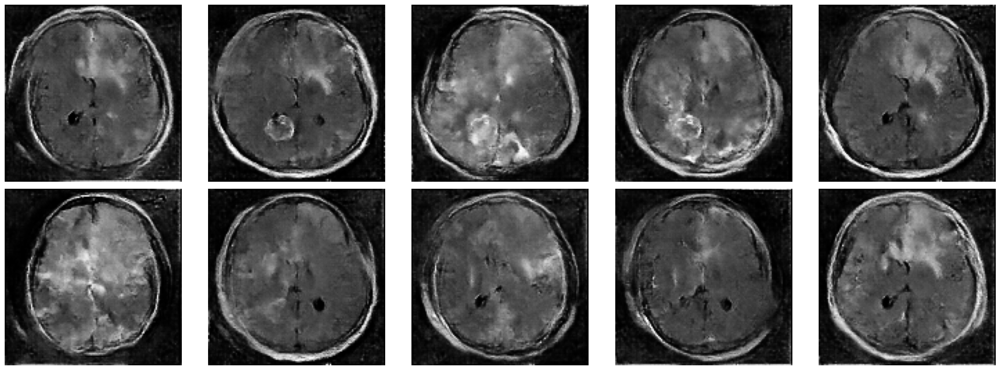

  0%|          | 0/2000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 33ms/step


  0%|          | 1/2000 [00:00<07:22,  4.52it/s]

1/1 [==============================] - 0s 30ms/step


  0%|          | 2/2000 [00:00<07:38,  4.36it/s]

1/1 [==============================] - 0s 29ms/step


  0%|          | 3/2000 [00:00<06:48,  4.89it/s]

1/1 [==============================] - 0s 33ms/step


  0%|          | 4/2000 [00:00<06:54,  4.81it/s]

1/1 [==============================] - 0s 25ms/step


  0%|          | 5/2000 [00:01<07:22,  4.51it/s]

1/1 [==============================] - 0s 27ms/step


  0%|          | 6/2000 [00:01<07:04,  4.70it/s]

1/1 [==============================] - 0s 24ms/step


  0%|          | 7/2000 [00:01<06:57,  4.77it/s]

1/1 [==============================] - 0s 28ms/step


  0%|          | 8/2000 [00:01<06:49,  4.87it/s]

1/1 [==============================] - 0s 25ms/step


  0%|          | 9/2000 [00:01<06:56,  4.78it/s]

1/1 [==============================] - 0s 25ms/step


  0%|          | 10/2000 [00:02<07:03,  4.70it/s]

1/1 [==============================] - 0s 26ms/step


  1%|          | 11/2000 [00:02<07:17,  4.55it/s]

1/1 [==============================] - 0s 24ms/step


  1%|          | 12/2000 [00:02<06:51,  4.83it/s]

1/1 [==============================] - 0s 25ms/step


  1%|          | 13/2000 [00:02<06:36,  5.01it/s]

1/1 [==============================] - 0s 34ms/step


  1%|          | 14/2000 [00:02<06:27,  5.13it/s]

1/1 [==============================] - 0s 25ms/step


  1%|          | 15/2000 [00:03<06:49,  4.85it/s]

1/1 [==============================] - 0s 25ms/step


  1%|          | 16/2000 [00:03<06:32,  5.06it/s]

1/1 [==============================] - 0s 25ms/step


  1%|          | 17/2000 [00:03<06:41,  4.93it/s]

1/1 [==============================] - 0s 27ms/step


  1%|          | 18/2000 [00:03<06:36,  5.00it/s]

1/1 [==============================] - 0s 24ms/step


  1%|          | 19/2000 [00:03<06:35,  5.01it/s]

1/1 [==============================] - 0s 26ms/step


  1%|          | 20/2000 [00:04<06:30,  5.07it/s]

1/1 [==============================] - 0s 25ms/step


  1%|          | 21/2000 [00:04<06:24,  5.15it/s]

1/1 [==============================] - 0s 30ms/step


  1%|          | 22/2000 [00:04<06:35,  5.00it/s]

1/1 [==============================] - 0s 29ms/step


  1%|          | 23/2000 [00:04<06:32,  5.04it/s]

1/1 [==============================] - 0s 30ms/step


  1%|          | 24/2000 [00:04<06:31,  5.05it/s]

1/1 [==============================] - 0s 25ms/step


  1%|▏         | 25/2000 [00:05<06:43,  4.89it/s]

1/1 [==============================] - 0s 29ms/step


  1%|▏         | 26/2000 [00:05<06:43,  4.89it/s]

1/1 [==============================] - 0s 27ms/step


  1%|▏         | 27/2000 [00:05<07:22,  4.46it/s]

1/1 [==============================] - 0s 28ms/step


  1%|▏         | 28/2000 [00:05<07:05,  4.63it/s]

1/1 [==============================] - 0s 29ms/step


  1%|▏         | 29/2000 [00:06<07:04,  4.64it/s]

1/1 [==============================] - 0s 26ms/step


  2%|▏         | 30/2000 [00:06<06:52,  4.77it/s]

1/1 [==============================] - 0s 28ms/step


  2%|▏         | 31/2000 [00:06<06:45,  4.86it/s]

1/1 [==============================] - 0s 26ms/step


  2%|▏         | 32/2000 [00:06<07:00,  4.68it/s]

1/1 [==============================] - 0s 28ms/step


  2%|▏         | 33/2000 [00:06<07:17,  4.50it/s]

1/1 [==============================] - 0s 34ms/step


  2%|▏         | 34/2000 [00:07<07:31,  4.36it/s]

1/1 [==============================] - 0s 24ms/step


  2%|▏         | 35/2000 [00:07<07:10,  4.57it/s]

1/1 [==============================] - 0s 31ms/step


  2%|▏         | 36/2000 [00:07<07:29,  4.37it/s]

1/1 [==============================] - 0s 33ms/step


  2%|▏         | 37/2000 [00:07<07:42,  4.24it/s]

1/1 [==============================] - 0s 31ms/step


  2%|▏         | 38/2000 [00:08<07:50,  4.17it/s]

1/1 [==============================] - 0s 26ms/step


  2%|▏         | 39/2000 [00:08<07:54,  4.13it/s]

1/1 [==============================] - 0s 47ms/step


  2%|▏         | 40/2000 [00:08<08:04,  4.04it/s]

1/1 [==============================] - 0s 55ms/step


  2%|▏         | 41/2000 [00:08<07:56,  4.11it/s]

1/1 [==============================] - 0s 30ms/step


  2%|▏         | 42/2000 [00:09<07:35,  4.30it/s]

1/1 [==============================] - 0s 43ms/step


  2%|▏         | 43/2000 [00:09<07:27,  4.37it/s]

1/1 [==============================] - 0s 32ms/step


  2%|▏         | 44/2000 [00:09<07:43,  4.22it/s]

1/1 [==============================] - 0s 39ms/step


  2%|▏         | 45/2000 [00:09<07:34,  4.30it/s]

1/1 [==============================] - 0s 36ms/step


  2%|▏         | 46/2000 [00:10<13:07,  2.48it/s]

1/1 [==============================] - 0s 49ms/step


  2%|▏         | 47/2000 [00:10<11:49,  2.75it/s]

1/1 [==============================] - 0s 51ms/step


  2%|▏         | 48/2000 [00:11<11:02,  2.95it/s]

1/1 [==============================] - 0s 47ms/step


  2%|▏         | 49/2000 [00:11<10:02,  3.24it/s]

1/1 [==============================] - 0s 29ms/step


  2%|▎         | 50/2000 [00:11<09:06,  3.57it/s]

1/1 [==============================] - 0s 45ms/step


  3%|▎         | 51/2000 [00:11<08:50,  3.67it/s]

1/1 [==============================] - 0s 28ms/step


  3%|▎         | 52/2000 [00:11<08:01,  4.04it/s]

1/1 [==============================] - 0s 28ms/step


  3%|▎         | 53/2000 [00:12<07:40,  4.23it/s]

1/1 [==============================] - 0s 31ms/step


  3%|▎         | 54/2000 [00:12<07:39,  4.23it/s]

1/1 [==============================] - 0s 30ms/step


  3%|▎         | 55/2000 [00:12<07:24,  4.37it/s]

1/1 [==============================] - 0s 30ms/step


  3%|▎         | 56/2000 [00:12<07:33,  4.29it/s]

1/1 [==============================] - 0s 43ms/step


  3%|▎         | 57/2000 [00:13<07:20,  4.42it/s]

1/1 [==============================] - 0s 29ms/step


  3%|▎         | 58/2000 [00:13<07:18,  4.42it/s]

1/1 [==============================] - 0s 37ms/step


  3%|▎         | 59/2000 [00:13<07:32,  4.29it/s]

1/1 [==============================] - 0s 30ms/step


  3%|▎         | 60/2000 [00:13<07:38,  4.23it/s]

1/1 [==============================] - 0s 29ms/step


  3%|▎         | 61/2000 [00:14<07:30,  4.31it/s]

1/1 [==============================] - 0s 32ms/step


  3%|▎         | 62/2000 [00:14<07:15,  4.45it/s]

1/1 [==============================] - 0s 34ms/step


  3%|▎         | 63/2000 [00:14<07:48,  4.14it/s]

1/1 [==============================] - 0s 31ms/step


  3%|▎         | 64/2000 [00:14<07:27,  4.33it/s]

1/1 [==============================] - 0s 28ms/step


  3%|▎         | 65/2000 [00:14<07:30,  4.29it/s]

1/1 [==============================] - 0s 44ms/step


  3%|▎         | 66/2000 [00:15<07:44,  4.16it/s]

1/1 [==============================] - 0s 31ms/step


  3%|▎         | 67/2000 [00:15<07:18,  4.41it/s]

1/1 [==============================] - 0s 34ms/step


  3%|▎         | 68/2000 [00:15<07:05,  4.54it/s]

1/1 [==============================] - 0s 29ms/step


  3%|▎         | 69/2000 [00:15<07:16,  4.43it/s]

1/1 [==============================] - 0s 32ms/step


  4%|▎         | 70/2000 [00:16<07:32,  4.26it/s]

1/1 [==============================] - 0s 28ms/step


  4%|▎         | 71/2000 [00:16<07:14,  4.44it/s]

1/1 [==============================] - 0s 42ms/step


  4%|▎         | 72/2000 [00:16<07:09,  4.49it/s]

1/1 [==============================] - 0s 29ms/step


  4%|▎         | 73/2000 [00:16<07:20,  4.37it/s]

1/1 [==============================] - 0s 34ms/step


  4%|▎         | 74/2000 [00:16<07:09,  4.48it/s]

1/1 [==============================] - 0s 31ms/step


  4%|▍         | 75/2000 [00:17<07:22,  4.35it/s]

1/1 [==============================] - 0s 30ms/step


  4%|▍         | 76/2000 [00:17<07:33,  4.24it/s]

1/1 [==============================] - 0s 30ms/step


  4%|▍         | 77/2000 [00:17<07:41,  4.16it/s]

1/1 [==============================] - 0s 29ms/step


  4%|▍         | 78/2000 [00:17<07:44,  4.14it/s]

1/1 [==============================] - 0s 37ms/step


  4%|▍         | 79/2000 [00:18<08:02,  3.98it/s]

1/1 [==============================] - 0s 29ms/step


  4%|▍         | 80/2000 [00:18<07:48,  4.10it/s]

1/1 [==============================] - 0s 32ms/step


  4%|▍         | 81/2000 [00:18<07:57,  4.02it/s]

1/1 [==============================] - 0s 30ms/step


  4%|▍         | 82/2000 [00:18<07:53,  4.05it/s]

1/1 [==============================] - 0s 28ms/step


  4%|▍         | 83/2000 [00:19<07:41,  4.15it/s]

1/1 [==============================] - 0s 31ms/step


  4%|▍         | 84/2000 [00:19<07:24,  4.31it/s]

1/1 [==============================] - 0s 28ms/step


  4%|▍         | 85/2000 [00:19<07:03,  4.52it/s]

1/1 [==============================] - 0s 29ms/step


  4%|▍         | 86/2000 [00:19<07:03,  4.52it/s]

1/1 [==============================] - 0s 28ms/step


  4%|▍         | 87/2000 [00:20<06:54,  4.61it/s]

1/1 [==============================] - 0s 28ms/step


  4%|▍         | 88/2000 [00:20<07:02,  4.52it/s]

1/1 [==============================] - 0s 28ms/step


  4%|▍         | 89/2000 [00:20<07:05,  4.49it/s]

1/1 [==============================] - 0s 29ms/step


  4%|▍         | 90/2000 [00:20<06:51,  4.65it/s]

1/1 [==============================] - 0s 28ms/step


  5%|▍         | 91/2000 [00:20<07:05,  4.49it/s]

1/1 [==============================] - 0s 29ms/step


  5%|▍         | 92/2000 [00:21<07:16,  4.38it/s]

1/1 [==============================] - 0s 63ms/step


  5%|▍         | 93/2000 [00:21<07:29,  4.24it/s]

1/1 [==============================] - 0s 46ms/step


  5%|▍         | 94/2000 [00:21<07:29,  4.24it/s]

1/1 [==============================] - 0s 42ms/step


  5%|▍         | 95/2000 [00:21<07:35,  4.19it/s]

1/1 [==============================] - 0s 44ms/step


  5%|▍         | 96/2000 [00:22<07:47,  4.07it/s]

1/1 [==============================] - 0s 45ms/step


  5%|▍         | 97/2000 [00:22<07:36,  4.17it/s]

1/1 [==============================] - 0s 38ms/step


  5%|▍         | 98/2000 [00:22<07:54,  4.01it/s]

1/1 [==============================] - 0s 42ms/step


  5%|▍         | 99/2000 [00:22<08:03,  3.93it/s]

1/1 [==============================] - 0s 42ms/step


  5%|▌         | 100/2000 [00:23<08:05,  3.91it/s]

1/1 [==============================] - 0s 42ms/step


  5%|▌         | 101/2000 [00:23<07:50,  4.04it/s]

1/1 [==============================] - 0s 39ms/step


  5%|▌         | 102/2000 [00:23<07:42,  4.10it/s]

1/1 [==============================] - 0s 40ms/step


  5%|▌         | 103/2000 [00:23<08:07,  3.89it/s]

1/1 [==============================] - 0s 34ms/step


  5%|▌         | 104/2000 [00:24<08:18,  3.80it/s]

1/1 [==============================] - 0s 46ms/step


  5%|▌         | 105/2000 [00:24<08:09,  3.87it/s]

1/1 [==============================] - 0s 48ms/step


  5%|▌         | 106/2000 [00:24<07:59,  3.95it/s]

1/1 [==============================] - 0s 39ms/step


  5%|▌         | 107/2000 [00:24<08:11,  3.85it/s]

1/1 [==============================] - 0s 58ms/step


  5%|▌         | 108/2000 [00:25<08:13,  3.83it/s]

1/1 [==============================] - 0s 49ms/step


  5%|▌         | 109/2000 [00:25<08:28,  3.72it/s]

1/1 [==============================] - 0s 37ms/step


  6%|▌         | 110/2000 [00:25<08:23,  3.75it/s]

1/1 [==============================] - 0s 36ms/step


  6%|▌         | 111/2000 [00:26<07:51,  4.01it/s]

1/1 [==============================] - 0s 29ms/step


  6%|▌         | 112/2000 [00:26<07:25,  4.24it/s]

1/1 [==============================] - 0s 28ms/step


  6%|▌         | 113/2000 [00:26<07:17,  4.31it/s]

1/1 [==============================] - 0s 28ms/step


  6%|▌         | 114/2000 [00:26<06:57,  4.52it/s]

1/1 [==============================] - 0s 27ms/step


  6%|▌         | 115/2000 [00:26<06:42,  4.68it/s]

1/1 [==============================] - 0s 33ms/step


  6%|▌         | 116/2000 [00:27<06:51,  4.58it/s]

1/1 [==============================] - 0s 28ms/step


  6%|▌         | 117/2000 [00:27<06:54,  4.54it/s]

1/1 [==============================] - 0s 29ms/step


  6%|▌         | 118/2000 [00:27<06:41,  4.69it/s]

1/1 [==============================] - 0s 29ms/step


  6%|▌         | 119/2000 [00:27<06:36,  4.74it/s]

1/1 [==============================] - 0s 31ms/step


  6%|▌         | 120/2000 [00:27<06:37,  4.73it/s]

1/1 [==============================] - 0s 31ms/step


  6%|▌         | 121/2000 [00:28<06:46,  4.62it/s]

1/1 [==============================] - 0s 30ms/step


  6%|▌         | 122/2000 [00:28<06:39,  4.70it/s]

1/1 [==============================] - 0s 28ms/step


  6%|▌         | 123/2000 [00:28<06:32,  4.78it/s]

1/1 [==============================] - 0s 29ms/step


  6%|▌         | 124/2000 [00:28<06:31,  4.79it/s]

1/1 [==============================] - 0s 27ms/step


  6%|▋         | 125/2000 [00:28<06:33,  4.77it/s]

1/1 [==============================] - 0s 37ms/step


  6%|▋         | 126/2000 [00:29<06:41,  4.67it/s]

1/1 [==============================] - 0s 29ms/step


  6%|▋         | 127/2000 [00:29<07:03,  4.42it/s]

1/1 [==============================] - 0s 27ms/step


  6%|▋         | 128/2000 [00:29<07:08,  4.37it/s]

1/1 [==============================] - 0s 27ms/step


  6%|▋         | 129/2000 [00:29<06:53,  4.53it/s]

1/1 [==============================] - 0s 33ms/step


  6%|▋         | 130/2000 [00:30<07:01,  4.43it/s]

1/1 [==============================] - 0s 46ms/step


  7%|▋         | 131/2000 [00:30<07:01,  4.43it/s]

1/1 [==============================] - 0s 29ms/step


  7%|▋         | 132/2000 [00:30<06:45,  4.61it/s]

1/1 [==============================] - 0s 37ms/step


  7%|▋         | 133/2000 [00:30<07:01,  4.43it/s]

1/1 [==============================] - 0s 31ms/step


  7%|▋         | 134/2000 [00:31<07:07,  4.36it/s]

1/1 [==============================] - 0s 35ms/step


  7%|▋         | 135/2000 [00:31<07:35,  4.10it/s]

1/1 [==============================] - 0s 29ms/step


  7%|▋         | 136/2000 [00:31<07:07,  4.36it/s]

1/1 [==============================] - 0s 28ms/step


  7%|▋         | 137/2000 [00:31<07:14,  4.29it/s]

1/1 [==============================] - 0s 27ms/step


  7%|▋         | 138/2000 [00:31<07:19,  4.24it/s]

1/1 [==============================] - 0s 28ms/step


  7%|▋         | 139/2000 [00:32<07:15,  4.28it/s]

1/1 [==============================] - 0s 30ms/step


  7%|▋         | 140/2000 [00:32<07:14,  4.28it/s]

1/1 [==============================] - 0s 27ms/step


  7%|▋         | 141/2000 [00:32<06:46,  4.58it/s]

1/1 [==============================] - 0s 27ms/step


  7%|▋         | 142/2000 [00:32<06:56,  4.46it/s]

1/1 [==============================] - 0s 27ms/step


  7%|▋         | 143/2000 [00:33<07:13,  4.28it/s]

1/1 [==============================] - 0s 40ms/step


  7%|▋         | 144/2000 [00:33<07:03,  4.38it/s]

1/1 [==============================] - 0s 33ms/step


  7%|▋         | 145/2000 [00:33<06:52,  4.50it/s]

1/1 [==============================] - 0s 29ms/step


  7%|▋         | 146/2000 [00:33<07:05,  4.35it/s]

1/1 [==============================] - 0s 26ms/step


  7%|▋         | 147/2000 [00:34<07:16,  4.25it/s]

1/1 [==============================] - 0s 29ms/step


  7%|▋         | 148/2000 [00:34<07:13,  4.27it/s]

1/1 [==============================] - 0s 31ms/step


  7%|▋         | 149/2000 [00:34<07:22,  4.19it/s]

1/1 [==============================] - 0s 27ms/step


  8%|▊         | 150/2000 [00:34<07:14,  4.26it/s]

1/1 [==============================] - 0s 31ms/step


  8%|▊         | 151/2000 [00:34<06:56,  4.44it/s]

1/1 [==============================] - 0s 28ms/step


  8%|▊         | 152/2000 [00:35<07:11,  4.28it/s]

1/1 [==============================] - 0s 40ms/step


  8%|▊         | 153/2000 [00:35<07:06,  4.33it/s]

1/1 [==============================] - 0s 47ms/step


  8%|▊         | 154/2000 [00:35<07:21,  4.19it/s]

1/1 [==============================] - 0s 69ms/step


  8%|▊         | 155/2000 [00:35<07:30,  4.09it/s]

1/1 [==============================] - 0s 42ms/step


  8%|▊         | 156/2000 [00:36<07:23,  4.16it/s]

1/1 [==============================] - 0s 34ms/step


  8%|▊         | 157/2000 [00:36<07:15,  4.23it/s]

1/1 [==============================] - 0s 42ms/step


  8%|▊         | 158/2000 [00:36<07:36,  4.04it/s]

1/1 [==============================] - 0s 33ms/step


  8%|▊         | 159/2000 [00:36<07:15,  4.23it/s]

1/1 [==============================] - 0s 62ms/step


  8%|▊         | 160/2000 [00:37<07:45,  3.95it/s]

1/1 [==============================] - 0s 34ms/step


  8%|▊         | 161/2000 [00:37<07:40,  3.99it/s]

1/1 [==============================] - 0s 40ms/step


  8%|▊         | 162/2000 [00:37<07:48,  3.92it/s]

1/1 [==============================] - 0s 45ms/step


  8%|▊         | 163/2000 [00:37<07:52,  3.89it/s]

1/1 [==============================] - 0s 57ms/step


  8%|▊         | 164/2000 [00:38<08:00,  3.82it/s]

1/1 [==============================] - 0s 39ms/step


  8%|▊         | 165/2000 [00:38<07:35,  4.03it/s]

1/1 [==============================] - 0s 46ms/step


  8%|▊         | 166/2000 [00:38<07:26,  4.10it/s]

1/1 [==============================] - 0s 63ms/step


  8%|▊         | 167/2000 [00:38<07:27,  4.09it/s]

1/1 [==============================] - 0s 29ms/step


  8%|▊         | 168/2000 [00:39<07:04,  4.32it/s]

1/1 [==============================] - 0s 31ms/step


  8%|▊         | 169/2000 [00:39<06:57,  4.38it/s]

1/1 [==============================] - 0s 59ms/step


  8%|▊         | 170/2000 [00:39<07:19,  4.16it/s]

1/1 [==============================] - 0s 30ms/step


  9%|▊         | 171/2000 [00:39<07:17,  4.18it/s]

1/1 [==============================] - 0s 27ms/step


  9%|▊         | 172/2000 [00:40<07:24,  4.11it/s]

1/1 [==============================] - 0s 28ms/step


  9%|▊         | 173/2000 [00:40<07:23,  4.12it/s]

1/1 [==============================] - 0s 34ms/step


  9%|▊         | 174/2000 [00:40<07:03,  4.31it/s]

1/1 [==============================] - 0s 28ms/step


  9%|▉         | 175/2000 [00:40<06:47,  4.48it/s]

1/1 [==============================] - 0s 45ms/step


  9%|▉         | 176/2000 [00:40<07:03,  4.31it/s]

1/1 [==============================] - 0s 29ms/step


  9%|▉         | 177/2000 [00:41<06:53,  4.41it/s]

1/1 [==============================] - 0s 34ms/step


  9%|▉         | 178/2000 [00:41<06:45,  4.49it/s]

1/1 [==============================] - 0s 31ms/step


  9%|▉         | 179/2000 [00:41<07:02,  4.31it/s]

1/1 [==============================] - 0s 33ms/step


  9%|▉         | 180/2000 [00:41<06:38,  4.56it/s]

1/1 [==============================] - 0s 29ms/step


  9%|▉         | 181/2000 [00:42<06:29,  4.67it/s]

1/1 [==============================] - 0s 30ms/step


  9%|▉         | 182/2000 [00:42<06:20,  4.77it/s]

1/1 [==============================] - 0s 28ms/step


  9%|▉         | 183/2000 [00:42<06:36,  4.59it/s]

1/1 [==============================] - 0s 27ms/step


  9%|▉         | 184/2000 [00:42<06:27,  4.69it/s]

1/1 [==============================] - 0s 28ms/step


  9%|▉         | 185/2000 [00:42<06:37,  4.57it/s]

1/1 [==============================] - 0s 27ms/step


  9%|▉         | 186/2000 [00:43<06:31,  4.63it/s]

1/1 [==============================] - 0s 36ms/step


  9%|▉         | 187/2000 [00:43<06:55,  4.37it/s]

1/1 [==============================] - 0s 28ms/step


  9%|▉         | 188/2000 [00:43<06:42,  4.50it/s]

1/1 [==============================] - 0s 43ms/step


  9%|▉         | 189/2000 [00:43<06:29,  4.65it/s]

1/1 [==============================] - 0s 32ms/step


 10%|▉         | 190/2000 [00:44<06:42,  4.50it/s]

1/1 [==============================] - 0s 26ms/step


 10%|▉         | 191/2000 [00:44<06:36,  4.56it/s]

1/1 [==============================] - 0s 27ms/step


 10%|▉         | 192/2000 [00:44<06:19,  4.77it/s]

1/1 [==============================] - 0s 27ms/step


 10%|▉         | 193/2000 [00:44<06:05,  4.94it/s]

1/1 [==============================] - 0s 25ms/step


 10%|▉         | 194/2000 [00:44<06:04,  4.96it/s]

1/1 [==============================] - 0s 28ms/step


 10%|▉         | 195/2000 [00:45<06:01,  4.99it/s]

1/1 [==============================] - 0s 27ms/step


 10%|▉         | 196/2000 [00:45<06:18,  4.77it/s]

1/1 [==============================] - 0s 28ms/step


 10%|▉         | 197/2000 [00:45<06:39,  4.51it/s]

1/1 [==============================] - 0s 30ms/step


 10%|▉         | 198/2000 [00:45<06:43,  4.47it/s]

1/1 [==============================] - 0s 28ms/step


 10%|▉         | 199/2000 [00:45<06:33,  4.58it/s]

1/1 [==============================] - 0s 30ms/step


 10%|█         | 200/2000 [00:46<06:32,  4.58it/s]

1/1 [==============================] - 0s 48ms/step


 10%|█         | 201/2000 [00:46<06:32,  4.58it/s]

1/1 [==============================] - 0s 26ms/step


 10%|█         | 202/2000 [00:46<06:19,  4.74it/s]

1/1 [==============================] - 0s 27ms/step


 10%|█         | 203/2000 [00:46<06:09,  4.87it/s]

1/1 [==============================] - 0s 34ms/step


 10%|█         | 204/2000 [00:46<06:08,  4.88it/s]

1/1 [==============================] - 0s 27ms/step


 10%|█         | 205/2000 [00:47<06:23,  4.68it/s]

1/1 [==============================] - 0s 32ms/step


 10%|█         | 206/2000 [00:47<06:24,  4.66it/s]

1/1 [==============================] - 0s 28ms/step


 10%|█         | 207/2000 [00:47<06:27,  4.63it/s]

1/1 [==============================] - 0s 29ms/step


 10%|█         | 208/2000 [00:47<06:19,  4.72it/s]

1/1 [==============================] - 0s 30ms/step


 10%|█         | 209/2000 [00:48<06:25,  4.64it/s]

1/1 [==============================] - 0s 27ms/step


 10%|█         | 210/2000 [00:48<06:18,  4.73it/s]

1/1 [==============================] - 0s 26ms/step


 11%|█         | 211/2000 [00:48<06:23,  4.67it/s]

1/1 [==============================] - 0s 29ms/step


 11%|█         | 212/2000 [00:48<06:17,  4.74it/s]

1/1 [==============================] - 0s 26ms/step


 11%|█         | 213/2000 [00:48<06:09,  4.84it/s]

1/1 [==============================] - 0s 32ms/step


 11%|█         | 214/2000 [00:49<06:11,  4.80it/s]

1/1 [==============================] - 0s 26ms/step


 11%|█         | 215/2000 [00:49<06:08,  4.84it/s]

1/1 [==============================] - 0s 28ms/step


 11%|█         | 216/2000 [00:49<06:16,  4.74it/s]

1/1 [==============================] - 0s 28ms/step


 11%|█         | 217/2000 [00:49<06:18,  4.72it/s]

1/1 [==============================] - 0s 35ms/step


 11%|█         | 218/2000 [00:49<06:38,  4.47it/s]

1/1 [==============================] - 0s 38ms/step


 11%|█         | 219/2000 [00:50<06:47,  4.37it/s]

1/1 [==============================] - 0s 40ms/step


 11%|█         | 220/2000 [00:50<06:46,  4.38it/s]

1/1 [==============================] - 0s 43ms/step


 11%|█         | 221/2000 [00:50<06:49,  4.34it/s]

1/1 [==============================] - 0s 31ms/step


 11%|█         | 222/2000 [00:50<06:48,  4.36it/s]

1/1 [==============================] - 0s 40ms/step


 11%|█         | 223/2000 [00:51<07:00,  4.22it/s]

1/1 [==============================] - 0s 42ms/step


 11%|█         | 224/2000 [00:51<07:24,  4.00it/s]

1/1 [==============================] - 0s 35ms/step


 11%|█▏        | 225/2000 [00:51<07:23,  4.00it/s]

1/1 [==============================] - 0s 28ms/step


 11%|█▏        | 226/2000 [00:51<07:02,  4.20it/s]

1/1 [==============================] - 0s 57ms/step


 11%|█▏        | 227/2000 [00:52<07:15,  4.07it/s]

1/1 [==============================] - 0s 40ms/step


 11%|█▏        | 228/2000 [00:52<07:25,  3.98it/s]

1/1 [==============================] - 0s 45ms/step


 11%|█▏        | 229/2000 [00:52<07:17,  4.05it/s]

1/1 [==============================] - 0s 27ms/step


 12%|█▏        | 230/2000 [00:52<06:56,  4.25it/s]

1/1 [==============================] - 0s 56ms/step


 12%|█▏        | 231/2000 [00:53<07:22,  4.00it/s]

1/1 [==============================] - 0s 44ms/step


 12%|█▏        | 232/2000 [00:53<07:22,  3.99it/s]

1/1 [==============================] - 0s 31ms/step


 12%|█▏        | 233/2000 [00:53<07:27,  3.95it/s]

1/1 [==============================] - 0s 48ms/step


 12%|█▏        | 234/2000 [00:53<07:22,  3.99it/s]

1/1 [==============================] - 0s 27ms/step


 12%|█▏        | 235/2000 [00:54<07:16,  4.04it/s]

1/1 [==============================] - 0s 27ms/step


 12%|█▏        | 236/2000 [00:54<06:59,  4.20it/s]

1/1 [==============================] - 0s 25ms/step


 12%|█▏        | 237/2000 [00:54<06:56,  4.23it/s]

1/1 [==============================] - 0s 27ms/step


 12%|█▏        | 238/2000 [00:54<06:33,  4.48it/s]

1/1 [==============================] - 0s 26ms/step


 12%|█▏        | 239/2000 [00:54<06:14,  4.70it/s]

1/1 [==============================] - 0s 28ms/step


 12%|█▏        | 240/2000 [00:55<06:11,  4.74it/s]

1/1 [==============================] - 0s 30ms/step


 12%|█▏        | 241/2000 [00:55<06:24,  4.58it/s]

1/1 [==============================] - 0s 28ms/step


 12%|█▏        | 242/2000 [00:55<06:21,  4.61it/s]

1/1 [==============================] - 0s 27ms/step


 12%|█▏        | 243/2000 [00:55<06:11,  4.74it/s]

1/1 [==============================] - 0s 30ms/step


 12%|█▏        | 244/2000 [00:56<06:13,  4.70it/s]

1/1 [==============================] - 0s 26ms/step


 12%|█▏        | 245/2000 [00:56<06:08,  4.76it/s]

1/1 [==============================] - 0s 32ms/step


 12%|█▏        | 246/2000 [00:56<06:35,  4.44it/s]

1/1 [==============================] - 0s 36ms/step


 12%|█▏        | 247/2000 [00:56<06:34,  4.44it/s]

1/1 [==============================] - 0s 28ms/step


 12%|█▏        | 248/2000 [00:56<06:42,  4.35it/s]

1/1 [==============================] - 0s 27ms/step


 12%|█▏        | 249/2000 [00:57<06:29,  4.50it/s]

1/1 [==============================] - 0s 37ms/step


 12%|█▎        | 250/2000 [00:57<06:37,  4.40it/s]

1/1 [==============================] - 0s 29ms/step


 13%|█▎        | 251/2000 [00:57<06:30,  4.48it/s]

1/1 [==============================] - 0s 33ms/step


 13%|█▎        | 252/2000 [00:57<06:21,  4.58it/s]

1/1 [==============================] - 0s 26ms/step


 13%|█▎        | 253/2000 [00:58<06:10,  4.71it/s]

1/1 [==============================] - 0s 32ms/step


 13%|█▎        | 254/2000 [00:58<06:06,  4.76it/s]

1/1 [==============================] - 0s 27ms/step


 13%|█▎        | 255/2000 [00:58<06:28,  4.49it/s]

1/1 [==============================] - 0s 27ms/step


 13%|█▎        | 256/2000 [00:58<06:08,  4.74it/s]

1/1 [==============================] - 0s 26ms/step


 13%|█▎        | 257/2000 [00:58<05:52,  4.95it/s]

1/1 [==============================] - 0s 45ms/step


 13%|█▎        | 258/2000 [00:59<06:18,  4.60it/s]

1/1 [==============================] - 0s 25ms/step


 13%|█▎        | 259/2000 [00:59<06:31,  4.45it/s]

1/1 [==============================] - 0s 25ms/step


 13%|█▎        | 260/2000 [00:59<06:07,  4.73it/s]

1/1 [==============================] - 0s 27ms/step


 13%|█▎        | 261/2000 [00:59<06:16,  4.62it/s]

1/1 [==============================] - 0s 30ms/step


 13%|█▎        | 262/2000 [00:59<06:03,  4.78it/s]

1/1 [==============================] - 0s 27ms/step


 13%|█▎        | 263/2000 [01:00<06:18,  4.59it/s]

1/1 [==============================] - 0s 29ms/step


 13%|█▎        | 264/2000 [01:00<06:17,  4.59it/s]

1/1 [==============================] - 0s 27ms/step


 13%|█▎        | 265/2000 [01:00<05:58,  4.85it/s]

1/1 [==============================] - 0s 29ms/step


 13%|█▎        | 266/2000 [01:00<05:57,  4.85it/s]

1/1 [==============================] - 0s 26ms/step


 13%|█▎        | 267/2000 [01:01<05:51,  4.93it/s]

1/1 [==============================] - 0s 26ms/step


 13%|█▎        | 268/2000 [01:01<05:58,  4.84it/s]

1/1 [==============================] - 0s 32ms/step


 13%|█▎        | 269/2000 [01:01<06:05,  4.73it/s]

1/1 [==============================] - 0s 31ms/step


 14%|█▎        | 270/2000 [01:01<06:14,  4.62it/s]

1/1 [==============================] - 0s 32ms/step


 14%|█▎        | 271/2000 [01:01<06:28,  4.45it/s]

1/1 [==============================] - 0s 26ms/step


 14%|█▎        | 272/2000 [01:02<06:13,  4.63it/s]

1/1 [==============================] - 0s 29ms/step


 14%|█▎        | 273/2000 [01:02<06:08,  4.69it/s]

1/1 [==============================] - 0s 26ms/step


 14%|█▎        | 274/2000 [01:02<06:02,  4.77it/s]

1/1 [==============================] - 0s 38ms/step


 14%|█▍        | 275/2000 [01:02<06:05,  4.73it/s]

1/1 [==============================] - 0s 30ms/step


 14%|█▍        | 276/2000 [01:02<05:59,  4.79it/s]

1/1 [==============================] - 0s 28ms/step


 14%|█▍        | 277/2000 [01:03<06:16,  4.58it/s]

1/1 [==============================] - 0s 30ms/step


 14%|█▍        | 278/2000 [01:03<06:28,  4.43it/s]

1/1 [==============================] - 0s 44ms/step


 14%|█▍        | 279/2000 [01:03<06:59,  4.10it/s]

1/1 [==============================] - 0s 26ms/step


 14%|█▍        | 280/2000 [01:03<06:52,  4.17it/s]

1/1 [==============================] - 0s 50ms/step


 14%|█▍        | 281/2000 [01:04<07:08,  4.01it/s]

1/1 [==============================] - 0s 58ms/step


 14%|█▍        | 282/2000 [01:04<07:14,  3.95it/s]

1/1 [==============================] - 0s 41ms/step


 14%|█▍        | 283/2000 [01:04<06:59,  4.09it/s]

1/1 [==============================] - 0s 36ms/step


 14%|█▍        | 284/2000 [01:04<06:41,  4.27it/s]

1/1 [==============================] - 0s 48ms/step


 14%|█▍        | 285/2000 [01:05<06:53,  4.15it/s]

1/1 [==============================] - 0s 58ms/step


 14%|█▍        | 286/2000 [01:05<06:53,  4.15it/s]

1/1 [==============================] - 0s 30ms/step


 14%|█▍        | 287/2000 [01:05<07:01,  4.06it/s]

1/1 [==============================] - 0s 53ms/step


 14%|█▍        | 288/2000 [01:05<07:24,  3.85it/s]

1/1 [==============================] - 0s 31ms/step


 14%|█▍        | 289/2000 [01:06<07:02,  4.05it/s]

1/1 [==============================] - 0s 62ms/step


 14%|█▍        | 290/2000 [01:06<07:01,  4.06it/s]

1/1 [==============================] - 0s 41ms/step


 15%|█▍        | 291/2000 [01:06<07:07,  4.00it/s]

1/1 [==============================] - 0s 38ms/step


 15%|█▍        | 292/2000 [01:06<06:57,  4.09it/s]

1/1 [==============================] - 0s 28ms/step


 15%|█▍        | 293/2000 [01:07<06:39,  4.27it/s]

1/1 [==============================] - 0s 30ms/step


 15%|█▍        | 294/2000 [01:07<06:36,  4.30it/s]

1/1 [==============================] - 0s 43ms/step


 15%|█▍        | 295/2000 [01:07<06:39,  4.27it/s]

1/1 [==============================] - 0s 34ms/step


 15%|█▍        | 296/2000 [01:07<06:41,  4.25it/s]

1/1 [==============================] - 0s 25ms/step


 15%|█▍        | 297/2000 [01:08<06:24,  4.43it/s]

1/1 [==============================] - 0s 27ms/step


 15%|█▍        | 298/2000 [01:08<06:37,  4.29it/s]

1/1 [==============================] - 0s 29ms/step


 15%|█▍        | 299/2000 [01:08<06:43,  4.21it/s]

1/1 [==============================] - 0s 29ms/step


 15%|█▌        | 300/2000 [01:08<06:28,  4.38it/s]

1/1 [==============================] - 0s 33ms/step


 15%|█▌        | 301/2000 [01:08<06:31,  4.34it/s]

1/1 [==============================] - 0s 28ms/step


 15%|█▌        | 302/2000 [01:09<06:17,  4.49it/s]

1/1 [==============================] - 0s 26ms/step


 15%|█▌        | 303/2000 [01:09<06:12,  4.56it/s]

1/1 [==============================] - 0s 26ms/step


 15%|█▌        | 304/2000 [01:09<06:09,  4.59it/s]

1/1 [==============================] - 0s 27ms/step


 15%|█▌        | 305/2000 [01:09<06:04,  4.65it/s]

1/1 [==============================] - 0s 28ms/step


 15%|█▌        | 306/2000 [01:09<05:50,  4.83it/s]

1/1 [==============================] - 0s 30ms/step


 15%|█▌        | 307/2000 [01:10<06:03,  4.66it/s]

1/1 [==============================] - 0s 25ms/step


 15%|█▌        | 308/2000 [01:10<06:16,  4.49it/s]

1/1 [==============================] - 0s 31ms/step


 15%|█▌        | 309/2000 [01:10<06:26,  4.38it/s]

1/1 [==============================] - 0s 29ms/step


 16%|█▌        | 310/2000 [01:10<06:21,  4.43it/s]

1/1 [==============================] - 0s 26ms/step


 16%|█▌        | 311/2000 [01:11<06:31,  4.32it/s]

1/1 [==============================] - 0s 28ms/step


 16%|█▌        | 312/2000 [01:11<06:29,  4.34it/s]

1/1 [==============================] - 0s 42ms/step


 16%|█▌        | 313/2000 [01:11<06:20,  4.44it/s]

1/1 [==============================] - 0s 25ms/step


 16%|█▌        | 314/2000 [01:11<06:12,  4.53it/s]

1/1 [==============================] - 0s 33ms/step


 16%|█▌        | 315/2000 [01:12<06:13,  4.51it/s]

1/1 [==============================] - 0s 26ms/step


 16%|█▌        | 316/2000 [01:12<05:52,  4.78it/s]

1/1 [==============================] - 0s 29ms/step


 16%|█▌        | 317/2000 [01:12<05:49,  4.81it/s]

1/1 [==============================] - 0s 30ms/step


 16%|█▌        | 318/2000 [01:12<05:52,  4.77it/s]

1/1 [==============================] - 0s 25ms/step


 16%|█▌        | 319/2000 [01:12<05:37,  4.98it/s]

1/1 [==============================] - 0s 27ms/step


 16%|█▌        | 320/2000 [01:13<05:30,  5.09it/s]

1/1 [==============================] - 0s 27ms/step


 16%|█▌        | 321/2000 [01:13<05:31,  5.06it/s]

1/1 [==============================] - 0s 26ms/step


 16%|█▌        | 322/2000 [01:13<05:33,  5.03it/s]

1/1 [==============================] - 0s 26ms/step


 16%|█▌        | 323/2000 [01:13<05:34,  5.02it/s]

1/1 [==============================] - 0s 29ms/step


 16%|█▌        | 324/2000 [01:13<05:33,  5.03it/s]

1/1 [==============================] - 0s 26ms/step


 16%|█▋        | 325/2000 [01:14<05:45,  4.85it/s]

1/1 [==============================] - 0s 28ms/step


 16%|█▋        | 326/2000 [01:14<05:50,  4.77it/s]

1/1 [==============================] - 0s 27ms/step


 16%|█▋        | 327/2000 [01:14<05:46,  4.83it/s]

1/1 [==============================] - 0s 33ms/step


 16%|█▋        | 328/2000 [01:14<05:43,  4.86it/s]

1/1 [==============================] - 0s 30ms/step


 16%|█▋        | 329/2000 [01:14<05:46,  4.83it/s]

1/1 [==============================] - 0s 26ms/step


 16%|█▋        | 330/2000 [01:15<05:58,  4.65it/s]

1/1 [==============================] - 0s 27ms/step


 17%|█▋        | 331/2000 [01:15<05:41,  4.89it/s]

1/1 [==============================] - 0s 28ms/step


 17%|█▋        | 332/2000 [01:15<06:04,  4.58it/s]

1/1 [==============================] - 0s 25ms/step


 17%|█▋        | 333/2000 [01:15<05:58,  4.65it/s]

1/1 [==============================] - 0s 27ms/step


 17%|█▋        | 334/2000 [01:15<06:08,  4.52it/s]

1/1 [==============================] - 0s 32ms/step


 17%|█▋        | 335/2000 [01:16<05:59,  4.63it/s]

1/1 [==============================] - 0s 27ms/step


 17%|█▋        | 336/2000 [01:16<05:50,  4.75it/s]

1/1 [==============================] - 0s 25ms/step


 17%|█▋        | 337/2000 [01:16<05:42,  4.86it/s]

1/1 [==============================] - 0s 31ms/step


 17%|█▋        | 338/2000 [01:16<05:41,  4.87it/s]

1/1 [==============================] - 0s 27ms/step


 17%|█▋        | 339/2000 [01:16<05:46,  4.79it/s]

1/1 [==============================] - 0s 38ms/step


 17%|█▋        | 340/2000 [01:17<06:05,  4.54it/s]

1/1 [==============================] - 0s 26ms/step


 17%|█▋        | 341/2000 [01:17<05:56,  4.65it/s]

1/1 [==============================] - 0s 26ms/step


 17%|█▋        | 342/2000 [01:17<05:58,  4.63it/s]

1/1 [==============================] - 0s 42ms/step


 17%|█▋        | 343/2000 [01:17<06:20,  4.35it/s]

1/1 [==============================] - 0s 43ms/step


 17%|█▋        | 344/2000 [01:18<06:20,  4.36it/s]

1/1 [==============================] - 0s 30ms/step


 17%|█▋        | 345/2000 [01:18<06:10,  4.47it/s]

1/1 [==============================] - 0s 54ms/step


 17%|█▋        | 346/2000 [01:18<06:41,  4.12it/s]

1/1 [==============================] - 0s 39ms/step


 17%|█▋        | 347/2000 [01:18<06:36,  4.16it/s]

1/1 [==============================] - 0s 56ms/step


 17%|█▋        | 348/2000 [01:19<06:40,  4.13it/s]

1/1 [==============================] - 0s 38ms/step


 17%|█▋        | 349/2000 [01:19<06:33,  4.19it/s]

1/1 [==============================] - 0s 53ms/step


 18%|█▊        | 350/2000 [01:19<07:01,  3.91it/s]

1/1 [==============================] - 0s 57ms/step


 18%|█▊        | 351/2000 [01:19<07:01,  3.91it/s]

1/1 [==============================] - 0s 55ms/step


 18%|█▊        | 352/2000 [01:20<07:12,  3.81it/s]

1/1 [==============================] - 0s 43ms/step


 18%|█▊        | 353/2000 [01:20<06:54,  3.97it/s]

1/1 [==============================] - 0s 41ms/step


 18%|█▊        | 354/2000 [01:20<06:37,  4.14it/s]

1/1 [==============================] - 0s 44ms/step


 18%|█▊        | 355/2000 [01:20<06:29,  4.22it/s]

1/1 [==============================] - 0s 37ms/step


 18%|█▊        | 356/2000 [01:21<06:41,  4.10it/s]

1/1 [==============================] - 0s 34ms/step


 18%|█▊        | 357/2000 [01:21<06:30,  4.21it/s]

1/1 [==============================] - 0s 32ms/step


 18%|█▊        | 358/2000 [01:21<06:40,  4.10it/s]

1/1 [==============================] - 0s 30ms/step


 18%|█▊        | 359/2000 [01:21<06:43,  4.07it/s]

1/1 [==============================] - 0s 26ms/step


 18%|█▊        | 360/2000 [01:22<06:47,  4.02it/s]

1/1 [==============================] - 0s 44ms/step


 18%|█▊        | 361/2000 [01:22<06:43,  4.06it/s]

1/1 [==============================] - 0s 26ms/step


 18%|█▊        | 362/2000 [01:22<06:29,  4.21it/s]

1/1 [==============================] - 0s 27ms/step


 18%|█▊        | 363/2000 [01:22<06:11,  4.41it/s]

1/1 [==============================] - 0s 27ms/step


 18%|█▊        | 364/2000 [01:22<05:53,  4.62it/s]

1/1 [==============================] - 0s 26ms/step


 18%|█▊        | 365/2000 [01:23<06:04,  4.48it/s]

1/1 [==============================] - 0s 30ms/step


 18%|█▊        | 366/2000 [01:23<05:40,  4.80it/s]

1/1 [==============================] - 0s 49ms/step


 18%|█▊        | 367/2000 [01:23<05:47,  4.70it/s]

1/1 [==============================] - 0s 29ms/step


 18%|█▊        | 368/2000 [01:23<06:10,  4.41it/s]

1/1 [==============================] - 0s 33ms/step


 18%|█▊        | 369/2000 [01:24<05:48,  4.68it/s]

1/1 [==============================] - 0s 25ms/step


 18%|█▊        | 370/2000 [01:24<05:30,  4.94it/s]

1/1 [==============================] - 0s 26ms/step


 19%|█▊        | 371/2000 [01:24<05:25,  5.01it/s]

1/1 [==============================] - 0s 39ms/step


 19%|█▊        | 372/2000 [01:24<05:19,  5.10it/s]

1/1 [==============================] - 0s 25ms/step


 19%|█▊        | 373/2000 [01:24<05:04,  5.34it/s]

1/1 [==============================] - 0s 27ms/step


 19%|█▊        | 374/2000 [01:24<05:17,  5.13it/s]

1/1 [==============================] - 0s 40ms/step


 19%|█▉        | 375/2000 [01:25<05:12,  5.21it/s]

1/1 [==============================] - 0s 26ms/step


 19%|█▉        | 376/2000 [01:25<05:13,  5.19it/s]

1/1 [==============================] - 0s 28ms/step


 19%|█▉        | 377/2000 [01:25<05:22,  5.03it/s]

1/1 [==============================] - 0s 27ms/step


 19%|█▉        | 378/2000 [01:25<05:16,  5.12it/s]

1/1 [==============================] - 0s 26ms/step


 19%|█▉        | 379/2000 [01:25<05:16,  5.12it/s]

1/1 [==============================] - 0s 26ms/step


 19%|█▉        | 380/2000 [01:26<05:25,  4.97it/s]

1/1 [==============================] - 0s 27ms/step


 19%|█▉        | 381/2000 [01:26<05:09,  5.23it/s]

1/1 [==============================] - 0s 25ms/step


 19%|█▉        | 382/2000 [01:26<05:31,  4.88it/s]

1/1 [==============================] - 0s 27ms/step


 19%|█▉        | 383/2000 [01:26<05:29,  4.91it/s]

1/1 [==============================] - 0s 26ms/step


 19%|█▉        | 384/2000 [01:27<05:47,  4.65it/s]

1/1 [==============================] - 0s 25ms/step


 19%|█▉        | 385/2000 [01:27<05:41,  4.73it/s]

1/1 [==============================] - 0s 26ms/step


 19%|█▉        | 386/2000 [01:27<06:07,  4.39it/s]

1/1 [==============================] - 0s 25ms/step


 19%|█▉        | 387/2000 [01:27<05:46,  4.65it/s]

1/1 [==============================] - 0s 27ms/step


 19%|█▉        | 388/2000 [01:27<05:32,  4.85it/s]

1/1 [==============================] - 0s 28ms/step


 19%|█▉        | 389/2000 [01:28<05:24,  4.97it/s]

1/1 [==============================] - 0s 27ms/step


 20%|█▉        | 390/2000 [01:28<05:22,  4.99it/s]

1/1 [==============================] - 0s 26ms/step


 20%|█▉        | 391/2000 [01:28<05:20,  5.01it/s]

1/1 [==============================] - 0s 29ms/step


 20%|█▉        | 392/2000 [01:28<05:37,  4.76it/s]

1/1 [==============================] - 0s 26ms/step


 20%|█▉        | 393/2000 [01:28<05:53,  4.55it/s]

1/1 [==============================] - 0s 26ms/step


 20%|█▉        | 394/2000 [01:29<05:59,  4.47it/s]

1/1 [==============================] - 0s 26ms/step


 20%|█▉        | 395/2000 [01:29<05:58,  4.48it/s]

1/1 [==============================] - 0s 27ms/step


 20%|█▉        | 396/2000 [01:29<05:56,  4.50it/s]

1/1 [==============================] - 0s 30ms/step


 20%|█▉        | 397/2000 [01:29<06:11,  4.32it/s]

1/1 [==============================] - 0s 27ms/step


 20%|█▉        | 398/2000 [01:30<06:06,  4.37it/s]

1/1 [==============================] - 0s 29ms/step


 20%|█▉        | 399/2000 [01:30<05:55,  4.51it/s]

1/1 [==============================] - 0s 28ms/step


 20%|██        | 400/2000 [01:30<05:46,  4.62it/s]

1/1 [==============================] - 0s 27ms/step


 20%|██        | 401/2000 [01:30<05:51,  4.55it/s]

1/1 [==============================] - 0s 35ms/step


 20%|██        | 402/2000 [01:30<05:44,  4.64it/s]

1/1 [==============================] - 0s 32ms/step


 20%|██        | 403/2000 [01:31<05:46,  4.61it/s]

1/1 [==============================] - 0s 26ms/step


 20%|██        | 404/2000 [01:31<05:49,  4.57it/s]

1/1 [==============================] - 0s 25ms/step


 20%|██        | 405/2000 [01:31<05:38,  4.71it/s]

1/1 [==============================] - 0s 29ms/step


 20%|██        | 406/2000 [01:31<05:48,  4.57it/s]

1/1 [==============================] - 0s 27ms/step


 20%|██        | 407/2000 [01:31<05:38,  4.71it/s]

1/1 [==============================] - 0s 26ms/step


 20%|██        | 408/2000 [01:32<05:48,  4.57it/s]

1/1 [==============================] - 0s 30ms/step


 20%|██        | 409/2000 [01:32<05:53,  4.50it/s]

1/1 [==============================] - 0s 40ms/step


 20%|██        | 410/2000 [01:32<06:11,  4.28it/s]

1/1 [==============================] - 0s 49ms/step


 21%|██        | 411/2000 [01:32<06:21,  4.17it/s]

1/1 [==============================] - 0s 30ms/step


 21%|██        | 412/2000 [01:33<06:17,  4.20it/s]

1/1 [==============================] - 0s 44ms/step


 21%|██        | 413/2000 [01:33<06:42,  3.94it/s]

1/1 [==============================] - 0s 34ms/step


 21%|██        | 414/2000 [01:33<06:43,  3.93it/s]

1/1 [==============================] - 0s 55ms/step


 21%|██        | 415/2000 [01:34<06:51,  3.85it/s]

1/1 [==============================] - 0s 44ms/step


 21%|██        | 416/2000 [01:34<06:50,  3.85it/s]

1/1 [==============================] - 0s 38ms/step


 21%|██        | 417/2000 [01:34<06:51,  3.85it/s]

1/1 [==============================] - 0s 36ms/step


 21%|██        | 418/2000 [01:34<06:51,  3.84it/s]

1/1 [==============================] - 0s 32ms/step


 21%|██        | 419/2000 [01:35<06:42,  3.93it/s]

1/1 [==============================] - 0s 39ms/step


 21%|██        | 420/2000 [01:35<06:48,  3.87it/s]

1/1 [==============================] - 0s 30ms/step


 21%|██        | 421/2000 [01:35<06:25,  4.09it/s]

1/1 [==============================] - 0s 36ms/step


 21%|██        | 422/2000 [01:35<06:15,  4.20it/s]

1/1 [==============================] - 0s 39ms/step


 21%|██        | 423/2000 [01:35<06:21,  4.14it/s]

1/1 [==============================] - 0s 41ms/step


 21%|██        | 424/2000 [01:36<06:31,  4.02it/s]

1/1 [==============================] - 0s 29ms/step


 21%|██▏       | 425/2000 [01:36<06:35,  3.98it/s]

1/1 [==============================] - 0s 29ms/step


 21%|██▏       | 426/2000 [01:36<06:35,  3.98it/s]

1/1 [==============================] - 0s 28ms/step


 21%|██▏       | 427/2000 [01:36<06:05,  4.30it/s]

1/1 [==============================] - 0s 35ms/step


 21%|██▏       | 428/2000 [01:37<05:55,  4.42it/s]

1/1 [==============================] - 0s 28ms/step


 21%|██▏       | 429/2000 [01:37<05:40,  4.61it/s]

1/1 [==============================] - 0s 26ms/step


 22%|██▏       | 430/2000 [01:37<05:35,  4.68it/s]

1/1 [==============================] - 0s 27ms/step


 22%|██▏       | 431/2000 [01:37<05:58,  4.37it/s]

1/1 [==============================] - 0s 26ms/step


 22%|██▏       | 432/2000 [01:38<06:02,  4.33it/s]

1/1 [==============================] - 0s 27ms/step


 22%|██▏       | 433/2000 [01:38<06:05,  4.29it/s]

1/1 [==============================] - 0s 26ms/step


 22%|██▏       | 434/2000 [01:38<05:40,  4.60it/s]

1/1 [==============================] - 0s 26ms/step


 22%|██▏       | 435/2000 [01:38<05:41,  4.59it/s]

1/1 [==============================] - 0s 26ms/step


 22%|██▏       | 436/2000 [01:38<05:31,  4.71it/s]

1/1 [==============================] - 0s 27ms/step


 22%|██▏       | 437/2000 [01:39<05:17,  4.92it/s]

1/1 [==============================] - 0s 41ms/step


 22%|██▏       | 438/2000 [01:39<05:52,  4.43it/s]

1/1 [==============================] - 0s 27ms/step


 22%|██▏       | 439/2000 [01:39<05:57,  4.36it/s]

1/1 [==============================] - 0s 25ms/step


 22%|██▏       | 440/2000 [01:39<05:48,  4.48it/s]

1/1 [==============================] - 0s 29ms/step


 22%|██▏       | 441/2000 [01:40<05:42,  4.55it/s]

1/1 [==============================] - 0s 26ms/step


 22%|██▏       | 442/2000 [01:40<05:52,  4.42it/s]

1/1 [==============================] - 0s 26ms/step


 22%|██▏       | 443/2000 [01:40<05:40,  4.57it/s]

1/1 [==============================] - 0s 26ms/step


 22%|██▏       | 444/2000 [01:40<05:45,  4.50it/s]

1/1 [==============================] - 0s 25ms/step


 22%|██▏       | 445/2000 [01:40<05:33,  4.66it/s]

1/1 [==============================] - 0s 26ms/step


 22%|██▏       | 446/2000 [01:41<05:18,  4.88it/s]

1/1 [==============================] - 0s 28ms/step


 22%|██▏       | 447/2000 [01:41<05:18,  4.87it/s]

1/1 [==============================] - 0s 29ms/step


 22%|██▏       | 448/2000 [01:41<05:36,  4.62it/s]

1/1 [==============================] - 0s 26ms/step


 22%|██▏       | 449/2000 [01:41<05:34,  4.63it/s]

1/1 [==============================] - 0s 26ms/step


 22%|██▎       | 450/2000 [01:41<05:23,  4.78it/s]

1/1 [==============================] - 0s 26ms/step


 23%|██▎       | 451/2000 [01:42<05:43,  4.51it/s]

1/1 [==============================] - 0s 29ms/step


 23%|██▎       | 452/2000 [01:42<05:41,  4.53it/s]

1/1 [==============================] - 0s 27ms/step


 23%|██▎       | 453/2000 [01:42<05:31,  4.67it/s]

1/1 [==============================] - 0s 30ms/step


 23%|██▎       | 454/2000 [01:42<05:26,  4.74it/s]

1/1 [==============================] - 0s 26ms/step


 23%|██▎       | 455/2000 [01:42<05:22,  4.79it/s]

1/1 [==============================] - 0s 27ms/step


 23%|██▎       | 456/2000 [01:43<05:17,  4.86it/s]

1/1 [==============================] - 0s 42ms/step


 23%|██▎       | 457/2000 [01:43<05:42,  4.50it/s]

1/1 [==============================] - 0s 32ms/step


 23%|██▎       | 458/2000 [01:43<05:30,  4.67it/s]

1/1 [==============================] - 0s 25ms/step


 23%|██▎       | 459/2000 [01:43<05:43,  4.49it/s]

1/1 [==============================] - 0s 25ms/step


 23%|██▎       | 460/2000 [01:44<05:44,  4.46it/s]

1/1 [==============================] - 0s 26ms/step


 23%|██▎       | 461/2000 [01:44<05:51,  4.38it/s]

1/1 [==============================] - 0s 27ms/step


 23%|██▎       | 462/2000 [01:44<05:47,  4.43it/s]

1/1 [==============================] - 0s 29ms/step


 23%|██▎       | 463/2000 [01:44<05:24,  4.73it/s]

1/1 [==============================] - 0s 26ms/step


 23%|██▎       | 464/2000 [01:44<05:32,  4.63it/s]

1/1 [==============================] - 0s 31ms/step


 23%|██▎       | 465/2000 [01:45<05:28,  4.68it/s]

1/1 [==============================] - 0s 32ms/step


 23%|██▎       | 466/2000 [01:45<05:13,  4.89it/s]

1/1 [==============================] - 0s 27ms/step


 23%|██▎       | 467/2000 [01:45<05:34,  4.58it/s]

1/1 [==============================] - 0s 26ms/step


 23%|██▎       | 468/2000 [01:45<05:26,  4.69it/s]

1/1 [==============================] - 0s 25ms/step


 23%|██▎       | 469/2000 [01:46<05:32,  4.61it/s]

1/1 [==============================] - 0s 27ms/step


 24%|██▎       | 470/2000 [01:46<05:32,  4.60it/s]

1/1 [==============================] - 0s 44ms/step


 24%|██▎       | 471/2000 [01:46<05:39,  4.50it/s]

1/1 [==============================] - 0s 35ms/step


 24%|██▎       | 472/2000 [01:46<05:49,  4.37it/s]

1/1 [==============================] - 0s 25ms/step


 24%|██▎       | 473/2000 [01:46<05:56,  4.28it/s]

1/1 [==============================] - 0s 54ms/step


 24%|██▎       | 474/2000 [01:47<06:02,  4.21it/s]

1/1 [==============================] - 0s 30ms/step


 24%|██▍       | 475/2000 [01:47<06:05,  4.17it/s]

1/1 [==============================] - 0s 36ms/step


 24%|██▍       | 476/2000 [01:47<06:05,  4.17it/s]

1/1 [==============================] - 0s 55ms/step


 24%|██▍       | 477/2000 [01:47<06:13,  4.07it/s]

1/1 [==============================] - 0s 44ms/step


 24%|██▍       | 478/2000 [01:48<06:26,  3.94it/s]

1/1 [==============================] - 0s 34ms/step


 24%|██▍       | 479/2000 [01:48<06:08,  4.13it/s]

1/1 [==============================] - 0s 35ms/step


 24%|██▍       | 480/2000 [01:48<06:03,  4.18it/s]

1/1 [==============================] - 0s 32ms/step


 24%|██▍       | 481/2000 [01:48<05:56,  4.26it/s]

1/1 [==============================] - 0s 39ms/step


 24%|██▍       | 482/2000 [01:49<05:58,  4.24it/s]

1/1 [==============================] - 0s 44ms/step


 24%|██▍       | 483/2000 [01:49<06:00,  4.20it/s]

1/1 [==============================] - 0s 38ms/step


 24%|██▍       | 484/2000 [01:49<05:52,  4.30it/s]

1/1 [==============================] - 0s 58ms/step


 24%|██▍       | 485/2000 [01:49<06:07,  4.13it/s]

1/1 [==============================] - 0s 34ms/step


 24%|██▍       | 486/2000 [01:50<05:48,  4.35it/s]

1/1 [==============================] - 0s 40ms/step


 24%|██▍       | 487/2000 [01:50<06:04,  4.15it/s]

1/1 [==============================] - 0s 25ms/step


 24%|██▍       | 488/2000 [01:50<05:59,  4.20it/s]

1/1 [==============================] - 0s 28ms/step


 24%|██▍       | 489/2000 [01:50<05:52,  4.29it/s]

1/1 [==============================] - 0s 28ms/step


 24%|██▍       | 490/2000 [01:51<05:43,  4.40it/s]

1/1 [==============================] - 0s 30ms/step


 25%|██▍       | 491/2000 [01:51<05:50,  4.30it/s]

1/1 [==============================] - 0s 29ms/step


 25%|██▍       | 492/2000 [01:51<05:34,  4.51it/s]

1/1 [==============================] - 0s 36ms/step


 25%|██▍       | 493/2000 [01:51<05:39,  4.44it/s]

1/1 [==============================] - 0s 26ms/step


 25%|██▍       | 494/2000 [01:51<05:31,  4.55it/s]

1/1 [==============================] - 0s 26ms/step


 25%|██▍       | 495/2000 [01:52<05:05,  4.93it/s]

1/1 [==============================] - 0s 29ms/step


 25%|██▍       | 496/2000 [01:52<05:05,  4.92it/s]

1/1 [==============================] - 0s 28ms/step


 25%|██▍       | 497/2000 [01:52<05:00,  5.00it/s]

1/1 [==============================] - 0s 25ms/step


 25%|██▍       | 498/2000 [01:52<04:53,  5.12it/s]

1/1 [==============================] - 0s 26ms/step


 25%|██▍       | 499/2000 [01:52<04:54,  5.10it/s]

1/1 [==============================] - 0s 25ms/step


 25%|██▌       | 500/2000 [01:53<04:56,  5.07it/s]

1/1 [==============================] - 0s 29ms/step


 25%|██▌       | 501/2000 [01:53<04:53,  5.11it/s]

1/1 [==============================] - 0s 28ms/step


 25%|██▌       | 502/2000 [01:53<04:45,  5.24it/s]

1/1 [==============================] - 0s 25ms/step


 25%|██▌       | 503/2000 [01:53<04:53,  5.10it/s]

1/1 [==============================] - 0s 26ms/step


 25%|██▌       | 504/2000 [01:53<04:53,  5.10it/s]

1/1 [==============================] - 0s 24ms/step


 25%|██▌       | 505/2000 [01:53<04:39,  5.35it/s]

1/1 [==============================] - 0s 27ms/step


 25%|██▌       | 506/2000 [01:54<04:43,  5.28it/s]

1/1 [==============================] - 0s 29ms/step


 25%|██▌       | 507/2000 [01:54<04:49,  5.15it/s]

1/1 [==============================] - 0s 28ms/step


 25%|██▌       | 508/2000 [01:54<04:50,  5.14it/s]

1/1 [==============================] - 0s 30ms/step


 25%|██▌       | 509/2000 [01:54<05:13,  4.76it/s]

1/1 [==============================] - 0s 28ms/step


 26%|██▌       | 510/2000 [01:55<05:02,  4.93it/s]

1/1 [==============================] - 0s 25ms/step


 26%|██▌       | 511/2000 [01:55<04:57,  5.00it/s]

1/1 [==============================] - 0s 25ms/step


 26%|██▌       | 512/2000 [01:55<04:49,  5.14it/s]

1/1 [==============================] - 0s 27ms/step


 26%|██▌       | 513/2000 [01:55<04:48,  5.16it/s]

1/1 [==============================] - 0s 28ms/step


 26%|██▌       | 514/2000 [01:55<04:48,  5.15it/s]

1/1 [==============================] - 0s 26ms/step


 26%|██▌       | 515/2000 [01:55<04:37,  5.36it/s]

1/1 [==============================] - 0s 25ms/step


 26%|██▌       | 516/2000 [01:56<04:39,  5.31it/s]

1/1 [==============================] - 0s 39ms/step


 26%|██▌       | 517/2000 [01:56<04:50,  5.11it/s]

1/1 [==============================] - 0s 31ms/step


 26%|██▌       | 518/2000 [01:56<04:44,  5.22it/s]

1/1 [==============================] - 0s 25ms/step


 26%|██▌       | 519/2000 [01:56<04:46,  5.17it/s]

1/1 [==============================] - 0s 26ms/step


 26%|██▌       | 520/2000 [01:56<04:48,  5.13it/s]

1/1 [==============================] - 0s 25ms/step


 26%|██▌       | 521/2000 [01:57<05:00,  4.92it/s]

1/1 [==============================] - 0s 30ms/step


 26%|██▌       | 522/2000 [01:57<04:59,  4.93it/s]

1/1 [==============================] - 0s 29ms/step


 26%|██▌       | 523/2000 [01:57<05:15,  4.68it/s]

1/1 [==============================] - 0s 25ms/step


 26%|██▌       | 524/2000 [01:57<05:29,  4.48it/s]

1/1 [==============================] - 0s 25ms/step


 26%|██▋       | 525/2000 [01:58<05:17,  4.65it/s]

1/1 [==============================] - 0s 27ms/step


 26%|██▋       | 526/2000 [01:58<05:13,  4.70it/s]

1/1 [==============================] - 0s 26ms/step


 26%|██▋       | 527/2000 [01:58<05:24,  4.54it/s]

1/1 [==============================] - 0s 29ms/step


 26%|██▋       | 528/2000 [01:58<05:27,  4.50it/s]

1/1 [==============================] - 0s 28ms/step


 26%|██▋       | 529/2000 [01:58<05:18,  4.61it/s]

1/1 [==============================] - 0s 25ms/step


 26%|██▋       | 530/2000 [01:59<05:14,  4.67it/s]

1/1 [==============================] - 0s 41ms/step


 27%|██▋       | 531/2000 [01:59<05:17,  4.63it/s]

1/1 [==============================] - 0s 32ms/step


 27%|██▋       | 532/2000 [01:59<05:19,  4.60it/s]

1/1 [==============================] - 0s 27ms/step


 27%|██▋       | 533/2000 [01:59<05:27,  4.48it/s]

1/1 [==============================] - 0s 27ms/step


 27%|██▋       | 534/2000 [02:00<05:36,  4.36it/s]

1/1 [==============================] - 0s 25ms/step


 27%|██▋       | 535/2000 [02:00<05:38,  4.33it/s]

1/1 [==============================] - 0s 26ms/step


 27%|██▋       | 536/2000 [02:00<05:43,  4.27it/s]

1/1 [==============================] - 0s 37ms/step


 27%|██▋       | 537/2000 [02:00<05:56,  4.11it/s]

1/1 [==============================] - 0s 40ms/step


 27%|██▋       | 538/2000 [02:01<05:50,  4.18it/s]

1/1 [==============================] - 0s 40ms/step


 27%|██▋       | 539/2000 [02:01<05:54,  4.13it/s]

1/1 [==============================] - 0s 54ms/step


 27%|██▋       | 540/2000 [02:01<06:18,  3.86it/s]

1/1 [==============================] - 0s 55ms/step


 27%|██▋       | 541/2000 [02:01<06:16,  3.88it/s]

1/1 [==============================] - 0s 44ms/step


 27%|██▋       | 542/2000 [02:02<06:03,  4.02it/s]

1/1 [==============================] - 0s 26ms/step


 27%|██▋       | 543/2000 [02:02<05:46,  4.20it/s]

1/1 [==============================] - 0s 26ms/step


 27%|██▋       | 544/2000 [02:02<05:27,  4.44it/s]

1/1 [==============================] - 0s 37ms/step


 27%|██▋       | 545/2000 [02:02<05:46,  4.19it/s]

1/1 [==============================] - 0s 53ms/step


 27%|██▋       | 546/2000 [02:02<05:45,  4.20it/s]

1/1 [==============================] - 0s 37ms/step


 27%|██▋       | 547/2000 [02:03<05:52,  4.12it/s]

1/1 [==============================] - 0s 31ms/step


 27%|██▋       | 548/2000 [02:03<05:45,  4.21it/s]

1/1 [==============================] - 0s 37ms/step


 27%|██▋       | 549/2000 [02:03<05:55,  4.09it/s]

1/1 [==============================] - 0s 40ms/step


 28%|██▊       | 550/2000 [02:03<05:45,  4.19it/s]

1/1 [==============================] - 0s 47ms/step


 28%|██▊       | 551/2000 [02:04<05:40,  4.25it/s]

1/1 [==============================] - 0s 35ms/step


 28%|██▊       | 552/2000 [02:04<05:40,  4.26it/s]

1/1 [==============================] - 0s 30ms/step


 28%|██▊       | 553/2000 [02:04<05:30,  4.37it/s]

1/1 [==============================] - 0s 29ms/step


 28%|██▊       | 554/2000 [02:04<05:27,  4.41it/s]

1/1 [==============================] - 0s 29ms/step


 28%|██▊       | 555/2000 [02:05<05:33,  4.33it/s]

1/1 [==============================] - 0s 27ms/step


 28%|██▊       | 556/2000 [02:05<05:18,  4.53it/s]

1/1 [==============================] - 0s 25ms/step


 28%|██▊       | 557/2000 [02:05<05:26,  4.42it/s]

1/1 [==============================] - 0s 26ms/step


 28%|██▊       | 558/2000 [02:05<05:18,  4.53it/s]

1/1 [==============================] - 0s 26ms/step


 28%|██▊       | 559/2000 [02:05<05:07,  4.69it/s]

1/1 [==============================] - 0s 25ms/step


 28%|██▊       | 560/2000 [02:06<04:58,  4.83it/s]

1/1 [==============================] - 0s 25ms/step


 28%|██▊       | 561/2000 [02:06<05:12,  4.60it/s]

1/1 [==============================] - 0s 25ms/step


 28%|██▊       | 562/2000 [02:06<05:11,  4.61it/s]

1/1 [==============================] - 0s 29ms/step


 28%|██▊       | 563/2000 [02:06<05:11,  4.61it/s]

1/1 [==============================] - 0s 26ms/step


 28%|██▊       | 564/2000 [02:07<05:19,  4.49it/s]

1/1 [==============================] - 0s 34ms/step


 28%|██▊       | 565/2000 [02:07<05:21,  4.46it/s]

1/1 [==============================] - 0s 28ms/step


 28%|██▊       | 566/2000 [02:07<05:29,  4.35it/s]

1/1 [==============================] - 0s 26ms/step


 28%|██▊       | 567/2000 [02:07<05:17,  4.51it/s]

1/1 [==============================] - 0s 26ms/step


 28%|██▊       | 568/2000 [02:07<05:00,  4.77it/s]

1/1 [==============================] - 0s 25ms/step


 28%|██▊       | 569/2000 [02:08<04:55,  4.85it/s]

1/1 [==============================] - 0s 35ms/step


 28%|██▊       | 570/2000 [02:08<04:54,  4.86it/s]

1/1 [==============================] - 0s 26ms/step


 29%|██▊       | 571/2000 [02:08<04:49,  4.93it/s]

1/1 [==============================] - 0s 31ms/step


 29%|██▊       | 572/2000 [02:08<04:34,  5.21it/s]

1/1 [==============================] - 0s 27ms/step


 29%|██▊       | 573/2000 [02:08<04:26,  5.35it/s]

1/1 [==============================] - 0s 25ms/step


 29%|██▊       | 574/2000 [02:09<04:29,  5.29it/s]

1/1 [==============================] - 0s 25ms/step


 29%|██▉       | 575/2000 [02:09<04:58,  4.77it/s]

1/1 [==============================] - 0s 26ms/step


 29%|██▉       | 576/2000 [02:09<04:53,  4.86it/s]

1/1 [==============================] - 0s 26ms/step


 29%|██▉       | 577/2000 [02:09<04:38,  5.10it/s]

1/1 [==============================] - 0s 25ms/step


 29%|██▉       | 578/2000 [02:09<04:39,  5.09it/s]

1/1 [==============================] - 0s 25ms/step


 29%|██▉       | 579/2000 [02:10<04:43,  5.01it/s]

1/1 [==============================] - 0s 33ms/step


 29%|██▉       | 580/2000 [02:10<04:48,  4.93it/s]

1/1 [==============================] - 0s 26ms/step


 29%|██▉       | 581/2000 [02:10<04:47,  4.94it/s]

1/1 [==============================] - 0s 26ms/step


 29%|██▉       | 582/2000 [02:10<04:43,  5.00it/s]

1/1 [==============================] - 0s 27ms/step


 29%|██▉       | 583/2000 [02:10<04:58,  4.75it/s]

1/1 [==============================] - 0s 28ms/step


 29%|██▉       | 584/2000 [02:11<05:01,  4.70it/s]

1/1 [==============================] - 0s 25ms/step


 29%|██▉       | 585/2000 [02:11<04:52,  4.83it/s]

1/1 [==============================] - 0s 27ms/step


 29%|██▉       | 586/2000 [02:11<04:50,  4.87it/s]

1/1 [==============================] - 0s 27ms/step


 29%|██▉       | 587/2000 [02:11<04:41,  5.03it/s]

1/1 [==============================] - 0s 36ms/step


 29%|██▉       | 588/2000 [02:11<04:59,  4.71it/s]

1/1 [==============================] - 0s 26ms/step


 29%|██▉       | 589/2000 [02:12<04:52,  4.82it/s]

1/1 [==============================] - 0s 30ms/step


 30%|██▉       | 590/2000 [02:12<04:48,  4.88it/s]

1/1 [==============================] - 0s 27ms/step


 30%|██▉       | 591/2000 [02:12<04:45,  4.93it/s]

1/1 [==============================] - 0s 26ms/step


 30%|██▉       | 592/2000 [02:12<04:46,  4.91it/s]

1/1 [==============================] - 0s 28ms/step


 30%|██▉       | 593/2000 [02:12<04:45,  4.93it/s]

1/1 [==============================] - 0s 25ms/step


 30%|██▉       | 594/2000 [02:13<04:41,  5.00it/s]

1/1 [==============================] - 0s 32ms/step


 30%|██▉       | 595/2000 [02:13<04:41,  4.99it/s]

1/1 [==============================] - 0s 34ms/step


 30%|██▉       | 596/2000 [02:13<04:45,  4.92it/s]

1/1 [==============================] - 0s 29ms/step


 30%|██▉       | 597/2000 [02:13<04:52,  4.80it/s]

1/1 [==============================] - 0s 25ms/step


 30%|██▉       | 598/2000 [02:13<04:46,  4.90it/s]

1/1 [==============================] - 0s 29ms/step


 30%|██▉       | 599/2000 [02:14<05:00,  4.66it/s]

1/1 [==============================] - 0s 28ms/step


 30%|███       | 600/2000 [02:14<05:03,  4.61it/s]

1/1 [==============================] - 0s 42ms/step


 30%|███       | 601/2000 [02:14<05:11,  4.49it/s]

1/1 [==============================] - 0s 36ms/step


 30%|███       | 602/2000 [02:14<05:16,  4.41it/s]

1/1 [==============================] - 0s 55ms/step


 30%|███       | 603/2000 [02:15<05:44,  4.05it/s]

1/1 [==============================] - 0s 58ms/step


 30%|███       | 604/2000 [02:15<05:59,  3.88it/s]

1/1 [==============================] - 0s 40ms/step


 30%|███       | 605/2000 [02:15<06:02,  3.85it/s]

1/1 [==============================] - 0s 38ms/step


 30%|███       | 606/2000 [02:15<05:46,  4.02it/s]

1/1 [==============================] - 0s 40ms/step


 30%|███       | 607/2000 [02:16<05:37,  4.12it/s]

1/1 [==============================] - 0s 39ms/step


 30%|███       | 608/2000 [02:16<05:33,  4.18it/s]

1/1 [==============================] - 0s 33ms/step


 30%|███       | 609/2000 [02:16<05:19,  4.35it/s]

1/1 [==============================] - 0s 37ms/step


 30%|███       | 610/2000 [02:16<05:34,  4.15it/s]

1/1 [==============================] - 0s 36ms/step


 31%|███       | 611/2000 [02:17<05:44,  4.03it/s]

1/1 [==============================] - 0s 32ms/step


 31%|███       | 612/2000 [02:17<05:48,  3.98it/s]

1/1 [==============================] - 0s 38ms/step


 31%|███       | 613/2000 [02:17<06:01,  3.84it/s]

1/1 [==============================] - 0s 38ms/step


 31%|███       | 614/2000 [02:17<06:02,  3.82it/s]

1/1 [==============================] - 0s 39ms/step


 31%|███       | 615/2000 [02:18<05:41,  4.05it/s]

1/1 [==============================] - 0s 35ms/step


 31%|███       | 616/2000 [02:18<05:28,  4.21it/s]

1/1 [==============================] - 0s 38ms/step


 31%|███       | 617/2000 [02:18<05:38,  4.08it/s]

1/1 [==============================] - 0s 36ms/step


 31%|███       | 618/2000 [02:18<05:32,  4.15it/s]

1/1 [==============================] - 0s 42ms/step


 31%|███       | 619/2000 [02:19<05:39,  4.06it/s]

1/1 [==============================] - 0s 46ms/step


 31%|███       | 620/2000 [02:19<05:52,  3.91it/s]

1/1 [==============================] - 0s 37ms/step


 31%|███       | 621/2000 [02:19<05:40,  4.05it/s]

1/1 [==============================] - 0s 32ms/step


 31%|███       | 622/2000 [02:19<05:29,  4.18it/s]

1/1 [==============================] - 0s 27ms/step


 31%|███       | 623/2000 [02:20<05:15,  4.37it/s]

1/1 [==============================] - 0s 36ms/step


 31%|███       | 624/2000 [02:20<05:30,  4.16it/s]

1/1 [==============================] - 0s 31ms/step


 31%|███▏      | 625/2000 [02:20<05:35,  4.10it/s]

1/1 [==============================] - 0s 43ms/step


 31%|███▏      | 626/2000 [02:20<05:30,  4.15it/s]

1/1 [==============================] - 0s 43ms/step


 31%|███▏      | 627/2000 [02:21<05:35,  4.09it/s]

1/1 [==============================] - 0s 60ms/step


 31%|███▏      | 628/2000 [02:21<05:53,  3.88it/s]

1/1 [==============================] - 0s 60ms/step


 31%|███▏      | 629/2000 [02:21<05:58,  3.83it/s]

1/1 [==============================] - 0s 32ms/step


 32%|███▏      | 630/2000 [02:21<05:58,  3.82it/s]

1/1 [==============================] - 0s 29ms/step


 32%|███▏      | 631/2000 [02:22<05:32,  4.11it/s]

1/1 [==============================] - 0s 25ms/step


 32%|███▏      | 632/2000 [02:22<05:16,  4.32it/s]

1/1 [==============================] - 0s 29ms/step


 32%|███▏      | 633/2000 [02:22<05:15,  4.33it/s]

1/1 [==============================] - 0s 25ms/step


 32%|███▏      | 634/2000 [02:22<05:05,  4.47it/s]

1/1 [==============================] - 0s 28ms/step


 32%|███▏      | 635/2000 [02:22<05:09,  4.41it/s]

1/1 [==============================] - 0s 26ms/step


 32%|███▏      | 636/2000 [02:23<05:11,  4.39it/s]

1/1 [==============================] - 0s 26ms/step


 32%|███▏      | 637/2000 [02:23<04:57,  4.58it/s]

1/1 [==============================] - 0s 26ms/step


 32%|███▏      | 638/2000 [02:23<05:11,  4.37it/s]

1/1 [==============================] - 0s 35ms/step


 32%|███▏      | 639/2000 [02:23<04:53,  4.64it/s]

1/1 [==============================] - 0s 25ms/step


 32%|███▏      | 640/2000 [02:24<04:53,  4.64it/s]

1/1 [==============================] - 0s 26ms/step


 32%|███▏      | 641/2000 [02:24<04:45,  4.76it/s]

1/1 [==============================] - 0s 30ms/step


 32%|███▏      | 642/2000 [02:24<04:49,  4.69it/s]

1/1 [==============================] - 0s 25ms/step


 32%|███▏      | 643/2000 [02:24<04:47,  4.72it/s]

1/1 [==============================] - 0s 28ms/step


 32%|███▏      | 644/2000 [02:24<05:02,  4.48it/s]

1/1 [==============================] - 0s 27ms/step


 32%|███▏      | 645/2000 [02:25<05:08,  4.39it/s]

1/1 [==============================] - 0s 35ms/step


 32%|███▏      | 646/2000 [02:25<05:18,  4.25it/s]

1/1 [==============================] - 0s 25ms/step


 32%|███▏      | 647/2000 [02:25<05:13,  4.32it/s]

1/1 [==============================] - 0s 25ms/step


 32%|███▏      | 648/2000 [02:25<05:10,  4.35it/s]

1/1 [==============================] - 0s 30ms/step


 32%|███▏      | 649/2000 [02:26<05:07,  4.40it/s]

1/1 [==============================] - 0s 27ms/step


 32%|███▎      | 650/2000 [02:26<05:06,  4.41it/s]

1/1 [==============================] - 0s 24ms/step


 33%|███▎      | 651/2000 [02:26<04:50,  4.64it/s]

1/1 [==============================] - 0s 27ms/step


 33%|███▎      | 652/2000 [02:26<04:43,  4.76it/s]

1/1 [==============================] - 0s 27ms/step


 33%|███▎      | 653/2000 [02:26<04:52,  4.61it/s]

1/1 [==============================] - 0s 31ms/step


 33%|███▎      | 654/2000 [02:27<04:49,  4.65it/s]

1/1 [==============================] - 0s 24ms/step


 33%|███▎      | 655/2000 [02:27<04:52,  4.61it/s]

1/1 [==============================] - 0s 25ms/step


 33%|███▎      | 656/2000 [02:27<04:47,  4.68it/s]

1/1 [==============================] - 0s 25ms/step


 33%|███▎      | 657/2000 [02:27<04:39,  4.80it/s]

1/1 [==============================] - 0s 26ms/step


 33%|███▎      | 658/2000 [02:27<04:35,  4.86it/s]

1/1 [==============================] - 0s 28ms/step


 33%|███▎      | 659/2000 [02:28<04:25,  5.05it/s]

1/1 [==============================] - 0s 28ms/step


 33%|███▎      | 660/2000 [02:28<04:31,  4.94it/s]

1/1 [==============================] - 0s 27ms/step


 33%|███▎      | 661/2000 [02:28<04:17,  5.19it/s]

1/1 [==============================] - 0s 25ms/step


 33%|███▎      | 662/2000 [02:28<04:16,  5.22it/s]

1/1 [==============================] - 0s 25ms/step


 33%|███▎      | 663/2000 [02:28<04:09,  5.35it/s]

1/1 [==============================] - 0s 26ms/step


 33%|███▎      | 664/2000 [02:29<04:14,  5.25it/s]

1/1 [==============================] - 0s 27ms/step


 33%|███▎      | 665/2000 [02:29<04:21,  5.10it/s]

1/1 [==============================] - 0s 26ms/step


 33%|███▎      | 666/2000 [02:29<04:21,  5.09it/s]

1/1 [==============================] - 0s 32ms/step


 33%|███▎      | 667/2000 [02:29<04:29,  4.95it/s]

1/1 [==============================] - 0s 35ms/step


 33%|███▎      | 668/2000 [02:29<04:43,  4.71it/s]

1/1 [==============================] - 0s 29ms/step


 33%|███▎      | 669/2000 [02:30<04:49,  4.60it/s]

1/1 [==============================] - 0s 29ms/step


 34%|███▎      | 670/2000 [02:30<05:01,  4.41it/s]

1/1 [==============================] - 0s 51ms/step


 34%|███▎      | 671/2000 [02:30<05:02,  4.40it/s]

1/1 [==============================] - 0s 31ms/step


 34%|███▎      | 672/2000 [02:30<05:05,  4.34it/s]

1/1 [==============================] - 0s 31ms/step


 34%|███▎      | 673/2000 [02:31<05:00,  4.41it/s]

1/1 [==============================] - 0s 32ms/step


 34%|███▎      | 674/2000 [02:31<04:55,  4.48it/s]

1/1 [==============================] - 0s 39ms/step


 34%|███▍      | 675/2000 [02:31<05:00,  4.42it/s]

1/1 [==============================] - 0s 48ms/step


 34%|███▍      | 676/2000 [02:31<04:59,  4.43it/s]

1/1 [==============================] - 0s 36ms/step


 34%|███▍      | 677/2000 [02:32<05:11,  4.24it/s]

1/1 [==============================] - 0s 35ms/step


 34%|███▍      | 678/2000 [02:32<05:12,  4.22it/s]

1/1 [==============================] - 0s 58ms/step


 34%|███▍      | 679/2000 [02:32<05:31,  3.98it/s]

1/1 [==============================] - 0s 34ms/step


 34%|███▍      | 680/2000 [02:32<05:14,  4.19it/s]

1/1 [==============================] - 0s 32ms/step


 34%|███▍      | 681/2000 [02:32<05:03,  4.35it/s]

1/1 [==============================] - 0s 37ms/step


 34%|███▍      | 682/2000 [02:33<04:53,  4.48it/s]

1/1 [==============================] - 0s 39ms/step


 34%|███▍      | 683/2000 [02:33<05:09,  4.26it/s]

1/1 [==============================] - 0s 37ms/step


 34%|███▍      | 684/2000 [02:33<05:05,  4.31it/s]

1/1 [==============================] - 0s 26ms/step


 34%|███▍      | 685/2000 [02:33<05:12,  4.21it/s]

1/1 [==============================] - 0s 26ms/step


 34%|███▍      | 686/2000 [02:34<04:59,  4.39it/s]

1/1 [==============================] - 0s 28ms/step


 34%|███▍      | 687/2000 [02:34<04:43,  4.64it/s]

1/1 [==============================] - 0s 24ms/step


 34%|███▍      | 688/2000 [02:34<04:33,  4.80it/s]

1/1 [==============================] - 0s 26ms/step


 34%|███▍      | 689/2000 [02:34<04:22,  5.00it/s]

1/1 [==============================] - 0s 25ms/step


 34%|███▍      | 690/2000 [02:34<04:33,  4.80it/s]

1/1 [==============================] - 0s 26ms/step


 35%|███▍      | 691/2000 [02:35<04:43,  4.62it/s]

1/1 [==============================] - 0s 27ms/step


 35%|███▍      | 692/2000 [02:35<04:39,  4.67it/s]

1/1 [==============================] - 0s 25ms/step


 35%|███▍      | 693/2000 [02:35<04:27,  4.88it/s]

1/1 [==============================] - 0s 26ms/step


 35%|███▍      | 694/2000 [02:35<04:40,  4.66it/s]

1/1 [==============================] - 0s 27ms/step


 35%|███▍      | 695/2000 [02:35<04:32,  4.79it/s]

1/1 [==============================] - 0s 26ms/step


 35%|███▍      | 696/2000 [02:36<04:26,  4.89it/s]

1/1 [==============================] - 0s 28ms/step


 35%|███▍      | 697/2000 [02:36<04:22,  4.97it/s]

1/1 [==============================] - 0s 27ms/step


 35%|███▍      | 698/2000 [02:36<04:24,  4.92it/s]

1/1 [==============================] - 0s 26ms/step


 35%|███▍      | 699/2000 [02:36<04:23,  4.93it/s]

1/1 [==============================] - 0s 33ms/step


 35%|███▌      | 700/2000 [02:37<04:38,  4.68it/s]

1/1 [==============================] - 0s 29ms/step


 35%|███▌      | 701/2000 [02:37<04:37,  4.67it/s]

1/1 [==============================] - 0s 30ms/step


 35%|███▌      | 702/2000 [02:37<04:35,  4.72it/s]

1/1 [==============================] - 0s 26ms/step


 35%|███▌      | 703/2000 [02:37<04:29,  4.82it/s]

1/1 [==============================] - 0s 30ms/step


 35%|███▌      | 704/2000 [02:37<04:25,  4.88it/s]

1/1 [==============================] - 0s 27ms/step


 35%|███▌      | 705/2000 [02:38<04:22,  4.93it/s]

1/1 [==============================] - 0s 37ms/step


 35%|███▌      | 706/2000 [02:38<04:27,  4.84it/s]

1/1 [==============================] - 0s 26ms/step


 35%|███▌      | 707/2000 [02:38<04:40,  4.61it/s]

1/1 [==============================] - 0s 27ms/step


 35%|███▌      | 708/2000 [02:38<04:43,  4.55it/s]

1/1 [==============================] - 0s 26ms/step


 35%|███▌      | 709/2000 [02:38<04:43,  4.56it/s]

1/1 [==============================] - 0s 26ms/step


 36%|███▌      | 710/2000 [02:39<04:54,  4.38it/s]

1/1 [==============================] - 0s 26ms/step


 36%|███▌      | 711/2000 [02:39<04:59,  4.31it/s]

1/1 [==============================] - 0s 26ms/step


 36%|███▌      | 712/2000 [02:39<04:55,  4.36it/s]

1/1 [==============================] - 0s 25ms/step


 36%|███▌      | 713/2000 [02:39<04:47,  4.47it/s]

1/1 [==============================] - 0s 28ms/step


 36%|███▌      | 714/2000 [02:40<04:36,  4.65it/s]

1/1 [==============================] - 0s 26ms/step


 36%|███▌      | 715/2000 [02:40<04:31,  4.73it/s]

1/1 [==============================] - 0s 26ms/step


 36%|███▌      | 716/2000 [02:40<04:44,  4.52it/s]

1/1 [==============================] - 0s 24ms/step


 36%|███▌      | 717/2000 [02:40<04:24,  4.85it/s]

1/1 [==============================] - 0s 26ms/step


 36%|███▌      | 718/2000 [02:40<04:31,  4.73it/s]

1/1 [==============================] - 0s 26ms/step


 36%|███▌      | 719/2000 [02:41<04:29,  4.75it/s]

1/1 [==============================] - 0s 24ms/step


 36%|███▌      | 720/2000 [02:41<04:31,  4.72it/s]

1/1 [==============================] - 0s 26ms/step


 36%|███▌      | 721/2000 [02:41<04:33,  4.68it/s]

1/1 [==============================] - 0s 27ms/step


 36%|███▌      | 722/2000 [02:41<04:37,  4.61it/s]

1/1 [==============================] - 0s 25ms/step


 36%|███▌      | 723/2000 [02:41<04:36,  4.61it/s]

1/1 [==============================] - 0s 32ms/step


 36%|███▌      | 724/2000 [02:42<04:48,  4.42it/s]

1/1 [==============================] - 0s 28ms/step


 36%|███▋      | 725/2000 [02:42<04:54,  4.33it/s]

1/1 [==============================] - 0s 25ms/step


 36%|███▋      | 726/2000 [02:42<04:50,  4.38it/s]

1/1 [==============================] - 0s 25ms/step


 36%|███▋      | 727/2000 [02:42<04:53,  4.34it/s]

1/1 [==============================] - 0s 27ms/step


 36%|███▋      | 728/2000 [02:43<04:48,  4.41it/s]

1/1 [==============================] - 0s 26ms/step


 36%|███▋      | 729/2000 [02:43<04:44,  4.47it/s]

1/1 [==============================] - 0s 34ms/step


 36%|███▋      | 730/2000 [02:43<04:58,  4.25it/s]

1/1 [==============================] - 0s 27ms/step


 37%|███▋      | 731/2000 [02:43<04:59,  4.23it/s]

1/1 [==============================] - 0s 41ms/step


 37%|███▋      | 732/2000 [02:44<05:01,  4.21it/s]

1/1 [==============================] - 0s 34ms/step


 37%|███▋      | 733/2000 [02:44<04:51,  4.35it/s]

1/1 [==============================] - 0s 38ms/step


 37%|███▋      | 734/2000 [02:44<05:01,  4.20it/s]

1/1 [==============================] - 0s 26ms/step


 37%|███▋      | 735/2000 [02:44<05:03,  4.16it/s]

1/1 [==============================] - 0s 52ms/step


 37%|███▋      | 736/2000 [02:45<05:17,  3.98it/s]

1/1 [==============================] - 0s 32ms/step


 37%|███▋      | 737/2000 [02:45<05:08,  4.10it/s]

1/1 [==============================] - 0s 63ms/step


 37%|███▋      | 738/2000 [02:45<05:08,  4.10it/s]

1/1 [==============================] - 0s 54ms/step


 37%|███▋      | 739/2000 [02:45<05:20,  3.93it/s]

1/1 [==============================] - 0s 37ms/step


 37%|███▋      | 740/2000 [02:46<05:23,  3.89it/s]

1/1 [==============================] - 0s 30ms/step


 37%|███▋      | 741/2000 [02:46<05:17,  3.96it/s]

1/1 [==============================] - 0s 37ms/step


 37%|███▋      | 742/2000 [02:46<05:17,  3.97it/s]

1/1 [==============================] - 0s 31ms/step


 37%|███▋      | 743/2000 [02:46<05:02,  4.15it/s]

1/1 [==============================] - 0s 40ms/step


 37%|███▋      | 744/2000 [02:47<04:59,  4.20it/s]

1/1 [==============================] - 0s 39ms/step


 37%|███▋      | 745/2000 [02:47<04:55,  4.24it/s]

1/1 [==============================] - 0s 40ms/step


 37%|███▋      | 746/2000 [02:47<04:56,  4.23it/s]

1/1 [==============================] - 0s 44ms/step


 37%|███▋      | 747/2000 [02:47<05:15,  3.98it/s]

1/1 [==============================] - 0s 36ms/step


 37%|███▋      | 748/2000 [02:48<05:13,  3.99it/s]

1/1 [==============================] - 0s 32ms/step


 37%|███▋      | 749/2000 [02:48<04:56,  4.22it/s]

1/1 [==============================] - 0s 25ms/step


 38%|███▊      | 750/2000 [02:48<04:44,  4.39it/s]

1/1 [==============================] - 0s 26ms/step


 38%|███▊      | 751/2000 [02:48<04:33,  4.57it/s]

1/1 [==============================] - 0s 28ms/step


 38%|███▊      | 752/2000 [02:48<04:19,  4.81it/s]

1/1 [==============================] - 0s 26ms/step


 38%|███▊      | 753/2000 [02:49<04:12,  4.93it/s]

1/1 [==============================] - 0s 46ms/step


 38%|███▊      | 754/2000 [02:49<04:18,  4.83it/s]

1/1 [==============================] - 0s 28ms/step


 38%|███▊      | 755/2000 [02:49<04:18,  4.82it/s]

1/1 [==============================] - 0s 25ms/step


 38%|███▊      | 756/2000 [02:49<04:12,  4.93it/s]

1/1 [==============================] - 0s 26ms/step


 38%|███▊      | 757/2000 [02:49<04:14,  4.89it/s]

1/1 [==============================] - 0s 25ms/step


 38%|███▊      | 758/2000 [02:50<03:58,  5.22it/s]

1/1 [==============================] - 0s 25ms/step


 38%|███▊      | 759/2000 [02:50<04:04,  5.07it/s]

1/1 [==============================] - 0s 25ms/step


 38%|███▊      | 760/2000 [02:50<03:53,  5.32it/s]

1/1 [==============================] - 0s 24ms/step


 38%|███▊      | 761/2000 [02:50<03:53,  5.30it/s]

1/1 [==============================] - 0s 26ms/step


 38%|███▊      | 762/2000 [02:50<03:58,  5.19it/s]

1/1 [==============================] - 0s 26ms/step


 38%|███▊      | 763/2000 [02:50<03:51,  5.35it/s]

1/1 [==============================] - 0s 27ms/step


 38%|███▊      | 764/2000 [02:51<04:13,  4.88it/s]

1/1 [==============================] - 0s 27ms/step


 38%|███▊      | 765/2000 [02:51<04:23,  4.69it/s]

1/1 [==============================] - 0s 31ms/step


 38%|███▊      | 766/2000 [02:51<04:33,  4.50it/s]

1/1 [==============================] - 0s 29ms/step


 38%|███▊      | 767/2000 [02:51<04:28,  4.59it/s]

1/1 [==============================] - 0s 25ms/step


 38%|███▊      | 768/2000 [02:52<04:29,  4.58it/s]

1/1 [==============================] - 0s 26ms/step


 38%|███▊      | 769/2000 [02:52<04:16,  4.80it/s]

1/1 [==============================] - 0s 25ms/step


 38%|███▊      | 770/2000 [02:52<04:10,  4.91it/s]

1/1 [==============================] - 0s 31ms/step


 39%|███▊      | 771/2000 [02:52<04:02,  5.07it/s]

1/1 [==============================] - 0s 25ms/step


 39%|███▊      | 772/2000 [02:52<04:00,  5.11it/s]

1/1 [==============================] - 0s 29ms/step


 39%|███▊      | 773/2000 [02:53<04:07,  4.95it/s]

1/1 [==============================] - 0s 25ms/step


 39%|███▊      | 774/2000 [02:53<03:55,  5.20it/s]

1/1 [==============================] - 0s 24ms/step


 39%|███▉      | 775/2000 [02:53<03:52,  5.28it/s]

1/1 [==============================] - 0s 30ms/step


 39%|███▉      | 776/2000 [02:53<03:54,  5.22it/s]

1/1 [==============================] - 0s 24ms/step


 39%|███▉      | 777/2000 [02:53<03:53,  5.23it/s]

1/1 [==============================] - 0s 25ms/step


 39%|███▉      | 778/2000 [02:54<03:58,  5.13it/s]

1/1 [==============================] - 0s 26ms/step


 39%|███▉      | 779/2000 [02:54<03:54,  5.20it/s]

1/1 [==============================] - 0s 38ms/step


 39%|███▉      | 780/2000 [02:54<03:49,  5.32it/s]

1/1 [==============================] - 0s 24ms/step


 39%|███▉      | 781/2000 [02:54<03:49,  5.32it/s]

1/1 [==============================] - 0s 26ms/step


 39%|███▉      | 782/2000 [02:54<03:58,  5.11it/s]

1/1 [==============================] - 0s 27ms/step


 39%|███▉      | 783/2000 [02:54<03:52,  5.24it/s]

1/1 [==============================] - 0s 25ms/step


 39%|███▉      | 784/2000 [02:55<04:08,  4.89it/s]

1/1 [==============================] - 0s 28ms/step


 39%|███▉      | 785/2000 [02:55<04:13,  4.80it/s]

1/1 [==============================] - 0s 25ms/step


 39%|███▉      | 786/2000 [02:55<04:22,  4.62it/s]

1/1 [==============================] - 0s 33ms/step


 39%|███▉      | 787/2000 [02:55<04:21,  4.64it/s]

1/1 [==============================] - 0s 24ms/step


 39%|███▉      | 788/2000 [02:56<04:14,  4.77it/s]

1/1 [==============================] - 0s 25ms/step


 39%|███▉      | 789/2000 [02:56<04:13,  4.77it/s]

1/1 [==============================] - 0s 30ms/step


 40%|███▉      | 790/2000 [02:56<04:03,  4.97it/s]

1/1 [==============================] - 0s 31ms/step


 40%|███▉      | 791/2000 [02:56<04:10,  4.83it/s]

1/1 [==============================] - 0s 25ms/step


 40%|███▉      | 792/2000 [02:56<04:16,  4.71it/s]

1/1 [==============================] - 0s 27ms/step


 40%|███▉      | 793/2000 [02:57<04:07,  4.87it/s]

1/1 [==============================] - 0s 25ms/step


 40%|███▉      | 794/2000 [02:57<04:07,  4.87it/s]

1/1 [==============================] - 0s 25ms/step


 40%|███▉      | 795/2000 [02:57<04:19,  4.65it/s]

1/1 [==============================] - 0s 24ms/step


 40%|███▉      | 796/2000 [02:57<04:28,  4.49it/s]

1/1 [==============================] - 0s 28ms/step


 40%|███▉      | 797/2000 [02:57<04:17,  4.68it/s]

1/1 [==============================] - 0s 30ms/step


 40%|███▉      | 798/2000 [02:58<04:15,  4.70it/s]

1/1 [==============================] - 0s 30ms/step


 40%|███▉      | 799/2000 [02:58<04:17,  4.67it/s]

1/1 [==============================] - 0s 38ms/step


 40%|████      | 800/2000 [02:58<04:24,  4.53it/s]

1/1 [==============================] - 0s 31ms/step


 40%|████      | 801/2000 [02:58<04:20,  4.60it/s]

1/1 [==============================] - 0s 39ms/step


 40%|████      | 802/2000 [02:59<04:17,  4.64it/s]

1/1 [==============================] - 0s 43ms/step


 40%|████      | 803/2000 [02:59<04:24,  4.53it/s]

1/1 [==============================] - 0s 29ms/step


 40%|████      | 804/2000 [02:59<04:21,  4.57it/s]

1/1 [==============================] - 0s 31ms/step


 40%|████      | 805/2000 [02:59<04:32,  4.39it/s]

1/1 [==============================] - 0s 51ms/step


 40%|████      | 806/2000 [03:00<04:56,  4.03it/s]

1/1 [==============================] - 0s 48ms/step


 40%|████      | 807/2000 [03:00<05:07,  3.88it/s]

1/1 [==============================] - 0s 34ms/step


 40%|████      | 808/2000 [03:00<04:49,  4.12it/s]

1/1 [==============================] - 0s 40ms/step


 40%|████      | 809/2000 [03:00<05:02,  3.94it/s]

1/1 [==============================] - 0s 44ms/step


 40%|████      | 810/2000 [03:01<05:05,  3.90it/s]

1/1 [==============================] - 0s 29ms/step


 41%|████      | 811/2000 [03:01<05:04,  3.90it/s]

1/1 [==============================] - 0s 30ms/step


 41%|████      | 812/2000 [03:01<04:49,  4.10it/s]

1/1 [==============================] - 0s 38ms/step


 41%|████      | 813/2000 [03:01<04:42,  4.20it/s]

1/1 [==============================] - 0s 29ms/step


 41%|████      | 814/2000 [03:01<04:28,  4.42it/s]

1/1 [==============================] - 0s 25ms/step


 41%|████      | 815/2000 [03:02<04:23,  4.50it/s]

1/1 [==============================] - 0s 38ms/step


 41%|████      | 816/2000 [03:02<04:38,  4.26it/s]

1/1 [==============================] - 0s 25ms/step


 41%|████      | 817/2000 [03:02<04:39,  4.24it/s]

1/1 [==============================] - 0s 25ms/step


 41%|████      | 818/2000 [03:02<04:29,  4.39it/s]

1/1 [==============================] - 0s 25ms/step


 41%|████      | 819/2000 [03:03<04:12,  4.68it/s]

1/1 [==============================] - 0s 25ms/step


 41%|████      | 820/2000 [03:03<04:04,  4.82it/s]

1/1 [==============================] - 0s 25ms/step


 41%|████      | 821/2000 [03:03<04:14,  4.64it/s]

1/1 [==============================] - 0s 24ms/step


 41%|████      | 822/2000 [03:03<04:18,  4.56it/s]

1/1 [==============================] - 0s 24ms/step


 41%|████      | 823/2000 [03:03<04:07,  4.76it/s]

1/1 [==============================] - 0s 35ms/step


 41%|████      | 824/2000 [03:04<04:19,  4.53it/s]

1/1 [==============================] - 0s 27ms/step


 41%|████▏     | 825/2000 [03:04<04:17,  4.57it/s]

1/1 [==============================] - 0s 24ms/step


 41%|████▏     | 826/2000 [03:04<04:22,  4.47it/s]

1/1 [==============================] - 0s 27ms/step


 41%|████▏     | 827/2000 [03:04<04:13,  4.62it/s]

1/1 [==============================] - 0s 24ms/step


 41%|████▏     | 828/2000 [03:05<04:22,  4.47it/s]

1/1 [==============================] - 0s 30ms/step


 41%|████▏     | 829/2000 [03:05<04:11,  4.65it/s]

1/1 [==============================] - 0s 25ms/step


 42%|████▏     | 830/2000 [03:05<04:07,  4.73it/s]

1/1 [==============================] - 0s 25ms/step


 42%|████▏     | 831/2000 [03:05<04:01,  4.85it/s]

1/1 [==============================] - 0s 24ms/step


 42%|████▏     | 832/2000 [03:05<04:05,  4.76it/s]

1/1 [==============================] - 0s 28ms/step


 42%|████▏     | 833/2000 [03:06<04:09,  4.67it/s]

1/1 [==============================] - 0s 25ms/step


 42%|████▏     | 834/2000 [03:06<04:05,  4.75it/s]

1/1 [==============================] - 0s 26ms/step


 42%|████▏     | 835/2000 [03:06<04:13,  4.59it/s]

1/1 [==============================] - 0s 26ms/step


 42%|████▏     | 836/2000 [03:06<04:09,  4.66it/s]

1/1 [==============================] - 0s 40ms/step


 42%|████▏     | 837/2000 [03:06<04:22,  4.42it/s]

1/1 [==============================] - 0s 25ms/step


 42%|████▏     | 838/2000 [03:07<04:12,  4.60it/s]

1/1 [==============================] - 0s 32ms/step


 42%|████▏     | 839/2000 [03:07<04:12,  4.59it/s]

1/1 [==============================] - 0s 30ms/step


 42%|████▏     | 840/2000 [03:07<04:14,  4.56it/s]

1/1 [==============================] - 0s 26ms/step


 42%|████▏     | 841/2000 [03:07<04:20,  4.45it/s]

1/1 [==============================] - 0s 28ms/step


 42%|████▏     | 842/2000 [03:08<04:27,  4.32it/s]

1/1 [==============================] - 0s 26ms/step


 42%|████▏     | 843/2000 [03:08<04:24,  4.37it/s]

1/1 [==============================] - 0s 30ms/step


 42%|████▏     | 844/2000 [03:08<04:09,  4.63it/s]

1/1 [==============================] - 0s 26ms/step


 42%|████▏     | 845/2000 [03:08<04:13,  4.55it/s]

1/1 [==============================] - 0s 28ms/step


 42%|████▏     | 846/2000 [03:08<04:12,  4.57it/s]

1/1 [==============================] - 0s 27ms/step


 42%|████▏     | 847/2000 [03:09<04:04,  4.71it/s]

1/1 [==============================] - 0s 25ms/step


 42%|████▏     | 848/2000 [03:09<04:04,  4.71it/s]

1/1 [==============================] - 0s 25ms/step


 42%|████▏     | 849/2000 [03:09<03:56,  4.86it/s]

1/1 [==============================] - 0s 24ms/step


 42%|████▎     | 850/2000 [03:09<03:53,  4.92it/s]

1/1 [==============================] - 0s 24ms/step


 43%|████▎     | 851/2000 [03:09<04:03,  4.72it/s]

1/1 [==============================] - 0s 25ms/step


 43%|████▎     | 852/2000 [03:10<04:10,  4.58it/s]

1/1 [==============================] - 0s 29ms/step


 43%|████▎     | 853/2000 [03:10<04:17,  4.46it/s]

1/1 [==============================] - 0s 29ms/step


 43%|████▎     | 854/2000 [03:10<04:09,  4.59it/s]

1/1 [==============================] - 0s 26ms/step


 43%|████▎     | 855/2000 [03:10<03:54,  4.88it/s]

1/1 [==============================] - 0s 26ms/step


 43%|████▎     | 856/2000 [03:11<03:48,  5.01it/s]

1/1 [==============================] - 0s 26ms/step


 43%|████▎     | 857/2000 [03:11<03:46,  5.05it/s]

1/1 [==============================] - 0s 27ms/step


 43%|████▎     | 858/2000 [03:11<03:46,  5.04it/s]

1/1 [==============================] - 0s 25ms/step


 43%|████▎     | 859/2000 [03:11<03:52,  4.91it/s]

1/1 [==============================] - 0s 24ms/step


 43%|████▎     | 860/2000 [03:11<03:51,  4.92it/s]

1/1 [==============================] - 0s 26ms/step


 43%|████▎     | 861/2000 [03:12<03:48,  4.99it/s]

1/1 [==============================] - 0s 28ms/step


 43%|████▎     | 862/2000 [03:12<04:01,  4.72it/s]

1/1 [==============================] - 0s 25ms/step


 43%|████▎     | 863/2000 [03:12<03:58,  4.76it/s]

1/1 [==============================] - 0s 44ms/step


 43%|████▎     | 864/2000 [03:12<04:03,  4.67it/s]

1/1 [==============================] - 0s 38ms/step


 43%|████▎     | 865/2000 [03:12<04:04,  4.64it/s]

1/1 [==============================] - 0s 33ms/step


 43%|████▎     | 866/2000 [03:13<04:18,  4.39it/s]

1/1 [==============================] - 0s 26ms/step


 43%|████▎     | 867/2000 [03:13<04:14,  4.46it/s]

1/1 [==============================] - 0s 30ms/step


 43%|████▎     | 868/2000 [03:13<04:06,  4.59it/s]

1/1 [==============================] - 0s 40ms/step


 43%|████▎     | 869/2000 [03:13<04:08,  4.54it/s]

1/1 [==============================] - 0s 30ms/step


 44%|████▎     | 870/2000 [03:14<04:04,  4.63it/s]

1/1 [==============================] - 0s 36ms/step


 44%|████▎     | 871/2000 [03:14<04:05,  4.59it/s]

1/1 [==============================] - 0s 31ms/step


 44%|████▎     | 872/2000 [03:14<04:19,  4.35it/s]

1/1 [==============================] - 0s 30ms/step


 44%|████▎     | 873/2000 [03:14<04:20,  4.33it/s]

1/1 [==============================] - 0s 31ms/step


 44%|████▎     | 874/2000 [03:14<04:26,  4.23it/s]

1/1 [==============================] - 0s 36ms/step


 44%|████▍     | 875/2000 [03:15<04:18,  4.35it/s]

1/1 [==============================] - 0s 46ms/step


 44%|████▍     | 876/2000 [03:15<04:46,  3.93it/s]

1/1 [==============================] - 0s 36ms/step


 44%|████▍     | 877/2000 [03:15<04:41,  3.99it/s]

1/1 [==============================] - 0s 30ms/step


 44%|████▍     | 878/2000 [03:15<04:42,  3.97it/s]

1/1 [==============================] - 0s 30ms/step


 44%|████▍     | 879/2000 [03:16<04:28,  4.18it/s]

1/1 [==============================] - 0s 35ms/step


 44%|████▍     | 880/2000 [03:16<04:17,  4.35it/s]

1/1 [==============================] - 0s 32ms/step


 44%|████▍     | 881/2000 [03:16<04:27,  4.19it/s]

1/1 [==============================] - 0s 41ms/step


 44%|████▍     | 882/2000 [03:16<04:34,  4.07it/s]

1/1 [==============================] - 0s 31ms/step


 44%|████▍     | 883/2000 [03:17<04:19,  4.31it/s]

1/1 [==============================] - 0s 30ms/step


 44%|████▍     | 884/2000 [03:17<04:05,  4.55it/s]

1/1 [==============================] - 0s 27ms/step


 44%|████▍     | 885/2000 [03:17<03:56,  4.71it/s]

1/1 [==============================] - 0s 33ms/step


 44%|████▍     | 886/2000 [03:17<03:54,  4.74it/s]

1/1 [==============================] - 0s 24ms/step


 44%|████▍     | 887/2000 [03:17<03:48,  4.87it/s]

1/1 [==============================] - 0s 25ms/step


 44%|████▍     | 888/2000 [03:18<03:38,  5.08it/s]

1/1 [==============================] - 0s 26ms/step


 44%|████▍     | 889/2000 [03:18<03:38,  5.08it/s]

1/1 [==============================] - 0s 24ms/step


 44%|████▍     | 890/2000 [03:18<03:52,  4.77it/s]

1/1 [==============================] - 0s 25ms/step


 45%|████▍     | 891/2000 [03:18<03:52,  4.77it/s]

1/1 [==============================] - 0s 25ms/step


 45%|████▍     | 892/2000 [03:18<03:47,  4.86it/s]

1/1 [==============================] - 0s 28ms/step


 45%|████▍     | 893/2000 [03:19<03:45,  4.92it/s]

1/1 [==============================] - 0s 28ms/step


 45%|████▍     | 894/2000 [03:19<03:41,  4.99it/s]

1/1 [==============================] - 0s 26ms/step


 45%|████▍     | 895/2000 [03:19<03:38,  5.05it/s]

1/1 [==============================] - 0s 24ms/step


 45%|████▍     | 896/2000 [03:19<03:35,  5.13it/s]

1/1 [==============================] - 0s 31ms/step


 45%|████▍     | 897/2000 [03:19<03:37,  5.06it/s]

1/1 [==============================] - 0s 27ms/step


 45%|████▍     | 898/2000 [03:20<03:37,  5.06it/s]

1/1 [==============================] - 0s 33ms/step


 45%|████▍     | 899/2000 [03:20<03:55,  4.67it/s]

1/1 [==============================] - 0s 26ms/step


 45%|████▌     | 900/2000 [03:20<04:03,  4.52it/s]

1/1 [==============================] - 0s 25ms/step


 45%|████▌     | 901/2000 [03:20<04:02,  4.53it/s]

1/1 [==============================] - 0s 36ms/step


 45%|████▌     | 902/2000 [03:21<04:00,  4.56it/s]

1/1 [==============================] - 0s 27ms/step


 45%|████▌     | 903/2000 [03:21<03:52,  4.72it/s]

1/1 [==============================] - 0s 28ms/step


 45%|████▌     | 904/2000 [03:21<03:52,  4.71it/s]

1/1 [==============================] - 0s 26ms/step


 45%|████▌     | 905/2000 [03:21<03:44,  4.88it/s]

1/1 [==============================] - 0s 26ms/step


 45%|████▌     | 906/2000 [03:21<03:46,  4.83it/s]

1/1 [==============================] - 0s 27ms/step


 45%|████▌     | 907/2000 [03:22<03:56,  4.62it/s]

1/1 [==============================] - 0s 28ms/step


 45%|████▌     | 908/2000 [03:22<04:08,  4.39it/s]

1/1 [==============================] - 0s 36ms/step


 45%|████▌     | 909/2000 [03:22<04:14,  4.29it/s]

1/1 [==============================] - 0s 27ms/step


 46%|████▌     | 910/2000 [03:22<04:09,  4.38it/s]

1/1 [==============================] - 0s 29ms/step


 46%|████▌     | 911/2000 [03:22<03:56,  4.61it/s]

1/1 [==============================] - 0s 25ms/step


 46%|████▌     | 912/2000 [03:23<03:52,  4.68it/s]

1/1 [==============================] - 0s 24ms/step


 46%|████▌     | 913/2000 [03:23<03:57,  4.59it/s]

1/1 [==============================] - 0s 29ms/step


 46%|████▌     | 914/2000 [03:23<04:02,  4.49it/s]

1/1 [==============================] - 0s 24ms/step


 46%|████▌     | 915/2000 [03:23<03:52,  4.67it/s]

1/1 [==============================] - 0s 28ms/step


 46%|████▌     | 916/2000 [03:24<03:51,  4.68it/s]

1/1 [==============================] - 0s 26ms/step


 46%|████▌     | 917/2000 [03:24<03:45,  4.81it/s]

1/1 [==============================] - 0s 25ms/step


 46%|████▌     | 918/2000 [03:24<03:42,  4.87it/s]

1/1 [==============================] - 0s 33ms/step


 46%|████▌     | 919/2000 [03:24<03:52,  4.66it/s]

1/1 [==============================] - 0s 26ms/step


 46%|████▌     | 920/2000 [03:24<03:44,  4.82it/s]

1/1 [==============================] - 0s 24ms/step


 46%|████▌     | 921/2000 [03:25<03:52,  4.63it/s]

1/1 [==============================] - 0s 25ms/step


 46%|████▌     | 922/2000 [03:25<03:46,  4.76it/s]

1/1 [==============================] - 0s 34ms/step


 46%|████▌     | 923/2000 [03:25<03:54,  4.59it/s]

1/1 [==============================] - 0s 25ms/step


 46%|████▌     | 924/2000 [03:25<03:51,  4.65it/s]

1/1 [==============================] - 0s 31ms/step


 46%|████▋     | 925/2000 [03:25<03:49,  4.69it/s]

1/1 [==============================] - 0s 26ms/step


 46%|████▋     | 926/2000 [03:26<03:46,  4.75it/s]

1/1 [==============================] - 0s 26ms/step


 46%|████▋     | 927/2000 [03:26<03:35,  4.97it/s]

1/1 [==============================] - 0s 25ms/step


 46%|████▋     | 928/2000 [03:26<03:29,  5.11it/s]

1/1 [==============================] - 0s 28ms/step


 46%|████▋     | 929/2000 [03:26<03:43,  4.78it/s]

1/1 [==============================] - 0s 24ms/step


 46%|████▋     | 930/2000 [03:26<03:40,  4.85it/s]

1/1 [==============================] - 0s 42ms/step


 47%|████▋     | 931/2000 [03:27<03:44,  4.77it/s]

1/1 [==============================] - 0s 35ms/step


 47%|████▋     | 932/2000 [03:27<03:39,  4.86it/s]

1/1 [==============================] - 0s 37ms/step


 47%|████▋     | 933/2000 [03:27<03:58,  4.48it/s]

1/1 [==============================] - 0s 38ms/step


 47%|████▋     | 934/2000 [03:27<03:52,  4.59it/s]

1/1 [==============================] - 0s 31ms/step


 47%|████▋     | 935/2000 [03:28<03:53,  4.56it/s]

1/1 [==============================] - 0s 35ms/step


 47%|████▋     | 936/2000 [03:28<04:08,  4.28it/s]

1/1 [==============================] - 0s 29ms/step


 47%|████▋     | 937/2000 [03:28<04:03,  4.37it/s]

1/1 [==============================] - 0s 31ms/step


 47%|████▋     | 938/2000 [03:28<04:02,  4.39it/s]

1/1 [==============================] - 0s 37ms/step


 47%|████▋     | 939/2000 [03:29<03:59,  4.44it/s]

1/1 [==============================] - 0s 36ms/step


 47%|████▋     | 940/2000 [03:29<03:52,  4.55it/s]

1/1 [==============================] - 0s 44ms/step


 47%|████▋     | 941/2000 [03:29<04:05,  4.31it/s]

1/1 [==============================] - 0s 25ms/step


 47%|████▋     | 942/2000 [03:29<04:06,  4.29it/s]

1/1 [==============================] - 0s 39ms/step


 47%|████▋     | 943/2000 [03:29<04:17,  4.10it/s]

1/1 [==============================] - 0s 58ms/step


 47%|████▋     | 944/2000 [03:30<04:26,  3.97it/s]

1/1 [==============================] - 0s 29ms/step


 47%|████▋     | 945/2000 [03:30<04:17,  4.10it/s]

1/1 [==============================] - 0s 38ms/step


 47%|████▋     | 946/2000 [03:30<04:16,  4.11it/s]

1/1 [==============================] - 0s 41ms/step


 47%|████▋     | 947/2000 [03:30<04:21,  4.02it/s]

1/1 [==============================] - 0s 32ms/step


 47%|████▋     | 948/2000 [03:31<04:11,  4.18it/s]

1/1 [==============================] - 0s 35ms/step


 47%|████▋     | 949/2000 [03:31<04:04,  4.29it/s]

1/1 [==============================] - 0s 24ms/step


 48%|████▊     | 950/2000 [03:31<03:59,  4.38it/s]

1/1 [==============================] - 0s 27ms/step


 48%|████▊     | 951/2000 [03:31<03:45,  4.65it/s]

1/1 [==============================] - 0s 34ms/step


 48%|████▊     | 952/2000 [03:32<03:54,  4.47it/s]

1/1 [==============================] - 0s 24ms/step


 48%|████▊     | 953/2000 [03:32<03:49,  4.56it/s]

1/1 [==============================] - 0s 25ms/step


 48%|████▊     | 954/2000 [03:32<03:48,  4.58it/s]

1/1 [==============================] - 0s 26ms/step


 48%|████▊     | 955/2000 [03:32<03:48,  4.58it/s]

1/1 [==============================] - 0s 24ms/step


 48%|████▊     | 956/2000 [03:32<03:49,  4.54it/s]

1/1 [==============================] - 0s 27ms/step


 48%|████▊     | 957/2000 [03:33<03:53,  4.46it/s]

1/1 [==============================] - 0s 24ms/step


 48%|████▊     | 958/2000 [03:33<03:43,  4.67it/s]

1/1 [==============================] - 0s 24ms/step


 48%|████▊     | 959/2000 [03:33<03:35,  4.83it/s]

1/1 [==============================] - 0s 31ms/step


 48%|████▊     | 960/2000 [03:33<03:31,  4.92it/s]

1/1 [==============================] - 0s 26ms/step


 48%|████▊     | 961/2000 [03:33<03:27,  5.02it/s]

1/1 [==============================] - 0s 32ms/step


 48%|████▊     | 962/2000 [03:34<03:28,  4.98it/s]

1/1 [==============================] - 0s 24ms/step


 48%|████▊     | 963/2000 [03:34<03:38,  4.75it/s]

1/1 [==============================] - 0s 30ms/step


 48%|████▊     | 964/2000 [03:34<03:28,  4.98it/s]

1/1 [==============================] - 0s 25ms/step


 48%|████▊     | 965/2000 [03:34<03:36,  4.78it/s]

1/1 [==============================] - 0s 31ms/step


 48%|████▊     | 966/2000 [03:34<03:29,  4.93it/s]

1/1 [==============================] - 0s 37ms/step


 48%|████▊     | 967/2000 [03:35<03:30,  4.92it/s]

1/1 [==============================] - 0s 24ms/step


 48%|████▊     | 968/2000 [03:35<03:39,  4.70it/s]

1/1 [==============================] - 0s 24ms/step


 48%|████▊     | 969/2000 [03:35<03:32,  4.84it/s]

1/1 [==============================] - 0s 26ms/step


 48%|████▊     | 970/2000 [03:35<03:28,  4.93it/s]

1/1 [==============================] - 0s 28ms/step


 49%|████▊     | 971/2000 [03:36<03:38,  4.71it/s]

1/1 [==============================] - 0s 39ms/step


 49%|████▊     | 972/2000 [03:36<03:39,  4.69it/s]

1/1 [==============================] - 0s 31ms/step


 49%|████▊     | 973/2000 [03:36<03:34,  4.80it/s]

1/1 [==============================] - 0s 24ms/step


 49%|████▊     | 974/2000 [03:36<03:27,  4.94it/s]

1/1 [==============================] - 0s 24ms/step


 49%|████▉     | 975/2000 [03:36<03:28,  4.92it/s]

1/1 [==============================] - 0s 27ms/step


 49%|████▉     | 976/2000 [03:37<03:18,  5.16it/s]

1/1 [==============================] - 0s 25ms/step


 49%|████▉     | 977/2000 [03:37<03:32,  4.83it/s]

1/1 [==============================] - 0s 26ms/step


 49%|████▉     | 978/2000 [03:37<03:30,  4.86it/s]

1/1 [==============================] - 0s 30ms/step


 49%|████▉     | 979/2000 [03:37<03:21,  5.07it/s]

1/1 [==============================] - 0s 30ms/step


 49%|████▉     | 980/2000 [03:37<03:25,  4.97it/s]

1/1 [==============================] - 0s 26ms/step


 49%|████▉     | 981/2000 [03:38<03:15,  5.22it/s]

1/1 [==============================] - 0s 25ms/step


 49%|████▉     | 982/2000 [03:38<03:18,  5.14it/s]

1/1 [==============================] - 0s 26ms/step


 49%|████▉     | 983/2000 [03:38<03:18,  5.13it/s]

1/1 [==============================] - 0s 25ms/step


 49%|████▉     | 984/2000 [03:38<03:18,  5.13it/s]

1/1 [==============================] - 0s 24ms/step


 49%|████▉     | 985/2000 [03:38<03:15,  5.18it/s]

1/1 [==============================] - 0s 25ms/step


 49%|████▉     | 986/2000 [03:38<03:14,  5.22it/s]

1/1 [==============================] - 0s 25ms/step


 49%|████▉     | 987/2000 [03:39<03:16,  5.15it/s]

1/1 [==============================] - 0s 33ms/step


 49%|████▉     | 988/2000 [03:39<03:24,  4.96it/s]

1/1 [==============================] - 0s 24ms/step


 49%|████▉     | 989/2000 [03:39<03:21,  5.02it/s]

1/1 [==============================] - 0s 24ms/step


 50%|████▉     | 990/2000 [03:39<03:15,  5.16it/s]

1/1 [==============================] - 0s 25ms/step


 50%|████▉     | 991/2000 [03:39<03:06,  5.40it/s]

1/1 [==============================] - 0s 31ms/step


 50%|████▉     | 992/2000 [03:40<03:10,  5.29it/s]

1/1 [==============================] - 0s 25ms/step


 50%|████▉     | 993/2000 [03:40<03:09,  5.32it/s]

1/1 [==============================] - 0s 25ms/step


 50%|████▉     | 994/2000 [03:40<03:22,  4.96it/s]

1/1 [==============================] - 0s 25ms/step


 50%|████▉     | 995/2000 [03:40<03:31,  4.74it/s]

1/1 [==============================] - 0s 25ms/step


 50%|████▉     | 996/2000 [03:40<03:21,  4.98it/s]

1/1 [==============================] - 0s 25ms/step


 50%|████▉     | 997/2000 [03:41<03:17,  5.09it/s]

1/1 [==============================] - 0s 29ms/step


 50%|████▉     | 998/2000 [03:41<03:24,  4.89it/s]

1/1 [==============================] - 0s 51ms/step


 50%|████▉     | 999/2000 [03:41<03:33,  4.69it/s]

1/1 [==============================] - 0s 28ms/step


 50%|█████     | 1000/2000 [03:41<03:29,  4.78it/s]

1/1 [==============================] - 0s 55ms/step


 50%|█████     | 1001/2000 [03:42<03:37,  4.59it/s]

1/1 [==============================] - 0s 25ms/step


 50%|█████     | 1002/2000 [03:42<03:36,  4.61it/s]

1/1 [==============================] - 0s 38ms/step


 50%|█████     | 1003/2000 [03:42<03:36,  4.60it/s]

1/1 [==============================] - 0s 33ms/step


 50%|█████     | 1004/2000 [03:42<03:42,  4.48it/s]

1/1 [==============================] - 0s 26ms/step


 50%|█████     | 1005/2000 [03:42<03:35,  4.61it/s]

1/1 [==============================] - 0s 40ms/step


 50%|█████     | 1006/2000 [03:43<03:50,  4.32it/s]

1/1 [==============================] - 0s 29ms/step


 50%|█████     | 1007/2000 [03:43<03:45,  4.40it/s]

1/1 [==============================] - 0s 33ms/step


 50%|█████     | 1008/2000 [03:43<03:41,  4.49it/s]

1/1 [==============================] - 0s 47ms/step


 50%|█████     | 1009/2000 [03:43<03:52,  4.26it/s]

1/1 [==============================] - 0s 31ms/step


 50%|█████     | 1010/2000 [03:44<03:46,  4.36it/s]

1/1 [==============================] - 0s 24ms/step


 51%|█████     | 1011/2000 [03:44<03:54,  4.22it/s]

1/1 [==============================] - 0s 59ms/step


 51%|█████     | 1012/2000 [03:44<03:56,  4.18it/s]

1/1 [==============================] - 0s 29ms/step


 51%|█████     | 1013/2000 [03:44<03:44,  4.39it/s]

1/1 [==============================] - 0s 30ms/step


 51%|█████     | 1014/2000 [03:45<03:44,  4.39it/s]

1/1 [==============================] - 0s 37ms/step


 51%|█████     | 1015/2000 [03:45<03:45,  4.37it/s]

1/1 [==============================] - 0s 24ms/step


 51%|█████     | 1016/2000 [03:45<03:44,  4.39it/s]

1/1 [==============================] - 0s 42ms/step


 51%|█████     | 1017/2000 [03:45<03:53,  4.21it/s]

1/1 [==============================] - 0s 25ms/step


 51%|█████     | 1018/2000 [03:45<03:41,  4.44it/s]

1/1 [==============================] - 0s 25ms/step


 51%|█████     | 1019/2000 [03:46<03:46,  4.34it/s]

1/1 [==============================] - 0s 25ms/step


 51%|█████     | 1020/2000 [03:46<03:40,  4.45it/s]

1/1 [==============================] - 0s 25ms/step


 51%|█████     | 1021/2000 [03:46<03:37,  4.50it/s]

1/1 [==============================] - 0s 25ms/step


 51%|█████     | 1022/2000 [03:46<03:29,  4.66it/s]

1/1 [==============================] - 0s 26ms/step


 51%|█████     | 1023/2000 [03:46<03:24,  4.79it/s]

1/1 [==============================] - 0s 28ms/step


 51%|█████     | 1024/2000 [03:47<03:20,  4.86it/s]

1/1 [==============================] - 0s 47ms/step


 51%|█████▏    | 1025/2000 [03:47<03:28,  4.68it/s]

1/1 [==============================] - 0s 24ms/step


 51%|█████▏    | 1026/2000 [03:47<03:21,  4.82it/s]

1/1 [==============================] - 0s 26ms/step


 51%|█████▏    | 1027/2000 [03:47<03:28,  4.67it/s]

1/1 [==============================] - 0s 25ms/step


 51%|█████▏    | 1028/2000 [03:48<03:19,  4.88it/s]

1/1 [==============================] - 0s 25ms/step


 51%|█████▏    | 1029/2000 [03:48<03:17,  4.91it/s]

1/1 [==============================] - 0s 24ms/step


 52%|█████▏    | 1030/2000 [03:48<03:15,  4.96it/s]

1/1 [==============================] - 0s 30ms/step


 52%|█████▏    | 1031/2000 [03:48<03:11,  5.06it/s]

1/1 [==============================] - 0s 25ms/step


 52%|█████▏    | 1032/2000 [03:48<03:11,  5.04it/s]

1/1 [==============================] - 0s 30ms/step


 52%|█████▏    | 1033/2000 [03:49<03:11,  5.06it/s]

1/1 [==============================] - 0s 26ms/step


 52%|█████▏    | 1034/2000 [03:49<03:14,  4.97it/s]

1/1 [==============================] - 0s 29ms/step


 52%|█████▏    | 1035/2000 [03:49<03:15,  4.93it/s]

1/1 [==============================] - 0s 25ms/step


 52%|█████▏    | 1036/2000 [03:49<03:12,  5.01it/s]

1/1 [==============================] - 0s 32ms/step


 52%|█████▏    | 1037/2000 [03:49<03:05,  5.21it/s]

1/1 [==============================] - 0s 28ms/step


 52%|█████▏    | 1038/2000 [03:50<03:09,  5.07it/s]

1/1 [==============================] - 0s 26ms/step


 52%|█████▏    | 1039/2000 [03:50<03:20,  4.78it/s]

1/1 [==============================] - 0s 24ms/step


 52%|█████▏    | 1040/2000 [03:50<03:23,  4.72it/s]

1/1 [==============================] - 0s 25ms/step


 52%|█████▏    | 1041/2000 [03:50<03:19,  4.81it/s]

1/1 [==============================] - 0s 36ms/step


 52%|█████▏    | 1042/2000 [03:50<03:17,  4.84it/s]

1/1 [==============================] - 0s 25ms/step


 52%|█████▏    | 1043/2000 [03:51<03:30,  4.56it/s]

1/1 [==============================] - 0s 25ms/step


 52%|█████▏    | 1044/2000 [03:51<03:29,  4.56it/s]

1/1 [==============================] - 0s 26ms/step


 52%|█████▏    | 1045/2000 [03:51<03:16,  4.85it/s]

1/1 [==============================] - 0s 24ms/step


 52%|█████▏    | 1046/2000 [03:51<03:05,  5.14it/s]

1/1 [==============================] - 0s 24ms/step


 52%|█████▏    | 1047/2000 [03:51<03:01,  5.25it/s]

1/1 [==============================] - 0s 27ms/step


 52%|█████▏    | 1048/2000 [03:52<03:03,  5.19it/s]

1/1 [==============================] - 0s 25ms/step


 52%|█████▏    | 1049/2000 [03:52<03:00,  5.26it/s]

1/1 [==============================] - 0s 24ms/step


 52%|█████▎    | 1050/2000 [03:52<03:01,  5.22it/s]

1/1 [==============================] - 0s 23ms/step


 53%|█████▎    | 1051/2000 [03:52<02:54,  5.45it/s]

1/1 [==============================] - 0s 27ms/step


 53%|█████▎    | 1052/2000 [03:52<02:52,  5.49it/s]

1/1 [==============================] - 0s 25ms/step


 53%|█████▎    | 1053/2000 [03:52<02:59,  5.28it/s]

1/1 [==============================] - 0s 25ms/step


 53%|█████▎    | 1054/2000 [03:53<02:58,  5.30it/s]

1/1 [==============================] - 0s 25ms/step


 53%|█████▎    | 1055/2000 [03:53<02:54,  5.42it/s]

1/1 [==============================] - 0s 29ms/step


 53%|█████▎    | 1056/2000 [03:53<02:51,  5.49it/s]

1/1 [==============================] - 0s 27ms/step


 53%|█████▎    | 1057/2000 [03:53<02:54,  5.39it/s]

1/1 [==============================] - 0s 24ms/step


 53%|█████▎    | 1058/2000 [03:53<02:57,  5.31it/s]

1/1 [==============================] - 0s 24ms/step


 53%|█████▎    | 1059/2000 [03:54<02:50,  5.51it/s]

1/1 [==============================] - 0s 24ms/step


 53%|█████▎    | 1060/2000 [03:54<02:55,  5.36it/s]

1/1 [==============================] - 0s 27ms/step


 53%|█████▎    | 1061/2000 [03:54<02:54,  5.37it/s]

1/1 [==============================] - 0s 27ms/step


 53%|█████▎    | 1062/2000 [03:54<02:53,  5.39it/s]

1/1 [==============================] - 0s 25ms/step


 53%|█████▎    | 1063/2000 [03:54<02:59,  5.21it/s]

1/1 [==============================] - 0s 44ms/step


 53%|█████▎    | 1064/2000 [03:55<02:58,  5.25it/s]

1/1 [==============================] - 0s 28ms/step


 53%|█████▎    | 1065/2000 [03:55<02:59,  5.21it/s]

1/1 [==============================] - 0s 38ms/step


 53%|█████▎    | 1066/2000 [03:55<02:59,  5.19it/s]

1/1 [==============================] - 0s 36ms/step


 53%|█████▎    | 1067/2000 [03:55<03:03,  5.10it/s]

1/1 [==============================] - 0s 38ms/step


 53%|█████▎    | 1068/2000 [03:55<03:11,  4.87it/s]

1/1 [==============================] - 0s 49ms/step


 53%|█████▎    | 1069/2000 [03:56<03:38,  4.26it/s]

1/1 [==============================] - 0s 30ms/step


 54%|█████▎    | 1070/2000 [03:56<03:32,  4.37it/s]

1/1 [==============================] - 0s 52ms/step


 54%|█████▎    | 1071/2000 [03:56<03:34,  4.34it/s]

1/1 [==============================] - 0s 31ms/step


 54%|█████▎    | 1072/2000 [03:56<03:29,  4.43it/s]

1/1 [==============================] - 0s 37ms/step


 54%|█████▎    | 1073/2000 [03:57<03:26,  4.50it/s]

1/1 [==============================] - 0s 30ms/step


 54%|█████▎    | 1074/2000 [03:57<03:31,  4.38it/s]

1/1 [==============================] - 0s 41ms/step


 54%|█████▍    | 1075/2000 [03:57<03:31,  4.36it/s]

1/1 [==============================] - 0s 34ms/step


 54%|█████▍    | 1076/2000 [03:57<03:35,  4.28it/s]

1/1 [==============================] - 0s 28ms/step


 54%|█████▍    | 1077/2000 [03:57<03:37,  4.25it/s]

1/1 [==============================] - 0s 35ms/step


 54%|█████▍    | 1078/2000 [03:58<03:43,  4.12it/s]

1/1 [==============================] - 0s 34ms/step


 54%|█████▍    | 1079/2000 [03:58<03:50,  3.99it/s]

1/1 [==============================] - 0s 31ms/step


 54%|█████▍    | 1080/2000 [03:58<03:46,  4.06it/s]

1/1 [==============================] - 0s 30ms/step


 54%|█████▍    | 1081/2000 [03:58<03:36,  4.25it/s]

1/1 [==============================] - 0s 38ms/step


 54%|█████▍    | 1082/2000 [03:59<03:31,  4.35it/s]

1/1 [==============================] - 0s 25ms/step


 54%|█████▍    | 1083/2000 [03:59<03:27,  4.42it/s]

1/1 [==============================] - 0s 26ms/step


 54%|█████▍    | 1084/2000 [03:59<03:31,  4.33it/s]

1/1 [==============================] - 0s 34ms/step


 54%|█████▍    | 1085/2000 [03:59<03:27,  4.41it/s]

1/1 [==============================] - 0s 27ms/step


 54%|█████▍    | 1086/2000 [04:00<03:13,  4.72it/s]

1/1 [==============================] - 0s 33ms/step


 54%|█████▍    | 1087/2000 [04:00<03:24,  4.46it/s]

1/1 [==============================] - 0s 26ms/step


 54%|█████▍    | 1088/2000 [04:00<03:25,  4.45it/s]

1/1 [==============================] - 0s 30ms/step


 54%|█████▍    | 1089/2000 [04:01<05:47,  2.62it/s]

1/1 [==============================] - 0s 29ms/step


 55%|█████▍    | 1090/2000 [04:01<04:54,  3.09it/s]

1/1 [==============================] - 0s 32ms/step


 55%|█████▍    | 1091/2000 [04:01<04:27,  3.40it/s]

1/1 [==============================] - 0s 28ms/step


 55%|█████▍    | 1092/2000 [04:01<04:12,  3.60it/s]

1/1 [==============================] - 0s 29ms/step


 55%|█████▍    | 1093/2000 [04:02<03:52,  3.91it/s]

1/1 [==============================] - 0s 37ms/step


 55%|█████▍    | 1094/2000 [04:02<03:52,  3.90it/s]

1/1 [==============================] - 0s 28ms/step


 55%|█████▍    | 1095/2000 [04:02<03:48,  3.96it/s]

1/1 [==============================] - 0s 33ms/step


 55%|█████▍    | 1096/2000 [04:02<03:38,  4.14it/s]

1/1 [==============================] - 0s 30ms/step


 55%|█████▍    | 1097/2000 [04:03<03:40,  4.10it/s]

1/1 [==============================] - 0s 29ms/step


 55%|█████▍    | 1098/2000 [04:03<03:30,  4.29it/s]

1/1 [==============================] - 0s 30ms/step


 55%|█████▍    | 1099/2000 [04:03<03:37,  4.15it/s]

1/1 [==============================] - 0s 28ms/step


 55%|█████▌    | 1100/2000 [04:03<03:24,  4.39it/s]

1/1 [==============================] - 0s 33ms/step


 55%|█████▌    | 1101/2000 [04:03<03:23,  4.41it/s]

1/1 [==============================] - 0s 30ms/step


 55%|█████▌    | 1102/2000 [04:04<03:17,  4.54it/s]

1/1 [==============================] - 0s 29ms/step


 55%|█████▌    | 1103/2000 [04:04<03:16,  4.56it/s]

1/1 [==============================] - 0s 28ms/step


 55%|█████▌    | 1104/2000 [04:04<03:11,  4.67it/s]

1/1 [==============================] - 0s 32ms/step


 55%|█████▌    | 1105/2000 [04:04<03:26,  4.33it/s]

1/1 [==============================] - 0s 32ms/step


 55%|█████▌    | 1106/2000 [04:05<03:30,  4.25it/s]

1/1 [==============================] - 0s 29ms/step


 55%|█████▌    | 1107/2000 [04:05<03:23,  4.38it/s]

1/1 [==============================] - 0s 37ms/step


 55%|█████▌    | 1108/2000 [04:05<03:22,  4.41it/s]

1/1 [==============================] - 0s 30ms/step


 55%|█████▌    | 1109/2000 [04:05<03:27,  4.29it/s]

1/1 [==============================] - 0s 29ms/step


 56%|█████▌    | 1110/2000 [04:06<03:31,  4.22it/s]

1/1 [==============================] - 0s 28ms/step


 56%|█████▌    | 1111/2000 [04:06<03:24,  4.34it/s]

1/1 [==============================] - 0s 29ms/step


 56%|█████▌    | 1112/2000 [04:06<03:21,  4.41it/s]

1/1 [==============================] - 0s 29ms/step


 56%|█████▌    | 1113/2000 [04:06<03:18,  4.47it/s]

1/1 [==============================] - 0s 27ms/step


 56%|█████▌    | 1114/2000 [04:06<03:23,  4.36it/s]

1/1 [==============================] - 0s 28ms/step


 56%|█████▌    | 1115/2000 [04:07<03:21,  4.40it/s]

1/1 [==============================] - 0s 29ms/step


 56%|█████▌    | 1116/2000 [04:07<03:17,  4.48it/s]

1/1 [==============================] - 0s 39ms/step


 56%|█████▌    | 1117/2000 [04:07<03:27,  4.26it/s]

1/1 [==============================] - 0s 33ms/step


 56%|█████▌    | 1118/2000 [04:07<03:19,  4.41it/s]

1/1 [==============================] - 0s 35ms/step


 56%|█████▌    | 1119/2000 [04:08<03:18,  4.44it/s]

1/1 [==============================] - 0s 32ms/step


 56%|█████▌    | 1120/2000 [04:08<03:20,  4.39it/s]

1/1 [==============================] - 0s 45ms/step


 56%|█████▌    | 1121/2000 [04:08<03:27,  4.24it/s]

1/1 [==============================] - 0s 28ms/step


 56%|█████▌    | 1122/2000 [04:08<03:19,  4.41it/s]

1/1 [==============================] - 0s 37ms/step


 56%|█████▌    | 1123/2000 [04:09<03:31,  4.14it/s]

1/1 [==============================] - 0s 30ms/step


 56%|█████▌    | 1124/2000 [04:09<03:30,  4.16it/s]

1/1 [==============================] - 0s 29ms/step


 56%|█████▋    | 1125/2000 [04:09<03:19,  4.39it/s]

1/1 [==============================] - 0s 28ms/step


 56%|█████▋    | 1126/2000 [04:09<03:24,  4.28it/s]

1/1 [==============================] - 0s 28ms/step


 56%|█████▋    | 1127/2000 [04:09<03:23,  4.29it/s]

1/1 [==============================] - 0s 53ms/step


 56%|█████▋    | 1128/2000 [04:10<03:38,  4.00it/s]

1/1 [==============================] - 0s 37ms/step


 56%|█████▋    | 1129/2000 [04:10<03:44,  3.87it/s]

1/1 [==============================] - 0s 59ms/step


 56%|█████▋    | 1130/2000 [04:10<03:44,  3.87it/s]

1/1 [==============================] - 0s 42ms/step


 57%|█████▋    | 1131/2000 [04:10<03:32,  4.09it/s]

1/1 [==============================] - 0s 32ms/step


 57%|█████▋    | 1132/2000 [04:11<03:30,  4.12it/s]

1/1 [==============================] - 0s 62ms/step


 57%|█████▋    | 1133/2000 [04:11<03:32,  4.08it/s]

1/1 [==============================] - 0s 43ms/step


 57%|█████▋    | 1134/2000 [04:11<03:40,  3.92it/s]

1/1 [==============================] - 0s 46ms/step


 57%|█████▋    | 1135/2000 [04:11<03:34,  4.03it/s]

1/1 [==============================] - 0s 34ms/step


 57%|█████▋    | 1136/2000 [04:12<03:29,  4.13it/s]

1/1 [==============================] - 0s 46ms/step


 57%|█████▋    | 1137/2000 [04:12<03:31,  4.09it/s]

1/1 [==============================] - 0s 43ms/step


 57%|█████▋    | 1138/2000 [04:12<03:33,  4.04it/s]

1/1 [==============================] - 0s 29ms/step


 57%|█████▋    | 1139/2000 [04:12<03:30,  4.08it/s]

1/1 [==============================] - 0s 40ms/step


 57%|█████▋    | 1140/2000 [04:13<03:28,  4.13it/s]

1/1 [==============================] - 0s 47ms/step


 57%|█████▋    | 1141/2000 [04:13<03:40,  3.89it/s]

1/1 [==============================] - 0s 36ms/step


 57%|█████▋    | 1142/2000 [04:13<03:36,  3.97it/s]

1/1 [==============================] - 0s 60ms/step


 57%|█████▋    | 1143/2000 [04:14<03:50,  3.72it/s]

1/1 [==============================] - 0s 31ms/step


 57%|█████▋    | 1144/2000 [04:14<03:27,  4.13it/s]

1/1 [==============================] - 0s 32ms/step


 57%|█████▋    | 1145/2000 [04:14<03:12,  4.44it/s]

1/1 [==============================] - 0s 35ms/step


 57%|█████▋    | 1146/2000 [04:14<03:07,  4.56it/s]

1/1 [==============================] - 0s 30ms/step


 57%|█████▋    | 1147/2000 [04:14<03:05,  4.59it/s]

1/1 [==============================] - 0s 28ms/step


 57%|█████▋    | 1148/2000 [04:15<03:12,  4.44it/s]

1/1 [==============================] - 0s 29ms/step


 57%|█████▋    | 1149/2000 [04:15<03:12,  4.43it/s]

1/1 [==============================] - 0s 28ms/step


 57%|█████▊    | 1150/2000 [04:15<03:13,  4.40it/s]

1/1 [==============================] - 0s 29ms/step


 58%|█████▊    | 1151/2000 [04:15<03:19,  4.26it/s]

1/1 [==============================] - 0s 29ms/step


 58%|█████▊    | 1152/2000 [04:16<03:20,  4.23it/s]

1/1 [==============================] - 0s 30ms/step


 58%|█████▊    | 1153/2000 [04:16<03:18,  4.27it/s]

1/1 [==============================] - 0s 31ms/step


 58%|█████▊    | 1154/2000 [04:16<03:20,  4.23it/s]

1/1 [==============================] - 0s 27ms/step


 58%|█████▊    | 1155/2000 [04:16<03:17,  4.28it/s]

1/1 [==============================] - 0s 37ms/step


 58%|█████▊    | 1156/2000 [04:16<03:11,  4.41it/s]

1/1 [==============================] - 0s 30ms/step


 58%|█████▊    | 1157/2000 [04:17<03:03,  4.58it/s]

1/1 [==============================] - 0s 36ms/step


 58%|█████▊    | 1158/2000 [04:17<03:04,  4.56it/s]

1/1 [==============================] - 0s 28ms/step


 58%|█████▊    | 1159/2000 [04:17<03:15,  4.29it/s]

1/1 [==============================] - 0s 29ms/step


 58%|█████▊    | 1160/2000 [04:17<03:08,  4.45it/s]

1/1 [==============================] - 0s 28ms/step


 58%|█████▊    | 1161/2000 [04:18<03:14,  4.31it/s]

1/1 [==============================] - 0s 28ms/step


 58%|█████▊    | 1162/2000 [04:18<03:07,  4.46it/s]

1/1 [==============================] - 0s 38ms/step


 58%|█████▊    | 1163/2000 [04:18<03:13,  4.32it/s]

1/1 [==============================] - 0s 31ms/step


 58%|█████▊    | 1164/2000 [04:18<03:17,  4.24it/s]

1/1 [==============================] - 0s 45ms/step


 58%|█████▊    | 1165/2000 [04:19<03:21,  4.15it/s]

1/1 [==============================] - 0s 28ms/step


 58%|█████▊    | 1166/2000 [04:19<03:12,  4.34it/s]

1/1 [==============================] - 0s 34ms/step


 58%|█████▊    | 1167/2000 [04:19<03:21,  4.14it/s]

1/1 [==============================] - 0s 28ms/step


 58%|█████▊    | 1168/2000 [04:19<03:22,  4.10it/s]

1/1 [==============================] - 0s 28ms/step


 58%|█████▊    | 1169/2000 [04:19<03:23,  4.09it/s]

1/1 [==============================] - 0s 28ms/step


 58%|█████▊    | 1170/2000 [04:20<03:18,  4.19it/s]

1/1 [==============================] - 0s 31ms/step


 59%|█████▊    | 1171/2000 [04:20<03:16,  4.23it/s]

1/1 [==============================] - 0s 31ms/step


 59%|█████▊    | 1172/2000 [04:20<03:06,  4.44it/s]

1/1 [==============================] - 0s 29ms/step


 59%|█████▊    | 1173/2000 [04:20<03:00,  4.57it/s]

1/1 [==============================] - 0s 37ms/step


 59%|█████▊    | 1174/2000 [04:21<02:59,  4.59it/s]

1/1 [==============================] - 0s 29ms/step


 59%|█████▉    | 1175/2000 [04:21<02:56,  4.67it/s]

1/1 [==============================] - 0s 27ms/step


 59%|█████▉    | 1176/2000 [04:21<02:57,  4.65it/s]

1/1 [==============================] - 0s 27ms/step


 59%|█████▉    | 1177/2000 [04:21<02:57,  4.64it/s]

1/1 [==============================] - 0s 27ms/step


 59%|█████▉    | 1178/2000 [04:21<03:03,  4.47it/s]

1/1 [==============================] - 0s 29ms/step


 59%|█████▉    | 1179/2000 [04:22<03:02,  4.51it/s]

1/1 [==============================] - 0s 39ms/step


 59%|█████▉    | 1180/2000 [04:22<03:09,  4.33it/s]

1/1 [==============================] - 0s 28ms/step


 59%|█████▉    | 1181/2000 [04:22<03:06,  4.40it/s]

1/1 [==============================] - 0s 27ms/step


 59%|█████▉    | 1182/2000 [04:22<02:59,  4.56it/s]

1/1 [==============================] - 0s 28ms/step


 59%|█████▉    | 1183/2000 [04:23<03:01,  4.51it/s]

1/1 [==============================] - 0s 28ms/step


 59%|█████▉    | 1184/2000 [04:23<02:57,  4.61it/s]

1/1 [==============================] - 0s 28ms/step


 59%|█████▉    | 1185/2000 [04:23<02:54,  4.67it/s]

1/1 [==============================] - 0s 30ms/step


 59%|█████▉    | 1186/2000 [04:23<02:51,  4.75it/s]

1/1 [==============================] - 0s 28ms/step


 59%|█████▉    | 1187/2000 [04:23<02:51,  4.74it/s]

1/1 [==============================] - 0s 30ms/step


 59%|█████▉    | 1188/2000 [04:24<03:02,  4.45it/s]

1/1 [==============================] - 0s 45ms/step


 59%|█████▉    | 1189/2000 [04:24<03:15,  4.15it/s]

1/1 [==============================] - 0s 33ms/step


 60%|█████▉    | 1190/2000 [04:24<03:21,  4.01it/s]

1/1 [==============================] - 0s 56ms/step


 60%|█████▉    | 1191/2000 [04:24<03:21,  4.01it/s]

1/1 [==============================] - 0s 58ms/step


 60%|█████▉    | 1192/2000 [04:25<03:23,  3.97it/s]

1/1 [==============================] - 0s 41ms/step


 60%|█████▉    | 1193/2000 [04:25<03:18,  4.08it/s]

1/1 [==============================] - 0s 30ms/step


 60%|█████▉    | 1194/2000 [04:25<03:17,  4.08it/s]

1/1 [==============================] - 0s 33ms/step


 60%|█████▉    | 1195/2000 [04:25<03:15,  4.12it/s]

1/1 [==============================] - 0s 34ms/step


 60%|█████▉    | 1196/2000 [04:26<03:13,  4.15it/s]

1/1 [==============================] - 0s 51ms/step


 60%|█████▉    | 1197/2000 [04:26<03:27,  3.87it/s]

1/1 [==============================] - 0s 54ms/step


 60%|█████▉    | 1198/2000 [04:26<03:37,  3.69it/s]

1/1 [==============================] - 0s 31ms/step


 60%|█████▉    | 1199/2000 [04:26<03:26,  3.89it/s]

1/1 [==============================] - 0s 39ms/step


 60%|██████    | 1200/2000 [04:27<03:17,  4.05it/s]

1/1 [==============================] - 0s 33ms/step


 60%|██████    | 1201/2000 [04:27<03:11,  4.18it/s]

1/1 [==============================] - 0s 49ms/step


 60%|██████    | 1202/2000 [04:27<03:11,  4.17it/s]

1/1 [==============================] - 0s 63ms/step


 60%|██████    | 1203/2000 [04:27<03:22,  3.94it/s]

1/1 [==============================] - 0s 34ms/step


 60%|██████    | 1204/2000 [04:28<03:19,  3.99it/s]

1/1 [==============================] - 0s 40ms/step


 60%|██████    | 1205/2000 [04:28<03:27,  3.82it/s]

1/1 [==============================] - 0s 28ms/step


 60%|██████    | 1206/2000 [04:28<03:20,  3.96it/s]

1/1 [==============================] - 0s 27ms/step


 60%|██████    | 1207/2000 [04:28<03:08,  4.21it/s]

1/1 [==============================] - 0s 27ms/step


 60%|██████    | 1208/2000 [04:29<03:00,  4.39it/s]

1/1 [==============================] - 0s 26ms/step


 60%|██████    | 1209/2000 [04:29<02:59,  4.42it/s]

1/1 [==============================] - 0s 27ms/step


 60%|██████    | 1210/2000 [04:29<03:00,  4.38it/s]

1/1 [==============================] - 0s 33ms/step


 61%|██████    | 1211/2000 [04:29<03:03,  4.31it/s]

1/1 [==============================] - 0s 27ms/step


 61%|██████    | 1212/2000 [04:30<02:55,  4.48it/s]

1/1 [==============================] - 0s 36ms/step


 61%|██████    | 1213/2000 [04:30<02:50,  4.61it/s]

1/1 [==============================] - 0s 28ms/step


 61%|██████    | 1214/2000 [04:30<02:50,  4.60it/s]

1/1 [==============================] - 0s 28ms/step


 61%|██████    | 1215/2000 [04:30<02:43,  4.80it/s]

1/1 [==============================] - 0s 29ms/step


 61%|██████    | 1216/2000 [04:30<02:42,  4.82it/s]

1/1 [==============================] - 0s 29ms/step


 61%|██████    | 1217/2000 [04:31<02:44,  4.77it/s]

1/1 [==============================] - 0s 27ms/step


 61%|██████    | 1218/2000 [04:31<02:51,  4.55it/s]

1/1 [==============================] - 0s 31ms/step


 61%|██████    | 1219/2000 [04:31<02:52,  4.54it/s]

1/1 [==============================] - 0s 29ms/step


 61%|██████    | 1220/2000 [04:31<02:47,  4.65it/s]

1/1 [==============================] - 0s 53ms/step


 61%|██████    | 1221/2000 [04:31<02:47,  4.64it/s]

1/1 [==============================] - 0s 26ms/step


 61%|██████    | 1222/2000 [04:32<02:44,  4.74it/s]

1/1 [==============================] - 0s 29ms/step


 61%|██████    | 1223/2000 [04:32<02:40,  4.86it/s]

1/1 [==============================] - 0s 34ms/step


 61%|██████    | 1224/2000 [04:32<02:41,  4.82it/s]

1/1 [==============================] - 0s 28ms/step


 61%|██████▏   | 1225/2000 [04:32<02:44,  4.70it/s]

1/1 [==============================] - 0s 29ms/step


 61%|██████▏   | 1226/2000 [04:32<02:41,  4.81it/s]

1/1 [==============================] - 0s 28ms/step


 61%|██████▏   | 1227/2000 [04:33<02:39,  4.83it/s]

1/1 [==============================] - 0s 35ms/step


 61%|██████▏   | 1228/2000 [04:33<02:40,  4.80it/s]

1/1 [==============================] - 0s 40ms/step


 61%|██████▏   | 1229/2000 [04:33<02:50,  4.52it/s]

1/1 [==============================] - 0s 27ms/step


 62%|██████▏   | 1230/2000 [04:33<02:46,  4.62it/s]

1/1 [==============================] - 0s 28ms/step


 62%|██████▏   | 1231/2000 [04:34<02:42,  4.73it/s]

1/1 [==============================] - 0s 27ms/step


 62%|██████▏   | 1232/2000 [04:34<02:53,  4.43it/s]

1/1 [==============================] - 0s 28ms/step


 62%|██████▏   | 1233/2000 [04:34<02:48,  4.55it/s]

1/1 [==============================] - 0s 28ms/step


 62%|██████▏   | 1234/2000 [04:34<02:39,  4.81it/s]

1/1 [==============================] - 0s 28ms/step


 62%|██████▏   | 1235/2000 [04:34<02:42,  4.70it/s]

1/1 [==============================] - 0s 33ms/step


 62%|██████▏   | 1236/2000 [04:35<02:54,  4.37it/s]

1/1 [==============================] - 0s 27ms/step


 62%|██████▏   | 1237/2000 [04:35<02:56,  4.33it/s]

1/1 [==============================] - 0s 31ms/step


 62%|██████▏   | 1238/2000 [04:35<02:50,  4.47it/s]

1/1 [==============================] - 0s 26ms/step


 62%|██████▏   | 1239/2000 [04:35<02:51,  4.44it/s]

1/1 [==============================] - 0s 31ms/step


 62%|██████▏   | 1240/2000 [04:36<02:49,  4.49it/s]

1/1 [==============================] - 0s 27ms/step


 62%|██████▏   | 1241/2000 [04:36<02:46,  4.56it/s]

1/1 [==============================] - 0s 29ms/step


 62%|██████▏   | 1242/2000 [04:36<02:53,  4.38it/s]

1/1 [==============================] - 0s 39ms/step


 62%|██████▏   | 1243/2000 [04:36<02:52,  4.38it/s]

1/1 [==============================] - 0s 27ms/step


 62%|██████▏   | 1244/2000 [04:36<02:46,  4.55it/s]

1/1 [==============================] - 0s 31ms/step


 62%|██████▏   | 1245/2000 [04:37<02:39,  4.74it/s]

1/1 [==============================] - 0s 26ms/step


 62%|██████▏   | 1246/2000 [04:37<02:32,  4.94it/s]

1/1 [==============================] - 0s 28ms/step


 62%|██████▏   | 1247/2000 [04:37<02:40,  4.68it/s]

1/1 [==============================] - 0s 31ms/step


 62%|██████▏   | 1248/2000 [04:37<02:49,  4.44it/s]

1/1 [==============================] - 0s 40ms/step


 62%|██████▏   | 1249/2000 [04:38<03:00,  4.16it/s]

1/1 [==============================] - 0s 42ms/step


 62%|██████▎   | 1250/2000 [04:38<03:00,  4.16it/s]

1/1 [==============================] - 0s 30ms/step


 63%|██████▎   | 1251/2000 [04:38<03:10,  3.93it/s]

1/1 [==============================] - 0s 47ms/step


 63%|██████▎   | 1252/2000 [04:38<03:09,  3.94it/s]

1/1 [==============================] - 0s 64ms/step


 63%|██████▎   | 1253/2000 [04:39<03:11,  3.91it/s]

1/1 [==============================] - 0s 38ms/step


 63%|██████▎   | 1254/2000 [04:39<03:00,  4.12it/s]

1/1 [==============================] - 0s 27ms/step


 63%|██████▎   | 1255/2000 [04:39<02:51,  4.36it/s]

1/1 [==============================] - 0s 41ms/step


 63%|██████▎   | 1256/2000 [04:39<02:47,  4.43it/s]

1/1 [==============================] - 0s 33ms/step


 63%|██████▎   | 1257/2000 [04:39<02:53,  4.27it/s]

1/1 [==============================] - 0s 46ms/step


 63%|██████▎   | 1258/2000 [04:40<02:58,  4.15it/s]

1/1 [==============================] - 0s 56ms/step


 63%|██████▎   | 1259/2000 [04:40<02:59,  4.12it/s]

1/1 [==============================] - 0s 40ms/step


 63%|██████▎   | 1260/2000 [04:40<02:57,  4.17it/s]

1/1 [==============================] - 0s 34ms/step


 63%|██████▎   | 1261/2000 [04:40<02:57,  4.17it/s]

1/1 [==============================] - 0s 56ms/step


 63%|██████▎   | 1262/2000 [04:41<03:02,  4.04it/s]

1/1 [==============================] - 0s 32ms/step


 63%|██████▎   | 1263/2000 [04:41<02:57,  4.16it/s]

1/1 [==============================] - 0s 32ms/step


 63%|██████▎   | 1264/2000 [04:41<02:56,  4.16it/s]

1/1 [==============================] - 0s 44ms/step


 63%|██████▎   | 1265/2000 [04:41<03:04,  3.98it/s]

1/1 [==============================] - 0s 26ms/step


 63%|██████▎   | 1266/2000 [04:42<02:52,  4.26it/s]

1/1 [==============================] - 0s 27ms/step


 63%|██████▎   | 1267/2000 [04:42<02:46,  4.39it/s]

1/1 [==============================] - 0s 27ms/step


 63%|██████▎   | 1268/2000 [04:42<02:47,  4.37it/s]

1/1 [==============================] - 0s 28ms/step


 63%|██████▎   | 1269/2000 [04:42<02:42,  4.51it/s]

1/1 [==============================] - 0s 27ms/step


 64%|██████▎   | 1270/2000 [04:43<02:45,  4.41it/s]

1/1 [==============================] - 0s 33ms/step


 64%|██████▎   | 1271/2000 [04:43<02:49,  4.31it/s]

1/1 [==============================] - 0s 29ms/step


 64%|██████▎   | 1272/2000 [04:43<02:39,  4.55it/s]

1/1 [==============================] - 0s 26ms/step


 64%|██████▎   | 1273/2000 [04:43<02:41,  4.51it/s]

1/1 [==============================] - 0s 27ms/step


 64%|██████▎   | 1274/2000 [04:43<02:44,  4.41it/s]

1/1 [==============================] - 0s 28ms/step


 64%|██████▍   | 1275/2000 [04:44<02:41,  4.49it/s]

1/1 [==============================] - 0s 28ms/step


 64%|██████▍   | 1276/2000 [04:44<02:47,  4.33it/s]

1/1 [==============================] - 0s 25ms/step


 64%|██████▍   | 1277/2000 [04:44<02:41,  4.48it/s]

1/1 [==============================] - 0s 32ms/step


 64%|██████▍   | 1278/2000 [04:44<02:37,  4.59it/s]

1/1 [==============================] - 0s 37ms/step


 64%|██████▍   | 1279/2000 [04:45<02:47,  4.31it/s]

1/1 [==============================] - 0s 27ms/step


 64%|██████▍   | 1280/2000 [04:45<02:40,  4.48it/s]

1/1 [==============================] - 0s 38ms/step


 64%|██████▍   | 1281/2000 [04:45<02:49,  4.25it/s]

1/1 [==============================] - 0s 27ms/step


 64%|██████▍   | 1282/2000 [04:45<02:49,  4.25it/s]

1/1 [==============================] - 0s 26ms/step


 64%|██████▍   | 1283/2000 [04:46<02:45,  4.34it/s]

1/1 [==============================] - 0s 26ms/step


 64%|██████▍   | 1284/2000 [04:46<02:45,  4.32it/s]

1/1 [==============================] - 0s 27ms/step


 64%|██████▍   | 1285/2000 [04:46<02:42,  4.40it/s]

1/1 [==============================] - 0s 36ms/step


 64%|██████▍   | 1286/2000 [04:46<02:46,  4.30it/s]

1/1 [==============================] - 0s 27ms/step


 64%|██████▍   | 1287/2000 [04:46<02:48,  4.24it/s]

1/1 [==============================] - 0s 29ms/step


 64%|██████▍   | 1288/2000 [04:47<02:41,  4.40it/s]

1/1 [==============================] - 0s 26ms/step


 64%|██████▍   | 1289/2000 [04:47<02:32,  4.67it/s]

1/1 [==============================] - 0s 26ms/step


 64%|██████▍   | 1290/2000 [04:47<02:33,  4.62it/s]

1/1 [==============================] - 0s 28ms/step


 65%|██████▍   | 1291/2000 [04:47<02:33,  4.63it/s]

1/1 [==============================] - 0s 33ms/step


 65%|██████▍   | 1292/2000 [04:48<02:33,  4.61it/s]

1/1 [==============================] - 0s 27ms/step


 65%|██████▍   | 1293/2000 [04:48<02:28,  4.76it/s]

1/1 [==============================] - 0s 32ms/step


 65%|██████▍   | 1294/2000 [04:48<02:29,  4.72it/s]

1/1 [==============================] - 0s 37ms/step


 65%|██████▍   | 1295/2000 [04:48<02:30,  4.70it/s]

1/1 [==============================] - 0s 30ms/step


 65%|██████▍   | 1296/2000 [04:48<02:37,  4.46it/s]

1/1 [==============================] - 0s 27ms/step


 65%|██████▍   | 1297/2000 [04:49<02:34,  4.54it/s]

1/1 [==============================] - 0s 27ms/step


 65%|██████▍   | 1298/2000 [04:49<02:34,  4.55it/s]

1/1 [==============================] - 0s 38ms/step


 65%|██████▍   | 1299/2000 [04:49<02:42,  4.32it/s]

1/1 [==============================] - 0s 26ms/step


 65%|██████▌   | 1300/2000 [04:49<02:38,  4.42it/s]

1/1 [==============================] - 0s 31ms/step


 65%|██████▌   | 1301/2000 [04:49<02:33,  4.56it/s]

1/1 [==============================] - 0s 32ms/step


 65%|██████▌   | 1302/2000 [04:50<02:32,  4.57it/s]

1/1 [==============================] - 0s 30ms/step


 65%|██████▌   | 1303/2000 [04:50<02:38,  4.41it/s]

1/1 [==============================] - 0s 29ms/step


 65%|██████▌   | 1304/2000 [04:50<02:40,  4.34it/s]

1/1 [==============================] - 0s 28ms/step


 65%|██████▌   | 1305/2000 [04:50<02:33,  4.53it/s]

1/1 [==============================] - 0s 28ms/step


 65%|██████▌   | 1306/2000 [04:51<02:39,  4.35it/s]

1/1 [==============================] - 0s 26ms/step


 65%|██████▌   | 1307/2000 [04:51<02:30,  4.61it/s]

1/1 [==============================] - 0s 26ms/step


 65%|██████▌   | 1308/2000 [04:51<02:28,  4.66it/s]

1/1 [==============================] - 0s 26ms/step


 65%|██████▌   | 1309/2000 [04:51<02:28,  4.64it/s]

1/1 [==============================] - 0s 41ms/step


 66%|██████▌   | 1310/2000 [04:52<02:37,  4.38it/s]

1/1 [==============================] - 0s 45ms/step


 66%|██████▌   | 1311/2000 [04:52<02:39,  4.31it/s]

1/1 [==============================] - 0s 26ms/step


 66%|██████▌   | 1312/2000 [04:52<02:46,  4.12it/s]

1/1 [==============================] - 0s 37ms/step


 66%|██████▌   | 1313/2000 [04:52<02:42,  4.22it/s]

1/1 [==============================] - 0s 34ms/step


 66%|██████▌   | 1314/2000 [04:52<02:41,  4.25it/s]

1/1 [==============================] - 0s 43ms/step


 66%|██████▌   | 1315/2000 [04:53<02:39,  4.31it/s]

1/1 [==============================] - 0s 45ms/step


 66%|██████▌   | 1316/2000 [04:53<02:35,  4.39it/s]

1/1 [==============================] - 0s 49ms/step


 66%|██████▌   | 1317/2000 [04:53<02:37,  4.35it/s]

1/1 [==============================] - 0s 61ms/step


 66%|██████▌   | 1318/2000 [04:53<02:40,  4.24it/s]

1/1 [==============================] - 0s 41ms/step


 66%|██████▌   | 1319/2000 [04:54<02:38,  4.29it/s]

1/1 [==============================] - 0s 40ms/step


 66%|██████▌   | 1320/2000 [04:54<02:46,  4.07it/s]

1/1 [==============================] - 0s 32ms/step


 66%|██████▌   | 1321/2000 [04:54<02:49,  4.01it/s]

1/1 [==============================] - 0s 57ms/step


 66%|██████▌   | 1322/2000 [04:54<02:53,  3.91it/s]

1/1 [==============================] - 0s 31ms/step


 66%|██████▌   | 1323/2000 [04:55<02:53,  3.91it/s]

1/1 [==============================] - 0s 36ms/step


 66%|██████▌   | 1324/2000 [04:55<02:52,  3.91it/s]

1/1 [==============================] - 0s 65ms/step


 66%|██████▋   | 1325/2000 [04:55<02:54,  3.88it/s]

1/1 [==============================] - 0s 32ms/step


 66%|██████▋   | 1326/2000 [04:55<02:50,  3.94it/s]

1/1 [==============================] - 0s 43ms/step


 66%|██████▋   | 1327/2000 [04:56<02:53,  3.88it/s]

1/1 [==============================] - 0s 26ms/step


 66%|██████▋   | 1328/2000 [04:56<02:45,  4.06it/s]

1/1 [==============================] - 0s 25ms/step


 66%|██████▋   | 1329/2000 [04:56<02:40,  4.18it/s]

1/1 [==============================] - 0s 31ms/step


 66%|██████▋   | 1330/2000 [04:56<02:45,  4.04it/s]

1/1 [==============================] - 0s 29ms/step


 67%|██████▋   | 1331/2000 [04:57<02:37,  4.25it/s]

1/1 [==============================] - 0s 26ms/step


 67%|██████▋   | 1332/2000 [04:57<02:27,  4.54it/s]

1/1 [==============================] - 0s 46ms/step


 67%|██████▋   | 1333/2000 [04:57<02:29,  4.48it/s]

1/1 [==============================] - 0s 32ms/step


 67%|██████▋   | 1334/2000 [04:57<02:22,  4.68it/s]

1/1 [==============================] - 0s 27ms/step


 67%|██████▋   | 1335/2000 [04:57<02:23,  4.63it/s]

1/1 [==============================] - 0s 40ms/step


 67%|██████▋   | 1336/2000 [04:58<02:26,  4.52it/s]

1/1 [==============================] - 0s 29ms/step


 67%|██████▋   | 1337/2000 [04:58<02:27,  4.51it/s]

1/1 [==============================] - 0s 27ms/step


 67%|██████▋   | 1338/2000 [04:58<02:21,  4.69it/s]

1/1 [==============================] - 0s 27ms/step


 67%|██████▋   | 1339/2000 [04:58<02:28,  4.45it/s]

1/1 [==============================] - 0s 27ms/step


 67%|██████▋   | 1340/2000 [04:59<02:31,  4.36it/s]

1/1 [==============================] - 0s 28ms/step


 67%|██████▋   | 1341/2000 [04:59<02:26,  4.50it/s]

1/1 [==============================] - 0s 31ms/step


 67%|██████▋   | 1342/2000 [04:59<02:18,  4.76it/s]

1/1 [==============================] - 0s 26ms/step


 67%|██████▋   | 1343/2000 [04:59<02:20,  4.66it/s]

1/1 [==============================] - 0s 26ms/step


 67%|██████▋   | 1344/2000 [04:59<02:24,  4.54it/s]

1/1 [==============================] - 0s 27ms/step


 67%|██████▋   | 1345/2000 [05:00<02:22,  4.61it/s]

1/1 [==============================] - 0s 27ms/step


 67%|██████▋   | 1346/2000 [05:00<02:18,  4.72it/s]

1/1 [==============================] - 0s 32ms/step


 67%|██████▋   | 1347/2000 [05:00<02:28,  4.39it/s]

1/1 [==============================] - 0s 27ms/step


 67%|██████▋   | 1348/2000 [05:00<02:25,  4.47it/s]

1/1 [==============================] - 0s 30ms/step


 67%|██████▋   | 1349/2000 [05:01<02:19,  4.66it/s]

1/1 [==============================] - 0s 26ms/step


 68%|██████▊   | 1350/2000 [05:01<02:15,  4.81it/s]

1/1 [==============================] - 0s 27ms/step


 68%|██████▊   | 1351/2000 [05:01<02:20,  4.61it/s]

1/1 [==============================] - 0s 27ms/step


 68%|██████▊   | 1352/2000 [05:01<02:19,  4.65it/s]

1/1 [==============================] - 0s 26ms/step


 68%|██████▊   | 1353/2000 [05:01<02:12,  4.90it/s]

1/1 [==============================] - 0s 26ms/step


 68%|██████▊   | 1354/2000 [05:02<02:12,  4.88it/s]

1/1 [==============================] - 0s 28ms/step


 68%|██████▊   | 1355/2000 [05:02<02:11,  4.91it/s]

1/1 [==============================] - 0s 26ms/step


 68%|██████▊   | 1356/2000 [05:02<02:07,  5.07it/s]

1/1 [==============================] - 0s 31ms/step


 68%|██████▊   | 1357/2000 [05:02<02:13,  4.80it/s]

1/1 [==============================] - 0s 26ms/step


 68%|██████▊   | 1358/2000 [05:02<02:10,  4.93it/s]

1/1 [==============================] - 0s 31ms/step


 68%|██████▊   | 1359/2000 [05:03<02:15,  4.74it/s]

1/1 [==============================] - 0s 26ms/step


 68%|██████▊   | 1360/2000 [05:03<02:16,  4.68it/s]

1/1 [==============================] - 0s 27ms/step


 68%|██████▊   | 1361/2000 [05:03<02:13,  4.77it/s]

1/1 [==============================] - 0s 33ms/step


 68%|██████▊   | 1362/2000 [05:03<02:08,  4.97it/s]

1/1 [==============================] - 0s 27ms/step


 68%|██████▊   | 1363/2000 [05:03<02:06,  5.02it/s]

1/1 [==============================] - 0s 26ms/step


 68%|██████▊   | 1364/2000 [05:04<02:09,  4.92it/s]

1/1 [==============================] - 0s 29ms/step


 68%|██████▊   | 1365/2000 [05:04<02:19,  4.54it/s]

1/1 [==============================] - 0s 25ms/step


 68%|██████▊   | 1366/2000 [05:04<02:23,  4.43it/s]

1/1 [==============================] - 0s 39ms/step


 68%|██████▊   | 1367/2000 [05:04<02:17,  4.61it/s]

1/1 [==============================] - 0s 28ms/step


 68%|██████▊   | 1368/2000 [05:05<02:17,  4.58it/s]

1/1 [==============================] - 0s 28ms/step


 68%|██████▊   | 1369/2000 [05:05<02:17,  4.59it/s]

1/1 [==============================] - 0s 29ms/step


 68%|██████▊   | 1370/2000 [05:05<02:21,  4.44it/s]

1/1 [==============================] - 0s 28ms/step


 69%|██████▊   | 1371/2000 [05:05<02:14,  4.69it/s]

1/1 [==============================] - 0s 26ms/step


 69%|██████▊   | 1372/2000 [05:05<02:11,  4.78it/s]

1/1 [==============================] - 0s 27ms/step


 69%|██████▊   | 1373/2000 [05:06<02:14,  4.67it/s]

1/1 [==============================] - 0s 26ms/step


 69%|██████▊   | 1374/2000 [05:06<02:11,  4.76it/s]

1/1 [==============================] - 0s 30ms/step


 69%|██████▉   | 1375/2000 [05:06<02:20,  4.46it/s]

1/1 [==============================] - 0s 53ms/step


 69%|██████▉   | 1376/2000 [05:06<02:34,  4.04it/s]

1/1 [==============================] - 0s 26ms/step


 69%|██████▉   | 1377/2000 [05:07<02:33,  4.05it/s]

1/1 [==============================] - 0s 26ms/step


 69%|██████▉   | 1378/2000 [05:07<02:26,  4.24it/s]

1/1 [==============================] - 0s 41ms/step


 69%|██████▉   | 1379/2000 [05:07<02:23,  4.32it/s]

1/1 [==============================] - 0s 26ms/step


 69%|██████▉   | 1380/2000 [05:07<02:20,  4.42it/s]

1/1 [==============================] - 0s 29ms/step


 69%|██████▉   | 1381/2000 [05:07<02:19,  4.44it/s]

1/1 [==============================] - 0s 37ms/step


 69%|██████▉   | 1382/2000 [05:08<02:24,  4.27it/s]

1/1 [==============================] - 0s 46ms/step


 69%|██████▉   | 1383/2000 [05:08<02:22,  4.32it/s]

1/1 [==============================] - 0s 37ms/step


 69%|██████▉   | 1384/2000 [05:08<02:26,  4.19it/s]

1/1 [==============================] - 0s 34ms/step


 69%|██████▉   | 1385/2000 [05:08<02:27,  4.18it/s]

1/1 [==============================] - 0s 47ms/step


 69%|██████▉   | 1386/2000 [05:09<02:33,  3.99it/s]

1/1 [==============================] - 0s 34ms/step


 69%|██████▉   | 1387/2000 [05:09<02:34,  3.97it/s]

1/1 [==============================] - 0s 35ms/step


 69%|██████▉   | 1388/2000 [05:09<02:37,  3.88it/s]

1/1 [==============================] - 0s 53ms/step


 69%|██████▉   | 1389/2000 [05:09<02:35,  3.94it/s]

1/1 [==============================] - 0s 38ms/step


 70%|██████▉   | 1390/2000 [05:10<02:30,  4.05it/s]

1/1 [==============================] - 0s 40ms/step


 70%|██████▉   | 1391/2000 [05:10<02:35,  3.91it/s]

1/1 [==============================] - 0s 44ms/step


 70%|██████▉   | 1392/2000 [05:10<02:31,  4.01it/s]

1/1 [==============================] - 0s 29ms/step


 70%|██████▉   | 1393/2000 [05:10<02:27,  4.12it/s]

1/1 [==============================] - 0s 27ms/step


 70%|██████▉   | 1394/2000 [05:11<02:25,  4.17it/s]

1/1 [==============================] - 0s 29ms/step


 70%|██████▉   | 1395/2000 [05:11<02:25,  4.15it/s]

1/1 [==============================] - 0s 25ms/step


 70%|██████▉   | 1396/2000 [05:11<02:20,  4.29it/s]

1/1 [==============================] - 0s 28ms/step


 70%|██████▉   | 1397/2000 [05:11<02:20,  4.29it/s]

1/1 [==============================] - 0s 26ms/step


 70%|██████▉   | 1398/2000 [05:12<02:12,  4.55it/s]

1/1 [==============================] - 0s 27ms/step


 70%|██████▉   | 1399/2000 [05:12<02:08,  4.67it/s]

1/1 [==============================] - 0s 29ms/step


 70%|███████   | 1400/2000 [05:12<02:07,  4.72it/s]

1/1 [==============================] - 0s 27ms/step


 70%|███████   | 1401/2000 [05:12<02:09,  4.61it/s]

1/1 [==============================] - 0s 29ms/step


 70%|███████   | 1402/2000 [05:12<02:11,  4.53it/s]

1/1 [==============================] - 0s 29ms/step


 70%|███████   | 1403/2000 [05:13<02:07,  4.70it/s]

1/1 [==============================] - 0s 27ms/step


 70%|███████   | 1404/2000 [05:13<02:05,  4.75it/s]

1/1 [==============================] - 0s 26ms/step


 70%|███████   | 1405/2000 [05:13<02:04,  4.79it/s]

1/1 [==============================] - 0s 27ms/step


 70%|███████   | 1406/2000 [05:13<02:02,  4.85it/s]

1/1 [==============================] - 0s 30ms/step


 70%|███████   | 1407/2000 [05:13<02:02,  4.85it/s]

1/1 [==============================] - 0s 26ms/step


 70%|███████   | 1408/2000 [05:14<02:07,  4.65it/s]

1/1 [==============================] - 0s 26ms/step


 70%|███████   | 1409/2000 [05:14<02:11,  4.49it/s]

1/1 [==============================] - 0s 31ms/step


 70%|███████   | 1410/2000 [05:14<02:14,  4.38it/s]

1/1 [==============================] - 0s 26ms/step


 71%|███████   | 1411/2000 [05:14<02:19,  4.22it/s]

1/1 [==============================] - 0s 25ms/step


 71%|███████   | 1412/2000 [05:15<02:18,  4.25it/s]

1/1 [==============================] - 0s 27ms/step


 71%|███████   | 1413/2000 [05:15<02:17,  4.28it/s]

1/1 [==============================] - 0s 26ms/step


 71%|███████   | 1414/2000 [05:15<02:10,  4.48it/s]

1/1 [==============================] - 0s 27ms/step


 71%|███████   | 1415/2000 [05:15<02:13,  4.39it/s]

1/1 [==============================] - 0s 26ms/step


 71%|███████   | 1416/2000 [05:16<02:11,  4.45it/s]

1/1 [==============================] - 0s 28ms/step


 71%|███████   | 1417/2000 [05:16<02:13,  4.37it/s]

1/1 [==============================] - 0s 28ms/step


 71%|███████   | 1418/2000 [05:16<02:14,  4.34it/s]

1/1 [==============================] - 0s 26ms/step


 71%|███████   | 1419/2000 [05:16<02:15,  4.29it/s]

1/1 [==============================] - 0s 27ms/step


 71%|███████   | 1420/2000 [05:16<02:15,  4.27it/s]

1/1 [==============================] - 0s 42ms/step


 71%|███████   | 1421/2000 [05:17<02:13,  4.33it/s]

1/1 [==============================] - 0s 30ms/step


 71%|███████   | 1422/2000 [05:17<02:08,  4.49it/s]

1/1 [==============================] - 0s 26ms/step


 71%|███████   | 1423/2000 [05:17<02:05,  4.60it/s]

1/1 [==============================] - 0s 27ms/step


 71%|███████   | 1424/2000 [05:17<02:01,  4.73it/s]

1/1 [==============================] - 0s 29ms/step


 71%|███████▏  | 1425/2000 [05:18<01:59,  4.82it/s]

1/1 [==============================] - 0s 32ms/step


 71%|███████▏  | 1426/2000 [05:18<02:03,  4.66it/s]

1/1 [==============================] - 0s 34ms/step


 71%|███████▏  | 1427/2000 [05:18<02:07,  4.48it/s]

1/1 [==============================] - 0s 36ms/step


 71%|███████▏  | 1428/2000 [05:18<02:15,  4.23it/s]

1/1 [==============================] - 0s 29ms/step


 71%|███████▏  | 1429/2000 [05:19<02:19,  4.10it/s]

1/1 [==============================] - 0s 27ms/step


 72%|███████▏  | 1430/2000 [05:19<02:20,  4.05it/s]

1/1 [==============================] - 0s 26ms/step


 72%|███████▏  | 1431/2000 [05:19<02:10,  4.35it/s]

1/1 [==============================] - 0s 31ms/step


 72%|███████▏  | 1432/2000 [05:19<02:12,  4.27it/s]

1/1 [==============================] - 0s 30ms/step


 72%|███████▏  | 1433/2000 [05:19<02:08,  4.41it/s]

1/1 [==============================] - 0s 36ms/step


 72%|███████▏  | 1434/2000 [05:20<02:13,  4.25it/s]

1/1 [==============================] - 0s 28ms/step


 72%|███████▏  | 1435/2000 [05:20<02:06,  4.46it/s]

1/1 [==============================] - 0s 28ms/step


 72%|███████▏  | 1436/2000 [05:20<02:00,  4.67it/s]

1/1 [==============================] - 0s 34ms/step


 72%|███████▏  | 1437/2000 [05:20<02:06,  4.45it/s]

1/1 [==============================] - 0s 41ms/step


 72%|███████▏  | 1438/2000 [05:21<02:16,  4.10it/s]

1/1 [==============================] - 0s 56ms/step


 72%|███████▏  | 1439/2000 [05:21<02:24,  3.89it/s]

1/1 [==============================] - 0s 44ms/step


 72%|███████▏  | 1440/2000 [05:21<02:23,  3.91it/s]

1/1 [==============================] - 0s 30ms/step


 72%|███████▏  | 1441/2000 [05:21<02:16,  4.09it/s]

1/1 [==============================] - 0s 39ms/step


 72%|███████▏  | 1442/2000 [05:22<02:22,  3.93it/s]

1/1 [==============================] - 0s 33ms/step


 72%|███████▏  | 1443/2000 [05:22<02:14,  4.14it/s]

1/1 [==============================] - 0s 38ms/step


 72%|███████▏  | 1444/2000 [05:22<02:11,  4.22it/s]

1/1 [==============================] - 0s 55ms/step


 72%|███████▏  | 1445/2000 [05:22<02:20,  3.96it/s]

1/1 [==============================] - 0s 28ms/step


 72%|███████▏  | 1446/2000 [05:23<02:19,  3.97it/s]

1/1 [==============================] - 0s 36ms/step


 72%|███████▏  | 1447/2000 [05:23<02:23,  3.84it/s]

1/1 [==============================] - 0s 42ms/step


 72%|███████▏  | 1448/2000 [05:23<02:19,  3.96it/s]

1/1 [==============================] - 0s 39ms/step


 72%|███████▏  | 1449/2000 [05:23<02:19,  3.95it/s]

1/1 [==============================] - 0s 58ms/step


 72%|███████▎  | 1450/2000 [05:24<02:22,  3.86it/s]

1/1 [==============================] - 0s 59ms/step


 73%|███████▎  | 1451/2000 [05:24<02:22,  3.84it/s]

1/1 [==============================] - 0s 25ms/step


 73%|███████▎  | 1452/2000 [05:24<02:19,  3.92it/s]

1/1 [==============================] - 0s 53ms/step


 73%|███████▎  | 1453/2000 [05:24<02:18,  3.95it/s]

1/1 [==============================] - 0s 42ms/step


 73%|███████▎  | 1454/2000 [05:25<02:21,  3.86it/s]

1/1 [==============================] - 0s 30ms/step


 73%|███████▎  | 1455/2000 [05:25<02:20,  3.89it/s]

1/1 [==============================] - 0s 27ms/step


 73%|███████▎  | 1456/2000 [05:25<02:10,  4.16it/s]

1/1 [==============================] - 0s 26ms/step


 73%|███████▎  | 1457/2000 [05:25<02:01,  4.48it/s]

1/1 [==============================] - 0s 28ms/step


 73%|███████▎  | 1458/2000 [05:26<02:01,  4.47it/s]

1/1 [==============================] - 0s 26ms/step


 73%|███████▎  | 1459/2000 [05:26<01:58,  4.56it/s]

1/1 [==============================] - 0s 28ms/step


 73%|███████▎  | 1460/2000 [05:26<01:59,  4.52it/s]

1/1 [==============================] - 0s 33ms/step


 73%|███████▎  | 1461/2000 [05:26<01:53,  4.73it/s]

1/1 [==============================] - 0s 29ms/step


 73%|███████▎  | 1462/2000 [05:26<01:59,  4.50it/s]

1/1 [==============================] - 0s 26ms/step


 73%|███████▎  | 1463/2000 [05:27<01:59,  4.49it/s]

1/1 [==============================] - 0s 25ms/step


 73%|███████▎  | 1464/2000 [05:27<02:00,  4.43it/s]

1/1 [==============================] - 0s 30ms/step


 73%|███████▎  | 1465/2000 [05:27<01:56,  4.58it/s]

1/1 [==============================] - 0s 33ms/step


 73%|███████▎  | 1466/2000 [05:27<01:57,  4.56it/s]

1/1 [==============================] - 0s 29ms/step


 73%|███████▎  | 1467/2000 [05:27<01:51,  4.79it/s]

1/1 [==============================] - 0s 31ms/step


 73%|███████▎  | 1468/2000 [05:28<01:49,  4.86it/s]

1/1 [==============================] - 0s 26ms/step


 73%|███████▎  | 1469/2000 [05:28<01:51,  4.75it/s]

1/1 [==============================] - 0s 27ms/step


 74%|███████▎  | 1470/2000 [05:28<01:50,  4.80it/s]

1/1 [==============================] - 0s 41ms/step


 74%|███████▎  | 1471/2000 [05:28<01:54,  4.63it/s]

1/1 [==============================] - 0s 43ms/step


 74%|███████▎  | 1472/2000 [05:29<02:01,  4.34it/s]

1/1 [==============================] - 0s 28ms/step


 74%|███████▎  | 1473/2000 [05:29<01:59,  4.41it/s]

1/1 [==============================] - 0s 29ms/step


 74%|███████▎  | 1474/2000 [05:29<01:57,  4.49it/s]

1/1 [==============================] - 0s 25ms/step


 74%|███████▍  | 1475/2000 [05:29<01:55,  4.54it/s]

1/1 [==============================] - 0s 30ms/step


 74%|███████▍  | 1476/2000 [05:29<01:52,  4.67it/s]

1/1 [==============================] - 0s 29ms/step


 74%|███████▍  | 1477/2000 [05:30<01:50,  4.72it/s]

1/1 [==============================] - 0s 27ms/step


 74%|███████▍  | 1478/2000 [05:30<01:49,  4.79it/s]

1/1 [==============================] - 0s 25ms/step


 74%|███████▍  | 1479/2000 [05:30<01:45,  4.94it/s]

1/1 [==============================] - 0s 26ms/step


 74%|███████▍  | 1480/2000 [05:30<01:43,  5.05it/s]

1/1 [==============================] - 0s 26ms/step


 74%|███████▍  | 1481/2000 [05:30<01:48,  4.76it/s]

1/1 [==============================] - 0s 57ms/step


 74%|███████▍  | 1482/2000 [05:31<01:51,  4.64it/s]

1/1 [==============================] - 0s 27ms/step


 74%|███████▍  | 1483/2000 [05:31<01:53,  4.57it/s]

1/1 [==============================] - 0s 26ms/step


 74%|███████▍  | 1484/2000 [05:31<01:51,  4.61it/s]

1/1 [==============================] - 0s 26ms/step


 74%|███████▍  | 1485/2000 [05:31<01:54,  4.48it/s]

1/1 [==============================] - 0s 26ms/step


 74%|███████▍  | 1486/2000 [05:32<01:53,  4.54it/s]

1/1 [==============================] - 0s 34ms/step


 74%|███████▍  | 1487/2000 [05:32<01:52,  4.58it/s]

1/1 [==============================] - 0s 26ms/step


 74%|███████▍  | 1488/2000 [05:32<01:54,  4.47it/s]

1/1 [==============================] - 0s 31ms/step


 74%|███████▍  | 1489/2000 [05:32<01:55,  4.41it/s]

1/1 [==============================] - 0s 39ms/step


 74%|███████▍  | 1490/2000 [05:32<01:56,  4.40it/s]

1/1 [==============================] - 0s 27ms/step


 75%|███████▍  | 1491/2000 [05:33<01:58,  4.28it/s]

1/1 [==============================] - 0s 26ms/step


 75%|███████▍  | 1492/2000 [05:33<01:56,  4.36it/s]

1/1 [==============================] - 0s 30ms/step


 75%|███████▍  | 1493/2000 [05:33<01:57,  4.33it/s]

1/1 [==============================] - 0s 26ms/step


 75%|███████▍  | 1494/2000 [05:33<01:50,  4.57it/s]

1/1 [==============================] - 0s 36ms/step


 75%|███████▍  | 1495/2000 [05:34<01:55,  4.35it/s]

1/1 [==============================] - 0s 26ms/step


 75%|███████▍  | 1496/2000 [05:34<01:55,  4.35it/s]

1/1 [==============================] - 0s 27ms/step


 75%|███████▍  | 1497/2000 [05:34<01:55,  4.37it/s]

1/1 [==============================] - 0s 28ms/step


 75%|███████▍  | 1498/2000 [05:34<01:48,  4.61it/s]

1/1 [==============================] - 0s 28ms/step


 75%|███████▍  | 1499/2000 [05:35<01:48,  4.63it/s]

1/1 [==============================] - 0s 27ms/step


 75%|███████▌  | 1500/2000 [05:35<01:57,  4.24it/s]

1/1 [==============================] - 0s 35ms/step


 75%|███████▌  | 1501/2000 [05:35<01:56,  4.28it/s]

1/1 [==============================] - 0s 33ms/step


 75%|███████▌  | 1502/2000 [05:35<01:52,  4.43it/s]

1/1 [==============================] - 0s 55ms/step


 75%|███████▌  | 1503/2000 [05:36<02:00,  4.14it/s]

1/1 [==============================] - 0s 37ms/step


 75%|███████▌  | 1504/2000 [05:36<01:57,  4.23it/s]

1/1 [==============================] - 0s 35ms/step


 75%|███████▌  | 1505/2000 [05:36<01:52,  4.40it/s]

1/1 [==============================] - 0s 47ms/step


 75%|███████▌  | 1506/2000 [05:36<02:05,  3.95it/s]

1/1 [==============================] - 0s 47ms/step


 75%|███████▌  | 1507/2000 [05:37<02:09,  3.82it/s]

1/1 [==============================] - 0s 44ms/step


 75%|███████▌  | 1508/2000 [05:37<02:06,  3.89it/s]

1/1 [==============================] - 0s 43ms/step


 75%|███████▌  | 1509/2000 [05:37<02:04,  3.93it/s]

1/1 [==============================] - 0s 28ms/step


 76%|███████▌  | 1510/2000 [05:37<02:03,  3.98it/s]

1/1 [==============================] - 0s 44ms/step


 76%|███████▌  | 1511/2000 [05:38<02:07,  3.82it/s]

1/1 [==============================] - 0s 44ms/step


 76%|███████▌  | 1512/2000 [05:38<02:03,  3.95it/s]

1/1 [==============================] - 0s 31ms/step


 76%|███████▌  | 1513/2000 [05:38<01:58,  4.13it/s]

1/1 [==============================] - 0s 46ms/step


 76%|███████▌  | 1514/2000 [05:38<01:55,  4.20it/s]

1/1 [==============================] - 0s 40ms/step


 76%|███████▌  | 1515/2000 [05:39<02:01,  4.00it/s]

1/1 [==============================] - 0s 37ms/step


 76%|███████▌  | 1516/2000 [05:39<01:54,  4.22it/s]

1/1 [==============================] - 0s 29ms/step


 76%|███████▌  | 1517/2000 [05:39<01:49,  4.42it/s]

1/1 [==============================] - 0s 28ms/step


 76%|███████▌  | 1518/2000 [05:39<01:49,  4.39it/s]

1/1 [==============================] - 0s 26ms/step


 76%|███████▌  | 1519/2000 [05:39<01:45,  4.58it/s]

1/1 [==============================] - 0s 25ms/step


 76%|███████▌  | 1520/2000 [05:40<01:45,  4.56it/s]

1/1 [==============================] - 0s 30ms/step


 76%|███████▌  | 1521/2000 [05:40<01:42,  4.68it/s]

1/1 [==============================] - 0s 27ms/step


 76%|███████▌  | 1522/2000 [05:40<01:40,  4.74it/s]

1/1 [==============================] - 0s 27ms/step


 76%|███████▌  | 1523/2000 [05:40<01:41,  4.72it/s]

1/1 [==============================] - 0s 25ms/step


 76%|███████▌  | 1524/2000 [05:40<01:37,  4.86it/s]

1/1 [==============================] - 0s 27ms/step


 76%|███████▋  | 1525/2000 [05:41<01:42,  4.62it/s]

1/1 [==============================] - 0s 37ms/step


 76%|███████▋  | 1526/2000 [05:41<01:48,  4.38it/s]

1/1 [==============================] - 0s 26ms/step


 76%|███████▋  | 1527/2000 [05:41<01:44,  4.52it/s]

1/1 [==============================] - 0s 25ms/step


 76%|███████▋  | 1528/2000 [05:41<01:37,  4.83it/s]

1/1 [==============================] - 0s 27ms/step


 76%|███████▋  | 1529/2000 [05:41<01:37,  4.82it/s]

1/1 [==============================] - 0s 38ms/step


 76%|███████▋  | 1530/2000 [05:42<01:38,  4.75it/s]

1/1 [==============================] - 0s 29ms/step


 77%|███████▋  | 1531/2000 [05:42<01:41,  4.62it/s]

1/1 [==============================] - 0s 25ms/step


 77%|███████▋  | 1532/2000 [05:42<01:41,  4.62it/s]

1/1 [==============================] - 0s 27ms/step


 77%|███████▋  | 1533/2000 [05:42<01:38,  4.76it/s]

1/1 [==============================] - 0s 26ms/step


 77%|███████▋  | 1534/2000 [05:42<01:32,  5.03it/s]

1/1 [==============================] - 0s 29ms/step


 77%|███████▋  | 1535/2000 [05:43<01:32,  5.04it/s]

1/1 [==============================] - 0s 38ms/step


 77%|███████▋  | 1536/2000 [05:43<01:35,  4.86it/s]

1/1 [==============================] - 0s 32ms/step


 77%|███████▋  | 1537/2000 [05:43<01:40,  4.60it/s]

1/1 [==============================] - 0s 27ms/step


 77%|███████▋  | 1538/2000 [05:43<01:36,  4.80it/s]

1/1 [==============================] - 0s 26ms/step


 77%|███████▋  | 1539/2000 [05:44<01:40,  4.60it/s]

1/1 [==============================] - 0s 25ms/step


 77%|███████▋  | 1540/2000 [05:44<01:34,  4.85it/s]

1/1 [==============================] - 0s 27ms/step


 77%|███████▋  | 1541/2000 [05:44<01:34,  4.83it/s]

1/1 [==============================] - 0s 25ms/step


 77%|███████▋  | 1542/2000 [05:44<01:35,  4.77it/s]

1/1 [==============================] - 0s 29ms/step


 77%|███████▋  | 1543/2000 [05:44<01:36,  4.76it/s]

1/1 [==============================] - 0s 26ms/step


 77%|███████▋  | 1544/2000 [05:45<01:39,  4.58it/s]

1/1 [==============================] - 0s 25ms/step


 77%|███████▋  | 1545/2000 [05:45<01:38,  4.62it/s]

1/1 [==============================] - 0s 26ms/step


 77%|███████▋  | 1546/2000 [05:45<01:35,  4.73it/s]

1/1 [==============================] - 0s 26ms/step


 77%|███████▋  | 1547/2000 [05:45<01:40,  4.52it/s]

1/1 [==============================] - 0s 26ms/step


 77%|███████▋  | 1548/2000 [05:45<01:37,  4.66it/s]

1/1 [==============================] - 0s 26ms/step


 77%|███████▋  | 1549/2000 [05:46<01:39,  4.51it/s]

1/1 [==============================] - 0s 27ms/step


 78%|███████▊  | 1550/2000 [05:46<01:42,  4.38it/s]

1/1 [==============================] - 0s 26ms/step


 78%|███████▊  | 1551/2000 [05:46<01:40,  4.45it/s]

1/1 [==============================] - 0s 26ms/step


 78%|███████▊  | 1552/2000 [05:46<01:33,  4.78it/s]

1/1 [==============================] - 0s 27ms/step


 78%|███████▊  | 1553/2000 [05:47<01:37,  4.58it/s]

1/1 [==============================] - 0s 26ms/step


 78%|███████▊  | 1554/2000 [05:47<01:34,  4.71it/s]

1/1 [==============================] - 0s 32ms/step


 78%|███████▊  | 1555/2000 [05:47<01:39,  4.47it/s]

1/1 [==============================] - 0s 26ms/step


 78%|███████▊  | 1556/2000 [05:47<01:34,  4.68it/s]

1/1 [==============================] - 0s 30ms/step


 78%|███████▊  | 1557/2000 [05:47<01:37,  4.52it/s]

1/1 [==============================] - 0s 29ms/step


 78%|███████▊  | 1558/2000 [05:48<01:38,  4.47it/s]

1/1 [==============================] - 0s 33ms/step


 78%|███████▊  | 1559/2000 [05:48<01:35,  4.62it/s]

1/1 [==============================] - 0s 38ms/step


 78%|███████▊  | 1560/2000 [05:48<01:36,  4.56it/s]

1/1 [==============================] - 0s 27ms/step


 78%|███████▊  | 1561/2000 [05:48<01:35,  4.61it/s]

1/1 [==============================] - 0s 40ms/step


 78%|███████▊  | 1562/2000 [05:49<01:41,  4.33it/s]

1/1 [==============================] - 0s 40ms/step


 78%|███████▊  | 1563/2000 [05:49<01:41,  4.30it/s]

1/1 [==============================] - 0s 40ms/step


 78%|███████▊  | 1564/2000 [05:49<01:45,  4.13it/s]

1/1 [==============================] - 0s 29ms/step


 78%|███████▊  | 1565/2000 [05:49<01:42,  4.25it/s]

1/1 [==============================] - 0s 30ms/step


 78%|███████▊  | 1566/2000 [05:50<01:40,  4.32it/s]

1/1 [==============================] - 0s 29ms/step


 78%|███████▊  | 1567/2000 [05:50<01:39,  4.35it/s]

1/1 [==============================] - 0s 64ms/step


 78%|███████▊  | 1568/2000 [05:50<01:41,  4.24it/s]

1/1 [==============================] - 0s 39ms/step


 78%|███████▊  | 1569/2000 [05:50<01:40,  4.29it/s]

1/1 [==============================] - 0s 28ms/step


 78%|███████▊  | 1570/2000 [05:50<01:35,  4.51it/s]

1/1 [==============================] - 0s 35ms/step


 79%|███████▊  | 1571/2000 [05:51<01:36,  4.44it/s]

1/1 [==============================] - 0s 38ms/step


 79%|███████▊  | 1572/2000 [05:51<01:40,  4.25it/s]

1/1 [==============================] - 0s 43ms/step


 79%|███████▊  | 1573/2000 [05:51<01:38,  4.33it/s]

1/1 [==============================] - 0s 40ms/step


 79%|███████▊  | 1574/2000 [05:51<01:42,  4.14it/s]

1/1 [==============================] - 0s 33ms/step


 79%|███████▉  | 1575/2000 [05:52<01:45,  4.03it/s]

1/1 [==============================] - 0s 32ms/step


 79%|███████▉  | 1576/2000 [05:52<01:42,  4.14it/s]

1/1 [==============================] - 0s 57ms/step


 79%|███████▉  | 1577/2000 [05:52<01:43,  4.08it/s]

1/1 [==============================] - 0s 57ms/step


 79%|███████▉  | 1578/2000 [05:52<01:42,  4.10it/s]

1/1 [==============================] - 0s 36ms/step


 79%|███████▉  | 1579/2000 [05:53<01:43,  4.07it/s]

1/1 [==============================] - 0s 40ms/step


 79%|███████▉  | 1580/2000 [05:53<01:44,  4.00it/s]

1/1 [==============================] - 0s 25ms/step


 79%|███████▉  | 1581/2000 [05:53<01:40,  4.18it/s]

1/1 [==============================] - 0s 26ms/step


 79%|███████▉  | 1582/2000 [05:53<01:35,  4.35it/s]

1/1 [==============================] - 0s 37ms/step


 79%|███████▉  | 1583/2000 [05:54<01:34,  4.43it/s]

1/1 [==============================] - 0s 28ms/step


 79%|███████▉  | 1584/2000 [05:54<01:29,  4.64it/s]

1/1 [==============================] - 0s 25ms/step


 79%|███████▉  | 1585/2000 [05:54<01:31,  4.55it/s]

1/1 [==============================] - 0s 25ms/step


 79%|███████▉  | 1586/2000 [05:54<01:27,  4.73it/s]

1/1 [==============================] - 0s 25ms/step


 79%|███████▉  | 1587/2000 [05:54<01:28,  4.65it/s]

1/1 [==============================] - 0s 31ms/step


 79%|███████▉  | 1588/2000 [05:55<01:26,  4.74it/s]

1/1 [==============================] - 0s 26ms/step


 79%|███████▉  | 1589/2000 [05:55<01:29,  4.59it/s]

1/1 [==============================] - 0s 26ms/step


 80%|███████▉  | 1590/2000 [05:55<01:32,  4.41it/s]

1/1 [==============================] - 0s 26ms/step


 80%|███████▉  | 1591/2000 [05:55<01:29,  4.58it/s]

1/1 [==============================] - 0s 26ms/step


 80%|███████▉  | 1592/2000 [05:55<01:26,  4.72it/s]

1/1 [==============================] - 0s 26ms/step


 80%|███████▉  | 1593/2000 [05:56<01:25,  4.77it/s]

1/1 [==============================] - 0s 26ms/step


 80%|███████▉  | 1594/2000 [05:56<01:28,  4.60it/s]

1/1 [==============================] - 0s 25ms/step


 80%|███████▉  | 1595/2000 [05:56<01:30,  4.47it/s]

1/1 [==============================] - 0s 25ms/step


 80%|███████▉  | 1596/2000 [05:56<01:27,  4.63it/s]

1/1 [==============================] - 0s 31ms/step


 80%|███████▉  | 1597/2000 [05:57<01:26,  4.66it/s]

1/1 [==============================] - 0s 25ms/step


 80%|███████▉  | 1598/2000 [05:57<01:28,  4.54it/s]

1/1 [==============================] - 0s 27ms/step


 80%|███████▉  | 1599/2000 [05:57<01:27,  4.60it/s]

1/1 [==============================] - 0s 27ms/step


 80%|████████  | 1600/2000 [05:57<01:28,  4.53it/s]

1/1 [==============================] - 0s 38ms/step


 80%|████████  | 1601/2000 [05:57<01:26,  4.59it/s]

1/1 [==============================] - 0s 26ms/step


 80%|████████  | 1602/2000 [05:58<01:24,  4.71it/s]

1/1 [==============================] - 0s 25ms/step


 80%|████████  | 1603/2000 [05:58<01:21,  4.85it/s]

1/1 [==============================] - 0s 27ms/step


 80%|████████  | 1604/2000 [05:58<01:20,  4.91it/s]

1/1 [==============================] - 0s 26ms/step


 80%|████████  | 1605/2000 [05:58<01:21,  4.84it/s]

1/1 [==============================] - 0s 28ms/step


 80%|████████  | 1606/2000 [05:58<01:21,  4.86it/s]

1/1 [==============================] - 0s 27ms/step


 80%|████████  | 1607/2000 [05:59<01:19,  4.92it/s]

1/1 [==============================] - 0s 29ms/step


 80%|████████  | 1608/2000 [05:59<01:24,  4.64it/s]

1/1 [==============================] - 0s 27ms/step


 80%|████████  | 1609/2000 [05:59<01:22,  4.74it/s]

1/1 [==============================] - 0s 25ms/step


 80%|████████  | 1610/2000 [05:59<01:22,  4.75it/s]

1/1 [==============================] - 0s 43ms/step


 81%|████████  | 1611/2000 [06:00<01:25,  4.57it/s]

1/1 [==============================] - 0s 26ms/step


 81%|████████  | 1612/2000 [06:00<01:26,  4.51it/s]

1/1 [==============================] - 0s 29ms/step


 81%|████████  | 1613/2000 [06:00<01:29,  4.31it/s]

1/1 [==============================] - 0s 27ms/step


 81%|████████  | 1614/2000 [06:00<01:27,  4.39it/s]

1/1 [==============================] - 0s 26ms/step


 81%|████████  | 1615/2000 [06:00<01:29,  4.32it/s]

1/1 [==============================] - 0s 25ms/step


 81%|████████  | 1616/2000 [06:01<01:24,  4.52it/s]

1/1 [==============================] - 0s 56ms/step


 81%|████████  | 1617/2000 [06:01<01:31,  4.21it/s]

1/1 [==============================] - 0s 27ms/step


 81%|████████  | 1618/2000 [06:01<01:31,  4.19it/s]

1/1 [==============================] - 0s 44ms/step


 81%|████████  | 1619/2000 [06:01<01:32,  4.14it/s]

1/1 [==============================] - 0s 37ms/step


 81%|████████  | 1620/2000 [06:02<01:29,  4.23it/s]

1/1 [==============================] - 0s 25ms/step


 81%|████████  | 1621/2000 [06:02<01:27,  4.35it/s]

1/1 [==============================] - 0s 27ms/step


 81%|████████  | 1622/2000 [06:02<01:23,  4.50it/s]

1/1 [==============================] - 0s 28ms/step


 81%|████████  | 1623/2000 [06:02<01:25,  4.43it/s]

1/1 [==============================] - 0s 25ms/step


 81%|████████  | 1624/2000 [06:03<01:28,  4.26it/s]

1/1 [==============================] - 0s 25ms/step


 81%|████████▏ | 1625/2000 [06:03<01:28,  4.26it/s]

1/1 [==============================] - 0s 26ms/step


 81%|████████▏ | 1626/2000 [06:03<01:30,  4.12it/s]

1/1 [==============================] - 0s 42ms/step


 81%|████████▏ | 1627/2000 [06:03<01:27,  4.26it/s]

1/1 [==============================] - 0s 31ms/step


 81%|████████▏ | 1628/2000 [06:04<01:25,  4.38it/s]

1/1 [==============================] - 0s 28ms/step


 81%|████████▏ | 1629/2000 [06:04<01:26,  4.28it/s]

1/1 [==============================] - 0s 55ms/step


 82%|████████▏ | 1630/2000 [06:04<01:27,  4.21it/s]

1/1 [==============================] - 0s 30ms/step


 82%|████████▏ | 1631/2000 [06:04<01:24,  4.37it/s]

1/1 [==============================] - 0s 38ms/step


 82%|████████▏ | 1632/2000 [06:04<01:25,  4.29it/s]

1/1 [==============================] - 0s 25ms/step


 82%|████████▏ | 1633/2000 [06:05<01:26,  4.25it/s]

1/1 [==============================] - 0s 28ms/step


 82%|████████▏ | 1634/2000 [06:05<01:26,  4.22it/s]

1/1 [==============================] - 0s 26ms/step


 82%|████████▏ | 1635/2000 [06:05<01:26,  4.23it/s]

1/1 [==============================] - 0s 30ms/step


 82%|████████▏ | 1636/2000 [06:05<01:22,  4.39it/s]

1/1 [==============================] - 0s 36ms/step


 82%|████████▏ | 1637/2000 [06:06<01:26,  4.20it/s]

1/1 [==============================] - 0s 32ms/step


 82%|████████▏ | 1638/2000 [06:06<01:25,  4.23it/s]

1/1 [==============================] - 0s 35ms/step


 82%|████████▏ | 1639/2000 [06:06<01:29,  4.03it/s]

1/1 [==============================] - 0s 35ms/step


 82%|████████▏ | 1640/2000 [06:06<01:31,  3.92it/s]

1/1 [==============================] - 0s 30ms/step


 82%|████████▏ | 1641/2000 [06:07<01:27,  4.10it/s]

1/1 [==============================] - 0s 38ms/step


 82%|████████▏ | 1642/2000 [06:07<01:25,  4.19it/s]

1/1 [==============================] - 0s 29ms/step


 82%|████████▏ | 1643/2000 [06:07<01:25,  4.19it/s]

1/1 [==============================] - 0s 65ms/step


 82%|████████▏ | 1644/2000 [06:07<01:28,  4.02it/s]

1/1 [==============================] - 0s 42ms/step


 82%|████████▏ | 1645/2000 [06:08<01:33,  3.81it/s]

1/1 [==============================] - 0s 36ms/step


 82%|████████▏ | 1646/2000 [06:08<01:32,  3.85it/s]

1/1 [==============================] - 0s 28ms/step


 82%|████████▏ | 1647/2000 [06:08<01:27,  4.02it/s]

1/1 [==============================] - 0s 27ms/step


 82%|████████▏ | 1648/2000 [06:08<01:26,  4.07it/s]

1/1 [==============================] - 0s 30ms/step


 82%|████████▏ | 1649/2000 [06:09<01:24,  4.15it/s]

1/1 [==============================] - 0s 34ms/step


 82%|████████▎ | 1650/2000 [06:09<01:21,  4.28it/s]

1/1 [==============================] - 0s 28ms/step


 83%|████████▎ | 1651/2000 [06:09<01:18,  4.43it/s]

1/1 [==============================] - 0s 27ms/step


 83%|████████▎ | 1652/2000 [06:09<01:17,  4.49it/s]

1/1 [==============================] - 0s 25ms/step


 83%|████████▎ | 1653/2000 [06:09<01:15,  4.58it/s]

1/1 [==============================] - 0s 27ms/step


 83%|████████▎ | 1654/2000 [06:10<01:13,  4.70it/s]

1/1 [==============================] - 0s 26ms/step


 83%|████████▎ | 1655/2000 [06:10<01:11,  4.83it/s]

1/1 [==============================] - 0s 31ms/step


 83%|████████▎ | 1656/2000 [06:10<01:09,  4.98it/s]

1/1 [==============================] - 0s 27ms/step


 83%|████████▎ | 1657/2000 [06:10<01:06,  5.16it/s]

1/1 [==============================] - 0s 26ms/step


 83%|████████▎ | 1658/2000 [06:10<01:06,  5.15it/s]

1/1 [==============================] - 0s 25ms/step


 83%|████████▎ | 1659/2000 [06:11<01:10,  4.86it/s]

1/1 [==============================] - 0s 25ms/step


 83%|████████▎ | 1660/2000 [06:11<01:11,  4.78it/s]

1/1 [==============================] - 0s 53ms/step


 83%|████████▎ | 1661/2000 [06:11<01:11,  4.73it/s]

1/1 [==============================] - 0s 27ms/step


 83%|████████▎ | 1662/2000 [06:11<01:10,  4.81it/s]

1/1 [==============================] - 0s 25ms/step


 83%|████████▎ | 1663/2000 [06:11<01:10,  4.80it/s]

1/1 [==============================] - 0s 29ms/step


 83%|████████▎ | 1664/2000 [06:12<01:09,  4.81it/s]

1/1 [==============================] - 0s 26ms/step


 83%|████████▎ | 1665/2000 [06:12<01:11,  4.70it/s]

1/1 [==============================] - 0s 26ms/step


 83%|████████▎ | 1666/2000 [06:12<01:09,  4.78it/s]

1/1 [==============================] - 0s 26ms/step


 83%|████████▎ | 1667/2000 [06:12<01:13,  4.52it/s]

1/1 [==============================] - 0s 25ms/step


 83%|████████▎ | 1668/2000 [06:13<01:17,  4.31it/s]

1/1 [==============================] - 0s 25ms/step


 83%|████████▎ | 1669/2000 [06:13<01:16,  4.32it/s]

1/1 [==============================] - 0s 25ms/step


 84%|████████▎ | 1670/2000 [06:13<01:13,  4.50it/s]

1/1 [==============================] - 0s 26ms/step


 84%|████████▎ | 1671/2000 [06:13<01:10,  4.64it/s]

1/1 [==============================] - 0s 29ms/step


 84%|████████▎ | 1672/2000 [06:14<01:13,  4.47it/s]

1/1 [==============================] - 0s 28ms/step


 84%|████████▎ | 1673/2000 [06:14<01:15,  4.35it/s]

1/1 [==============================] - 0s 28ms/step


 84%|████████▎ | 1674/2000 [06:14<01:12,  4.49it/s]

1/1 [==============================] - 0s 44ms/step


 84%|████████▍ | 1675/2000 [06:14<01:16,  4.25it/s]

1/1 [==============================] - 0s 27ms/step


 84%|████████▍ | 1676/2000 [06:14<01:16,  4.24it/s]

1/1 [==============================] - 0s 26ms/step


 84%|████████▍ | 1677/2000 [06:15<01:12,  4.44it/s]

1/1 [==============================] - 0s 27ms/step


 84%|████████▍ | 1678/2000 [06:15<01:09,  4.65it/s]

1/1 [==============================] - 0s 28ms/step


 84%|████████▍ | 1679/2000 [06:15<01:07,  4.75it/s]

1/1 [==============================] - 0s 26ms/step


 84%|████████▍ | 1680/2000 [06:15<01:11,  4.50it/s]

1/1 [==============================] - 0s 26ms/step


 84%|████████▍ | 1681/2000 [06:15<01:07,  4.75it/s]

1/1 [==============================] - 0s 26ms/step


 84%|████████▍ | 1682/2000 [06:16<01:05,  4.82it/s]

1/1 [==============================] - 0s 27ms/step


 84%|████████▍ | 1683/2000 [06:16<01:09,  4.55it/s]

1/1 [==============================] - 0s 25ms/step


 84%|████████▍ | 1684/2000 [06:16<01:06,  4.74it/s]

1/1 [==============================] - 0s 26ms/step


 84%|████████▍ | 1685/2000 [06:16<01:10,  4.49it/s]

1/1 [==============================] - 0s 26ms/step


 84%|████████▍ | 1686/2000 [06:17<01:08,  4.62it/s]

1/1 [==============================] - 0s 25ms/step


 84%|████████▍ | 1687/2000 [06:17<01:11,  4.37it/s]

1/1 [==============================] - 0s 25ms/step


 84%|████████▍ | 1688/2000 [06:17<01:12,  4.30it/s]

1/1 [==============================] - 0s 26ms/step


 84%|████████▍ | 1689/2000 [06:17<01:13,  4.21it/s]

1/1 [==============================] - 0s 26ms/step


 84%|████████▍ | 1690/2000 [06:18<01:09,  4.43it/s]

1/1 [==============================] - 0s 45ms/step


 85%|████████▍ | 1691/2000 [06:18<01:10,  4.40it/s]

1/1 [==============================] - 0s 32ms/step


 85%|████████▍ | 1692/2000 [06:18<01:12,  4.24it/s]

1/1 [==============================] - 0s 36ms/step


 85%|████████▍ | 1693/2000 [06:18<01:10,  4.35it/s]

1/1 [==============================] - 0s 28ms/step


 85%|████████▍ | 1694/2000 [06:18<01:11,  4.30it/s]

1/1 [==============================] - 0s 52ms/step


 85%|████████▍ | 1695/2000 [06:19<01:12,  4.23it/s]

1/1 [==============================] - 0s 34ms/step


 85%|████████▍ | 1696/2000 [06:19<01:09,  4.37it/s]

1/1 [==============================] - 0s 29ms/step


 85%|████████▍ | 1697/2000 [06:19<01:06,  4.54it/s]

1/1 [==============================] - 0s 38ms/step


 85%|████████▍ | 1698/2000 [06:19<01:09,  4.36it/s]

1/1 [==============================] - 0s 34ms/step


 85%|████████▍ | 1699/2000 [06:20<01:12,  4.17it/s]

1/1 [==============================] - 0s 58ms/step


 85%|████████▌ | 1700/2000 [06:20<01:15,  3.96it/s]

1/1 [==============================] - 0s 43ms/step


 85%|████████▌ | 1701/2000 [06:20<01:17,  3.84it/s]

1/1 [==============================] - 0s 42ms/step


 85%|████████▌ | 1702/2000 [06:20<01:19,  3.75it/s]

1/1 [==============================] - 0s 69ms/step


 85%|████████▌ | 1703/2000 [06:21<01:22,  3.59it/s]

1/1 [==============================] - 0s 34ms/step


 85%|████████▌ | 1704/2000 [06:21<01:17,  3.81it/s]

1/1 [==============================] - 0s 63ms/step


 85%|████████▌ | 1705/2000 [06:21<01:19,  3.72it/s]

1/1 [==============================] - 0s 47ms/step


 85%|████████▌ | 1706/2000 [06:22<01:19,  3.69it/s]

1/1 [==============================] - 0s 30ms/step


 85%|████████▌ | 1707/2000 [06:22<01:21,  3.60it/s]

1/1 [==============================] - 0s 28ms/step


 85%|████████▌ | 1708/2000 [06:22<01:14,  3.91it/s]

1/1 [==============================] - 0s 33ms/step


 85%|████████▌ | 1709/2000 [06:22<01:13,  3.96it/s]

1/1 [==============================] - 0s 30ms/step


 86%|████████▌ | 1710/2000 [06:23<01:11,  4.05it/s]

1/1 [==============================] - 0s 26ms/step


 86%|████████▌ | 1711/2000 [06:23<01:10,  4.09it/s]

1/1 [==============================] - 0s 28ms/step


 86%|████████▌ | 1712/2000 [06:23<01:09,  4.12it/s]

1/1 [==============================] - 0s 40ms/step


 86%|████████▌ | 1713/2000 [06:23<01:07,  4.26it/s]

1/1 [==============================] - 0s 26ms/step


 86%|████████▌ | 1714/2000 [06:23<01:06,  4.32it/s]

1/1 [==============================] - 0s 26ms/step


 86%|████████▌ | 1715/2000 [06:24<01:06,  4.28it/s]

1/1 [==============================] - 0s 31ms/step


 86%|████████▌ | 1716/2000 [06:24<01:05,  4.33it/s]

1/1 [==============================] - 0s 25ms/step


 86%|████████▌ | 1717/2000 [06:24<01:04,  4.41it/s]

1/1 [==============================] - 0s 26ms/step


 86%|████████▌ | 1718/2000 [06:24<01:01,  4.56it/s]

1/1 [==============================] - 0s 37ms/step


 86%|████████▌ | 1719/2000 [06:25<01:00,  4.66it/s]

1/1 [==============================] - 0s 27ms/step


 86%|████████▌ | 1720/2000 [06:25<00:58,  4.75it/s]

1/1 [==============================] - 0s 29ms/step


 86%|████████▌ | 1721/2000 [06:25<01:00,  4.61it/s]

1/1 [==============================] - 0s 56ms/step


 86%|████████▌ | 1722/2000 [06:25<00:59,  4.64it/s]

1/1 [==============================] - 0s 26ms/step


 86%|████████▌ | 1723/2000 [06:25<01:01,  4.47it/s]

1/1 [==============================] - 0s 25ms/step


 86%|████████▌ | 1724/2000 [06:26<00:59,  4.68it/s]

1/1 [==============================] - 0s 25ms/step


 86%|████████▋ | 1725/2000 [06:26<00:57,  4.75it/s]

1/1 [==============================] - 0s 24ms/step


 86%|████████▋ | 1726/2000 [06:26<00:57,  4.77it/s]

1/1 [==============================] - 0s 28ms/step


 86%|████████▋ | 1727/2000 [06:26<00:57,  4.76it/s]

1/1 [==============================] - 0s 25ms/step


 86%|████████▋ | 1728/2000 [06:26<00:58,  4.62it/s]

1/1 [==============================] - 0s 25ms/step


 86%|████████▋ | 1729/2000 [06:27<00:59,  4.52it/s]

1/1 [==============================] - 0s 25ms/step


 86%|████████▋ | 1730/2000 [06:27<00:56,  4.76it/s]

1/1 [==============================] - 0s 25ms/step


 87%|████████▋ | 1731/2000 [06:27<00:56,  4.76it/s]

1/1 [==============================] - 0s 30ms/step


 87%|████████▋ | 1732/2000 [06:27<00:56,  4.75it/s]

1/1 [==============================] - 0s 26ms/step


 87%|████████▋ | 1733/2000 [06:28<00:55,  4.85it/s]

1/1 [==============================] - 0s 33ms/step


 87%|████████▋ | 1734/2000 [06:28<00:57,  4.63it/s]

1/1 [==============================] - 0s 28ms/step


 87%|████████▋ | 1735/2000 [06:28<00:57,  4.58it/s]

1/1 [==============================] - 0s 26ms/step


 87%|████████▋ | 1736/2000 [06:28<00:55,  4.74it/s]

1/1 [==============================] - 0s 26ms/step


 87%|████████▋ | 1737/2000 [06:28<00:55,  4.71it/s]

1/1 [==============================] - 0s 31ms/step


 87%|████████▋ | 1738/2000 [06:29<00:55,  4.71it/s]

1/1 [==============================] - 0s 25ms/step


 87%|████████▋ | 1739/2000 [06:29<00:54,  4.80it/s]

1/1 [==============================] - 0s 26ms/step


 87%|████████▋ | 1740/2000 [06:29<00:56,  4.63it/s]

1/1 [==============================] - 0s 25ms/step


 87%|████████▋ | 1741/2000 [06:29<00:57,  4.49it/s]

1/1 [==============================] - 0s 32ms/step


 87%|████████▋ | 1742/2000 [06:29<00:55,  4.63it/s]

1/1 [==============================] - 0s 26ms/step


 87%|████████▋ | 1743/2000 [06:30<00:55,  4.60it/s]

1/1 [==============================] - 0s 27ms/step


 87%|████████▋ | 1744/2000 [06:30<00:53,  4.82it/s]

1/1 [==============================] - 0s 26ms/step


 87%|████████▋ | 1745/2000 [06:30<00:55,  4.62it/s]

1/1 [==============================] - 0s 27ms/step


 87%|████████▋ | 1746/2000 [06:30<00:54,  4.70it/s]

1/1 [==============================] - 0s 26ms/step


 87%|████████▋ | 1747/2000 [06:31<00:53,  4.74it/s]

1/1 [==============================] - 0s 26ms/step


 87%|████████▋ | 1748/2000 [06:31<00:52,  4.77it/s]

1/1 [==============================] - 0s 26ms/step


 87%|████████▋ | 1749/2000 [06:31<00:53,  4.68it/s]

1/1 [==============================] - 0s 26ms/step


 88%|████████▊ | 1750/2000 [06:31<00:54,  4.59it/s]

1/1 [==============================] - 0s 29ms/step


 88%|████████▊ | 1751/2000 [06:31<00:51,  4.85it/s]

1/1 [==============================] - 0s 33ms/step


 88%|████████▊ | 1752/2000 [06:32<00:52,  4.77it/s]

1/1 [==============================] - 0s 37ms/step


 88%|████████▊ | 1753/2000 [06:32<00:51,  4.81it/s]

1/1 [==============================] - 0s 40ms/step


 88%|████████▊ | 1754/2000 [06:32<00:54,  4.49it/s]

1/1 [==============================] - 0s 56ms/step


 88%|████████▊ | 1755/2000 [06:32<00:56,  4.32it/s]

1/1 [==============================] - 0s 62ms/step


 88%|████████▊ | 1756/2000 [06:33<00:59,  4.08it/s]

1/1 [==============================] - 0s 30ms/step


 88%|████████▊ | 1757/2000 [06:33<00:58,  4.18it/s]

1/1 [==============================] - 0s 34ms/step


 88%|████████▊ | 1758/2000 [06:33<00:59,  4.09it/s]

1/1 [==============================] - 0s 55ms/step


 88%|████████▊ | 1759/2000 [06:33<00:59,  4.06it/s]

1/1 [==============================] - 0s 25ms/step


 88%|████████▊ | 1760/2000 [06:34<00:59,  4.05it/s]

1/1 [==============================] - 0s 42ms/step


 88%|████████▊ | 1761/2000 [06:34<00:59,  4.00it/s]

1/1 [==============================] - 0s 38ms/step


 88%|████████▊ | 1762/2000 [06:34<00:57,  4.15it/s]

1/1 [==============================] - 0s 30ms/step


 88%|████████▊ | 1763/2000 [06:34<00:56,  4.22it/s]

1/1 [==============================] - 0s 44ms/step


 88%|████████▊ | 1764/2000 [06:35<00:58,  4.05it/s]

1/1 [==============================] - 0s 54ms/step


 88%|████████▊ | 1765/2000 [06:35<00:59,  3.97it/s]

1/1 [==============================] - 0s 51ms/step


 88%|████████▊ | 1766/2000 [06:35<00:58,  4.02it/s]

1/1 [==============================] - 0s 57ms/step


 88%|████████▊ | 1767/2000 [06:35<00:59,  3.88it/s]

1/1 [==============================] - 0s 42ms/step


 88%|████████▊ | 1768/2000 [06:36<00:59,  3.93it/s]

1/1 [==============================] - 0s 43ms/step


 88%|████████▊ | 1769/2000 [06:36<00:56,  4.08it/s]

1/1 [==============================] - 0s 35ms/step


 88%|████████▊ | 1770/2000 [06:36<00:55,  4.17it/s]

1/1 [==============================] - 0s 25ms/step


 89%|████████▊ | 1771/2000 [06:36<00:51,  4.43it/s]

1/1 [==============================] - 0s 25ms/step


 89%|████████▊ | 1772/2000 [06:36<00:49,  4.62it/s]

1/1 [==============================] - 0s 26ms/step


 89%|████████▊ | 1773/2000 [06:37<00:48,  4.71it/s]

1/1 [==============================] - 0s 29ms/step


 89%|████████▊ | 1774/2000 [06:37<00:48,  4.67it/s]

1/1 [==============================] - 0s 35ms/step


 89%|████████▉ | 1775/2000 [06:37<00:47,  4.75it/s]

1/1 [==============================] - 0s 25ms/step


 89%|████████▉ | 1776/2000 [06:37<00:45,  4.87it/s]

1/1 [==============================] - 0s 26ms/step


 89%|████████▉ | 1777/2000 [06:37<00:47,  4.71it/s]

1/1 [==============================] - 0s 26ms/step


 89%|████████▉ | 1778/2000 [06:38<00:46,  4.80it/s]

1/1 [==============================] - 0s 27ms/step


 89%|████████▉ | 1779/2000 [06:38<00:45,  4.83it/s]

1/1 [==============================] - 0s 32ms/step


 89%|████████▉ | 1780/2000 [06:38<00:44,  4.92it/s]

1/1 [==============================] - 0s 26ms/step


 89%|████████▉ | 1781/2000 [06:38<00:43,  5.08it/s]

1/1 [==============================] - 0s 26ms/step


 89%|████████▉ | 1782/2000 [06:38<00:46,  4.64it/s]

1/1 [==============================] - 0s 26ms/step


 89%|████████▉ | 1783/2000 [06:39<00:45,  4.82it/s]

1/1 [==============================] - 0s 28ms/step


 89%|████████▉ | 1784/2000 [06:39<00:44,  4.87it/s]

1/1 [==============================] - 0s 34ms/step


 89%|████████▉ | 1785/2000 [06:39<00:43,  4.90it/s]

1/1 [==============================] - 0s 25ms/step


 89%|████████▉ | 1786/2000 [06:39<00:42,  5.02it/s]

1/1 [==============================] - 0s 25ms/step


 89%|████████▉ | 1787/2000 [06:39<00:41,  5.16it/s]

1/1 [==============================] - 0s 25ms/step


 89%|████████▉ | 1788/2000 [06:40<00:41,  5.06it/s]

1/1 [==============================] - 0s 25ms/step


 89%|████████▉ | 1789/2000 [06:40<00:39,  5.29it/s]

1/1 [==============================] - 0s 25ms/step


 90%|████████▉ | 1790/2000 [06:40<00:38,  5.47it/s]

1/1 [==============================] - 0s 31ms/step


 90%|████████▉ | 1791/2000 [06:40<00:39,  5.34it/s]

1/1 [==============================] - 0s 25ms/step


 90%|████████▉ | 1792/2000 [06:40<00:37,  5.51it/s]

1/1 [==============================] - 0s 25ms/step


 90%|████████▉ | 1793/2000 [06:41<00:38,  5.42it/s]

1/1 [==============================] - 0s 27ms/step


 90%|████████▉ | 1794/2000 [06:41<00:38,  5.37it/s]

1/1 [==============================] - 0s 27ms/step


 90%|████████▉ | 1795/2000 [06:41<00:38,  5.29it/s]

1/1 [==============================] - 0s 25ms/step


 90%|████████▉ | 1796/2000 [06:41<00:39,  5.13it/s]

1/1 [==============================] - 0s 36ms/step


 90%|████████▉ | 1797/2000 [06:41<00:40,  5.06it/s]

1/1 [==============================] - 0s 30ms/step


 90%|████████▉ | 1798/2000 [06:42<00:40,  5.04it/s]

1/1 [==============================] - 0s 31ms/step


 90%|████████▉ | 1799/2000 [06:42<00:41,  4.89it/s]

1/1 [==============================] - 0s 28ms/step


 90%|█████████ | 1800/2000 [06:42<00:38,  5.16it/s]

1/1 [==============================] - 0s 25ms/step


 90%|█████████ | 1801/2000 [06:42<00:38,  5.21it/s]

1/1 [==============================] - 0s 32ms/step


 90%|█████████ | 1802/2000 [06:42<00:40,  4.83it/s]

1/1 [==============================] - 0s 29ms/step


 90%|█████████ | 1803/2000 [06:43<00:38,  5.08it/s]

1/1 [==============================] - 0s 64ms/step


 90%|█████████ | 1804/2000 [06:43<00:40,  4.81it/s]

1/1 [==============================] - 0s 25ms/step


 90%|█████████ | 1805/2000 [06:43<00:39,  4.90it/s]

1/1 [==============================] - 0s 33ms/step


 90%|█████████ | 1806/2000 [06:43<00:39,  4.87it/s]

1/1 [==============================] - 0s 26ms/step


 90%|█████████ | 1807/2000 [06:43<00:40,  4.82it/s]

1/1 [==============================] - 0s 29ms/step


 90%|█████████ | 1808/2000 [06:44<00:41,  4.62it/s]

1/1 [==============================] - 0s 25ms/step


 90%|█████████ | 1809/2000 [06:44<00:40,  4.76it/s]

1/1 [==============================] - 0s 26ms/step


 90%|█████████ | 1810/2000 [06:44<00:39,  4.81it/s]

1/1 [==============================] - 0s 25ms/step


 91%|█████████ | 1811/2000 [06:44<00:38,  4.97it/s]

1/1 [==============================] - 0s 28ms/step


 91%|█████████ | 1812/2000 [06:44<00:37,  4.98it/s]

1/1 [==============================] - 0s 28ms/step


 91%|█████████ | 1813/2000 [06:45<00:39,  4.70it/s]

1/1 [==============================] - 0s 24ms/step


 91%|█████████ | 1814/2000 [06:45<00:38,  4.82it/s]

1/1 [==============================] - 0s 25ms/step


 91%|█████████ | 1815/2000 [06:45<00:40,  4.59it/s]

1/1 [==============================] - 0s 31ms/step


 91%|█████████ | 1816/2000 [06:45<00:41,  4.46it/s]

1/1 [==============================] - 0s 25ms/step


 91%|█████████ | 1817/2000 [06:45<00:38,  4.77it/s]

1/1 [==============================] - 0s 29ms/step


 91%|█████████ | 1818/2000 [06:46<00:37,  4.87it/s]

1/1 [==============================] - 0s 25ms/step


 91%|█████████ | 1819/2000 [06:46<00:39,  4.53it/s]

1/1 [==============================] - 0s 43ms/step


 91%|█████████ | 1820/2000 [06:46<00:41,  4.37it/s]

1/1 [==============================] - 0s 48ms/step


 91%|█████████ | 1821/2000 [06:46<00:41,  4.27it/s]

1/1 [==============================] - 0s 56ms/step


 91%|█████████ | 1822/2000 [06:47<00:41,  4.25it/s]

1/1 [==============================] - 0s 43ms/step


 91%|█████████ | 1823/2000 [06:47<00:41,  4.23it/s]

1/1 [==============================] - 0s 31ms/step


 91%|█████████ | 1824/2000 [06:47<00:41,  4.25it/s]

1/1 [==============================] - 0s 28ms/step


 91%|█████████▏| 1825/2000 [06:47<00:38,  4.50it/s]

1/1 [==============================] - 0s 44ms/step


 91%|█████████▏| 1826/2000 [06:48<00:38,  4.48it/s]

1/1 [==============================] - 0s 28ms/step


 91%|█████████▏| 1827/2000 [06:48<00:37,  4.63it/s]

1/1 [==============================] - 0s 28ms/step


 91%|█████████▏| 1828/2000 [06:48<00:35,  4.83it/s]

1/1 [==============================] - 0s 29ms/step


 91%|█████████▏| 1829/2000 [06:48<00:36,  4.69it/s]

1/1 [==============================] - 0s 27ms/step


 92%|█████████▏| 1830/2000 [06:48<00:36,  4.71it/s]

1/1 [==============================] - 0s 40ms/step


 92%|█████████▏| 1831/2000 [06:49<00:38,  4.44it/s]

1/1 [==============================] - 0s 27ms/step


 92%|█████████▏| 1832/2000 [06:49<00:38,  4.31it/s]

1/1 [==============================] - 0s 31ms/step


 92%|█████████▏| 1833/2000 [06:49<00:38,  4.37it/s]

1/1 [==============================] - 0s 30ms/step


 92%|█████████▏| 1834/2000 [06:49<00:35,  4.62it/s]

1/1 [==============================] - 0s 33ms/step


 92%|█████████▏| 1835/2000 [06:50<00:37,  4.42it/s]

1/1 [==============================] - 0s 54ms/step


 92%|█████████▏| 1836/2000 [06:50<00:37,  4.39it/s]

1/1 [==============================] - 0s 49ms/step


 92%|█████████▏| 1837/2000 [06:50<00:38,  4.23it/s]

1/1 [==============================] - 0s 25ms/step


 92%|█████████▏| 1838/2000 [06:50<00:38,  4.25it/s]

1/1 [==============================] - 0s 25ms/step


 92%|█████████▏| 1839/2000 [06:50<00:35,  4.58it/s]

1/1 [==============================] - 0s 28ms/step


 92%|█████████▏| 1840/2000 [06:51<00:35,  4.56it/s]

1/1 [==============================] - 0s 26ms/step


 92%|█████████▏| 1841/2000 [06:51<00:34,  4.59it/s]

1/1 [==============================] - 0s 25ms/step


 92%|█████████▏| 1842/2000 [06:51<00:35,  4.40it/s]

1/1 [==============================] - 0s 25ms/step


 92%|█████████▏| 1843/2000 [06:51<00:33,  4.69it/s]

1/1 [==============================] - 0s 25ms/step


 92%|█████████▏| 1844/2000 [06:52<00:32,  4.74it/s]

1/1 [==============================] - 0s 39ms/step


 92%|█████████▏| 1845/2000 [06:52<00:32,  4.73it/s]

1/1 [==============================] - 0s 25ms/step


 92%|█████████▏| 1846/2000 [06:52<00:33,  4.60it/s]

1/1 [==============================] - 0s 29ms/step


 92%|█████████▏| 1847/2000 [06:52<00:31,  4.81it/s]

1/1 [==============================] - 0s 24ms/step


 92%|█████████▏| 1848/2000 [06:52<00:30,  4.99it/s]

1/1 [==============================] - 0s 25ms/step


 92%|█████████▏| 1849/2000 [06:53<00:30,  4.87it/s]

1/1 [==============================] - 0s 25ms/step


 92%|█████████▎| 1850/2000 [06:53<00:30,  4.89it/s]

1/1 [==============================] - 0s 30ms/step


 93%|█████████▎| 1851/2000 [06:53<00:30,  4.97it/s]

1/1 [==============================] - 0s 24ms/step


 93%|█████████▎| 1852/2000 [06:53<00:29,  5.04it/s]

1/1 [==============================] - 0s 24ms/step


 93%|█████████▎| 1853/2000 [06:53<00:27,  5.29it/s]

1/1 [==============================] - 0s 30ms/step


 93%|█████████▎| 1854/2000 [06:53<00:27,  5.34it/s]

1/1 [==============================] - 0s 28ms/step


 93%|█████████▎| 1855/2000 [06:54<00:27,  5.25it/s]

1/1 [==============================] - 0s 25ms/step


 93%|█████████▎| 1856/2000 [06:54<00:27,  5.21it/s]

1/1 [==============================] - 0s 30ms/step


 93%|█████████▎| 1857/2000 [06:54<00:26,  5.36it/s]

1/1 [==============================] - 0s 24ms/step


 93%|█████████▎| 1858/2000 [06:54<00:26,  5.33it/s]

1/1 [==============================] - 0s 30ms/step


 93%|█████████▎| 1859/2000 [06:54<00:26,  5.22it/s]

1/1 [==============================] - 0s 28ms/step


 93%|█████████▎| 1860/2000 [06:55<00:28,  4.98it/s]

1/1 [==============================] - 0s 36ms/step


 93%|█████████▎| 1861/2000 [06:55<00:28,  4.90it/s]

1/1 [==============================] - 0s 40ms/step


 93%|█████████▎| 1862/2000 [06:55<00:27,  5.05it/s]

1/1 [==============================] - 0s 25ms/step


 93%|█████████▎| 1863/2000 [06:55<00:25,  5.31it/s]

1/1 [==============================] - 0s 25ms/step


 93%|█████████▎| 1864/2000 [06:55<00:25,  5.27it/s]

1/1 [==============================] - 0s 26ms/step


 93%|█████████▎| 1865/2000 [06:56<00:28,  4.81it/s]

1/1 [==============================] - 0s 28ms/step


 93%|█████████▎| 1866/2000 [06:56<00:28,  4.76it/s]

1/1 [==============================] - 0s 25ms/step


 93%|█████████▎| 1867/2000 [06:56<00:27,  4.81it/s]

1/1 [==============================] - 0s 25ms/step


 93%|█████████▎| 1868/2000 [06:56<00:26,  4.91it/s]

1/1 [==============================] - 0s 27ms/step


 93%|█████████▎| 1869/2000 [06:56<00:26,  4.86it/s]

1/1 [==============================] - 0s 40ms/step


 94%|█████████▎| 1870/2000 [06:57<00:26,  4.83it/s]

1/1 [==============================] - 0s 25ms/step


 94%|█████████▎| 1871/2000 [06:57<00:24,  5.17it/s]

1/1 [==============================] - 0s 25ms/step


 94%|█████████▎| 1872/2000 [06:57<00:24,  5.18it/s]

1/1 [==============================] - 0s 29ms/step


 94%|█████████▎| 1873/2000 [06:57<00:23,  5.31it/s]

1/1 [==============================] - 0s 25ms/step


 94%|█████████▎| 1874/2000 [06:57<00:23,  5.27it/s]

1/1 [==============================] - 0s 25ms/step


 94%|█████████▍| 1875/2000 [06:58<00:23,  5.23it/s]

1/1 [==============================] - 0s 42ms/step


 94%|█████████▍| 1876/2000 [06:58<00:23,  5.22it/s]

1/1 [==============================] - 0s 25ms/step


 94%|█████████▍| 1877/2000 [06:58<00:23,  5.30it/s]

1/1 [==============================] - 0s 25ms/step


 94%|█████████▍| 1878/2000 [06:58<00:23,  5.25it/s]

1/1 [==============================] - 0s 28ms/step


 94%|█████████▍| 1879/2000 [06:58<00:23,  5.18it/s]

1/1 [==============================] - 0s 25ms/step


 94%|█████████▍| 1880/2000 [06:59<00:23,  5.16it/s]

1/1 [==============================] - 0s 26ms/step


 94%|█████████▍| 1881/2000 [06:59<00:23,  4.99it/s]

1/1 [==============================] - 0s 31ms/step


 94%|█████████▍| 1882/2000 [06:59<00:25,  4.71it/s]

1/1 [==============================] - 0s 27ms/step


 94%|█████████▍| 1883/2000 [06:59<00:26,  4.42it/s]

1/1 [==============================] - 0s 27ms/step


 94%|█████████▍| 1884/2000 [07:00<00:25,  4.54it/s]

1/1 [==============================] - 0s 28ms/step


 94%|█████████▍| 1885/2000 [07:00<00:25,  4.56it/s]

1/1 [==============================] - 0s 27ms/step


 94%|█████████▍| 1886/2000 [07:00<00:25,  4.44it/s]

1/1 [==============================] - 0s 35ms/step


 94%|█████████▍| 1887/2000 [07:00<00:25,  4.41it/s]

1/1 [==============================] - 0s 39ms/step


 94%|█████████▍| 1888/2000 [07:00<00:25,  4.41it/s]

1/1 [==============================] - 0s 43ms/step


 94%|█████████▍| 1889/2000 [07:01<00:25,  4.29it/s]

1/1 [==============================] - 0s 40ms/step


 94%|█████████▍| 1890/2000 [07:01<00:26,  4.10it/s]

1/1 [==============================] - 0s 43ms/step


 95%|█████████▍| 1891/2000 [07:01<00:26,  4.17it/s]

1/1 [==============================] - 0s 29ms/step


 95%|█████████▍| 1892/2000 [07:01<00:25,  4.17it/s]

1/1 [==============================] - 0s 34ms/step


 95%|█████████▍| 1893/2000 [07:02<00:24,  4.32it/s]

1/1 [==============================] - 0s 50ms/step


 95%|█████████▍| 1894/2000 [07:02<00:25,  4.13it/s]

1/1 [==============================] - 0s 28ms/step


 95%|█████████▍| 1895/2000 [07:02<00:25,  4.08it/s]

1/1 [==============================] - 0s 27ms/step


 95%|█████████▍| 1896/2000 [07:02<00:25,  4.12it/s]

1/1 [==============================] - 0s 43ms/step


 95%|█████████▍| 1897/2000 [07:03<00:25,  4.01it/s]

1/1 [==============================] - 0s 42ms/step


 95%|█████████▍| 1898/2000 [07:03<00:25,  4.00it/s]

1/1 [==============================] - 0s 41ms/step


 95%|█████████▍| 1899/2000 [07:03<00:24,  4.18it/s]

1/1 [==============================] - 0s 34ms/step


 95%|█████████▌| 1900/2000 [07:03<00:23,  4.26it/s]

1/1 [==============================] - 0s 37ms/step


 95%|█████████▌| 1901/2000 [07:04<00:23,  4.29it/s]

1/1 [==============================] - 0s 38ms/step


 95%|█████████▌| 1902/2000 [07:04<00:23,  4.11it/s]

1/1 [==============================] - 0s 38ms/step


 95%|█████████▌| 1903/2000 [07:04<00:24,  4.00it/s]

1/1 [==============================] - 0s 39ms/step


 95%|█████████▌| 1904/2000 [07:04<00:23,  4.02it/s]

1/1 [==============================] - 0s 40ms/step


 95%|█████████▌| 1905/2000 [07:05<00:24,  3.94it/s]

1/1 [==============================] - 0s 39ms/step


 95%|█████████▌| 1906/2000 [07:05<00:23,  3.96it/s]

1/1 [==============================] - 0s 28ms/step


 95%|█████████▌| 1907/2000 [07:05<00:23,  3.96it/s]

1/1 [==============================] - 0s 37ms/step


 95%|█████████▌| 1908/2000 [07:05<00:22,  4.16it/s]

1/1 [==============================] - 0s 39ms/step


 95%|█████████▌| 1909/2000 [07:06<00:21,  4.25it/s]

1/1 [==============================] - 0s 56ms/step


 96%|█████████▌| 1910/2000 [07:06<00:22,  4.05it/s]

1/1 [==============================] - 0s 36ms/step


 96%|█████████▌| 1911/2000 [07:06<00:21,  4.13it/s]

1/1 [==============================] - 0s 41ms/step


 96%|█████████▌| 1912/2000 [07:06<00:20,  4.22it/s]

1/1 [==============================] - 0s 32ms/step


 96%|█████████▌| 1913/2000 [07:06<00:20,  4.30it/s]

1/1 [==============================] - 0s 26ms/step


 96%|█████████▌| 1914/2000 [07:07<00:20,  4.27it/s]

1/1 [==============================] - 0s 25ms/step


 96%|█████████▌| 1915/2000 [07:07<00:18,  4.48it/s]

1/1 [==============================] - 0s 25ms/step


 96%|█████████▌| 1916/2000 [07:07<00:17,  4.68it/s]

1/1 [==============================] - 0s 24ms/step


 96%|█████████▌| 1917/2000 [07:07<00:17,  4.83it/s]

1/1 [==============================] - 0s 25ms/step


 96%|█████████▌| 1918/2000 [07:07<00:16,  5.10it/s]

1/1 [==============================] - 0s 37ms/step


 96%|█████████▌| 1919/2000 [07:08<00:16,  5.05it/s]

1/1 [==============================] - 0s 25ms/step


 96%|█████████▌| 1920/2000 [07:08<00:16,  4.94it/s]

1/1 [==============================] - 0s 31ms/step


 96%|█████████▌| 1921/2000 [07:08<00:15,  4.95it/s]

1/1 [==============================] - 0s 27ms/step


 96%|█████████▌| 1922/2000 [07:08<00:15,  5.05it/s]

1/1 [==============================] - 0s 24ms/step


 96%|█████████▌| 1923/2000 [07:09<00:15,  4.84it/s]

1/1 [==============================] - 0s 43ms/step


 96%|█████████▌| 1924/2000 [07:09<00:16,  4.55it/s]

1/1 [==============================] - 0s 28ms/step


 96%|█████████▋| 1925/2000 [07:09<00:16,  4.68it/s]

1/1 [==============================] - 0s 26ms/step


 96%|█████████▋| 1926/2000 [07:09<00:16,  4.52it/s]

1/1 [==============================] - 0s 26ms/step


 96%|█████████▋| 1927/2000 [07:09<00:15,  4.80it/s]

1/1 [==============================] - 0s 25ms/step


 96%|█████████▋| 1928/2000 [07:10<00:14,  4.94it/s]

1/1 [==============================] - 0s 24ms/step


 96%|█████████▋| 1929/2000 [07:10<00:14,  4.99it/s]

1/1 [==============================] - 0s 27ms/step


 96%|█████████▋| 1930/2000 [07:10<00:14,  4.80it/s]

1/1 [==============================] - 0s 26ms/step


 97%|█████████▋| 1931/2000 [07:10<00:14,  4.85it/s]

1/1 [==============================] - 0s 25ms/step


 97%|█████████▋| 1932/2000 [07:10<00:13,  4.89it/s]

1/1 [==============================] - 0s 25ms/step


 97%|█████████▋| 1933/2000 [07:11<00:13,  4.89it/s]

1/1 [==============================] - 0s 27ms/step


 97%|█████████▋| 1934/2000 [07:11<00:14,  4.69it/s]

1/1 [==============================] - 0s 25ms/step


 97%|█████████▋| 1935/2000 [07:11<00:13,  4.82it/s]

1/1 [==============================] - 0s 25ms/step


 97%|█████████▋| 1936/2000 [07:11<00:13,  4.63it/s]

1/1 [==============================] - 0s 29ms/step


 97%|█████████▋| 1937/2000 [07:11<00:13,  4.80it/s]

1/1 [==============================] - 0s 26ms/step


 97%|█████████▋| 1938/2000 [07:12<00:12,  4.82it/s]

1/1 [==============================] - 0s 30ms/step


 97%|█████████▋| 1939/2000 [07:12<00:12,  4.79it/s]

1/1 [==============================] - 0s 31ms/step


 97%|█████████▋| 1940/2000 [07:12<00:12,  4.73it/s]

1/1 [==============================] - 0s 29ms/step


 97%|█████████▋| 1941/2000 [07:12<00:12,  4.59it/s]

1/1 [==============================] - 0s 40ms/step


 97%|█████████▋| 1942/2000 [07:13<00:12,  4.63it/s]

1/1 [==============================] - 0s 28ms/step


 97%|█████████▋| 1943/2000 [07:13<00:11,  4.83it/s]

1/1 [==============================] - 0s 30ms/step


 97%|█████████▋| 1944/2000 [07:13<00:12,  4.58it/s]

1/1 [==============================] - 0s 26ms/step


 97%|█████████▋| 1945/2000 [07:13<00:11,  4.70it/s]

1/1 [==============================] - 0s 24ms/step


 97%|█████████▋| 1946/2000 [07:13<00:11,  4.80it/s]

1/1 [==============================] - 0s 24ms/step


 97%|█████████▋| 1947/2000 [07:14<00:11,  4.63it/s]

1/1 [==============================] - 0s 35ms/step


 97%|█████████▋| 1948/2000 [07:14<00:11,  4.71it/s]

1/1 [==============================] - 0s 24ms/step


 97%|█████████▋| 1949/2000 [07:14<00:10,  4.82it/s]

1/1 [==============================] - 0s 25ms/step


 98%|█████████▊| 1950/2000 [07:14<00:10,  4.83it/s]

1/1 [==============================] - 0s 25ms/step


 98%|█████████▊| 1951/2000 [07:14<00:10,  4.79it/s]

1/1 [==============================] - 0s 25ms/step


 98%|█████████▊| 1952/2000 [07:15<00:10,  4.72it/s]

1/1 [==============================] - 0s 33ms/step


 98%|█████████▊| 1953/2000 [07:15<00:09,  4.88it/s]

1/1 [==============================] - 0s 25ms/step


 98%|█████████▊| 1954/2000 [07:15<00:09,  4.91it/s]

1/1 [==============================] - 0s 25ms/step


 98%|█████████▊| 1955/2000 [07:15<00:09,  4.71it/s]

1/1 [==============================] - 0s 38ms/step


 98%|█████████▊| 1956/2000 [07:15<00:09,  4.46it/s]

1/1 [==============================] - 0s 25ms/step


 98%|█████████▊| 1957/2000 [07:16<00:09,  4.64it/s]

1/1 [==============================] - 0s 28ms/step


 98%|█████████▊| 1958/2000 [07:16<00:09,  4.61it/s]

1/1 [==============================] - 0s 27ms/step


 98%|█████████▊| 1959/2000 [07:16<00:08,  4.73it/s]

1/1 [==============================] - 0s 24ms/step


 98%|█████████▊| 1960/2000 [07:16<00:08,  4.90it/s]

1/1 [==============================] - 0s 32ms/step


 98%|█████████▊| 1961/2000 [07:16<00:07,  4.93it/s]

1/1 [==============================] - 0s 37ms/step


 98%|█████████▊| 1962/2000 [07:17<00:08,  4.54it/s]

1/1 [==============================] - 0s 36ms/step


 98%|█████████▊| 1963/2000 [07:17<00:08,  4.51it/s]

1/1 [==============================] - 0s 43ms/step


 98%|█████████▊| 1964/2000 [07:17<00:08,  4.21it/s]

1/1 [==============================] - 0s 29ms/step


 98%|█████████▊| 1965/2000 [07:17<00:07,  4.42it/s]

1/1 [==============================] - 0s 43ms/step


 98%|█████████▊| 1966/2000 [07:18<00:08,  4.19it/s]

1/1 [==============================] - 0s 36ms/step


 98%|█████████▊| 1967/2000 [07:18<00:08,  4.06it/s]

1/1 [==============================] - 0s 62ms/step


 98%|█████████▊| 1968/2000 [07:18<00:07,  4.00it/s]

1/1 [==============================] - 0s 43ms/step


 98%|█████████▊| 1969/2000 [07:18<00:07,  4.05it/s]

1/1 [==============================] - 0s 40ms/step


 98%|█████████▊| 1970/2000 [07:19<00:07,  4.19it/s]

1/1 [==============================] - 0s 60ms/step


 99%|█████████▊| 1971/2000 [07:19<00:06,  4.16it/s]

1/1 [==============================] - 0s 33ms/step


 99%|█████████▊| 1972/2000 [07:19<00:06,  4.09it/s]

1/1 [==============================] - 0s 35ms/step


 99%|█████████▊| 1973/2000 [07:19<00:06,  4.06it/s]

1/1 [==============================] - 0s 58ms/step


 99%|█████████▊| 1974/2000 [07:20<00:06,  4.08it/s]

1/1 [==============================] - 0s 44ms/step


 99%|█████████▉| 1975/2000 [07:20<00:06,  4.16it/s]

1/1 [==============================] - 0s 50ms/step


 99%|█████████▉| 1976/2000 [07:20<00:05,  4.17it/s]

1/1 [==============================] - 0s 25ms/step


 99%|█████████▉| 1977/2000 [07:20<00:05,  4.34it/s]

1/1 [==============================] - 0s 49ms/step


 99%|█████████▉| 1978/2000 [07:21<00:05,  4.07it/s]

1/1 [==============================] - 0s 37ms/step


 99%|█████████▉| 1979/2000 [07:21<00:05,  4.04it/s]

1/1 [==============================] - 0s 35ms/step


 99%|█████████▉| 1980/2000 [07:21<00:04,  4.32it/s]

1/1 [==============================] - 0s 43ms/step


 99%|█████████▉| 1981/2000 [07:21<00:04,  4.16it/s]

1/1 [==============================] - 0s 27ms/step


 99%|█████████▉| 1982/2000 [07:22<00:04,  4.49it/s]

1/1 [==============================] - 0s 24ms/step


 99%|█████████▉| 1983/2000 [07:22<00:03,  4.36it/s]

1/1 [==============================] - 0s 26ms/step


 99%|█████████▉| 1984/2000 [07:22<00:03,  4.55it/s]

1/1 [==============================] - 0s 49ms/step


 99%|█████████▉| 1985/2000 [07:22<00:03,  4.45it/s]

1/1 [==============================] - 0s 27ms/step


 99%|█████████▉| 1986/2000 [07:22<00:03,  4.30it/s]

1/1 [==============================] - 0s 25ms/step


 99%|█████████▉| 1987/2000 [07:23<00:02,  4.47it/s]

1/1 [==============================] - 0s 26ms/step


 99%|█████████▉| 1988/2000 [07:23<00:02,  4.39it/s]

1/1 [==============================] - 0s 31ms/step


 99%|█████████▉| 1989/2000 [07:23<00:02,  4.68it/s]

1/1 [==============================] - 0s 27ms/step


100%|█████████▉| 1990/2000 [07:23<00:02,  4.54it/s]

1/1 [==============================] - 0s 30ms/step


100%|█████████▉| 1991/2000 [07:24<00:01,  4.53it/s]

1/1 [==============================] - 0s 25ms/step


100%|█████████▉| 1992/2000 [07:24<00:01,  4.44it/s]

1/1 [==============================] - 0s 28ms/step


100%|█████████▉| 1993/2000 [07:24<00:01,  4.74it/s]

1/1 [==============================] - 0s 31ms/step


100%|█████████▉| 1994/2000 [07:24<00:01,  4.91it/s]

1/1 [==============================] - 0s 27ms/step


100%|█████████▉| 1995/2000 [07:24<00:01,  4.91it/s]

1/1 [==============================] - 0s 25ms/step


100%|█████████▉| 1996/2000 [07:25<00:00,  4.64it/s]

1/1 [==============================] - 0s 25ms/step


100%|█████████▉| 1997/2000 [07:25<00:00,  4.62it/s]

1/1 [==============================] - 0s 24ms/step


100%|█████████▉| 1998/2000 [07:25<00:00,  4.52it/s]

1/1 [==============================] - 0s 26ms/step


100%|█████████▉| 1999/2000 [07:25<00:00,  4.64it/s]

1/1 [==============================] - 0s 27ms/step


100%|██████████| 2000/2000 [07:25<00:00,  4.48it/s]

EPOCH: 5 Generator Loss: 7.8640 Discriminator Loss: 0.0003
1/1 [==============================] - 0s 25ms/step


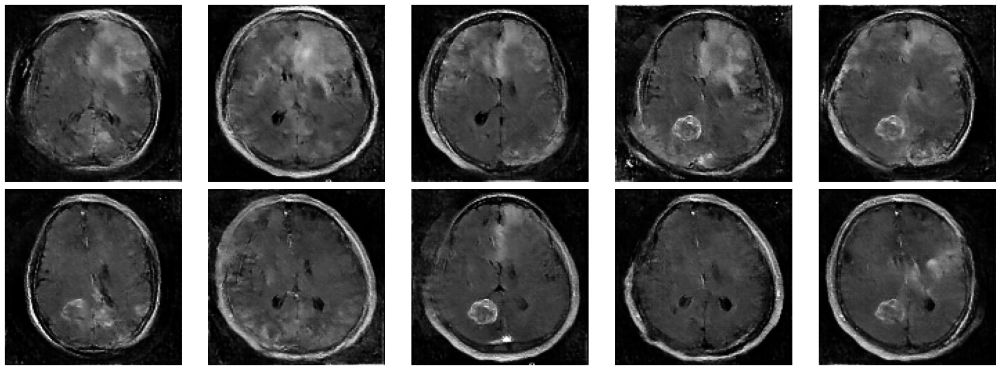

4/4 [==============================] - 2s 35ms/step


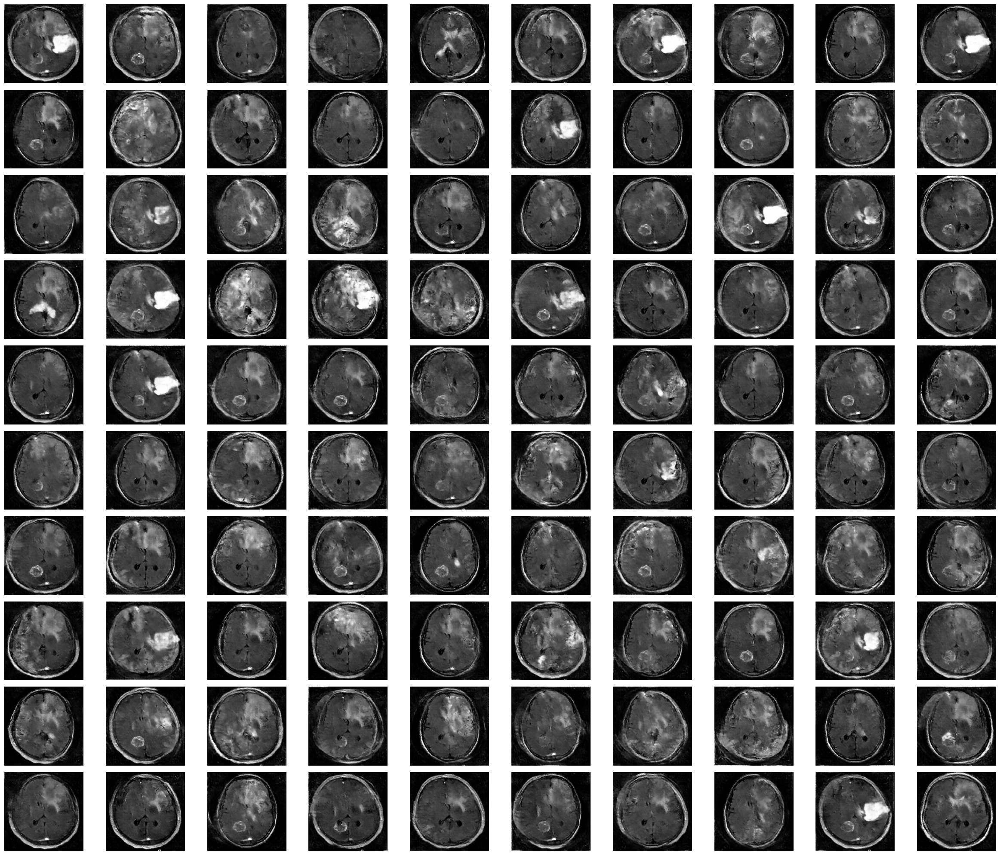

In [ ]:
#The Training
np.random.seed(SEED)
for epoch in range(5):
    for batch in tqdm(range(STEPS_PER_EPOCH)):

        noise = np.random.normal(0,1, size=(BATCH_SIZE, NOISE_DIM))
        fake_X = generator.predict(noise)

        idx = np.random.randint(0, X_train.shape[0], size=BATCH_SIZE)
        real_X = X_train[idx]

        X = np.concatenate((real_X, fake_X))

        disc_y = np.zeros(2*BATCH_SIZE)
        disc_y[:BATCH_SIZE] = 1

        d_loss = discriminator.train_on_batch(X, disc_y)

        y_gen = np.ones(BATCH_SIZE)
        g_loss = gan.train_on_batch(noise, y_gen)

    print(f"EPOCH: {epoch + 1} Generator Loss: {g_loss:.4f} Discriminator Loss: {d_loss:.4f}")
    noise = np.random.normal(0, 1, size=(10,NOISE_DIM))
    sample_images(noise, (2,5))

#Generation
noise = np.random.normal(0, 1, size=(100, NOISE_DIM))
sample_images(noise, (10,10), (24,20), save=True)

In [ ]:
#Testing Generated Sample
generated_images = generator.predict(noise)
generated_images.shape

4/4 [==============================] - 0s 72ms/step


(100, 128, 128, 1)

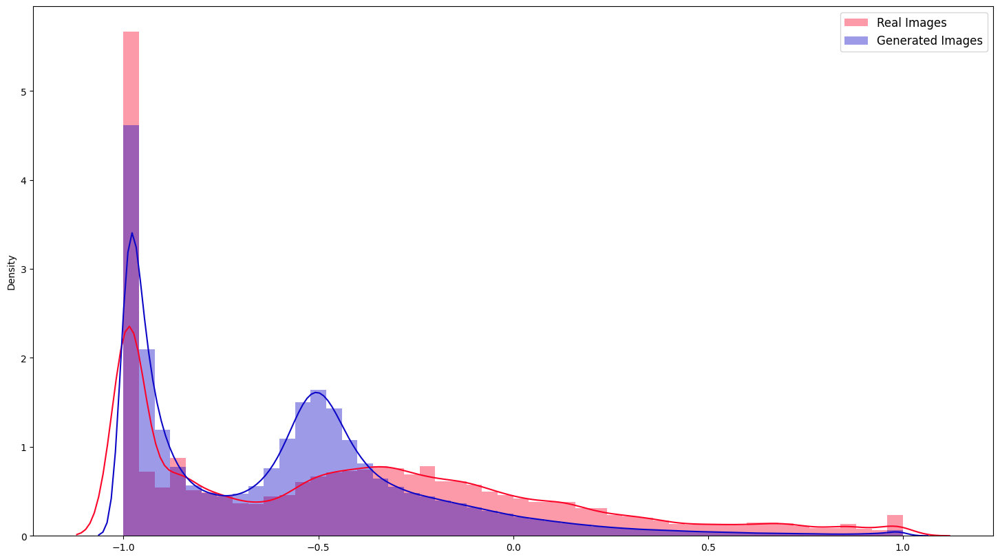

In [ ]:
fig, axs = plt.subplots(ncols=1, nrows=1, figsize=(18,10))

sns.distplot(X_train, label='Real Images', hist=True, color='#fc0328', ax=axs)
sns.distplot(generated_images, label='Generated Images', hist=True, color='#0c06c7', ax=axs)

axs.legend(loc='upper right', prop={'size': 12})

plt.show()

In [ ]:
import numpy as np
import tensorflow as tf
from tensorflow.keras.applications import InceptionV3
from scipy.linalg import sqrtm

def resize_images(images, target_size=(75, 75)):
    resized_images = tf.image.resize(images, target_size)
    return resized_images

def preprocess_images(images):
    images = images.numpy()
    images = (images.astype("float32") - 127.5) / 127.5
    images = tf.convert_to_tensor(images)
    return images

def calculate_fid_score(real_images, generated_images, batch_size=64):
    real_images_resized = preprocess_images(resize_images(real_images))
    generated_images_resized = preprocess_images(resize_images(generated_images))

    inception_model = InceptionV3(include_top=False, weights='imagenet', pooling='avg', input_shape=(None, None, 3))

    real_activations = inception_model.predict(real_images_resized, batch_size=batch_size)
    generated_activations = inception_model.predict(generated_images_resized, batch_size=batch_size)

    mu_real, sigma_real = np.mean(real_activations, axis=0), np.cov(real_activations, rowvar=False)
    mu_generated, sigma_generated = np.mean(generated_activations, axis=0), np.cov(generated_activations, rowvar=False)

    squared_diff = np.sum((mu_real - mu_generated)**2)

    cov_mean = sqrtm(sigma_real.dot(sigma_generated))

    if np.iscomplexobj(cov_mean):
        cov_mean = cov_mean.real

    fid_score = squared_diff + np.trace(sigma_real + sigma_generated - 2*cov_mean)

    return fid_score

fid_score = calculate_fid_score(X_train, generated_images)
print("FID score:", fid_score)
